# Notebook 5. Completing Time Series.

In [1]:
from typing import List
from typing import Dict
from typing import Tuple
from typing import Optional
from typing import Union
from typing import Any
from typing import Callable
from typing import Set

import os
import copy
from collections import OrderedDict
from collections import defaultdict
import pickle

import joblib
import pandas as pd
import numpy as np
import seaborn as sns
import sklearn as sk
import matplotlib.pyplot as plt

%matplotlib inline
RANDOM_SEED: int = 42
np.random.seed(RANDOM_SEED)
EstimatorType: Union = Union[sk.base.BaseEstimator, Any]

Reading and preparing the data.

In [2]:
rf_log_relative: EstimatorType = joblib.load('algorithms/rf-log-relative.jbl')
MONTHS_IN_YEAR: int = 12
HUNDRED_PERCENT: float = 100.

class DataTable: pass
all_data_with_na: DataTable = joblib.load('prepared_data/all_data_with_na.jbl')
all_data_with_na.matrix = all_data_with_na.matrix[all_data_with_na.matrix['PERIOD_ID'] <= MONTHS_IN_YEAR]

if not os.path.exists("images/fill/"):
    os.makedirs("images/fill/")

In [3]:
y_all_id_relative: Union[np.array, List[float]] = np.array(copy.deepcopy(
    all_data_with_na.matrix[all_data_with_na.id_target_relative_key]))
X_all: pd.DataFrame = copy.deepcopy(all_data_with_na.matrix).drop(
    all_data_with_na.explicit_target_keys + ['CONTRACT_ID'], axis=1)
np_X_all: Union[np.array, List[List[float]]] = np.array(X_all)

Use `rf_log_relative` to compute one-period prediction as well as NA timeseries completion.

In [4]:
feature_to_idx: Dict[str, int] = dict()

idx: int; name: str
for idx, name in enumerate(X_all.columns):
    feature_to_idx[name] = idx

y_1_step_predicted: Union[np.array, List[float]] = np.zeros_like(y_all_id_relative)

last_contract_id: Optional[str] = None
repayment_actual_history: List[float] = list()
cumsum_actual: float = 0.

idx_id_actual_shift_1: int    = feature_to_idx['HISTORY_SHIFT_1_REPAYMENT_ACTUAL']
idx_id_actual_shift_2: int    = feature_to_idx['HISTORY_SHIFT_2_REPAYMENT_ACTUAL']
idx_id_relative_shift_1: int  = feature_to_idx['RELATIVE_HISTORY_SHIFT_1_REPAYMENT_ACTUAL']
idx_id_relative_shift_2: int  = feature_to_idx['RELATIVE_HISTORY_SHIFT_2_REPAYMENT_ACTUAL']
idx_log_actual_shift_1: int   = feature_to_idx['LOG_HISTORY_SHIFT_1_REPAYMENT_ACTUAL']
idx_log_actual_shift_2: int   = feature_to_idx['LOG_HISTORY_SHIFT_2_REPAYMENT_ACTUAL']
idx_log_relative_shift_1: int = feature_to_idx['LOG_RELATIVE_HISTORY_SHIFT_1_REPAYMENT_ACTUAL']
idx_log_relative_shift_2: int = feature_to_idx['LOG_RELATIVE_HISTORY_SHIFT_2_REPAYMENT_ACTUAL']

idx_cumsum_id_actual: int     = feature_to_idx['CUMSUM_REPAYMENT_ACTUAL']
idx_cumsum_id_relative: int   = feature_to_idx['RELATIVE_CUMSUM_REPAYMENT_ACTUAL']
idx_cumsum_log_actual: int    = feature_to_idx['LOG_CUMSUM_REPAYMENT_ACTUAL']
idx_cumsum_log_relative: int  = feature_to_idx['LOG_RELATIVE_CUMSUM_REPAYMENT_ACTUAL']

idx_average_id_actual: int    = feature_to_idx['AVERAGE_REPAYMENT_ACTUAL']
idx_average_id_relative: int  = feature_to_idx['RELATIVE_AVERAGE_REPAYMENT_ACTUAL']
idx_average_log_actual: int   = feature_to_idx['LOG_AVERAGE_REPAYMENT_ACTUAL']
idx_average_log_relative: int = feature_to_idx['LOG_RELATIVE_AVERAGE_REPAYMENT_ACTUAL']

idx: int = 0
row: Dict[str, Any]
for _, row in all_data_with_na.matrix.iterrows():
    print(idx, "of", all_data_with_na.matrix.shape[0])
    features: Union[np.array, List[float]] = np_X_all[idx]
    contract_id: str = row['CONTRACT_ID']
    if contract_id != last_contract_id:
        last_contract_id = contract_id
        repayment_actual_history = [row['REPAYMENT_SCHEDULED'], row['REPAYMENT_SCHEDULED']]
        cumsum_actual = 0.

    features[idx_id_actual_shift_1]    = repayment_actual_history[-1]
    features[idx_id_actual_shift_2]    = repayment_actual_history[-2]
    features[idx_id_relative_shift_1]  = repayment_actual_history[-1] / row['CONTRACT_SUM'] * HUNDRED_PERCENT
    features[idx_id_relative_shift_2]  = repayment_actual_history[-2] / row['CONTRACT_SUM'] * HUNDRED_PERCENT
    features[idx_log_actual_shift_1]   = np.log1p(features[idx_id_actual_shift_1])
    features[idx_log_actual_shift_2]   = np.log1p(features[idx_id_actual_shift_2])
    features[idx_log_relative_shift_1] = np.log1p(features[idx_id_relative_shift_1])
    features[idx_log_relative_shift_2] = np.log1p(features[idx_id_relative_shift_2])

    features[idx_cumsum_id_actual]    = cumsum_actual
    features[idx_cumsum_id_relative]  = cumsum_actual / row['CONTRACT_SUM'] * HUNDRED_PERCENT
    features[idx_cumsum_log_actual]   = np.log1p(features[idx_cumsum_id_actual])
    features[idx_cumsum_log_relative] = np.log1p(features[idx_cumsum_id_relative])

    features[idx_average_id_actual]    = cumsum_actual / row['PERIOD_ID']
    features[idx_average_id_relative]  = features[idx_average_id_actual] / row['CONTRACT_SUM'] * HUNDRED_PERCENT
    features[idx_average_log_actual]   = np.log1p(features[idx_average_id_actual])
    features[idx_average_log_relative] = np.log1p(features[idx_average_id_relative])

    relative_response: Union[float, np.array] = np.expm1(
        rf_log_relative.predict(np.array([features]))[0])
    if np.isnan(y_all_id_relative[idx]):
        y_all_id_relative[idx] = relative_response
    y_1_step_predicted[idx] = relative_response
    
    repayment_actual_history.append(y_all_id_relative[idx] * row['CONTRACT_SUM'] / HUNDRED_PERCENT)
    cumsum_actual += repayment_actual_history[-1]
    idx += 1

0 of 45499
1 of 45499
2 of 45499
3 of 45499
4 of 45499
5 of 45499
6 of 45499
7 of 45499
8 of 45499
9 of 45499
10 of 45499
11 of 45499
12 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13 of 45499
14 of 45499
15 of 45499
16 of 45499
17 of 45499
18 of 45499
19 of 45499
20 of 45499
21 of 45499
22 of 45499
23 of 45499
24 of 45499
25 of 45499
26 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27 of 45499
28 of 45499
29 of 45499
30 of 45499
31 of 45499
32 of 45499
33 of 45499
34 of 45499
35 of 45499
36 of 45499
37 of 45499
38 of 45499
39 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40 of 45499
41 of 45499
42 of 45499
43 of 45499
44 of 45499
45 of 45499
46 of 45499
47 of 45499
48 of 45499
49 of 45499
50 of 45499
51 of 45499
52 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

53 of 45499
54 of 45499
55 of 45499
56 of 45499
57 of 45499
58 of 45499
59 of 45499
60 of 45499
61 of 45499
62 of 45499
63 of 45499
64 of 45499
65 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

66 of 45499
67 of 45499
68 of 45499
69 of 45499
70 of 45499
71 of 45499
72 of 45499
73 of 45499
74 of 45499
75 of 45499
76 of 45499
77 of 45499
78 of 45499
79 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

80 of 45499
81 of 45499
82 of 45499
83 of 45499
84 of 45499
85 of 45499
86 of 45499
87 of 45499
88 of 45499
89 of 45499
90 of 45499
91 of 45499
92 of 45499
93 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

94 of 45499
95 of 45499
96 of 45499
97 of 45499
98 of 45499
99 of 45499
100 of 45499
101 of 45499
102 of 45499
103 of 45499
104 of 45499
105 of 45499
106 of 45499
107 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

108 of 45499
109 of 45499
110 of 45499
111 of 45499
112 of 45499
113 of 45499
114 of 45499
115 of 45499
116 of 45499
117 of 45499
118 of 45499
119 of 45499
120 of 45499
121 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

122 of 45499
123 of 45499
124 of 45499
125 of 45499
126 of 45499
127 of 45499
128 of 45499
129 of 45499
130 of 45499
131 of 45499
132 of 45499
133 of 45499
134 of 45499
135 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

136 of 45499
137 of 45499
138 of 45499
139 of 45499
140 of 45499
141 of 45499
142 of 45499
143 of 45499
144 of 45499
145 of 45499
146 of 45499
147 of 45499
148 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

149 of 45499
150 of 45499
151 of 45499
152 of 45499
153 of 45499
154 of 45499
155 of 45499
156 of 45499
157 of 45499
158 of 45499
159 of 45499
160 of 45499
161 of 45499
162 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

163 of 45499
164 of 45499
165 of 45499
166 of 45499
167 of 45499
168 of 45499
169 of 45499
170 of 45499
171 of 45499
172 of 45499
173 of 45499
174 of 45499
175 of 45499
176 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

177 of 45499
178 of 45499
179 of 45499
180 of 45499
181 of 45499
182 of 45499
183 of 45499
184 of 45499
185 of 45499
186 of 45499
187 of 45499
188 of 45499
189 of 45499
190 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

191 of 45499
192 of 45499
193 of 45499
194 of 45499
195 of 45499
196 of 45499
197 of 45499
198 of 45499
199 of 45499
200 of 45499
201 of 45499
202 of 45499
203 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

204 of 45499
205 of 45499
206 of 45499
207 of 45499
208 of 45499
209 of 45499
210 of 45499
211 of 45499
212 of 45499
213 of 45499
214 of 45499
215 of 45499
216 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

217 of 45499
218 of 45499
219 of 45499
220 of 45499
221 of 45499
222 of 45499
223 of 45499
224 of 45499
225 of 45499
226 of 45499
227 of 45499
228 of 45499
229 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

230 of 45499
231 of 45499
232 of 45499
233 of 45499
234 of 45499
235 of 45499
236 of 45499
237 of 45499
238 of 45499
239 of 45499
240 of 45499
241 of 45499
242 of 45499
243 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

244 of 45499
245 of 45499
246 of 45499
247 of 45499
248 of 45499
249 of 45499
250 of 45499
251 of 45499
252 of 45499
253 of 45499
254 of 45499
255 of 45499
256 of 45499
257 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

258 of 45499
259 of 45499
260 of 45499
261 of 45499
262 of 45499
263 of 45499
264 of 45499
265 of 45499
266 of 45499
267 of 45499
268 of 45499
269 of 45499
270 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

271 of 45499
272 of 45499
273 of 45499
274 of 45499
275 of 45499
276 of 45499
277 of 45499
278 of 45499
279 of 45499
280 of 45499
281 of 45499
282 of 45499
283 of 45499
284 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

285 of 45499
286 of 45499
287 of 45499
288 of 45499
289 of 45499
290 of 45499
291 of 45499
292 of 45499
293 of 45499
294 of 45499
295 of 45499
296 of 45499
297 of 45499
298 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

299 of 45499
300 of 45499
301 of 45499
302 of 45499
303 of 45499
304 of 45499
305 of 45499
306 of 45499
307 of 45499
308 of 45499
309 of 45499
310 of 45499
311 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

312 of 45499
313 of 45499
314 of 45499
315 of 45499
316 of 45499
317 of 45499
318 of 45499
319 of 45499
320 of 45499
321 of 45499
322 of 45499
323 of 45499
324 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

325 of 45499
326 of 45499
327 of 45499
328 of 45499
329 of 45499
330 of 45499
331 of 45499
332 of 45499
333 of 45499
334 of 45499
335 of 45499
336 of 45499
337 of 45499
338 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

339 of 45499
340 of 45499
341 of 45499
342 of 45499
343 of 45499
344 of 45499
345 of 45499
346 of 45499
347 of 45499
348 of 45499
349 of 45499
350 of 45499
351 of 45499
352 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

353 of 45499
354 of 45499
355 of 45499
356 of 45499
357 of 45499
358 of 45499
359 of 45499
360 of 45499
361 of 45499
362 of 45499
363 of 45499
364 of 45499
365 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

366 of 45499
367 of 45499
368 of 45499
369 of 45499
370 of 45499
371 of 45499
372 of 45499
373 of 45499
374 of 45499
375 of 45499
376 of 45499
377 of 45499
378 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

379 of 45499
380 of 45499
381 of 45499
382 of 45499
383 of 45499
384 of 45499
385 of 45499
386 of 45499
387 of 45499
388 of 45499
389 of 45499
390 of 45499
391 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

392 of 45499
393 of 45499
394 of 45499
395 of 45499
396 of 45499
397 of 45499
398 of 45499
399 of 45499
400 of 45499
401 of 45499
402 of 45499
403 of 45499
404 of 45499
405 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

406 of 45499
407 of 45499
408 of 45499
409 of 45499
410 of 45499
411 of 45499
412 of 45499
413 of 45499
414 of 45499
415 of 45499
416 of 45499
417 of 45499
418 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

419 of 45499
420 of 45499
421 of 45499
422 of 45499
423 of 45499
424 of 45499
425 of 45499
426 of 45499
427 of 45499
428 of 45499
429 of 45499
430 of 45499
431 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

432 of 45499
433 of 45499
434 of 45499
435 of 45499
436 of 45499
437 of 45499
438 of 45499
439 of 45499
440 of 45499
441 of 45499
442 of 45499
443 of 45499
444 of 45499
445 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

446 of 45499
447 of 45499
448 of 45499
449 of 45499
450 of 45499
451 of 45499
452 of 45499
453 of 45499
454 of 45499
455 of 45499
456 of 45499
457 of 45499
458 of 45499
459 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

460 of 45499
461 of 45499
462 of 45499
463 of 45499
464 of 45499
465 of 45499
466 of 45499
467 of 45499
468 of 45499
469 of 45499
470 of 45499
471 of 45499
472 of 45499
473 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

474 of 45499
475 of 45499
476 of 45499
477 of 45499
478 of 45499
479 of 45499
480 of 45499
481 of 45499
482 of 45499
483 of 45499
484 of 45499
485 of 45499
486 of 45499
487 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

488 of 45499
489 of 45499
490 of 45499
491 of 45499
492 of 45499
493 of 45499
494 of 45499
495 of 45499
496 of 45499
497 of 45499
498 of 45499
499 of 45499
500 of 45499
501 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

502 of 45499
503 of 45499
504 of 45499
505 of 45499
506 of 45499
507 of 45499
508 of 45499
509 of 45499
510 of 45499
511 of 45499
512 of 45499
513 of 45499
514 of 45499
515 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

516 of 45499
517 of 45499
518 of 45499
519 of 45499
520 of 45499
521 of 45499
522 of 45499
523 of 45499
524 of 45499
525 of 45499
526 of 45499
527 of 45499
528 of 45499
529 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

530 of 45499
531 of 45499
532 of 45499
533 of 45499
534 of 45499
535 of 45499
536 of 45499
537 of 45499
538 of 45499
539 of 45499
540 of 45499
541 of 45499
542 of 45499
543 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

544 of 45499
545 of 45499
546 of 45499
547 of 45499
548 of 45499
549 of 45499
550 of 45499
551 of 45499
552 of 45499
553 of 45499
554 of 45499
555 of 45499
556 of 45499
557 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

558 of 45499
559 of 45499
560 of 45499
561 of 45499
562 of 45499
563 of 45499
564 of 45499
565 of 45499
566 of 45499
567 of 45499
568 of 45499
569 of 45499
570 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

571 of 45499
572 of 45499
573 of 45499
574 of 45499
575 of 45499
576 of 45499
577 of 45499
578 of 45499
579 of 45499
580 of 45499
581 of 45499
582 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

583 of 45499
584 of 45499
585 of 45499
586 of 45499
587 of 45499
588 of 45499
589 of 45499
590 of 45499
591 of 45499
592 of 45499
593 of 45499
594 of 45499
595 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

596 of 45499
597 of 45499
598 of 45499
599 of 45499
600 of 45499
601 of 45499
602 of 45499
603 of 45499
604 of 45499
605 of 45499
606 of 45499
607 of 45499
608 of 45499
609 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

610 of 45499
611 of 45499
612 of 45499
613 of 45499
614 of 45499
615 of 45499
616 of 45499
617 of 45499
618 of 45499
619 of 45499
620 of 45499
621 of 45499
622 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

623 of 45499
624 of 45499
625 of 45499
626 of 45499
627 of 45499
628 of 45499
629 of 45499
630 of 45499
631 of 45499
632 of 45499
633 of 45499
634 of 45499
635 of 45499
636 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

637 of 45499
638 of 45499
639 of 45499
640 of 45499
641 of 45499
642 of 45499
643 of 45499
644 of 45499
645 of 45499
646 of 45499
647 of 45499
648 of 45499
649 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

650 of 45499
651 of 45499
652 of 45499
653 of 45499
654 of 45499
655 of 45499
656 of 45499
657 of 45499
658 of 45499
659 of 45499
660 of 45499
661 of 45499
662 of 45499
663 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

664 of 45499
665 of 45499
666 of 45499
667 of 45499
668 of 45499
669 of 45499
670 of 45499
671 of 45499
672 of 45499
673 of 45499
674 of 45499
675 of 45499
676 of 45499
677 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

678 of 45499
679 of 45499
680 of 45499
681 of 45499
682 of 45499
683 of 45499
684 of 45499
685 of 45499
686 of 45499
687 of 45499
688 of 45499
689 of 45499
690 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

691 of 45499
692 of 45499
693 of 45499
694 of 45499
695 of 45499
696 of 45499
697 of 45499
698 of 45499
699 of 45499
700 of 45499
701 of 45499
702 of 45499
703 of 45499
704 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

705 of 45499
706 of 45499
707 of 45499
708 of 45499
709 of 45499
710 of 45499
711 of 45499
712 of 45499
713 of 45499
714 of 45499
715 of 45499
716 of 45499
717 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

718 of 45499
719 of 45499
720 of 45499
721 of 45499
722 of 45499
723 of 45499
724 of 45499
725 of 45499
726 of 45499
727 of 45499
728 of 45499
729 of 45499
730 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

731 of 45499
732 of 45499
733 of 45499
734 of 45499
735 of 45499
736 of 45499
737 of 45499
738 of 45499
739 of 45499
740 of 45499
741 of 45499
742 of 45499
743 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

744 of 45499
745 of 45499
746 of 45499
747 of 45499
748 of 45499
749 of 45499
750 of 45499
751 of 45499
752 of 45499
753 of 45499
754 of 45499
755 of 45499
756 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

757 of 45499
758 of 45499
759 of 45499
760 of 45499
761 of 45499
762 of 45499
763 of 45499
764 of 45499
765 of 45499
766 of 45499
767 of 45499
768 of 45499
769 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

770 of 45499
771 of 45499
772 of 45499
773 of 45499
774 of 45499
775 of 45499
776 of 45499
777 of 45499
778 of 45499
779 of 45499
780 of 45499
781 of 45499
782 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

783 of 45499
784 of 45499
785 of 45499
786 of 45499
787 of 45499
788 of 45499
789 of 45499
790 of 45499
791 of 45499
792 of 45499
793 of 45499
794 of 45499
795 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

796 of 45499
797 of 45499
798 of 45499
799 of 45499
800 of 45499
801 of 45499
802 of 45499
803 of 45499
804 of 45499
805 of 45499
806 of 45499
807 of 45499
808 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

809 of 45499
810 of 45499
811 of 45499
812 of 45499
813 of 45499
814 of 45499
815 of 45499
816 of 45499
817 of 45499
818 of 45499
819 of 45499
820 of 45499
821 of 45499
822 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

823 of 45499
824 of 45499
825 of 45499
826 of 45499
827 of 45499
828 of 45499
829 of 45499
830 of 45499
831 of 45499
832 of 45499
833 of 45499
834 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

835 of 45499
836 of 45499
837 of 45499
838 of 45499
839 of 45499
840 of 45499
841 of 45499
842 of 45499
843 of 45499
844 of 45499
845 of 45499
846 of 45499
847 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

848 of 45499
849 of 45499
850 of 45499
851 of 45499
852 of 45499
853 of 45499
854 of 45499
855 of 45499
856 of 45499
857 of 45499
858 of 45499
859 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

860 of 45499
861 of 45499
862 of 45499
863 of 45499
864 of 45499
865 of 45499
866 of 45499
867 of 45499
868 of 45499
869 of 45499
870 of 45499
871 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

872 of 45499
873 of 45499
874 of 45499
875 of 45499
876 of 45499
877 of 45499
878 of 45499
879 of 45499
880 of 45499
881 of 45499
882 of 45499
883 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

884 of 45499
885 of 45499
886 of 45499
887 of 45499
888 of 45499
889 of 45499
890 of 45499
891 of 45499
892 of 45499
893 of 45499
894 of 45499
895 of 45499
896 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

897 of 45499
898 of 45499
899 of 45499
900 of 45499
901 of 45499
902 of 45499
903 of 45499
904 of 45499
905 of 45499
906 of 45499
907 of 45499
908 of 45499
909 of 45499
910 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

911 of 45499
912 of 45499
913 of 45499
914 of 45499
915 of 45499
916 of 45499
917 of 45499
918 of 45499
919 of 45499
920 of 45499
921 of 45499
922 of 45499
923 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

924 of 45499
925 of 45499
926 of 45499
927 of 45499
928 of 45499
929 of 45499
930 of 45499
931 of 45499
932 of 45499
933 of 45499
934 of 45499
935 of 45499
936 of 45499
937 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

938 of 45499
939 of 45499
940 of 45499
941 of 45499
942 of 45499
943 of 45499
944 of 45499
945 of 45499
946 of 45499
947 of 45499
948 of 45499
949 of 45499
950 of 45499
951 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

952 of 45499
953 of 45499
954 of 45499
955 of 45499
956 of 45499
957 of 45499
958 of 45499
959 of 45499
960 of 45499
961 of 45499
962 of 45499
963 of 45499
964 of 45499
965 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

966 of 45499
967 of 45499
968 of 45499
969 of 45499
970 of 45499
971 of 45499
972 of 45499
973 of 45499
974 of 45499
975 of 45499
976 of 45499
977 of 45499
978 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

979 of 45499
980 of 45499
981 of 45499
982 of 45499
983 of 45499
984 of 45499
985 of 45499
986 of 45499
987 of 45499
988 of 45499
989 of 45499
990 of 45499
991 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

992 of 45499
993 of 45499
994 of 45499
995 of 45499
996 of 45499
997 of 45499
998 of 45499
999 of 45499
1000 of 45499
1001 of 45499
1002 of 45499
1003 of 45499
1004 of 45499
1005 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1006 of 45499
1007 of 45499
1008 of 45499
1009 of 45499
1010 of 45499
1011 of 45499
1012 of 45499
1013 of 45499
1014 of 45499
1015 of 45499
1016 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1017 of 45499
1018 of 45499
1019 of 45499
1020 of 45499
1021 of 45499
1022 of 45499
1023 of 45499
1024 of 45499
1025 of 45499
1026 of 45499
1027 of 45499
1028 of 45499
1029 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1030 of 45499
1031 of 45499
1032 of 45499
1033 of 45499
1034 of 45499
1035 of 45499
1036 of 45499
1037 of 45499
1038 of 45499
1039 of 45499
1040 of 45499
1041 of 45499
1042 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1043 of 45499
1044 of 45499
1045 of 45499
1046 of 45499
1047 of 45499
1048 of 45499
1049 of 45499
1050 of 45499
1051 of 45499
1052 of 45499
1053 of 45499
1054 of 45499
1055 of 45499
1056 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1057 of 45499
1058 of 45499
1059 of 45499
1060 of 45499
1061 of 45499
1062 of 45499
1063 of 45499
1064 of 45499
1065 of 45499
1066 of 45499
1067 of 45499
1068 of 45499
1069 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1070 of 45499
1071 of 45499
1072 of 45499
1073 of 45499
1074 of 45499
1075 of 45499
1076 of 45499
1077 of 45499
1078 of 45499
1079 of 45499
1080 of 45499
1081 of 45499
1082 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1083 of 45499
1084 of 45499
1085 of 45499
1086 of 45499
1087 of 45499
1088 of 45499
1089 of 45499
1090 of 45499
1091 of 45499
1092 of 45499
1093 of 45499
1094 of 45499
1095 of 45499
1096 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1097 of 45499
1098 of 45499
1099 of 45499
1100 of 45499
1101 of 45499
1102 of 45499
1103 of 45499
1104 of 45499
1105 of 45499
1106 of 45499
1107 of 45499
1108 of 45499
1109 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1110 of 45499
1111 of 45499
1112 of 45499
1113 of 45499
1114 of 45499
1115 of 45499
1116 of 45499
1117 of 45499
1118 of 45499
1119 of 45499
1120 of 45499
1121 of 45499
1122 of 45499
1123 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1124 of 45499
1125 of 45499
1126 of 45499
1127 of 45499
1128 of 45499
1129 of 45499
1130 of 45499
1131 of 45499
1132 of 45499
1133 of 45499
1134 of 45499
1135 of 45499
1136 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1137 of 45499
1138 of 45499
1139 of 45499
1140 of 45499
1141 of 45499
1142 of 45499
1143 of 45499
1144 of 45499
1145 of 45499
1146 of 45499
1147 of 45499
1148 of 45499
1149 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1150 of 45499
1151 of 45499
1152 of 45499
1153 of 45499
1154 of 45499
1155 of 45499
1156 of 45499
1157 of 45499
1158 of 45499
1159 of 45499
1160 of 45499
1161 of 45499
1162 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1163 of 45499
1164 of 45499
1165 of 45499
1166 of 45499
1167 of 45499
1168 of 45499
1169 of 45499
1170 of 45499
1171 of 45499
1172 of 45499
1173 of 45499
1174 of 45499
1175 of 45499
1176 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1177 of 45499
1178 of 45499
1179 of 45499
1180 of 45499
1181 of 45499
1182 of 45499
1183 of 45499
1184 of 45499
1185 of 45499
1186 of 45499
1187 of 45499
1188 of 45499
1189 of 45499
1190 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1191 of 45499
1192 of 45499
1193 of 45499
1194 of 45499
1195 of 45499
1196 of 45499
1197 of 45499
1198 of 45499
1199 of 45499
1200 of 45499
1201 of 45499
1202 of 45499
1203 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1204 of 45499
1205 of 45499
1206 of 45499
1207 of 45499
1208 of 45499
1209 of 45499
1210 of 45499
1211 of 45499
1212 of 45499
1213 of 45499
1214 of 45499
1215 of 45499
1216 of 45499
1217 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1218 of 45499
1219 of 45499
1220 of 45499
1221 of 45499
1222 of 45499
1223 of 45499
1224 of 45499
1225 of 45499
1226 of 45499
1227 of 45499
1228 of 45499
1229 of 45499
1230 of 45499
1231 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1232 of 45499
1233 of 45499
1234 of 45499
1235 of 45499
1236 of 45499
1237 of 45499
1238 of 45499
1239 of 45499
1240 of 45499
1241 of 45499
1242 of 45499
1243 of 45499
1244 of 45499
1245 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1246 of 45499
1247 of 45499
1248 of 45499
1249 of 45499
1250 of 45499
1251 of 45499
1252 of 45499
1253 of 45499
1254 of 45499
1255 of 45499
1256 of 45499
1257 of 45499
1258 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1259 of 45499
1260 of 45499
1261 of 45499
1262 of 45499
1263 of 45499
1264 of 45499
1265 of 45499
1266 of 45499
1267 of 45499
1268 of 45499
1269 of 45499
1270 of 45499
1271 of 45499
1272 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1273 of 45499
1274 of 45499
1275 of 45499
1276 of 45499
1277 of 45499
1278 of 45499
1279 of 45499
1280 of 45499
1281 of 45499
1282 of 45499
1283 of 45499
1284 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1285 of 45499
1286 of 45499
1287 of 45499
1288 of 45499
1289 of 45499
1290 of 45499
1291 of 45499
1292 of 45499
1293 of 45499
1294 of 45499
1295 of 45499
1296 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1297 of 45499
1298 of 45499
1299 of 45499
1300 of 45499
1301 of 45499
1302 of 45499
1303 of 45499
1304 of 45499
1305 of 45499
1306 of 45499
1307 of 45499
1308 of 45499
1309 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1310 of 45499
1311 of 45499
1312 of 45499
1313 of 45499
1314 of 45499
1315 of 45499
1316 of 45499
1317 of 45499
1318 of 45499
1319 of 45499
1320 of 45499
1321 of 45499
1322 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1323 of 45499
1324 of 45499
1325 of 45499
1326 of 45499
1327 of 45499
1328 of 45499
1329 of 45499
1330 of 45499
1331 of 45499
1332 of 45499
1333 of 45499
1334 of 45499
1335 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1336 of 45499
1337 of 45499
1338 of 45499
1339 of 45499
1340 of 45499
1341 of 45499
1342 of 45499
1343 of 45499
1344 of 45499
1345 of 45499
1346 of 45499
1347 of 45499
1348 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1349 of 45499
1350 of 45499
1351 of 45499
1352 of 45499
1353 of 45499
1354 of 45499
1355 of 45499
1356 of 45499
1357 of 45499
1358 of 45499
1359 of 45499
1360 of 45499
1361 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1362 of 45499
1363 of 45499
1364 of 45499
1365 of 45499
1366 of 45499
1367 of 45499
1368 of 45499
1369 of 45499
1370 of 45499
1371 of 45499
1372 of 45499
1373 of 45499
1374 of 45499
1375 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1376 of 45499
1377 of 45499
1378 of 45499
1379 of 45499
1380 of 45499
1381 of 45499
1382 of 45499
1383 of 45499
1384 of 45499
1385 of 45499
1386 of 45499
1387 of 45499
1388 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1389 of 45499
1390 of 45499
1391 of 45499
1392 of 45499
1393 of 45499
1394 of 45499
1395 of 45499
1396 of 45499
1397 of 45499
1398 of 45499
1399 of 45499
1400 of 45499
1401 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1402 of 45499
1403 of 45499
1404 of 45499
1405 of 45499
1406 of 45499
1407 of 45499
1408 of 45499
1409 of 45499
1410 of 45499
1411 of 45499
1412 of 45499
1413 of 45499
1414 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1415 of 45499
1416 of 45499
1417 of 45499
1418 of 45499
1419 of 45499
1420 of 45499
1421 of 45499
1422 of 45499
1423 of 45499
1424 of 45499
1425 of 45499
1426 of 45499
1427 of 45499
1428 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1429 of 45499
1430 of 45499
1431 of 45499
1432 of 45499
1433 of 45499
1434 of 45499
1435 of 45499
1436 of 45499
1437 of 45499
1438 of 45499
1439 of 45499
1440 of 45499
1441 of 45499
1442 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1443 of 45499
1444 of 45499
1445 of 45499
1446 of 45499
1447 of 45499
1448 of 45499
1449 of 45499
1450 of 45499
1451 of 45499
1452 of 45499
1453 of 45499
1454 of 45499
1455 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1456 of 45499
1457 of 45499
1458 of 45499
1459 of 45499
1460 of 45499
1461 of 45499
1462 of 45499
1463 of 45499
1464 of 45499
1465 of 45499
1466 of 45499
1467 of 45499
1468 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1469 of 45499
1470 of 45499
1471 of 45499
1472 of 45499
1473 of 45499
1474 of 45499
1475 of 45499
1476 of 45499
1477 of 45499
1478 of 45499
1479 of 45499
1480 of 45499
1481 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1482 of 45499
1483 of 45499
1484 of 45499
1485 of 45499
1486 of 45499
1487 of 45499
1488 of 45499
1489 of 45499
1490 of 45499
1491 of 45499
1492 of 45499
1493 of 45499
1494 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1495 of 45499
1496 of 45499
1497 of 45499
1498 of 45499
1499 of 45499
1500 of 45499
1501 of 45499
1502 of 45499
1503 of 45499
1504 of 45499
1505 of 45499
1506 of 45499
1507 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1508 of 45499
1509 of 45499
1510 of 45499
1511 of 45499
1512 of 45499
1513 of 45499
1514 of 45499
1515 of 45499
1516 of 45499
1517 of 45499
1518 of 45499
1519 of 45499
1520 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1521 of 45499
1522 of 45499
1523 of 45499
1524 of 45499
1525 of 45499
1526 of 45499
1527 of 45499
1528 of 45499
1529 of 45499
1530 of 45499
1531 of 45499
1532 of 45499
1533 of 45499
1534 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1535 of 45499
1536 of 45499
1537 of 45499
1538 of 45499
1539 of 45499
1540 of 45499
1541 of 45499
1542 of 45499
1543 of 45499
1544 of 45499
1545 of 45499
1546 of 45499
1547 of 45499
1548 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1549 of 45499
1550 of 45499
1551 of 45499
1552 of 45499
1553 of 45499
1554 of 45499
1555 of 45499
1556 of 45499
1557 of 45499
1558 of 45499
1559 of 45499
1560 of 45499
1561 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1562 of 45499
1563 of 45499
1564 of 45499
1565 of 45499
1566 of 45499
1567 of 45499
1568 of 45499
1569 of 45499
1570 of 45499
1571 of 45499
1572 of 45499
1573 of 45499
1574 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1575 of 45499
1576 of 45499
1577 of 45499
1578 of 45499
1579 of 45499
1580 of 45499
1581 of 45499
1582 of 45499
1583 of 45499
1584 of 45499
1585 of 45499
1586 of 45499
1587 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1588 of 45499
1589 of 45499
1590 of 45499
1591 of 45499
1592 of 45499
1593 of 45499
1594 of 45499
1595 of 45499
1596 of 45499
1597 of 45499
1598 of 45499
1599 of 45499
1600 of 45499
1601 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1602 of 45499
1603 of 45499
1604 of 45499
1605 of 45499
1606 of 45499
1607 of 45499
1608 of 45499
1609 of 45499
1610 of 45499
1611 of 45499
1612 of 45499
1613 of 45499
1614 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1615 of 45499
1616 of 45499
1617 of 45499
1618 of 45499
1619 of 45499
1620 of 45499
1621 of 45499
1622 of 45499
1623 of 45499
1624 of 45499
1625 of 45499
1626 of 45499
1627 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1628 of 45499
1629 of 45499
1630 of 45499
1631 of 45499
1632 of 45499
1633 of 45499
1634 of 45499
1635 of 45499
1636 of 45499
1637 of 45499
1638 of 45499
1639 of 45499
1640 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1641 of 45499
1642 of 45499
1643 of 45499
1644 of 45499
1645 of 45499
1646 of 45499
1647 of 45499
1648 of 45499
1649 of 45499
1650 of 45499
1651 of 45499
1652 of 45499
1653 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1654 of 45499
1655 of 45499
1656 of 45499
1657 of 45499
1658 of 45499
1659 of 45499
1660 of 45499
1661 of 45499
1662 of 45499
1663 of 45499
1664 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1665 of 45499
1666 of 45499
1667 of 45499
1668 of 45499
1669 of 45499
1670 of 45499
1671 of 45499
1672 of 45499
1673 of 45499
1674 of 45499
1675 of 45499
1676 of 45499
1677 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1678 of 45499
1679 of 45499
1680 of 45499
1681 of 45499
1682 of 45499
1683 of 45499
1684 of 45499
1685 of 45499
1686 of 45499
1687 of 45499
1688 of 45499
1689 of 45499
1690 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1691 of 45499
1692 of 45499
1693 of 45499
1694 of 45499
1695 of 45499
1696 of 45499
1697 of 45499
1698 of 45499
1699 of 45499
1700 of 45499
1701 of 45499
1702 of 45499
1703 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1704 of 45499
1705 of 45499
1706 of 45499
1707 of 45499
1708 of 45499
1709 of 45499
1710 of 45499
1711 of 45499
1712 of 45499
1713 of 45499
1714 of 45499
1715 of 45499
1716 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1717 of 45499
1718 of 45499
1719 of 45499
1720 of 45499
1721 of 45499
1722 of 45499
1723 of 45499
1724 of 45499
1725 of 45499
1726 of 45499
1727 of 45499
1728 of 45499
1729 of 45499
1730 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1731 of 45499
1732 of 45499
1733 of 45499
1734 of 45499
1735 of 45499
1736 of 45499
1737 of 45499
1738 of 45499
1739 of 45499
1740 of 45499
1741 of 45499
1742 of 45499
1743 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1744 of 45499
1745 of 45499
1746 of 45499
1747 of 45499
1748 of 45499
1749 of 45499
1750 of 45499
1751 of 45499
1752 of 45499
1753 of 45499
1754 of 45499
1755 of 45499
1756 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1757 of 45499
1758 of 45499
1759 of 45499
1760 of 45499
1761 of 45499
1762 of 45499
1763 of 45499
1764 of 45499
1765 of 45499
1766 of 45499
1767 of 45499
1768 of 45499
1769 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1770 of 45499
1771 of 45499
1772 of 45499
1773 of 45499
1774 of 45499
1775 of 45499
1776 of 45499
1777 of 45499
1778 of 45499
1779 of 45499
1780 of 45499
1781 of 45499
1782 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1783 of 45499
1784 of 45499
1785 of 45499
1786 of 45499
1787 of 45499
1788 of 45499
1789 of 45499
1790 of 45499
1791 of 45499
1792 of 45499
1793 of 45499
1794 of 45499
1795 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1796 of 45499
1797 of 45499
1798 of 45499
1799 of 45499
1800 of 45499
1801 of 45499
1802 of 45499
1803 of 45499
1804 of 45499
1805 of 45499
1806 of 45499
1807 of 45499
1808 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1809 of 45499
1810 of 45499
1811 of 45499
1812 of 45499
1813 of 45499
1814 of 45499
1815 of 45499
1816 of 45499
1817 of 45499
1818 of 45499
1819 of 45499
1820 of 45499
1821 of 45499
1822 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1823 of 45499
1824 of 45499
1825 of 45499
1826 of 45499
1827 of 45499
1828 of 45499
1829 of 45499
1830 of 45499
1831 of 45499
1832 of 45499
1833 of 45499
1834 of 45499
1835 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1836 of 45499
1837 of 45499
1838 of 45499
1839 of 45499
1840 of 45499
1841 of 45499
1842 of 45499
1843 of 45499
1844 of 45499
1845 of 45499
1846 of 45499
1847 of 45499
1848 of 45499
1849 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1850 of 45499
1851 of 45499
1852 of 45499
1853 of 45499
1854 of 45499
1855 of 45499
1856 of 45499
1857 of 45499
1858 of 45499
1859 of 45499
1860 of 45499
1861 of 45499
1862 of 45499
1863 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1864 of 45499
1865 of 45499
1866 of 45499
1867 of 45499
1868 of 45499
1869 of 45499
1870 of 45499
1871 of 45499
1872 of 45499
1873 of 45499
1874 of 45499
1875 of 45499
1876 of 45499
1877 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1878 of 45499
1879 of 45499
1880 of 45499
1881 of 45499
1882 of 45499
1883 of 45499
1884 of 45499
1885 of 45499
1886 of 45499
1887 of 45499
1888 of 45499
1889 of 45499
1890 of 45499
1891 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1892 of 45499
1893 of 45499
1894 of 45499
1895 of 45499
1896 of 45499
1897 of 45499
1898 of 45499
1899 of 45499
1900 of 45499
1901 of 45499
1902 of 45499
1903 of 45499
1904 of 45499
1905 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1906 of 45499
1907 of 45499
1908 of 45499
1909 of 45499
1910 of 45499
1911 of 45499
1912 of 45499
1913 of 45499
1914 of 45499
1915 of 45499
1916 of 45499
1917 of 45499
1918 of 45499
1919 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1920 of 45499
1921 of 45499
1922 of 45499
1923 of 45499
1924 of 45499
1925 of 45499
1926 of 45499
1927 of 45499
1928 of 45499
1929 of 45499
1930 of 45499
1931 of 45499
1932 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1933 of 45499
1934 of 45499
1935 of 45499
1936 of 45499
1937 of 45499
1938 of 45499
1939 of 45499
1940 of 45499
1941 of 45499
1942 of 45499
1943 of 45499
1944 of 45499
1945 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1946 of 45499
1947 of 45499
1948 of 45499
1949 of 45499
1950 of 45499
1951 of 45499
1952 of 45499
1953 of 45499
1954 of 45499
1955 of 45499
1956 of 45499
1957 of 45499
1958 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1959 of 45499
1960 of 45499
1961 of 45499
1962 of 45499
1963 of 45499
1964 of 45499
1965 of 45499
1966 of 45499
1967 of 45499
1968 of 45499
1969 of 45499
1970 of 45499
1971 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1972 of 45499
1973 of 45499
1974 of 45499
1975 of 45499
1976 of 45499
1977 of 45499
1978 of 45499
1979 of 45499
1980 of 45499
1981 of 45499
1982 of 45499
1983 of 45499
1984 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1985 of 45499
1986 of 45499
1987 of 45499
1988 of 45499
1989 of 45499
1990 of 45499
1991 of 45499
1992 of 45499
1993 of 45499
1994 of 45499
1995 of 45499
1996 of 45499
1997 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

1998 of 45499
1999 of 45499
2000 of 45499
2001 of 45499
2002 of 45499
2003 of 45499
2004 of 45499
2005 of 45499
2006 of 45499
2007 of 45499
2008 of 45499
2009 of 45499
2010 of 45499
2011 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2012 of 45499
2013 of 45499
2014 of 45499
2015 of 45499
2016 of 45499
2017 of 45499
2018 of 45499
2019 of 45499
2020 of 45499
2021 of 45499
2022 of 45499
2023 of 45499
2024 of 45499
2025 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2026 of 45499
2027 of 45499
2028 of 45499
2029 of 45499
2030 of 45499
2031 of 45499
2032 of 45499
2033 of 45499
2034 of 45499
2035 of 45499
2036 of 45499
2037 of 45499
2038 of 45499
2039 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2040 of 45499
2041 of 45499
2042 of 45499
2043 of 45499
2044 of 45499
2045 of 45499
2046 of 45499
2047 of 45499
2048 of 45499
2049 of 45499
2050 of 45499
2051 of 45499
2052 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2053 of 45499
2054 of 45499
2055 of 45499
2056 of 45499
2057 of 45499
2058 of 45499
2059 of 45499
2060 of 45499
2061 of 45499
2062 of 45499
2063 of 45499
2064 of 45499
2065 of 45499
2066 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2067 of 45499
2068 of 45499
2069 of 45499
2070 of 45499
2071 of 45499
2072 of 45499
2073 of 45499
2074 of 45499
2075 of 45499
2076 of 45499
2077 of 45499
2078 of 45499
2079 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2080 of 45499
2081 of 45499
2082 of 45499
2083 of 45499
2084 of 45499
2085 of 45499
2086 of 45499
2087 of 45499
2088 of 45499
2089 of 45499
2090 of 45499
2091 of 45499
2092 of 45499
2093 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2094 of 45499
2095 of 45499
2096 of 45499
2097 of 45499
2098 of 45499
2099 of 45499
2100 of 45499
2101 of 45499
2102 of 45499
2103 of 45499
2104 of 45499
2105 of 45499
2106 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2107 of 45499
2108 of 45499
2109 of 45499
2110 of 45499
2111 of 45499
2112 of 45499
2113 of 45499
2114 of 45499
2115 of 45499
2116 of 45499
2117 of 45499
2118 of 45499
2119 of 45499
2120 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2121 of 45499
2122 of 45499
2123 of 45499
2124 of 45499
2125 of 45499
2126 of 45499
2127 of 45499
2128 of 45499
2129 of 45499
2130 of 45499
2131 of 45499
2132 of 45499
2133 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2134 of 45499
2135 of 45499
2136 of 45499
2137 of 45499
2138 of 45499
2139 of 45499
2140 of 45499
2141 of 45499
2142 of 45499
2143 of 45499
2144 of 45499
2145 of 45499
2146 of 45499
2147 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2148 of 45499
2149 of 45499
2150 of 45499
2151 of 45499
2152 of 45499
2153 of 45499
2154 of 45499
2155 of 45499
2156 of 45499
2157 of 45499
2158 of 45499
2159 of 45499
2160 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2161 of 45499
2162 of 45499
2163 of 45499
2164 of 45499
2165 of 45499
2166 of 45499
2167 of 45499
2168 of 45499
2169 of 45499
2170 of 45499
2171 of 45499
2172 of 45499
2173 of 45499
2174 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2175 of 45499
2176 of 45499
2177 of 45499
2178 of 45499
2179 of 45499
2180 of 45499
2181 of 45499
2182 of 45499
2183 of 45499
2184 of 45499
2185 of 45499
2186 of 45499
2187 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2188 of 45499
2189 of 45499
2190 of 45499
2191 of 45499
2192 of 45499
2193 of 45499
2194 of 45499
2195 of 45499
2196 of 45499
2197 of 45499
2198 of 45499
2199 of 45499
2200 of 45499
2201 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2202 of 45499
2203 of 45499
2204 of 45499
2205 of 45499
2206 of 45499
2207 of 45499
2208 of 45499
2209 of 45499
2210 of 45499
2211 of 45499
2212 of 45499
2213 of 45499
2214 of 45499
2215 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2216 of 45499
2217 of 45499
2218 of 45499
2219 of 45499
2220 of 45499
2221 of 45499
2222 of 45499
2223 of 45499
2224 of 45499
2225 of 45499
2226 of 45499
2227 of 45499
2228 of 45499
2229 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2230 of 45499
2231 of 45499
2232 of 45499
2233 of 45499
2234 of 45499
2235 of 45499
2236 of 45499
2237 of 45499
2238 of 45499
2239 of 45499
2240 of 45499
2241 of 45499
2242 of 45499
2243 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2244 of 45499
2245 of 45499
2246 of 45499
2247 of 45499
2248 of 45499
2249 of 45499
2250 of 45499
2251 of 45499
2252 of 45499
2253 of 45499
2254 of 45499
2255 of 45499
2256 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2257 of 45499
2258 of 45499
2259 of 45499
2260 of 45499
2261 of 45499
2262 of 45499
2263 of 45499
2264 of 45499
2265 of 45499
2266 of 45499
2267 of 45499
2268 of 45499
2269 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2270 of 45499
2271 of 45499
2272 of 45499
2273 of 45499
2274 of 45499
2275 of 45499
2276 of 45499
2277 of 45499
2278 of 45499
2279 of 45499
2280 of 45499
2281 of 45499
2282 of 45499
2283 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2284 of 45499
2285 of 45499
2286 of 45499
2287 of 45499
2288 of 45499
2289 of 45499
2290 of 45499
2291 of 45499
2292 of 45499
2293 of 45499
2294 of 45499
2295 of 45499
2296 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2297 of 45499
2298 of 45499
2299 of 45499
2300 of 45499
2301 of 45499
2302 of 45499
2303 of 45499
2304 of 45499
2305 of 45499
2306 of 45499
2307 of 45499
2308 of 45499
2309 of 45499
2310 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2311 of 45499
2312 of 45499
2313 of 45499
2314 of 45499
2315 of 45499
2316 of 45499
2317 of 45499
2318 of 45499
2319 of 45499
2320 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2321 of 45499
2322 of 45499
2323 of 45499
2324 of 45499
2325 of 45499
2326 of 45499
2327 of 45499
2328 of 45499
2329 of 45499
2330 of 45499
2331 of 45499
2332 of 45499
2333 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2334 of 45499
2335 of 45499
2336 of 45499
2337 of 45499
2338 of 45499
2339 of 45499
2340 of 45499
2341 of 45499
2342 of 45499
2343 of 45499
2344 of 45499
2345 of 45499
2346 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2347 of 45499
2348 of 45499
2349 of 45499
2350 of 45499
2351 of 45499
2352 of 45499
2353 of 45499
2354 of 45499
2355 of 45499
2356 of 45499
2357 of 45499
2358 of 45499
2359 of 45499
2360 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2361 of 45499
2362 of 45499
2363 of 45499
2364 of 45499
2365 of 45499
2366 of 45499
2367 of 45499
2368 of 45499
2369 of 45499
2370 of 45499
2371 of 45499
2372 of 45499
2373 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2374 of 45499
2375 of 45499
2376 of 45499
2377 of 45499
2378 of 45499
2379 of 45499
2380 of 45499
2381 of 45499
2382 of 45499
2383 of 45499
2384 of 45499
2385 of 45499
2386 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2387 of 45499
2388 of 45499
2389 of 45499
2390 of 45499
2391 of 45499
2392 of 45499
2393 of 45499
2394 of 45499
2395 of 45499
2396 of 45499
2397 of 45499
2398 of 45499
2399 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2400 of 45499
2401 of 45499
2402 of 45499
2403 of 45499
2404 of 45499
2405 of 45499
2406 of 45499
2407 of 45499
2408 of 45499
2409 of 45499
2410 of 45499
2411 of 45499
2412 of 45499
2413 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2414 of 45499
2415 of 45499
2416 of 45499
2417 of 45499
2418 of 45499
2419 of 45499
2420 of 45499
2421 of 45499
2422 of 45499
2423 of 45499
2424 of 45499
2425 of 45499
2426 of 45499
2427 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2428 of 45499
2429 of 45499
2430 of 45499
2431 of 45499
2432 of 45499
2433 of 45499
2434 of 45499
2435 of 45499
2436 of 45499
2437 of 45499
2438 of 45499
2439 of 45499
2440 of 45499
2441 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2442 of 45499
2443 of 45499
2444 of 45499
2445 of 45499
2446 of 45499
2447 of 45499
2448 of 45499
2449 of 45499
2450 of 45499
2451 of 45499
2452 of 45499
2453 of 45499
2454 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2455 of 45499
2456 of 45499
2457 of 45499
2458 of 45499
2459 of 45499
2460 of 45499
2461 of 45499
2462 of 45499
2463 of 45499
2464 of 45499
2465 of 45499
2466 of 45499
2467 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2468 of 45499
2469 of 45499
2470 of 45499
2471 of 45499
2472 of 45499
2473 of 45499
2474 of 45499
2475 of 45499
2476 of 45499
2477 of 45499
2478 of 45499
2479 of 45499
2480 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2481 of 45499
2482 of 45499
2483 of 45499
2484 of 45499
2485 of 45499
2486 of 45499
2487 of 45499
2488 of 45499
2489 of 45499
2490 of 45499
2491 of 45499
2492 of 45499
2493 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2494 of 45499
2495 of 45499
2496 of 45499
2497 of 45499
2498 of 45499
2499 of 45499
2500 of 45499
2501 of 45499
2502 of 45499
2503 of 45499
2504 of 45499
2505 of 45499
2506 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2507 of 45499
2508 of 45499
2509 of 45499
2510 of 45499
2511 of 45499
2512 of 45499
2513 of 45499
2514 of 45499
2515 of 45499
2516 of 45499
2517 of 45499
2518 of 45499
2519 of 45499
2520 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2521 of 45499
2522 of 45499
2523 of 45499
2524 of 45499
2525 of 45499
2526 of 45499
2527 of 45499
2528 of 45499
2529 of 45499
2530 of 45499
2531 of 45499
2532 of 45499
2533 of 45499
2534 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2535 of 45499
2536 of 45499
2537 of 45499
2538 of 45499
2539 of 45499
2540 of 45499
2541 of 45499
2542 of 45499
2543 of 45499
2544 of 45499
2545 of 45499
2546 of 45499
2547 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2548 of 45499
2549 of 45499
2550 of 45499
2551 of 45499
2552 of 45499
2553 of 45499
2554 of 45499
2555 of 45499
2556 of 45499
2557 of 45499
2558 of 45499
2559 of 45499
2560 of 45499
2561 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2562 of 45499
2563 of 45499
2564 of 45499
2565 of 45499
2566 of 45499
2567 of 45499
2568 of 45499
2569 of 45499
2570 of 45499
2571 of 45499
2572 of 45499
2573 of 45499
2574 of 45499
2575 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2576 of 45499
2577 of 45499
2578 of 45499
2579 of 45499
2580 of 45499
2581 of 45499
2582 of 45499
2583 of 45499
2584 of 45499
2585 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2586 of 45499
2587 of 45499
2588 of 45499
2589 of 45499
2590 of 45499
2591 of 45499
2592 of 45499
2593 of 45499
2594 of 45499
2595 of 45499
2596 of 45499
2597 of 45499
2598 of 45499
2599 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2600 of 45499
2601 of 45499
2602 of 45499
2603 of 45499
2604 of 45499
2605 of 45499
2606 of 45499
2607 of 45499
2608 of 45499
2609 of 45499
2610 of 45499
2611 of 45499
2612 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2613 of 45499
2614 of 45499
2615 of 45499
2616 of 45499
2617 of 45499
2618 of 45499
2619 of 45499
2620 of 45499
2621 of 45499
2622 of 45499
2623 of 45499
2624 of 45499
2625 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2626 of 45499
2627 of 45499
2628 of 45499
2629 of 45499
2630 of 45499
2631 of 45499
2632 of 45499
2633 of 45499
2634 of 45499
2635 of 45499
2636 of 45499
2637 of 45499
2638 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2639 of 45499
2640 of 45499
2641 of 45499
2642 of 45499
2643 of 45499
2644 of 45499
2645 of 45499
2646 of 45499
2647 of 45499
2648 of 45499
2649 of 45499
2650 of 45499
2651 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2652 of 45499
2653 of 45499
2654 of 45499
2655 of 45499
2656 of 45499
2657 of 45499
2658 of 45499
2659 of 45499
2660 of 45499
2661 of 45499
2662 of 45499
2663 of 45499
2664 of 45499
2665 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2666 of 45499
2667 of 45499
2668 of 45499
2669 of 45499
2670 of 45499
2671 of 45499
2672 of 45499
2673 of 45499
2674 of 45499
2675 of 45499
2676 of 45499
2677 of 45499
2678 of 45499
2679 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2680 of 45499
2681 of 45499
2682 of 45499
2683 of 45499
2684 of 45499
2685 of 45499
2686 of 45499
2687 of 45499
2688 of 45499
2689 of 45499
2690 of 45499
2691 of 45499
2692 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2693 of 45499
2694 of 45499
2695 of 45499
2696 of 45499
2697 of 45499
2698 of 45499
2699 of 45499
2700 of 45499
2701 of 45499
2702 of 45499
2703 of 45499
2704 of 45499
2705 of 45499
2706 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2707 of 45499
2708 of 45499
2709 of 45499
2710 of 45499
2711 of 45499
2712 of 45499
2713 of 45499
2714 of 45499
2715 of 45499
2716 of 45499
2717 of 45499
2718 of 45499
2719 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2720 of 45499
2721 of 45499
2722 of 45499
2723 of 45499
2724 of 45499
2725 of 45499
2726 of 45499
2727 of 45499
2728 of 45499
2729 of 45499
2730 of 45499
2731 of 45499
2732 of 45499
2733 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2734 of 45499
2735 of 45499
2736 of 45499
2737 of 45499
2738 of 45499
2739 of 45499
2740 of 45499
2741 of 45499
2742 of 45499
2743 of 45499
2744 of 45499
2745 of 45499
2746 of 45499
2747 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2748 of 45499
2749 of 45499
2750 of 45499
2751 of 45499
2752 of 45499
2753 of 45499
2754 of 45499
2755 of 45499
2756 of 45499
2757 of 45499
2758 of 45499
2759 of 45499
2760 of 45499
2761 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2762 of 45499
2763 of 45499
2764 of 45499
2765 of 45499
2766 of 45499
2767 of 45499
2768 of 45499
2769 of 45499
2770 of 45499
2771 of 45499
2772 of 45499
2773 of 45499
2774 of 45499
2775 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2776 of 45499
2777 of 45499
2778 of 45499
2779 of 45499
2780 of 45499
2781 of 45499
2782 of 45499
2783 of 45499
2784 of 45499
2785 of 45499
2786 of 45499
2787 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2788 of 45499
2789 of 45499
2790 of 45499
2791 of 45499
2792 of 45499
2793 of 45499
2794 of 45499
2795 of 45499
2796 of 45499
2797 of 45499
2798 of 45499
2799 of 45499
2800 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2801 of 45499
2802 of 45499
2803 of 45499
2804 of 45499
2805 of 45499
2806 of 45499
2807 of 45499
2808 of 45499
2809 of 45499
2810 of 45499
2811 of 45499
2812 of 45499
2813 of 45499
2814 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2815 of 45499
2816 of 45499
2817 of 45499
2818 of 45499
2819 of 45499
2820 of 45499
2821 of 45499
2822 of 45499
2823 of 45499
2824 of 45499
2825 of 45499
2826 of 45499
2827 of 45499
2828 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2829 of 45499
2830 of 45499
2831 of 45499
2832 of 45499
2833 of 45499
2834 of 45499
2835 of 45499
2836 of 45499
2837 of 45499
2838 of 45499
2839 of 45499
2840 of 45499
2841 of 45499
2842 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2843 of 45499
2844 of 45499
2845 of 45499
2846 of 45499
2847 of 45499
2848 of 45499
2849 of 45499
2850 of 45499
2851 of 45499
2852 of 45499
2853 of 45499
2854 of 45499
2855 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2856 of 45499
2857 of 45499
2858 of 45499
2859 of 45499
2860 of 45499
2861 of 45499
2862 of 45499
2863 of 45499
2864 of 45499
2865 of 45499
2866 of 45499
2867 of 45499
2868 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2869 of 45499
2870 of 45499
2871 of 45499
2872 of 45499
2873 of 45499
2874 of 45499
2875 of 45499
2876 of 45499
2877 of 45499
2878 of 45499
2879 of 45499
2880 of 45499
2881 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2882 of 45499
2883 of 45499
2884 of 45499
2885 of 45499
2886 of 45499
2887 of 45499
2888 of 45499
2889 of 45499
2890 of 45499
2891 of 45499
2892 of 45499
2893 of 45499
2894 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2895 of 45499
2896 of 45499
2897 of 45499
2898 of 45499
2899 of 45499
2900 of 45499
2901 of 45499
2902 of 45499
2903 of 45499
2904 of 45499
2905 of 45499
2906 of 45499
2907 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2908 of 45499
2909 of 45499
2910 of 45499
2911 of 45499
2912 of 45499
2913 of 45499
2914 of 45499
2915 of 45499
2916 of 45499
2917 of 45499
2918 of 45499
2919 of 45499
2920 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2921 of 45499
2922 of 45499
2923 of 45499
2924 of 45499
2925 of 45499
2926 of 45499
2927 of 45499
2928 of 45499
2929 of 45499
2930 of 45499
2931 of 45499
2932 of 45499
2933 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2934 of 45499
2935 of 45499
2936 of 45499
2937 of 45499
2938 of 45499
2939 of 45499
2940 of 45499
2941 of 45499
2942 of 45499
2943 of 45499
2944 of 45499
2945 of 45499
2946 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2947 of 45499
2948 of 45499
2949 of 45499
2950 of 45499
2951 of 45499
2952 of 45499
2953 of 45499
2954 of 45499
2955 of 45499
2956 of 45499
2957 of 45499
2958 of 45499
2959 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2960 of 45499
2961 of 45499
2962 of 45499
2963 of 45499
2964 of 45499
2965 of 45499
2966 of 45499
2967 of 45499
2968 of 45499
2969 of 45499
2970 of 45499
2971 of 45499
2972 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2973 of 45499
2974 of 45499
2975 of 45499
2976 of 45499
2977 of 45499
2978 of 45499
2979 of 45499
2980 of 45499
2981 of 45499
2982 of 45499
2983 of 45499
2984 of 45499
2985 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2986 of 45499
2987 of 45499
2988 of 45499
2989 of 45499
2990 of 45499
2991 of 45499
2992 of 45499
2993 of 45499
2994 of 45499
2995 of 45499
2996 of 45499
2997 of 45499
2998 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

2999 of 45499
3000 of 45499
3001 of 45499
3002 of 45499
3003 of 45499
3004 of 45499
3005 of 45499
3006 of 45499
3007 of 45499
3008 of 45499
3009 of 45499
3010 of 45499
3011 of 45499
3012 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3013 of 45499
3014 of 45499
3015 of 45499
3016 of 45499
3017 of 45499
3018 of 45499
3019 of 45499
3020 of 45499
3021 of 45499
3022 of 45499
3023 of 45499
3024 of 45499
3025 of 45499
3026 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3027 of 45499
3028 of 45499
3029 of 45499
3030 of 45499
3031 of 45499
3032 of 45499
3033 of 45499
3034 of 45499
3035 of 45499
3036 of 45499
3037 of 45499
3038 of 45499
3039 of 45499
3040 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3041 of 45499
3042 of 45499
3043 of 45499
3044 of 45499
3045 of 45499
3046 of 45499
3047 of 45499
3048 of 45499
3049 of 45499
3050 of 45499
3051 of 45499
3052 of 45499
3053 of 45499
3054 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3055 of 45499
3056 of 45499
3057 of 45499
3058 of 45499
3059 of 45499
3060 of 45499
3061 of 45499
3062 of 45499
3063 of 45499
3064 of 45499
3065 of 45499
3066 of 45499
3067 of 45499
3068 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3069 of 45499
3070 of 45499
3071 of 45499
3072 of 45499
3073 of 45499
3074 of 45499
3075 of 45499
3076 of 45499
3077 of 45499
3078 of 45499
3079 of 45499
3080 of 45499
3081 of 45499
3082 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3083 of 45499
3084 of 45499
3085 of 45499
3086 of 45499
3087 of 45499
3088 of 45499
3089 of 45499
3090 of 45499
3091 of 45499
3092 of 45499
3093 of 45499
3094 of 45499
3095 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3096 of 45499
3097 of 45499
3098 of 45499
3099 of 45499
3100 of 45499
3101 of 45499
3102 of 45499
3103 of 45499
3104 of 45499
3105 of 45499
3106 of 45499
3107 of 45499
3108 of 45499
3109 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3110 of 45499
3111 of 45499
3112 of 45499
3113 of 45499
3114 of 45499
3115 of 45499
3116 of 45499
3117 of 45499
3118 of 45499
3119 of 45499
3120 of 45499
3121 of 45499
3122 of 45499
3123 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3124 of 45499
3125 of 45499
3126 of 45499
3127 of 45499
3128 of 45499
3129 of 45499
3130 of 45499
3131 of 45499
3132 of 45499
3133 of 45499
3134 of 45499
3135 of 45499
3136 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3137 of 45499
3138 of 45499
3139 of 45499
3140 of 45499
3141 of 45499
3142 of 45499
3143 of 45499
3144 of 45499
3145 of 45499
3146 of 45499
3147 of 45499
3148 of 45499
3149 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3150 of 45499
3151 of 45499
3152 of 45499
3153 of 45499
3154 of 45499
3155 of 45499
3156 of 45499
3157 of 45499
3158 of 45499
3159 of 45499
3160 of 45499
3161 of 45499
3162 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3163 of 45499
3164 of 45499
3165 of 45499
3166 of 45499
3167 of 45499
3168 of 45499
3169 of 45499
3170 of 45499
3171 of 45499
3172 of 45499
3173 of 45499
3174 of 45499
3175 of 45499
3176 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3177 of 45499
3178 of 45499
3179 of 45499
3180 of 45499
3181 of 45499
3182 of 45499
3183 of 45499
3184 of 45499
3185 of 45499
3186 of 45499
3187 of 45499
3188 of 45499
3189 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3190 of 45499
3191 of 45499
3192 of 45499
3193 of 45499
3194 of 45499
3195 of 45499
3196 of 45499
3197 of 45499
3198 of 45499
3199 of 45499
3200 of 45499
3201 of 45499
3202 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3203 of 45499
3204 of 45499
3205 of 45499
3206 of 45499
3207 of 45499
3208 of 45499
3209 of 45499
3210 of 45499
3211 of 45499
3212 of 45499
3213 of 45499
3214 of 45499
3215 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3216 of 45499
3217 of 45499
3218 of 45499
3219 of 45499
3220 of 45499
3221 of 45499
3222 of 45499
3223 of 45499
3224 of 45499
3225 of 45499
3226 of 45499
3227 of 45499
3228 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3229 of 45499
3230 of 45499
3231 of 45499
3232 of 45499
3233 of 45499
3234 of 45499
3235 of 45499
3236 of 45499
3237 of 45499
3238 of 45499
3239 of 45499
3240 of 45499
3241 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3242 of 45499
3243 of 45499
3244 of 45499
3245 of 45499
3246 of 45499
3247 of 45499
3248 of 45499
3249 of 45499
3250 of 45499
3251 of 45499
3252 of 45499
3253 of 45499
3254 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3255 of 45499
3256 of 45499
3257 of 45499
3258 of 45499
3259 of 45499
3260 of 45499
3261 of 45499
3262 of 45499
3263 of 45499
3264 of 45499
3265 of 45499
3266 of 45499
3267 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3268 of 45499
3269 of 45499
3270 of 45499
3271 of 45499
3272 of 45499
3273 of 45499
3274 of 45499
3275 of 45499
3276 of 45499
3277 of 45499
3278 of 45499
3279 of 45499
3280 of 45499
3281 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3282 of 45499
3283 of 45499
3284 of 45499
3285 of 45499
3286 of 45499
3287 of 45499
3288 of 45499
3289 of 45499
3290 of 45499
3291 of 45499
3292 of 45499
3293 of 45499
3294 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3295 of 45499
3296 of 45499
3297 of 45499
3298 of 45499
3299 of 45499
3300 of 45499
3301 of 45499
3302 of 45499
3303 of 45499
3304 of 45499
3305 of 45499
3306 of 45499
3307 of 45499
3308 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3309 of 45499
3310 of 45499
3311 of 45499
3312 of 45499
3313 of 45499
3314 of 45499
3315 of 45499
3316 of 45499
3317 of 45499
3318 of 45499
3319 of 45499
3320 of 45499
3321 of 45499
3322 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3323 of 45499
3324 of 45499
3325 of 45499
3326 of 45499
3327 of 45499
3328 of 45499
3329 of 45499
3330 of 45499
3331 of 45499
3332 of 45499
3333 of 45499
3334 of 45499
3335 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3336 of 45499
3337 of 45499
3338 of 45499
3339 of 45499
3340 of 45499
3341 of 45499
3342 of 45499
3343 of 45499
3344 of 45499
3345 of 45499
3346 of 45499
3347 of 45499
3348 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3349 of 45499
3350 of 45499
3351 of 45499
3352 of 45499
3353 of 45499
3354 of 45499
3355 of 45499
3356 of 45499
3357 of 45499
3358 of 45499
3359 of 45499
3360 of 45499
3361 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3362 of 45499
3363 of 45499
3364 of 45499
3365 of 45499
3366 of 45499
3367 of 45499
3368 of 45499
3369 of 45499
3370 of 45499
3371 of 45499
3372 of 45499
3373 of 45499
3374 of 45499
3375 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3376 of 45499
3377 of 45499
3378 of 45499
3379 of 45499
3380 of 45499
3381 of 45499
3382 of 45499
3383 of 45499
3384 of 45499
3385 of 45499
3386 of 45499
3387 of 45499
3388 of 45499
3389 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3390 of 45499
3391 of 45499
3392 of 45499
3393 of 45499
3394 of 45499
3395 of 45499
3396 of 45499
3397 of 45499
3398 of 45499
3399 of 45499
3400 of 45499
3401 of 45499
3402 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3403 of 45499
3404 of 45499
3405 of 45499
3406 of 45499
3407 of 45499
3408 of 45499
3409 of 45499
3410 of 45499
3411 of 45499
3412 of 45499
3413 of 45499
3414 of 45499
3415 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3416 of 45499
3417 of 45499
3418 of 45499
3419 of 45499
3420 of 45499
3421 of 45499
3422 of 45499
3423 of 45499
3424 of 45499
3425 of 45499
3426 of 45499
3427 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3428 of 45499
3429 of 45499
3430 of 45499
3431 of 45499
3432 of 45499
3433 of 45499
3434 of 45499
3435 of 45499
3436 of 45499
3437 of 45499
3438 of 45499
3439 of 45499
3440 of 45499
3441 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3442 of 45499
3443 of 45499
3444 of 45499
3445 of 45499
3446 of 45499
3447 of 45499
3448 of 45499
3449 of 45499
3450 of 45499
3451 of 45499
3452 of 45499
3453 of 45499
3454 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3455 of 45499
3456 of 45499
3457 of 45499
3458 of 45499
3459 of 45499
3460 of 45499
3461 of 45499
3462 of 45499
3463 of 45499
3464 of 45499
3465 of 45499
3466 of 45499
3467 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3468 of 45499
3469 of 45499
3470 of 45499
3471 of 45499
3472 of 45499
3473 of 45499
3474 of 45499
3475 of 45499
3476 of 45499
3477 of 45499
3478 of 45499
3479 of 45499
3480 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3481 of 45499
3482 of 45499
3483 of 45499
3484 of 45499
3485 of 45499
3486 of 45499
3487 of 45499
3488 of 45499
3489 of 45499
3490 of 45499
3491 of 45499
3492 of 45499
3493 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3494 of 45499
3495 of 45499
3496 of 45499
3497 of 45499
3498 of 45499
3499 of 45499
3500 of 45499
3501 of 45499
3502 of 45499
3503 of 45499
3504 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3505 of 45499
3506 of 45499
3507 of 45499
3508 of 45499
3509 of 45499
3510 of 45499
3511 of 45499
3512 of 45499
3513 of 45499
3514 of 45499
3515 of 45499
3516 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3517 of 45499
3518 of 45499
3519 of 45499
3520 of 45499
3521 of 45499
3522 of 45499
3523 of 45499
3524 of 45499
3525 of 45499
3526 of 45499
3527 of 45499
3528 of 45499
3529 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3530 of 45499
3531 of 45499
3532 of 45499
3533 of 45499
3534 of 45499
3535 of 45499
3536 of 45499
3537 of 45499
3538 of 45499
3539 of 45499
3540 of 45499
3541 of 45499
3542 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3543 of 45499
3544 of 45499
3545 of 45499
3546 of 45499
3547 of 45499
3548 of 45499
3549 of 45499
3550 of 45499
3551 of 45499
3552 of 45499
3553 of 45499
3554 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3555 of 45499
3556 of 45499
3557 of 45499
3558 of 45499
3559 of 45499
3560 of 45499
3561 of 45499
3562 of 45499
3563 of 45499
3564 of 45499
3565 of 45499
3566 of 45499
3567 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3568 of 45499
3569 of 45499
3570 of 45499
3571 of 45499
3572 of 45499
3573 of 45499
3574 of 45499
3575 of 45499
3576 of 45499
3577 of 45499
3578 of 45499
3579 of 45499
3580 of 45499
3581 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3582 of 45499
3583 of 45499
3584 of 45499
3585 of 45499
3586 of 45499
3587 of 45499
3588 of 45499
3589 of 45499
3590 of 45499
3591 of 45499
3592 of 45499
3593 of 45499
3594 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3595 of 45499
3596 of 45499
3597 of 45499
3598 of 45499
3599 of 45499
3600 of 45499
3601 of 45499
3602 of 45499
3603 of 45499
3604 of 45499
3605 of 45499
3606 of 45499
3607 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3608 of 45499
3609 of 45499
3610 of 45499
3611 of 45499
3612 of 45499
3613 of 45499
3614 of 45499
3615 of 45499
3616 of 45499
3617 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3618 of 45499
3619 of 45499
3620 of 45499
3621 of 45499
3622 of 45499
3623 of 45499
3624 of 45499
3625 of 45499
3626 of 45499
3627 of 45499
3628 of 45499
3629 of 45499
3630 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3631 of 45499
3632 of 45499
3633 of 45499
3634 of 45499
3635 of 45499
3636 of 45499
3637 of 45499
3638 of 45499
3639 of 45499
3640 of 45499
3641 of 45499
3642 of 45499
3643 of 45499
3644 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3645 of 45499
3646 of 45499
3647 of 45499
3648 of 45499
3649 of 45499
3650 of 45499
3651 of 45499
3652 of 45499
3653 of 45499
3654 of 45499
3655 of 45499
3656 of 45499
3657 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3658 of 45499
3659 of 45499
3660 of 45499
3661 of 45499
3662 of 45499
3663 of 45499
3664 of 45499
3665 of 45499
3666 of 45499
3667 of 45499
3668 of 45499
3669 of 45499
3670 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3671 of 45499
3672 of 45499
3673 of 45499
3674 of 45499
3675 of 45499
3676 of 45499
3677 of 45499
3678 of 45499
3679 of 45499
3680 of 45499
3681 of 45499
3682 of 45499
3683 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3684 of 45499
3685 of 45499
3686 of 45499
3687 of 45499
3688 of 45499
3689 of 45499
3690 of 45499
3691 of 45499
3692 of 45499
3693 of 45499
3694 of 45499
3695 of 45499
3696 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3697 of 45499
3698 of 45499
3699 of 45499
3700 of 45499
3701 of 45499
3702 of 45499
3703 of 45499
3704 of 45499
3705 of 45499
3706 of 45499
3707 of 45499
3708 of 45499
3709 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3710 of 45499
3711 of 45499
3712 of 45499
3713 of 45499
3714 of 45499
3715 of 45499
3716 of 45499
3717 of 45499
3718 of 45499
3719 of 45499
3720 of 45499
3721 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3722 of 45499
3723 of 45499
3724 of 45499
3725 of 45499
3726 of 45499
3727 of 45499
3728 of 45499
3729 of 45499
3730 of 45499
3731 of 45499
3732 of 45499
3733 of 45499
3734 of 45499
3735 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3736 of 45499
3737 of 45499
3738 of 45499
3739 of 45499
3740 of 45499
3741 of 45499
3742 of 45499
3743 of 45499
3744 of 45499
3745 of 45499
3746 of 45499
3747 of 45499
3748 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3749 of 45499
3750 of 45499
3751 of 45499
3752 of 45499
3753 of 45499
3754 of 45499
3755 of 45499
3756 of 45499
3757 of 45499
3758 of 45499
3759 of 45499
3760 of 45499
3761 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3762 of 45499
3763 of 45499
3764 of 45499
3765 of 45499
3766 of 45499
3767 of 45499
3768 of 45499
3769 of 45499
3770 of 45499
3771 of 45499
3772 of 45499
3773 of 45499
3774 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3775 of 45499
3776 of 45499
3777 of 45499
3778 of 45499
3779 of 45499
3780 of 45499
3781 of 45499
3782 of 45499
3783 of 45499
3784 of 45499
3785 of 45499
3786 of 45499
3787 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3788 of 45499
3789 of 45499
3790 of 45499
3791 of 45499
3792 of 45499
3793 of 45499
3794 of 45499
3795 of 45499
3796 of 45499
3797 of 45499
3798 of 45499
3799 of 45499
3800 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3801 of 45499
3802 of 45499
3803 of 45499
3804 of 45499
3805 of 45499
3806 of 45499
3807 of 45499
3808 of 45499
3809 of 45499
3810 of 45499
3811 of 45499
3812 of 45499
3813 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3814 of 45499
3815 of 45499
3816 of 45499
3817 of 45499
3818 of 45499
3819 of 45499
3820 of 45499
3821 of 45499
3822 of 45499
3823 of 45499
3824 of 45499
3825 of 45499
3826 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3827 of 45499
3828 of 45499
3829 of 45499
3830 of 45499
3831 of 45499
3832 of 45499
3833 of 45499
3834 of 45499
3835 of 45499
3836 of 45499
3837 of 45499
3838 of 45499
3839 of 45499
3840 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3841 of 45499
3842 of 45499
3843 of 45499
3844 of 45499
3845 of 45499
3846 of 45499
3847 of 45499
3848 of 45499
3849 of 45499
3850 of 45499
3851 of 45499
3852 of 45499
3853 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3854 of 45499
3855 of 45499
3856 of 45499
3857 of 45499
3858 of 45499
3859 of 45499
3860 of 45499
3861 of 45499
3862 of 45499
3863 of 45499
3864 of 45499
3865 of 45499
3866 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3867 of 45499
3868 of 45499
3869 of 45499
3870 of 45499
3871 of 45499
3872 of 45499
3873 of 45499
3874 of 45499
3875 of 45499
3876 of 45499
3877 of 45499
3878 of 45499
3879 of 45499
3880 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3881 of 45499
3882 of 45499
3883 of 45499
3884 of 45499
3885 of 45499
3886 of 45499
3887 of 45499
3888 of 45499
3889 of 45499
3890 of 45499
3891 of 45499
3892 of 45499
3893 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3894 of 45499
3895 of 45499
3896 of 45499
3897 of 45499
3898 of 45499
3899 of 45499
3900 of 45499
3901 of 45499
3902 of 45499
3903 of 45499
3904 of 45499
3905 of 45499
3906 of 45499
3907 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3908 of 45499
3909 of 45499
3910 of 45499
3911 of 45499
3912 of 45499
3913 of 45499
3914 of 45499
3915 of 45499
3916 of 45499
3917 of 45499
3918 of 45499
3919 of 45499
3920 of 45499
3921 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3922 of 45499
3923 of 45499
3924 of 45499
3925 of 45499
3926 of 45499
3927 of 45499
3928 of 45499
3929 of 45499
3930 of 45499
3931 of 45499
3932 of 45499
3933 of 45499
3934 of 45499
3935 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3936 of 45499
3937 of 45499
3938 of 45499
3939 of 45499
3940 of 45499
3941 of 45499
3942 of 45499
3943 of 45499
3944 of 45499
3945 of 45499
3946 of 45499
3947 of 45499
3948 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3949 of 45499
3950 of 45499
3951 of 45499
3952 of 45499
3953 of 45499
3954 of 45499
3955 of 45499
3956 of 45499
3957 of 45499
3958 of 45499
3959 of 45499
3960 of 45499
3961 of 45499
3962 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3963 of 45499
3964 of 45499
3965 of 45499
3966 of 45499
3967 of 45499
3968 of 45499
3969 of 45499
3970 of 45499
3971 of 45499
3972 of 45499
3973 of 45499
3974 of 45499
3975 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3976 of 45499
3977 of 45499
3978 of 45499
3979 of 45499
3980 of 45499
3981 of 45499
3982 of 45499
3983 of 45499
3984 of 45499
3985 of 45499
3986 of 45499
3987 of 45499
3988 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

3989 of 45499
3990 of 45499
3991 of 45499
3992 of 45499
3993 of 45499
3994 of 45499
3995 of 45499
3996 of 45499
3997 of 45499
3998 of 45499
3999 of 45499
4000 of 45499
4001 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4002 of 45499
4003 of 45499
4004 of 45499
4005 of 45499
4006 of 45499
4007 of 45499
4008 of 45499
4009 of 45499
4010 of 45499
4011 of 45499
4012 of 45499
4013 of 45499
4014 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4015 of 45499
4016 of 45499
4017 of 45499
4018 of 45499
4019 of 45499
4020 of 45499
4021 of 45499
4022 of 45499
4023 of 45499
4024 of 45499
4025 of 45499
4026 of 45499
4027 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4028 of 45499
4029 of 45499
4030 of 45499
4031 of 45499
4032 of 45499
4033 of 45499
4034 of 45499
4035 of 45499
4036 of 45499
4037 of 45499
4038 of 45499
4039 of 45499
4040 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4041 of 45499
4042 of 45499
4043 of 45499
4044 of 45499
4045 of 45499
4046 of 45499
4047 of 45499
4048 of 45499
4049 of 45499
4050 of 45499
4051 of 45499
4052 of 45499
4053 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4054 of 45499
4055 of 45499
4056 of 45499
4057 of 45499
4058 of 45499
4059 of 45499
4060 of 45499
4061 of 45499
4062 of 45499
4063 of 45499
4064 of 45499
4065 of 45499
4066 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4067 of 45499
4068 of 45499
4069 of 45499
4070 of 45499
4071 of 45499
4072 of 45499
4073 of 45499
4074 of 45499
4075 of 45499
4076 of 45499
4077 of 45499
4078 of 45499
4079 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4080 of 45499
4081 of 45499
4082 of 45499
4083 of 45499
4084 of 45499
4085 of 45499
4086 of 45499
4087 of 45499
4088 of 45499
4089 of 45499
4090 of 45499
4091 of 45499
4092 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4093 of 45499
4094 of 45499
4095 of 45499
4096 of 45499
4097 of 45499
4098 of 45499
4099 of 45499
4100 of 45499
4101 of 45499
4102 of 45499
4103 of 45499
4104 of 45499
4105 of 45499
4106 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4107 of 45499
4108 of 45499
4109 of 45499
4110 of 45499
4111 of 45499
4112 of 45499
4113 of 45499
4114 of 45499
4115 of 45499
4116 of 45499
4117 of 45499
4118 of 45499
4119 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4120 of 45499
4121 of 45499
4122 of 45499
4123 of 45499
4124 of 45499
4125 of 45499
4126 of 45499
4127 of 45499
4128 of 45499
4129 of 45499
4130 of 45499
4131 of 45499
4132 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4133 of 45499
4134 of 45499
4135 of 45499
4136 of 45499
4137 of 45499
4138 of 45499
4139 of 45499
4140 of 45499
4141 of 45499
4142 of 45499
4143 of 45499
4144 of 45499
4145 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4146 of 45499
4147 of 45499
4148 of 45499
4149 of 45499
4150 of 45499
4151 of 45499
4152 of 45499
4153 of 45499
4154 of 45499
4155 of 45499
4156 of 45499
4157 of 45499
4158 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4159 of 45499
4160 of 45499
4161 of 45499
4162 of 45499
4163 of 45499
4164 of 45499
4165 of 45499
4166 of 45499
4167 of 45499
4168 of 45499
4169 of 45499
4170 of 45499
4171 of 45499
4172 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4173 of 45499
4174 of 45499
4175 of 45499
4176 of 45499
4177 of 45499
4178 of 45499
4179 of 45499
4180 of 45499
4181 of 45499
4182 of 45499
4183 of 45499
4184 of 45499
4185 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4186 of 45499
4187 of 45499
4188 of 45499
4189 of 45499
4190 of 45499
4191 of 45499
4192 of 45499
4193 of 45499
4194 of 45499
4195 of 45499
4196 of 45499
4197 of 45499
4198 of 45499
4199 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4200 of 45499
4201 of 45499
4202 of 45499
4203 of 45499
4204 of 45499
4205 of 45499
4206 of 45499
4207 of 45499
4208 of 45499
4209 of 45499
4210 of 45499
4211 of 45499
4212 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4213 of 45499
4214 of 45499
4215 of 45499
4216 of 45499
4217 of 45499
4218 of 45499
4219 of 45499
4220 of 45499
4221 of 45499
4222 of 45499
4223 of 45499
4224 of 45499
4225 of 45499
4226 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4227 of 45499
4228 of 45499
4229 of 45499
4230 of 45499
4231 of 45499
4232 of 45499
4233 of 45499
4234 of 45499
4235 of 45499
4236 of 45499
4237 of 45499
4238 of 45499
4239 of 45499
4240 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4241 of 45499
4242 of 45499
4243 of 45499
4244 of 45499
4245 of 45499
4246 of 45499
4247 of 45499
4248 of 45499
4249 of 45499
4250 of 45499
4251 of 45499
4252 of 45499
4253 of 45499
4254 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4255 of 45499
4256 of 45499
4257 of 45499
4258 of 45499
4259 of 45499
4260 of 45499
4261 of 45499
4262 of 45499
4263 of 45499
4264 of 45499
4265 of 45499
4266 of 45499
4267 of 45499
4268 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4269 of 45499
4270 of 45499
4271 of 45499
4272 of 45499
4273 of 45499
4274 of 45499
4275 of 45499
4276 of 45499
4277 of 45499
4278 of 45499
4279 of 45499
4280 of 45499
4281 of 45499
4282 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4283 of 45499
4284 of 45499
4285 of 45499
4286 of 45499
4287 of 45499
4288 of 45499
4289 of 45499
4290 of 45499
4291 of 45499
4292 of 45499
4293 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4294 of 45499
4295 of 45499
4296 of 45499
4297 of 45499
4298 of 45499
4299 of 45499
4300 of 45499
4301 of 45499
4302 of 45499
4303 of 45499
4304 of 45499
4305 of 45499
4306 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4307 of 45499
4308 of 45499
4309 of 45499
4310 of 45499
4311 of 45499
4312 of 45499
4313 of 45499
4314 of 45499
4315 of 45499
4316 of 45499
4317 of 45499
4318 of 45499
4319 of 45499
4320 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4321 of 45499
4322 of 45499
4323 of 45499
4324 of 45499
4325 of 45499
4326 of 45499
4327 of 45499
4328 of 45499
4329 of 45499
4330 of 45499
4331 of 45499
4332 of 45499
4333 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4334 of 45499
4335 of 45499
4336 of 45499
4337 of 45499
4338 of 45499
4339 of 45499
4340 of 45499
4341 of 45499
4342 of 45499
4343 of 45499
4344 of 45499
4345 of 45499
4346 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4347 of 45499
4348 of 45499
4349 of 45499
4350 of 45499
4351 of 45499
4352 of 45499
4353 of 45499
4354 of 45499
4355 of 45499
4356 of 45499
4357 of 45499
4358 of 45499
4359 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4360 of 45499
4361 of 45499
4362 of 45499
4363 of 45499
4364 of 45499
4365 of 45499
4366 of 45499
4367 of 45499
4368 of 45499
4369 of 45499
4370 of 45499
4371 of 45499
4372 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4373 of 45499
4374 of 45499
4375 of 45499
4376 of 45499
4377 of 45499
4378 of 45499
4379 of 45499
4380 of 45499
4381 of 45499
4382 of 45499
4383 of 45499
4384 of 45499
4385 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4386 of 45499
4387 of 45499
4388 of 45499
4389 of 45499
4390 of 45499
4391 of 45499
4392 of 45499
4393 of 45499
4394 of 45499
4395 of 45499
4396 of 45499
4397 of 45499
4398 of 45499
4399 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4400 of 45499
4401 of 45499
4402 of 45499
4403 of 45499
4404 of 45499
4405 of 45499
4406 of 45499
4407 of 45499
4408 of 45499
4409 of 45499
4410 of 45499
4411 of 45499
4412 of 45499
4413 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4414 of 45499
4415 of 45499
4416 of 45499
4417 of 45499
4418 of 45499
4419 of 45499
4420 of 45499
4421 of 45499
4422 of 45499
4423 of 45499
4424 of 45499
4425 of 45499
4426 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4427 of 45499
4428 of 45499
4429 of 45499
4430 of 45499
4431 of 45499
4432 of 45499
4433 of 45499
4434 of 45499
4435 of 45499
4436 of 45499
4437 of 45499
4438 of 45499
4439 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4440 of 45499
4441 of 45499
4442 of 45499
4443 of 45499
4444 of 45499
4445 of 45499
4446 of 45499
4447 of 45499
4448 of 45499
4449 of 45499
4450 of 45499
4451 of 45499
4452 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4453 of 45499
4454 of 45499
4455 of 45499
4456 of 45499
4457 of 45499
4458 of 45499
4459 of 45499
4460 of 45499
4461 of 45499
4462 of 45499
4463 of 45499
4464 of 45499
4465 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4466 of 45499
4467 of 45499
4468 of 45499
4469 of 45499
4470 of 45499
4471 of 45499
4472 of 45499
4473 of 45499
4474 of 45499
4475 of 45499
4476 of 45499
4477 of 45499
4478 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4479 of 45499
4480 of 45499
4481 of 45499
4482 of 45499
4483 of 45499
4484 of 45499
4485 of 45499
4486 of 45499
4487 of 45499
4488 of 45499
4489 of 45499
4490 of 45499
4491 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4492 of 45499
4493 of 45499
4494 of 45499
4495 of 45499
4496 of 45499
4497 of 45499
4498 of 45499
4499 of 45499
4500 of 45499
4501 of 45499
4502 of 45499
4503 of 45499
4504 of 45499
4505 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4506 of 45499
4507 of 45499
4508 of 45499
4509 of 45499
4510 of 45499
4511 of 45499
4512 of 45499
4513 of 45499
4514 of 45499
4515 of 45499
4516 of 45499
4517 of 45499
4518 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4519 of 45499
4520 of 45499
4521 of 45499
4522 of 45499
4523 of 45499
4524 of 45499
4525 of 45499
4526 of 45499
4527 of 45499
4528 of 45499
4529 of 45499
4530 of 45499
4531 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4532 of 45499
4533 of 45499
4534 of 45499
4535 of 45499
4536 of 45499
4537 of 45499
4538 of 45499
4539 of 45499
4540 of 45499
4541 of 45499
4542 of 45499
4543 of 45499
4544 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4545 of 45499
4546 of 45499
4547 of 45499
4548 of 45499
4549 of 45499
4550 of 45499
4551 of 45499
4552 of 45499
4553 of 45499
4554 of 45499
4555 of 45499
4556 of 45499
4557 of 45499
4558 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4559 of 45499
4560 of 45499
4561 of 45499
4562 of 45499
4563 of 45499
4564 of 45499
4565 of 45499
4566 of 45499
4567 of 45499
4568 of 45499
4569 of 45499
4570 of 45499
4571 of 45499
4572 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4573 of 45499
4574 of 45499
4575 of 45499
4576 of 45499
4577 of 45499
4578 of 45499
4579 of 45499
4580 of 45499
4581 of 45499
4582 of 45499
4583 of 45499
4584 of 45499
4585 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4586 of 45499
4587 of 45499
4588 of 45499
4589 of 45499
4590 of 45499
4591 of 45499
4592 of 45499
4593 of 45499
4594 of 45499
4595 of 45499
4596 of 45499
4597 of 45499
4598 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4599 of 45499
4600 of 45499
4601 of 45499
4602 of 45499
4603 of 45499
4604 of 45499
4605 of 45499
4606 of 45499
4607 of 45499
4608 of 45499
4609 of 45499
4610 of 45499
4611 of 45499
4612 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4613 of 45499
4614 of 45499
4615 of 45499
4616 of 45499
4617 of 45499
4618 of 45499
4619 of 45499
4620 of 45499
4621 of 45499
4622 of 45499
4623 of 45499
4624 of 45499
4625 of 45499
4626 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4627 of 45499
4628 of 45499
4629 of 45499
4630 of 45499
4631 of 45499
4632 of 45499
4633 of 45499
4634 of 45499
4635 of 45499
4636 of 45499
4637 of 45499
4638 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4639 of 45499
4640 of 45499
4641 of 45499
4642 of 45499
4643 of 45499
4644 of 45499
4645 of 45499
4646 of 45499
4647 of 45499
4648 of 45499
4649 of 45499
4650 of 45499
4651 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4652 of 45499
4653 of 45499
4654 of 45499
4655 of 45499
4656 of 45499
4657 of 45499
4658 of 45499
4659 of 45499
4660 of 45499
4661 of 45499
4662 of 45499
4663 of 45499
4664 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4665 of 45499
4666 of 45499
4667 of 45499
4668 of 45499
4669 of 45499
4670 of 45499
4671 of 45499
4672 of 45499
4673 of 45499
4674 of 45499
4675 of 45499
4676 of 45499
4677 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4678 of 45499
4679 of 45499
4680 of 45499
4681 of 45499
4682 of 45499
4683 of 45499
4684 of 45499
4685 of 45499
4686 of 45499
4687 of 45499
4688 of 45499
4689 of 45499
4690 of 45499
4691 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4692 of 45499
4693 of 45499
4694 of 45499
4695 of 45499
4696 of 45499
4697 of 45499
4698 of 45499
4699 of 45499
4700 of 45499
4701 of 45499
4702 of 45499
4703 of 45499
4704 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4705 of 45499
4706 of 45499
4707 of 45499
4708 of 45499
4709 of 45499
4710 of 45499
4711 of 45499
4712 of 45499
4713 of 45499
4714 of 45499
4715 of 45499
4716 of 45499
4717 of 45499
4718 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4719 of 45499
4720 of 45499
4721 of 45499
4722 of 45499
4723 of 45499
4724 of 45499
4725 of 45499
4726 of 45499
4727 of 45499
4728 of 45499
4729 of 45499
4730 of 45499
4731 of 45499
4732 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4733 of 45499
4734 of 45499
4735 of 45499
4736 of 45499
4737 of 45499
4738 of 45499
4739 of 45499
4740 of 45499
4741 of 45499
4742 of 45499
4743 of 45499
4744 of 45499
4745 of 45499
4746 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4747 of 45499
4748 of 45499
4749 of 45499
4750 of 45499
4751 of 45499
4752 of 45499
4753 of 45499
4754 of 45499
4755 of 45499
4756 of 45499
4757 of 45499
4758 of 45499
4759 of 45499
4760 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4761 of 45499
4762 of 45499
4763 of 45499
4764 of 45499
4765 of 45499
4766 of 45499
4767 of 45499
4768 of 45499
4769 of 45499
4770 of 45499
4771 of 45499
4772 of 45499
4773 of 45499
4774 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4775 of 45499
4776 of 45499
4777 of 45499
4778 of 45499
4779 of 45499
4780 of 45499
4781 of 45499
4782 of 45499
4783 of 45499
4784 of 45499
4785 of 45499
4786 of 45499
4787 of 45499
4788 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4789 of 45499
4790 of 45499
4791 of 45499
4792 of 45499
4793 of 45499
4794 of 45499
4795 of 45499
4796 of 45499
4797 of 45499
4798 of 45499
4799 of 45499
4800 of 45499
4801 of 45499
4802 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4803 of 45499
4804 of 45499
4805 of 45499
4806 of 45499
4807 of 45499
4808 of 45499
4809 of 45499
4810 of 45499
4811 of 45499
4812 of 45499
4813 of 45499
4814 of 45499
4815 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4816 of 45499
4817 of 45499
4818 of 45499
4819 of 45499
4820 of 45499
4821 of 45499
4822 of 45499
4823 of 45499
4824 of 45499
4825 of 45499
4826 of 45499
4827 of 45499
4828 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4829 of 45499
4830 of 45499
4831 of 45499
4832 of 45499
4833 of 45499
4834 of 45499
4835 of 45499
4836 of 45499
4837 of 45499
4838 of 45499
4839 of 45499
4840 of 45499
4841 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4842 of 45499
4843 of 45499
4844 of 45499
4845 of 45499
4846 of 45499
4847 of 45499
4848 of 45499
4849 of 45499
4850 of 45499
4851 of 45499
4852 of 45499
4853 of 45499
4854 of 45499
4855 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4856 of 45499
4857 of 45499
4858 of 45499
4859 of 45499
4860 of 45499
4861 of 45499
4862 of 45499
4863 of 45499
4864 of 45499
4865 of 45499
4866 of 45499
4867 of 45499
4868 of 45499
4869 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4870 of 45499
4871 of 45499
4872 of 45499
4873 of 45499
4874 of 45499
4875 of 45499
4876 of 45499
4877 of 45499
4878 of 45499
4879 of 45499
4880 of 45499
4881 of 45499
4882 of 45499
4883 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4884 of 45499
4885 of 45499
4886 of 45499
4887 of 45499
4888 of 45499
4889 of 45499
4890 of 45499
4891 of 45499
4892 of 45499
4893 of 45499
4894 of 45499
4895 of 45499
4896 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4897 of 45499
4898 of 45499
4899 of 45499
4900 of 45499
4901 of 45499
4902 of 45499
4903 of 45499
4904 of 45499
4905 of 45499
4906 of 45499
4907 of 45499
4908 of 45499
4909 of 45499
4910 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4911 of 45499
4912 of 45499
4913 of 45499
4914 of 45499
4915 of 45499
4916 of 45499
4917 of 45499
4918 of 45499
4919 of 45499
4920 of 45499
4921 of 45499
4922 of 45499
4923 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4924 of 45499
4925 of 45499
4926 of 45499
4927 of 45499
4928 of 45499
4929 of 45499
4930 of 45499
4931 of 45499
4932 of 45499
4933 of 45499
4934 of 45499
4935 of 45499
4936 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4937 of 45499
4938 of 45499
4939 of 45499
4940 of 45499
4941 of 45499
4942 of 45499
4943 of 45499
4944 of 45499
4945 of 45499
4946 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4947 of 45499
4948 of 45499
4949 of 45499
4950 of 45499
4951 of 45499
4952 of 45499
4953 of 45499
4954 of 45499
4955 of 45499
4956 of 45499
4957 of 45499
4958 of 45499
4959 of 45499
4960 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4961 of 45499
4962 of 45499
4963 of 45499
4964 of 45499
4965 of 45499
4966 of 45499
4967 of 45499
4968 of 45499
4969 of 45499
4970 of 45499
4971 of 45499
4972 of 45499
4973 of 45499
4974 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4975 of 45499
4976 of 45499
4977 of 45499
4978 of 45499
4979 of 45499
4980 of 45499
4981 of 45499
4982 of 45499
4983 of 45499
4984 of 45499
4985 of 45499
4986 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

4987 of 45499
4988 of 45499
4989 of 45499
4990 of 45499
4991 of 45499
4992 of 45499
4993 of 45499
4994 of 45499
4995 of 45499
4996 of 45499
4997 of 45499
4998 of 45499
4999 of 45499
5000 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5001 of 45499
5002 of 45499
5003 of 45499
5004 of 45499
5005 of 45499
5006 of 45499
5007 of 45499
5008 of 45499
5009 of 45499
5010 of 45499
5011 of 45499
5012 of 45499
5013 of 45499
5014 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5015 of 45499
5016 of 45499
5017 of 45499
5018 of 45499
5019 of 45499
5020 of 45499
5021 of 45499
5022 of 45499
5023 of 45499
5024 of 45499
5025 of 45499
5026 of 45499
5027 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5028 of 45499
5029 of 45499
5030 of 45499
5031 of 45499
5032 of 45499
5033 of 45499
5034 of 45499
5035 of 45499
5036 of 45499
5037 of 45499
5038 of 45499
5039 of 45499
5040 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5041 of 45499
5042 of 45499
5043 of 45499
5044 of 45499
5045 of 45499
5046 of 45499
5047 of 45499
5048 of 45499
5049 of 45499
5050 of 45499
5051 of 45499
5052 of 45499
5053 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5054 of 45499
5055 of 45499
5056 of 45499
5057 of 45499
5058 of 45499
5059 of 45499
5060 of 45499
5061 of 45499
5062 of 45499
5063 of 45499
5064 of 45499
5065 of 45499
5066 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5067 of 45499
5068 of 45499
5069 of 45499
5070 of 45499
5071 of 45499
5072 of 45499
5073 of 45499
5074 of 45499
5075 of 45499
5076 of 45499
5077 of 45499
5078 of 45499
5079 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5080 of 45499
5081 of 45499
5082 of 45499
5083 of 45499
5084 of 45499
5085 of 45499
5086 of 45499
5087 of 45499
5088 of 45499
5089 of 45499
5090 of 45499
5091 of 45499
5092 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5093 of 45499
5094 of 45499
5095 of 45499
5096 of 45499
5097 of 45499
5098 of 45499
5099 of 45499
5100 of 45499
5101 of 45499
5102 of 45499
5103 of 45499
5104 of 45499
5105 of 45499
5106 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5107 of 45499
5108 of 45499
5109 of 45499
5110 of 45499
5111 of 45499
5112 of 45499
5113 of 45499
5114 of 45499
5115 of 45499
5116 of 45499
5117 of 45499
5118 of 45499
5119 of 45499
5120 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5121 of 45499
5122 of 45499
5123 of 45499
5124 of 45499
5125 of 45499
5126 of 45499
5127 of 45499
5128 of 45499
5129 of 45499
5130 of 45499
5131 of 45499
5132 of 45499
5133 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5134 of 45499
5135 of 45499
5136 of 45499
5137 of 45499
5138 of 45499
5139 of 45499
5140 of 45499
5141 of 45499
5142 of 45499
5143 of 45499
5144 of 45499
5145 of 45499
5146 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5147 of 45499
5148 of 45499
5149 of 45499
5150 of 45499
5151 of 45499
5152 of 45499
5153 of 45499
5154 of 45499
5155 of 45499
5156 of 45499
5157 of 45499
5158 of 45499
5159 of 45499
5160 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5161 of 45499
5162 of 45499
5163 of 45499
5164 of 45499
5165 of 45499
5166 of 45499
5167 of 45499
5168 of 45499
5169 of 45499
5170 of 45499
5171 of 45499
5172 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5173 of 45499
5174 of 45499
5175 of 45499
5176 of 45499
5177 of 45499
5178 of 45499
5179 of 45499
5180 of 45499
5181 of 45499
5182 of 45499
5183 of 45499
5184 of 45499
5185 of 45499
5186 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5187 of 45499
5188 of 45499
5189 of 45499
5190 of 45499
5191 of 45499
5192 of 45499
5193 of 45499
5194 of 45499
5195 of 45499
5196 of 45499
5197 of 45499
5198 of 45499
5199 of 45499
5200 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5201 of 45499
5202 of 45499
5203 of 45499
5204 of 45499
5205 of 45499
5206 of 45499
5207 of 45499
5208 of 45499
5209 of 45499
5210 of 45499
5211 of 45499
5212 of 45499
5213 of 45499
5214 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5215 of 45499
5216 of 45499
5217 of 45499
5218 of 45499
5219 of 45499
5220 of 45499
5221 of 45499
5222 of 45499
5223 of 45499
5224 of 45499
5225 of 45499
5226 of 45499
5227 of 45499
5228 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5229 of 45499
5230 of 45499
5231 of 45499
5232 of 45499
5233 of 45499
5234 of 45499
5235 of 45499
5236 of 45499
5237 of 45499
5238 of 45499
5239 of 45499
5240 of 45499
5241 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5242 of 45499
5243 of 45499
5244 of 45499
5245 of 45499
5246 of 45499
5247 of 45499
5248 of 45499
5249 of 45499
5250 of 45499
5251 of 45499
5252 of 45499
5253 of 45499
5254 of 45499
5255 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5256 of 45499
5257 of 45499
5258 of 45499
5259 of 45499
5260 of 45499
5261 of 45499
5262 of 45499
5263 of 45499
5264 of 45499
5265 of 45499
5266 of 45499
5267 of 45499
5268 of 45499
5269 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5270 of 45499
5271 of 45499
5272 of 45499
5273 of 45499
5274 of 45499
5275 of 45499
5276 of 45499
5277 of 45499
5278 of 45499
5279 of 45499
5280 of 45499
5281 of 45499
5282 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5283 of 45499
5284 of 45499
5285 of 45499
5286 of 45499
5287 of 45499
5288 of 45499
5289 of 45499
5290 of 45499
5291 of 45499
5292 of 45499
5293 of 45499
5294 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5295 of 45499
5296 of 45499
5297 of 45499
5298 of 45499
5299 of 45499
5300 of 45499
5301 of 45499
5302 of 45499
5303 of 45499
5304 of 45499
5305 of 45499
5306 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5307 of 45499
5308 of 45499
5309 of 45499
5310 of 45499
5311 of 45499
5312 of 45499
5313 of 45499
5314 of 45499
5315 of 45499
5316 of 45499
5317 of 45499
5318 of 45499
5319 of 45499
5320 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5321 of 45499
5322 of 45499
5323 of 45499
5324 of 45499
5325 of 45499
5326 of 45499
5327 of 45499
5328 of 45499
5329 of 45499
5330 of 45499
5331 of 45499
5332 of 45499
5333 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5334 of 45499
5335 of 45499
5336 of 45499
5337 of 45499
5338 of 45499
5339 of 45499
5340 of 45499
5341 of 45499
5342 of 45499
5343 of 45499
5344 of 45499
5345 of 45499
5346 of 45499
5347 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5348 of 45499
5349 of 45499
5350 of 45499
5351 of 45499
5352 of 45499
5353 of 45499
5354 of 45499
5355 of 45499
5356 of 45499
5357 of 45499
5358 of 45499
5359 of 45499
5360 of 45499
5361 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5362 of 45499
5363 of 45499
5364 of 45499
5365 of 45499
5366 of 45499
5367 of 45499
5368 of 45499
5369 of 45499
5370 of 45499
5371 of 45499
5372 of 45499
5373 of 45499
5374 of 45499
5375 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5376 of 45499
5377 of 45499
5378 of 45499
5379 of 45499
5380 of 45499
5381 of 45499
5382 of 45499
5383 of 45499
5384 of 45499
5385 of 45499
5386 of 45499
5387 of 45499
5388 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5389 of 45499
5390 of 45499
5391 of 45499
5392 of 45499
5393 of 45499
5394 of 45499
5395 of 45499
5396 of 45499
5397 of 45499
5398 of 45499
5399 of 45499
5400 of 45499
5401 of 45499
5402 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5403 of 45499
5404 of 45499
5405 of 45499
5406 of 45499
5407 of 45499
5408 of 45499
5409 of 45499
5410 of 45499
5411 of 45499
5412 of 45499
5413 of 45499
5414 of 45499
5415 of 45499
5416 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5417 of 45499
5418 of 45499
5419 of 45499
5420 of 45499
5421 of 45499
5422 of 45499
5423 of 45499
5424 of 45499
5425 of 45499
5426 of 45499
5427 of 45499
5428 of 45499
5429 of 45499
5430 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5431 of 45499
5432 of 45499
5433 of 45499
5434 of 45499
5435 of 45499
5436 of 45499
5437 of 45499
5438 of 45499
5439 of 45499
5440 of 45499
5441 of 45499
5442 of 45499
5443 of 45499
5444 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5445 of 45499
5446 of 45499
5447 of 45499
5448 of 45499
5449 of 45499
5450 of 45499
5451 of 45499
5452 of 45499
5453 of 45499
5454 of 45499
5455 of 45499
5456 of 45499
5457 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5458 of 45499
5459 of 45499
5460 of 45499
5461 of 45499
5462 of 45499
5463 of 45499
5464 of 45499
5465 of 45499
5466 of 45499
5467 of 45499
5468 of 45499
5469 of 45499
5470 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5471 of 45499
5472 of 45499
5473 of 45499
5474 of 45499
5475 of 45499
5476 of 45499
5477 of 45499
5478 of 45499
5479 of 45499
5480 of 45499
5481 of 45499
5482 of 45499
5483 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5484 of 45499
5485 of 45499
5486 of 45499
5487 of 45499
5488 of 45499
5489 of 45499
5490 of 45499
5491 of 45499
5492 of 45499
5493 of 45499
5494 of 45499
5495 of 45499
5496 of 45499
5497 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5498 of 45499
5499 of 45499
5500 of 45499
5501 of 45499
5502 of 45499
5503 of 45499
5504 of 45499
5505 of 45499
5506 of 45499
5507 of 45499
5508 of 45499
5509 of 45499
5510 of 45499
5511 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5512 of 45499
5513 of 45499
5514 of 45499
5515 of 45499
5516 of 45499
5517 of 45499
5518 of 45499
5519 of 45499
5520 of 45499
5521 of 45499
5522 of 45499
5523 of 45499
5524 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5525 of 45499
5526 of 45499
5527 of 45499
5528 of 45499
5529 of 45499
5530 of 45499
5531 of 45499
5532 of 45499
5533 of 45499
5534 of 45499
5535 of 45499
5536 of 45499
5537 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5538 of 45499
5539 of 45499
5540 of 45499
5541 of 45499
5542 of 45499
5543 of 45499
5544 of 45499
5545 of 45499
5546 of 45499
5547 of 45499
5548 of 45499
5549 of 45499
5550 of 45499
5551 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5552 of 45499
5553 of 45499
5554 of 45499
5555 of 45499
5556 of 45499
5557 of 45499
5558 of 45499
5559 of 45499
5560 of 45499
5561 of 45499
5562 of 45499
5563 of 45499
5564 of 45499
5565 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5566 of 45499
5567 of 45499
5568 of 45499
5569 of 45499
5570 of 45499
5571 of 45499
5572 of 45499
5573 of 45499
5574 of 45499
5575 of 45499
5576 of 45499
5577 of 45499
5578 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5579 of 45499
5580 of 45499
5581 of 45499
5582 of 45499
5583 of 45499
5584 of 45499
5585 of 45499
5586 of 45499
5587 of 45499
5588 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5589 of 45499
5590 of 45499
5591 of 45499
5592 of 45499
5593 of 45499
5594 of 45499
5595 of 45499
5596 of 45499
5597 of 45499
5598 of 45499
5599 of 45499
5600 of 45499
5601 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5602 of 45499
5603 of 45499
5604 of 45499
5605 of 45499
5606 of 45499
5607 of 45499
5608 of 45499
5609 of 45499
5610 of 45499
5611 of 45499
5612 of 45499
5613 of 45499
5614 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5615 of 45499
5616 of 45499
5617 of 45499
5618 of 45499
5619 of 45499
5620 of 45499
5621 of 45499
5622 of 45499
5623 of 45499
5624 of 45499
5625 of 45499
5626 of 45499
5627 of 45499
5628 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5629 of 45499
5630 of 45499
5631 of 45499
5632 of 45499
5633 of 45499
5634 of 45499
5635 of 45499
5636 of 45499
5637 of 45499
5638 of 45499
5639 of 45499
5640 of 45499
5641 of 45499
5642 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5643 of 45499
5644 of 45499
5645 of 45499
5646 of 45499
5647 of 45499
5648 of 45499
5649 of 45499
5650 of 45499
5651 of 45499
5652 of 45499
5653 of 45499
5654 of 45499
5655 of 45499
5656 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5657 of 45499
5658 of 45499
5659 of 45499
5660 of 45499
5661 of 45499
5662 of 45499
5663 of 45499
5664 of 45499
5665 of 45499
5666 of 45499
5667 of 45499
5668 of 45499
5669 of 45499
5670 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5671 of 45499
5672 of 45499
5673 of 45499
5674 of 45499
5675 of 45499
5676 of 45499
5677 of 45499
5678 of 45499
5679 of 45499
5680 of 45499
5681 of 45499
5682 of 45499
5683 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5684 of 45499
5685 of 45499
5686 of 45499
5687 of 45499
5688 of 45499
5689 of 45499
5690 of 45499
5691 of 45499
5692 of 45499
5693 of 45499
5694 of 45499
5695 of 45499
5696 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5697 of 45499
5698 of 45499
5699 of 45499
5700 of 45499
5701 of 45499
5702 of 45499
5703 of 45499
5704 of 45499
5705 of 45499
5706 of 45499
5707 of 45499
5708 of 45499
5709 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5710 of 45499
5711 of 45499
5712 of 45499
5713 of 45499
5714 of 45499
5715 of 45499
5716 of 45499
5717 of 45499
5718 of 45499
5719 of 45499
5720 of 45499
5721 of 45499
5722 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5723 of 45499
5724 of 45499
5725 of 45499
5726 of 45499
5727 of 45499
5728 of 45499
5729 of 45499
5730 of 45499
5731 of 45499
5732 of 45499
5733 of 45499
5734 of 45499
5735 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5736 of 45499
5737 of 45499
5738 of 45499
5739 of 45499
5740 of 45499
5741 of 45499
5742 of 45499
5743 of 45499
5744 of 45499
5745 of 45499
5746 of 45499
5747 of 45499
5748 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5749 of 45499
5750 of 45499
5751 of 45499
5752 of 45499
5753 of 45499
5754 of 45499
5755 of 45499
5756 of 45499
5757 of 45499
5758 of 45499
5759 of 45499
5760 of 45499
5761 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5762 of 45499
5763 of 45499
5764 of 45499
5765 of 45499
5766 of 45499
5767 of 45499
5768 of 45499
5769 of 45499
5770 of 45499
5771 of 45499
5772 of 45499
5773 of 45499
5774 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5775 of 45499
5776 of 45499
5777 of 45499
5778 of 45499
5779 of 45499
5780 of 45499
5781 of 45499
5782 of 45499
5783 of 45499
5784 of 45499
5785 of 45499
5786 of 45499
5787 of 45499
5788 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5789 of 45499
5790 of 45499
5791 of 45499
5792 of 45499
5793 of 45499
5794 of 45499
5795 of 45499
5796 of 45499
5797 of 45499
5798 of 45499
5799 of 45499
5800 of 45499
5801 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5802 of 45499
5803 of 45499
5804 of 45499
5805 of 45499
5806 of 45499
5807 of 45499
5808 of 45499
5809 of 45499
5810 of 45499
5811 of 45499
5812 of 45499
5813 of 45499
5814 of 45499
5815 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5816 of 45499
5817 of 45499
5818 of 45499
5819 of 45499
5820 of 45499
5821 of 45499
5822 of 45499
5823 of 45499
5824 of 45499
5825 of 45499
5826 of 45499
5827 of 45499
5828 of 45499
5829 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5830 of 45499
5831 of 45499
5832 of 45499
5833 of 45499
5834 of 45499
5835 of 45499
5836 of 45499
5837 of 45499
5838 of 45499
5839 of 45499
5840 of 45499
5841 of 45499
5842 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5843 of 45499
5844 of 45499
5845 of 45499
5846 of 45499
5847 of 45499
5848 of 45499
5849 of 45499
5850 of 45499
5851 of 45499
5852 of 45499
5853 of 45499
5854 of 45499
5855 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5856 of 45499
5857 of 45499
5858 of 45499
5859 of 45499
5860 of 45499
5861 of 45499
5862 of 45499
5863 of 45499
5864 of 45499
5865 of 45499
5866 of 45499
5867 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5868 of 45499
5869 of 45499
5870 of 45499
5871 of 45499
5872 of 45499
5873 of 45499
5874 of 45499
5875 of 45499
5876 of 45499
5877 of 45499
5878 of 45499
5879 of 45499
5880 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5881 of 45499
5882 of 45499
5883 of 45499
5884 of 45499
5885 of 45499
5886 of 45499
5887 of 45499
5888 of 45499
5889 of 45499
5890 of 45499
5891 of 45499
5892 of 45499
5893 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5894 of 45499
5895 of 45499
5896 of 45499
5897 of 45499
5898 of 45499
5899 of 45499
5900 of 45499
5901 of 45499
5902 of 45499
5903 of 45499
5904 of 45499
5905 of 45499
5906 of 45499
5907 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5908 of 45499
5909 of 45499
5910 of 45499
5911 of 45499
5912 of 45499
5913 of 45499
5914 of 45499
5915 of 45499
5916 of 45499
5917 of 45499
5918 of 45499
5919 of 45499
5920 of 45499
5921 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5922 of 45499
5923 of 45499
5924 of 45499
5925 of 45499
5926 of 45499
5927 of 45499
5928 of 45499
5929 of 45499
5930 of 45499
5931 of 45499
5932 of 45499
5933 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5934 of 45499
5935 of 45499
5936 of 45499
5937 of 45499
5938 of 45499
5939 of 45499
5940 of 45499
5941 of 45499
5942 of 45499
5943 of 45499
5944 of 45499
5945 of 45499
5946 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5947 of 45499
5948 of 45499
5949 of 45499
5950 of 45499
5951 of 45499
5952 of 45499
5953 of 45499
5954 of 45499
5955 of 45499
5956 of 45499
5957 of 45499
5958 of 45499
5959 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5960 of 45499
5961 of 45499
5962 of 45499
5963 of 45499
5964 of 45499
5965 of 45499
5966 of 45499
5967 of 45499
5968 of 45499
5969 of 45499
5970 of 45499
5971 of 45499
5972 of 45499
5973 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5974 of 45499
5975 of 45499
5976 of 45499
5977 of 45499
5978 of 45499
5979 of 45499
5980 of 45499
5981 of 45499
5982 of 45499
5983 of 45499
5984 of 45499
5985 of 45499
5986 of 45499
5987 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

5988 of 45499
5989 of 45499
5990 of 45499
5991 of 45499
5992 of 45499
5993 of 45499
5994 of 45499
5995 of 45499
5996 of 45499
5997 of 45499
5998 of 45499
5999 of 45499
6000 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6001 of 45499
6002 of 45499
6003 of 45499
6004 of 45499
6005 of 45499
6006 of 45499
6007 of 45499
6008 of 45499
6009 of 45499
6010 of 45499
6011 of 45499
6012 of 45499
6013 of 45499
6014 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6015 of 45499
6016 of 45499
6017 of 45499
6018 of 45499
6019 of 45499
6020 of 45499
6021 of 45499
6022 of 45499
6023 of 45499
6024 of 45499
6025 of 45499
6026 of 45499
6027 of 45499
6028 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6029 of 45499
6030 of 45499
6031 of 45499
6032 of 45499
6033 of 45499
6034 of 45499
6035 of 45499
6036 of 45499
6037 of 45499
6038 of 45499
6039 of 45499
6040 of 45499
6041 of 45499
6042 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6043 of 45499
6044 of 45499
6045 of 45499
6046 of 45499
6047 of 45499
6048 of 45499
6049 of 45499
6050 of 45499
6051 of 45499
6052 of 45499
6053 of 45499
6054 of 45499
6055 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6056 of 45499
6057 of 45499
6058 of 45499
6059 of 45499
6060 of 45499
6061 of 45499
6062 of 45499
6063 of 45499
6064 of 45499
6065 of 45499
6066 of 45499
6067 of 45499
6068 of 45499
6069 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6070 of 45499
6071 of 45499
6072 of 45499
6073 of 45499
6074 of 45499
6075 of 45499
6076 of 45499
6077 of 45499
6078 of 45499
6079 of 45499
6080 of 45499
6081 of 45499
6082 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6083 of 45499
6084 of 45499
6085 of 45499
6086 of 45499
6087 of 45499
6088 of 45499
6089 of 45499
6090 of 45499
6091 of 45499
6092 of 45499
6093 of 45499
6094 of 45499
6095 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6096 of 45499
6097 of 45499
6098 of 45499
6099 of 45499
6100 of 45499
6101 of 45499
6102 of 45499
6103 of 45499
6104 of 45499
6105 of 45499
6106 of 45499
6107 of 45499
6108 of 45499
6109 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6110 of 45499
6111 of 45499
6112 of 45499
6113 of 45499
6114 of 45499
6115 of 45499
6116 of 45499
6117 of 45499
6118 of 45499
6119 of 45499
6120 of 45499
6121 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6122 of 45499
6123 of 45499
6124 of 45499
6125 of 45499
6126 of 45499
6127 of 45499
6128 of 45499
6129 of 45499
6130 of 45499
6131 of 45499
6132 of 45499
6133 of 45499
6134 of 45499
6135 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6136 of 45499
6137 of 45499
6138 of 45499
6139 of 45499
6140 of 45499
6141 of 45499
6142 of 45499
6143 of 45499
6144 of 45499
6145 of 45499
6146 of 45499
6147 of 45499
6148 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6149 of 45499
6150 of 45499
6151 of 45499
6152 of 45499
6153 of 45499
6154 of 45499
6155 of 45499
6156 of 45499
6157 of 45499
6158 of 45499
6159 of 45499
6160 of 45499
6161 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6162 of 45499
6163 of 45499
6164 of 45499
6165 of 45499
6166 of 45499
6167 of 45499
6168 of 45499
6169 of 45499
6170 of 45499
6171 of 45499
6172 of 45499
6173 of 45499
6174 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6175 of 45499
6176 of 45499
6177 of 45499
6178 of 45499
6179 of 45499
6180 of 45499
6181 of 45499
6182 of 45499
6183 of 45499
6184 of 45499
6185 of 45499
6186 of 45499
6187 of 45499
6188 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6189 of 45499
6190 of 45499
6191 of 45499
6192 of 45499
6193 of 45499
6194 of 45499
6195 of 45499
6196 of 45499
6197 of 45499
6198 of 45499
6199 of 45499
6200 of 45499
6201 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6202 of 45499
6203 of 45499
6204 of 45499
6205 of 45499
6206 of 45499
6207 of 45499
6208 of 45499
6209 of 45499
6210 of 45499
6211 of 45499
6212 of 45499
6213 of 45499
6214 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6215 of 45499
6216 of 45499
6217 of 45499
6218 of 45499
6219 of 45499
6220 of 45499
6221 of 45499
6222 of 45499
6223 of 45499
6224 of 45499
6225 of 45499
6226 of 45499
6227 of 45499
6228 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6229 of 45499
6230 of 45499
6231 of 45499
6232 of 45499
6233 of 45499
6234 of 45499
6235 of 45499
6236 of 45499
6237 of 45499
6238 of 45499
6239 of 45499
6240 of 45499
6241 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6242 of 45499
6243 of 45499
6244 of 45499
6245 of 45499
6246 of 45499
6247 of 45499
6248 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6249 of 45499
6250 of 45499
6251 of 45499
6252 of 45499
6253 of 45499
6254 of 45499
6255 of 45499
6256 of 45499
6257 of 45499
6258 of 45499
6259 of 45499
6260 of 45499
6261 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6262 of 45499
6263 of 45499
6264 of 45499
6265 of 45499
6266 of 45499
6267 of 45499
6268 of 45499
6269 of 45499
6270 of 45499
6271 of 45499
6272 of 45499
6273 of 45499
6274 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6275 of 45499
6276 of 45499
6277 of 45499
6278 of 45499
6279 of 45499
6280 of 45499
6281 of 45499
6282 of 45499
6283 of 45499
6284 of 45499
6285 of 45499
6286 of 45499
6287 of 45499
6288 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6289 of 45499
6290 of 45499
6291 of 45499
6292 of 45499
6293 of 45499
6294 of 45499
6295 of 45499
6296 of 45499
6297 of 45499
6298 of 45499
6299 of 45499
6300 of 45499
6301 of 45499
6302 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6303 of 45499
6304 of 45499
6305 of 45499
6306 of 45499
6307 of 45499
6308 of 45499
6309 of 45499
6310 of 45499
6311 of 45499
6312 of 45499
6313 of 45499
6314 of 45499
6315 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6316 of 45499
6317 of 45499
6318 of 45499
6319 of 45499
6320 of 45499
6321 of 45499
6322 of 45499
6323 of 45499
6324 of 45499
6325 of 45499
6326 of 45499
6327 of 45499
6328 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6329 of 45499
6330 of 45499
6331 of 45499
6332 of 45499
6333 of 45499
6334 of 45499
6335 of 45499
6336 of 45499
6337 of 45499
6338 of 45499
6339 of 45499
6340 of 45499
6341 of 45499
6342 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6343 of 45499
6344 of 45499
6345 of 45499
6346 of 45499
6347 of 45499
6348 of 45499
6349 of 45499
6350 of 45499
6351 of 45499
6352 of 45499
6353 of 45499
6354 of 45499
6355 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6356 of 45499
6357 of 45499
6358 of 45499
6359 of 45499
6360 of 45499
6361 of 45499
6362 of 45499
6363 of 45499
6364 of 45499
6365 of 45499
6366 of 45499
6367 of 45499
6368 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6369 of 45499
6370 of 45499
6371 of 45499
6372 of 45499
6373 of 45499
6374 of 45499
6375 of 45499
6376 of 45499
6377 of 45499
6378 of 45499
6379 of 45499
6380 of 45499
6381 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6382 of 45499
6383 of 45499
6384 of 45499
6385 of 45499
6386 of 45499
6387 of 45499
6388 of 45499
6389 of 45499
6390 of 45499
6391 of 45499
6392 of 45499
6393 of 45499
6394 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6395 of 45499
6396 of 45499
6397 of 45499
6398 of 45499
6399 of 45499
6400 of 45499
6401 of 45499
6402 of 45499
6403 of 45499
6404 of 45499
6405 of 45499
6406 of 45499
6407 of 45499
6408 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6409 of 45499
6410 of 45499
6411 of 45499
6412 of 45499
6413 of 45499
6414 of 45499
6415 of 45499
6416 of 45499
6417 of 45499
6418 of 45499
6419 of 45499
6420 of 45499
6421 of 45499
6422 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6423 of 45499
6424 of 45499
6425 of 45499
6426 of 45499
6427 of 45499
6428 of 45499
6429 of 45499
6430 of 45499
6431 of 45499
6432 of 45499
6433 of 45499
6434 of 45499
6435 of 45499
6436 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6437 of 45499
6438 of 45499
6439 of 45499
6440 of 45499
6441 of 45499
6442 of 45499
6443 of 45499
6444 of 45499
6445 of 45499
6446 of 45499
6447 of 45499
6448 of 45499
6449 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6450 of 45499
6451 of 45499
6452 of 45499
6453 of 45499
6454 of 45499
6455 of 45499
6456 of 45499
6457 of 45499
6458 of 45499
6459 of 45499
6460 of 45499
6461 of 45499
6462 of 45499
6463 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6464 of 45499
6465 of 45499
6466 of 45499
6467 of 45499
6468 of 45499
6469 of 45499
6470 of 45499
6471 of 45499
6472 of 45499
6473 of 45499
6474 of 45499
6475 of 45499
6476 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6477 of 45499
6478 of 45499
6479 of 45499
6480 of 45499
6481 of 45499
6482 of 45499
6483 of 45499
6484 of 45499
6485 of 45499
6486 of 45499
6487 of 45499
6488 of 45499
6489 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6490 of 45499
6491 of 45499
6492 of 45499
6493 of 45499
6494 of 45499
6495 of 45499
6496 of 45499
6497 of 45499
6498 of 45499
6499 of 45499
6500 of 45499
6501 of 45499
6502 of 45499
6503 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6504 of 45499
6505 of 45499
6506 of 45499
6507 of 45499
6508 of 45499
6509 of 45499
6510 of 45499
6511 of 45499
6512 of 45499
6513 of 45499
6514 of 45499
6515 of 45499
6516 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6517 of 45499
6518 of 45499
6519 of 45499
6520 of 45499
6521 of 45499
6522 of 45499
6523 of 45499
6524 of 45499
6525 of 45499
6526 of 45499
6527 of 45499
6528 of 45499
6529 of 45499
6530 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6531 of 45499
6532 of 45499
6533 of 45499
6534 of 45499
6535 of 45499
6536 of 45499
6537 of 45499
6538 of 45499
6539 of 45499
6540 of 45499
6541 of 45499
6542 of 45499
6543 of 45499
6544 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6545 of 45499
6546 of 45499
6547 of 45499
6548 of 45499
6549 of 45499
6550 of 45499
6551 of 45499
6552 of 45499
6553 of 45499
6554 of 45499
6555 of 45499
6556 of 45499
6557 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6558 of 45499
6559 of 45499
6560 of 45499
6561 of 45499
6562 of 45499
6563 of 45499
6564 of 45499
6565 of 45499
6566 of 45499
6567 of 45499
6568 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6569 of 45499
6570 of 45499
6571 of 45499
6572 of 45499
6573 of 45499
6574 of 45499
6575 of 45499
6576 of 45499
6577 of 45499
6578 of 45499
6579 of 45499
6580 of 45499
6581 of 45499
6582 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6583 of 45499
6584 of 45499
6585 of 45499
6586 of 45499
6587 of 45499
6588 of 45499
6589 of 45499
6590 of 45499
6591 of 45499
6592 of 45499
6593 of 45499
6594 of 45499
6595 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6596 of 45499
6597 of 45499
6598 of 45499
6599 of 45499
6600 of 45499
6601 of 45499
6602 of 45499
6603 of 45499
6604 of 45499
6605 of 45499
6606 of 45499
6607 of 45499
6608 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6609 of 45499
6610 of 45499
6611 of 45499
6612 of 45499
6613 of 45499
6614 of 45499
6615 of 45499
6616 of 45499
6617 of 45499
6618 of 45499
6619 of 45499
6620 of 45499
6621 of 45499
6622 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6623 of 45499
6624 of 45499
6625 of 45499
6626 of 45499
6627 of 45499
6628 of 45499
6629 of 45499
6630 of 45499
6631 of 45499
6632 of 45499
6633 of 45499
6634 of 45499
6635 of 45499
6636 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6637 of 45499
6638 of 45499
6639 of 45499
6640 of 45499
6641 of 45499
6642 of 45499
6643 of 45499
6644 of 45499
6645 of 45499
6646 of 45499
6647 of 45499
6648 of 45499
6649 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6650 of 45499
6651 of 45499
6652 of 45499
6653 of 45499
6654 of 45499
6655 of 45499
6656 of 45499
6657 of 45499
6658 of 45499
6659 of 45499
6660 of 45499
6661 of 45499
6662 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6663 of 45499
6664 of 45499
6665 of 45499
6666 of 45499
6667 of 45499
6668 of 45499
6669 of 45499
6670 of 45499
6671 of 45499
6672 of 45499
6673 of 45499
6674 of 45499
6675 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6676 of 45499
6677 of 45499
6678 of 45499
6679 of 45499
6680 of 45499
6681 of 45499
6682 of 45499
6683 of 45499
6684 of 45499
6685 of 45499
6686 of 45499
6687 of 45499
6688 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6689 of 45499
6690 of 45499
6691 of 45499
6692 of 45499
6693 of 45499
6694 of 45499
6695 of 45499
6696 of 45499
6697 of 45499
6698 of 45499
6699 of 45499
6700 of 45499
6701 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6702 of 45499
6703 of 45499
6704 of 45499
6705 of 45499
6706 of 45499
6707 of 45499
6708 of 45499
6709 of 45499
6710 of 45499
6711 of 45499
6712 of 45499
6713 of 45499
6714 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6715 of 45499
6716 of 45499
6717 of 45499
6718 of 45499
6719 of 45499
6720 of 45499
6721 of 45499
6722 of 45499
6723 of 45499
6724 of 45499
6725 of 45499
6726 of 45499
6727 of 45499
6728 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6729 of 45499
6730 of 45499
6731 of 45499
6732 of 45499
6733 of 45499
6734 of 45499
6735 of 45499
6736 of 45499
6737 of 45499
6738 of 45499
6739 of 45499
6740 of 45499
6741 of 45499
6742 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6743 of 45499
6744 of 45499
6745 of 45499
6746 of 45499
6747 of 45499
6748 of 45499
6749 of 45499
6750 of 45499
6751 of 45499
6752 of 45499
6753 of 45499
6754 of 45499
6755 of 45499
6756 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6757 of 45499
6758 of 45499
6759 of 45499
6760 of 45499
6761 of 45499
6762 of 45499
6763 of 45499
6764 of 45499
6765 of 45499
6766 of 45499
6767 of 45499
6768 of 45499
6769 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6770 of 45499
6771 of 45499
6772 of 45499
6773 of 45499
6774 of 45499
6775 of 45499
6776 of 45499
6777 of 45499
6778 of 45499
6779 of 45499
6780 of 45499
6781 of 45499
6782 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6783 of 45499
6784 of 45499
6785 of 45499
6786 of 45499
6787 of 45499
6788 of 45499
6789 of 45499
6790 of 45499
6791 of 45499
6792 of 45499
6793 of 45499
6794 of 45499
6795 of 45499
6796 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6797 of 45499
6798 of 45499
6799 of 45499
6800 of 45499
6801 of 45499
6802 of 45499
6803 of 45499
6804 of 45499
6805 of 45499
6806 of 45499
6807 of 45499
6808 of 45499
6809 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6810 of 45499
6811 of 45499
6812 of 45499
6813 of 45499
6814 of 45499
6815 of 45499
6816 of 45499
6817 of 45499
6818 of 45499
6819 of 45499
6820 of 45499
6821 of 45499
6822 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6823 of 45499
6824 of 45499
6825 of 45499
6826 of 45499
6827 of 45499
6828 of 45499
6829 of 45499
6830 of 45499
6831 of 45499
6832 of 45499
6833 of 45499
6834 of 45499
6835 of 45499
6836 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6837 of 45499
6838 of 45499
6839 of 45499
6840 of 45499
6841 of 45499
6842 of 45499
6843 of 45499
6844 of 45499
6845 of 45499
6846 of 45499
6847 of 45499
6848 of 45499
6849 of 45499
6850 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6851 of 45499
6852 of 45499
6853 of 45499
6854 of 45499
6855 of 45499
6856 of 45499
6857 of 45499
6858 of 45499
6859 of 45499
6860 of 45499
6861 of 45499
6862 of 45499
6863 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6864 of 45499
6865 of 45499
6866 of 45499
6867 of 45499
6868 of 45499
6869 of 45499
6870 of 45499
6871 of 45499
6872 of 45499
6873 of 45499
6874 of 45499
6875 of 45499
6876 of 45499
6877 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6878 of 45499
6879 of 45499
6880 of 45499
6881 of 45499
6882 of 45499
6883 of 45499
6884 of 45499
6885 of 45499
6886 of 45499
6887 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6888 of 45499
6889 of 45499
6890 of 45499
6891 of 45499
6892 of 45499
6893 of 45499
6894 of 45499
6895 of 45499
6896 of 45499
6897 of 45499
6898 of 45499
6899 of 45499
6900 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6901 of 45499
6902 of 45499
6903 of 45499
6904 of 45499
6905 of 45499
6906 of 45499
6907 of 45499
6908 of 45499
6909 of 45499
6910 of 45499
6911 of 45499
6912 of 45499
6913 of 45499
6914 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6915 of 45499
6916 of 45499
6917 of 45499
6918 of 45499
6919 of 45499
6920 of 45499
6921 of 45499
6922 of 45499
6923 of 45499
6924 of 45499
6925 of 45499
6926 of 45499
6927 of 45499
6928 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6929 of 45499
6930 of 45499
6931 of 45499
6932 of 45499
6933 of 45499
6934 of 45499
6935 of 45499
6936 of 45499
6937 of 45499
6938 of 45499
6939 of 45499
6940 of 45499
6941 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6942 of 45499
6943 of 45499
6944 of 45499
6945 of 45499
6946 of 45499
6947 of 45499
6948 of 45499
6949 of 45499
6950 of 45499
6951 of 45499
6952 of 45499
6953 of 45499
6954 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6955 of 45499
6956 of 45499
6957 of 45499
6958 of 45499
6959 of 45499
6960 of 45499
6961 of 45499
6962 of 45499
6963 of 45499
6964 of 45499
6965 of 45499
6966 of 45499
6967 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6968 of 45499
6969 of 45499
6970 of 45499
6971 of 45499
6972 of 45499
6973 of 45499
6974 of 45499
6975 of 45499
6976 of 45499
6977 of 45499
6978 of 45499
6979 of 45499
6980 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6981 of 45499
6982 of 45499
6983 of 45499
6984 of 45499
6985 of 45499
6986 of 45499
6987 of 45499
6988 of 45499
6989 of 45499
6990 of 45499
6991 of 45499
6992 of 45499
6993 of 45499
6994 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

6995 of 45499
6996 of 45499
6997 of 45499
6998 of 45499
6999 of 45499
7000 of 45499
7001 of 45499
7002 of 45499
7003 of 45499
7004 of 45499
7005 of 45499
7006 of 45499
7007 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7008 of 45499
7009 of 45499
7010 of 45499
7011 of 45499
7012 of 45499
7013 of 45499
7014 of 45499
7015 of 45499
7016 of 45499
7017 of 45499
7018 of 45499
7019 of 45499
7020 of 45499
7021 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7022 of 45499
7023 of 45499
7024 of 45499
7025 of 45499
7026 of 45499
7027 of 45499
7028 of 45499
7029 of 45499
7030 of 45499
7031 of 45499
7032 of 45499
7033 of 45499
7034 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7035 of 45499
7036 of 45499
7037 of 45499
7038 of 45499
7039 of 45499
7040 of 45499
7041 of 45499
7042 of 45499
7043 of 45499
7044 of 45499
7045 of 45499
7046 of 45499
7047 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7048 of 45499
7049 of 45499
7050 of 45499
7051 of 45499
7052 of 45499
7053 of 45499
7054 of 45499
7055 of 45499
7056 of 45499
7057 of 45499
7058 of 45499
7059 of 45499
7060 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7061 of 45499
7062 of 45499
7063 of 45499
7064 of 45499
7065 of 45499
7066 of 45499
7067 of 45499
7068 of 45499
7069 of 45499
7070 of 45499
7071 of 45499
7072 of 45499
7073 of 45499
7074 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7075 of 45499
7076 of 45499
7077 of 45499
7078 of 45499
7079 of 45499
7080 of 45499
7081 of 45499
7082 of 45499
7083 of 45499
7084 of 45499
7085 of 45499
7086 of 45499
7087 of 45499
7088 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7089 of 45499
7090 of 45499
7091 of 45499
7092 of 45499
7093 of 45499
7094 of 45499
7095 of 45499
7096 of 45499
7097 of 45499
7098 of 45499
7099 of 45499
7100 of 45499
7101 of 45499
7102 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7103 of 45499
7104 of 45499
7105 of 45499
7106 of 45499
7107 of 45499
7108 of 45499
7109 of 45499
7110 of 45499
7111 of 45499
7112 of 45499
7113 of 45499
7114 of 45499
7115 of 45499
7116 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7117 of 45499
7118 of 45499
7119 of 45499
7120 of 45499
7121 of 45499
7122 of 45499
7123 of 45499
7124 of 45499
7125 of 45499
7126 of 45499
7127 of 45499
7128 of 45499
7129 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7130 of 45499
7131 of 45499
7132 of 45499
7133 of 45499
7134 of 45499
7135 of 45499
7136 of 45499
7137 of 45499
7138 of 45499
7139 of 45499
7140 of 45499
7141 of 45499
7142 of 45499
7143 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7144 of 45499
7145 of 45499
7146 of 45499
7147 of 45499
7148 of 45499
7149 of 45499
7150 of 45499
7151 of 45499
7152 of 45499
7153 of 45499
7154 of 45499
7155 of 45499
7156 of 45499
7157 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7158 of 45499
7159 of 45499
7160 of 45499
7161 of 45499
7162 of 45499
7163 of 45499
7164 of 45499
7165 of 45499
7166 of 45499
7167 of 45499
7168 of 45499
7169 of 45499
7170 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7171 of 45499
7172 of 45499
7173 of 45499
7174 of 45499
7175 of 45499
7176 of 45499
7177 of 45499
7178 of 45499
7179 of 45499
7180 of 45499
7181 of 45499
7182 of 45499
7183 of 45499
7184 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7185 of 45499
7186 of 45499
7187 of 45499
7188 of 45499
7189 of 45499
7190 of 45499
7191 of 45499
7192 of 45499
7193 of 45499
7194 of 45499
7195 of 45499
7196 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7197 of 45499
7198 of 45499
7199 of 45499
7200 of 45499
7201 of 45499
7202 of 45499
7203 of 45499
7204 of 45499
7205 of 45499
7206 of 45499
7207 of 45499
7208 of 45499
7209 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7210 of 45499
7211 of 45499
7212 of 45499
7213 of 45499
7214 of 45499
7215 of 45499
7216 of 45499
7217 of 45499
7218 of 45499
7219 of 45499
7220 of 45499
7221 of 45499
7222 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7223 of 45499
7224 of 45499
7225 of 45499
7226 of 45499
7227 of 45499
7228 of 45499
7229 of 45499
7230 of 45499
7231 of 45499
7232 of 45499
7233 of 45499
7234 of 45499
7235 of 45499
7236 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7237 of 45499
7238 of 45499
7239 of 45499
7240 of 45499
7241 of 45499
7242 of 45499
7243 of 45499
7244 of 45499
7245 of 45499
7246 of 45499
7247 of 45499
7248 of 45499
7249 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7250 of 45499
7251 of 45499
7252 of 45499
7253 of 45499
7254 of 45499
7255 of 45499
7256 of 45499
7257 of 45499
7258 of 45499
7259 of 45499
7260 of 45499
7261 of 45499
7262 of 45499
7263 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7264 of 45499
7265 of 45499
7266 of 45499
7267 of 45499
7268 of 45499
7269 of 45499
7270 of 45499
7271 of 45499
7272 of 45499
7273 of 45499
7274 of 45499
7275 of 45499
7276 of 45499
7277 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7278 of 45499
7279 of 45499
7280 of 45499
7281 of 45499
7282 of 45499
7283 of 45499
7284 of 45499
7285 of 45499
7286 of 45499
7287 of 45499
7288 of 45499
7289 of 45499
7290 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7291 of 45499
7292 of 45499
7293 of 45499
7294 of 45499
7295 of 45499
7296 of 45499
7297 of 45499
7298 of 45499
7299 of 45499
7300 of 45499
7301 of 45499
7302 of 45499
7303 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7304 of 45499
7305 of 45499
7306 of 45499
7307 of 45499
7308 of 45499
7309 of 45499
7310 of 45499
7311 of 45499
7312 of 45499
7313 of 45499
7314 of 45499
7315 of 45499
7316 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7317 of 45499
7318 of 45499
7319 of 45499
7320 of 45499
7321 of 45499
7322 of 45499
7323 of 45499
7324 of 45499
7325 of 45499
7326 of 45499
7327 of 45499
7328 of 45499
7329 of 45499
7330 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7331 of 45499
7332 of 45499
7333 of 45499
7334 of 45499
7335 of 45499
7336 of 45499
7337 of 45499
7338 of 45499
7339 of 45499
7340 of 45499
7341 of 45499
7342 of 45499
7343 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7344 of 45499
7345 of 45499
7346 of 45499
7347 of 45499
7348 of 45499
7349 of 45499
7350 of 45499
7351 of 45499
7352 of 45499
7353 of 45499
7354 of 45499
7355 of 45499
7356 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7357 of 45499
7358 of 45499
7359 of 45499
7360 of 45499
7361 of 45499
7362 of 45499
7363 of 45499
7364 of 45499
7365 of 45499
7366 of 45499
7367 of 45499
7368 of 45499
7369 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7370 of 45499
7371 of 45499
7372 of 45499
7373 of 45499
7374 of 45499
7375 of 45499
7376 of 45499
7377 of 45499
7378 of 45499
7379 of 45499
7380 of 45499
7381 of 45499
7382 of 45499
7383 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7384 of 45499
7385 of 45499
7386 of 45499
7387 of 45499
7388 of 45499
7389 of 45499
7390 of 45499
7391 of 45499
7392 of 45499
7393 of 45499
7394 of 45499
7395 of 45499
7396 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7397 of 45499
7398 of 45499
7399 of 45499
7400 of 45499
7401 of 45499
7402 of 45499
7403 of 45499
7404 of 45499
7405 of 45499
7406 of 45499
7407 of 45499
7408 of 45499
7409 of 45499
7410 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7411 of 45499
7412 of 45499
7413 of 45499
7414 of 45499
7415 of 45499
7416 of 45499
7417 of 45499
7418 of 45499
7419 of 45499
7420 of 45499
7421 of 45499
7422 of 45499
7423 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7424 of 45499
7425 of 45499
7426 of 45499
7427 of 45499
7428 of 45499
7429 of 45499
7430 of 45499
7431 of 45499
7432 of 45499
7433 of 45499
7434 of 45499
7435 of 45499
7436 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7437 of 45499
7438 of 45499
7439 of 45499
7440 of 45499
7441 of 45499
7442 of 45499
7443 of 45499
7444 of 45499
7445 of 45499
7446 of 45499
7447 of 45499
7448 of 45499
7449 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7450 of 45499
7451 of 45499
7452 of 45499
7453 of 45499
7454 of 45499
7455 of 45499
7456 of 45499
7457 of 45499
7458 of 45499
7459 of 45499
7460 of 45499
7461 of 45499
7462 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7463 of 45499
7464 of 45499
7465 of 45499
7466 of 45499
7467 of 45499
7468 of 45499
7469 of 45499
7470 of 45499
7471 of 45499
7472 of 45499
7473 of 45499
7474 of 45499
7475 of 45499
7476 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7477 of 45499
7478 of 45499
7479 of 45499
7480 of 45499
7481 of 45499
7482 of 45499
7483 of 45499
7484 of 45499
7485 of 45499
7486 of 45499
7487 of 45499
7488 of 45499
7489 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7490 of 45499
7491 of 45499
7492 of 45499
7493 of 45499
7494 of 45499
7495 of 45499
7496 of 45499
7497 of 45499
7498 of 45499
7499 of 45499
7500 of 45499
7501 of 45499
7502 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7503 of 45499
7504 of 45499
7505 of 45499
7506 of 45499
7507 of 45499
7508 of 45499
7509 of 45499
7510 of 45499
7511 of 45499
7512 of 45499
7513 of 45499
7514 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7515 of 45499
7516 of 45499
7517 of 45499
7518 of 45499
7519 of 45499
7520 of 45499
7521 of 45499
7522 of 45499
7523 of 45499
7524 of 45499
7525 of 45499
7526 of 45499
7527 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7528 of 45499
7529 of 45499
7530 of 45499
7531 of 45499
7532 of 45499
7533 of 45499
7534 of 45499
7535 of 45499
7536 of 45499
7537 of 45499
7538 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7539 of 45499
7540 of 45499
7541 of 45499
7542 of 45499
7543 of 45499
7544 of 45499
7545 of 45499
7546 of 45499
7547 of 45499
7548 of 45499
7549 of 45499
7550 of 45499
7551 of 45499
7552 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7553 of 45499
7554 of 45499
7555 of 45499
7556 of 45499
7557 of 45499
7558 of 45499
7559 of 45499
7560 of 45499
7561 of 45499
7562 of 45499
7563 of 45499
7564 of 45499
7565 of 45499
7566 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7567 of 45499
7568 of 45499
7569 of 45499
7570 of 45499
7571 of 45499
7572 of 45499
7573 of 45499
7574 of 45499
7575 of 45499
7576 of 45499
7577 of 45499
7578 of 45499
7579 of 45499
7580 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7581 of 45499
7582 of 45499
7583 of 45499
7584 of 45499
7585 of 45499
7586 of 45499
7587 of 45499
7588 of 45499
7589 of 45499
7590 of 45499
7591 of 45499
7592 of 45499
7593 of 45499
7594 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7595 of 45499
7596 of 45499
7597 of 45499
7598 of 45499
7599 of 45499
7600 of 45499
7601 of 45499
7602 of 45499
7603 of 45499
7604 of 45499
7605 of 45499
7606 of 45499
7607 of 45499
7608 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7609 of 45499
7610 of 45499
7611 of 45499
7612 of 45499
7613 of 45499
7614 of 45499
7615 of 45499
7616 of 45499
7617 of 45499
7618 of 45499
7619 of 45499
7620 of 45499
7621 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7622 of 45499
7623 of 45499
7624 of 45499
7625 of 45499
7626 of 45499
7627 of 45499
7628 of 45499
7629 of 45499
7630 of 45499
7631 of 45499
7632 of 45499
7633 of 45499
7634 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7635 of 45499
7636 of 45499
7637 of 45499
7638 of 45499
7639 of 45499
7640 of 45499
7641 of 45499
7642 of 45499
7643 of 45499
7644 of 45499
7645 of 45499
7646 of 45499
7647 of 45499
7648 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7649 of 45499
7650 of 45499
7651 of 45499
7652 of 45499
7653 of 45499
7654 of 45499
7655 of 45499
7656 of 45499
7657 of 45499
7658 of 45499
7659 of 45499
7660 of 45499
7661 of 45499
7662 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7663 of 45499
7664 of 45499
7665 of 45499
7666 of 45499
7667 of 45499
7668 of 45499
7669 of 45499
7670 of 45499
7671 of 45499
7672 of 45499
7673 of 45499
7674 of 45499
7675 of 45499
7676 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7677 of 45499
7678 of 45499
7679 of 45499
7680 of 45499
7681 of 45499
7682 of 45499
7683 of 45499
7684 of 45499
7685 of 45499
7686 of 45499
7687 of 45499
7688 of 45499
7689 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7690 of 45499
7691 of 45499
7692 of 45499
7693 of 45499
7694 of 45499
7695 of 45499
7696 of 45499
7697 of 45499
7698 of 45499
7699 of 45499
7700 of 45499
7701 of 45499
7702 of 45499
7703 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7704 of 45499
7705 of 45499
7706 of 45499
7707 of 45499
7708 of 45499
7709 of 45499
7710 of 45499
7711 of 45499
7712 of 45499
7713 of 45499
7714 of 45499
7715 of 45499
7716 of 45499
7717 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7718 of 45499
7719 of 45499
7720 of 45499
7721 of 45499
7722 of 45499
7723 of 45499
7724 of 45499
7725 of 45499
7726 of 45499
7727 of 45499
7728 of 45499
7729 of 45499
7730 of 45499
7731 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7732 of 45499
7733 of 45499
7734 of 45499
7735 of 45499
7736 of 45499
7737 of 45499
7738 of 45499
7739 of 45499
7740 of 45499
7741 of 45499
7742 of 45499
7743 of 45499
7744 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7745 of 45499
7746 of 45499
7747 of 45499
7748 of 45499
7749 of 45499
7750 of 45499
7751 of 45499
7752 of 45499
7753 of 45499
7754 of 45499
7755 of 45499
7756 of 45499
7757 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7758 of 45499
7759 of 45499
7760 of 45499
7761 of 45499
7762 of 45499
7763 of 45499
7764 of 45499
7765 of 45499
7766 of 45499
7767 of 45499
7768 of 45499
7769 of 45499
7770 of 45499
7771 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7772 of 45499
7773 of 45499
7774 of 45499
7775 of 45499
7776 of 45499
7777 of 45499
7778 of 45499
7779 of 45499
7780 of 45499
7781 of 45499
7782 of 45499
7783 of 45499
7784 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7785 of 45499
7786 of 45499
7787 of 45499
7788 of 45499
7789 of 45499
7790 of 45499
7791 of 45499
7792 of 45499
7793 of 45499
7794 of 45499
7795 of 45499
7796 of 45499
7797 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7798 of 45499
7799 of 45499
7800 of 45499
7801 of 45499
7802 of 45499
7803 of 45499
7804 of 45499
7805 of 45499
7806 of 45499
7807 of 45499
7808 of 45499
7809 of 45499
7810 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7811 of 45499
7812 of 45499
7813 of 45499
7814 of 45499
7815 of 45499
7816 of 45499
7817 of 45499
7818 of 45499
7819 of 45499
7820 of 45499
7821 of 45499
7822 of 45499
7823 of 45499
7824 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7825 of 45499
7826 of 45499
7827 of 45499
7828 of 45499
7829 of 45499
7830 of 45499
7831 of 45499
7832 of 45499
7833 of 45499
7834 of 45499
7835 of 45499
7836 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7837 of 45499
7838 of 45499
7839 of 45499
7840 of 45499
7841 of 45499
7842 of 45499
7843 of 45499
7844 of 45499
7845 of 45499
7846 of 45499
7847 of 45499
7848 of 45499
7849 of 45499
7850 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7851 of 45499
7852 of 45499
7853 of 45499
7854 of 45499
7855 of 45499
7856 of 45499
7857 of 45499
7858 of 45499
7859 of 45499
7860 of 45499
7861 of 45499
7862 of 45499
7863 of 45499
7864 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7865 of 45499
7866 of 45499
7867 of 45499
7868 of 45499
7869 of 45499
7870 of 45499
7871 of 45499
7872 of 45499
7873 of 45499
7874 of 45499
7875 of 45499
7876 of 45499
7877 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7878 of 45499
7879 of 45499
7880 of 45499
7881 of 45499
7882 of 45499
7883 of 45499
7884 of 45499
7885 of 45499
7886 of 45499
7887 of 45499
7888 of 45499
7889 of 45499
7890 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7891 of 45499
7892 of 45499
7893 of 45499
7894 of 45499
7895 of 45499
7896 of 45499
7897 of 45499
7898 of 45499
7899 of 45499
7900 of 45499
7901 of 45499
7902 of 45499
7903 of 45499
7904 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7905 of 45499
7906 of 45499
7907 of 45499
7908 of 45499
7909 of 45499
7910 of 45499
7911 of 45499
7912 of 45499
7913 of 45499
7914 of 45499
7915 of 45499
7916 of 45499
7917 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7918 of 45499
7919 of 45499
7920 of 45499
7921 of 45499
7922 of 45499
7923 of 45499
7924 of 45499
7925 of 45499
7926 of 45499
7927 of 45499
7928 of 45499
7929 of 45499
7930 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7931 of 45499
7932 of 45499
7933 of 45499
7934 of 45499
7935 of 45499
7936 of 45499
7937 of 45499
7938 of 45499
7939 of 45499
7940 of 45499
7941 of 45499
7942 of 45499
7943 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7944 of 45499
7945 of 45499
7946 of 45499
7947 of 45499
7948 of 45499
7949 of 45499
7950 of 45499
7951 of 45499
7952 of 45499
7953 of 45499
7954 of 45499
7955 of 45499
7956 of 45499
7957 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7958 of 45499
7959 of 45499
7960 of 45499
7961 of 45499
7962 of 45499
7963 of 45499
7964 of 45499
7965 of 45499
7966 of 45499
7967 of 45499
7968 of 45499
7969 of 45499
7970 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7971 of 45499
7972 of 45499
7973 of 45499
7974 of 45499
7975 of 45499
7976 of 45499
7977 of 45499
7978 of 45499
7979 of 45499
7980 of 45499
7981 of 45499
7982 of 45499
7983 of 45499
7984 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7985 of 45499
7986 of 45499
7987 of 45499
7988 of 45499
7989 of 45499
7990 of 45499
7991 of 45499
7992 of 45499
7993 of 45499
7994 of 45499
7995 of 45499
7996 of 45499
7997 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

7998 of 45499
7999 of 45499
8000 of 45499
8001 of 45499
8002 of 45499
8003 of 45499
8004 of 45499
8005 of 45499
8006 of 45499
8007 of 45499
8008 of 45499
8009 of 45499
8010 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8011 of 45499
8012 of 45499
8013 of 45499
8014 of 45499
8015 of 45499
8016 of 45499
8017 of 45499
8018 of 45499
8019 of 45499
8020 of 45499
8021 of 45499
8022 of 45499
8023 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8024 of 45499
8025 of 45499
8026 of 45499
8027 of 45499
8028 of 45499
8029 of 45499
8030 of 45499
8031 of 45499
8032 of 45499
8033 of 45499
8034 of 45499
8035 of 45499
8036 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8037 of 45499
8038 of 45499
8039 of 45499
8040 of 45499
8041 of 45499
8042 of 45499
8043 of 45499
8044 of 45499
8045 of 45499
8046 of 45499
8047 of 45499
8048 of 45499
8049 of 45499
8050 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8051 of 45499
8052 of 45499
8053 of 45499
8054 of 45499
8055 of 45499
8056 of 45499
8057 of 45499
8058 of 45499
8059 of 45499
8060 of 45499
8061 of 45499
8062 of 45499
8063 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8064 of 45499
8065 of 45499
8066 of 45499
8067 of 45499
8068 of 45499
8069 of 45499
8070 of 45499
8071 of 45499
8072 of 45499
8073 of 45499
8074 of 45499
8075 of 45499
8076 of 45499
8077 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8078 of 45499
8079 of 45499
8080 of 45499
8081 of 45499
8082 of 45499
8083 of 45499
8084 of 45499
8085 of 45499
8086 of 45499
8087 of 45499
8088 of 45499
8089 of 45499
8090 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8091 of 45499
8092 of 45499
8093 of 45499
8094 of 45499
8095 of 45499
8096 of 45499
8097 of 45499
8098 of 45499
8099 of 45499
8100 of 45499
8101 of 45499
8102 of 45499
8103 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8104 of 45499
8105 of 45499
8106 of 45499
8107 of 45499
8108 of 45499
8109 of 45499
8110 of 45499
8111 of 45499
8112 of 45499
8113 of 45499
8114 of 45499
8115 of 45499
8116 of 45499
8117 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8118 of 45499
8119 of 45499
8120 of 45499
8121 of 45499
8122 of 45499
8123 of 45499
8124 of 45499
8125 of 45499
8126 of 45499
8127 of 45499
8128 of 45499
8129 of 45499
8130 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8131 of 45499
8132 of 45499
8133 of 45499
8134 of 45499
8135 of 45499
8136 of 45499
8137 of 45499
8138 of 45499
8139 of 45499
8140 of 45499
8141 of 45499
8142 of 45499
8143 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8144 of 45499
8145 of 45499
8146 of 45499
8147 of 45499
8148 of 45499
8149 of 45499
8150 of 45499
8151 of 45499
8152 of 45499
8153 of 45499
8154 of 45499
8155 of 45499
8156 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8157 of 45499
8158 of 45499
8159 of 45499
8160 of 45499
8161 of 45499
8162 of 45499
8163 of 45499
8164 of 45499
8165 of 45499
8166 of 45499
8167 of 45499
8168 of 45499
8169 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8170 of 45499
8171 of 45499
8172 of 45499
8173 of 45499
8174 of 45499
8175 of 45499
8176 of 45499
8177 of 45499
8178 of 45499
8179 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8180 of 45499
8181 of 45499
8182 of 45499
8183 of 45499
8184 of 45499
8185 of 45499
8186 of 45499
8187 of 45499
8188 of 45499
8189 of 45499
8190 of 45499
8191 of 45499
8192 of 45499
8193 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8194 of 45499
8195 of 45499
8196 of 45499
8197 of 45499
8198 of 45499
8199 of 45499
8200 of 45499
8201 of 45499
8202 of 45499
8203 of 45499
8204 of 45499
8205 of 45499
8206 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8207 of 45499
8208 of 45499
8209 of 45499
8210 of 45499
8211 of 45499
8212 of 45499
8213 of 45499
8214 of 45499
8215 of 45499
8216 of 45499
8217 of 45499
8218 of 45499
8219 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8220 of 45499
8221 of 45499
8222 of 45499
8223 of 45499
8224 of 45499
8225 of 45499
8226 of 45499
8227 of 45499
8228 of 45499
8229 of 45499
8230 of 45499
8231 of 45499
8232 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8233 of 45499
8234 of 45499
8235 of 45499
8236 of 45499
8237 of 45499
8238 of 45499
8239 of 45499
8240 of 45499
8241 of 45499
8242 of 45499
8243 of 45499
8244 of 45499
8245 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8246 of 45499
8247 of 45499
8248 of 45499
8249 of 45499
8250 of 45499
8251 of 45499
8252 of 45499
8253 of 45499
8254 of 45499
8255 of 45499
8256 of 45499
8257 of 45499
8258 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8259 of 45499
8260 of 45499
8261 of 45499
8262 of 45499
8263 of 45499
8264 of 45499
8265 of 45499
8266 of 45499
8267 of 45499
8268 of 45499
8269 of 45499
8270 of 45499
8271 of 45499
8272 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8273 of 45499
8274 of 45499
8275 of 45499
8276 of 45499
8277 of 45499
8278 of 45499
8279 of 45499
8280 of 45499
8281 of 45499
8282 of 45499
8283 of 45499
8284 of 45499
8285 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8286 of 45499
8287 of 45499
8288 of 45499
8289 of 45499
8290 of 45499
8291 of 45499
8292 of 45499
8293 of 45499
8294 of 45499
8295 of 45499
8296 of 45499
8297 of 45499
8298 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8299 of 45499
8300 of 45499
8301 of 45499
8302 of 45499
8303 of 45499
8304 of 45499
8305 of 45499
8306 of 45499
8307 of 45499
8308 of 45499
8309 of 45499
8310 of 45499
8311 of 45499
8312 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8313 of 45499
8314 of 45499
8315 of 45499
8316 of 45499
8317 of 45499
8318 of 45499
8319 of 45499
8320 of 45499
8321 of 45499
8322 of 45499
8323 of 45499
8324 of 45499
8325 of 45499
8326 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8327 of 45499
8328 of 45499
8329 of 45499
8330 of 45499
8331 of 45499
8332 of 45499
8333 of 45499
8334 of 45499
8335 of 45499
8336 of 45499
8337 of 45499
8338 of 45499
8339 of 45499
8340 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8341 of 45499
8342 of 45499
8343 of 45499
8344 of 45499
8345 of 45499
8346 of 45499
8347 of 45499
8348 of 45499
8349 of 45499
8350 of 45499
8351 of 45499
8352 of 45499
8353 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8354 of 45499
8355 of 45499
8356 of 45499
8357 of 45499
8358 of 45499
8359 of 45499
8360 of 45499
8361 of 45499
8362 of 45499
8363 of 45499
8364 of 45499
8365 of 45499
8366 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8367 of 45499
8368 of 45499
8369 of 45499
8370 of 45499
8371 of 45499
8372 of 45499
8373 of 45499
8374 of 45499
8375 of 45499
8376 of 45499
8377 of 45499
8378 of 45499
8379 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8380 of 45499
8381 of 45499
8382 of 45499
8383 of 45499
8384 of 45499
8385 of 45499
8386 of 45499
8387 of 45499
8388 of 45499
8389 of 45499
8390 of 45499
8391 of 45499
8392 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8393 of 45499
8394 of 45499
8395 of 45499
8396 of 45499
8397 of 45499
8398 of 45499
8399 of 45499
8400 of 45499
8401 of 45499
8402 of 45499
8403 of 45499
8404 of 45499
8405 of 45499
8406 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8407 of 45499
8408 of 45499
8409 of 45499
8410 of 45499
8411 of 45499
8412 of 45499
8413 of 45499
8414 of 45499
8415 of 45499
8416 of 45499
8417 of 45499
8418 of 45499
8419 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8420 of 45499
8421 of 45499
8422 of 45499
8423 of 45499
8424 of 45499
8425 of 45499
8426 of 45499
8427 of 45499
8428 of 45499
8429 of 45499
8430 of 45499
8431 of 45499
8432 of 45499
8433 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8434 of 45499
8435 of 45499
8436 of 45499
8437 of 45499
8438 of 45499
8439 of 45499
8440 of 45499
8441 of 45499
8442 of 45499
8443 of 45499
8444 of 45499
8445 of 45499
8446 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8447 of 45499
8448 of 45499
8449 of 45499
8450 of 45499
8451 of 45499
8452 of 45499
8453 of 45499
8454 of 45499
8455 of 45499
8456 of 45499
8457 of 45499
8458 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8459 of 45499
8460 of 45499
8461 of 45499
8462 of 45499
8463 of 45499
8464 of 45499
8465 of 45499
8466 of 45499
8467 of 45499
8468 of 45499
8469 of 45499
8470 of 45499
8471 of 45499
8472 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8473 of 45499
8474 of 45499
8475 of 45499
8476 of 45499
8477 of 45499
8478 of 45499
8479 of 45499
8480 of 45499
8481 of 45499
8482 of 45499
8483 of 45499
8484 of 45499
8485 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8486 of 45499
8487 of 45499
8488 of 45499
8489 of 45499
8490 of 45499
8491 of 45499
8492 of 45499
8493 of 45499
8494 of 45499
8495 of 45499
8496 of 45499
8497 of 45499
8498 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8499 of 45499
8500 of 45499
8501 of 45499
8502 of 45499
8503 of 45499
8504 of 45499
8505 of 45499
8506 of 45499
8507 of 45499
8508 of 45499
8509 of 45499
8510 of 45499
8511 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8512 of 45499
8513 of 45499
8514 of 45499
8515 of 45499
8516 of 45499
8517 of 45499
8518 of 45499
8519 of 45499
8520 of 45499
8521 of 45499
8522 of 45499
8523 of 45499
8524 of 45499
8525 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8526 of 45499
8527 of 45499
8528 of 45499
8529 of 45499
8530 of 45499
8531 of 45499
8532 of 45499
8533 of 45499
8534 of 45499
8535 of 45499
8536 of 45499
8537 of 45499
8538 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8539 of 45499
8540 of 45499
8541 of 45499
8542 of 45499
8543 of 45499
8544 of 45499
8545 of 45499
8546 of 45499
8547 of 45499
8548 of 45499
8549 of 45499
8550 of 45499
8551 of 45499
8552 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8553 of 45499
8554 of 45499
8555 of 45499
8556 of 45499
8557 of 45499
8558 of 45499
8559 of 45499
8560 of 45499
8561 of 45499
8562 of 45499
8563 of 45499
8564 of 45499
8565 of 45499
8566 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8567 of 45499
8568 of 45499
8569 of 45499
8570 of 45499
8571 of 45499
8572 of 45499
8573 of 45499
8574 of 45499
8575 of 45499
8576 of 45499
8577 of 45499
8578 of 45499
8579 of 45499
8580 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8581 of 45499
8582 of 45499
8583 of 45499
8584 of 45499
8585 of 45499
8586 of 45499
8587 of 45499
8588 of 45499
8589 of 45499
8590 of 45499
8591 of 45499
8592 of 45499
8593 of 45499
8594 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8595 of 45499
8596 of 45499
8597 of 45499
8598 of 45499
8599 of 45499
8600 of 45499
8601 of 45499
8602 of 45499
8603 of 45499
8604 of 45499
8605 of 45499
8606 of 45499
8607 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8608 of 45499
8609 of 45499
8610 of 45499
8611 of 45499
8612 of 45499
8613 of 45499
8614 of 45499
8615 of 45499
8616 of 45499
8617 of 45499
8618 of 45499
8619 of 45499
8620 of 45499
8621 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8622 of 45499
8623 of 45499
8624 of 45499
8625 of 45499
8626 of 45499
8627 of 45499
8628 of 45499
8629 of 45499
8630 of 45499
8631 of 45499
8632 of 45499
8633 of 45499
8634 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8635 of 45499
8636 of 45499
8637 of 45499
8638 of 45499
8639 of 45499
8640 of 45499
8641 of 45499
8642 of 45499
8643 of 45499
8644 of 45499
8645 of 45499
8646 of 45499
8647 of 45499
8648 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8649 of 45499
8650 of 45499
8651 of 45499
8652 of 45499
8653 of 45499
8654 of 45499
8655 of 45499
8656 of 45499
8657 of 45499
8658 of 45499
8659 of 45499
8660 of 45499
8661 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8662 of 45499
8663 of 45499
8664 of 45499
8665 of 45499
8666 of 45499
8667 of 45499
8668 of 45499
8669 of 45499
8670 of 45499
8671 of 45499
8672 of 45499
8673 of 45499
8674 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8675 of 45499
8676 of 45499
8677 of 45499
8678 of 45499
8679 of 45499
8680 of 45499
8681 of 45499
8682 of 45499
8683 of 45499
8684 of 45499
8685 of 45499
8686 of 45499
8687 of 45499
8688 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8689 of 45499
8690 of 45499
8691 of 45499
8692 of 45499
8693 of 45499
8694 of 45499
8695 of 45499
8696 of 45499
8697 of 45499
8698 of 45499
8699 of 45499
8700 of 45499
8701 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8702 of 45499
8703 of 45499
8704 of 45499
8705 of 45499
8706 of 45499
8707 of 45499
8708 of 45499
8709 of 45499
8710 of 45499
8711 of 45499
8712 of 45499
8713 of 45499
8714 of 45499
8715 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8716 of 45499
8717 of 45499
8718 of 45499
8719 of 45499
8720 of 45499
8721 of 45499
8722 of 45499
8723 of 45499
8724 of 45499
8725 of 45499
8726 of 45499
8727 of 45499
8728 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8729 of 45499
8730 of 45499
8731 of 45499
8732 of 45499
8733 of 45499
8734 of 45499
8735 of 45499
8736 of 45499
8737 of 45499
8738 of 45499
8739 of 45499
8740 of 45499
8741 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8742 of 45499
8743 of 45499
8744 of 45499
8745 of 45499
8746 of 45499
8747 of 45499
8748 of 45499
8749 of 45499
8750 of 45499
8751 of 45499
8752 of 45499
8753 of 45499
8754 of 45499
8755 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8756 of 45499
8757 of 45499
8758 of 45499
8759 of 45499
8760 of 45499
8761 of 45499
8762 of 45499
8763 of 45499
8764 of 45499
8765 of 45499
8766 of 45499
8767 of 45499
8768 of 45499
8769 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8770 of 45499
8771 of 45499
8772 of 45499
8773 of 45499
8774 of 45499
8775 of 45499
8776 of 45499
8777 of 45499
8778 of 45499
8779 of 45499
8780 of 45499
8781 of 45499
8782 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8783 of 45499
8784 of 45499
8785 of 45499
8786 of 45499
8787 of 45499
8788 of 45499
8789 of 45499
8790 of 45499
8791 of 45499
8792 of 45499
8793 of 45499
8794 of 45499
8795 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8796 of 45499
8797 of 45499
8798 of 45499
8799 of 45499
8800 of 45499
8801 of 45499
8802 of 45499
8803 of 45499
8804 of 45499
8805 of 45499
8806 of 45499
8807 of 45499
8808 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8809 of 45499
8810 of 45499
8811 of 45499
8812 of 45499
8813 of 45499
8814 of 45499
8815 of 45499
8816 of 45499
8817 of 45499
8818 of 45499
8819 of 45499
8820 of 45499
8821 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8822 of 45499
8823 of 45499
8824 of 45499
8825 of 45499
8826 of 45499
8827 of 45499
8828 of 45499
8829 of 45499
8830 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8831 of 45499
8832 of 45499
8833 of 45499
8834 of 45499
8835 of 45499
8836 of 45499
8837 of 45499
8838 of 45499
8839 of 45499
8840 of 45499
8841 of 45499
8842 of 45499
8843 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8844 of 45499
8845 of 45499
8846 of 45499
8847 of 45499
8848 of 45499
8849 of 45499
8850 of 45499
8851 of 45499
8852 of 45499
8853 of 45499
8854 of 45499
8855 of 45499
8856 of 45499
8857 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8858 of 45499
8859 of 45499
8860 of 45499
8861 of 45499
8862 of 45499
8863 of 45499
8864 of 45499
8865 of 45499
8866 of 45499
8867 of 45499
8868 of 45499
8869 of 45499
8870 of 45499
8871 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8872 of 45499
8873 of 45499
8874 of 45499
8875 of 45499
8876 of 45499
8877 of 45499
8878 of 45499
8879 of 45499
8880 of 45499
8881 of 45499
8882 of 45499
8883 of 45499
8884 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8885 of 45499
8886 of 45499
8887 of 45499
8888 of 45499
8889 of 45499
8890 of 45499
8891 of 45499
8892 of 45499
8893 of 45499
8894 of 45499
8895 of 45499
8896 of 45499
8897 of 45499
8898 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8899 of 45499
8900 of 45499
8901 of 45499
8902 of 45499
8903 of 45499
8904 of 45499
8905 of 45499
8906 of 45499
8907 of 45499
8908 of 45499
8909 of 45499
8910 of 45499
8911 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8912 of 45499
8913 of 45499
8914 of 45499
8915 of 45499
8916 of 45499
8917 of 45499
8918 of 45499
8919 of 45499
8920 of 45499
8921 of 45499
8922 of 45499
8923 of 45499
8924 of 45499
8925 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8926 of 45499
8927 of 45499
8928 of 45499
8929 of 45499
8930 of 45499
8931 of 45499
8932 of 45499
8933 of 45499
8934 of 45499
8935 of 45499
8936 of 45499
8937 of 45499
8938 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8939 of 45499
8940 of 45499
8941 of 45499
8942 of 45499
8943 of 45499
8944 of 45499
8945 of 45499
8946 of 45499
8947 of 45499
8948 of 45499
8949 of 45499
8950 of 45499
8951 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8952 of 45499
8953 of 45499
8954 of 45499
8955 of 45499
8956 of 45499
8957 of 45499
8958 of 45499
8959 of 45499
8960 of 45499
8961 of 45499
8962 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8963 of 45499
8964 of 45499
8965 of 45499
8966 of 45499
8967 of 45499
8968 of 45499
8969 of 45499
8970 of 45499
8971 of 45499
8972 of 45499
8973 of 45499
8974 of 45499
8975 of 45499
8976 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8977 of 45499
8978 of 45499
8979 of 45499
8980 of 45499
8981 of 45499
8982 of 45499
8983 of 45499
8984 of 45499
8985 of 45499
8986 of 45499
8987 of 45499
8988 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

8989 of 45499
8990 of 45499
8991 of 45499
8992 of 45499
8993 of 45499
8994 of 45499
8995 of 45499
8996 of 45499
8997 of 45499
8998 of 45499
8999 of 45499
9000 of 45499
9001 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9002 of 45499
9003 of 45499
9004 of 45499
9005 of 45499
9006 of 45499
9007 of 45499
9008 of 45499
9009 of 45499
9010 of 45499
9011 of 45499
9012 of 45499
9013 of 45499
9014 of 45499
9015 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9016 of 45499
9017 of 45499
9018 of 45499
9019 of 45499
9020 of 45499
9021 of 45499
9022 of 45499
9023 of 45499
9024 of 45499
9025 of 45499
9026 of 45499
9027 of 45499
9028 of 45499
9029 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9030 of 45499
9031 of 45499
9032 of 45499
9033 of 45499
9034 of 45499
9035 of 45499
9036 of 45499
9037 of 45499
9038 of 45499
9039 of 45499
9040 of 45499
9041 of 45499
9042 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9043 of 45499
9044 of 45499
9045 of 45499
9046 of 45499
9047 of 45499
9048 of 45499
9049 of 45499
9050 of 45499
9051 of 45499
9052 of 45499
9053 of 45499
9054 of 45499
9055 of 45499
9056 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9057 of 45499
9058 of 45499
9059 of 45499
9060 of 45499
9061 of 45499
9062 of 45499
9063 of 45499
9064 of 45499
9065 of 45499
9066 of 45499
9067 of 45499
9068 of 45499
9069 of 45499
9070 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9071 of 45499
9072 of 45499
9073 of 45499
9074 of 45499
9075 of 45499
9076 of 45499
9077 of 45499
9078 of 45499
9079 of 45499
9080 of 45499
9081 of 45499
9082 of 45499
9083 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9084 of 45499
9085 of 45499
9086 of 45499
9087 of 45499
9088 of 45499
9089 of 45499
9090 of 45499
9091 of 45499
9092 of 45499
9093 of 45499
9094 of 45499
9095 of 45499
9096 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9097 of 45499
9098 of 45499
9099 of 45499
9100 of 45499
9101 of 45499
9102 of 45499
9103 of 45499
9104 of 45499
9105 of 45499
9106 of 45499
9107 of 45499
9108 of 45499
9109 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9110 of 45499
9111 of 45499
9112 of 45499
9113 of 45499
9114 of 45499
9115 of 45499
9116 of 45499
9117 of 45499
9118 of 45499
9119 of 45499
9120 of 45499
9121 of 45499
9122 of 45499
9123 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9124 of 45499
9125 of 45499
9126 of 45499
9127 of 45499
9128 of 45499
9129 of 45499
9130 of 45499
9131 of 45499
9132 of 45499
9133 of 45499
9134 of 45499
9135 of 45499
9136 of 45499
9137 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9138 of 45499
9139 of 45499
9140 of 45499
9141 of 45499
9142 of 45499
9143 of 45499
9144 of 45499
9145 of 45499
9146 of 45499
9147 of 45499
9148 of 45499
9149 of 45499
9150 of 45499
9151 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9152 of 45499
9153 of 45499
9154 of 45499
9155 of 45499
9156 of 45499
9157 of 45499
9158 of 45499
9159 of 45499
9160 of 45499
9161 of 45499
9162 of 45499
9163 of 45499
9164 of 45499
9165 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9166 of 45499
9167 of 45499
9168 of 45499
9169 of 45499
9170 of 45499
9171 of 45499
9172 of 45499
9173 of 45499
9174 of 45499
9175 of 45499
9176 of 45499
9177 of 45499
9178 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9179 of 45499
9180 of 45499
9181 of 45499
9182 of 45499
9183 of 45499
9184 of 45499
9185 of 45499
9186 of 45499
9187 of 45499
9188 of 45499
9189 of 45499
9190 of 45499
9191 of 45499
9192 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9193 of 45499
9194 of 45499
9195 of 45499
9196 of 45499
9197 of 45499
9198 of 45499
9199 of 45499
9200 of 45499
9201 of 45499
9202 of 45499
9203 of 45499
9204 of 45499
9205 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9206 of 45499
9207 of 45499
9208 of 45499
9209 of 45499
9210 of 45499
9211 of 45499
9212 of 45499
9213 of 45499
9214 of 45499
9215 of 45499
9216 of 45499
9217 of 45499
9218 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9219 of 45499
9220 of 45499
9221 of 45499
9222 of 45499
9223 of 45499
9224 of 45499
9225 of 45499
9226 of 45499
9227 of 45499
9228 of 45499
9229 of 45499
9230 of 45499
9231 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9232 of 45499
9233 of 45499
9234 of 45499
9235 of 45499
9236 of 45499
9237 of 45499
9238 of 45499
9239 of 45499
9240 of 45499
9241 of 45499
9242 of 45499
9243 of 45499
9244 of 45499
9245 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9246 of 45499
9247 of 45499
9248 of 45499
9249 of 45499
9250 of 45499
9251 of 45499
9252 of 45499
9253 of 45499
9254 of 45499
9255 of 45499
9256 of 45499
9257 of 45499
9258 of 45499
9259 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9260 of 45499
9261 of 45499
9262 of 45499
9263 of 45499
9264 of 45499
9265 of 45499
9266 of 45499
9267 of 45499
9268 of 45499
9269 of 45499
9270 of 45499
9271 of 45499
9272 of 45499
9273 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9274 of 45499
9275 of 45499
9276 of 45499
9277 of 45499
9278 of 45499
9279 of 45499
9280 of 45499
9281 of 45499
9282 of 45499
9283 of 45499
9284 of 45499
9285 of 45499
9286 of 45499
9287 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9288 of 45499
9289 of 45499
9290 of 45499
9291 of 45499
9292 of 45499
9293 of 45499
9294 of 45499
9295 of 45499
9296 of 45499
9297 of 45499
9298 of 45499
9299 of 45499
9300 of 45499
9301 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9302 of 45499
9303 of 45499
9304 of 45499
9305 of 45499
9306 of 45499
9307 of 45499
9308 of 45499
9309 of 45499
9310 of 45499
9311 of 45499
9312 of 45499
9313 of 45499
9314 of 45499
9315 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9316 of 45499
9317 of 45499
9318 of 45499
9319 of 45499
9320 of 45499
9321 of 45499
9322 of 45499
9323 of 45499
9324 of 45499
9325 of 45499
9326 of 45499
9327 of 45499
9328 of 45499
9329 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9330 of 45499
9331 of 45499
9332 of 45499
9333 of 45499
9334 of 45499
9335 of 45499
9336 of 45499
9337 of 45499
9338 of 45499
9339 of 45499
9340 of 45499
9341 of 45499
9342 of 45499
9343 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9344 of 45499
9345 of 45499
9346 of 45499
9347 of 45499
9348 of 45499
9349 of 45499
9350 of 45499
9351 of 45499
9352 of 45499
9353 of 45499
9354 of 45499
9355 of 45499
9356 of 45499
9357 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9358 of 45499
9359 of 45499
9360 of 45499
9361 of 45499
9362 of 45499
9363 of 45499
9364 of 45499
9365 of 45499
9366 of 45499
9367 of 45499
9368 of 45499
9369 of 45499
9370 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9371 of 45499
9372 of 45499
9373 of 45499
9374 of 45499
9375 of 45499
9376 of 45499
9377 of 45499
9378 of 45499
9379 of 45499
9380 of 45499
9381 of 45499
9382 of 45499
9383 of 45499
9384 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9385 of 45499
9386 of 45499
9387 of 45499
9388 of 45499
9389 of 45499
9390 of 45499
9391 of 45499
9392 of 45499
9393 of 45499
9394 of 45499
9395 of 45499
9396 of 45499
9397 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9398 of 45499
9399 of 45499
9400 of 45499
9401 of 45499
9402 of 45499
9403 of 45499
9404 of 45499
9405 of 45499
9406 of 45499
9407 of 45499
9408 of 45499
9409 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9410 of 45499
9411 of 45499
9412 of 45499
9413 of 45499
9414 of 45499
9415 of 45499
9416 of 45499
9417 of 45499
9418 of 45499
9419 of 45499
9420 of 45499
9421 of 45499
9422 of 45499
9423 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9424 of 45499
9425 of 45499
9426 of 45499
9427 of 45499
9428 of 45499
9429 of 45499
9430 of 45499
9431 of 45499
9432 of 45499
9433 of 45499
9434 of 45499
9435 of 45499
9436 of 45499
9437 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9438 of 45499
9439 of 45499
9440 of 45499
9441 of 45499
9442 of 45499
9443 of 45499
9444 of 45499
9445 of 45499
9446 of 45499
9447 of 45499
9448 of 45499
9449 of 45499
9450 of 45499
9451 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9452 of 45499
9453 of 45499
9454 of 45499
9455 of 45499
9456 of 45499
9457 of 45499
9458 of 45499
9459 of 45499
9460 of 45499
9461 of 45499
9462 of 45499
9463 of 45499
9464 of 45499
9465 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9466 of 45499
9467 of 45499
9468 of 45499
9469 of 45499
9470 of 45499
9471 of 45499
9472 of 45499
9473 of 45499
9474 of 45499
9475 of 45499
9476 of 45499
9477 of 45499
9478 of 45499
9479 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9480 of 45499
9481 of 45499
9482 of 45499
9483 of 45499
9484 of 45499
9485 of 45499
9486 of 45499
9487 of 45499
9488 of 45499
9489 of 45499
9490 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9491 of 45499
9492 of 45499
9493 of 45499
9494 of 45499
9495 of 45499
9496 of 45499
9497 of 45499
9498 of 45499
9499 of 45499
9500 of 45499
9501 of 45499
9502 of 45499
9503 of 45499
9504 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9505 of 45499
9506 of 45499
9507 of 45499
9508 of 45499
9509 of 45499
9510 of 45499
9511 of 45499
9512 of 45499
9513 of 45499
9514 of 45499
9515 of 45499
9516 of 45499
9517 of 45499
9518 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9519 of 45499
9520 of 45499
9521 of 45499
9522 of 45499
9523 of 45499
9524 of 45499
9525 of 45499
9526 of 45499
9527 of 45499
9528 of 45499
9529 of 45499
9530 of 45499
9531 of 45499
9532 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9533 of 45499
9534 of 45499
9535 of 45499
9536 of 45499
9537 of 45499
9538 of 45499
9539 of 45499
9540 of 45499
9541 of 45499
9542 of 45499
9543 of 45499
9544 of 45499
9545 of 45499
9546 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9547 of 45499
9548 of 45499
9549 of 45499
9550 of 45499
9551 of 45499
9552 of 45499
9553 of 45499
9554 of 45499
9555 of 45499
9556 of 45499
9557 of 45499
9558 of 45499
9559 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9560 of 45499
9561 of 45499
9562 of 45499
9563 of 45499
9564 of 45499
9565 of 45499
9566 of 45499
9567 of 45499
9568 of 45499
9569 of 45499
9570 of 45499
9571 of 45499
9572 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9573 of 45499
9574 of 45499
9575 of 45499
9576 of 45499
9577 of 45499
9578 of 45499
9579 of 45499
9580 of 45499
9581 of 45499
9582 of 45499
9583 of 45499
9584 of 45499
9585 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9586 of 45499
9587 of 45499
9588 of 45499
9589 of 45499
9590 of 45499
9591 of 45499
9592 of 45499
9593 of 45499
9594 of 45499
9595 of 45499
9596 of 45499
9597 of 45499
9598 of 45499
9599 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9600 of 45499
9601 of 45499
9602 of 45499
9603 of 45499
9604 of 45499
9605 of 45499
9606 of 45499
9607 of 45499
9608 of 45499
9609 of 45499
9610 of 45499
9611 of 45499
9612 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9613 of 45499
9614 of 45499
9615 of 45499
9616 of 45499
9617 of 45499
9618 of 45499
9619 of 45499
9620 of 45499
9621 of 45499
9622 of 45499
9623 of 45499
9624 of 45499
9625 of 45499
9626 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9627 of 45499
9628 of 45499
9629 of 45499
9630 of 45499
9631 of 45499
9632 of 45499
9633 of 45499
9634 of 45499
9635 of 45499
9636 of 45499
9637 of 45499
9638 of 45499
9639 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9640 of 45499
9641 of 45499
9642 of 45499
9643 of 45499
9644 of 45499
9645 of 45499
9646 of 45499
9647 of 45499
9648 of 45499
9649 of 45499
9650 of 45499
9651 of 45499
9652 of 45499
9653 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9654 of 45499
9655 of 45499
9656 of 45499
9657 of 45499
9658 of 45499
9659 of 45499
9660 of 45499
9661 of 45499
9662 of 45499
9663 of 45499
9664 of 45499
9665 of 45499
9666 of 45499
9667 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9668 of 45499
9669 of 45499
9670 of 45499
9671 of 45499
9672 of 45499
9673 of 45499
9674 of 45499
9675 of 45499
9676 of 45499
9677 of 45499
9678 of 45499
9679 of 45499
9680 of 45499
9681 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9682 of 45499
9683 of 45499
9684 of 45499
9685 of 45499
9686 of 45499
9687 of 45499
9688 of 45499
9689 of 45499
9690 of 45499
9691 of 45499
9692 of 45499
9693 of 45499
9694 of 45499
9695 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9696 of 45499
9697 of 45499
9698 of 45499
9699 of 45499
9700 of 45499
9701 of 45499
9702 of 45499
9703 of 45499
9704 of 45499
9705 of 45499
9706 of 45499
9707 of 45499
9708 of 45499
9709 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9710 of 45499
9711 of 45499
9712 of 45499
9713 of 45499
9714 of 45499
9715 of 45499
9716 of 45499
9717 of 45499
9718 of 45499
9719 of 45499
9720 of 45499
9721 of 45499
9722 of 45499
9723 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9724 of 45499
9725 of 45499
9726 of 45499
9727 of 45499
9728 of 45499
9729 of 45499
9730 of 45499
9731 of 45499
9732 of 45499
9733 of 45499
9734 of 45499
9735 of 45499
9736 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9737 of 45499
9738 of 45499
9739 of 45499
9740 of 45499
9741 of 45499
9742 of 45499
9743 of 45499
9744 of 45499
9745 of 45499
9746 of 45499
9747 of 45499
9748 of 45499
9749 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9750 of 45499
9751 of 45499
9752 of 45499
9753 of 45499
9754 of 45499
9755 of 45499
9756 of 45499
9757 of 45499
9758 of 45499
9759 of 45499
9760 of 45499
9761 of 45499
9762 of 45499
9763 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9764 of 45499
9765 of 45499
9766 of 45499
9767 of 45499
9768 of 45499
9769 of 45499
9770 of 45499
9771 of 45499
9772 of 45499
9773 of 45499
9774 of 45499
9775 of 45499
9776 of 45499
9777 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9778 of 45499
9779 of 45499
9780 of 45499
9781 of 45499
9782 of 45499
9783 of 45499
9784 of 45499
9785 of 45499
9786 of 45499
9787 of 45499
9788 of 45499
9789 of 45499
9790 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9791 of 45499
9792 of 45499
9793 of 45499
9794 of 45499
9795 of 45499
9796 of 45499
9797 of 45499
9798 of 45499
9799 of 45499
9800 of 45499
9801 of 45499
9802 of 45499
9803 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9804 of 45499
9805 of 45499
9806 of 45499
9807 of 45499
9808 of 45499
9809 of 45499
9810 of 45499
9811 of 45499
9812 of 45499
9813 of 45499
9814 of 45499
9815 of 45499
9816 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9817 of 45499
9818 of 45499
9819 of 45499
9820 of 45499
9821 of 45499
9822 of 45499
9823 of 45499
9824 of 45499
9825 of 45499
9826 of 45499
9827 of 45499
9828 of 45499
9829 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9830 of 45499
9831 of 45499
9832 of 45499
9833 of 45499
9834 of 45499
9835 of 45499
9836 of 45499
9837 of 45499
9838 of 45499
9839 of 45499
9840 of 45499
9841 of 45499
9842 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9843 of 45499
9844 of 45499
9845 of 45499
9846 of 45499
9847 of 45499
9848 of 45499
9849 of 45499
9850 of 45499
9851 of 45499
9852 of 45499
9853 of 45499
9854 of 45499
9855 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9856 of 45499
9857 of 45499
9858 of 45499
9859 of 45499
9860 of 45499
9861 of 45499
9862 of 45499
9863 of 45499
9864 of 45499
9865 of 45499
9866 of 45499
9867 of 45499
9868 of 45499
9869 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9870 of 45499
9871 of 45499
9872 of 45499
9873 of 45499
9874 of 45499
9875 of 45499
9876 of 45499
9877 of 45499
9878 of 45499
9879 of 45499
9880 of 45499
9881 of 45499
9882 of 45499
9883 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9884 of 45499
9885 of 45499
9886 of 45499
9887 of 45499
9888 of 45499
9889 of 45499
9890 of 45499
9891 of 45499
9892 of 45499
9893 of 45499
9894 of 45499
9895 of 45499
9896 of 45499
9897 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9898 of 45499
9899 of 45499
9900 of 45499
9901 of 45499
9902 of 45499
9903 of 45499
9904 of 45499
9905 of 45499
9906 of 45499
9907 of 45499
9908 of 45499
9909 of 45499
9910 of 45499
9911 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9912 of 45499
9913 of 45499
9914 of 45499
9915 of 45499
9916 of 45499
9917 of 45499
9918 of 45499
9919 of 45499
9920 of 45499
9921 of 45499
9922 of 45499
9923 of 45499
9924 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9925 of 45499
9926 of 45499
9927 of 45499
9928 of 45499
9929 of 45499
9930 of 45499
9931 of 45499
9932 of 45499
9933 of 45499
9934 of 45499
9935 of 45499
9936 of 45499
9937 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9938 of 45499
9939 of 45499
9940 of 45499
9941 of 45499
9942 of 45499
9943 of 45499
9944 of 45499
9945 of 45499
9946 of 45499
9947 of 45499
9948 of 45499
9949 of 45499
9950 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9951 of 45499
9952 of 45499
9953 of 45499
9954 of 45499
9955 of 45499
9956 of 45499
9957 of 45499
9958 of 45499
9959 of 45499
9960 of 45499
9961 of 45499
9962 of 45499
9963 of 45499
9964 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9965 of 45499
9966 of 45499
9967 of 45499
9968 of 45499
9969 of 45499
9970 of 45499
9971 of 45499
9972 of 45499
9973 of 45499
9974 of 45499
9975 of 45499
9976 of 45499
9977 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9978 of 45499
9979 of 45499
9980 of 45499
9981 of 45499
9982 of 45499
9983 of 45499
9984 of 45499
9985 of 45499
9986 of 45499
9987 of 45499
9988 of 45499
9989 of 45499
9990 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

9991 of 45499
9992 of 45499
9993 of 45499
9994 of 45499
9995 of 45499
9996 of 45499
9997 of 45499
9998 of 45499
9999 of 45499
10000 of 45499
10001 of 45499
10002 of 45499
10003 of 45499
10004 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10005 of 45499
10006 of 45499
10007 of 45499
10008 of 45499
10009 of 45499
10010 of 45499
10011 of 45499
10012 of 45499
10013 of 45499
10014 of 45499
10015 of 45499
10016 of 45499
10017 of 45499
10018 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10019 of 45499
10020 of 45499
10021 of 45499
10022 of 45499
10023 of 45499
10024 of 45499
10025 of 45499
10026 of 45499
10027 of 45499
10028 of 45499
10029 of 45499
10030 of 45499
10031 of 45499
10032 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10033 of 45499
10034 of 45499
10035 of 45499
10036 of 45499
10037 of 45499
10038 of 45499
10039 of 45499
10040 of 45499
10041 of 45499
10042 of 45499
10043 of 45499
10044 of 45499
10045 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10046 of 45499
10047 of 45499
10048 of 45499
10049 of 45499
10050 of 45499
10051 of 45499
10052 of 45499
10053 of 45499
10054 of 45499
10055 of 45499
10056 of 45499
10057 of 45499
10058 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10059 of 45499
10060 of 45499
10061 of 45499
10062 of 45499
10063 of 45499
10064 of 45499
10065 of 45499
10066 of 45499
10067 of 45499
10068 of 45499
10069 of 45499
10070 of 45499
10071 of 45499
10072 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10073 of 45499
10074 of 45499
10075 of 45499
10076 of 45499
10077 of 45499
10078 of 45499
10079 of 45499
10080 of 45499
10081 of 45499
10082 of 45499
10083 of 45499
10084 of 45499
10085 of 45499
10086 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10087 of 45499
10088 of 45499
10089 of 45499
10090 of 45499
10091 of 45499
10092 of 45499
10093 of 45499
10094 of 45499
10095 of 45499
10096 of 45499
10097 of 45499
10098 of 45499
10099 of 45499
10100 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10101 of 45499
10102 of 45499
10103 of 45499
10104 of 45499
10105 of 45499
10106 of 45499
10107 of 45499
10108 of 45499
10109 of 45499
10110 of 45499
10111 of 45499
10112 of 45499
10113 of 45499
10114 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10115 of 45499
10116 of 45499
10117 of 45499
10118 of 45499
10119 of 45499
10120 of 45499
10121 of 45499
10122 of 45499
10123 of 45499
10124 of 45499
10125 of 45499
10126 of 45499
10127 of 45499
10128 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10129 of 45499
10130 of 45499
10131 of 45499
10132 of 45499
10133 of 45499
10134 of 45499
10135 of 45499
10136 of 45499
10137 of 45499
10138 of 45499
10139 of 45499
10140 of 45499
10141 of 45499
10142 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10143 of 45499
10144 of 45499
10145 of 45499
10146 of 45499
10147 of 45499
10148 of 45499
10149 of 45499
10150 of 45499
10151 of 45499
10152 of 45499
10153 of 45499
10154 of 45499
10155 of 45499
10156 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10157 of 45499
10158 of 45499
10159 of 45499
10160 of 45499
10161 of 45499
10162 of 45499
10163 of 45499
10164 of 45499
10165 of 45499
10166 of 45499
10167 of 45499
10168 of 45499
10169 of 45499
10170 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10171 of 45499
10172 of 45499
10173 of 45499
10174 of 45499
10175 of 45499
10176 of 45499
10177 of 45499
10178 of 45499
10179 of 45499
10180 of 45499
10181 of 45499
10182 of 45499
10183 of 45499
10184 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10185 of 45499
10186 of 45499
10187 of 45499
10188 of 45499
10189 of 45499
10190 of 45499
10191 of 45499
10192 of 45499
10193 of 45499
10194 of 45499
10195 of 45499
10196 of 45499
10197 of 45499
10198 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10199 of 45499
10200 of 45499
10201 of 45499
10202 of 45499
10203 of 45499
10204 of 45499
10205 of 45499
10206 of 45499
10207 of 45499
10208 of 45499
10209 of 45499
10210 of 45499
10211 of 45499
10212 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10213 of 45499
10214 of 45499
10215 of 45499
10216 of 45499
10217 of 45499
10218 of 45499
10219 of 45499
10220 of 45499
10221 of 45499
10222 of 45499
10223 of 45499
10224 of 45499
10225 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10226 of 45499
10227 of 45499
10228 of 45499
10229 of 45499
10230 of 45499
10231 of 45499
10232 of 45499
10233 of 45499
10234 of 45499
10235 of 45499
10236 of 45499
10237 of 45499
10238 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10239 of 45499
10240 of 45499
10241 of 45499
10242 of 45499
10243 of 45499
10244 of 45499
10245 of 45499
10246 of 45499
10247 of 45499
10248 of 45499
10249 of 45499
10250 of 45499
10251 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10252 of 45499
10253 of 45499
10254 of 45499
10255 of 45499
10256 of 45499
10257 of 45499
10258 of 45499
10259 of 45499
10260 of 45499
10261 of 45499
10262 of 45499
10263 of 45499
10264 of 45499
10265 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10266 of 45499
10267 of 45499
10268 of 45499
10269 of 45499
10270 of 45499
10271 of 45499
10272 of 45499
10273 of 45499
10274 of 45499
10275 of 45499
10276 of 45499
10277 of 45499
10278 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10279 of 45499
10280 of 45499
10281 of 45499
10282 of 45499
10283 of 45499
10284 of 45499
10285 of 45499
10286 of 45499
10287 of 45499
10288 of 45499
10289 of 45499
10290 of 45499
10291 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10292 of 45499
10293 of 45499
10294 of 45499
10295 of 45499
10296 of 45499
10297 of 45499
10298 of 45499
10299 of 45499
10300 of 45499
10301 of 45499
10302 of 45499
10303 of 45499
10304 of 45499
10305 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10306 of 45499
10307 of 45499
10308 of 45499
10309 of 45499
10310 of 45499
10311 of 45499
10312 of 45499
10313 of 45499
10314 of 45499
10315 of 45499
10316 of 45499
10317 of 45499
10318 of 45499
10319 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10320 of 45499
10321 of 45499
10322 of 45499
10323 of 45499
10324 of 45499
10325 of 45499
10326 of 45499
10327 of 45499
10328 of 45499
10329 of 45499
10330 of 45499
10331 of 45499
10332 of 45499
10333 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10334 of 45499
10335 of 45499
10336 of 45499
10337 of 45499
10338 of 45499
10339 of 45499
10340 of 45499
10341 of 45499
10342 of 45499
10343 of 45499
10344 of 45499
10345 of 45499
10346 of 45499
10347 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10348 of 45499
10349 of 45499
10350 of 45499
10351 of 45499
10352 of 45499
10353 of 45499
10354 of 45499
10355 of 45499
10356 of 45499
10357 of 45499
10358 of 45499
10359 of 45499
10360 of 45499
10361 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10362 of 45499
10363 of 45499
10364 of 45499
10365 of 45499
10366 of 45499
10367 of 45499
10368 of 45499
10369 of 45499
10370 of 45499
10371 of 45499
10372 of 45499
10373 of 45499
10374 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10375 of 45499
10376 of 45499
10377 of 45499
10378 of 45499
10379 of 45499
10380 of 45499
10381 of 45499
10382 of 45499
10383 of 45499
10384 of 45499
10385 of 45499
10386 of 45499
10387 of 45499
10388 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10389 of 45499
10390 of 45499
10391 of 45499
10392 of 45499
10393 of 45499
10394 of 45499
10395 of 45499
10396 of 45499
10397 of 45499
10398 of 45499
10399 of 45499
10400 of 45499
10401 of 45499
10402 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10403 of 45499
10404 of 45499
10405 of 45499
10406 of 45499
10407 of 45499
10408 of 45499
10409 of 45499
10410 of 45499
10411 of 45499
10412 of 45499
10413 of 45499
10414 of 45499
10415 of 45499
10416 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10417 of 45499
10418 of 45499
10419 of 45499
10420 of 45499
10421 of 45499
10422 of 45499
10423 of 45499
10424 of 45499
10425 of 45499
10426 of 45499
10427 of 45499
10428 of 45499
10429 of 45499
10430 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10431 of 45499
10432 of 45499
10433 of 45499
10434 of 45499
10435 of 45499
10436 of 45499
10437 of 45499
10438 of 45499
10439 of 45499
10440 of 45499
10441 of 45499
10442 of 45499
10443 of 45499
10444 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10445 of 45499
10446 of 45499
10447 of 45499
10448 of 45499
10449 of 45499
10450 of 45499
10451 of 45499
10452 of 45499
10453 of 45499
10454 of 45499
10455 of 45499
10456 of 45499
10457 of 45499
10458 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10459 of 45499
10460 of 45499
10461 of 45499
10462 of 45499
10463 of 45499
10464 of 45499
10465 of 45499
10466 of 45499
10467 of 45499
10468 of 45499
10469 of 45499
10470 of 45499
10471 of 45499
10472 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10473 of 45499
10474 of 45499
10475 of 45499
10476 of 45499
10477 of 45499
10478 of 45499
10479 of 45499
10480 of 45499
10481 of 45499
10482 of 45499
10483 of 45499
10484 of 45499
10485 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10486 of 45499
10487 of 45499
10488 of 45499
10489 of 45499
10490 of 45499
10491 of 45499
10492 of 45499
10493 of 45499
10494 of 45499
10495 of 45499
10496 of 45499
10497 of 45499
10498 of 45499
10499 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10500 of 45499
10501 of 45499
10502 of 45499
10503 of 45499
10504 of 45499
10505 of 45499
10506 of 45499
10507 of 45499
10508 of 45499
10509 of 45499
10510 of 45499
10511 of 45499
10512 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10513 of 45499
10514 of 45499
10515 of 45499
10516 of 45499
10517 of 45499
10518 of 45499
10519 of 45499
10520 of 45499
10521 of 45499
10522 of 45499
10523 of 45499
10524 of 45499
10525 of 45499
10526 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10527 of 45499
10528 of 45499
10529 of 45499
10530 of 45499
10531 of 45499
10532 of 45499
10533 of 45499
10534 of 45499
10535 of 45499
10536 of 45499
10537 of 45499
10538 of 45499
10539 of 45499
10540 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10541 of 45499
10542 of 45499
10543 of 45499
10544 of 45499
10545 of 45499
10546 of 45499
10547 of 45499
10548 of 45499
10549 of 45499
10550 of 45499
10551 of 45499
10552 of 45499
10553 of 45499
10554 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10555 of 45499
10556 of 45499
10557 of 45499
10558 of 45499
10559 of 45499
10560 of 45499
10561 of 45499
10562 of 45499
10563 of 45499
10564 of 45499
10565 of 45499
10566 of 45499
10567 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10568 of 45499
10569 of 45499
10570 of 45499
10571 of 45499
10572 of 45499
10573 of 45499
10574 of 45499
10575 of 45499
10576 of 45499
10577 of 45499
10578 of 45499
10579 of 45499
10580 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10581 of 45499
10582 of 45499
10583 of 45499
10584 of 45499
10585 of 45499
10586 of 45499
10587 of 45499
10588 of 45499
10589 of 45499
10590 of 45499
10591 of 45499
10592 of 45499
10593 of 45499
10594 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10595 of 45499
10596 of 45499
10597 of 45499
10598 of 45499
10599 of 45499
10600 of 45499
10601 of 45499
10602 of 45499
10603 of 45499
10604 of 45499
10605 of 45499
10606 of 45499
10607 of 45499
10608 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10609 of 45499
10610 of 45499
10611 of 45499
10612 of 45499
10613 of 45499
10614 of 45499
10615 of 45499
10616 of 45499
10617 of 45499
10618 of 45499
10619 of 45499
10620 of 45499
10621 of 45499
10622 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10623 of 45499
10624 of 45499
10625 of 45499
10626 of 45499
10627 of 45499
10628 of 45499
10629 of 45499
10630 of 45499
10631 of 45499
10632 of 45499
10633 of 45499
10634 of 45499
10635 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10636 of 45499
10637 of 45499
10638 of 45499
10639 of 45499
10640 of 45499
10641 of 45499
10642 of 45499
10643 of 45499
10644 of 45499
10645 of 45499
10646 of 45499
10647 of 45499
10648 of 45499
10649 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10650 of 45499
10651 of 45499
10652 of 45499
10653 of 45499
10654 of 45499
10655 of 45499
10656 of 45499
10657 of 45499
10658 of 45499
10659 of 45499
10660 of 45499
10661 of 45499
10662 of 45499
10663 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10664 of 45499
10665 of 45499
10666 of 45499
10667 of 45499
10668 of 45499
10669 of 45499
10670 of 45499
10671 of 45499
10672 of 45499
10673 of 45499
10674 of 45499
10675 of 45499
10676 of 45499
10677 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10678 of 45499
10679 of 45499
10680 of 45499
10681 of 45499
10682 of 45499
10683 of 45499
10684 of 45499
10685 of 45499
10686 of 45499
10687 of 45499
10688 of 45499
10689 of 45499
10690 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10691 of 45499
10692 of 45499
10693 of 45499
10694 of 45499
10695 of 45499
10696 of 45499
10697 of 45499
10698 of 45499
10699 of 45499
10700 of 45499
10701 of 45499
10702 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10703 of 45499
10704 of 45499
10705 of 45499
10706 of 45499
10707 of 45499
10708 of 45499
10709 of 45499
10710 of 45499
10711 of 45499
10712 of 45499
10713 of 45499
10714 of 45499
10715 of 45499
10716 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10717 of 45499
10718 of 45499
10719 of 45499
10720 of 45499
10721 of 45499
10722 of 45499
10723 of 45499
10724 of 45499
10725 of 45499
10726 of 45499
10727 of 45499
10728 of 45499
10729 of 45499
10730 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10731 of 45499
10732 of 45499
10733 of 45499
10734 of 45499
10735 of 45499
10736 of 45499
10737 of 45499
10738 of 45499
10739 of 45499
10740 of 45499
10741 of 45499
10742 of 45499
10743 of 45499
10744 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10745 of 45499
10746 of 45499
10747 of 45499
10748 of 45499
10749 of 45499
10750 of 45499
10751 of 45499
10752 of 45499
10753 of 45499
10754 of 45499
10755 of 45499
10756 of 45499
10757 of 45499
10758 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10759 of 45499
10760 of 45499
10761 of 45499
10762 of 45499
10763 of 45499
10764 of 45499
10765 of 45499
10766 of 45499
10767 of 45499
10768 of 45499
10769 of 45499
10770 of 45499
10771 of 45499
10772 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10773 of 45499
10774 of 45499
10775 of 45499
10776 of 45499
10777 of 45499
10778 of 45499
10779 of 45499
10780 of 45499
10781 of 45499
10782 of 45499
10783 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10784 of 45499
10785 of 45499
10786 of 45499
10787 of 45499
10788 of 45499
10789 of 45499
10790 of 45499
10791 of 45499
10792 of 45499
10793 of 45499
10794 of 45499
10795 of 45499
10796 of 45499
10797 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10798 of 45499
10799 of 45499
10800 of 45499
10801 of 45499
10802 of 45499
10803 of 45499
10804 of 45499
10805 of 45499
10806 of 45499
10807 of 45499
10808 of 45499
10809 of 45499
10810 of 45499
10811 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10812 of 45499
10813 of 45499
10814 of 45499
10815 of 45499
10816 of 45499
10817 of 45499
10818 of 45499
10819 of 45499
10820 of 45499
10821 of 45499
10822 of 45499
10823 of 45499
10824 of 45499
10825 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10826 of 45499
10827 of 45499
10828 of 45499
10829 of 45499
10830 of 45499
10831 of 45499
10832 of 45499
10833 of 45499
10834 of 45499
10835 of 45499
10836 of 45499
10837 of 45499
10838 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10839 of 45499
10840 of 45499
10841 of 45499
10842 of 45499
10843 of 45499
10844 of 45499
10845 of 45499
10846 of 45499
10847 of 45499
10848 of 45499
10849 of 45499
10850 of 45499
10851 of 45499
10852 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10853 of 45499
10854 of 45499
10855 of 45499
10856 of 45499
10857 of 45499
10858 of 45499
10859 of 45499
10860 of 45499
10861 of 45499
10862 of 45499
10863 of 45499
10864 of 45499
10865 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10866 of 45499
10867 of 45499
10868 of 45499
10869 of 45499
10870 of 45499
10871 of 45499
10872 of 45499
10873 of 45499
10874 of 45499
10875 of 45499
10876 of 45499
10877 of 45499
10878 of 45499
10879 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10880 of 45499
10881 of 45499
10882 of 45499
10883 of 45499
10884 of 45499
10885 of 45499
10886 of 45499
10887 of 45499
10888 of 45499
10889 of 45499
10890 of 45499
10891 of 45499
10892 of 45499
10893 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10894 of 45499
10895 of 45499
10896 of 45499
10897 of 45499
10898 of 45499
10899 of 45499
10900 of 45499
10901 of 45499
10902 of 45499
10903 of 45499
10904 of 45499
10905 of 45499
10906 of 45499
10907 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10908 of 45499
10909 of 45499
10910 of 45499
10911 of 45499
10912 of 45499
10913 of 45499
10914 of 45499
10915 of 45499
10916 of 45499
10917 of 45499
10918 of 45499
10919 of 45499
10920 of 45499
10921 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10922 of 45499
10923 of 45499
10924 of 45499
10925 of 45499
10926 of 45499
10927 of 45499
10928 of 45499
10929 of 45499
10930 of 45499
10931 of 45499
10932 of 45499
10933 of 45499
10934 of 45499
10935 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10936 of 45499
10937 of 45499
10938 of 45499
10939 of 45499
10940 of 45499
10941 of 45499
10942 of 45499
10943 of 45499
10944 of 45499
10945 of 45499
10946 of 45499
10947 of 45499
10948 of 45499
10949 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10950 of 45499
10951 of 45499
10952 of 45499
10953 of 45499
10954 of 45499
10955 of 45499
10956 of 45499
10957 of 45499
10958 of 45499
10959 of 45499
10960 of 45499
10961 of 45499
10962 of 45499
10963 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10964 of 45499
10965 of 45499
10966 of 45499
10967 of 45499
10968 of 45499
10969 of 45499
10970 of 45499
10971 of 45499
10972 of 45499
10973 of 45499
10974 of 45499
10975 of 45499
10976 of 45499
10977 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10978 of 45499
10979 of 45499
10980 of 45499
10981 of 45499
10982 of 45499
10983 of 45499
10984 of 45499
10985 of 45499
10986 of 45499
10987 of 45499
10988 of 45499
10989 of 45499
10990 of 45499
10991 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

10992 of 45499
10993 of 45499
10994 of 45499
10995 of 45499
10996 of 45499
10997 of 45499
10998 of 45499
10999 of 45499
11000 of 45499
11001 of 45499
11002 of 45499
11003 of 45499
11004 of 45499
11005 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11006 of 45499
11007 of 45499
11008 of 45499
11009 of 45499
11010 of 45499
11011 of 45499
11012 of 45499
11013 of 45499
11014 of 45499
11015 of 45499
11016 of 45499
11017 of 45499
11018 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11019 of 45499
11020 of 45499
11021 of 45499
11022 of 45499
11023 of 45499
11024 of 45499
11025 of 45499
11026 of 45499
11027 of 45499
11028 of 45499
11029 of 45499
11030 of 45499
11031 of 45499
11032 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11033 of 45499
11034 of 45499
11035 of 45499
11036 of 45499
11037 of 45499
11038 of 45499
11039 of 45499
11040 of 45499
11041 of 45499
11042 of 45499
11043 of 45499
11044 of 45499
11045 of 45499
11046 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11047 of 45499
11048 of 45499
11049 of 45499
11050 of 45499
11051 of 45499
11052 of 45499
11053 of 45499
11054 of 45499
11055 of 45499
11056 of 45499
11057 of 45499
11058 of 45499
11059 of 45499
11060 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11061 of 45499
11062 of 45499
11063 of 45499
11064 of 45499
11065 of 45499
11066 of 45499
11067 of 45499
11068 of 45499
11069 of 45499
11070 of 45499
11071 of 45499
11072 of 45499
11073 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11074 of 45499
11075 of 45499
11076 of 45499
11077 of 45499
11078 of 45499
11079 of 45499
11080 of 45499
11081 of 45499
11082 of 45499
11083 of 45499
11084 of 45499
11085 of 45499
11086 of 45499
11087 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11088 of 45499
11089 of 45499
11090 of 45499
11091 of 45499
11092 of 45499
11093 of 45499
11094 of 45499
11095 of 45499
11096 of 45499
11097 of 45499
11098 of 45499
11099 of 45499
11100 of 45499
11101 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11102 of 45499
11103 of 45499
11104 of 45499
11105 of 45499
11106 of 45499
11107 of 45499
11108 of 45499
11109 of 45499
11110 of 45499
11111 of 45499
11112 of 45499
11113 of 45499
11114 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11115 of 45499
11116 of 45499
11117 of 45499
11118 of 45499
11119 of 45499
11120 of 45499
11121 of 45499
11122 of 45499
11123 of 45499
11124 of 45499
11125 of 45499
11126 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11127 of 45499
11128 of 45499
11129 of 45499
11130 of 45499
11131 of 45499
11132 of 45499
11133 of 45499
11134 of 45499
11135 of 45499
11136 of 45499
11137 of 45499
11138 of 45499
11139 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11140 of 45499
11141 of 45499
11142 of 45499
11143 of 45499
11144 of 45499
11145 of 45499
11146 of 45499
11147 of 45499
11148 of 45499
11149 of 45499
11150 of 45499
11151 of 45499
11152 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11153 of 45499
11154 of 45499
11155 of 45499
11156 of 45499
11157 of 45499
11158 of 45499
11159 of 45499
11160 of 45499
11161 of 45499
11162 of 45499
11163 of 45499
11164 of 45499
11165 of 45499
11166 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11167 of 45499
11168 of 45499
11169 of 45499
11170 of 45499
11171 of 45499
11172 of 45499
11173 of 45499
11174 of 45499
11175 of 45499
11176 of 45499
11177 of 45499
11178 of 45499
11179 of 45499
11180 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11181 of 45499
11182 of 45499
11183 of 45499
11184 of 45499
11185 of 45499
11186 of 45499
11187 of 45499
11188 of 45499
11189 of 45499
11190 of 45499
11191 of 45499
11192 of 45499
11193 of 45499
11194 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11195 of 45499
11196 of 45499
11197 of 45499
11198 of 45499
11199 of 45499
11200 of 45499
11201 of 45499
11202 of 45499
11203 of 45499
11204 of 45499
11205 of 45499
11206 of 45499
11207 of 45499
11208 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11209 of 45499
11210 of 45499
11211 of 45499
11212 of 45499
11213 of 45499
11214 of 45499
11215 of 45499
11216 of 45499
11217 of 45499
11218 of 45499
11219 of 45499
11220 of 45499
11221 of 45499
11222 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11223 of 45499
11224 of 45499
11225 of 45499
11226 of 45499
11227 of 45499
11228 of 45499
11229 of 45499
11230 of 45499
11231 of 45499
11232 of 45499
11233 of 45499
11234 of 45499
11235 of 45499
11236 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11237 of 45499
11238 of 45499
11239 of 45499
11240 of 45499
11241 of 45499
11242 of 45499
11243 of 45499
11244 of 45499
11245 of 45499
11246 of 45499
11247 of 45499
11248 of 45499
11249 of 45499
11250 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11251 of 45499
11252 of 45499
11253 of 45499
11254 of 45499
11255 of 45499
11256 of 45499
11257 of 45499
11258 of 45499
11259 of 45499
11260 of 45499
11261 of 45499
11262 of 45499
11263 of 45499
11264 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11265 of 45499
11266 of 45499
11267 of 45499
11268 of 45499
11269 of 45499
11270 of 45499
11271 of 45499
11272 of 45499
11273 of 45499
11274 of 45499
11275 of 45499
11276 of 45499
11277 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11278 of 45499
11279 of 45499
11280 of 45499
11281 of 45499
11282 of 45499
11283 of 45499
11284 of 45499
11285 of 45499
11286 of 45499
11287 of 45499
11288 of 45499
11289 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11290 of 45499
11291 of 45499
11292 of 45499
11293 of 45499
11294 of 45499
11295 of 45499
11296 of 45499
11297 of 45499
11298 of 45499
11299 of 45499
11300 of 45499
11301 of 45499
11302 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11303 of 45499
11304 of 45499
11305 of 45499
11306 of 45499
11307 of 45499
11308 of 45499
11309 of 45499
11310 of 45499
11311 of 45499
11312 of 45499
11313 of 45499
11314 of 45499
11315 of 45499
11316 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11317 of 45499
11318 of 45499
11319 of 45499
11320 of 45499
11321 of 45499
11322 of 45499
11323 of 45499
11324 of 45499
11325 of 45499
11326 of 45499
11327 of 45499
11328 of 45499
11329 of 45499
11330 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11331 of 45499
11332 of 45499
11333 of 45499
11334 of 45499
11335 of 45499
11336 of 45499
11337 of 45499
11338 of 45499
11339 of 45499
11340 of 45499
11341 of 45499
11342 of 45499
11343 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11344 of 45499
11345 of 45499
11346 of 45499
11347 of 45499
11348 of 45499
11349 of 45499
11350 of 45499
11351 of 45499
11352 of 45499
11353 of 45499
11354 of 45499
11355 of 45499
11356 of 45499
11357 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11358 of 45499
11359 of 45499
11360 of 45499
11361 of 45499
11362 of 45499
11363 of 45499
11364 of 45499
11365 of 45499
11366 of 45499
11367 of 45499
11368 of 45499
11369 of 45499
11370 of 45499
11371 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11372 of 45499
11373 of 45499
11374 of 45499
11375 of 45499
11376 of 45499
11377 of 45499
11378 of 45499
11379 of 45499
11380 of 45499
11381 of 45499
11382 of 45499
11383 of 45499
11384 of 45499
11385 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11386 of 45499
11387 of 45499
11388 of 45499
11389 of 45499
11390 of 45499
11391 of 45499
11392 of 45499
11393 of 45499
11394 of 45499
11395 of 45499
11396 of 45499
11397 of 45499
11398 of 45499
11399 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11400 of 45499
11401 of 45499
11402 of 45499
11403 of 45499
11404 of 45499
11405 of 45499
11406 of 45499
11407 of 45499
11408 of 45499
11409 of 45499
11410 of 45499
11411 of 45499
11412 of 45499
11413 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11414 of 45499
11415 of 45499
11416 of 45499
11417 of 45499
11418 of 45499
11419 of 45499
11420 of 45499
11421 of 45499
11422 of 45499
11423 of 45499
11424 of 45499
11425 of 45499
11426 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11427 of 45499
11428 of 45499
11429 of 45499
11430 of 45499
11431 of 45499
11432 of 45499
11433 of 45499
11434 of 45499
11435 of 45499
11436 of 45499
11437 of 45499
11438 of 45499
11439 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11440 of 45499
11441 of 45499
11442 of 45499
11443 of 45499
11444 of 45499
11445 of 45499
11446 of 45499
11447 of 45499
11448 of 45499
11449 of 45499
11450 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11451 of 45499
11452 of 45499
11453 of 45499
11454 of 45499
11455 of 45499
11456 of 45499
11457 of 45499
11458 of 45499
11459 of 45499
11460 of 45499
11461 of 45499
11462 of 45499
11463 of 45499
11464 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11465 of 45499
11466 of 45499
11467 of 45499
11468 of 45499
11469 of 45499
11470 of 45499
11471 of 45499
11472 of 45499
11473 of 45499
11474 of 45499
11475 of 45499
11476 of 45499
11477 of 45499
11478 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11479 of 45499
11480 of 45499
11481 of 45499
11482 of 45499
11483 of 45499
11484 of 45499
11485 of 45499
11486 of 45499
11487 of 45499
11488 of 45499
11489 of 45499
11490 of 45499
11491 of 45499
11492 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11493 of 45499
11494 of 45499
11495 of 45499
11496 of 45499
11497 of 45499
11498 of 45499
11499 of 45499
11500 of 45499
11501 of 45499
11502 of 45499
11503 of 45499
11504 of 45499
11505 of 45499
11506 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11507 of 45499
11508 of 45499
11509 of 45499
11510 of 45499
11511 of 45499
11512 of 45499
11513 of 45499
11514 of 45499
11515 of 45499
11516 of 45499
11517 of 45499
11518 of 45499
11519 of 45499
11520 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11521 of 45499
11522 of 45499
11523 of 45499
11524 of 45499
11525 of 45499
11526 of 45499
11527 of 45499
11528 of 45499
11529 of 45499
11530 of 45499
11531 of 45499
11532 of 45499
11533 of 45499
11534 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11535 of 45499
11536 of 45499
11537 of 45499
11538 of 45499
11539 of 45499
11540 of 45499
11541 of 45499
11542 of 45499
11543 of 45499
11544 of 45499
11545 of 45499
11546 of 45499
11547 of 45499
11548 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11549 of 45499
11550 of 45499
11551 of 45499
11552 of 45499
11553 of 45499
11554 of 45499
11555 of 45499
11556 of 45499
11557 of 45499
11558 of 45499
11559 of 45499
11560 of 45499
11561 of 45499
11562 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11563 of 45499
11564 of 45499
11565 of 45499
11566 of 45499
11567 of 45499
11568 of 45499
11569 of 45499
11570 of 45499
11571 of 45499
11572 of 45499
11573 of 45499
11574 of 45499
11575 of 45499
11576 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11577 of 45499
11578 of 45499
11579 of 45499
11580 of 45499
11581 of 45499
11582 of 45499
11583 of 45499
11584 of 45499
11585 of 45499
11586 of 45499
11587 of 45499
11588 of 45499
11589 of 45499
11590 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11591 of 45499
11592 of 45499
11593 of 45499
11594 of 45499
11595 of 45499
11596 of 45499
11597 of 45499
11598 of 45499
11599 of 45499
11600 of 45499
11601 of 45499
11602 of 45499
11603 of 45499
11604 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11605 of 45499
11606 of 45499
11607 of 45499
11608 of 45499
11609 of 45499
11610 of 45499
11611 of 45499
11612 of 45499
11613 of 45499
11614 of 45499
11615 of 45499
11616 of 45499
11617 of 45499
11618 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11619 of 45499
11620 of 45499
11621 of 45499
11622 of 45499
11623 of 45499
11624 of 45499
11625 of 45499
11626 of 45499
11627 of 45499
11628 of 45499
11629 of 45499
11630 of 45499
11631 of 45499
11632 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11633 of 45499
11634 of 45499
11635 of 45499
11636 of 45499
11637 of 45499
11638 of 45499
11639 of 45499
11640 of 45499
11641 of 45499
11642 of 45499
11643 of 45499
11644 of 45499
11645 of 45499
11646 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11647 of 45499
11648 of 45499
11649 of 45499
11650 of 45499
11651 of 45499
11652 of 45499
11653 of 45499
11654 of 45499
11655 of 45499
11656 of 45499
11657 of 45499
11658 of 45499
11659 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11660 of 45499
11661 of 45499
11662 of 45499
11663 of 45499
11664 of 45499
11665 of 45499
11666 of 45499
11667 of 45499
11668 of 45499
11669 of 45499
11670 of 45499
11671 of 45499
11672 of 45499
11673 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11674 of 45499
11675 of 45499
11676 of 45499
11677 of 45499
11678 of 45499
11679 of 45499
11680 of 45499
11681 of 45499
11682 of 45499
11683 of 45499
11684 of 45499
11685 of 45499
11686 of 45499
11687 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11688 of 45499
11689 of 45499
11690 of 45499
11691 of 45499
11692 of 45499
11693 of 45499
11694 of 45499
11695 of 45499
11696 of 45499
11697 of 45499
11698 of 45499
11699 of 45499
11700 of 45499
11701 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11702 of 45499
11703 of 45499
11704 of 45499
11705 of 45499
11706 of 45499
11707 of 45499
11708 of 45499
11709 of 45499
11710 of 45499
11711 of 45499
11712 of 45499
11713 of 45499
11714 of 45499
11715 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11716 of 45499
11717 of 45499
11718 of 45499
11719 of 45499
11720 of 45499
11721 of 45499
11722 of 45499
11723 of 45499
11724 of 45499
11725 of 45499
11726 of 45499
11727 of 45499
11728 of 45499
11729 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11730 of 45499
11731 of 45499
11732 of 45499
11733 of 45499
11734 of 45499
11735 of 45499
11736 of 45499
11737 of 45499
11738 of 45499
11739 of 45499
11740 of 45499
11741 of 45499
11742 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11743 of 45499
11744 of 45499
11745 of 45499
11746 of 45499
11747 of 45499
11748 of 45499
11749 of 45499
11750 of 45499
11751 of 45499
11752 of 45499
11753 of 45499
11754 of 45499
11755 of 45499
11756 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11757 of 45499
11758 of 45499
11759 of 45499
11760 of 45499
11761 of 45499
11762 of 45499
11763 of 45499
11764 of 45499
11765 of 45499
11766 of 45499
11767 of 45499
11768 of 45499
11769 of 45499
11770 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11771 of 45499
11772 of 45499
11773 of 45499
11774 of 45499
11775 of 45499
11776 of 45499
11777 of 45499
11778 of 45499
11779 of 45499
11780 of 45499
11781 of 45499
11782 of 45499
11783 of 45499
11784 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11785 of 45499
11786 of 45499
11787 of 45499
11788 of 45499
11789 of 45499
11790 of 45499
11791 of 45499
11792 of 45499
11793 of 45499
11794 of 45499
11795 of 45499
11796 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11797 of 45499
11798 of 45499
11799 of 45499
11800 of 45499
11801 of 45499
11802 of 45499
11803 of 45499
11804 of 45499
11805 of 45499
11806 of 45499
11807 of 45499
11808 of 45499
11809 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11810 of 45499
11811 of 45499
11812 of 45499
11813 of 45499
11814 of 45499
11815 of 45499
11816 of 45499
11817 of 45499
11818 of 45499
11819 of 45499
11820 of 45499
11821 of 45499
11822 of 45499
11823 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11824 of 45499
11825 of 45499
11826 of 45499
11827 of 45499
11828 of 45499
11829 of 45499
11830 of 45499
11831 of 45499
11832 of 45499
11833 of 45499
11834 of 45499
11835 of 45499
11836 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11837 of 45499
11838 of 45499
11839 of 45499
11840 of 45499
11841 of 45499
11842 of 45499
11843 of 45499
11844 of 45499
11845 of 45499
11846 of 45499
11847 of 45499
11848 of 45499
11849 of 45499
11850 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11851 of 45499
11852 of 45499
11853 of 45499
11854 of 45499
11855 of 45499
11856 of 45499
11857 of 45499
11858 of 45499
11859 of 45499
11860 of 45499
11861 of 45499
11862 of 45499
11863 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11864 of 45499
11865 of 45499
11866 of 45499
11867 of 45499
11868 of 45499
11869 of 45499
11870 of 45499
11871 of 45499
11872 of 45499
11873 of 45499
11874 of 45499
11875 of 45499
11876 of 45499
11877 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11878 of 45499
11879 of 45499
11880 of 45499
11881 of 45499
11882 of 45499
11883 of 45499
11884 of 45499
11885 of 45499
11886 of 45499
11887 of 45499
11888 of 45499
11889 of 45499
11890 of 45499
11891 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11892 of 45499
11893 of 45499
11894 of 45499
11895 of 45499
11896 of 45499
11897 of 45499
11898 of 45499
11899 of 45499
11900 of 45499
11901 of 45499
11902 of 45499
11903 of 45499
11904 of 45499
11905 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11906 of 45499
11907 of 45499
11908 of 45499
11909 of 45499
11910 of 45499
11911 of 45499
11912 of 45499
11913 of 45499
11914 of 45499
11915 of 45499
11916 of 45499
11917 of 45499
11918 of 45499
11919 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11920 of 45499
11921 of 45499
11922 of 45499
11923 of 45499
11924 of 45499
11925 of 45499
11926 of 45499
11927 of 45499
11928 of 45499
11929 of 45499
11930 of 45499
11931 of 45499
11932 of 45499
11933 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11934 of 45499
11935 of 45499
11936 of 45499
11937 of 45499
11938 of 45499
11939 of 45499
11940 of 45499
11941 of 45499
11942 of 45499
11943 of 45499
11944 of 45499
11945 of 45499
11946 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11947 of 45499
11948 of 45499
11949 of 45499
11950 of 45499
11951 of 45499
11952 of 45499
11953 of 45499
11954 of 45499
11955 of 45499
11956 of 45499
11957 of 45499
11958 of 45499
11959 of 45499
11960 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11961 of 45499
11962 of 45499
11963 of 45499
11964 of 45499
11965 of 45499
11966 of 45499
11967 of 45499
11968 of 45499
11969 of 45499
11970 of 45499
11971 of 45499
11972 of 45499
11973 of 45499
11974 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11975 of 45499
11976 of 45499
11977 of 45499
11978 of 45499
11979 of 45499
11980 of 45499
11981 of 45499
11982 of 45499
11983 of 45499
11984 of 45499
11985 of 45499
11986 of 45499
11987 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

11988 of 45499
11989 of 45499
11990 of 45499
11991 of 45499
11992 of 45499
11993 of 45499
11994 of 45499
11995 of 45499
11996 of 45499
11997 of 45499
11998 of 45499
11999 of 45499
12000 of 45499
12001 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12002 of 45499
12003 of 45499
12004 of 45499
12005 of 45499
12006 of 45499
12007 of 45499
12008 of 45499
12009 of 45499
12010 of 45499
12011 of 45499
12012 of 45499
12013 of 45499
12014 of 45499
12015 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12016 of 45499
12017 of 45499
12018 of 45499
12019 of 45499
12020 of 45499
12021 of 45499
12022 of 45499
12023 of 45499
12024 of 45499
12025 of 45499
12026 of 45499
12027 of 45499
12028 of 45499
12029 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12030 of 45499
12031 of 45499
12032 of 45499
12033 of 45499
12034 of 45499
12035 of 45499
12036 of 45499
12037 of 45499
12038 of 45499
12039 of 45499
12040 of 45499
12041 of 45499
12042 of 45499
12043 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12044 of 45499
12045 of 45499
12046 of 45499
12047 of 45499
12048 of 45499
12049 of 45499
12050 of 45499
12051 of 45499
12052 of 45499
12053 of 45499
12054 of 45499
12055 of 45499
12056 of 45499
12057 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12058 of 45499
12059 of 45499
12060 of 45499
12061 of 45499
12062 of 45499
12063 of 45499
12064 of 45499
12065 of 45499
12066 of 45499
12067 of 45499
12068 of 45499
12069 of 45499
12070 of 45499
12071 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12072 of 45499
12073 of 45499
12074 of 45499
12075 of 45499
12076 of 45499
12077 of 45499
12078 of 45499
12079 of 45499
12080 of 45499
12081 of 45499
12082 of 45499
12083 of 45499
12084 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12085 of 45499
12086 of 45499
12087 of 45499
12088 of 45499
12089 of 45499
12090 of 45499
12091 of 45499
12092 of 45499
12093 of 45499
12094 of 45499
12095 of 45499
12096 of 45499
12097 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12098 of 45499
12099 of 45499
12100 of 45499
12101 of 45499
12102 of 45499
12103 of 45499
12104 of 45499
12105 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12106 of 45499
12107 of 45499
12108 of 45499
12109 of 45499
12110 of 45499
12111 of 45499
12112 of 45499
12113 of 45499
12114 of 45499
12115 of 45499
12116 of 45499
12117 of 45499
12118 of 45499
12119 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12120 of 45499
12121 of 45499
12122 of 45499
12123 of 45499
12124 of 45499
12125 of 45499
12126 of 45499
12127 of 45499
12128 of 45499
12129 of 45499
12130 of 45499
12131 of 45499
12132 of 45499
12133 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12134 of 45499
12135 of 45499
12136 of 45499
12137 of 45499
12138 of 45499
12139 of 45499
12140 of 45499
12141 of 45499
12142 of 45499
12143 of 45499
12144 of 45499
12145 of 45499
12146 of 45499
12147 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12148 of 45499
12149 of 45499
12150 of 45499
12151 of 45499
12152 of 45499
12153 of 45499
12154 of 45499
12155 of 45499
12156 of 45499
12157 of 45499
12158 of 45499
12159 of 45499
12160 of 45499
12161 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12162 of 45499
12163 of 45499
12164 of 45499
12165 of 45499
12166 of 45499
12167 of 45499
12168 of 45499
12169 of 45499
12170 of 45499
12171 of 45499
12172 of 45499
12173 of 45499
12174 of 45499
12175 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12176 of 45499
12177 of 45499
12178 of 45499
12179 of 45499
12180 of 45499
12181 of 45499
12182 of 45499
12183 of 45499
12184 of 45499
12185 of 45499
12186 of 45499
12187 of 45499
12188 of 45499
12189 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12190 of 45499
12191 of 45499
12192 of 45499
12193 of 45499
12194 of 45499
12195 of 45499
12196 of 45499
12197 of 45499
12198 of 45499
12199 of 45499
12200 of 45499
12201 of 45499
12202 of 45499
12203 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12204 of 45499
12205 of 45499
12206 of 45499
12207 of 45499
12208 of 45499
12209 of 45499
12210 of 45499
12211 of 45499
12212 of 45499
12213 of 45499
12214 of 45499
12215 of 45499
12216 of 45499
12217 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12218 of 45499
12219 of 45499
12220 of 45499
12221 of 45499
12222 of 45499
12223 of 45499
12224 of 45499
12225 of 45499
12226 of 45499
12227 of 45499
12228 of 45499
12229 of 45499
12230 of 45499
12231 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12232 of 45499
12233 of 45499
12234 of 45499
12235 of 45499
12236 of 45499
12237 of 45499
12238 of 45499
12239 of 45499
12240 of 45499
12241 of 45499
12242 of 45499
12243 of 45499
12244 of 45499
12245 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12246 of 45499
12247 of 45499
12248 of 45499
12249 of 45499
12250 of 45499
12251 of 45499
12252 of 45499
12253 of 45499
12254 of 45499
12255 of 45499
12256 of 45499
12257 of 45499
12258 of 45499
12259 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12260 of 45499
12261 of 45499
12262 of 45499
12263 of 45499
12264 of 45499
12265 of 45499
12266 of 45499
12267 of 45499
12268 of 45499
12269 of 45499
12270 of 45499
12271 of 45499
12272 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12273 of 45499
12274 of 45499
12275 of 45499
12276 of 45499
12277 of 45499
12278 of 45499
12279 of 45499
12280 of 45499
12281 of 45499
12282 of 45499
12283 of 45499
12284 of 45499
12285 of 45499
12286 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12287 of 45499
12288 of 45499
12289 of 45499
12290 of 45499
12291 of 45499
12292 of 45499
12293 of 45499
12294 of 45499
12295 of 45499
12296 of 45499
12297 of 45499
12298 of 45499
12299 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12300 of 45499
12301 of 45499
12302 of 45499
12303 of 45499
12304 of 45499
12305 of 45499
12306 of 45499
12307 of 45499
12308 of 45499
12309 of 45499
12310 of 45499
12311 of 45499
12312 of 45499
12313 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12314 of 45499
12315 of 45499
12316 of 45499
12317 of 45499
12318 of 45499
12319 of 45499
12320 of 45499
12321 of 45499
12322 of 45499
12323 of 45499
12324 of 45499
12325 of 45499
12326 of 45499
12327 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12328 of 45499
12329 of 45499
12330 of 45499
12331 of 45499
12332 of 45499
12333 of 45499
12334 of 45499
12335 of 45499
12336 of 45499
12337 of 45499
12338 of 45499
12339 of 45499
12340 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12341 of 45499
12342 of 45499
12343 of 45499
12344 of 45499
12345 of 45499
12346 of 45499
12347 of 45499
12348 of 45499
12349 of 45499
12350 of 45499
12351 of 45499
12352 of 45499
12353 of 45499
12354 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12355 of 45499
12356 of 45499
12357 of 45499
12358 of 45499
12359 of 45499
12360 of 45499
12361 of 45499
12362 of 45499
12363 of 45499
12364 of 45499
12365 of 45499
12366 of 45499
12367 of 45499
12368 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12369 of 45499
12370 of 45499
12371 of 45499
12372 of 45499
12373 of 45499
12374 of 45499
12375 of 45499
12376 of 45499
12377 of 45499
12378 of 45499
12379 of 45499
12380 of 45499
12381 of 45499
12382 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12383 of 45499
12384 of 45499
12385 of 45499
12386 of 45499
12387 of 45499
12388 of 45499
12389 of 45499
12390 of 45499
12391 of 45499
12392 of 45499
12393 of 45499
12394 of 45499
12395 of 45499
12396 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12397 of 45499
12398 of 45499
12399 of 45499
12400 of 45499
12401 of 45499
12402 of 45499
12403 of 45499
12404 of 45499
12405 of 45499
12406 of 45499
12407 of 45499
12408 of 45499
12409 of 45499
12410 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12411 of 45499
12412 of 45499
12413 of 45499
12414 of 45499
12415 of 45499
12416 of 45499
12417 of 45499
12418 of 45499
12419 of 45499
12420 of 45499
12421 of 45499
12422 of 45499
12423 of 45499
12424 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12425 of 45499
12426 of 45499
12427 of 45499
12428 of 45499
12429 of 45499
12430 of 45499
12431 of 45499
12432 of 45499
12433 of 45499
12434 of 45499
12435 of 45499
12436 of 45499
12437 of 45499
12438 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12439 of 45499
12440 of 45499
12441 of 45499
12442 of 45499
12443 of 45499
12444 of 45499
12445 of 45499
12446 of 45499
12447 of 45499
12448 of 45499
12449 of 45499
12450 of 45499
12451 of 45499
12452 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12453 of 45499
12454 of 45499
12455 of 45499
12456 of 45499
12457 of 45499
12458 of 45499
12459 of 45499
12460 of 45499
12461 of 45499
12462 of 45499
12463 of 45499
12464 of 45499
12465 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12466 of 45499
12467 of 45499
12468 of 45499
12469 of 45499
12470 of 45499
12471 of 45499
12472 of 45499
12473 of 45499
12474 of 45499
12475 of 45499
12476 of 45499
12477 of 45499
12478 of 45499
12479 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12480 of 45499
12481 of 45499
12482 of 45499
12483 of 45499
12484 of 45499
12485 of 45499
12486 of 45499
12487 of 45499
12488 of 45499
12489 of 45499
12490 of 45499
12491 of 45499
12492 of 45499
12493 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12494 of 45499
12495 of 45499
12496 of 45499
12497 of 45499
12498 of 45499
12499 of 45499
12500 of 45499
12501 of 45499
12502 of 45499
12503 of 45499
12504 of 45499
12505 of 45499
12506 of 45499
12507 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12508 of 45499
12509 of 45499
12510 of 45499
12511 of 45499
12512 of 45499
12513 of 45499
12514 of 45499
12515 of 45499
12516 of 45499
12517 of 45499
12518 of 45499
12519 of 45499
12520 of 45499
12521 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12522 of 45499
12523 of 45499
12524 of 45499
12525 of 45499
12526 of 45499
12527 of 45499
12528 of 45499
12529 of 45499
12530 of 45499
12531 of 45499
12532 of 45499
12533 of 45499
12534 of 45499
12535 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12536 of 45499
12537 of 45499
12538 of 45499
12539 of 45499
12540 of 45499
12541 of 45499
12542 of 45499
12543 of 45499
12544 of 45499
12545 of 45499
12546 of 45499
12547 of 45499
12548 of 45499
12549 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12550 of 45499
12551 of 45499
12552 of 45499
12553 of 45499
12554 of 45499
12555 of 45499
12556 of 45499
12557 of 45499
12558 of 45499
12559 of 45499
12560 of 45499
12561 of 45499
12562 of 45499
12563 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12564 of 45499
12565 of 45499
12566 of 45499
12567 of 45499
12568 of 45499
12569 of 45499
12570 of 45499
12571 of 45499
12572 of 45499
12573 of 45499
12574 of 45499
12575 of 45499
12576 of 45499
12577 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12578 of 45499
12579 of 45499
12580 of 45499
12581 of 45499
12582 of 45499
12583 of 45499
12584 of 45499
12585 of 45499
12586 of 45499
12587 of 45499
12588 of 45499
12589 of 45499
12590 of 45499
12591 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12592 of 45499
12593 of 45499
12594 of 45499
12595 of 45499
12596 of 45499
12597 of 45499
12598 of 45499
12599 of 45499
12600 of 45499
12601 of 45499
12602 of 45499
12603 of 45499
12604 of 45499
12605 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12606 of 45499
12607 of 45499
12608 of 45499
12609 of 45499
12610 of 45499
12611 of 45499
12612 of 45499
12613 of 45499
12614 of 45499
12615 of 45499
12616 of 45499
12617 of 45499
12618 of 45499
12619 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12620 of 45499
12621 of 45499
12622 of 45499
12623 of 45499
12624 of 45499
12625 of 45499
12626 of 45499
12627 of 45499
12628 of 45499
12629 of 45499
12630 of 45499
12631 of 45499
12632 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12633 of 45499
12634 of 45499
12635 of 45499
12636 of 45499
12637 of 45499
12638 of 45499
12639 of 45499
12640 of 45499
12641 of 45499
12642 of 45499
12643 of 45499
12644 of 45499
12645 of 45499
12646 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12647 of 45499
12648 of 45499
12649 of 45499
12650 of 45499
12651 of 45499
12652 of 45499
12653 of 45499
12654 of 45499
12655 of 45499
12656 of 45499
12657 of 45499
12658 of 45499
12659 of 45499
12660 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12661 of 45499
12662 of 45499
12663 of 45499
12664 of 45499
12665 of 45499
12666 of 45499
12667 of 45499
12668 of 45499
12669 of 45499
12670 of 45499
12671 of 45499
12672 of 45499
12673 of 45499
12674 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12675 of 45499
12676 of 45499
12677 of 45499
12678 of 45499
12679 of 45499
12680 of 45499
12681 of 45499
12682 of 45499
12683 of 45499
12684 of 45499
12685 of 45499
12686 of 45499
12687 of 45499
12688 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12689 of 45499
12690 of 45499
12691 of 45499
12692 of 45499
12693 of 45499
12694 of 45499
12695 of 45499
12696 of 45499
12697 of 45499
12698 of 45499
12699 of 45499
12700 of 45499
12701 of 45499
12702 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12703 of 45499
12704 of 45499
12705 of 45499
12706 of 45499
12707 of 45499
12708 of 45499
12709 of 45499
12710 of 45499
12711 of 45499
12712 of 45499
12713 of 45499
12714 of 45499
12715 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12716 of 45499
12717 of 45499
12718 of 45499
12719 of 45499
12720 of 45499
12721 of 45499
12722 of 45499
12723 of 45499
12724 of 45499
12725 of 45499
12726 of 45499
12727 of 45499
12728 of 45499
12729 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12730 of 45499
12731 of 45499
12732 of 45499
12733 of 45499
12734 of 45499
12735 of 45499
12736 of 45499
12737 of 45499
12738 of 45499
12739 of 45499
12740 of 45499
12741 of 45499
12742 of 45499
12743 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12744 of 45499
12745 of 45499
12746 of 45499
12747 of 45499
12748 of 45499
12749 of 45499
12750 of 45499
12751 of 45499
12752 of 45499
12753 of 45499
12754 of 45499
12755 of 45499
12756 of 45499
12757 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12758 of 45499
12759 of 45499
12760 of 45499
12761 of 45499
12762 of 45499
12763 of 45499
12764 of 45499
12765 of 45499
12766 of 45499
12767 of 45499
12768 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12769 of 45499
12770 of 45499
12771 of 45499
12772 of 45499
12773 of 45499
12774 of 45499
12775 of 45499
12776 of 45499
12777 of 45499
12778 of 45499
12779 of 45499
12780 of 45499
12781 of 45499
12782 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12783 of 45499
12784 of 45499
12785 of 45499
12786 of 45499
12787 of 45499
12788 of 45499
12789 of 45499
12790 of 45499
12791 of 45499
12792 of 45499
12793 of 45499
12794 of 45499
12795 of 45499
12796 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12797 of 45499
12798 of 45499
12799 of 45499
12800 of 45499
12801 of 45499
12802 of 45499
12803 of 45499
12804 of 45499
12805 of 45499
12806 of 45499
12807 of 45499
12808 of 45499
12809 of 45499
12810 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12811 of 45499
12812 of 45499
12813 of 45499
12814 of 45499
12815 of 45499
12816 of 45499
12817 of 45499
12818 of 45499
12819 of 45499
12820 of 45499
12821 of 45499
12822 of 45499
12823 of 45499
12824 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12825 of 45499
12826 of 45499
12827 of 45499
12828 of 45499
12829 of 45499
12830 of 45499
12831 of 45499
12832 of 45499
12833 of 45499
12834 of 45499
12835 of 45499
12836 of 45499
12837 of 45499
12838 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12839 of 45499
12840 of 45499
12841 of 45499
12842 of 45499
12843 of 45499
12844 of 45499
12845 of 45499
12846 of 45499
12847 of 45499
12848 of 45499
12849 of 45499
12850 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12851 of 45499
12852 of 45499
12853 of 45499
12854 of 45499
12855 of 45499
12856 of 45499
12857 of 45499
12858 of 45499
12859 of 45499
12860 of 45499
12861 of 45499
12862 of 45499
12863 of 45499
12864 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12865 of 45499
12866 of 45499
12867 of 45499
12868 of 45499
12869 of 45499
12870 of 45499
12871 of 45499
12872 of 45499
12873 of 45499
12874 of 45499
12875 of 45499
12876 of 45499
12877 of 45499
12878 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12879 of 45499
12880 of 45499
12881 of 45499
12882 of 45499
12883 of 45499
12884 of 45499
12885 of 45499
12886 of 45499
12887 of 45499
12888 of 45499
12889 of 45499
12890 of 45499
12891 of 45499
12892 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12893 of 45499
12894 of 45499
12895 of 45499
12896 of 45499
12897 of 45499
12898 of 45499
12899 of 45499
12900 of 45499
12901 of 45499
12902 of 45499
12903 of 45499
12904 of 45499
12905 of 45499
12906 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12907 of 45499
12908 of 45499
12909 of 45499
12910 of 45499
12911 of 45499
12912 of 45499
12913 of 45499
12914 of 45499
12915 of 45499
12916 of 45499
12917 of 45499
12918 of 45499
12919 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12920 of 45499
12921 of 45499
12922 of 45499
12923 of 45499
12924 of 45499
12925 of 45499
12926 of 45499
12927 of 45499
12928 of 45499
12929 of 45499
12930 of 45499
12931 of 45499
12932 of 45499
12933 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12934 of 45499
12935 of 45499
12936 of 45499
12937 of 45499
12938 of 45499
12939 of 45499
12940 of 45499
12941 of 45499
12942 of 45499
12943 of 45499
12944 of 45499
12945 of 45499
12946 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12947 of 45499
12948 of 45499
12949 of 45499
12950 of 45499
12951 of 45499
12952 of 45499
12953 of 45499
12954 of 45499
12955 of 45499
12956 of 45499
12957 of 45499
12958 of 45499
12959 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12960 of 45499
12961 of 45499
12962 of 45499
12963 of 45499
12964 of 45499
12965 of 45499
12966 of 45499
12967 of 45499
12968 of 45499
12969 of 45499
12970 of 45499
12971 of 45499
12972 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12973 of 45499
12974 of 45499
12975 of 45499
12976 of 45499
12977 of 45499
12978 of 45499
12979 of 45499
12980 of 45499
12981 of 45499
12982 of 45499
12983 of 45499
12984 of 45499
12985 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

12986 of 45499
12987 of 45499
12988 of 45499
12989 of 45499
12990 of 45499
12991 of 45499
12992 of 45499
12993 of 45499
12994 of 45499
12995 of 45499
12996 of 45499
12997 of 45499
12998 of 45499
12999 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13000 of 45499
13001 of 45499
13002 of 45499
13003 of 45499
13004 of 45499
13005 of 45499
13006 of 45499
13007 of 45499
13008 of 45499
13009 of 45499
13010 of 45499
13011 of 45499
13012 of 45499
13013 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13014 of 45499
13015 of 45499
13016 of 45499
13017 of 45499
13018 of 45499
13019 of 45499
13020 of 45499
13021 of 45499
13022 of 45499
13023 of 45499
13024 of 45499
13025 of 45499
13026 of 45499
13027 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13028 of 45499
13029 of 45499
13030 of 45499
13031 of 45499
13032 of 45499
13033 of 45499
13034 of 45499
13035 of 45499
13036 of 45499
13037 of 45499
13038 of 45499
13039 of 45499
13040 of 45499
13041 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13042 of 45499
13043 of 45499
13044 of 45499
13045 of 45499
13046 of 45499
13047 of 45499
13048 of 45499
13049 of 45499
13050 of 45499
13051 of 45499
13052 of 45499
13053 of 45499
13054 of 45499
13055 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13056 of 45499
13057 of 45499
13058 of 45499
13059 of 45499
13060 of 45499
13061 of 45499
13062 of 45499
13063 of 45499
13064 of 45499
13065 of 45499
13066 of 45499
13067 of 45499
13068 of 45499
13069 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13070 of 45499
13071 of 45499
13072 of 45499
13073 of 45499
13074 of 45499
13075 of 45499
13076 of 45499
13077 of 45499
13078 of 45499
13079 of 45499
13080 of 45499
13081 of 45499
13082 of 45499
13083 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13084 of 45499
13085 of 45499
13086 of 45499
13087 of 45499
13088 of 45499
13089 of 45499
13090 of 45499
13091 of 45499
13092 of 45499
13093 of 45499
13094 of 45499
13095 of 45499
13096 of 45499
13097 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13098 of 45499
13099 of 45499
13100 of 45499
13101 of 45499
13102 of 45499
13103 of 45499
13104 of 45499
13105 of 45499
13106 of 45499
13107 of 45499
13108 of 45499
13109 of 45499
13110 of 45499
13111 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13112 of 45499
13113 of 45499
13114 of 45499
13115 of 45499
13116 of 45499
13117 of 45499
13118 of 45499
13119 of 45499
13120 of 45499
13121 of 45499
13122 of 45499
13123 of 45499
13124 of 45499
13125 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13126 of 45499
13127 of 45499
13128 of 45499
13129 of 45499
13130 of 45499
13131 of 45499
13132 of 45499
13133 of 45499
13134 of 45499
13135 of 45499
13136 of 45499
13137 of 45499
13138 of 45499
13139 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13140 of 45499
13141 of 45499
13142 of 45499
13143 of 45499
13144 of 45499
13145 of 45499
13146 of 45499
13147 of 45499
13148 of 45499
13149 of 45499
13150 of 45499
13151 of 45499
13152 of 45499
13153 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13154 of 45499
13155 of 45499
13156 of 45499
13157 of 45499
13158 of 45499
13159 of 45499
13160 of 45499
13161 of 45499
13162 of 45499
13163 of 45499
13164 of 45499
13165 of 45499
13166 of 45499
13167 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13168 of 45499
13169 of 45499
13170 of 45499
13171 of 45499
13172 of 45499
13173 of 45499
13174 of 45499
13175 of 45499
13176 of 45499
13177 of 45499
13178 of 45499
13179 of 45499
13180 of 45499
13181 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13182 of 45499
13183 of 45499
13184 of 45499
13185 of 45499
13186 of 45499
13187 of 45499
13188 of 45499
13189 of 45499
13190 of 45499
13191 of 45499
13192 of 45499
13193 of 45499
13194 of 45499
13195 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13196 of 45499
13197 of 45499
13198 of 45499
13199 of 45499
13200 of 45499
13201 of 45499
13202 of 45499
13203 of 45499
13204 of 45499
13205 of 45499
13206 of 45499
13207 of 45499
13208 of 45499
13209 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13210 of 45499
13211 of 45499
13212 of 45499
13213 of 45499
13214 of 45499
13215 of 45499
13216 of 45499
13217 of 45499
13218 of 45499
13219 of 45499
13220 of 45499
13221 of 45499
13222 of 45499
13223 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13224 of 45499
13225 of 45499
13226 of 45499
13227 of 45499
13228 of 45499
13229 of 45499
13230 of 45499
13231 of 45499
13232 of 45499
13233 of 45499
13234 of 45499
13235 of 45499
13236 of 45499
13237 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13238 of 45499
13239 of 45499
13240 of 45499
13241 of 45499
13242 of 45499
13243 of 45499
13244 of 45499
13245 of 45499
13246 of 45499
13247 of 45499
13248 of 45499
13249 of 45499
13250 of 45499
13251 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13252 of 45499
13253 of 45499
13254 of 45499
13255 of 45499
13256 of 45499
13257 of 45499
13258 of 45499
13259 of 45499
13260 of 45499
13261 of 45499
13262 of 45499
13263 of 45499
13264 of 45499
13265 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13266 of 45499
13267 of 45499
13268 of 45499
13269 of 45499
13270 of 45499
13271 of 45499
13272 of 45499
13273 of 45499
13274 of 45499
13275 of 45499
13276 of 45499
13277 of 45499
13278 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13279 of 45499
13280 of 45499
13281 of 45499
13282 of 45499
13283 of 45499
13284 of 45499
13285 of 45499
13286 of 45499
13287 of 45499
13288 of 45499
13289 of 45499
13290 of 45499
13291 of 45499
13292 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13293 of 45499
13294 of 45499
13295 of 45499
13296 of 45499
13297 of 45499
13298 of 45499
13299 of 45499
13300 of 45499
13301 of 45499
13302 of 45499
13303 of 45499
13304 of 45499
13305 of 45499
13306 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13307 of 45499
13308 of 45499
13309 of 45499
13310 of 45499
13311 of 45499
13312 of 45499
13313 of 45499
13314 of 45499
13315 of 45499
13316 of 45499
13317 of 45499
13318 of 45499
13319 of 45499
13320 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13321 of 45499
13322 of 45499
13323 of 45499
13324 of 45499
13325 of 45499
13326 of 45499
13327 of 45499
13328 of 45499
13329 of 45499
13330 of 45499
13331 of 45499
13332 of 45499
13333 of 45499
13334 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13335 of 45499
13336 of 45499
13337 of 45499
13338 of 45499
13339 of 45499
13340 of 45499
13341 of 45499
13342 of 45499
13343 of 45499
13344 of 45499
13345 of 45499
13346 of 45499
13347 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13348 of 45499
13349 of 45499
13350 of 45499
13351 of 45499
13352 of 45499
13353 of 45499
13354 of 45499
13355 of 45499
13356 of 45499
13357 of 45499
13358 of 45499
13359 of 45499
13360 of 45499
13361 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13362 of 45499
13363 of 45499
13364 of 45499
13365 of 45499
13366 of 45499
13367 of 45499
13368 of 45499
13369 of 45499
13370 of 45499
13371 of 45499
13372 of 45499
13373 of 45499
13374 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13375 of 45499
13376 of 45499
13377 of 45499
13378 of 45499
13379 of 45499
13380 of 45499
13381 of 45499
13382 of 45499
13383 of 45499
13384 of 45499
13385 of 45499
13386 of 45499
13387 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13388 of 45499
13389 of 45499
13390 of 45499
13391 of 45499
13392 of 45499
13393 of 45499
13394 of 45499
13395 of 45499
13396 of 45499
13397 of 45499
13398 of 45499
13399 of 45499
13400 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13401 of 45499
13402 of 45499
13403 of 45499
13404 of 45499
13405 of 45499
13406 of 45499
13407 of 45499
13408 of 45499
13409 of 45499
13410 of 45499
13411 of 45499
13412 of 45499
13413 of 45499
13414 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13415 of 45499
13416 of 45499
13417 of 45499
13418 of 45499
13419 of 45499
13420 of 45499
13421 of 45499
13422 of 45499
13423 of 45499
13424 of 45499
13425 of 45499
13426 of 45499
13427 of 45499
13428 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13429 of 45499
13430 of 45499
13431 of 45499
13432 of 45499
13433 of 45499
13434 of 45499
13435 of 45499
13436 of 45499
13437 of 45499
13438 of 45499
13439 of 45499
13440 of 45499
13441 of 45499
13442 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13443 of 45499
13444 of 45499
13445 of 45499
13446 of 45499
13447 of 45499
13448 of 45499
13449 of 45499
13450 of 45499
13451 of 45499
13452 of 45499
13453 of 45499
13454 of 45499
13455 of 45499
13456 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13457 of 45499
13458 of 45499
13459 of 45499
13460 of 45499
13461 of 45499
13462 of 45499
13463 of 45499
13464 of 45499
13465 of 45499
13466 of 45499
13467 of 45499
13468 of 45499
13469 of 45499
13470 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13471 of 45499
13472 of 45499
13473 of 45499
13474 of 45499
13475 of 45499
13476 of 45499
13477 of 45499
13478 of 45499
13479 of 45499
13480 of 45499
13481 of 45499
13482 of 45499
13483 of 45499
13484 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13485 of 45499
13486 of 45499
13487 of 45499
13488 of 45499
13489 of 45499
13490 of 45499
13491 of 45499
13492 of 45499
13493 of 45499
13494 of 45499
13495 of 45499
13496 of 45499
13497 of 45499
13498 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13499 of 45499
13500 of 45499
13501 of 45499
13502 of 45499
13503 of 45499
13504 of 45499
13505 of 45499
13506 of 45499
13507 of 45499
13508 of 45499
13509 of 45499
13510 of 45499
13511 of 45499
13512 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13513 of 45499
13514 of 45499
13515 of 45499
13516 of 45499
13517 of 45499
13518 of 45499
13519 of 45499
13520 of 45499
13521 of 45499
13522 of 45499
13523 of 45499
13524 of 45499
13525 of 45499
13526 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13527 of 45499
13528 of 45499
13529 of 45499
13530 of 45499
13531 of 45499
13532 of 45499
13533 of 45499
13534 of 45499
13535 of 45499
13536 of 45499
13537 of 45499
13538 of 45499
13539 of 45499
13540 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13541 of 45499
13542 of 45499
13543 of 45499
13544 of 45499
13545 of 45499
13546 of 45499
13547 of 45499
13548 of 45499
13549 of 45499
13550 of 45499
13551 of 45499
13552 of 45499
13553 of 45499
13554 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13555 of 45499
13556 of 45499
13557 of 45499
13558 of 45499
13559 of 45499
13560 of 45499
13561 of 45499
13562 of 45499
13563 of 45499
13564 of 45499
13565 of 45499
13566 of 45499
13567 of 45499
13568 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13569 of 45499
13570 of 45499
13571 of 45499
13572 of 45499
13573 of 45499
13574 of 45499
13575 of 45499
13576 of 45499
13577 of 45499
13578 of 45499
13579 of 45499
13580 of 45499
13581 of 45499
13582 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13583 of 45499
13584 of 45499
13585 of 45499
13586 of 45499
13587 of 45499
13588 of 45499
13589 of 45499
13590 of 45499
13591 of 45499
13592 of 45499
13593 of 45499
13594 of 45499
13595 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13596 of 45499
13597 of 45499
13598 of 45499
13599 of 45499
13600 of 45499
13601 of 45499
13602 of 45499
13603 of 45499
13604 of 45499
13605 of 45499
13606 of 45499
13607 of 45499
13608 of 45499
13609 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13610 of 45499
13611 of 45499
13612 of 45499
13613 of 45499
13614 of 45499
13615 of 45499
13616 of 45499
13617 of 45499
13618 of 45499
13619 of 45499
13620 of 45499
13621 of 45499
13622 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13623 of 45499
13624 of 45499
13625 of 45499
13626 of 45499
13627 of 45499
13628 of 45499
13629 of 45499
13630 of 45499
13631 of 45499
13632 of 45499
13633 of 45499
13634 of 45499
13635 of 45499
13636 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13637 of 45499
13638 of 45499
13639 of 45499
13640 of 45499
13641 of 45499
13642 of 45499
13643 of 45499
13644 of 45499
13645 of 45499
13646 of 45499
13647 of 45499
13648 of 45499
13649 of 45499
13650 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13651 of 45499
13652 of 45499
13653 of 45499
13654 of 45499
13655 of 45499
13656 of 45499
13657 of 45499
13658 of 45499
13659 of 45499
13660 of 45499
13661 of 45499
13662 of 45499
13663 of 45499
13664 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13665 of 45499
13666 of 45499
13667 of 45499
13668 of 45499
13669 of 45499
13670 of 45499
13671 of 45499
13672 of 45499
13673 of 45499
13674 of 45499
13675 of 45499
13676 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13677 of 45499
13678 of 45499
13679 of 45499
13680 of 45499
13681 of 45499
13682 of 45499
13683 of 45499
13684 of 45499
13685 of 45499
13686 of 45499
13687 of 45499
13688 of 45499
13689 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13690 of 45499
13691 of 45499
13692 of 45499
13693 of 45499
13694 of 45499
13695 of 45499
13696 of 45499
13697 of 45499
13698 of 45499
13699 of 45499
13700 of 45499
13701 of 45499
13702 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13703 of 45499
13704 of 45499
13705 of 45499
13706 of 45499
13707 of 45499
13708 of 45499
13709 of 45499
13710 of 45499
13711 of 45499
13712 of 45499
13713 of 45499
13714 of 45499
13715 of 45499
13716 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13717 of 45499
13718 of 45499
13719 of 45499
13720 of 45499
13721 of 45499
13722 of 45499
13723 of 45499
13724 of 45499
13725 of 45499
13726 of 45499
13727 of 45499
13728 of 45499
13729 of 45499
13730 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13731 of 45499
13732 of 45499
13733 of 45499
13734 of 45499
13735 of 45499
13736 of 45499
13737 of 45499
13738 of 45499
13739 of 45499
13740 of 45499
13741 of 45499
13742 of 45499
13743 of 45499
13744 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13745 of 45499
13746 of 45499
13747 of 45499
13748 of 45499
13749 of 45499
13750 of 45499
13751 of 45499
13752 of 45499
13753 of 45499
13754 of 45499
13755 of 45499
13756 of 45499
13757 of 45499
13758 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13759 of 45499
13760 of 45499
13761 of 45499
13762 of 45499
13763 of 45499
13764 of 45499
13765 of 45499
13766 of 45499
13767 of 45499
13768 of 45499
13769 of 45499
13770 of 45499
13771 of 45499
13772 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13773 of 45499
13774 of 45499
13775 of 45499
13776 of 45499
13777 of 45499
13778 of 45499
13779 of 45499
13780 of 45499
13781 of 45499
13782 of 45499
13783 of 45499
13784 of 45499
13785 of 45499
13786 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13787 of 45499
13788 of 45499
13789 of 45499
13790 of 45499
13791 of 45499
13792 of 45499
13793 of 45499
13794 of 45499
13795 of 45499
13796 of 45499
13797 of 45499
13798 of 45499
13799 of 45499
13800 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13801 of 45499
13802 of 45499
13803 of 45499
13804 of 45499
13805 of 45499
13806 of 45499
13807 of 45499
13808 of 45499
13809 of 45499
13810 of 45499
13811 of 45499
13812 of 45499
13813 of 45499
13814 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13815 of 45499
13816 of 45499
13817 of 45499
13818 of 45499
13819 of 45499
13820 of 45499
13821 of 45499
13822 of 45499
13823 of 45499
13824 of 45499
13825 of 45499
13826 of 45499
13827 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13828 of 45499
13829 of 45499
13830 of 45499
13831 of 45499
13832 of 45499
13833 of 45499
13834 of 45499
13835 of 45499
13836 of 45499
13837 of 45499
13838 of 45499
13839 of 45499
13840 of 45499
13841 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13842 of 45499
13843 of 45499
13844 of 45499
13845 of 45499
13846 of 45499
13847 of 45499
13848 of 45499
13849 of 45499
13850 of 45499
13851 of 45499
13852 of 45499
13853 of 45499
13854 of 45499
13855 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13856 of 45499
13857 of 45499
13858 of 45499
13859 of 45499
13860 of 45499
13861 of 45499
13862 of 45499
13863 of 45499
13864 of 45499
13865 of 45499
13866 of 45499
13867 of 45499
13868 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13869 of 45499
13870 of 45499
13871 of 45499
13872 of 45499
13873 of 45499
13874 of 45499
13875 of 45499
13876 of 45499
13877 of 45499
13878 of 45499
13879 of 45499
13880 of 45499
13881 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13882 of 45499
13883 of 45499
13884 of 45499
13885 of 45499
13886 of 45499
13887 of 45499
13888 of 45499
13889 of 45499
13890 of 45499
13891 of 45499
13892 of 45499
13893 of 45499
13894 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13895 of 45499
13896 of 45499
13897 of 45499
13898 of 45499
13899 of 45499
13900 of 45499
13901 of 45499
13902 of 45499
13903 of 45499
13904 of 45499
13905 of 45499
13906 of 45499
13907 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13908 of 45499
13909 of 45499
13910 of 45499
13911 of 45499
13912 of 45499
13913 of 45499
13914 of 45499
13915 of 45499
13916 of 45499
13917 of 45499
13918 of 45499
13919 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13920 of 45499
13921 of 45499
13922 of 45499
13923 of 45499
13924 of 45499
13925 of 45499
13926 of 45499
13927 of 45499
13928 of 45499
13929 of 45499
13930 of 45499
13931 of 45499
13932 of 45499
13933 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13934 of 45499
13935 of 45499
13936 of 45499
13937 of 45499
13938 of 45499
13939 of 45499
13940 of 45499
13941 of 45499
13942 of 45499
13943 of 45499
13944 of 45499
13945 of 45499
13946 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13947 of 45499
13948 of 45499
13949 of 45499
13950 of 45499
13951 of 45499
13952 of 45499
13953 of 45499
13954 of 45499
13955 of 45499
13956 of 45499
13957 of 45499
13958 of 45499
13959 of 45499
13960 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13961 of 45499
13962 of 45499
13963 of 45499
13964 of 45499
13965 of 45499
13966 of 45499
13967 of 45499
13968 of 45499
13969 of 45499
13970 of 45499
13971 of 45499
13972 of 45499
13973 of 45499
13974 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13975 of 45499
13976 of 45499
13977 of 45499
13978 of 45499
13979 of 45499
13980 of 45499
13981 of 45499
13982 of 45499
13983 of 45499
13984 of 45499
13985 of 45499
13986 of 45499
13987 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

13988 of 45499
13989 of 45499
13990 of 45499
13991 of 45499
13992 of 45499
13993 of 45499
13994 of 45499
13995 of 45499
13996 of 45499
13997 of 45499
13998 of 45499
13999 of 45499
14000 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14001 of 45499
14002 of 45499
14003 of 45499
14004 of 45499
14005 of 45499
14006 of 45499
14007 of 45499
14008 of 45499
14009 of 45499
14010 of 45499
14011 of 45499
14012 of 45499
14013 of 45499
14014 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14015 of 45499
14016 of 45499
14017 of 45499
14018 of 45499
14019 of 45499
14020 of 45499
14021 of 45499
14022 of 45499
14023 of 45499
14024 of 45499
14025 of 45499
14026 of 45499
14027 of 45499
14028 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14029 of 45499
14030 of 45499
14031 of 45499
14032 of 45499
14033 of 45499
14034 of 45499
14035 of 45499
14036 of 45499
14037 of 45499
14038 of 45499
14039 of 45499
14040 of 45499
14041 of 45499
14042 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14043 of 45499
14044 of 45499
14045 of 45499
14046 of 45499
14047 of 45499
14048 of 45499
14049 of 45499
14050 of 45499
14051 of 45499
14052 of 45499
14053 of 45499
14054 of 45499
14055 of 45499
14056 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14057 of 45499
14058 of 45499
14059 of 45499
14060 of 45499
14061 of 45499
14062 of 45499
14063 of 45499
14064 of 45499
14065 of 45499
14066 of 45499
14067 of 45499
14068 of 45499
14069 of 45499
14070 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14071 of 45499
14072 of 45499
14073 of 45499
14074 of 45499
14075 of 45499
14076 of 45499
14077 of 45499
14078 of 45499
14079 of 45499
14080 of 45499
14081 of 45499
14082 of 45499
14083 of 45499
14084 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14085 of 45499
14086 of 45499
14087 of 45499
14088 of 45499
14089 of 45499
14090 of 45499
14091 of 45499
14092 of 45499
14093 of 45499
14094 of 45499
14095 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14096 of 45499
14097 of 45499
14098 of 45499
14099 of 45499
14100 of 45499
14101 of 45499
14102 of 45499
14103 of 45499
14104 of 45499
14105 of 45499
14106 of 45499
14107 of 45499
14108 of 45499
14109 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14110 of 45499
14111 of 45499
14112 of 45499
14113 of 45499
14114 of 45499
14115 of 45499
14116 of 45499
14117 of 45499
14118 of 45499
14119 of 45499
14120 of 45499
14121 of 45499
14122 of 45499
14123 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14124 of 45499
14125 of 45499
14126 of 45499
14127 of 45499
14128 of 45499
14129 of 45499
14130 of 45499
14131 of 45499
14132 of 45499
14133 of 45499
14134 of 45499
14135 of 45499
14136 of 45499
14137 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14138 of 45499
14139 of 45499
14140 of 45499
14141 of 45499
14142 of 45499
14143 of 45499
14144 of 45499
14145 of 45499
14146 of 45499
14147 of 45499
14148 of 45499
14149 of 45499
14150 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14151 of 45499
14152 of 45499
14153 of 45499
14154 of 45499
14155 of 45499
14156 of 45499
14157 of 45499
14158 of 45499
14159 of 45499
14160 of 45499
14161 of 45499
14162 of 45499
14163 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14164 of 45499
14165 of 45499
14166 of 45499
14167 of 45499
14168 of 45499
14169 of 45499
14170 of 45499
14171 of 45499
14172 of 45499
14173 of 45499
14174 of 45499
14175 of 45499
14176 of 45499
14177 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14178 of 45499
14179 of 45499
14180 of 45499
14181 of 45499
14182 of 45499
14183 of 45499
14184 of 45499
14185 of 45499
14186 of 45499
14187 of 45499
14188 of 45499
14189 of 45499
14190 of 45499
14191 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14192 of 45499
14193 of 45499
14194 of 45499
14195 of 45499
14196 of 45499
14197 of 45499
14198 of 45499
14199 of 45499
14200 of 45499
14201 of 45499
14202 of 45499
14203 of 45499
14204 of 45499
14205 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14206 of 45499
14207 of 45499
14208 of 45499
14209 of 45499
14210 of 45499
14211 of 45499
14212 of 45499
14213 of 45499
14214 of 45499
14215 of 45499
14216 of 45499
14217 of 45499
14218 of 45499
14219 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14220 of 45499
14221 of 45499
14222 of 45499
14223 of 45499
14224 of 45499
14225 of 45499
14226 of 45499
14227 of 45499
14228 of 45499
14229 of 45499
14230 of 45499
14231 of 45499
14232 of 45499
14233 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14234 of 45499
14235 of 45499
14236 of 45499
14237 of 45499
14238 of 45499
14239 of 45499
14240 of 45499
14241 of 45499
14242 of 45499
14243 of 45499
14244 of 45499
14245 of 45499
14246 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14247 of 45499
14248 of 45499
14249 of 45499
14250 of 45499
14251 of 45499
14252 of 45499
14253 of 45499
14254 of 45499
14255 of 45499
14256 of 45499
14257 of 45499
14258 of 45499
14259 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14260 of 45499
14261 of 45499
14262 of 45499
14263 of 45499
14264 of 45499
14265 of 45499
14266 of 45499
14267 of 45499
14268 of 45499
14269 of 45499
14270 of 45499
14271 of 45499
14272 of 45499
14273 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14274 of 45499
14275 of 45499
14276 of 45499
14277 of 45499
14278 of 45499
14279 of 45499
14280 of 45499
14281 of 45499
14282 of 45499
14283 of 45499
14284 of 45499
14285 of 45499
14286 of 45499
14287 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14288 of 45499
14289 of 45499
14290 of 45499
14291 of 45499
14292 of 45499
14293 of 45499
14294 of 45499
14295 of 45499
14296 of 45499
14297 of 45499
14298 of 45499
14299 of 45499
14300 of 45499
14301 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14302 of 45499
14303 of 45499
14304 of 45499
14305 of 45499
14306 of 45499
14307 of 45499
14308 of 45499
14309 of 45499
14310 of 45499
14311 of 45499
14312 of 45499
14313 of 45499
14314 of 45499
14315 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14316 of 45499
14317 of 45499
14318 of 45499
14319 of 45499
14320 of 45499
14321 of 45499
14322 of 45499
14323 of 45499
14324 of 45499
14325 of 45499
14326 of 45499
14327 of 45499
14328 of 45499
14329 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14330 of 45499
14331 of 45499
14332 of 45499
14333 of 45499
14334 of 45499
14335 of 45499
14336 of 45499
14337 of 45499
14338 of 45499
14339 of 45499
14340 of 45499
14341 of 45499
14342 of 45499
14343 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14344 of 45499
14345 of 45499
14346 of 45499
14347 of 45499
14348 of 45499
14349 of 45499
14350 of 45499
14351 of 45499
14352 of 45499
14353 of 45499
14354 of 45499
14355 of 45499
14356 of 45499
14357 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14358 of 45499
14359 of 45499
14360 of 45499
14361 of 45499
14362 of 45499
14363 of 45499
14364 of 45499
14365 of 45499
14366 of 45499
14367 of 45499
14368 of 45499
14369 of 45499
14370 of 45499
14371 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14372 of 45499
14373 of 45499
14374 of 45499
14375 of 45499
14376 of 45499
14377 of 45499
14378 of 45499
14379 of 45499
14380 of 45499
14381 of 45499
14382 of 45499
14383 of 45499
14384 of 45499
14385 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14386 of 45499
14387 of 45499
14388 of 45499
14389 of 45499
14390 of 45499
14391 of 45499
14392 of 45499
14393 of 45499
14394 of 45499
14395 of 45499
14396 of 45499
14397 of 45499
14398 of 45499
14399 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14400 of 45499
14401 of 45499
14402 of 45499
14403 of 45499
14404 of 45499
14405 of 45499
14406 of 45499
14407 of 45499
14408 of 45499
14409 of 45499
14410 of 45499
14411 of 45499
14412 of 45499
14413 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14414 of 45499
14415 of 45499
14416 of 45499
14417 of 45499
14418 of 45499
14419 of 45499
14420 of 45499
14421 of 45499
14422 of 45499
14423 of 45499
14424 of 45499
14425 of 45499
14426 of 45499
14427 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14428 of 45499
14429 of 45499
14430 of 45499
14431 of 45499
14432 of 45499
14433 of 45499
14434 of 45499
14435 of 45499
14436 of 45499
14437 of 45499
14438 of 45499
14439 of 45499
14440 of 45499
14441 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14442 of 45499
14443 of 45499
14444 of 45499
14445 of 45499
14446 of 45499
14447 of 45499
14448 of 45499
14449 of 45499
14450 of 45499
14451 of 45499
14452 of 45499
14453 of 45499
14454 of 45499
14455 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14456 of 45499
14457 of 45499
14458 of 45499
14459 of 45499
14460 of 45499
14461 of 45499
14462 of 45499
14463 of 45499
14464 of 45499
14465 of 45499
14466 of 45499
14467 of 45499
14468 of 45499
14469 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14470 of 45499
14471 of 45499
14472 of 45499
14473 of 45499
14474 of 45499
14475 of 45499
14476 of 45499
14477 of 45499
14478 of 45499
14479 of 45499
14480 of 45499
14481 of 45499
14482 of 45499
14483 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14484 of 45499
14485 of 45499
14486 of 45499
14487 of 45499
14488 of 45499
14489 of 45499
14490 of 45499
14491 of 45499
14492 of 45499
14493 of 45499
14494 of 45499
14495 of 45499
14496 of 45499
14497 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14498 of 45499
14499 of 45499
14500 of 45499
14501 of 45499
14502 of 45499
14503 of 45499
14504 of 45499
14505 of 45499
14506 of 45499
14507 of 45499
14508 of 45499
14509 of 45499
14510 of 45499
14511 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14512 of 45499
14513 of 45499
14514 of 45499
14515 of 45499
14516 of 45499
14517 of 45499
14518 of 45499
14519 of 45499
14520 of 45499
14521 of 45499
14522 of 45499
14523 of 45499
14524 of 45499
14525 of 45499
14526 of 45499
14527 of 45499
14528 of 45499
14529 of 45499
14530 of 45499
14531 of 45499
14532 of 45499
14533 of 45499
14534 of 45499
14535 of 45499
14536 of 45499
14537 of 45499
14538 of 45499
14539 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14540 of 45499
14541 of 45499
14542 of 45499
14543 of 45499
14544 of 45499
14545 of 45499
14546 of 45499
14547 of 45499
14548 of 45499
14549 of 45499
14550 of 45499
14551 of 45499
14552 of 45499
14553 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14554 of 45499
14555 of 45499
14556 of 45499
14557 of 45499
14558 of 45499
14559 of 45499
14560 of 45499
14561 of 45499
14562 of 45499
14563 of 45499
14564 of 45499
14565 of 45499
14566 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14567 of 45499
14568 of 45499
14569 of 45499
14570 of 45499
14571 of 45499
14572 of 45499
14573 of 45499
14574 of 45499
14575 of 45499
14576 of 45499
14577 of 45499
14578 of 45499
14579 of 45499
14580 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14581 of 45499
14582 of 45499
14583 of 45499
14584 of 45499
14585 of 45499
14586 of 45499
14587 of 45499
14588 of 45499
14589 of 45499
14590 of 45499
14591 of 45499
14592 of 45499
14593 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14594 of 45499
14595 of 45499
14596 of 45499
14597 of 45499
14598 of 45499
14599 of 45499
14600 of 45499
14601 of 45499
14602 of 45499
14603 of 45499
14604 of 45499
14605 of 45499
14606 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14607 of 45499
14608 of 45499
14609 of 45499
14610 of 45499
14611 of 45499
14612 of 45499
14613 of 45499
14614 of 45499
14615 of 45499
14616 of 45499
14617 of 45499
14618 of 45499
14619 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14620 of 45499
14621 of 45499
14622 of 45499
14623 of 45499
14624 of 45499
14625 of 45499
14626 of 45499
14627 of 45499
14628 of 45499
14629 of 45499
14630 of 45499
14631 of 45499
14632 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14633 of 45499
14634 of 45499
14635 of 45499
14636 of 45499
14637 of 45499
14638 of 45499
14639 of 45499
14640 of 45499
14641 of 45499
14642 of 45499
14643 of 45499
14644 of 45499
14645 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14646 of 45499
14647 of 45499
14648 of 45499
14649 of 45499
14650 of 45499
14651 of 45499
14652 of 45499
14653 of 45499
14654 of 45499
14655 of 45499
14656 of 45499
14657 of 45499
14658 of 45499
14659 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14660 of 45499
14661 of 45499
14662 of 45499
14663 of 45499
14664 of 45499
14665 of 45499
14666 of 45499
14667 of 45499
14668 of 45499
14669 of 45499
14670 of 45499
14671 of 45499
14672 of 45499
14673 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14674 of 45499
14675 of 45499
14676 of 45499
14677 of 45499
14678 of 45499
14679 of 45499
14680 of 45499
14681 of 45499
14682 of 45499
14683 of 45499
14684 of 45499
14685 of 45499
14686 of 45499
14687 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14688 of 45499
14689 of 45499
14690 of 45499
14691 of 45499
14692 of 45499
14693 of 45499
14694 of 45499
14695 of 45499
14696 of 45499
14697 of 45499
14698 of 45499
14699 of 45499
14700 of 45499
14701 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14702 of 45499
14703 of 45499
14704 of 45499
14705 of 45499
14706 of 45499
14707 of 45499
14708 of 45499
14709 of 45499
14710 of 45499
14711 of 45499
14712 of 45499
14713 of 45499
14714 of 45499
14715 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14716 of 45499
14717 of 45499
14718 of 45499
14719 of 45499
14720 of 45499
14721 of 45499
14722 of 45499
14723 of 45499
14724 of 45499
14725 of 45499
14726 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14727 of 45499
14728 of 45499
14729 of 45499
14730 of 45499
14731 of 45499
14732 of 45499
14733 of 45499
14734 of 45499
14735 of 45499
14736 of 45499
14737 of 45499
14738 of 45499
14739 of 45499
14740 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14741 of 45499
14742 of 45499
14743 of 45499
14744 of 45499
14745 of 45499
14746 of 45499
14747 of 45499
14748 of 45499
14749 of 45499
14750 of 45499
14751 of 45499
14752 of 45499
14753 of 45499
14754 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14755 of 45499
14756 of 45499
14757 of 45499
14758 of 45499
14759 of 45499
14760 of 45499
14761 of 45499
14762 of 45499
14763 of 45499
14764 of 45499
14765 of 45499
14766 of 45499
14767 of 45499
14768 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14769 of 45499
14770 of 45499
14771 of 45499
14772 of 45499
14773 of 45499
14774 of 45499
14775 of 45499
14776 of 45499
14777 of 45499
14778 of 45499
14779 of 45499
14780 of 45499
14781 of 45499
14782 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14783 of 45499
14784 of 45499
14785 of 45499
14786 of 45499
14787 of 45499
14788 of 45499
14789 of 45499
14790 of 45499
14791 of 45499
14792 of 45499
14793 of 45499
14794 of 45499
14795 of 45499
14796 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14797 of 45499
14798 of 45499
14799 of 45499
14800 of 45499
14801 of 45499
14802 of 45499
14803 of 45499
14804 of 45499
14805 of 45499
14806 of 45499
14807 of 45499
14808 of 45499
14809 of 45499
14810 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14811 of 45499
14812 of 45499
14813 of 45499
14814 of 45499
14815 of 45499
14816 of 45499
14817 of 45499
14818 of 45499
14819 of 45499
14820 of 45499
14821 of 45499
14822 of 45499
14823 of 45499
14824 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14825 of 45499
14826 of 45499
14827 of 45499
14828 of 45499
14829 of 45499
14830 of 45499
14831 of 45499
14832 of 45499
14833 of 45499
14834 of 45499
14835 of 45499
14836 of 45499
14837 of 45499
14838 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14839 of 45499
14840 of 45499
14841 of 45499
14842 of 45499
14843 of 45499
14844 of 45499
14845 of 45499
14846 of 45499
14847 of 45499
14848 of 45499
14849 of 45499
14850 of 45499
14851 of 45499
14852 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14853 of 45499
14854 of 45499
14855 of 45499
14856 of 45499
14857 of 45499
14858 of 45499
14859 of 45499
14860 of 45499
14861 of 45499
14862 of 45499
14863 of 45499
14864 of 45499
14865 of 45499
14866 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14867 of 45499
14868 of 45499
14869 of 45499
14870 of 45499
14871 of 45499
14872 of 45499
14873 of 45499
14874 of 45499
14875 of 45499
14876 of 45499
14877 of 45499
14878 of 45499
14879 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14880 of 45499
14881 of 45499
14882 of 45499
14883 of 45499
14884 of 45499
14885 of 45499
14886 of 45499
14887 of 45499
14888 of 45499
14889 of 45499
14890 of 45499
14891 of 45499
14892 of 45499
14893 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14894 of 45499
14895 of 45499
14896 of 45499
14897 of 45499
14898 of 45499
14899 of 45499
14900 of 45499
14901 of 45499
14902 of 45499
14903 of 45499
14904 of 45499
14905 of 45499
14906 of 45499
14907 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14908 of 45499
14909 of 45499
14910 of 45499
14911 of 45499
14912 of 45499
14913 of 45499
14914 of 45499
14915 of 45499
14916 of 45499
14917 of 45499
14918 of 45499
14919 of 45499
14920 of 45499
14921 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14922 of 45499
14923 of 45499
14924 of 45499
14925 of 45499
14926 of 45499
14927 of 45499
14928 of 45499
14929 of 45499
14930 of 45499
14931 of 45499
14932 of 45499
14933 of 45499
14934 of 45499
14935 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14936 of 45499
14937 of 45499
14938 of 45499
14939 of 45499
14940 of 45499
14941 of 45499
14942 of 45499
14943 of 45499
14944 of 45499
14945 of 45499
14946 of 45499
14947 of 45499
14948 of 45499
14949 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14950 of 45499
14951 of 45499
14952 of 45499
14953 of 45499
14954 of 45499
14955 of 45499
14956 of 45499
14957 of 45499
14958 of 45499
14959 of 45499
14960 of 45499
14961 of 45499
14962 of 45499
14963 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14964 of 45499
14965 of 45499
14966 of 45499
14967 of 45499
14968 of 45499
14969 of 45499
14970 of 45499
14971 of 45499
14972 of 45499
14973 of 45499
14974 of 45499
14975 of 45499
14976 of 45499
14977 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14978 of 45499
14979 of 45499
14980 of 45499
14981 of 45499
14982 of 45499
14983 of 45499
14984 of 45499
14985 of 45499
14986 of 45499
14987 of 45499
14988 of 45499
14989 of 45499
14990 of 45499
14991 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

14992 of 45499
14993 of 45499
14994 of 45499
14995 of 45499
14996 of 45499
14997 of 45499
14998 of 45499
14999 of 45499
15000 of 45499
15001 of 45499
15002 of 45499
15003 of 45499
15004 of 45499
15005 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15006 of 45499
15007 of 45499
15008 of 45499
15009 of 45499
15010 of 45499
15011 of 45499
15012 of 45499
15013 of 45499
15014 of 45499
15015 of 45499
15016 of 45499
15017 of 45499
15018 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15019 of 45499
15020 of 45499
15021 of 45499
15022 of 45499
15023 of 45499
15024 of 45499
15025 of 45499
15026 of 45499
15027 of 45499
15028 of 45499
15029 of 45499
15030 of 45499
15031 of 45499
15032 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15033 of 45499
15034 of 45499
15035 of 45499
15036 of 45499
15037 of 45499
15038 of 45499
15039 of 45499
15040 of 45499
15041 of 45499
15042 of 45499
15043 of 45499
15044 of 45499
15045 of 45499
15046 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15047 of 45499
15048 of 45499
15049 of 45499
15050 of 45499
15051 of 45499
15052 of 45499
15053 of 45499
15054 of 45499
15055 of 45499
15056 of 45499
15057 of 45499
15058 of 45499
15059 of 45499
15060 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15061 of 45499
15062 of 45499
15063 of 45499
15064 of 45499
15065 of 45499
15066 of 45499
15067 of 45499
15068 of 45499
15069 of 45499
15070 of 45499
15071 of 45499
15072 of 45499
15073 of 45499
15074 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15075 of 45499
15076 of 45499
15077 of 45499
15078 of 45499
15079 of 45499
15080 of 45499
15081 of 45499
15082 of 45499
15083 of 45499
15084 of 45499
15085 of 45499
15086 of 45499
15087 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15088 of 45499
15089 of 45499
15090 of 45499
15091 of 45499
15092 of 45499
15093 of 45499
15094 of 45499
15095 of 45499
15096 of 45499
15097 of 45499
15098 of 45499
15099 of 45499
15100 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15101 of 45499
15102 of 45499
15103 of 45499
15104 of 45499
15105 of 45499
15106 of 45499
15107 of 45499
15108 of 45499
15109 of 45499
15110 of 45499
15111 of 45499
15112 of 45499
15113 of 45499
15114 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15115 of 45499
15116 of 45499
15117 of 45499
15118 of 45499
15119 of 45499
15120 of 45499
15121 of 45499
15122 of 45499
15123 of 45499
15124 of 45499
15125 of 45499
15126 of 45499
15127 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15128 of 45499
15129 of 45499
15130 of 45499
15131 of 45499
15132 of 45499
15133 of 45499
15134 of 45499
15135 of 45499
15136 of 45499
15137 of 45499
15138 of 45499
15139 of 45499
15140 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15141 of 45499
15142 of 45499
15143 of 45499
15144 of 45499
15145 of 45499
15146 of 45499
15147 of 45499
15148 of 45499
15149 of 45499
15150 of 45499
15151 of 45499
15152 of 45499
15153 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15154 of 45499
15155 of 45499
15156 of 45499
15157 of 45499
15158 of 45499
15159 of 45499
15160 of 45499
15161 of 45499
15162 of 45499
15163 of 45499
15164 of 45499
15165 of 45499
15166 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15167 of 45499
15168 of 45499
15169 of 45499
15170 of 45499
15171 of 45499
15172 of 45499
15173 of 45499
15174 of 45499
15175 of 45499
15176 of 45499
15177 of 45499
15178 of 45499
15179 of 45499
15180 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15181 of 45499
15182 of 45499
15183 of 45499
15184 of 45499
15185 of 45499
15186 of 45499
15187 of 45499
15188 of 45499
15189 of 45499
15190 of 45499
15191 of 45499
15192 of 45499
15193 of 45499
15194 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15195 of 45499
15196 of 45499
15197 of 45499
15198 of 45499
15199 of 45499
15200 of 45499
15201 of 45499
15202 of 45499
15203 of 45499
15204 of 45499
15205 of 45499
15206 of 45499
15207 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15208 of 45499
15209 of 45499
15210 of 45499
15211 of 45499
15212 of 45499
15213 of 45499
15214 of 45499
15215 of 45499
15216 of 45499
15217 of 45499
15218 of 45499
15219 of 45499
15220 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15221 of 45499
15222 of 45499
15223 of 45499
15224 of 45499
15225 of 45499
15226 of 45499
15227 of 45499
15228 of 45499
15229 of 45499
15230 of 45499
15231 of 45499
15232 of 45499
15233 of 45499
15234 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15235 of 45499
15236 of 45499
15237 of 45499
15238 of 45499
15239 of 45499
15240 of 45499
15241 of 45499
15242 of 45499
15243 of 45499
15244 of 45499
15245 of 45499
15246 of 45499
15247 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15248 of 45499
15249 of 45499
15250 of 45499
15251 of 45499
15252 of 45499
15253 of 45499
15254 of 45499
15255 of 45499
15256 of 45499
15257 of 45499
15258 of 45499
15259 of 45499
15260 of 45499
15261 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15262 of 45499
15263 of 45499
15264 of 45499
15265 of 45499
15266 of 45499
15267 of 45499
15268 of 45499
15269 of 45499
15270 of 45499
15271 of 45499
15272 of 45499
15273 of 45499
15274 of 45499
15275 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15276 of 45499
15277 of 45499
15278 of 45499
15279 of 45499
15280 of 45499
15281 of 45499
15282 of 45499
15283 of 45499
15284 of 45499
15285 of 45499
15286 of 45499
15287 of 45499
15288 of 45499
15289 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15290 of 45499
15291 of 45499
15292 of 45499
15293 of 45499
15294 of 45499
15295 of 45499
15296 of 45499
15297 of 45499
15298 of 45499
15299 of 45499
15300 of 45499
15301 of 45499
15302 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15303 of 45499
15304 of 45499
15305 of 45499
15306 of 45499
15307 of 45499
15308 of 45499
15309 of 45499
15310 of 45499
15311 of 45499
15312 of 45499
15313 of 45499
15314 of 45499
15315 of 45499
15316 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15317 of 45499
15318 of 45499
15319 of 45499
15320 of 45499
15321 of 45499
15322 of 45499
15323 of 45499
15324 of 45499
15325 of 45499
15326 of 45499
15327 of 45499
15328 of 45499
15329 of 45499
15330 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15331 of 45499
15332 of 45499
15333 of 45499
15334 of 45499
15335 of 45499
15336 of 45499
15337 of 45499
15338 of 45499
15339 of 45499
15340 of 45499
15341 of 45499
15342 of 45499
15343 of 45499
15344 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15345 of 45499
15346 of 45499
15347 of 45499
15348 of 45499
15349 of 45499
15350 of 45499
15351 of 45499
15352 of 45499
15353 of 45499
15354 of 45499
15355 of 45499
15356 of 45499
15357 of 45499
15358 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15359 of 45499
15360 of 45499
15361 of 45499
15362 of 45499
15363 of 45499
15364 of 45499
15365 of 45499
15366 of 45499
15367 of 45499
15368 of 45499
15369 of 45499
15370 of 45499
15371 of 45499
15372 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15373 of 45499
15374 of 45499
15375 of 45499
15376 of 45499
15377 of 45499
15378 of 45499
15379 of 45499
15380 of 45499
15381 of 45499
15382 of 45499
15383 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15384 of 45499
15385 of 45499
15386 of 45499
15387 of 45499
15388 of 45499
15389 of 45499
15390 of 45499
15391 of 45499
15392 of 45499
15393 of 45499
15394 of 45499
15395 of 45499
15396 of 45499
15397 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15398 of 45499
15399 of 45499
15400 of 45499
15401 of 45499
15402 of 45499
15403 of 45499
15404 of 45499
15405 of 45499
15406 of 45499
15407 of 45499
15408 of 45499
15409 of 45499
15410 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15411 of 45499
15412 of 45499
15413 of 45499
15414 of 45499
15415 of 45499
15416 of 45499
15417 of 45499
15418 of 45499
15419 of 45499
15420 of 45499
15421 of 45499
15422 of 45499
15423 of 45499
15424 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15425 of 45499
15426 of 45499
15427 of 45499
15428 of 45499
15429 of 45499
15430 of 45499
15431 of 45499
15432 of 45499
15433 of 45499
15434 of 45499
15435 of 45499
15436 of 45499
15437 of 45499
15438 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15439 of 45499
15440 of 45499
15441 of 45499
15442 of 45499
15443 of 45499
15444 of 45499
15445 of 45499
15446 of 45499
15447 of 45499
15448 of 45499
15449 of 45499
15450 of 45499
15451 of 45499
15452 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15453 of 45499
15454 of 45499
15455 of 45499
15456 of 45499
15457 of 45499
15458 of 45499
15459 of 45499
15460 of 45499
15461 of 45499
15462 of 45499
15463 of 45499
15464 of 45499
15465 of 45499
15466 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15467 of 45499
15468 of 45499
15469 of 45499
15470 of 45499
15471 of 45499
15472 of 45499
15473 of 45499
15474 of 45499
15475 of 45499
15476 of 45499
15477 of 45499
15478 of 45499
15479 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15480 of 45499
15481 of 45499
15482 of 45499
15483 of 45499
15484 of 45499
15485 of 45499
15486 of 45499
15487 of 45499
15488 of 45499
15489 of 45499
15490 of 45499
15491 of 45499
15492 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15493 of 45499
15494 of 45499
15495 of 45499
15496 of 45499
15497 of 45499
15498 of 45499
15499 of 45499
15500 of 45499
15501 of 45499
15502 of 45499
15503 of 45499
15504 of 45499
15505 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15506 of 45499
15507 of 45499
15508 of 45499
15509 of 45499
15510 of 45499
15511 of 45499
15512 of 45499
15513 of 45499
15514 of 45499
15515 of 45499
15516 of 45499
15517 of 45499
15518 of 45499
15519 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15520 of 45499
15521 of 45499
15522 of 45499
15523 of 45499
15524 of 45499
15525 of 45499
15526 of 45499
15527 of 45499
15528 of 45499
15529 of 45499
15530 of 45499
15531 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15532 of 45499
15533 of 45499
15534 of 45499
15535 of 45499
15536 of 45499
15537 of 45499
15538 of 45499
15539 of 45499
15540 of 45499
15541 of 45499
15542 of 45499
15543 of 45499
15544 of 45499
15545 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15546 of 45499
15547 of 45499
15548 of 45499
15549 of 45499
15550 of 45499
15551 of 45499
15552 of 45499
15553 of 45499
15554 of 45499
15555 of 45499
15556 of 45499
15557 of 45499
15558 of 45499
15559 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15560 of 45499
15561 of 45499
15562 of 45499
15563 of 45499
15564 of 45499
15565 of 45499
15566 of 45499
15567 of 45499
15568 of 45499
15569 of 45499
15570 of 45499
15571 of 45499
15572 of 45499
15573 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15574 of 45499
15575 of 45499
15576 of 45499
15577 of 45499
15578 of 45499
15579 of 45499
15580 of 45499
15581 of 45499
15582 of 45499
15583 of 45499
15584 of 45499
15585 of 45499
15586 of 45499
15587 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15588 of 45499
15589 of 45499
15590 of 45499
15591 of 45499
15592 of 45499
15593 of 45499
15594 of 45499
15595 of 45499
15596 of 45499
15597 of 45499
15598 of 45499
15599 of 45499
15600 of 45499
15601 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15602 of 45499
15603 of 45499
15604 of 45499
15605 of 45499
15606 of 45499
15607 of 45499
15608 of 45499
15609 of 45499
15610 of 45499
15611 of 45499
15612 of 45499
15613 of 45499
15614 of 45499
15615 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15616 of 45499
15617 of 45499
15618 of 45499
15619 of 45499
15620 of 45499
15621 of 45499
15622 of 45499
15623 of 45499
15624 of 45499
15625 of 45499
15626 of 45499
15627 of 45499
15628 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15629 of 45499
15630 of 45499
15631 of 45499
15632 of 45499
15633 of 45499
15634 of 45499
15635 of 45499
15636 of 45499
15637 of 45499
15638 of 45499
15639 of 45499
15640 of 45499
15641 of 45499
15642 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15643 of 45499
15644 of 45499
15645 of 45499
15646 of 45499
15647 of 45499
15648 of 45499
15649 of 45499
15650 of 45499
15651 of 45499
15652 of 45499
15653 of 45499
15654 of 45499
15655 of 45499
15656 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15657 of 45499
15658 of 45499
15659 of 45499
15660 of 45499
15661 of 45499
15662 of 45499
15663 of 45499
15664 of 45499
15665 of 45499
15666 of 45499
15667 of 45499
15668 of 45499
15669 of 45499
15670 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15671 of 45499
15672 of 45499
15673 of 45499
15674 of 45499
15675 of 45499
15676 of 45499
15677 of 45499
15678 of 45499
15679 of 45499
15680 of 45499
15681 of 45499
15682 of 45499
15683 of 45499
15684 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15685 of 45499
15686 of 45499
15687 of 45499
15688 of 45499
15689 of 45499
15690 of 45499
15691 of 45499
15692 of 45499
15693 of 45499
15694 of 45499
15695 of 45499
15696 of 45499
15697 of 45499
15698 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15699 of 45499
15700 of 45499
15701 of 45499
15702 of 45499
15703 of 45499
15704 of 45499
15705 of 45499
15706 of 45499
15707 of 45499
15708 of 45499
15709 of 45499
15710 of 45499
15711 of 45499
15712 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15713 of 45499
15714 of 45499
15715 of 45499
15716 of 45499
15717 of 45499
15718 of 45499
15719 of 45499
15720 of 45499
15721 of 45499
15722 of 45499
15723 of 45499
15724 of 45499
15725 of 45499
15726 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15727 of 45499
15728 of 45499
15729 of 45499
15730 of 45499
15731 of 45499
15732 of 45499
15733 of 45499
15734 of 45499
15735 of 45499
15736 of 45499
15737 of 45499
15738 of 45499
15739 of 45499
15740 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15741 of 45499
15742 of 45499
15743 of 45499
15744 of 45499
15745 of 45499
15746 of 45499
15747 of 45499
15748 of 45499
15749 of 45499
15750 of 45499
15751 of 45499
15752 of 45499
15753 of 45499
15754 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15755 of 45499
15756 of 45499
15757 of 45499
15758 of 45499
15759 of 45499
15760 of 45499
15761 of 45499
15762 of 45499
15763 of 45499
15764 of 45499
15765 of 45499
15766 of 45499
15767 of 45499
15768 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15769 of 45499
15770 of 45499
15771 of 45499
15772 of 45499
15773 of 45499
15774 of 45499
15775 of 45499
15776 of 45499
15777 of 45499
15778 of 45499
15779 of 45499
15780 of 45499
15781 of 45499
15782 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15783 of 45499
15784 of 45499
15785 of 45499
15786 of 45499
15787 of 45499
15788 of 45499
15789 of 45499
15790 of 45499
15791 of 45499
15792 of 45499
15793 of 45499
15794 of 45499
15795 of 45499
15796 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15797 of 45499
15798 of 45499
15799 of 45499
15800 of 45499
15801 of 45499
15802 of 45499
15803 of 45499
15804 of 45499
15805 of 45499
15806 of 45499
15807 of 45499
15808 of 45499
15809 of 45499
15810 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15811 of 45499
15812 of 45499
15813 of 45499
15814 of 45499
15815 of 45499
15816 of 45499
15817 of 45499
15818 of 45499
15819 of 45499
15820 of 45499
15821 of 45499
15822 of 45499
15823 of 45499
15824 of 45499
15825 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15826 of 45499
15827 of 45499
15828 of 45499
15829 of 45499
15830 of 45499
15831 of 45499
15832 of 45499
15833 of 45499
15834 of 45499
15835 of 45499
15836 of 45499
15837 of 45499
15838 of 45499
15839 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15840 of 45499
15841 of 45499
15842 of 45499
15843 of 45499
15844 of 45499
15845 of 45499
15846 of 45499
15847 of 45499
15848 of 45499
15849 of 45499
15850 of 45499
15851 of 45499
15852 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15853 of 45499
15854 of 45499
15855 of 45499
15856 of 45499
15857 of 45499
15858 of 45499
15859 of 45499
15860 of 45499
15861 of 45499
15862 of 45499
15863 of 45499
15864 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15865 of 45499
15866 of 45499
15867 of 45499
15868 of 45499
15869 of 45499
15870 of 45499
15871 of 45499
15872 of 45499
15873 of 45499
15874 of 45499
15875 of 45499
15876 of 45499
15877 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15878 of 45499
15879 of 45499
15880 of 45499
15881 of 45499
15882 of 45499
15883 of 45499
15884 of 45499
15885 of 45499
15886 of 45499
15887 of 45499
15888 of 45499
15889 of 45499
15890 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15891 of 45499
15892 of 45499
15893 of 45499
15894 of 45499
15895 of 45499
15896 of 45499
15897 of 45499
15898 of 45499
15899 of 45499
15900 of 45499
15901 of 45499
15902 of 45499
15903 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15904 of 45499
15905 of 45499
15906 of 45499
15907 of 45499
15908 of 45499
15909 of 45499
15910 of 45499
15911 of 45499
15912 of 45499
15913 of 45499
15914 of 45499
15915 of 45499
15916 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15917 of 45499
15918 of 45499
15919 of 45499
15920 of 45499
15921 of 45499
15922 of 45499
15923 of 45499
15924 of 45499
15925 of 45499
15926 of 45499
15927 of 45499
15928 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15929 of 45499
15930 of 45499
15931 of 45499
15932 of 45499
15933 of 45499
15934 of 45499
15935 of 45499
15936 of 45499
15937 of 45499
15938 of 45499
15939 of 45499
15940 of 45499
15941 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15942 of 45499
15943 of 45499
15944 of 45499
15945 of 45499
15946 of 45499
15947 of 45499
15948 of 45499
15949 of 45499
15950 of 45499
15951 of 45499
15952 of 45499
15953 of 45499
15954 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15955 of 45499
15956 of 45499
15957 of 45499
15958 of 45499
15959 of 45499
15960 of 45499
15961 of 45499
15962 of 45499
15963 of 45499
15964 of 45499
15965 of 45499
15966 of 45499
15967 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15968 of 45499
15969 of 45499
15970 of 45499
15971 of 45499
15972 of 45499
15973 of 45499
15974 of 45499
15975 of 45499
15976 of 45499
15977 of 45499
15978 of 45499
15979 of 45499
15980 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15981 of 45499
15982 of 45499
15983 of 45499
15984 of 45499
15985 of 45499
15986 of 45499
15987 of 45499
15988 of 45499
15989 of 45499
15990 of 45499
15991 of 45499
15992 of 45499
15993 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

15994 of 45499
15995 of 45499
15996 of 45499
15997 of 45499
15998 of 45499
15999 of 45499
16000 of 45499
16001 of 45499
16002 of 45499
16003 of 45499
16004 of 45499
16005 of 45499
16006 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16007 of 45499
16008 of 45499
16009 of 45499
16010 of 45499
16011 of 45499
16012 of 45499
16013 of 45499
16014 of 45499
16015 of 45499
16016 of 45499
16017 of 45499
16018 of 45499
16019 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16020 of 45499
16021 of 45499
16022 of 45499
16023 of 45499
16024 of 45499
16025 of 45499
16026 of 45499
16027 of 45499
16028 of 45499
16029 of 45499
16030 of 45499
16031 of 45499
16032 of 45499
16033 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16034 of 45499
16035 of 45499
16036 of 45499
16037 of 45499
16038 of 45499
16039 of 45499
16040 of 45499
16041 of 45499
16042 of 45499
16043 of 45499
16044 of 45499
16045 of 45499
16046 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16047 of 45499
16048 of 45499
16049 of 45499
16050 of 45499
16051 of 45499
16052 of 45499
16053 of 45499
16054 of 45499
16055 of 45499
16056 of 45499
16057 of 45499
16058 of 45499
16059 of 45499
16060 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16061 of 45499
16062 of 45499
16063 of 45499
16064 of 45499
16065 of 45499
16066 of 45499
16067 of 45499
16068 of 45499
16069 of 45499
16070 of 45499
16071 of 45499
16072 of 45499
16073 of 45499
16074 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16075 of 45499
16076 of 45499
16077 of 45499
16078 of 45499
16079 of 45499
16080 of 45499
16081 of 45499
16082 of 45499
16083 of 45499
16084 of 45499
16085 of 45499
16086 of 45499
16087 of 45499
16088 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16089 of 45499
16090 of 45499
16091 of 45499
16092 of 45499
16093 of 45499
16094 of 45499
16095 of 45499
16096 of 45499
16097 of 45499
16098 of 45499
16099 of 45499
16100 of 45499
16101 of 45499
16102 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16103 of 45499
16104 of 45499
16105 of 45499
16106 of 45499
16107 of 45499
16108 of 45499
16109 of 45499
16110 of 45499
16111 of 45499
16112 of 45499
16113 of 45499
16114 of 45499
16115 of 45499
16116 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16117 of 45499
16118 of 45499
16119 of 45499
16120 of 45499
16121 of 45499
16122 of 45499
16123 of 45499
16124 of 45499
16125 of 45499
16126 of 45499
16127 of 45499
16128 of 45499
16129 of 45499
16130 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16131 of 45499
16132 of 45499
16133 of 45499
16134 of 45499
16135 of 45499
16136 of 45499
16137 of 45499
16138 of 45499
16139 of 45499
16140 of 45499
16141 of 45499
16142 of 45499
16143 of 45499
16144 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16145 of 45499
16146 of 45499
16147 of 45499
16148 of 45499
16149 of 45499
16150 of 45499
16151 of 45499
16152 of 45499
16153 of 45499
16154 of 45499
16155 of 45499
16156 of 45499
16157 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16158 of 45499
16159 of 45499
16160 of 45499
16161 of 45499
16162 of 45499
16163 of 45499
16164 of 45499
16165 of 45499
16166 of 45499
16167 of 45499
16168 of 45499
16169 of 45499
16170 of 45499
16171 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16172 of 45499
16173 of 45499
16174 of 45499
16175 of 45499
16176 of 45499
16177 of 45499
16178 of 45499
16179 of 45499
16180 of 45499
16181 of 45499
16182 of 45499
16183 of 45499
16184 of 45499
16185 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16186 of 45499
16187 of 45499
16188 of 45499
16189 of 45499
16190 of 45499
16191 of 45499
16192 of 45499
16193 of 45499
16194 of 45499
16195 of 45499
16196 of 45499
16197 of 45499
16198 of 45499
16199 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16200 of 45499
16201 of 45499
16202 of 45499
16203 of 45499
16204 of 45499
16205 of 45499
16206 of 45499
16207 of 45499
16208 of 45499
16209 of 45499
16210 of 45499
16211 of 45499
16212 of 45499
16213 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16214 of 45499
16215 of 45499
16216 of 45499
16217 of 45499
16218 of 45499
16219 of 45499
16220 of 45499
16221 of 45499
16222 of 45499
16223 of 45499
16224 of 45499
16225 of 45499
16226 of 45499
16227 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16228 of 45499
16229 of 45499
16230 of 45499
16231 of 45499
16232 of 45499
16233 of 45499
16234 of 45499
16235 of 45499
16236 of 45499
16237 of 45499
16238 of 45499
16239 of 45499
16240 of 45499
16241 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16242 of 45499
16243 of 45499
16244 of 45499
16245 of 45499
16246 of 45499
16247 of 45499
16248 of 45499
16249 of 45499
16250 of 45499
16251 of 45499
16252 of 45499
16253 of 45499
16254 of 45499
16255 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16256 of 45499
16257 of 45499
16258 of 45499
16259 of 45499
16260 of 45499
16261 of 45499
16262 of 45499
16263 of 45499
16264 of 45499
16265 of 45499
16266 of 45499
16267 of 45499
16268 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16269 of 45499
16270 of 45499
16271 of 45499
16272 of 45499
16273 of 45499
16274 of 45499
16275 of 45499
16276 of 45499
16277 of 45499
16278 of 45499
16279 of 45499
16280 of 45499
16281 of 45499
16282 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16283 of 45499
16284 of 45499
16285 of 45499
16286 of 45499
16287 of 45499
16288 of 45499
16289 of 45499
16290 of 45499
16291 of 45499
16292 of 45499
16293 of 45499
16294 of 45499
16295 of 45499
16296 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16297 of 45499
16298 of 45499
16299 of 45499
16300 of 45499
16301 of 45499
16302 of 45499
16303 of 45499
16304 of 45499
16305 of 45499
16306 of 45499
16307 of 45499
16308 of 45499
16309 of 45499
16310 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16311 of 45499
16312 of 45499
16313 of 45499
16314 of 45499
16315 of 45499
16316 of 45499
16317 of 45499
16318 of 45499
16319 of 45499
16320 of 45499
16321 of 45499
16322 of 45499
16323 of 45499
16324 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16325 of 45499
16326 of 45499
16327 of 45499
16328 of 45499
16329 of 45499
16330 of 45499
16331 of 45499
16332 of 45499
16333 of 45499
16334 of 45499
16335 of 45499
16336 of 45499
16337 of 45499
16338 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16339 of 45499
16340 of 45499
16341 of 45499
16342 of 45499
16343 of 45499
16344 of 45499
16345 of 45499
16346 of 45499
16347 of 45499
16348 of 45499
16349 of 45499
16350 of 45499
16351 of 45499
16352 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16353 of 45499
16354 of 45499
16355 of 45499
16356 of 45499
16357 of 45499
16358 of 45499
16359 of 45499
16360 of 45499
16361 of 45499
16362 of 45499
16363 of 45499
16364 of 45499
16365 of 45499
16366 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16367 of 45499
16368 of 45499
16369 of 45499
16370 of 45499
16371 of 45499
16372 of 45499
16373 of 45499
16374 of 45499
16375 of 45499
16376 of 45499
16377 of 45499
16378 of 45499
16379 of 45499
16380 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16381 of 45499
16382 of 45499
16383 of 45499
16384 of 45499
16385 of 45499
16386 of 45499
16387 of 45499
16388 of 45499
16389 of 45499
16390 of 45499
16391 of 45499
16392 of 45499
16393 of 45499
16394 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16395 of 45499
16396 of 45499
16397 of 45499
16398 of 45499
16399 of 45499
16400 of 45499
16401 of 45499
16402 of 45499
16403 of 45499
16404 of 45499
16405 of 45499
16406 of 45499
16407 of 45499
16408 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16409 of 45499
16410 of 45499
16411 of 45499
16412 of 45499
16413 of 45499
16414 of 45499
16415 of 45499
16416 of 45499
16417 of 45499
16418 of 45499
16419 of 45499
16420 of 45499
16421 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16422 of 45499
16423 of 45499
16424 of 45499
16425 of 45499
16426 of 45499
16427 of 45499
16428 of 45499
16429 of 45499
16430 of 45499
16431 of 45499
16432 of 45499
16433 of 45499
16434 of 45499
16435 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16436 of 45499
16437 of 45499
16438 of 45499
16439 of 45499
16440 of 45499
16441 of 45499
16442 of 45499
16443 of 45499
16444 of 45499
16445 of 45499
16446 of 45499
16447 of 45499
16448 of 45499
16449 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16450 of 45499
16451 of 45499
16452 of 45499
16453 of 45499
16454 of 45499
16455 of 45499
16456 of 45499
16457 of 45499
16458 of 45499
16459 of 45499
16460 of 45499
16461 of 45499
16462 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16463 of 45499
16464 of 45499
16465 of 45499
16466 of 45499
16467 of 45499
16468 of 45499
16469 of 45499
16470 of 45499
16471 of 45499
16472 of 45499
16473 of 45499
16474 of 45499
16475 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16476 of 45499
16477 of 45499
16478 of 45499
16479 of 45499
16480 of 45499
16481 of 45499
16482 of 45499
16483 of 45499
16484 of 45499
16485 of 45499
16486 of 45499
16487 of 45499
16488 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16489 of 45499
16490 of 45499
16491 of 45499
16492 of 45499
16493 of 45499
16494 of 45499
16495 of 45499
16496 of 45499
16497 of 45499
16498 of 45499
16499 of 45499
16500 of 45499
16501 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16502 of 45499
16503 of 45499
16504 of 45499
16505 of 45499
16506 of 45499
16507 of 45499
16508 of 45499
16509 of 45499
16510 of 45499
16511 of 45499
16512 of 45499
16513 of 45499
16514 of 45499
16515 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16516 of 45499
16517 of 45499
16518 of 45499
16519 of 45499
16520 of 45499
16521 of 45499
16522 of 45499
16523 of 45499
16524 of 45499
16525 of 45499
16526 of 45499
16527 of 45499
16528 of 45499
16529 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16530 of 45499
16531 of 45499
16532 of 45499
16533 of 45499
16534 of 45499
16535 of 45499
16536 of 45499
16537 of 45499
16538 of 45499
16539 of 45499
16540 of 45499
16541 of 45499
16542 of 45499
16543 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16544 of 45499
16545 of 45499
16546 of 45499
16547 of 45499
16548 of 45499
16549 of 45499
16550 of 45499
16551 of 45499
16552 of 45499
16553 of 45499
16554 of 45499
16555 of 45499
16556 of 45499
16557 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16558 of 45499
16559 of 45499
16560 of 45499
16561 of 45499
16562 of 45499
16563 of 45499
16564 of 45499
16565 of 45499
16566 of 45499
16567 of 45499
16568 of 45499
16569 of 45499
16570 of 45499
16571 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16572 of 45499
16573 of 45499
16574 of 45499
16575 of 45499
16576 of 45499
16577 of 45499
16578 of 45499
16579 of 45499
16580 of 45499
16581 of 45499
16582 of 45499
16583 of 45499
16584 of 45499
16585 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16586 of 45499
16587 of 45499
16588 of 45499
16589 of 45499
16590 of 45499
16591 of 45499
16592 of 45499
16593 of 45499
16594 of 45499
16595 of 45499
16596 of 45499
16597 of 45499
16598 of 45499
16599 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16600 of 45499
16601 of 45499
16602 of 45499
16603 of 45499
16604 of 45499
16605 of 45499
16606 of 45499
16607 of 45499
16608 of 45499
16609 of 45499
16610 of 45499
16611 of 45499
16612 of 45499
16613 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16614 of 45499
16615 of 45499
16616 of 45499
16617 of 45499
16618 of 45499
16619 of 45499
16620 of 45499
16621 of 45499
16622 of 45499
16623 of 45499
16624 of 45499
16625 of 45499
16626 of 45499
16627 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16628 of 45499
16629 of 45499
16630 of 45499
16631 of 45499
16632 of 45499
16633 of 45499
16634 of 45499
16635 of 45499
16636 of 45499
16637 of 45499
16638 of 45499
16639 of 45499
16640 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16641 of 45499
16642 of 45499
16643 of 45499
16644 of 45499
16645 of 45499
16646 of 45499
16647 of 45499
16648 of 45499
16649 of 45499
16650 of 45499
16651 of 45499
16652 of 45499
16653 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16654 of 45499
16655 of 45499
16656 of 45499
16657 of 45499
16658 of 45499
16659 of 45499
16660 of 45499
16661 of 45499
16662 of 45499
16663 of 45499
16664 of 45499
16665 of 45499
16666 of 45499
16667 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16668 of 45499
16669 of 45499
16670 of 45499
16671 of 45499
16672 of 45499
16673 of 45499
16674 of 45499
16675 of 45499
16676 of 45499
16677 of 45499
16678 of 45499
16679 of 45499
16680 of 45499
16681 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16682 of 45499
16683 of 45499
16684 of 45499
16685 of 45499
16686 of 45499
16687 of 45499
16688 of 45499
16689 of 45499
16690 of 45499
16691 of 45499
16692 of 45499
16693 of 45499
16694 of 45499
16695 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16696 of 45499
16697 of 45499
16698 of 45499
16699 of 45499
16700 of 45499
16701 of 45499
16702 of 45499
16703 of 45499
16704 of 45499
16705 of 45499
16706 of 45499
16707 of 45499
16708 of 45499
16709 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16710 of 45499
16711 of 45499
16712 of 45499
16713 of 45499
16714 of 45499
16715 of 45499
16716 of 45499
16717 of 45499
16718 of 45499
16719 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16720 of 45499
16721 of 45499
16722 of 45499
16723 of 45499
16724 of 45499
16725 of 45499
16726 of 45499
16727 of 45499
16728 of 45499
16729 of 45499
16730 of 45499
16731 of 45499
16732 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16733 of 45499
16734 of 45499
16735 of 45499
16736 of 45499
16737 of 45499
16738 of 45499
16739 of 45499
16740 of 45499
16741 of 45499
16742 of 45499
16743 of 45499
16744 of 45499
16745 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16746 of 45499
16747 of 45499
16748 of 45499
16749 of 45499
16750 of 45499
16751 of 45499
16752 of 45499
16753 of 45499
16754 of 45499
16755 of 45499
16756 of 45499
16757 of 45499
16758 of 45499
16759 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16760 of 45499
16761 of 45499
16762 of 45499
16763 of 45499
16764 of 45499
16765 of 45499
16766 of 45499
16767 of 45499
16768 of 45499
16769 of 45499
16770 of 45499
16771 of 45499
16772 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16773 of 45499
16774 of 45499
16775 of 45499
16776 of 45499
16777 of 45499
16778 of 45499
16779 of 45499
16780 of 45499
16781 of 45499
16782 of 45499
16783 of 45499
16784 of 45499
16785 of 45499
16786 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16787 of 45499
16788 of 45499
16789 of 45499
16790 of 45499
16791 of 45499
16792 of 45499
16793 of 45499
16794 of 45499
16795 of 45499
16796 of 45499
16797 of 45499
16798 of 45499
16799 of 45499
16800 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16801 of 45499
16802 of 45499
16803 of 45499
16804 of 45499
16805 of 45499
16806 of 45499
16807 of 45499
16808 of 45499
16809 of 45499
16810 of 45499
16811 of 45499
16812 of 45499
16813 of 45499
16814 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16815 of 45499
16816 of 45499
16817 of 45499
16818 of 45499
16819 of 45499
16820 of 45499
16821 of 45499
16822 of 45499
16823 of 45499
16824 of 45499
16825 of 45499
16826 of 45499
16827 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16828 of 45499
16829 of 45499
16830 of 45499
16831 of 45499
16832 of 45499
16833 of 45499
16834 of 45499
16835 of 45499
16836 of 45499
16837 of 45499
16838 of 45499
16839 of 45499
16840 of 45499
16841 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16842 of 45499
16843 of 45499
16844 of 45499
16845 of 45499
16846 of 45499
16847 of 45499
16848 of 45499
16849 of 45499
16850 of 45499
16851 of 45499
16852 of 45499
16853 of 45499
16854 of 45499
16855 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16856 of 45499
16857 of 45499
16858 of 45499
16859 of 45499
16860 of 45499
16861 of 45499
16862 of 45499
16863 of 45499
16864 of 45499
16865 of 45499
16866 of 45499
16867 of 45499
16868 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16869 of 45499
16870 of 45499
16871 of 45499
16872 of 45499
16873 of 45499
16874 of 45499
16875 of 45499
16876 of 45499
16877 of 45499
16878 of 45499
16879 of 45499
16880 of 45499
16881 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16882 of 45499
16883 of 45499
16884 of 45499
16885 of 45499
16886 of 45499
16887 of 45499
16888 of 45499
16889 of 45499
16890 of 45499
16891 of 45499
16892 of 45499
16893 of 45499
16894 of 45499
16895 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16896 of 45499
16897 of 45499
16898 of 45499
16899 of 45499
16900 of 45499
16901 of 45499
16902 of 45499
16903 of 45499
16904 of 45499
16905 of 45499
16906 of 45499
16907 of 45499
16908 of 45499
16909 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16910 of 45499
16911 of 45499
16912 of 45499
16913 of 45499
16914 of 45499
16915 of 45499
16916 of 45499
16917 of 45499
16918 of 45499
16919 of 45499
16920 of 45499
16921 of 45499
16922 of 45499
16923 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16924 of 45499
16925 of 45499
16926 of 45499
16927 of 45499
16928 of 45499
16929 of 45499
16930 of 45499
16931 of 45499
16932 of 45499
16933 of 45499
16934 of 45499
16935 of 45499
16936 of 45499
16937 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16938 of 45499
16939 of 45499
16940 of 45499
16941 of 45499
16942 of 45499
16943 of 45499
16944 of 45499
16945 of 45499
16946 of 45499
16947 of 45499
16948 of 45499
16949 of 45499
16950 of 45499
16951 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16952 of 45499
16953 of 45499
16954 of 45499
16955 of 45499
16956 of 45499
16957 of 45499
16958 of 45499
16959 of 45499
16960 of 45499
16961 of 45499
16962 of 45499
16963 of 45499
16964 of 45499
16965 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16966 of 45499
16967 of 45499
16968 of 45499
16969 of 45499
16970 of 45499
16971 of 45499
16972 of 45499
16973 of 45499
16974 of 45499
16975 of 45499
16976 of 45499
16977 of 45499
16978 of 45499
16979 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16980 of 45499
16981 of 45499
16982 of 45499
16983 of 45499
16984 of 45499
16985 of 45499
16986 of 45499
16987 of 45499
16988 of 45499
16989 of 45499
16990 of 45499
16991 of 45499
16992 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

16993 of 45499
16994 of 45499
16995 of 45499
16996 of 45499
16997 of 45499
16998 of 45499
16999 of 45499
17000 of 45499
17001 of 45499
17002 of 45499
17003 of 45499
17004 of 45499
17005 of 45499
17006 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17007 of 45499
17008 of 45499
17009 of 45499
17010 of 45499
17011 of 45499
17012 of 45499
17013 of 45499
17014 of 45499
17015 of 45499
17016 of 45499
17017 of 45499
17018 of 45499
17019 of 45499
17020 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17021 of 45499
17022 of 45499
17023 of 45499
17024 of 45499
17025 of 45499
17026 of 45499
17027 of 45499
17028 of 45499
17029 of 45499
17030 of 45499
17031 of 45499
17032 of 45499
17033 of 45499
17034 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17035 of 45499
17036 of 45499
17037 of 45499
17038 of 45499
17039 of 45499
17040 of 45499
17041 of 45499
17042 of 45499
17043 of 45499
17044 of 45499
17045 of 45499
17046 of 45499
17047 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17048 of 45499
17049 of 45499
17050 of 45499
17051 of 45499
17052 of 45499
17053 of 45499
17054 of 45499
17055 of 45499
17056 of 45499
17057 of 45499
17058 of 45499
17059 of 45499
17060 of 45499
17061 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17062 of 45499
17063 of 45499
17064 of 45499
17065 of 45499
17066 of 45499
17067 of 45499
17068 of 45499
17069 of 45499
17070 of 45499
17071 of 45499
17072 of 45499
17073 of 45499
17074 of 45499
17075 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17076 of 45499
17077 of 45499
17078 of 45499
17079 of 45499
17080 of 45499
17081 of 45499
17082 of 45499
17083 of 45499
17084 of 45499
17085 of 45499
17086 of 45499
17087 of 45499
17088 of 45499
17089 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17090 of 45499
17091 of 45499
17092 of 45499
17093 of 45499
17094 of 45499
17095 of 45499
17096 of 45499
17097 of 45499
17098 of 45499
17099 of 45499
17100 of 45499
17101 of 45499
17102 of 45499
17103 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17104 of 45499
17105 of 45499
17106 of 45499
17107 of 45499
17108 of 45499
17109 of 45499
17110 of 45499
17111 of 45499
17112 of 45499
17113 of 45499
17114 of 45499
17115 of 45499
17116 of 45499
17117 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17118 of 45499
17119 of 45499
17120 of 45499
17121 of 45499
17122 of 45499
17123 of 45499
17124 of 45499
17125 of 45499
17126 of 45499
17127 of 45499
17128 of 45499
17129 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17130 of 45499
17131 of 45499
17132 of 45499
17133 of 45499
17134 of 45499
17135 of 45499
17136 of 45499
17137 of 45499
17138 of 45499
17139 of 45499
17140 of 45499
17141 of 45499
17142 of 45499
17143 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17144 of 45499
17145 of 45499
17146 of 45499
17147 of 45499
17148 of 45499
17149 of 45499
17150 of 45499
17151 of 45499
17152 of 45499
17153 of 45499
17154 of 45499
17155 of 45499
17156 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17157 of 45499
17158 of 45499
17159 of 45499
17160 of 45499
17161 of 45499
17162 of 45499
17163 of 45499
17164 of 45499
17165 of 45499
17166 of 45499
17167 of 45499
17168 of 45499
17169 of 45499
17170 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17171 of 45499
17172 of 45499
17173 of 45499
17174 of 45499
17175 of 45499
17176 of 45499
17177 of 45499
17178 of 45499
17179 of 45499
17180 of 45499
17181 of 45499
17182 of 45499
17183 of 45499
17184 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17185 of 45499
17186 of 45499
17187 of 45499
17188 of 45499
17189 of 45499
17190 of 45499
17191 of 45499
17192 of 45499
17193 of 45499
17194 of 45499
17195 of 45499
17196 of 45499
17197 of 45499
17198 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17199 of 45499
17200 of 45499
17201 of 45499
17202 of 45499
17203 of 45499
17204 of 45499
17205 of 45499
17206 of 45499
17207 of 45499
17208 of 45499
17209 of 45499
17210 of 45499
17211 of 45499
17212 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17213 of 45499
17214 of 45499
17215 of 45499
17216 of 45499
17217 of 45499
17218 of 45499
17219 of 45499
17220 of 45499
17221 of 45499
17222 of 45499
17223 of 45499
17224 of 45499
17225 of 45499
17226 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17227 of 45499
17228 of 45499
17229 of 45499
17230 of 45499
17231 of 45499
17232 of 45499
17233 of 45499
17234 of 45499
17235 of 45499
17236 of 45499
17237 of 45499
17238 of 45499
17239 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17240 of 45499
17241 of 45499
17242 of 45499
17243 of 45499
17244 of 45499
17245 of 45499
17246 of 45499
17247 of 45499
17248 of 45499
17249 of 45499
17250 of 45499
17251 of 45499
17252 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17253 of 45499
17254 of 45499
17255 of 45499
17256 of 45499
17257 of 45499
17258 of 45499
17259 of 45499
17260 of 45499
17261 of 45499
17262 of 45499
17263 of 45499
17264 of 45499
17265 of 45499
17266 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17267 of 45499
17268 of 45499
17269 of 45499
17270 of 45499
17271 of 45499
17272 of 45499
17273 of 45499
17274 of 45499
17275 of 45499
17276 of 45499
17277 of 45499
17278 of 45499
17279 of 45499
17280 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17281 of 45499
17282 of 45499
17283 of 45499
17284 of 45499
17285 of 45499
17286 of 45499
17287 of 45499
17288 of 45499
17289 of 45499
17290 of 45499
17291 of 45499
17292 of 45499
17293 of 45499
17294 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17295 of 45499
17296 of 45499
17297 of 45499
17298 of 45499
17299 of 45499
17300 of 45499
17301 of 45499
17302 of 45499
17303 of 45499
17304 of 45499
17305 of 45499
17306 of 45499
17307 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17308 of 45499
17309 of 45499
17310 of 45499
17311 of 45499
17312 of 45499
17313 of 45499
17314 of 45499
17315 of 45499
17316 of 45499
17317 of 45499
17318 of 45499
17319 of 45499
17320 of 45499
17321 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17322 of 45499
17323 of 45499
17324 of 45499
17325 of 45499
17326 of 45499
17327 of 45499
17328 of 45499
17329 of 45499
17330 of 45499
17331 of 45499
17332 of 45499
17333 of 45499
17334 of 45499
17335 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17336 of 45499
17337 of 45499
17338 of 45499
17339 of 45499
17340 of 45499
17341 of 45499
17342 of 45499
17343 of 45499
17344 of 45499
17345 of 45499
17346 of 45499
17347 of 45499
17348 of 45499
17349 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17350 of 45499
17351 of 45499
17352 of 45499
17353 of 45499
17354 of 45499
17355 of 45499
17356 of 45499
17357 of 45499
17358 of 45499
17359 of 45499
17360 of 45499
17361 of 45499
17362 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17363 of 45499
17364 of 45499
17365 of 45499
17366 of 45499
17367 of 45499
17368 of 45499
17369 of 45499
17370 of 45499
17371 of 45499
17372 of 45499
17373 of 45499
17374 of 45499
17375 of 45499
17376 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17377 of 45499
17378 of 45499
17379 of 45499
17380 of 45499
17381 of 45499
17382 of 45499
17383 of 45499
17384 of 45499
17385 of 45499
17386 of 45499
17387 of 45499
17388 of 45499
17389 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17390 of 45499
17391 of 45499
17392 of 45499
17393 of 45499
17394 of 45499
17395 of 45499
17396 of 45499
17397 of 45499
17398 of 45499
17399 of 45499
17400 of 45499
17401 of 45499
17402 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17403 of 45499
17404 of 45499
17405 of 45499
17406 of 45499
17407 of 45499
17408 of 45499
17409 of 45499
17410 of 45499
17411 of 45499
17412 of 45499
17413 of 45499
17414 of 45499
17415 of 45499
17416 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17417 of 45499
17418 of 45499
17419 of 45499
17420 of 45499
17421 of 45499
17422 of 45499
17423 of 45499
17424 of 45499
17425 of 45499
17426 of 45499
17427 of 45499
17428 of 45499
17429 of 45499
17430 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17431 of 45499
17432 of 45499
17433 of 45499
17434 of 45499
17435 of 45499
17436 of 45499
17437 of 45499
17438 of 45499
17439 of 45499
17440 of 45499
17441 of 45499
17442 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17443 of 45499
17444 of 45499
17445 of 45499
17446 of 45499
17447 of 45499
17448 of 45499
17449 of 45499
17450 of 45499
17451 of 45499
17452 of 45499
17453 of 45499
17454 of 45499
17455 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17456 of 45499
17457 of 45499
17458 of 45499
17459 of 45499
17460 of 45499
17461 of 45499
17462 of 45499
17463 of 45499
17464 of 45499
17465 of 45499
17466 of 45499
17467 of 45499
17468 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17469 of 45499
17470 of 45499
17471 of 45499
17472 of 45499
17473 of 45499
17474 of 45499
17475 of 45499
17476 of 45499
17477 of 45499
17478 of 45499
17479 of 45499
17480 of 45499
17481 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17482 of 45499
17483 of 45499
17484 of 45499
17485 of 45499
17486 of 45499
17487 of 45499
17488 of 45499
17489 of 45499
17490 of 45499
17491 of 45499
17492 of 45499
17493 of 45499
17494 of 45499
17495 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17496 of 45499
17497 of 45499
17498 of 45499
17499 of 45499
17500 of 45499
17501 of 45499
17502 of 45499
17503 of 45499
17504 of 45499
17505 of 45499
17506 of 45499
17507 of 45499
17508 of 45499
17509 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17510 of 45499
17511 of 45499
17512 of 45499
17513 of 45499
17514 of 45499
17515 of 45499
17516 of 45499
17517 of 45499
17518 of 45499
17519 of 45499
17520 of 45499
17521 of 45499
17522 of 45499
17523 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17524 of 45499
17525 of 45499
17526 of 45499
17527 of 45499
17528 of 45499
17529 of 45499
17530 of 45499
17531 of 45499
17532 of 45499
17533 of 45499
17534 of 45499
17535 of 45499
17536 of 45499
17537 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17538 of 45499
17539 of 45499
17540 of 45499
17541 of 45499
17542 of 45499
17543 of 45499
17544 of 45499
17545 of 45499
17546 of 45499
17547 of 45499
17548 of 45499
17549 of 45499
17550 of 45499
17551 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17552 of 45499
17553 of 45499
17554 of 45499
17555 of 45499
17556 of 45499
17557 of 45499
17558 of 45499
17559 of 45499
17560 of 45499
17561 of 45499
17562 of 45499
17563 of 45499
17564 of 45499
17565 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17566 of 45499
17567 of 45499
17568 of 45499
17569 of 45499
17570 of 45499
17571 of 45499
17572 of 45499
17573 of 45499
17574 of 45499
17575 of 45499
17576 of 45499
17577 of 45499
17578 of 45499
17579 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17580 of 45499
17581 of 45499
17582 of 45499
17583 of 45499
17584 of 45499
17585 of 45499
17586 of 45499
17587 of 45499
17588 of 45499
17589 of 45499
17590 of 45499
17591 of 45499
17592 of 45499
17593 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17594 of 45499
17595 of 45499
17596 of 45499
17597 of 45499
17598 of 45499
17599 of 45499
17600 of 45499
17601 of 45499
17602 of 45499
17603 of 45499
17604 of 45499
17605 of 45499
17606 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17607 of 45499
17608 of 45499
17609 of 45499
17610 of 45499
17611 of 45499
17612 of 45499
17613 of 45499
17614 of 45499
17615 of 45499
17616 of 45499
17617 of 45499
17618 of 45499
17619 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17620 of 45499
17621 of 45499
17622 of 45499
17623 of 45499
17624 of 45499
17625 of 45499
17626 of 45499
17627 of 45499
17628 of 45499
17629 of 45499
17630 of 45499
17631 of 45499
17632 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17633 of 45499
17634 of 45499
17635 of 45499
17636 of 45499
17637 of 45499
17638 of 45499
17639 of 45499
17640 of 45499
17641 of 45499
17642 of 45499
17643 of 45499
17644 of 45499
17645 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17646 of 45499
17647 of 45499
17648 of 45499
17649 of 45499
17650 of 45499
17651 of 45499
17652 of 45499
17653 of 45499
17654 of 45499
17655 of 45499
17656 of 45499
17657 of 45499
17658 of 45499
17659 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17660 of 45499
17661 of 45499
17662 of 45499
17663 of 45499
17664 of 45499
17665 of 45499
17666 of 45499
17667 of 45499
17668 of 45499
17669 of 45499
17670 of 45499
17671 of 45499
17672 of 45499
17673 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17674 of 45499
17675 of 45499
17676 of 45499
17677 of 45499
17678 of 45499
17679 of 45499
17680 of 45499
17681 of 45499
17682 of 45499
17683 of 45499
17684 of 45499
17685 of 45499
17686 of 45499
17687 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17688 of 45499
17689 of 45499
17690 of 45499
17691 of 45499
17692 of 45499
17693 of 45499
17694 of 45499
17695 of 45499
17696 of 45499
17697 of 45499
17698 of 45499
17699 of 45499
17700 of 45499
17701 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17702 of 45499
17703 of 45499
17704 of 45499
17705 of 45499
17706 of 45499
17707 of 45499
17708 of 45499
17709 of 45499
17710 of 45499
17711 of 45499
17712 of 45499
17713 of 45499
17714 of 45499
17715 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17716 of 45499
17717 of 45499
17718 of 45499
17719 of 45499
17720 of 45499
17721 of 45499
17722 of 45499
17723 of 45499
17724 of 45499
17725 of 45499
17726 of 45499
17727 of 45499
17728 of 45499
17729 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17730 of 45499
17731 of 45499
17732 of 45499
17733 of 45499
17734 of 45499
17735 of 45499
17736 of 45499
17737 of 45499
17738 of 45499
17739 of 45499
17740 of 45499
17741 of 45499
17742 of 45499
17743 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17744 of 45499
17745 of 45499
17746 of 45499
17747 of 45499
17748 of 45499
17749 of 45499
17750 of 45499
17751 of 45499
17752 of 45499
17753 of 45499
17754 of 45499
17755 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17756 of 45499
17757 of 45499
17758 of 45499
17759 of 45499
17760 of 45499
17761 of 45499
17762 of 45499
17763 of 45499
17764 of 45499
17765 of 45499
17766 of 45499
17767 of 45499
17768 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17769 of 45499
17770 of 45499
17771 of 45499
17772 of 45499
17773 of 45499
17774 of 45499
17775 of 45499
17776 of 45499
17777 of 45499
17778 of 45499
17779 of 45499
17780 of 45499
17781 of 45499
17782 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17783 of 45499
17784 of 45499
17785 of 45499
17786 of 45499
17787 of 45499
17788 of 45499
17789 of 45499
17790 of 45499
17791 of 45499
17792 of 45499
17793 of 45499
17794 of 45499
17795 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17796 of 45499
17797 of 45499
17798 of 45499
17799 of 45499
17800 of 45499
17801 of 45499
17802 of 45499
17803 of 45499
17804 of 45499
17805 of 45499
17806 of 45499
17807 of 45499
17808 of 45499
17809 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17810 of 45499
17811 of 45499
17812 of 45499
17813 of 45499
17814 of 45499
17815 of 45499
17816 of 45499
17817 of 45499
17818 of 45499
17819 of 45499
17820 of 45499
17821 of 45499
17822 of 45499
17823 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17824 of 45499
17825 of 45499
17826 of 45499
17827 of 45499
17828 of 45499
17829 of 45499
17830 of 45499
17831 of 45499
17832 of 45499
17833 of 45499
17834 of 45499
17835 of 45499
17836 of 45499
17837 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17838 of 45499
17839 of 45499
17840 of 45499
17841 of 45499
17842 of 45499
17843 of 45499
17844 of 45499
17845 of 45499
17846 of 45499
17847 of 45499
17848 of 45499
17849 of 45499
17850 of 45499
17851 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17852 of 45499
17853 of 45499
17854 of 45499
17855 of 45499
17856 of 45499
17857 of 45499
17858 of 45499
17859 of 45499
17860 of 45499
17861 of 45499
17862 of 45499
17863 of 45499
17864 of 45499
17865 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17866 of 45499
17867 of 45499
17868 of 45499
17869 of 45499
17870 of 45499
17871 of 45499
17872 of 45499
17873 of 45499
17874 of 45499
17875 of 45499
17876 of 45499
17877 of 45499
17878 of 45499
17879 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17880 of 45499
17881 of 45499
17882 of 45499
17883 of 45499
17884 of 45499
17885 of 45499
17886 of 45499
17887 of 45499
17888 of 45499
17889 of 45499
17890 of 45499
17891 of 45499
17892 of 45499
17893 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17894 of 45499
17895 of 45499
17896 of 45499
17897 of 45499
17898 of 45499
17899 of 45499
17900 of 45499
17901 of 45499
17902 of 45499
17903 of 45499
17904 of 45499
17905 of 45499
17906 of 45499
17907 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17908 of 45499
17909 of 45499
17910 of 45499
17911 of 45499
17912 of 45499
17913 of 45499
17914 of 45499
17915 of 45499
17916 of 45499
17917 of 45499
17918 of 45499
17919 of 45499
17920 of 45499
17921 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17922 of 45499
17923 of 45499
17924 of 45499
17925 of 45499
17926 of 45499
17927 of 45499
17928 of 45499
17929 of 45499
17930 of 45499
17931 of 45499
17932 of 45499
17933 of 45499
17934 of 45499
17935 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17936 of 45499
17937 of 45499
17938 of 45499
17939 of 45499
17940 of 45499
17941 of 45499
17942 of 45499
17943 of 45499
17944 of 45499
17945 of 45499
17946 of 45499
17947 of 45499
17948 of 45499
17949 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17950 of 45499
17951 of 45499
17952 of 45499
17953 of 45499
17954 of 45499
17955 of 45499
17956 of 45499
17957 of 45499
17958 of 45499
17959 of 45499
17960 of 45499
17961 of 45499
17962 of 45499
17963 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17964 of 45499
17965 of 45499
17966 of 45499
17967 of 45499
17968 of 45499
17969 of 45499
17970 of 45499
17971 of 45499
17972 of 45499
17973 of 45499
17974 of 45499
17975 of 45499
17976 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17977 of 45499
17978 of 45499
17979 of 45499
17980 of 45499
17981 of 45499
17982 of 45499
17983 of 45499
17984 of 45499
17985 of 45499
17986 of 45499
17987 of 45499
17988 of 45499
17989 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

17990 of 45499
17991 of 45499
17992 of 45499
17993 of 45499
17994 of 45499
17995 of 45499
17996 of 45499
17997 of 45499
17998 of 45499
17999 of 45499
18000 of 45499
18001 of 45499
18002 of 45499
18003 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18004 of 45499
18005 of 45499
18006 of 45499
18007 of 45499
18008 of 45499
18009 of 45499
18010 of 45499
18011 of 45499
18012 of 45499
18013 of 45499
18014 of 45499
18015 of 45499
18016 of 45499
18017 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18018 of 45499
18019 of 45499
18020 of 45499
18021 of 45499
18022 of 45499
18023 of 45499
18024 of 45499
18025 of 45499
18026 of 45499
18027 of 45499
18028 of 45499
18029 of 45499
18030 of 45499
18031 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18032 of 45499
18033 of 45499
18034 of 45499
18035 of 45499
18036 of 45499
18037 of 45499
18038 of 45499
18039 of 45499
18040 of 45499
18041 of 45499
18042 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18043 of 45499
18044 of 45499
18045 of 45499
18046 of 45499
18047 of 45499
18048 of 45499
18049 of 45499
18050 of 45499
18051 of 45499
18052 of 45499
18053 of 45499
18054 of 45499
18055 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18056 of 45499
18057 of 45499
18058 of 45499
18059 of 45499
18060 of 45499
18061 of 45499
18062 of 45499
18063 of 45499
18064 of 45499
18065 of 45499
18066 of 45499
18067 of 45499
18068 of 45499
18069 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18070 of 45499
18071 of 45499
18072 of 45499
18073 of 45499
18074 of 45499
18075 of 45499
18076 of 45499
18077 of 45499
18078 of 45499
18079 of 45499
18080 of 45499
18081 of 45499
18082 of 45499
18083 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18084 of 45499
18085 of 45499
18086 of 45499
18087 of 45499
18088 of 45499
18089 of 45499
18090 of 45499
18091 of 45499
18092 of 45499
18093 of 45499
18094 of 45499
18095 of 45499
18096 of 45499
18097 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18098 of 45499
18099 of 45499
18100 of 45499
18101 of 45499
18102 of 45499
18103 of 45499
18104 of 45499
18105 of 45499
18106 of 45499
18107 of 45499
18108 of 45499
18109 of 45499
18110 of 45499
18111 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18112 of 45499
18113 of 45499
18114 of 45499
18115 of 45499
18116 of 45499
18117 of 45499
18118 of 45499
18119 of 45499
18120 of 45499
18121 of 45499
18122 of 45499
18123 of 45499
18124 of 45499
18125 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18126 of 45499
18127 of 45499
18128 of 45499
18129 of 45499
18130 of 45499
18131 of 45499
18132 of 45499
18133 of 45499
18134 of 45499
18135 of 45499
18136 of 45499
18137 of 45499
18138 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18139 of 45499
18140 of 45499
18141 of 45499
18142 of 45499
18143 of 45499
18144 of 45499
18145 of 45499
18146 of 45499
18147 of 45499
18148 of 45499
18149 of 45499
18150 of 45499
18151 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18152 of 45499
18153 of 45499
18154 of 45499
18155 of 45499
18156 of 45499
18157 of 45499
18158 of 45499
18159 of 45499
18160 of 45499
18161 of 45499
18162 of 45499
18163 of 45499
18164 of 45499
18165 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18166 of 45499
18167 of 45499
18168 of 45499
18169 of 45499
18170 of 45499
18171 of 45499
18172 of 45499
18173 of 45499
18174 of 45499
18175 of 45499
18176 of 45499
18177 of 45499
18178 of 45499
18179 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18180 of 45499
18181 of 45499
18182 of 45499
18183 of 45499
18184 of 45499
18185 of 45499
18186 of 45499
18187 of 45499
18188 of 45499
18189 of 45499
18190 of 45499
18191 of 45499
18192 of 45499
18193 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18194 of 45499
18195 of 45499
18196 of 45499
18197 of 45499
18198 of 45499
18199 of 45499
18200 of 45499
18201 of 45499
18202 of 45499
18203 of 45499
18204 of 45499
18205 of 45499
18206 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18207 of 45499
18208 of 45499
18209 of 45499
18210 of 45499
18211 of 45499
18212 of 45499
18213 of 45499
18214 of 45499
18215 of 45499
18216 of 45499
18217 of 45499
18218 of 45499
18219 of 45499
18220 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18221 of 45499
18222 of 45499
18223 of 45499
18224 of 45499
18225 of 45499
18226 of 45499
18227 of 45499
18228 of 45499
18229 of 45499
18230 of 45499
18231 of 45499
18232 of 45499
18233 of 45499
18234 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18235 of 45499
18236 of 45499
18237 of 45499
18238 of 45499
18239 of 45499
18240 of 45499
18241 of 45499
18242 of 45499
18243 of 45499
18244 of 45499
18245 of 45499
18246 of 45499
18247 of 45499
18248 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18249 of 45499
18250 of 45499
18251 of 45499
18252 of 45499
18253 of 45499
18254 of 45499
18255 of 45499
18256 of 45499
18257 of 45499
18258 of 45499
18259 of 45499
18260 of 45499
18261 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18262 of 45499
18263 of 45499
18264 of 45499
18265 of 45499
18266 of 45499
18267 of 45499
18268 of 45499
18269 of 45499
18270 of 45499
18271 of 45499
18272 of 45499
18273 of 45499
18274 of 45499
18275 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18276 of 45499
18277 of 45499
18278 of 45499
18279 of 45499
18280 of 45499
18281 of 45499
18282 of 45499
18283 of 45499
18284 of 45499
18285 of 45499
18286 of 45499
18287 of 45499
18288 of 45499
18289 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18290 of 45499
18291 of 45499
18292 of 45499
18293 of 45499
18294 of 45499
18295 of 45499
18296 of 45499
18297 of 45499
18298 of 45499
18299 of 45499
18300 of 45499
18301 of 45499
18302 of 45499
18303 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18304 of 45499
18305 of 45499
18306 of 45499
18307 of 45499
18308 of 45499
18309 of 45499
18310 of 45499
18311 of 45499
18312 of 45499
18313 of 45499
18314 of 45499
18315 of 45499
18316 of 45499
18317 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18318 of 45499
18319 of 45499
18320 of 45499
18321 of 45499
18322 of 45499
18323 of 45499
18324 of 45499
18325 of 45499
18326 of 45499
18327 of 45499
18328 of 45499
18329 of 45499
18330 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18331 of 45499
18332 of 45499
18333 of 45499
18334 of 45499
18335 of 45499
18336 of 45499
18337 of 45499
18338 of 45499
18339 of 45499
18340 of 45499
18341 of 45499
18342 of 45499
18343 of 45499
18344 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18345 of 45499
18346 of 45499
18347 of 45499
18348 of 45499
18349 of 45499
18350 of 45499
18351 of 45499
18352 of 45499
18353 of 45499
18354 of 45499
18355 of 45499
18356 of 45499
18357 of 45499
18358 of 45499
18359 of 45499
18360 of 45499
18361 of 45499
18362 of 45499
18363 of 45499
18364 of 45499
18365 of 45499
18366 of 45499
18367 of 45499
18368 of 45499
18369 of 45499
18370 of 45499
18371 of 45499
18372 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18373 of 45499
18374 of 45499
18375 of 45499
18376 of 45499
18377 of 45499
18378 of 45499
18379 of 45499
18380 of 45499
18381 of 45499
18382 of 45499
18383 of 45499
18384 of 45499
18385 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18386 of 45499
18387 of 45499
18388 of 45499
18389 of 45499
18390 of 45499
18391 of 45499
18392 of 45499
18393 of 45499
18394 of 45499
18395 of 45499
18396 of 45499
18397 of 45499
18398 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18399 of 45499
18400 of 45499
18401 of 45499
18402 of 45499
18403 of 45499
18404 of 45499
18405 of 45499
18406 of 45499
18407 of 45499
18408 of 45499
18409 of 45499
18410 of 45499
18411 of 45499
18412 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18413 of 45499
18414 of 45499
18415 of 45499
18416 of 45499
18417 of 45499
18418 of 45499
18419 of 45499
18420 of 45499
18421 of 45499
18422 of 45499
18423 of 45499
18424 of 45499
18425 of 45499
18426 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18427 of 45499
18428 of 45499
18429 of 45499
18430 of 45499
18431 of 45499
18432 of 45499
18433 of 45499
18434 of 45499
18435 of 45499
18436 of 45499
18437 of 45499
18438 of 45499
18439 of 45499
18440 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18441 of 45499
18442 of 45499
18443 of 45499
18444 of 45499
18445 of 45499
18446 of 45499
18447 of 45499
18448 of 45499
18449 of 45499
18450 of 45499
18451 of 45499
18452 of 45499
18453 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18454 of 45499
18455 of 45499
18456 of 45499
18457 of 45499
18458 of 45499
18459 of 45499
18460 of 45499
18461 of 45499
18462 of 45499
18463 of 45499
18464 of 45499
18465 of 45499
18466 of 45499
18467 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18468 of 45499
18469 of 45499
18470 of 45499
18471 of 45499
18472 of 45499
18473 of 45499
18474 of 45499
18475 of 45499
18476 of 45499
18477 of 45499
18478 of 45499
18479 of 45499
18480 of 45499
18481 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18482 of 45499
18483 of 45499
18484 of 45499
18485 of 45499
18486 of 45499
18487 of 45499
18488 of 45499
18489 of 45499
18490 of 45499
18491 of 45499
18492 of 45499
18493 of 45499
18494 of 45499
18495 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18496 of 45499
18497 of 45499
18498 of 45499
18499 of 45499
18500 of 45499
18501 of 45499
18502 of 45499
18503 of 45499
18504 of 45499
18505 of 45499
18506 of 45499
18507 of 45499
18508 of 45499
18509 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18510 of 45499
18511 of 45499
18512 of 45499
18513 of 45499
18514 of 45499
18515 of 45499
18516 of 45499
18517 of 45499
18518 of 45499
18519 of 45499
18520 of 45499
18521 of 45499
18522 of 45499
18523 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18524 of 45499
18525 of 45499
18526 of 45499
18527 of 45499
18528 of 45499
18529 of 45499
18530 of 45499
18531 of 45499
18532 of 45499
18533 of 45499
18534 of 45499
18535 of 45499
18536 of 45499
18537 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18538 of 45499
18539 of 45499
18540 of 45499
18541 of 45499
18542 of 45499
18543 of 45499
18544 of 45499
18545 of 45499
18546 of 45499
18547 of 45499
18548 of 45499
18549 of 45499
18550 of 45499
18551 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18552 of 45499
18553 of 45499
18554 of 45499
18555 of 45499
18556 of 45499
18557 of 45499
18558 of 45499
18559 of 45499
18560 of 45499
18561 of 45499
18562 of 45499
18563 of 45499
18564 of 45499
18565 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18566 of 45499
18567 of 45499
18568 of 45499
18569 of 45499
18570 of 45499
18571 of 45499
18572 of 45499
18573 of 45499
18574 of 45499
18575 of 45499
18576 of 45499
18577 of 45499
18578 of 45499
18579 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18580 of 45499
18581 of 45499
18582 of 45499
18583 of 45499
18584 of 45499
18585 of 45499
18586 of 45499
18587 of 45499
18588 of 45499
18589 of 45499
18590 of 45499
18591 of 45499
18592 of 45499
18593 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18594 of 45499
18595 of 45499
18596 of 45499
18597 of 45499
18598 of 45499
18599 of 45499
18600 of 45499
18601 of 45499
18602 of 45499
18603 of 45499
18604 of 45499
18605 of 45499
18606 of 45499
18607 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18608 of 45499
18609 of 45499
18610 of 45499
18611 of 45499
18612 of 45499
18613 of 45499
18614 of 45499
18615 of 45499
18616 of 45499
18617 of 45499
18618 of 45499
18619 of 45499
18620 of 45499
18621 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18622 of 45499
18623 of 45499
18624 of 45499
18625 of 45499
18626 of 45499
18627 of 45499
18628 of 45499
18629 of 45499
18630 of 45499
18631 of 45499
18632 of 45499
18633 of 45499
18634 of 45499
18635 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18636 of 45499
18637 of 45499
18638 of 45499
18639 of 45499
18640 of 45499
18641 of 45499
18642 of 45499
18643 of 45499
18644 of 45499
18645 of 45499
18646 of 45499
18647 of 45499
18648 of 45499
18649 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18650 of 45499
18651 of 45499
18652 of 45499
18653 of 45499
18654 of 45499
18655 of 45499
18656 of 45499
18657 of 45499
18658 of 45499
18659 of 45499
18660 of 45499
18661 of 45499
18662 of 45499
18663 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18664 of 45499
18665 of 45499
18666 of 45499
18667 of 45499
18668 of 45499
18669 of 45499
18670 of 45499
18671 of 45499
18672 of 45499
18673 of 45499
18674 of 45499
18675 of 45499
18676 of 45499
18677 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18678 of 45499
18679 of 45499
18680 of 45499
18681 of 45499
18682 of 45499
18683 of 45499
18684 of 45499
18685 of 45499
18686 of 45499
18687 of 45499
18688 of 45499
18689 of 45499
18690 of 45499
18691 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18692 of 45499
18693 of 45499
18694 of 45499
18695 of 45499
18696 of 45499
18697 of 45499
18698 of 45499
18699 of 45499
18700 of 45499
18701 of 45499
18702 of 45499
18703 of 45499
18704 of 45499
18705 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18706 of 45499
18707 of 45499
18708 of 45499
18709 of 45499
18710 of 45499
18711 of 45499
18712 of 45499
18713 of 45499
18714 of 45499
18715 of 45499
18716 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18717 of 45499
18718 of 45499
18719 of 45499
18720 of 45499
18721 of 45499
18722 of 45499
18723 of 45499
18724 of 45499
18725 of 45499
18726 of 45499
18727 of 45499
18728 of 45499
18729 of 45499
18730 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18731 of 45499
18732 of 45499
18733 of 45499
18734 of 45499
18735 of 45499
18736 of 45499
18737 of 45499
18738 of 45499
18739 of 45499
18740 of 45499
18741 of 45499
18742 of 45499
18743 of 45499
18744 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18745 of 45499
18746 of 45499
18747 of 45499
18748 of 45499
18749 of 45499
18750 of 45499
18751 of 45499
18752 of 45499
18753 of 45499
18754 of 45499
18755 of 45499
18756 of 45499
18757 of 45499
18758 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18759 of 45499
18760 of 45499
18761 of 45499
18762 of 45499
18763 of 45499
18764 of 45499
18765 of 45499
18766 of 45499
18767 of 45499
18768 of 45499
18769 of 45499
18770 of 45499
18771 of 45499
18772 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18773 of 45499
18774 of 45499
18775 of 45499
18776 of 45499
18777 of 45499
18778 of 45499
18779 of 45499
18780 of 45499
18781 of 45499
18782 of 45499
18783 of 45499
18784 of 45499
18785 of 45499
18786 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18787 of 45499
18788 of 45499
18789 of 45499
18790 of 45499
18791 of 45499
18792 of 45499
18793 of 45499
18794 of 45499
18795 of 45499
18796 of 45499
18797 of 45499
18798 of 45499
18799 of 45499
18800 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18801 of 45499
18802 of 45499
18803 of 45499
18804 of 45499
18805 of 45499
18806 of 45499
18807 of 45499
18808 of 45499
18809 of 45499
18810 of 45499
18811 of 45499
18812 of 45499
18813 of 45499
18814 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18815 of 45499
18816 of 45499
18817 of 45499
18818 of 45499
18819 of 45499
18820 of 45499
18821 of 45499
18822 of 45499
18823 of 45499
18824 of 45499
18825 of 45499
18826 of 45499
18827 of 45499
18828 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18829 of 45499
18830 of 45499
18831 of 45499
18832 of 45499
18833 of 45499
18834 of 45499
18835 of 45499
18836 of 45499
18837 of 45499
18838 of 45499
18839 of 45499
18840 of 45499
18841 of 45499
18842 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18843 of 45499
18844 of 45499
18845 of 45499
18846 of 45499
18847 of 45499
18848 of 45499
18849 of 45499
18850 of 45499
18851 of 45499
18852 of 45499
18853 of 45499
18854 of 45499
18855 of 45499
18856 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18857 of 45499
18858 of 45499
18859 of 45499
18860 of 45499
18861 of 45499
18862 of 45499
18863 of 45499
18864 of 45499
18865 of 45499
18866 of 45499
18867 of 45499
18868 of 45499
18869 of 45499
18870 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18871 of 45499
18872 of 45499
18873 of 45499
18874 of 45499
18875 of 45499
18876 of 45499
18877 of 45499
18878 of 45499
18879 of 45499
18880 of 45499
18881 of 45499
18882 of 45499
18883 of 45499
18884 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18885 of 45499
18886 of 45499
18887 of 45499
18888 of 45499
18889 of 45499
18890 of 45499
18891 of 45499
18892 of 45499
18893 of 45499
18894 of 45499
18895 of 45499
18896 of 45499
18897 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18898 of 45499
18899 of 45499
18900 of 45499
18901 of 45499
18902 of 45499
18903 of 45499
18904 of 45499
18905 of 45499
18906 of 45499
18907 of 45499
18908 of 45499
18909 of 45499
18910 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18911 of 45499
18912 of 45499
18913 of 45499
18914 of 45499
18915 of 45499
18916 of 45499
18917 of 45499
18918 of 45499
18919 of 45499
18920 of 45499
18921 of 45499
18922 of 45499
18923 of 45499
18924 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18925 of 45499
18926 of 45499
18927 of 45499
18928 of 45499
18929 of 45499
18930 of 45499
18931 of 45499
18932 of 45499
18933 of 45499
18934 of 45499
18935 of 45499
18936 of 45499
18937 of 45499
18938 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18939 of 45499
18940 of 45499
18941 of 45499
18942 of 45499
18943 of 45499
18944 of 45499
18945 of 45499
18946 of 45499
18947 of 45499
18948 of 45499
18949 of 45499
18950 of 45499
18951 of 45499
18952 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18953 of 45499
18954 of 45499
18955 of 45499
18956 of 45499
18957 of 45499
18958 of 45499
18959 of 45499
18960 of 45499
18961 of 45499
18962 of 45499
18963 of 45499
18964 of 45499
18965 of 45499
18966 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18967 of 45499
18968 of 45499
18969 of 45499
18970 of 45499
18971 of 45499
18972 of 45499
18973 of 45499
18974 of 45499
18975 of 45499
18976 of 45499
18977 of 45499
18978 of 45499
18979 of 45499
18980 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18981 of 45499
18982 of 45499
18983 of 45499
18984 of 45499
18985 of 45499
18986 of 45499
18987 of 45499
18988 of 45499
18989 of 45499
18990 of 45499
18991 of 45499
18992 of 45499
18993 of 45499
18994 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

18995 of 45499
18996 of 45499
18997 of 45499
18998 of 45499
18999 of 45499
19000 of 45499
19001 of 45499
19002 of 45499
19003 of 45499
19004 of 45499
19005 of 45499
19006 of 45499
19007 of 45499
19008 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19009 of 45499
19010 of 45499
19011 of 45499
19012 of 45499
19013 of 45499
19014 of 45499
19015 of 45499
19016 of 45499
19017 of 45499
19018 of 45499
19019 of 45499
19020 of 45499
19021 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19022 of 45499
19023 of 45499
19024 of 45499
19025 of 45499
19026 of 45499
19027 of 45499
19028 of 45499
19029 of 45499
19030 of 45499
19031 of 45499
19032 of 45499
19033 of 45499
19034 of 45499
19035 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19036 of 45499
19037 of 45499
19038 of 45499
19039 of 45499
19040 of 45499
19041 of 45499
19042 of 45499
19043 of 45499
19044 of 45499
19045 of 45499
19046 of 45499
19047 of 45499
19048 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19049 of 45499
19050 of 45499
19051 of 45499
19052 of 45499
19053 of 45499
19054 of 45499
19055 of 45499
19056 of 45499
19057 of 45499
19058 of 45499
19059 of 45499
19060 of 45499
19061 of 45499
19062 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19063 of 45499
19064 of 45499
19065 of 45499
19066 of 45499
19067 of 45499
19068 of 45499
19069 of 45499
19070 of 45499
19071 of 45499
19072 of 45499
19073 of 45499
19074 of 45499
19075 of 45499
19076 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19077 of 45499
19078 of 45499
19079 of 45499
19080 of 45499
19081 of 45499
19082 of 45499
19083 of 45499
19084 of 45499
19085 of 45499
19086 of 45499
19087 of 45499
19088 of 45499
19089 of 45499
19090 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19091 of 45499
19092 of 45499
19093 of 45499
19094 of 45499
19095 of 45499
19096 of 45499
19097 of 45499
19098 of 45499
19099 of 45499
19100 of 45499
19101 of 45499
19102 of 45499
19103 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19104 of 45499
19105 of 45499
19106 of 45499
19107 of 45499
19108 of 45499
19109 of 45499
19110 of 45499
19111 of 45499
19112 of 45499
19113 of 45499
19114 of 45499
19115 of 45499
19116 of 45499
19117 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19118 of 45499
19119 of 45499
19120 of 45499
19121 of 45499
19122 of 45499
19123 of 45499
19124 of 45499
19125 of 45499
19126 of 45499
19127 of 45499
19128 of 45499
19129 of 45499
19130 of 45499
19131 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19132 of 45499
19133 of 45499
19134 of 45499
19135 of 45499
19136 of 45499
19137 of 45499
19138 of 45499
19139 of 45499
19140 of 45499
19141 of 45499
19142 of 45499
19143 of 45499
19144 of 45499
19145 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19146 of 45499
19147 of 45499
19148 of 45499
19149 of 45499
19150 of 45499
19151 of 45499
19152 of 45499
19153 of 45499
19154 of 45499
19155 of 45499
19156 of 45499
19157 of 45499
19158 of 45499
19159 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19160 of 45499
19161 of 45499
19162 of 45499
19163 of 45499
19164 of 45499
19165 of 45499
19166 of 45499
19167 of 45499
19168 of 45499
19169 of 45499
19170 of 45499
19171 of 45499
19172 of 45499
19173 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19174 of 45499
19175 of 45499
19176 of 45499
19177 of 45499
19178 of 45499
19179 of 45499
19180 of 45499
19181 of 45499
19182 of 45499
19183 of 45499
19184 of 45499
19185 of 45499
19186 of 45499
19187 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19188 of 45499
19189 of 45499
19190 of 45499
19191 of 45499
19192 of 45499
19193 of 45499
19194 of 45499
19195 of 45499
19196 of 45499
19197 of 45499
19198 of 45499
19199 of 45499
19200 of 45499
19201 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19202 of 45499
19203 of 45499
19204 of 45499
19205 of 45499
19206 of 45499
19207 of 45499
19208 of 45499
19209 of 45499
19210 of 45499
19211 of 45499
19212 of 45499
19213 of 45499
19214 of 45499
19215 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19216 of 45499
19217 of 45499
19218 of 45499
19219 of 45499
19220 of 45499
19221 of 45499
19222 of 45499
19223 of 45499
19224 of 45499
19225 of 45499
19226 of 45499
19227 of 45499
19228 of 45499
19229 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19230 of 45499
19231 of 45499
19232 of 45499
19233 of 45499
19234 of 45499
19235 of 45499
19236 of 45499
19237 of 45499
19238 of 45499
19239 of 45499
19240 of 45499
19241 of 45499
19242 of 45499
19243 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19244 of 45499
19245 of 45499
19246 of 45499
19247 of 45499
19248 of 45499
19249 of 45499
19250 of 45499
19251 of 45499
19252 of 45499
19253 of 45499
19254 of 45499
19255 of 45499
19256 of 45499
19257 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19258 of 45499
19259 of 45499
19260 of 45499
19261 of 45499
19262 of 45499
19263 of 45499
19264 of 45499
19265 of 45499
19266 of 45499
19267 of 45499
19268 of 45499
19269 of 45499
19270 of 45499
19271 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19272 of 45499
19273 of 45499
19274 of 45499
19275 of 45499
19276 of 45499
19277 of 45499
19278 of 45499
19279 of 45499
19280 of 45499
19281 of 45499
19282 of 45499
19283 of 45499
19284 of 45499
19285 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19286 of 45499
19287 of 45499
19288 of 45499
19289 of 45499
19290 of 45499
19291 of 45499
19292 of 45499
19293 of 45499
19294 of 45499
19295 of 45499
19296 of 45499
19297 of 45499
19298 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19299 of 45499
19300 of 45499
19301 of 45499
19302 of 45499
19303 of 45499
19304 of 45499
19305 of 45499
19306 of 45499
19307 of 45499
19308 of 45499
19309 of 45499
19310 of 45499
19311 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19312 of 45499
19313 of 45499
19314 of 45499
19315 of 45499
19316 of 45499
19317 of 45499
19318 of 45499
19319 of 45499
19320 of 45499
19321 of 45499
19322 of 45499
19323 of 45499
19324 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19325 of 45499
19326 of 45499
19327 of 45499
19328 of 45499
19329 of 45499
19330 of 45499
19331 of 45499
19332 of 45499
19333 of 45499
19334 of 45499
19335 of 45499
19336 of 45499
19337 of 45499
19338 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19339 of 45499
19340 of 45499
19341 of 45499
19342 of 45499
19343 of 45499
19344 of 45499
19345 of 45499
19346 of 45499
19347 of 45499
19348 of 45499
19349 of 45499
19350 of 45499
19351 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19352 of 45499
19353 of 45499
19354 of 45499
19355 of 45499
19356 of 45499
19357 of 45499
19358 of 45499
19359 of 45499
19360 of 45499
19361 of 45499
19362 of 45499
19363 of 45499
19364 of 45499
19365 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19366 of 45499
19367 of 45499
19368 of 45499
19369 of 45499
19370 of 45499
19371 of 45499
19372 of 45499
19373 of 45499
19374 of 45499
19375 of 45499
19376 of 45499
19377 of 45499
19378 of 45499
19379 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19380 of 45499
19381 of 45499
19382 of 45499
19383 of 45499
19384 of 45499
19385 of 45499
19386 of 45499
19387 of 45499
19388 of 45499
19389 of 45499
19390 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19391 of 45499
19392 of 45499
19393 of 45499
19394 of 45499
19395 of 45499
19396 of 45499
19397 of 45499
19398 of 45499
19399 of 45499
19400 of 45499
19401 of 45499
19402 of 45499
19403 of 45499
19404 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19405 of 45499
19406 of 45499
19407 of 45499
19408 of 45499
19409 of 45499
19410 of 45499
19411 of 45499
19412 of 45499
19413 of 45499
19414 of 45499
19415 of 45499
19416 of 45499
19417 of 45499
19418 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19419 of 45499
19420 of 45499
19421 of 45499
19422 of 45499
19423 of 45499
19424 of 45499
19425 of 45499
19426 of 45499
19427 of 45499
19428 of 45499
19429 of 45499
19430 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19431 of 45499
19432 of 45499
19433 of 45499
19434 of 45499
19435 of 45499
19436 of 45499
19437 of 45499
19438 of 45499
19439 of 45499
19440 of 45499
19441 of 45499
19442 of 45499
19443 of 45499
19444 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19445 of 45499
19446 of 45499
19447 of 45499
19448 of 45499
19449 of 45499
19450 of 45499
19451 of 45499
19452 of 45499
19453 of 45499
19454 of 45499
19455 of 45499
19456 of 45499
19457 of 45499
19458 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19459 of 45499
19460 of 45499
19461 of 45499
19462 of 45499
19463 of 45499
19464 of 45499
19465 of 45499
19466 of 45499
19467 of 45499
19468 of 45499
19469 of 45499
19470 of 45499
19471 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19472 of 45499
19473 of 45499
19474 of 45499
19475 of 45499
19476 of 45499
19477 of 45499
19478 of 45499
19479 of 45499
19480 of 45499
19481 of 45499
19482 of 45499
19483 of 45499
19484 of 45499
19485 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19486 of 45499
19487 of 45499
19488 of 45499
19489 of 45499
19490 of 45499
19491 of 45499
19492 of 45499
19493 of 45499
19494 of 45499
19495 of 45499
19496 of 45499
19497 of 45499
19498 of 45499
19499 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19500 of 45499
19501 of 45499
19502 of 45499
19503 of 45499
19504 of 45499
19505 of 45499
19506 of 45499
19507 of 45499
19508 of 45499
19509 of 45499
19510 of 45499
19511 of 45499
19512 of 45499
19513 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19514 of 45499
19515 of 45499
19516 of 45499
19517 of 45499
19518 of 45499
19519 of 45499
19520 of 45499
19521 of 45499
19522 of 45499
19523 of 45499
19524 of 45499
19525 of 45499
19526 of 45499
19527 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19528 of 45499
19529 of 45499
19530 of 45499
19531 of 45499
19532 of 45499
19533 of 45499
19534 of 45499
19535 of 45499
19536 of 45499
19537 of 45499
19538 of 45499
19539 of 45499
19540 of 45499
19541 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19542 of 45499
19543 of 45499
19544 of 45499
19545 of 45499
19546 of 45499
19547 of 45499
19548 of 45499
19549 of 45499
19550 of 45499
19551 of 45499
19552 of 45499
19553 of 45499
19554 of 45499
19555 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19556 of 45499
19557 of 45499
19558 of 45499
19559 of 45499
19560 of 45499
19561 of 45499
19562 of 45499
19563 of 45499
19564 of 45499
19565 of 45499
19566 of 45499
19567 of 45499
19568 of 45499
19569 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19570 of 45499
19571 of 45499
19572 of 45499
19573 of 45499
19574 of 45499
19575 of 45499
19576 of 45499
19577 of 45499
19578 of 45499
19579 of 45499
19580 of 45499
19581 of 45499
19582 of 45499
19583 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19584 of 45499
19585 of 45499
19586 of 45499
19587 of 45499
19588 of 45499
19589 of 45499
19590 of 45499
19591 of 45499
19592 of 45499
19593 of 45499
19594 of 45499
19595 of 45499
19596 of 45499
19597 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19598 of 45499
19599 of 45499
19600 of 45499
19601 of 45499
19602 of 45499
19603 of 45499
19604 of 45499
19605 of 45499
19606 of 45499
19607 of 45499
19608 of 45499
19609 of 45499
19610 of 45499
19611 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19612 of 45499
19613 of 45499
19614 of 45499
19615 of 45499
19616 of 45499
19617 of 45499
19618 of 45499
19619 of 45499
19620 of 45499
19621 of 45499
19622 of 45499
19623 of 45499
19624 of 45499
19625 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19626 of 45499
19627 of 45499
19628 of 45499
19629 of 45499
19630 of 45499
19631 of 45499
19632 of 45499
19633 of 45499
19634 of 45499
19635 of 45499
19636 of 45499
19637 of 45499
19638 of 45499
19639 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19640 of 45499
19641 of 45499
19642 of 45499
19643 of 45499
19644 of 45499
19645 of 45499
19646 of 45499
19647 of 45499
19648 of 45499
19649 of 45499
19650 of 45499
19651 of 45499
19652 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19653 of 45499
19654 of 45499
19655 of 45499
19656 of 45499
19657 of 45499
19658 of 45499
19659 of 45499
19660 of 45499
19661 of 45499
19662 of 45499
19663 of 45499
19664 of 45499
19665 of 45499
19666 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19667 of 45499
19668 of 45499
19669 of 45499
19670 of 45499
19671 of 45499
19672 of 45499
19673 of 45499
19674 of 45499
19675 of 45499
19676 of 45499
19677 of 45499
19678 of 45499
19679 of 45499
19680 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19681 of 45499
19682 of 45499
19683 of 45499
19684 of 45499
19685 of 45499
19686 of 45499
19687 of 45499
19688 of 45499
19689 of 45499
19690 of 45499
19691 of 45499
19692 of 45499
19693 of 45499
19694 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19695 of 45499
19696 of 45499
19697 of 45499
19698 of 45499
19699 of 45499
19700 of 45499
19701 of 45499
19702 of 45499
19703 of 45499
19704 of 45499
19705 of 45499
19706 of 45499
19707 of 45499
19708 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19709 of 45499
19710 of 45499
19711 of 45499
19712 of 45499
19713 of 45499
19714 of 45499
19715 of 45499
19716 of 45499
19717 of 45499
19718 of 45499
19719 of 45499
19720 of 45499
19721 of 45499
19722 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19723 of 45499
19724 of 45499
19725 of 45499
19726 of 45499
19727 of 45499
19728 of 45499
19729 of 45499
19730 of 45499
19731 of 45499
19732 of 45499
19733 of 45499
19734 of 45499
19735 of 45499
19736 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19737 of 45499
19738 of 45499
19739 of 45499
19740 of 45499
19741 of 45499
19742 of 45499
19743 of 45499
19744 of 45499
19745 of 45499
19746 of 45499
19747 of 45499
19748 of 45499
19749 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19750 of 45499
19751 of 45499
19752 of 45499
19753 of 45499
19754 of 45499
19755 of 45499
19756 of 45499
19757 of 45499
19758 of 45499
19759 of 45499
19760 of 45499
19761 of 45499
19762 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19763 of 45499
19764 of 45499
19765 of 45499
19766 of 45499
19767 of 45499
19768 of 45499
19769 of 45499
19770 of 45499
19771 of 45499
19772 of 45499
19773 of 45499
19774 of 45499
19775 of 45499
19776 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19777 of 45499
19778 of 45499
19779 of 45499
19780 of 45499
19781 of 45499
19782 of 45499
19783 of 45499
19784 of 45499
19785 of 45499
19786 of 45499
19787 of 45499
19788 of 45499
19789 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19790 of 45499
19791 of 45499
19792 of 45499
19793 of 45499
19794 of 45499
19795 of 45499
19796 of 45499
19797 of 45499
19798 of 45499
19799 of 45499
19800 of 45499
19801 of 45499
19802 of 45499
19803 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19804 of 45499
19805 of 45499
19806 of 45499
19807 of 45499
19808 of 45499
19809 of 45499
19810 of 45499
19811 of 45499
19812 of 45499
19813 of 45499
19814 of 45499
19815 of 45499
19816 of 45499
19817 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19818 of 45499
19819 of 45499
19820 of 45499
19821 of 45499
19822 of 45499
19823 of 45499
19824 of 45499
19825 of 45499
19826 of 45499
19827 of 45499
19828 of 45499
19829 of 45499
19830 of 45499
19831 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19832 of 45499
19833 of 45499
19834 of 45499
19835 of 45499
19836 of 45499
19837 of 45499
19838 of 45499
19839 of 45499
19840 of 45499
19841 of 45499
19842 of 45499
19843 of 45499
19844 of 45499
19845 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19846 of 45499
19847 of 45499
19848 of 45499
19849 of 45499
19850 of 45499
19851 of 45499
19852 of 45499
19853 of 45499
19854 of 45499
19855 of 45499
19856 of 45499
19857 of 45499
19858 of 45499
19859 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19860 of 45499
19861 of 45499
19862 of 45499
19863 of 45499
19864 of 45499
19865 of 45499
19866 of 45499
19867 of 45499
19868 of 45499
19869 of 45499
19870 of 45499
19871 of 45499
19872 of 45499
19873 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19874 of 45499
19875 of 45499
19876 of 45499
19877 of 45499
19878 of 45499
19879 of 45499
19880 of 45499
19881 of 45499
19882 of 45499
19883 of 45499
19884 of 45499
19885 of 45499
19886 of 45499
19887 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19888 of 45499
19889 of 45499
19890 of 45499
19891 of 45499
19892 of 45499
19893 of 45499
19894 of 45499
19895 of 45499
19896 of 45499
19897 of 45499
19898 of 45499
19899 of 45499
19900 of 45499
19901 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19902 of 45499
19903 of 45499
19904 of 45499
19905 of 45499
19906 of 45499
19907 of 45499
19908 of 45499
19909 of 45499
19910 of 45499
19911 of 45499
19912 of 45499
19913 of 45499
19914 of 45499
19915 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19916 of 45499
19917 of 45499
19918 of 45499
19919 of 45499
19920 of 45499
19921 of 45499
19922 of 45499
19923 of 45499
19924 of 45499
19925 of 45499
19926 of 45499
19927 of 45499
19928 of 45499
19929 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19930 of 45499
19931 of 45499
19932 of 45499
19933 of 45499
19934 of 45499
19935 of 45499
19936 of 45499
19937 of 45499
19938 of 45499
19939 of 45499
19940 of 45499
19941 of 45499
19942 of 45499
19943 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19944 of 45499
19945 of 45499
19946 of 45499
19947 of 45499
19948 of 45499
19949 of 45499
19950 of 45499
19951 of 45499
19952 of 45499
19953 of 45499
19954 of 45499
19955 of 45499
19956 of 45499
19957 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19958 of 45499
19959 of 45499
19960 of 45499
19961 of 45499
19962 of 45499
19963 of 45499
19964 of 45499
19965 of 45499
19966 of 45499
19967 of 45499
19968 of 45499
19969 of 45499
19970 of 45499
19971 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19972 of 45499
19973 of 45499
19974 of 45499
19975 of 45499
19976 of 45499
19977 of 45499
19978 of 45499
19979 of 45499
19980 of 45499
19981 of 45499
19982 of 45499
19983 of 45499
19984 of 45499
19985 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19986 of 45499
19987 of 45499
19988 of 45499
19989 of 45499
19990 of 45499
19991 of 45499
19992 of 45499
19993 of 45499
19994 of 45499
19995 of 45499
19996 of 45499
19997 of 45499
19998 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

19999 of 45499
20000 of 45499
20001 of 45499
20002 of 45499
20003 of 45499
20004 of 45499
20005 of 45499
20006 of 45499
20007 of 45499
20008 of 45499
20009 of 45499
20010 of 45499
20011 of 45499
20012 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20013 of 45499
20014 of 45499
20015 of 45499
20016 of 45499
20017 of 45499
20018 of 45499
20019 of 45499
20020 of 45499
20021 of 45499
20022 of 45499
20023 of 45499
20024 of 45499
20025 of 45499
20026 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20027 of 45499
20028 of 45499
20029 of 45499
20030 of 45499
20031 of 45499
20032 of 45499
20033 of 45499
20034 of 45499
20035 of 45499
20036 of 45499
20037 of 45499
20038 of 45499
20039 of 45499
20040 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20041 of 45499
20042 of 45499
20043 of 45499
20044 of 45499
20045 of 45499
20046 of 45499
20047 of 45499
20048 of 45499
20049 of 45499
20050 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20051 of 45499
20052 of 45499
20053 of 45499
20054 of 45499
20055 of 45499
20056 of 45499
20057 of 45499
20058 of 45499
20059 of 45499
20060 of 45499
20061 of 45499
20062 of 45499
20063 of 45499
20064 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20065 of 45499
20066 of 45499
20067 of 45499
20068 of 45499
20069 of 45499
20070 of 45499
20071 of 45499
20072 of 45499
20073 of 45499
20074 of 45499
20075 of 45499
20076 of 45499
20077 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20078 of 45499
20079 of 45499
20080 of 45499
20081 of 45499
20082 of 45499
20083 of 45499
20084 of 45499
20085 of 45499
20086 of 45499
20087 of 45499
20088 of 45499
20089 of 45499
20090 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20091 of 45499
20092 of 45499
20093 of 45499
20094 of 45499
20095 of 45499
20096 of 45499
20097 of 45499
20098 of 45499
20099 of 45499
20100 of 45499
20101 of 45499
20102 of 45499
20103 of 45499
20104 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20105 of 45499
20106 of 45499
20107 of 45499
20108 of 45499
20109 of 45499
20110 of 45499
20111 of 45499
20112 of 45499
20113 of 45499
20114 of 45499
20115 of 45499
20116 of 45499
20117 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20118 of 45499
20119 of 45499
20120 of 45499
20121 of 45499
20122 of 45499
20123 of 45499
20124 of 45499
20125 of 45499
20126 of 45499
20127 of 45499
20128 of 45499
20129 of 45499
20130 of 45499
20131 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20132 of 45499
20133 of 45499
20134 of 45499
20135 of 45499
20136 of 45499
20137 of 45499
20138 of 45499
20139 of 45499
20140 of 45499
20141 of 45499
20142 of 45499
20143 of 45499
20144 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20145 of 45499
20146 of 45499
20147 of 45499
20148 of 45499
20149 of 45499
20150 of 45499
20151 of 45499
20152 of 45499
20153 of 45499
20154 of 45499
20155 of 45499
20156 of 45499
20157 of 45499
20158 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20159 of 45499
20160 of 45499
20161 of 45499
20162 of 45499
20163 of 45499
20164 of 45499
20165 of 45499
20166 of 45499
20167 of 45499
20168 of 45499
20169 of 45499
20170 of 45499
20171 of 45499
20172 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20173 of 45499
20174 of 45499
20175 of 45499
20176 of 45499
20177 of 45499
20178 of 45499
20179 of 45499
20180 of 45499
20181 of 45499
20182 of 45499
20183 of 45499
20184 of 45499
20185 of 45499
20186 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20187 of 45499
20188 of 45499
20189 of 45499
20190 of 45499
20191 of 45499
20192 of 45499
20193 of 45499
20194 of 45499
20195 of 45499
20196 of 45499
20197 of 45499
20198 of 45499
20199 of 45499
20200 of 45499
20201 of 45499
20202 of 45499
20203 of 45499
20204 of 45499
20205 of 45499
20206 of 45499
20207 of 45499
20208 of 45499
20209 of 45499
20210 of 45499
20211 of 45499
20212 of 45499
20213 of 45499
20214 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20215 of 45499
20216 of 45499
20217 of 45499
20218 of 45499
20219 of 45499
20220 of 45499
20221 of 45499
20222 of 45499
20223 of 45499
20224 of 45499
20225 of 45499
20226 of 45499
20227 of 45499
20228 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20229 of 45499
20230 of 45499
20231 of 45499
20232 of 45499
20233 of 45499
20234 of 45499
20235 of 45499
20236 of 45499
20237 of 45499
20238 of 45499
20239 of 45499
20240 of 45499
20241 of 45499
20242 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20243 of 45499
20244 of 45499
20245 of 45499
20246 of 45499
20247 of 45499
20248 of 45499
20249 of 45499
20250 of 45499
20251 of 45499
20252 of 45499
20253 of 45499
20254 of 45499
20255 of 45499
20256 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20257 of 45499
20258 of 45499
20259 of 45499
20260 of 45499
20261 of 45499
20262 of 45499
20263 of 45499
20264 of 45499
20265 of 45499
20266 of 45499
20267 of 45499
20268 of 45499
20269 of 45499
20270 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20271 of 45499
20272 of 45499
20273 of 45499
20274 of 45499
20275 of 45499
20276 of 45499
20277 of 45499
20278 of 45499
20279 of 45499
20280 of 45499
20281 of 45499
20282 of 45499
20283 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20284 of 45499
20285 of 45499
20286 of 45499
20287 of 45499
20288 of 45499
20289 of 45499
20290 of 45499
20291 of 45499
20292 of 45499
20293 of 45499
20294 of 45499
20295 of 45499
20296 of 45499
20297 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20298 of 45499
20299 of 45499
20300 of 45499
20301 of 45499
20302 of 45499
20303 of 45499
20304 of 45499
20305 of 45499
20306 of 45499
20307 of 45499
20308 of 45499
20309 of 45499
20310 of 45499
20311 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20312 of 45499
20313 of 45499
20314 of 45499
20315 of 45499
20316 of 45499
20317 of 45499
20318 of 45499
20319 of 45499
20320 of 45499
20321 of 45499
20322 of 45499
20323 of 45499
20324 of 45499
20325 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20326 of 45499
20327 of 45499
20328 of 45499
20329 of 45499
20330 of 45499
20331 of 45499
20332 of 45499
20333 of 45499
20334 of 45499
20335 of 45499
20336 of 45499
20337 of 45499
20338 of 45499
20339 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20340 of 45499
20341 of 45499
20342 of 45499
20343 of 45499
20344 of 45499
20345 of 45499
20346 of 45499
20347 of 45499
20348 of 45499
20349 of 45499
20350 of 45499
20351 of 45499
20352 of 45499
20353 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20354 of 45499
20355 of 45499
20356 of 45499
20357 of 45499
20358 of 45499
20359 of 45499
20360 of 45499
20361 of 45499
20362 of 45499
20363 of 45499
20364 of 45499
20365 of 45499
20366 of 45499
20367 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20368 of 45499
20369 of 45499
20370 of 45499
20371 of 45499
20372 of 45499
20373 of 45499
20374 of 45499
20375 of 45499
20376 of 45499
20377 of 45499
20378 of 45499
20379 of 45499
20380 of 45499
20381 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20382 of 45499
20383 of 45499
20384 of 45499
20385 of 45499
20386 of 45499
20387 of 45499
20388 of 45499
20389 of 45499
20390 of 45499
20391 of 45499
20392 of 45499
20393 of 45499
20394 of 45499
20395 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20396 of 45499
20397 of 45499
20398 of 45499
20399 of 45499
20400 of 45499
20401 of 45499
20402 of 45499
20403 of 45499
20404 of 45499
20405 of 45499
20406 of 45499
20407 of 45499
20408 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20409 of 45499
20410 of 45499
20411 of 45499
20412 of 45499
20413 of 45499
20414 of 45499
20415 of 45499
20416 of 45499
20417 of 45499
20418 of 45499
20419 of 45499
20420 of 45499
20421 of 45499
20422 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20423 of 45499
20424 of 45499
20425 of 45499
20426 of 45499
20427 of 45499
20428 of 45499
20429 of 45499
20430 of 45499
20431 of 45499
20432 of 45499
20433 of 45499
20434 of 45499
20435 of 45499
20436 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20437 of 45499
20438 of 45499
20439 of 45499
20440 of 45499
20441 of 45499
20442 of 45499
20443 of 45499
20444 of 45499
20445 of 45499
20446 of 45499
20447 of 45499
20448 of 45499
20449 of 45499
20450 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20451 of 45499
20452 of 45499
20453 of 45499
20454 of 45499
20455 of 45499
20456 of 45499
20457 of 45499
20458 of 45499
20459 of 45499
20460 of 45499
20461 of 45499
20462 of 45499
20463 of 45499
20464 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20465 of 45499
20466 of 45499
20467 of 45499
20468 of 45499
20469 of 45499
20470 of 45499
20471 of 45499
20472 of 45499
20473 of 45499
20474 of 45499
20475 of 45499
20476 of 45499
20477 of 45499
20478 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20479 of 45499
20480 of 45499
20481 of 45499
20482 of 45499
20483 of 45499
20484 of 45499
20485 of 45499
20486 of 45499
20487 of 45499
20488 of 45499
20489 of 45499
20490 of 45499
20491 of 45499
20492 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20493 of 45499
20494 of 45499
20495 of 45499
20496 of 45499
20497 of 45499
20498 of 45499
20499 of 45499
20500 of 45499
20501 of 45499
20502 of 45499
20503 of 45499
20504 of 45499
20505 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20506 of 45499
20507 of 45499
20508 of 45499
20509 of 45499
20510 of 45499
20511 of 45499
20512 of 45499
20513 of 45499
20514 of 45499
20515 of 45499
20516 of 45499
20517 of 45499
20518 of 45499
20519 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20520 of 45499
20521 of 45499
20522 of 45499
20523 of 45499
20524 of 45499
20525 of 45499
20526 of 45499
20527 of 45499
20528 of 45499
20529 of 45499
20530 of 45499
20531 of 45499
20532 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20533 of 45499
20534 of 45499
20535 of 45499
20536 of 45499
20537 of 45499
20538 of 45499
20539 of 45499
20540 of 45499
20541 of 45499
20542 of 45499
20543 of 45499
20544 of 45499
20545 of 45499
20546 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20547 of 45499
20548 of 45499
20549 of 45499
20550 of 45499
20551 of 45499
20552 of 45499
20553 of 45499
20554 of 45499
20555 of 45499
20556 of 45499
20557 of 45499
20558 of 45499
20559 of 45499
20560 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20561 of 45499
20562 of 45499
20563 of 45499
20564 of 45499
20565 of 45499
20566 of 45499
20567 of 45499
20568 of 45499
20569 of 45499
20570 of 45499
20571 of 45499
20572 of 45499
20573 of 45499
20574 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20575 of 45499
20576 of 45499
20577 of 45499
20578 of 45499
20579 of 45499
20580 of 45499
20581 of 45499
20582 of 45499
20583 of 45499
20584 of 45499
20585 of 45499
20586 of 45499
20587 of 45499
20588 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20589 of 45499
20590 of 45499
20591 of 45499
20592 of 45499
20593 of 45499
20594 of 45499
20595 of 45499
20596 of 45499
20597 of 45499
20598 of 45499
20599 of 45499
20600 of 45499
20601 of 45499
20602 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20603 of 45499
20604 of 45499
20605 of 45499
20606 of 45499
20607 of 45499
20608 of 45499
20609 of 45499
20610 of 45499
20611 of 45499
20612 of 45499
20613 of 45499
20614 of 45499
20615 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20616 of 45499
20617 of 45499
20618 of 45499
20619 of 45499
20620 of 45499
20621 of 45499
20622 of 45499
20623 of 45499
20624 of 45499
20625 of 45499
20626 of 45499
20627 of 45499
20628 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20629 of 45499
20630 of 45499
20631 of 45499
20632 of 45499
20633 of 45499
20634 of 45499
20635 of 45499
20636 of 45499
20637 of 45499
20638 of 45499
20639 of 45499
20640 of 45499
20641 of 45499
20642 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20643 of 45499
20644 of 45499
20645 of 45499
20646 of 45499
20647 of 45499
20648 of 45499
20649 of 45499
20650 of 45499
20651 of 45499
20652 of 45499
20653 of 45499
20654 of 45499
20655 of 45499
20656 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20657 of 45499
20658 of 45499
20659 of 45499
20660 of 45499
20661 of 45499
20662 of 45499
20663 of 45499
20664 of 45499
20665 of 45499
20666 of 45499
20667 of 45499
20668 of 45499
20669 of 45499
20670 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20671 of 45499
20672 of 45499
20673 of 45499
20674 of 45499
20675 of 45499
20676 of 45499
20677 of 45499
20678 of 45499
20679 of 45499
20680 of 45499
20681 of 45499
20682 of 45499
20683 of 45499
20684 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20685 of 45499
20686 of 45499
20687 of 45499
20688 of 45499
20689 of 45499
20690 of 45499
20691 of 45499
20692 of 45499
20693 of 45499
20694 of 45499
20695 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20696 of 45499
20697 of 45499
20698 of 45499
20699 of 45499
20700 of 45499
20701 of 45499
20702 of 45499
20703 of 45499
20704 of 45499
20705 of 45499
20706 of 45499
20707 of 45499
20708 of 45499
20709 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20710 of 45499
20711 of 45499
20712 of 45499
20713 of 45499
20714 of 45499
20715 of 45499
20716 of 45499
20717 of 45499
20718 of 45499
20719 of 45499
20720 of 45499
20721 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20722 of 45499
20723 of 45499
20724 of 45499
20725 of 45499
20726 of 45499
20727 of 45499
20728 of 45499
20729 of 45499
20730 of 45499
20731 of 45499
20732 of 45499
20733 of 45499
20734 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20735 of 45499
20736 of 45499
20737 of 45499
20738 of 45499
20739 of 45499
20740 of 45499
20741 of 45499
20742 of 45499
20743 of 45499
20744 of 45499
20745 of 45499
20746 of 45499
20747 of 45499
20748 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20749 of 45499
20750 of 45499
20751 of 45499
20752 of 45499
20753 of 45499
20754 of 45499
20755 of 45499
20756 of 45499
20757 of 45499
20758 of 45499
20759 of 45499
20760 of 45499
20761 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20762 of 45499
20763 of 45499
20764 of 45499
20765 of 45499
20766 of 45499
20767 of 45499
20768 of 45499
20769 of 45499
20770 of 45499
20771 of 45499
20772 of 45499
20773 of 45499
20774 of 45499
20775 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20776 of 45499
20777 of 45499
20778 of 45499
20779 of 45499
20780 of 45499
20781 of 45499
20782 of 45499
20783 of 45499
20784 of 45499
20785 of 45499
20786 of 45499
20787 of 45499
20788 of 45499
20789 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20790 of 45499
20791 of 45499
20792 of 45499
20793 of 45499
20794 of 45499
20795 of 45499
20796 of 45499
20797 of 45499
20798 of 45499
20799 of 45499
20800 of 45499
20801 of 45499
20802 of 45499
20803 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20804 of 45499
20805 of 45499
20806 of 45499
20807 of 45499
20808 of 45499
20809 of 45499
20810 of 45499
20811 of 45499
20812 of 45499
20813 of 45499
20814 of 45499
20815 of 45499
20816 of 45499
20817 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20818 of 45499
20819 of 45499
20820 of 45499
20821 of 45499
20822 of 45499
20823 of 45499
20824 of 45499
20825 of 45499
20826 of 45499
20827 of 45499
20828 of 45499
20829 of 45499
20830 of 45499
20831 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20832 of 45499
20833 of 45499
20834 of 45499
20835 of 45499
20836 of 45499
20837 of 45499
20838 of 45499
20839 of 45499
20840 of 45499
20841 of 45499
20842 of 45499
20843 of 45499
20844 of 45499
20845 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20846 of 45499
20847 of 45499
20848 of 45499
20849 of 45499
20850 of 45499
20851 of 45499
20852 of 45499
20853 of 45499
20854 of 45499
20855 of 45499
20856 of 45499
20857 of 45499
20858 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20859 of 45499
20860 of 45499
20861 of 45499
20862 of 45499
20863 of 45499
20864 of 45499
20865 of 45499
20866 of 45499
20867 of 45499
20868 of 45499
20869 of 45499
20870 of 45499
20871 of 45499
20872 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20873 of 45499
20874 of 45499
20875 of 45499
20876 of 45499
20877 of 45499
20878 of 45499
20879 of 45499
20880 of 45499
20881 of 45499
20882 of 45499
20883 of 45499
20884 of 45499
20885 of 45499
20886 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20887 of 45499
20888 of 45499
20889 of 45499
20890 of 45499
20891 of 45499
20892 of 45499
20893 of 45499
20894 of 45499
20895 of 45499
20896 of 45499
20897 of 45499
20898 of 45499
20899 of 45499
20900 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20901 of 45499
20902 of 45499
20903 of 45499
20904 of 45499
20905 of 45499
20906 of 45499
20907 of 45499
20908 of 45499
20909 of 45499
20910 of 45499
20911 of 45499
20912 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20913 of 45499
20914 of 45499
20915 of 45499
20916 of 45499
20917 of 45499
20918 of 45499
20919 of 45499
20920 of 45499
20921 of 45499
20922 of 45499
20923 of 45499
20924 of 45499
20925 of 45499
20926 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20927 of 45499
20928 of 45499
20929 of 45499
20930 of 45499
20931 of 45499
20932 of 45499
20933 of 45499
20934 of 45499
20935 of 45499
20936 of 45499
20937 of 45499
20938 of 45499
20939 of 45499
20940 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20941 of 45499
20942 of 45499
20943 of 45499
20944 of 45499
20945 of 45499
20946 of 45499
20947 of 45499
20948 of 45499
20949 of 45499
20950 of 45499
20951 of 45499
20952 of 45499
20953 of 45499
20954 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20955 of 45499
20956 of 45499
20957 of 45499
20958 of 45499
20959 of 45499
20960 of 45499
20961 of 45499
20962 of 45499
20963 of 45499
20964 of 45499
20965 of 45499
20966 of 45499
20967 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20968 of 45499
20969 of 45499
20970 of 45499
20971 of 45499
20972 of 45499
20973 of 45499
20974 of 45499
20975 of 45499
20976 of 45499
20977 of 45499
20978 of 45499
20979 of 45499
20980 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20981 of 45499
20982 of 45499
20983 of 45499
20984 of 45499
20985 of 45499
20986 of 45499
20987 of 45499
20988 of 45499
20989 of 45499
20990 of 45499
20991 of 45499
20992 of 45499
20993 of 45499
20994 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

20995 of 45499
20996 of 45499
20997 of 45499
20998 of 45499
20999 of 45499
21000 of 45499
21001 of 45499
21002 of 45499
21003 of 45499
21004 of 45499
21005 of 45499
21006 of 45499
21007 of 45499
21008 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21009 of 45499
21010 of 45499
21011 of 45499
21012 of 45499
21013 of 45499
21014 of 45499
21015 of 45499
21016 of 45499
21017 of 45499
21018 of 45499
21019 of 45499
21020 of 45499
21021 of 45499
21022 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21023 of 45499
21024 of 45499
21025 of 45499
21026 of 45499
21027 of 45499
21028 of 45499
21029 of 45499
21030 of 45499
21031 of 45499
21032 of 45499
21033 of 45499
21034 of 45499
21035 of 45499
21036 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21037 of 45499
21038 of 45499
21039 of 45499
21040 of 45499
21041 of 45499
21042 of 45499
21043 of 45499
21044 of 45499
21045 of 45499
21046 of 45499
21047 of 45499
21048 of 45499
21049 of 45499
21050 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21051 of 45499
21052 of 45499
21053 of 45499
21054 of 45499
21055 of 45499
21056 of 45499
21057 of 45499
21058 of 45499
21059 of 45499
21060 of 45499
21061 of 45499
21062 of 45499
21063 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21064 of 45499
21065 of 45499
21066 of 45499
21067 of 45499
21068 of 45499
21069 of 45499
21070 of 45499
21071 of 45499
21072 of 45499
21073 of 45499
21074 of 45499
21075 of 45499
21076 of 45499
21077 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21078 of 45499
21079 of 45499
21080 of 45499
21081 of 45499
21082 of 45499
21083 of 45499
21084 of 45499
21085 of 45499
21086 of 45499
21087 of 45499
21088 of 45499
21089 of 45499
21090 of 45499
21091 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21092 of 45499
21093 of 45499
21094 of 45499
21095 of 45499
21096 of 45499
21097 of 45499
21098 of 45499
21099 of 45499
21100 of 45499
21101 of 45499
21102 of 45499
21103 of 45499
21104 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21105 of 45499
21106 of 45499
21107 of 45499
21108 of 45499
21109 of 45499
21110 of 45499
21111 of 45499
21112 of 45499
21113 of 45499
21114 of 45499
21115 of 45499
21116 of 45499
21117 of 45499
21118 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21119 of 45499
21120 of 45499
21121 of 45499
21122 of 45499
21123 of 45499
21124 of 45499
21125 of 45499
21126 of 45499
21127 of 45499
21128 of 45499
21129 of 45499
21130 of 45499
21131 of 45499
21132 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21133 of 45499
21134 of 45499
21135 of 45499
21136 of 45499
21137 of 45499
21138 of 45499
21139 of 45499
21140 of 45499
21141 of 45499
21142 of 45499
21143 of 45499
21144 of 45499
21145 of 45499
21146 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21147 of 45499
21148 of 45499
21149 of 45499
21150 of 45499
21151 of 45499
21152 of 45499
21153 of 45499
21154 of 45499
21155 of 45499
21156 of 45499
21157 of 45499
21158 of 45499
21159 of 45499
21160 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21161 of 45499
21162 of 45499
21163 of 45499
21164 of 45499
21165 of 45499
21166 of 45499
21167 of 45499
21168 of 45499
21169 of 45499
21170 of 45499
21171 of 45499
21172 of 45499
21173 of 45499
21174 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21175 of 45499
21176 of 45499
21177 of 45499
21178 of 45499
21179 of 45499
21180 of 45499
21181 of 45499
21182 of 45499
21183 of 45499
21184 of 45499
21185 of 45499
21186 of 45499
21187 of 45499
21188 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21189 of 45499
21190 of 45499
21191 of 45499
21192 of 45499
21193 of 45499
21194 of 45499
21195 of 45499
21196 of 45499
21197 of 45499
21198 of 45499
21199 of 45499
21200 of 45499
21201 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21202 of 45499
21203 of 45499
21204 of 45499
21205 of 45499
21206 of 45499
21207 of 45499
21208 of 45499
21209 of 45499
21210 of 45499
21211 of 45499
21212 of 45499
21213 of 45499
21214 of 45499
21215 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21216 of 45499
21217 of 45499
21218 of 45499
21219 of 45499
21220 of 45499
21221 of 45499
21222 of 45499
21223 of 45499
21224 of 45499
21225 of 45499
21226 of 45499
21227 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21228 of 45499
21229 of 45499
21230 of 45499
21231 of 45499
21232 of 45499
21233 of 45499
21234 of 45499
21235 of 45499
21236 of 45499
21237 of 45499
21238 of 45499
21239 of 45499
21240 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21241 of 45499
21242 of 45499
21243 of 45499
21244 of 45499
21245 of 45499
21246 of 45499
21247 of 45499
21248 of 45499
21249 of 45499
21250 of 45499
21251 of 45499
21252 of 45499
21253 of 45499
21254 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21255 of 45499
21256 of 45499
21257 of 45499
21258 of 45499
21259 of 45499
21260 of 45499
21261 of 45499
21262 of 45499
21263 of 45499
21264 of 45499
21265 of 45499
21266 of 45499
21267 of 45499
21268 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21269 of 45499
21270 of 45499
21271 of 45499
21272 of 45499
21273 of 45499
21274 of 45499
21275 of 45499
21276 of 45499
21277 of 45499
21278 of 45499
21279 of 45499
21280 of 45499
21281 of 45499
21282 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21283 of 45499
21284 of 45499
21285 of 45499
21286 of 45499
21287 of 45499
21288 of 45499
21289 of 45499
21290 of 45499
21291 of 45499
21292 of 45499
21293 of 45499
21294 of 45499
21295 of 45499
21296 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21297 of 45499
21298 of 45499
21299 of 45499
21300 of 45499
21301 of 45499
21302 of 45499
21303 of 45499
21304 of 45499
21305 of 45499
21306 of 45499
21307 of 45499
21308 of 45499
21309 of 45499
21310 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21311 of 45499
21312 of 45499
21313 of 45499
21314 of 45499
21315 of 45499
21316 of 45499
21317 of 45499
21318 of 45499
21319 of 45499
21320 of 45499
21321 of 45499
21322 of 45499
21323 of 45499
21324 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21325 of 45499
21326 of 45499
21327 of 45499
21328 of 45499
21329 of 45499
21330 of 45499
21331 of 45499
21332 of 45499
21333 of 45499
21334 of 45499
21335 of 45499
21336 of 45499
21337 of 45499
21338 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21339 of 45499
21340 of 45499
21341 of 45499
21342 of 45499
21343 of 45499
21344 of 45499
21345 of 45499
21346 of 45499
21347 of 45499
21348 of 45499
21349 of 45499
21350 of 45499
21351 of 45499
21352 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21353 of 45499
21354 of 45499
21355 of 45499
21356 of 45499
21357 of 45499
21358 of 45499
21359 of 45499
21360 of 45499
21361 of 45499
21362 of 45499
21363 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21364 of 45499
21365 of 45499
21366 of 45499
21367 of 45499
21368 of 45499
21369 of 45499
21370 of 45499
21371 of 45499
21372 of 45499
21373 of 45499
21374 of 45499
21375 of 45499
21376 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21377 of 45499
21378 of 45499
21379 of 45499
21380 of 45499
21381 of 45499
21382 of 45499
21383 of 45499
21384 of 45499
21385 of 45499
21386 of 45499
21387 of 45499
21388 of 45499
21389 of 45499
21390 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21391 of 45499
21392 of 45499
21393 of 45499
21394 of 45499
21395 of 45499
21396 of 45499
21397 of 45499
21398 of 45499
21399 of 45499
21400 of 45499
21401 of 45499
21402 of 45499
21403 of 45499
21404 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21405 of 45499
21406 of 45499
21407 of 45499
21408 of 45499
21409 of 45499
21410 of 45499
21411 of 45499
21412 of 45499
21413 of 45499
21414 of 45499
21415 of 45499
21416 of 45499
21417 of 45499
21418 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21419 of 45499
21420 of 45499
21421 of 45499
21422 of 45499
21423 of 45499
21424 of 45499
21425 of 45499
21426 of 45499
21427 of 45499
21428 of 45499
21429 of 45499
21430 of 45499
21431 of 45499
21432 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21433 of 45499
21434 of 45499
21435 of 45499
21436 of 45499
21437 of 45499
21438 of 45499
21439 of 45499
21440 of 45499
21441 of 45499
21442 of 45499
21443 of 45499
21444 of 45499
21445 of 45499
21446 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21447 of 45499
21448 of 45499
21449 of 45499
21450 of 45499
21451 of 45499
21452 of 45499
21453 of 45499
21454 of 45499
21455 of 45499
21456 of 45499
21457 of 45499
21458 of 45499
21459 of 45499
21460 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21461 of 45499
21462 of 45499
21463 of 45499
21464 of 45499
21465 of 45499
21466 of 45499
21467 of 45499
21468 of 45499
21469 of 45499
21470 of 45499
21471 of 45499
21472 of 45499
21473 of 45499
21474 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21475 of 45499
21476 of 45499
21477 of 45499
21478 of 45499
21479 of 45499
21480 of 45499
21481 of 45499
21482 of 45499
21483 of 45499
21484 of 45499
21485 of 45499
21486 of 45499
21487 of 45499
21488 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21489 of 45499
21490 of 45499
21491 of 45499
21492 of 45499
21493 of 45499
21494 of 45499
21495 of 45499
21496 of 45499
21497 of 45499
21498 of 45499
21499 of 45499
21500 of 45499
21501 of 45499
21502 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21503 of 45499
21504 of 45499
21505 of 45499
21506 of 45499
21507 of 45499
21508 of 45499
21509 of 45499
21510 of 45499
21511 of 45499
21512 of 45499
21513 of 45499
21514 of 45499
21515 of 45499
21516 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21517 of 45499
21518 of 45499
21519 of 45499
21520 of 45499
21521 of 45499
21522 of 45499
21523 of 45499
21524 of 45499
21525 of 45499
21526 of 45499
21527 of 45499
21528 of 45499
21529 of 45499
21530 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21531 of 45499
21532 of 45499
21533 of 45499
21534 of 45499
21535 of 45499
21536 of 45499
21537 of 45499
21538 of 45499
21539 of 45499
21540 of 45499
21541 of 45499
21542 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21543 of 45499
21544 of 45499
21545 of 45499
21546 of 45499
21547 of 45499
21548 of 45499
21549 of 45499
21550 of 45499
21551 of 45499
21552 of 45499
21553 of 45499
21554 of 45499
21555 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21556 of 45499
21557 of 45499
21558 of 45499
21559 of 45499
21560 of 45499
21561 of 45499
21562 of 45499
21563 of 45499
21564 of 45499
21565 of 45499
21566 of 45499
21567 of 45499
21568 of 45499
21569 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21570 of 45499
21571 of 45499
21572 of 45499
21573 of 45499
21574 of 45499
21575 of 45499
21576 of 45499
21577 of 45499
21578 of 45499
21579 of 45499
21580 of 45499
21581 of 45499
21582 of 45499
21583 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21584 of 45499
21585 of 45499
21586 of 45499
21587 of 45499
21588 of 45499
21589 of 45499
21590 of 45499
21591 of 45499
21592 of 45499
21593 of 45499
21594 of 45499
21595 of 45499
21596 of 45499
21597 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21598 of 45499
21599 of 45499
21600 of 45499
21601 of 45499
21602 of 45499
21603 of 45499
21604 of 45499
21605 of 45499
21606 of 45499
21607 of 45499
21608 of 45499
21609 of 45499
21610 of 45499
21611 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21612 of 45499
21613 of 45499
21614 of 45499
21615 of 45499
21616 of 45499
21617 of 45499
21618 of 45499
21619 of 45499
21620 of 45499
21621 of 45499
21622 of 45499
21623 of 45499
21624 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21625 of 45499
21626 of 45499
21627 of 45499
21628 of 45499
21629 of 45499
21630 of 45499
21631 of 45499
21632 of 45499
21633 of 45499
21634 of 45499
21635 of 45499
21636 of 45499
21637 of 45499
21638 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21639 of 45499
21640 of 45499
21641 of 45499
21642 of 45499
21643 of 45499
21644 of 45499
21645 of 45499
21646 of 45499
21647 of 45499
21648 of 45499
21649 of 45499
21650 of 45499
21651 of 45499
21652 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21653 of 45499
21654 of 45499
21655 of 45499
21656 of 45499
21657 of 45499
21658 of 45499
21659 of 45499
21660 of 45499
21661 of 45499
21662 of 45499
21663 of 45499
21664 of 45499
21665 of 45499
21666 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21667 of 45499
21668 of 45499
21669 of 45499
21670 of 45499
21671 of 45499
21672 of 45499
21673 of 45499
21674 of 45499
21675 of 45499
21676 of 45499
21677 of 45499
21678 of 45499
21679 of 45499
21680 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21681 of 45499
21682 of 45499
21683 of 45499
21684 of 45499
21685 of 45499
21686 of 45499
21687 of 45499
21688 of 45499
21689 of 45499
21690 of 45499
21691 of 45499
21692 of 45499
21693 of 45499
21694 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21695 of 45499
21696 of 45499
21697 of 45499
21698 of 45499
21699 of 45499
21700 of 45499
21701 of 45499
21702 of 45499
21703 of 45499
21704 of 45499
21705 of 45499
21706 of 45499
21707 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21708 of 45499
21709 of 45499
21710 of 45499
21711 of 45499
21712 of 45499
21713 of 45499
21714 of 45499
21715 of 45499
21716 of 45499
21717 of 45499
21718 of 45499
21719 of 45499
21720 of 45499
21721 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21722 of 45499
21723 of 45499
21724 of 45499
21725 of 45499
21726 of 45499
21727 of 45499
21728 of 45499
21729 of 45499
21730 of 45499
21731 of 45499
21732 of 45499
21733 of 45499
21734 of 45499
21735 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21736 of 45499
21737 of 45499
21738 of 45499
21739 of 45499
21740 of 45499
21741 of 45499
21742 of 45499
21743 of 45499
21744 of 45499
21745 of 45499
21746 of 45499
21747 of 45499
21748 of 45499
21749 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21750 of 45499
21751 of 45499
21752 of 45499
21753 of 45499
21754 of 45499
21755 of 45499
21756 of 45499
21757 of 45499
21758 of 45499
21759 of 45499
21760 of 45499
21761 of 45499
21762 of 45499
21763 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21764 of 45499
21765 of 45499
21766 of 45499
21767 of 45499
21768 of 45499
21769 of 45499
21770 of 45499
21771 of 45499
21772 of 45499
21773 of 45499
21774 of 45499
21775 of 45499
21776 of 45499
21777 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21778 of 45499
21779 of 45499
21780 of 45499
21781 of 45499
21782 of 45499
21783 of 45499
21784 of 45499
21785 of 45499
21786 of 45499
21787 of 45499
21788 of 45499
21789 of 45499
21790 of 45499
21791 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21792 of 45499
21793 of 45499
21794 of 45499
21795 of 45499
21796 of 45499
21797 of 45499
21798 of 45499
21799 of 45499
21800 of 45499
21801 of 45499
21802 of 45499
21803 of 45499
21804 of 45499
21805 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21806 of 45499
21807 of 45499
21808 of 45499
21809 of 45499
21810 of 45499
21811 of 45499
21812 of 45499
21813 of 45499
21814 of 45499
21815 of 45499
21816 of 45499
21817 of 45499
21818 of 45499
21819 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21820 of 45499
21821 of 45499
21822 of 45499
21823 of 45499
21824 of 45499
21825 of 45499
21826 of 45499
21827 of 45499
21828 of 45499
21829 of 45499
21830 of 45499
21831 of 45499
21832 of 45499
21833 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21834 of 45499
21835 of 45499
21836 of 45499
21837 of 45499
21838 of 45499
21839 of 45499
21840 of 45499
21841 of 45499
21842 of 45499
21843 of 45499
21844 of 45499
21845 of 45499
21846 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21847 of 45499
21848 of 45499
21849 of 45499
21850 of 45499
21851 of 45499
21852 of 45499
21853 of 45499
21854 of 45499
21855 of 45499
21856 of 45499
21857 of 45499
21858 of 45499
21859 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21860 of 45499
21861 of 45499
21862 of 45499
21863 of 45499
21864 of 45499
21865 of 45499
21866 of 45499
21867 of 45499
21868 of 45499
21869 of 45499
21870 of 45499
21871 of 45499
21872 of 45499
21873 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21874 of 45499
21875 of 45499
21876 of 45499
21877 of 45499
21878 of 45499
21879 of 45499
21880 of 45499
21881 of 45499
21882 of 45499
21883 of 45499
21884 of 45499
21885 of 45499
21886 of 45499
21887 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21888 of 45499
21889 of 45499
21890 of 45499
21891 of 45499
21892 of 45499
21893 of 45499
21894 of 45499
21895 of 45499
21896 of 45499
21897 of 45499
21898 of 45499
21899 of 45499
21900 of 45499
21901 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21902 of 45499
21903 of 45499
21904 of 45499
21905 of 45499
21906 of 45499
21907 of 45499
21908 of 45499
21909 of 45499
21910 of 45499
21911 of 45499
21912 of 45499
21913 of 45499
21914 of 45499
21915 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21916 of 45499
21917 of 45499
21918 of 45499
21919 of 45499
21920 of 45499
21921 of 45499
21922 of 45499
21923 of 45499
21924 of 45499
21925 of 45499
21926 of 45499
21927 of 45499
21928 of 45499
21929 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21930 of 45499
21931 of 45499
21932 of 45499
21933 of 45499
21934 of 45499
21935 of 45499
21936 of 45499
21937 of 45499
21938 of 45499
21939 of 45499
21940 of 45499
21941 of 45499
21942 of 45499
21943 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21944 of 45499
21945 of 45499
21946 of 45499
21947 of 45499
21948 of 45499
21949 of 45499
21950 of 45499
21951 of 45499
21952 of 45499
21953 of 45499
21954 of 45499
21955 of 45499
21956 of 45499
21957 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21958 of 45499
21959 of 45499
21960 of 45499
21961 of 45499
21962 of 45499
21963 of 45499
21964 of 45499
21965 of 45499
21966 of 45499
21967 of 45499
21968 of 45499
21969 of 45499
21970 of 45499
21971 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21972 of 45499
21973 of 45499
21974 of 45499
21975 of 45499
21976 of 45499
21977 of 45499
21978 of 45499
21979 of 45499
21980 of 45499
21981 of 45499
21982 of 45499
21983 of 45499
21984 of 45499
21985 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21986 of 45499
21987 of 45499
21988 of 45499
21989 of 45499
21990 of 45499
21991 of 45499
21992 of 45499
21993 of 45499
21994 of 45499
21995 of 45499
21996 of 45499
21997 of 45499
21998 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

21999 of 45499
22000 of 45499
22001 of 45499
22002 of 45499
22003 of 45499
22004 of 45499
22005 of 45499
22006 of 45499
22007 of 45499
22008 of 45499
22009 of 45499
22010 of 45499
22011 of 45499
22012 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22013 of 45499
22014 of 45499
22015 of 45499
22016 of 45499
22017 of 45499
22018 of 45499
22019 of 45499
22020 of 45499
22021 of 45499
22022 of 45499
22023 of 45499
22024 of 45499
22025 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22026 of 45499
22027 of 45499
22028 of 45499
22029 of 45499
22030 of 45499
22031 of 45499
22032 of 45499
22033 of 45499
22034 of 45499
22035 of 45499
22036 of 45499
22037 of 45499
22038 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22039 of 45499
22040 of 45499
22041 of 45499
22042 of 45499
22043 of 45499
22044 of 45499
22045 of 45499
22046 of 45499
22047 of 45499
22048 of 45499
22049 of 45499
22050 of 45499
22051 of 45499
22052 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22053 of 45499
22054 of 45499
22055 of 45499
22056 of 45499
22057 of 45499
22058 of 45499
22059 of 45499
22060 of 45499
22061 of 45499
22062 of 45499
22063 of 45499
22064 of 45499
22065 of 45499
22066 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22067 of 45499
22068 of 45499
22069 of 45499
22070 of 45499
22071 of 45499
22072 of 45499
22073 of 45499
22074 of 45499
22075 of 45499
22076 of 45499
22077 of 45499
22078 of 45499
22079 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22080 of 45499
22081 of 45499
22082 of 45499
22083 of 45499
22084 of 45499
22085 of 45499
22086 of 45499
22087 of 45499
22088 of 45499
22089 of 45499
22090 of 45499
22091 of 45499
22092 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22093 of 45499
22094 of 45499
22095 of 45499
22096 of 45499
22097 of 45499
22098 of 45499
22099 of 45499
22100 of 45499
22101 of 45499
22102 of 45499
22103 of 45499
22104 of 45499
22105 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22106 of 45499
22107 of 45499
22108 of 45499
22109 of 45499
22110 of 45499
22111 of 45499
22112 of 45499
22113 of 45499
22114 of 45499
22115 of 45499
22116 of 45499
22117 of 45499
22118 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22119 of 45499
22120 of 45499
22121 of 45499
22122 of 45499
22123 of 45499
22124 of 45499
22125 of 45499
22126 of 45499
22127 of 45499
22128 of 45499
22129 of 45499
22130 of 45499
22131 of 45499
22132 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22133 of 45499
22134 of 45499
22135 of 45499
22136 of 45499
22137 of 45499
22138 of 45499
22139 of 45499
22140 of 45499
22141 of 45499
22142 of 45499
22143 of 45499
22144 of 45499
22145 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22146 of 45499
22147 of 45499
22148 of 45499
22149 of 45499
22150 of 45499
22151 of 45499
22152 of 45499
22153 of 45499
22154 of 45499
22155 of 45499
22156 of 45499
22157 of 45499
22158 of 45499
22159 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22160 of 45499
22161 of 45499
22162 of 45499
22163 of 45499
22164 of 45499
22165 of 45499
22166 of 45499
22167 of 45499
22168 of 45499
22169 of 45499
22170 of 45499
22171 of 45499
22172 of 45499
22173 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22174 of 45499
22175 of 45499
22176 of 45499
22177 of 45499
22178 of 45499
22179 of 45499
22180 of 45499
22181 of 45499
22182 of 45499
22183 of 45499
22184 of 45499
22185 of 45499
22186 of 45499
22187 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22188 of 45499
22189 of 45499
22190 of 45499
22191 of 45499
22192 of 45499
22193 of 45499
22194 of 45499
22195 of 45499
22196 of 45499
22197 of 45499
22198 of 45499
22199 of 45499
22200 of 45499
22201 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22202 of 45499
22203 of 45499
22204 of 45499
22205 of 45499
22206 of 45499
22207 of 45499
22208 of 45499
22209 of 45499
22210 of 45499
22211 of 45499
22212 of 45499
22213 of 45499
22214 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22215 of 45499
22216 of 45499
22217 of 45499
22218 of 45499
22219 of 45499
22220 of 45499
22221 of 45499
22222 of 45499
22223 of 45499
22224 of 45499
22225 of 45499
22226 of 45499
22227 of 45499
22228 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22229 of 45499
22230 of 45499
22231 of 45499
22232 of 45499
22233 of 45499
22234 of 45499
22235 of 45499
22236 of 45499
22237 of 45499
22238 of 45499
22239 of 45499
22240 of 45499
22241 of 45499
22242 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22243 of 45499
22244 of 45499
22245 of 45499
22246 of 45499
22247 of 45499
22248 of 45499
22249 of 45499
22250 of 45499
22251 of 45499
22252 of 45499
22253 of 45499
22254 of 45499
22255 of 45499
22256 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22257 of 45499
22258 of 45499
22259 of 45499
22260 of 45499
22261 of 45499
22262 of 45499
22263 of 45499
22264 of 45499
22265 of 45499
22266 of 45499
22267 of 45499
22268 of 45499
22269 of 45499
22270 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22271 of 45499
22272 of 45499
22273 of 45499
22274 of 45499
22275 of 45499
22276 of 45499
22277 of 45499
22278 of 45499
22279 of 45499
22280 of 45499
22281 of 45499
22282 of 45499
22283 of 45499
22284 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22285 of 45499
22286 of 45499
22287 of 45499
22288 of 45499
22289 of 45499
22290 of 45499
22291 of 45499
22292 of 45499
22293 of 45499
22294 of 45499
22295 of 45499
22296 of 45499
22297 of 45499
22298 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22299 of 45499
22300 of 45499
22301 of 45499
22302 of 45499
22303 of 45499
22304 of 45499
22305 of 45499
22306 of 45499
22307 of 45499
22308 of 45499
22309 of 45499
22310 of 45499
22311 of 45499
22312 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22313 of 45499
22314 of 45499
22315 of 45499
22316 of 45499
22317 of 45499
22318 of 45499
22319 of 45499
22320 of 45499
22321 of 45499
22322 of 45499
22323 of 45499
22324 of 45499
22325 of 45499
22326 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22327 of 45499
22328 of 45499
22329 of 45499
22330 of 45499
22331 of 45499
22332 of 45499
22333 of 45499
22334 of 45499
22335 of 45499
22336 of 45499
22337 of 45499
22338 of 45499
22339 of 45499
22340 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22341 of 45499
22342 of 45499
22343 of 45499
22344 of 45499
22345 of 45499
22346 of 45499
22347 of 45499
22348 of 45499
22349 of 45499
22350 of 45499
22351 of 45499
22352 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22353 of 45499
22354 of 45499
22355 of 45499
22356 of 45499
22357 of 45499
22358 of 45499
22359 of 45499
22360 of 45499
22361 of 45499
22362 of 45499
22363 of 45499
22364 of 45499
22365 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22366 of 45499
22367 of 45499
22368 of 45499
22369 of 45499
22370 of 45499
22371 of 45499
22372 of 45499
22373 of 45499
22374 of 45499
22375 of 45499
22376 of 45499
22377 of 45499
22378 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22379 of 45499
22380 of 45499
22381 of 45499
22382 of 45499
22383 of 45499
22384 of 45499
22385 of 45499
22386 of 45499
22387 of 45499
22388 of 45499
22389 of 45499
22390 of 45499
22391 of 45499
22392 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22393 of 45499
22394 of 45499
22395 of 45499
22396 of 45499
22397 of 45499
22398 of 45499
22399 of 45499
22400 of 45499
22401 of 45499
22402 of 45499
22403 of 45499
22404 of 45499
22405 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22406 of 45499
22407 of 45499
22408 of 45499
22409 of 45499
22410 of 45499
22411 of 45499
22412 of 45499
22413 of 45499
22414 of 45499
22415 of 45499
22416 of 45499
22417 of 45499
22418 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22419 of 45499
22420 of 45499
22421 of 45499
22422 of 45499
22423 of 45499
22424 of 45499
22425 of 45499
22426 of 45499
22427 of 45499
22428 of 45499
22429 of 45499
22430 of 45499
22431 of 45499
22432 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22433 of 45499
22434 of 45499
22435 of 45499
22436 of 45499
22437 of 45499
22438 of 45499
22439 of 45499
22440 of 45499
22441 of 45499
22442 of 45499
22443 of 45499
22444 of 45499
22445 of 45499
22446 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22447 of 45499
22448 of 45499
22449 of 45499
22450 of 45499
22451 of 45499
22452 of 45499
22453 of 45499
22454 of 45499
22455 of 45499
22456 of 45499
22457 of 45499
22458 of 45499
22459 of 45499
22460 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22461 of 45499
22462 of 45499
22463 of 45499
22464 of 45499
22465 of 45499
22466 of 45499
22467 of 45499
22468 of 45499
22469 of 45499
22470 of 45499
22471 of 45499
22472 of 45499
22473 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22474 of 45499
22475 of 45499
22476 of 45499
22477 of 45499
22478 of 45499
22479 of 45499
22480 of 45499
22481 of 45499
22482 of 45499
22483 of 45499
22484 of 45499
22485 of 45499
22486 of 45499
22487 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22488 of 45499
22489 of 45499
22490 of 45499
22491 of 45499
22492 of 45499
22493 of 45499
22494 of 45499
22495 of 45499
22496 of 45499
22497 of 45499
22498 of 45499
22499 of 45499
22500 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22501 of 45499
22502 of 45499
22503 of 45499
22504 of 45499
22505 of 45499
22506 of 45499
22507 of 45499
22508 of 45499
22509 of 45499
22510 of 45499
22511 of 45499
22512 of 45499
22513 of 45499
22514 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22515 of 45499
22516 of 45499
22517 of 45499
22518 of 45499
22519 of 45499
22520 of 45499
22521 of 45499
22522 of 45499
22523 of 45499
22524 of 45499
22525 of 45499
22526 of 45499
22527 of 45499
22528 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22529 of 45499
22530 of 45499
22531 of 45499
22532 of 45499
22533 of 45499
22534 of 45499
22535 of 45499
22536 of 45499
22537 of 45499
22538 of 45499
22539 of 45499
22540 of 45499
22541 of 45499
22542 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22543 of 45499
22544 of 45499
22545 of 45499
22546 of 45499
22547 of 45499
22548 of 45499
22549 of 45499
22550 of 45499
22551 of 45499
22552 of 45499
22553 of 45499
22554 of 45499
22555 of 45499
22556 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22557 of 45499
22558 of 45499
22559 of 45499
22560 of 45499
22561 of 45499
22562 of 45499
22563 of 45499
22564 of 45499
22565 of 45499
22566 of 45499
22567 of 45499
22568 of 45499
22569 of 45499
22570 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22571 of 45499
22572 of 45499
22573 of 45499
22574 of 45499
22575 of 45499
22576 of 45499
22577 of 45499
22578 of 45499
22579 of 45499
22580 of 45499
22581 of 45499
22582 of 45499
22583 of 45499
22584 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22585 of 45499
22586 of 45499
22587 of 45499
22588 of 45499
22589 of 45499
22590 of 45499
22591 of 45499
22592 of 45499
22593 of 45499
22594 of 45499
22595 of 45499
22596 of 45499
22597 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22598 of 45499
22599 of 45499
22600 of 45499
22601 of 45499
22602 of 45499
22603 of 45499
22604 of 45499
22605 of 45499
22606 of 45499
22607 of 45499
22608 of 45499
22609 of 45499
22610 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22611 of 45499
22612 of 45499
22613 of 45499
22614 of 45499
22615 of 45499
22616 of 45499
22617 of 45499
22618 of 45499
22619 of 45499
22620 of 45499
22621 of 45499
22622 of 45499
22623 of 45499
22624 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22625 of 45499
22626 of 45499
22627 of 45499
22628 of 45499
22629 of 45499
22630 of 45499
22631 of 45499
22632 of 45499
22633 of 45499
22634 of 45499
22635 of 45499
22636 of 45499
22637 of 45499
22638 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22639 of 45499
22640 of 45499
22641 of 45499
22642 of 45499
22643 of 45499
22644 of 45499
22645 of 45499
22646 of 45499
22647 of 45499
22648 of 45499
22649 of 45499
22650 of 45499
22651 of 45499
22652 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22653 of 45499
22654 of 45499
22655 of 45499
22656 of 45499
22657 of 45499
22658 of 45499
22659 of 45499
22660 of 45499
22661 of 45499
22662 of 45499
22663 of 45499
22664 of 45499
22665 of 45499
22666 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22667 of 45499
22668 of 45499
22669 of 45499
22670 of 45499
22671 of 45499
22672 of 45499
22673 of 45499
22674 of 45499
22675 of 45499
22676 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22677 of 45499
22678 of 45499
22679 of 45499
22680 of 45499
22681 of 45499
22682 of 45499
22683 of 45499
22684 of 45499
22685 of 45499
22686 of 45499
22687 of 45499
22688 of 45499
22689 of 45499
22690 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22691 of 45499
22692 of 45499
22693 of 45499
22694 of 45499
22695 of 45499
22696 of 45499
22697 of 45499
22698 of 45499
22699 of 45499
22700 of 45499
22701 of 45499
22702 of 45499
22703 of 45499
22704 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22705 of 45499
22706 of 45499
22707 of 45499
22708 of 45499
22709 of 45499
22710 of 45499
22711 of 45499
22712 of 45499
22713 of 45499
22714 of 45499
22715 of 45499
22716 of 45499
22717 of 45499
22718 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22719 of 45499
22720 of 45499
22721 of 45499
22722 of 45499
22723 of 45499
22724 of 45499
22725 of 45499
22726 of 45499
22727 of 45499
22728 of 45499
22729 of 45499
22730 of 45499
22731 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22732 of 45499
22733 of 45499
22734 of 45499
22735 of 45499
22736 of 45499
22737 of 45499
22738 of 45499
22739 of 45499
22740 of 45499
22741 of 45499
22742 of 45499
22743 of 45499
22744 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22745 of 45499
22746 of 45499
22747 of 45499
22748 of 45499
22749 of 45499
22750 of 45499
22751 of 45499
22752 of 45499
22753 of 45499
22754 of 45499
22755 of 45499
22756 of 45499
22757 of 45499
22758 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22759 of 45499
22760 of 45499
22761 of 45499
22762 of 45499
22763 of 45499
22764 of 45499
22765 of 45499
22766 of 45499
22767 of 45499
22768 of 45499
22769 of 45499
22770 of 45499
22771 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22772 of 45499
22773 of 45499
22774 of 45499
22775 of 45499
22776 of 45499
22777 of 45499
22778 of 45499
22779 of 45499
22780 of 45499
22781 of 45499
22782 of 45499
22783 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22784 of 45499
22785 of 45499
22786 of 45499
22787 of 45499
22788 of 45499
22789 of 45499
22790 of 45499
22791 of 45499
22792 of 45499
22793 of 45499
22794 of 45499
22795 of 45499
22796 of 45499
22797 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22798 of 45499
22799 of 45499
22800 of 45499
22801 of 45499
22802 of 45499
22803 of 45499
22804 of 45499
22805 of 45499
22806 of 45499
22807 of 45499
22808 of 45499
22809 of 45499
22810 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22811 of 45499
22812 of 45499
22813 of 45499
22814 of 45499
22815 of 45499
22816 of 45499
22817 of 45499
22818 of 45499
22819 of 45499
22820 of 45499
22821 of 45499
22822 of 45499
22823 of 45499
22824 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22825 of 45499
22826 of 45499
22827 of 45499
22828 of 45499
22829 of 45499
22830 of 45499
22831 of 45499
22832 of 45499
22833 of 45499
22834 of 45499
22835 of 45499
22836 of 45499
22837 of 45499
22838 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22839 of 45499
22840 of 45499
22841 of 45499
22842 of 45499
22843 of 45499
22844 of 45499
22845 of 45499
22846 of 45499
22847 of 45499
22848 of 45499
22849 of 45499
22850 of 45499
22851 of 45499
22852 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22853 of 45499
22854 of 45499
22855 of 45499
22856 of 45499
22857 of 45499
22858 of 45499
22859 of 45499
22860 of 45499
22861 of 45499
22862 of 45499
22863 of 45499
22864 of 45499
22865 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22866 of 45499
22867 of 45499
22868 of 45499
22869 of 45499
22870 of 45499
22871 of 45499
22872 of 45499
22873 of 45499
22874 of 45499
22875 of 45499
22876 of 45499
22877 of 45499
22878 of 45499
22879 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22880 of 45499
22881 of 45499
22882 of 45499
22883 of 45499
22884 of 45499
22885 of 45499
22886 of 45499
22887 of 45499
22888 of 45499
22889 of 45499
22890 of 45499
22891 of 45499
22892 of 45499
22893 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22894 of 45499
22895 of 45499
22896 of 45499
22897 of 45499
22898 of 45499
22899 of 45499
22900 of 45499
22901 of 45499
22902 of 45499
22903 of 45499
22904 of 45499
22905 of 45499
22906 of 45499
22907 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22908 of 45499
22909 of 45499
22910 of 45499
22911 of 45499
22912 of 45499
22913 of 45499
22914 of 45499
22915 of 45499
22916 of 45499
22917 of 45499
22918 of 45499
22919 of 45499
22920 of 45499
22921 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22922 of 45499
22923 of 45499
22924 of 45499
22925 of 45499
22926 of 45499
22927 of 45499
22928 of 45499
22929 of 45499
22930 of 45499
22931 of 45499
22932 of 45499
22933 of 45499
22934 of 45499
22935 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22936 of 45499
22937 of 45499
22938 of 45499
22939 of 45499
22940 of 45499
22941 of 45499
22942 of 45499
22943 of 45499
22944 of 45499
22945 of 45499
22946 of 45499
22947 of 45499
22948 of 45499
22949 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22950 of 45499
22951 of 45499
22952 of 45499
22953 of 45499
22954 of 45499
22955 of 45499
22956 of 45499
22957 of 45499
22958 of 45499
22959 of 45499
22960 of 45499
22961 of 45499
22962 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22963 of 45499
22964 of 45499
22965 of 45499
22966 of 45499
22967 of 45499
22968 of 45499
22969 of 45499
22970 of 45499
22971 of 45499
22972 of 45499
22973 of 45499
22974 of 45499
22975 of 45499
22976 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22977 of 45499
22978 of 45499
22979 of 45499
22980 of 45499
22981 of 45499
22982 of 45499
22983 of 45499
22984 of 45499
22985 of 45499
22986 of 45499
22987 of 45499
22988 of 45499
22989 of 45499
22990 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

22991 of 45499
22992 of 45499
22993 of 45499
22994 of 45499
22995 of 45499
22996 of 45499
22997 of 45499
22998 of 45499
22999 of 45499
23000 of 45499
23001 of 45499
23002 of 45499
23003 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23004 of 45499
23005 of 45499
23006 of 45499
23007 of 45499
23008 of 45499
23009 of 45499
23010 of 45499
23011 of 45499
23012 of 45499
23013 of 45499
23014 of 45499
23015 of 45499
23016 of 45499
23017 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23018 of 45499
23019 of 45499
23020 of 45499
23021 of 45499
23022 of 45499
23023 of 45499
23024 of 45499
23025 of 45499
23026 of 45499
23027 of 45499
23028 of 45499
23029 of 45499
23030 of 45499
23031 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23032 of 45499
23033 of 45499
23034 of 45499
23035 of 45499
23036 of 45499
23037 of 45499
23038 of 45499
23039 of 45499
23040 of 45499
23041 of 45499
23042 of 45499
23043 of 45499
23044 of 45499
23045 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23046 of 45499
23047 of 45499
23048 of 45499
23049 of 45499
23050 of 45499
23051 of 45499
23052 of 45499
23053 of 45499
23054 of 45499
23055 of 45499
23056 of 45499
23057 of 45499
23058 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23059 of 45499
23060 of 45499
23061 of 45499
23062 of 45499
23063 of 45499
23064 of 45499
23065 of 45499
23066 of 45499
23067 of 45499
23068 of 45499
23069 of 45499
23070 of 45499
23071 of 45499
23072 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23073 of 45499
23074 of 45499
23075 of 45499
23076 of 45499
23077 of 45499
23078 of 45499
23079 of 45499
23080 of 45499
23081 of 45499
23082 of 45499
23083 of 45499
23084 of 45499
23085 of 45499
23086 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23087 of 45499
23088 of 45499
23089 of 45499
23090 of 45499
23091 of 45499
23092 of 45499
23093 of 45499
23094 of 45499
23095 of 45499
23096 of 45499
23097 of 45499
23098 of 45499
23099 of 45499
23100 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23101 of 45499
23102 of 45499
23103 of 45499
23104 of 45499
23105 of 45499
23106 of 45499
23107 of 45499
23108 of 45499
23109 of 45499
23110 of 45499
23111 of 45499
23112 of 45499
23113 of 45499
23114 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23115 of 45499
23116 of 45499
23117 of 45499
23118 of 45499
23119 of 45499
23120 of 45499
23121 of 45499
23122 of 45499
23123 of 45499
23124 of 45499
23125 of 45499
23126 of 45499
23127 of 45499
23128 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23129 of 45499
23130 of 45499
23131 of 45499
23132 of 45499
23133 of 45499
23134 of 45499
23135 of 45499
23136 of 45499
23137 of 45499
23138 of 45499
23139 of 45499
23140 of 45499
23141 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23142 of 45499
23143 of 45499
23144 of 45499
23145 of 45499
23146 of 45499
23147 of 45499
23148 of 45499
23149 of 45499
23150 of 45499
23151 of 45499
23152 of 45499
23153 of 45499
23154 of 45499
23155 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23156 of 45499
23157 of 45499
23158 of 45499
23159 of 45499
23160 of 45499
23161 of 45499
23162 of 45499
23163 of 45499
23164 of 45499
23165 of 45499
23166 of 45499
23167 of 45499
23168 of 45499
23169 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23170 of 45499
23171 of 45499
23172 of 45499
23173 of 45499
23174 of 45499
23175 of 45499
23176 of 45499
23177 of 45499
23178 of 45499
23179 of 45499
23180 of 45499
23181 of 45499
23182 of 45499
23183 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23184 of 45499
23185 of 45499
23186 of 45499
23187 of 45499
23188 of 45499
23189 of 45499
23190 of 45499
23191 of 45499
23192 of 45499
23193 of 45499
23194 of 45499
23195 of 45499
23196 of 45499
23197 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23198 of 45499
23199 of 45499
23200 of 45499
23201 of 45499
23202 of 45499
23203 of 45499
23204 of 45499
23205 of 45499
23206 of 45499
23207 of 45499
23208 of 45499
23209 of 45499
23210 of 45499
23211 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23212 of 45499
23213 of 45499
23214 of 45499
23215 of 45499
23216 of 45499
23217 of 45499
23218 of 45499
23219 of 45499
23220 of 45499
23221 of 45499
23222 of 45499
23223 of 45499
23224 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23225 of 45499
23226 of 45499
23227 of 45499
23228 of 45499
23229 of 45499
23230 of 45499
23231 of 45499
23232 of 45499
23233 of 45499
23234 of 45499
23235 of 45499
23236 of 45499
23237 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23238 of 45499
23239 of 45499
23240 of 45499
23241 of 45499
23242 of 45499
23243 of 45499
23244 of 45499
23245 of 45499
23246 of 45499
23247 of 45499
23248 of 45499
23249 of 45499
23250 of 45499
23251 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23252 of 45499
23253 of 45499
23254 of 45499
23255 of 45499
23256 of 45499
23257 of 45499
23258 of 45499
23259 of 45499
23260 of 45499
23261 of 45499
23262 of 45499
23263 of 45499
23264 of 45499
23265 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23266 of 45499
23267 of 45499
23268 of 45499
23269 of 45499
23270 of 45499
23271 of 45499
23272 of 45499
23273 of 45499
23274 of 45499
23275 of 45499
23276 of 45499
23277 of 45499
23278 of 45499
23279 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23280 of 45499
23281 of 45499
23282 of 45499
23283 of 45499
23284 of 45499
23285 of 45499
23286 of 45499
23287 of 45499
23288 of 45499
23289 of 45499
23290 of 45499
23291 of 45499
23292 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23293 of 45499
23294 of 45499
23295 of 45499
23296 of 45499
23297 of 45499
23298 of 45499
23299 of 45499
23300 of 45499
23301 of 45499
23302 of 45499
23303 of 45499
23304 of 45499
23305 of 45499
23306 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23307 of 45499
23308 of 45499
23309 of 45499
23310 of 45499
23311 of 45499
23312 of 45499
23313 of 45499
23314 of 45499
23315 of 45499
23316 of 45499
23317 of 45499
23318 of 45499
23319 of 45499
23320 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23321 of 45499
23322 of 45499
23323 of 45499
23324 of 45499
23325 of 45499
23326 of 45499
23327 of 45499
23328 of 45499
23329 of 45499
23330 of 45499
23331 of 45499
23332 of 45499
23333 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23334 of 45499
23335 of 45499
23336 of 45499
23337 of 45499
23338 of 45499
23339 of 45499
23340 of 45499
23341 of 45499
23342 of 45499
23343 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23344 of 45499
23345 of 45499
23346 of 45499
23347 of 45499
23348 of 45499
23349 of 45499
23350 of 45499
23351 of 45499
23352 of 45499
23353 of 45499
23354 of 45499
23355 of 45499
23356 of 45499
23357 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23358 of 45499
23359 of 45499
23360 of 45499
23361 of 45499
23362 of 45499
23363 of 45499
23364 of 45499
23365 of 45499
23366 of 45499
23367 of 45499
23368 of 45499
23369 of 45499
23370 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23371 of 45499
23372 of 45499
23373 of 45499
23374 of 45499
23375 of 45499
23376 of 45499
23377 of 45499
23378 of 45499
23379 of 45499
23380 of 45499
23381 of 45499
23382 of 45499
23383 of 45499
23384 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23385 of 45499
23386 of 45499
23387 of 45499
23388 of 45499
23389 of 45499
23390 of 45499
23391 of 45499
23392 of 45499
23393 of 45499
23394 of 45499
23395 of 45499
23396 of 45499
23397 of 45499
23398 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23399 of 45499
23400 of 45499
23401 of 45499
23402 of 45499
23403 of 45499
23404 of 45499
23405 of 45499
23406 of 45499
23407 of 45499
23408 of 45499
23409 of 45499
23410 of 45499
23411 of 45499
23412 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23413 of 45499
23414 of 45499
23415 of 45499
23416 of 45499
23417 of 45499
23418 of 45499
23419 of 45499
23420 of 45499
23421 of 45499
23422 of 45499
23423 of 45499
23424 of 45499
23425 of 45499
23426 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23427 of 45499
23428 of 45499
23429 of 45499
23430 of 45499
23431 of 45499
23432 of 45499
23433 of 45499
23434 of 45499
23435 of 45499
23436 of 45499
23437 of 45499
23438 of 45499
23439 of 45499
23440 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23441 of 45499
23442 of 45499
23443 of 45499
23444 of 45499
23445 of 45499
23446 of 45499
23447 of 45499
23448 of 45499
23449 of 45499
23450 of 45499
23451 of 45499
23452 of 45499
23453 of 45499
23454 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23455 of 45499
23456 of 45499
23457 of 45499
23458 of 45499
23459 of 45499
23460 of 45499
23461 of 45499
23462 of 45499
23463 of 45499
23464 of 45499
23465 of 45499
23466 of 45499
23467 of 45499
23468 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23469 of 45499
23470 of 45499
23471 of 45499
23472 of 45499
23473 of 45499
23474 of 45499
23475 of 45499
23476 of 45499
23477 of 45499
23478 of 45499
23479 of 45499
23480 of 45499
23481 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23482 of 45499
23483 of 45499
23484 of 45499
23485 of 45499
23486 of 45499
23487 of 45499
23488 of 45499
23489 of 45499
23490 of 45499
23491 of 45499
23492 of 45499
23493 of 45499
23494 of 45499
23495 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23496 of 45499
23497 of 45499
23498 of 45499
23499 of 45499
23500 of 45499
23501 of 45499
23502 of 45499
23503 of 45499
23504 of 45499
23505 of 45499
23506 of 45499
23507 of 45499
23508 of 45499
23509 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23510 of 45499
23511 of 45499
23512 of 45499
23513 of 45499
23514 of 45499
23515 of 45499
23516 of 45499
23517 of 45499
23518 of 45499
23519 of 45499
23520 of 45499
23521 of 45499
23522 of 45499
23523 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23524 of 45499
23525 of 45499
23526 of 45499
23527 of 45499
23528 of 45499
23529 of 45499
23530 of 45499
23531 of 45499
23532 of 45499
23533 of 45499
23534 of 45499
23535 of 45499
23536 of 45499
23537 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23538 of 45499
23539 of 45499
23540 of 45499
23541 of 45499
23542 of 45499
23543 of 45499
23544 of 45499
23545 of 45499
23546 of 45499
23547 of 45499
23548 of 45499
23549 of 45499
23550 of 45499
23551 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23552 of 45499
23553 of 45499
23554 of 45499
23555 of 45499
23556 of 45499
23557 of 45499
23558 of 45499
23559 of 45499
23560 of 45499
23561 of 45499
23562 of 45499
23563 of 45499
23564 of 45499
23565 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23566 of 45499
23567 of 45499
23568 of 45499
23569 of 45499
23570 of 45499
23571 of 45499
23572 of 45499
23573 of 45499
23574 of 45499
23575 of 45499
23576 of 45499
23577 of 45499
23578 of 45499
23579 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23580 of 45499
23581 of 45499
23582 of 45499
23583 of 45499
23584 of 45499
23585 of 45499
23586 of 45499
23587 of 45499
23588 of 45499
23589 of 45499
23590 of 45499
23591 of 45499
23592 of 45499
23593 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23594 of 45499
23595 of 45499
23596 of 45499
23597 of 45499
23598 of 45499
23599 of 45499
23600 of 45499
23601 of 45499
23602 of 45499
23603 of 45499
23604 of 45499
23605 of 45499
23606 of 45499
23607 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23608 of 45499
23609 of 45499
23610 of 45499
23611 of 45499
23612 of 45499
23613 of 45499
23614 of 45499
23615 of 45499
23616 of 45499
23617 of 45499
23618 of 45499
23619 of 45499
23620 of 45499
23621 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23622 of 45499
23623 of 45499
23624 of 45499
23625 of 45499
23626 of 45499
23627 of 45499
23628 of 45499
23629 of 45499
23630 of 45499
23631 of 45499
23632 of 45499
23633 of 45499
23634 of 45499
23635 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23636 of 45499
23637 of 45499
23638 of 45499
23639 of 45499
23640 of 45499
23641 of 45499
23642 of 45499
23643 of 45499
23644 of 45499
23645 of 45499
23646 of 45499
23647 of 45499
23648 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23649 of 45499
23650 of 45499
23651 of 45499
23652 of 45499
23653 of 45499
23654 of 45499
23655 of 45499
23656 of 45499
23657 of 45499
23658 of 45499
23659 of 45499
23660 of 45499
23661 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23662 of 45499
23663 of 45499
23664 of 45499
23665 of 45499
23666 of 45499
23667 of 45499
23668 of 45499
23669 of 45499
23670 of 45499
23671 of 45499
23672 of 45499
23673 of 45499
23674 of 45499
23675 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23676 of 45499
23677 of 45499
23678 of 45499
23679 of 45499
23680 of 45499
23681 of 45499
23682 of 45499
23683 of 45499
23684 of 45499
23685 of 45499
23686 of 45499
23687 of 45499
23688 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23689 of 45499
23690 of 45499
23691 of 45499
23692 of 45499
23693 of 45499
23694 of 45499
23695 of 45499
23696 of 45499
23697 of 45499
23698 of 45499
23699 of 45499
23700 of 45499
23701 of 45499
23702 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23703 of 45499
23704 of 45499
23705 of 45499
23706 of 45499
23707 of 45499
23708 of 45499
23709 of 45499
23710 of 45499
23711 of 45499
23712 of 45499
23713 of 45499
23714 of 45499
23715 of 45499
23716 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23717 of 45499
23718 of 45499
23719 of 45499
23720 of 45499
23721 of 45499
23722 of 45499
23723 of 45499
23724 of 45499
23725 of 45499
23726 of 45499
23727 of 45499
23728 of 45499
23729 of 45499
23730 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23731 of 45499
23732 of 45499
23733 of 45499
23734 of 45499
23735 of 45499
23736 of 45499
23737 of 45499
23738 of 45499
23739 of 45499
23740 of 45499
23741 of 45499
23742 of 45499
23743 of 45499
23744 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23745 of 45499
23746 of 45499
23747 of 45499
23748 of 45499
23749 of 45499
23750 of 45499
23751 of 45499
23752 of 45499
23753 of 45499
23754 of 45499
23755 of 45499
23756 of 45499
23757 of 45499
23758 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23759 of 45499
23760 of 45499
23761 of 45499
23762 of 45499
23763 of 45499
23764 of 45499
23765 of 45499
23766 of 45499
23767 of 45499
23768 of 45499
23769 of 45499
23770 of 45499
23771 of 45499
23772 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23773 of 45499
23774 of 45499
23775 of 45499
23776 of 45499
23777 of 45499
23778 of 45499
23779 of 45499
23780 of 45499
23781 of 45499
23782 of 45499
23783 of 45499
23784 of 45499
23785 of 45499
23786 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23787 of 45499
23788 of 45499
23789 of 45499
23790 of 45499
23791 of 45499
23792 of 45499
23793 of 45499
23794 of 45499
23795 of 45499
23796 of 45499
23797 of 45499
23798 of 45499
23799 of 45499
23800 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23801 of 45499
23802 of 45499
23803 of 45499
23804 of 45499
23805 of 45499
23806 of 45499
23807 of 45499
23808 of 45499
23809 of 45499
23810 of 45499
23811 of 45499
23812 of 45499
23813 of 45499
23814 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23815 of 45499
23816 of 45499
23817 of 45499
23818 of 45499
23819 of 45499
23820 of 45499
23821 of 45499
23822 of 45499
23823 of 45499
23824 of 45499
23825 of 45499
23826 of 45499
23827 of 45499
23828 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23829 of 45499
23830 of 45499
23831 of 45499
23832 of 45499
23833 of 45499
23834 of 45499
23835 of 45499
23836 of 45499
23837 of 45499
23838 of 45499
23839 of 45499
23840 of 45499
23841 of 45499
23842 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23843 of 45499
23844 of 45499
23845 of 45499
23846 of 45499
23847 of 45499
23848 of 45499
23849 of 45499
23850 of 45499
23851 of 45499
23852 of 45499
23853 of 45499
23854 of 45499
23855 of 45499
23856 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23857 of 45499
23858 of 45499
23859 of 45499
23860 of 45499
23861 of 45499
23862 of 45499
23863 of 45499
23864 of 45499
23865 of 45499
23866 of 45499
23867 of 45499
23868 of 45499
23869 of 45499
23870 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23871 of 45499
23872 of 45499
23873 of 45499
23874 of 45499
23875 of 45499
23876 of 45499
23877 of 45499
23878 of 45499
23879 of 45499
23880 of 45499
23881 of 45499
23882 of 45499
23883 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23884 of 45499
23885 of 45499
23886 of 45499
23887 of 45499
23888 of 45499
23889 of 45499
23890 of 45499
23891 of 45499
23892 of 45499
23893 of 45499
23894 of 45499
23895 of 45499
23896 of 45499
23897 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23898 of 45499
23899 of 45499
23900 of 45499
23901 of 45499
23902 of 45499
23903 of 45499
23904 of 45499
23905 of 45499
23906 of 45499
23907 of 45499
23908 of 45499
23909 of 45499
23910 of 45499
23911 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23912 of 45499
23913 of 45499
23914 of 45499
23915 of 45499
23916 of 45499
23917 of 45499
23918 of 45499
23919 of 45499
23920 of 45499
23921 of 45499
23922 of 45499
23923 of 45499
23924 of 45499
23925 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23926 of 45499
23927 of 45499
23928 of 45499
23929 of 45499
23930 of 45499
23931 of 45499
23932 of 45499
23933 of 45499
23934 of 45499
23935 of 45499
23936 of 45499
23937 of 45499
23938 of 45499
23939 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23940 of 45499
23941 of 45499
23942 of 45499
23943 of 45499
23944 of 45499
23945 of 45499
23946 of 45499
23947 of 45499
23948 of 45499
23949 of 45499
23950 of 45499
23951 of 45499
23952 of 45499
23953 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23954 of 45499
23955 of 45499
23956 of 45499
23957 of 45499
23958 of 45499
23959 of 45499
23960 of 45499
23961 of 45499
23962 of 45499
23963 of 45499
23964 of 45499
23965 of 45499
23966 of 45499
23967 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23968 of 45499
23969 of 45499
23970 of 45499
23971 of 45499
23972 of 45499
23973 of 45499
23974 of 45499
23975 of 45499
23976 of 45499
23977 of 45499
23978 of 45499
23979 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23980 of 45499
23981 of 45499
23982 of 45499
23983 of 45499
23984 of 45499
23985 of 45499
23986 of 45499
23987 of 45499
23988 of 45499
23989 of 45499
23990 of 45499
23991 of 45499
23992 of 45499
23993 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

23994 of 45499
23995 of 45499
23996 of 45499
23997 of 45499
23998 of 45499
23999 of 45499
24000 of 45499
24001 of 45499
24002 of 45499
24003 of 45499
24004 of 45499
24005 of 45499
24006 of 45499
24007 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24008 of 45499
24009 of 45499
24010 of 45499
24011 of 45499
24012 of 45499
24013 of 45499
24014 of 45499
24015 of 45499
24016 of 45499
24017 of 45499
24018 of 45499
24019 of 45499
24020 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24021 of 45499
24022 of 45499
24023 of 45499
24024 of 45499
24025 of 45499
24026 of 45499
24027 of 45499
24028 of 45499
24029 of 45499
24030 of 45499
24031 of 45499
24032 of 45499
24033 of 45499
24034 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24035 of 45499
24036 of 45499
24037 of 45499
24038 of 45499
24039 of 45499
24040 of 45499
24041 of 45499
24042 of 45499
24043 of 45499
24044 of 45499
24045 of 45499
24046 of 45499
24047 of 45499
24048 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24049 of 45499
24050 of 45499
24051 of 45499
24052 of 45499
24053 of 45499
24054 of 45499
24055 of 45499
24056 of 45499
24057 of 45499
24058 of 45499
24059 of 45499
24060 of 45499
24061 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24062 of 45499
24063 of 45499
24064 of 45499
24065 of 45499
24066 of 45499
24067 of 45499
24068 of 45499
24069 of 45499
24070 of 45499
24071 of 45499
24072 of 45499
24073 of 45499
24074 of 45499
24075 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24076 of 45499
24077 of 45499
24078 of 45499
24079 of 45499
24080 of 45499
24081 of 45499
24082 of 45499
24083 of 45499
24084 of 45499
24085 of 45499
24086 of 45499
24087 of 45499
24088 of 45499
24089 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24090 of 45499
24091 of 45499
24092 of 45499
24093 of 45499
24094 of 45499
24095 of 45499
24096 of 45499
24097 of 45499
24098 of 45499
24099 of 45499
24100 of 45499
24101 of 45499
24102 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24103 of 45499
24104 of 45499
24105 of 45499
24106 of 45499
24107 of 45499
24108 of 45499
24109 of 45499
24110 of 45499
24111 of 45499
24112 of 45499
24113 of 45499
24114 of 45499
24115 of 45499
24116 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24117 of 45499
24118 of 45499
24119 of 45499
24120 of 45499
24121 of 45499
24122 of 45499
24123 of 45499
24124 of 45499
24125 of 45499
24126 of 45499
24127 of 45499
24128 of 45499
24129 of 45499
24130 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24131 of 45499
24132 of 45499
24133 of 45499
24134 of 45499
24135 of 45499
24136 of 45499
24137 of 45499
24138 of 45499
24139 of 45499
24140 of 45499
24141 of 45499
24142 of 45499
24143 of 45499
24144 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24145 of 45499
24146 of 45499
24147 of 45499
24148 of 45499
24149 of 45499
24150 of 45499
24151 of 45499
24152 of 45499
24153 of 45499
24154 of 45499
24155 of 45499
24156 of 45499
24157 of 45499
24158 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24159 of 45499
24160 of 45499
24161 of 45499
24162 of 45499
24163 of 45499
24164 of 45499
24165 of 45499
24166 of 45499
24167 of 45499
24168 of 45499
24169 of 45499
24170 of 45499
24171 of 45499
24172 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24173 of 45499
24174 of 45499
24175 of 45499
24176 of 45499
24177 of 45499
24178 of 45499
24179 of 45499
24180 of 45499
24181 of 45499
24182 of 45499
24183 of 45499
24184 of 45499
24185 of 45499
24186 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24187 of 45499
24188 of 45499
24189 of 45499
24190 of 45499
24191 of 45499
24192 of 45499
24193 of 45499
24194 of 45499
24195 of 45499
24196 of 45499
24197 of 45499
24198 of 45499
24199 of 45499
24200 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24201 of 45499
24202 of 45499
24203 of 45499
24204 of 45499
24205 of 45499
24206 of 45499
24207 of 45499
24208 of 45499
24209 of 45499
24210 of 45499
24211 of 45499
24212 of 45499
24213 of 45499
24214 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24215 of 45499
24216 of 45499
24217 of 45499
24218 of 45499
24219 of 45499
24220 of 45499
24221 of 45499
24222 of 45499
24223 of 45499
24224 of 45499
24225 of 45499
24226 of 45499
24227 of 45499
24228 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24229 of 45499
24230 of 45499
24231 of 45499
24232 of 45499
24233 of 45499
24234 of 45499
24235 of 45499
24236 of 45499
24237 of 45499
24238 of 45499
24239 of 45499
24240 of 45499
24241 of 45499
24242 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24243 of 45499
24244 of 45499
24245 of 45499
24246 of 45499
24247 of 45499
24248 of 45499
24249 of 45499
24250 of 45499
24251 of 45499
24252 of 45499
24253 of 45499
24254 of 45499
24255 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24256 of 45499
24257 of 45499
24258 of 45499
24259 of 45499
24260 of 45499
24261 of 45499
24262 of 45499
24263 of 45499
24264 of 45499
24265 of 45499
24266 of 45499
24267 of 45499
24268 of 45499
24269 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24270 of 45499
24271 of 45499
24272 of 45499
24273 of 45499
24274 of 45499
24275 of 45499
24276 of 45499
24277 of 45499
24278 of 45499
24279 of 45499
24280 of 45499
24281 of 45499
24282 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24283 of 45499
24284 of 45499
24285 of 45499
24286 of 45499
24287 of 45499
24288 of 45499
24289 of 45499
24290 of 45499
24291 of 45499
24292 of 45499
24293 of 45499
24294 of 45499
24295 of 45499
24296 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24297 of 45499
24298 of 45499
24299 of 45499
24300 of 45499
24301 of 45499
24302 of 45499
24303 of 45499
24304 of 45499
24305 of 45499
24306 of 45499
24307 of 45499
24308 of 45499
24309 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24310 of 45499
24311 of 45499
24312 of 45499
24313 of 45499
24314 of 45499
24315 of 45499
24316 of 45499
24317 of 45499
24318 of 45499
24319 of 45499
24320 of 45499
24321 of 45499
24322 of 45499
24323 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24324 of 45499
24325 of 45499
24326 of 45499
24327 of 45499
24328 of 45499
24329 of 45499
24330 of 45499
24331 of 45499
24332 of 45499
24333 of 45499
24334 of 45499
24335 of 45499
24336 of 45499
24337 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24338 of 45499
24339 of 45499
24340 of 45499
24341 of 45499
24342 of 45499
24343 of 45499
24344 of 45499
24345 of 45499
24346 of 45499
24347 of 45499
24348 of 45499
24349 of 45499
24350 of 45499
24351 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24352 of 45499
24353 of 45499
24354 of 45499
24355 of 45499
24356 of 45499
24357 of 45499
24358 of 45499
24359 of 45499
24360 of 45499
24361 of 45499
24362 of 45499
24363 of 45499
24364 of 45499
24365 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24366 of 45499
24367 of 45499
24368 of 45499
24369 of 45499
24370 of 45499
24371 of 45499
24372 of 45499
24373 of 45499
24374 of 45499
24375 of 45499
24376 of 45499
24377 of 45499
24378 of 45499
24379 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24380 of 45499
24381 of 45499
24382 of 45499
24383 of 45499
24384 of 45499
24385 of 45499
24386 of 45499
24387 of 45499
24388 of 45499
24389 of 45499
24390 of 45499
24391 of 45499
24392 of 45499
24393 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24394 of 45499
24395 of 45499
24396 of 45499
24397 of 45499
24398 of 45499
24399 of 45499
24400 of 45499
24401 of 45499
24402 of 45499
24403 of 45499
24404 of 45499
24405 of 45499
24406 of 45499
24407 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24408 of 45499
24409 of 45499
24410 of 45499
24411 of 45499
24412 of 45499
24413 of 45499
24414 of 45499
24415 of 45499
24416 of 45499
24417 of 45499
24418 of 45499
24419 of 45499
24420 of 45499
24421 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24422 of 45499
24423 of 45499
24424 of 45499
24425 of 45499
24426 of 45499
24427 of 45499
24428 of 45499
24429 of 45499
24430 of 45499
24431 of 45499
24432 of 45499
24433 of 45499
24434 of 45499
24435 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24436 of 45499
24437 of 45499
24438 of 45499
24439 of 45499
24440 of 45499
24441 of 45499
24442 of 45499
24443 of 45499
24444 of 45499
24445 of 45499
24446 of 45499
24447 of 45499
24448 of 45499
24449 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24450 of 45499
24451 of 45499
24452 of 45499
24453 of 45499
24454 of 45499
24455 of 45499
24456 of 45499
24457 of 45499
24458 of 45499
24459 of 45499
24460 of 45499
24461 of 45499
24462 of 45499
24463 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24464 of 45499
24465 of 45499
24466 of 45499
24467 of 45499
24468 of 45499
24469 of 45499
24470 of 45499
24471 of 45499
24472 of 45499
24473 of 45499
24474 of 45499
24475 of 45499
24476 of 45499
24477 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24478 of 45499
24479 of 45499
24480 of 45499
24481 of 45499
24482 of 45499
24483 of 45499
24484 of 45499
24485 of 45499
24486 of 45499
24487 of 45499
24488 of 45499
24489 of 45499
24490 of 45499
24491 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24492 of 45499
24493 of 45499
24494 of 45499
24495 of 45499
24496 of 45499
24497 of 45499
24498 of 45499
24499 of 45499
24500 of 45499
24501 of 45499
24502 of 45499
24503 of 45499
24504 of 45499
24505 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24506 of 45499
24507 of 45499
24508 of 45499
24509 of 45499
24510 of 45499
24511 of 45499
24512 of 45499
24513 of 45499
24514 of 45499
24515 of 45499
24516 of 45499
24517 of 45499
24518 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24519 of 45499
24520 of 45499
24521 of 45499
24522 of 45499
24523 of 45499
24524 of 45499
24525 of 45499
24526 of 45499
24527 of 45499
24528 of 45499
24529 of 45499
24530 of 45499
24531 of 45499
24532 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24533 of 45499
24534 of 45499
24535 of 45499
24536 of 45499
24537 of 45499
24538 of 45499
24539 of 45499
24540 of 45499
24541 of 45499
24542 of 45499
24543 of 45499
24544 of 45499
24545 of 45499
24546 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24547 of 45499
24548 of 45499
24549 of 45499
24550 of 45499
24551 of 45499
24552 of 45499
24553 of 45499
24554 of 45499
24555 of 45499
24556 of 45499
24557 of 45499
24558 of 45499
24559 of 45499
24560 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24561 of 45499
24562 of 45499
24563 of 45499
24564 of 45499
24565 of 45499
24566 of 45499
24567 of 45499
24568 of 45499
24569 of 45499
24570 of 45499
24571 of 45499
24572 of 45499
24573 of 45499
24574 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24575 of 45499
24576 of 45499
24577 of 45499
24578 of 45499
24579 of 45499
24580 of 45499
24581 of 45499
24582 of 45499
24583 of 45499
24584 of 45499
24585 of 45499
24586 of 45499
24587 of 45499
24588 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24589 of 45499
24590 of 45499
24591 of 45499
24592 of 45499
24593 of 45499
24594 of 45499
24595 of 45499
24596 of 45499
24597 of 45499
24598 of 45499
24599 of 45499
24600 of 45499
24601 of 45499
24602 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24603 of 45499
24604 of 45499
24605 of 45499
24606 of 45499
24607 of 45499
24608 of 45499
24609 of 45499
24610 of 45499
24611 of 45499
24612 of 45499
24613 of 45499
24614 of 45499
24615 of 45499
24616 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24617 of 45499
24618 of 45499
24619 of 45499
24620 of 45499
24621 of 45499
24622 of 45499
24623 of 45499
24624 of 45499
24625 of 45499
24626 of 45499
24627 of 45499
24628 of 45499
24629 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24630 of 45499
24631 of 45499
24632 of 45499
24633 of 45499
24634 of 45499
24635 of 45499
24636 of 45499
24637 of 45499
24638 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24639 of 45499
24640 of 45499
24641 of 45499
24642 of 45499
24643 of 45499
24644 of 45499
24645 of 45499
24646 of 45499
24647 of 45499
24648 of 45499
24649 of 45499
24650 of 45499
24651 of 45499
24652 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24653 of 45499
24654 of 45499
24655 of 45499
24656 of 45499
24657 of 45499
24658 of 45499
24659 of 45499
24660 of 45499
24661 of 45499
24662 of 45499
24663 of 45499
24664 of 45499
24665 of 45499
24666 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24667 of 45499
24668 of 45499
24669 of 45499
24670 of 45499
24671 of 45499
24672 of 45499
24673 of 45499
24674 of 45499
24675 of 45499
24676 of 45499
24677 of 45499
24678 of 45499
24679 of 45499
24680 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24681 of 45499
24682 of 45499
24683 of 45499
24684 of 45499
24685 of 45499
24686 of 45499
24687 of 45499
24688 of 45499
24689 of 45499
24690 of 45499
24691 of 45499
24692 of 45499
24693 of 45499
24694 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24695 of 45499
24696 of 45499
24697 of 45499
24698 of 45499
24699 of 45499
24700 of 45499
24701 of 45499
24702 of 45499
24703 of 45499
24704 of 45499
24705 of 45499
24706 of 45499
24707 of 45499
24708 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24709 of 45499
24710 of 45499
24711 of 45499
24712 of 45499
24713 of 45499
24714 of 45499
24715 of 45499
24716 of 45499
24717 of 45499
24718 of 45499
24719 of 45499
24720 of 45499
24721 of 45499
24722 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24723 of 45499
24724 of 45499
24725 of 45499
24726 of 45499
24727 of 45499
24728 of 45499
24729 of 45499
24730 of 45499
24731 of 45499
24732 of 45499
24733 of 45499
24734 of 45499
24735 of 45499
24736 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24737 of 45499
24738 of 45499
24739 of 45499
24740 of 45499
24741 of 45499
24742 of 45499
24743 of 45499
24744 of 45499
24745 of 45499
24746 of 45499
24747 of 45499
24748 of 45499
24749 of 45499
24750 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24751 of 45499
24752 of 45499
24753 of 45499
24754 of 45499
24755 of 45499
24756 of 45499
24757 of 45499
24758 of 45499
24759 of 45499
24760 of 45499
24761 of 45499
24762 of 45499
24763 of 45499
24764 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24765 of 45499
24766 of 45499
24767 of 45499
24768 of 45499
24769 of 45499
24770 of 45499
24771 of 45499
24772 of 45499
24773 of 45499
24774 of 45499
24775 of 45499
24776 of 45499
24777 of 45499
24778 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24779 of 45499
24780 of 45499
24781 of 45499
24782 of 45499
24783 of 45499
24784 of 45499
24785 of 45499
24786 of 45499
24787 of 45499
24788 of 45499
24789 of 45499
24790 of 45499
24791 of 45499
24792 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24793 of 45499
24794 of 45499
24795 of 45499
24796 of 45499
24797 of 45499
24798 of 45499
24799 of 45499
24800 of 45499
24801 of 45499
24802 of 45499
24803 of 45499
24804 of 45499
24805 of 45499
24806 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24807 of 45499
24808 of 45499
24809 of 45499
24810 of 45499
24811 of 45499
24812 of 45499
24813 of 45499
24814 of 45499
24815 of 45499
24816 of 45499
24817 of 45499
24818 of 45499
24819 of 45499
24820 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24821 of 45499
24822 of 45499
24823 of 45499
24824 of 45499
24825 of 45499
24826 of 45499
24827 of 45499
24828 of 45499
24829 of 45499
24830 of 45499
24831 of 45499
24832 of 45499
24833 of 45499
24834 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24835 of 45499
24836 of 45499
24837 of 45499
24838 of 45499
24839 of 45499
24840 of 45499
24841 of 45499
24842 of 45499
24843 of 45499
24844 of 45499
24845 of 45499
24846 of 45499
24847 of 45499
24848 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24849 of 45499
24850 of 45499
24851 of 45499
24852 of 45499
24853 of 45499
24854 of 45499
24855 of 45499
24856 of 45499
24857 of 45499
24858 of 45499
24859 of 45499
24860 of 45499
24861 of 45499
24862 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24863 of 45499
24864 of 45499
24865 of 45499
24866 of 45499
24867 of 45499
24868 of 45499
24869 of 45499
24870 of 45499
24871 of 45499
24872 of 45499
24873 of 45499
24874 of 45499
24875 of 45499
24876 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24877 of 45499
24878 of 45499
24879 of 45499
24880 of 45499
24881 of 45499
24882 of 45499
24883 of 45499
24884 of 45499
24885 of 45499
24886 of 45499
24887 of 45499
24888 of 45499
24889 of 45499
24890 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24891 of 45499
24892 of 45499
24893 of 45499
24894 of 45499
24895 of 45499
24896 of 45499
24897 of 45499
24898 of 45499
24899 of 45499
24900 of 45499
24901 of 45499
24902 of 45499
24903 of 45499
24904 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24905 of 45499
24906 of 45499
24907 of 45499
24908 of 45499
24909 of 45499
24910 of 45499
24911 of 45499
24912 of 45499
24913 of 45499
24914 of 45499
24915 of 45499
24916 of 45499
24917 of 45499
24918 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24919 of 45499
24920 of 45499
24921 of 45499
24922 of 45499
24923 of 45499
24924 of 45499
24925 of 45499
24926 of 45499
24927 of 45499
24928 of 45499
24929 of 45499
24930 of 45499
24931 of 45499
24932 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24933 of 45499
24934 of 45499
24935 of 45499
24936 of 45499
24937 of 45499
24938 of 45499
24939 of 45499
24940 of 45499
24941 of 45499
24942 of 45499
24943 of 45499
24944 of 45499
24945 of 45499
24946 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24947 of 45499
24948 of 45499
24949 of 45499
24950 of 45499
24951 of 45499
24952 of 45499
24953 of 45499
24954 of 45499
24955 of 45499
24956 of 45499
24957 of 45499
24958 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24959 of 45499
24960 of 45499
24961 of 45499
24962 of 45499
24963 of 45499
24964 of 45499
24965 of 45499
24966 of 45499
24967 of 45499
24968 of 45499
24969 of 45499
24970 of 45499
24971 of 45499
24972 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24973 of 45499
24974 of 45499
24975 of 45499
24976 of 45499
24977 of 45499
24978 of 45499
24979 of 45499
24980 of 45499
24981 of 45499
24982 of 45499
24983 of 45499
24984 of 45499
24985 of 45499
24986 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

24987 of 45499
24988 of 45499
24989 of 45499
24990 of 45499
24991 of 45499
24992 of 45499
24993 of 45499
24994 of 45499
24995 of 45499
24996 of 45499
24997 of 45499
24998 of 45499
24999 of 45499
25000 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25001 of 45499
25002 of 45499
25003 of 45499
25004 of 45499
25005 of 45499
25006 of 45499
25007 of 45499
25008 of 45499
25009 of 45499
25010 of 45499
25011 of 45499
25012 of 45499
25013 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25014 of 45499
25015 of 45499
25016 of 45499
25017 of 45499
25018 of 45499
25019 of 45499
25020 of 45499
25021 of 45499
25022 of 45499
25023 of 45499
25024 of 45499
25025 of 45499
25026 of 45499
25027 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25028 of 45499
25029 of 45499
25030 of 45499
25031 of 45499
25032 of 45499
25033 of 45499
25034 of 45499
25035 of 45499
25036 of 45499
25037 of 45499
25038 of 45499
25039 of 45499
25040 of 45499
25041 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25042 of 45499
25043 of 45499
25044 of 45499
25045 of 45499
25046 of 45499
25047 of 45499
25048 of 45499
25049 of 45499
25050 of 45499
25051 of 45499
25052 of 45499
25053 of 45499
25054 of 45499
25055 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25056 of 45499
25057 of 45499
25058 of 45499
25059 of 45499
25060 of 45499
25061 of 45499
25062 of 45499
25063 of 45499
25064 of 45499
25065 of 45499
25066 of 45499
25067 of 45499
25068 of 45499
25069 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25070 of 45499
25071 of 45499
25072 of 45499
25073 of 45499
25074 of 45499
25075 of 45499
25076 of 45499
25077 of 45499
25078 of 45499
25079 of 45499
25080 of 45499
25081 of 45499
25082 of 45499
25083 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25084 of 45499
25085 of 45499
25086 of 45499
25087 of 45499
25088 of 45499
25089 of 45499
25090 of 45499
25091 of 45499
25092 of 45499
25093 of 45499
25094 of 45499
25095 of 45499
25096 of 45499
25097 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25098 of 45499
25099 of 45499
25100 of 45499
25101 of 45499
25102 of 45499
25103 of 45499
25104 of 45499
25105 of 45499
25106 of 45499
25107 of 45499
25108 of 45499
25109 of 45499
25110 of 45499
25111 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25112 of 45499
25113 of 45499
25114 of 45499
25115 of 45499
25116 of 45499
25117 of 45499
25118 of 45499
25119 of 45499
25120 of 45499
25121 of 45499
25122 of 45499
25123 of 45499
25124 of 45499
25125 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25126 of 45499
25127 of 45499
25128 of 45499
25129 of 45499
25130 of 45499
25131 of 45499
25132 of 45499
25133 of 45499
25134 of 45499
25135 of 45499
25136 of 45499
25137 of 45499
25138 of 45499
25139 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25140 of 45499
25141 of 45499
25142 of 45499
25143 of 45499
25144 of 45499
25145 of 45499
25146 of 45499
25147 of 45499
25148 of 45499
25149 of 45499
25150 of 45499
25151 of 45499
25152 of 45499
25153 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25154 of 45499
25155 of 45499
25156 of 45499
25157 of 45499
25158 of 45499
25159 of 45499
25160 of 45499
25161 of 45499
25162 of 45499
25163 of 45499
25164 of 45499
25165 of 45499
25166 of 45499
25167 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25168 of 45499
25169 of 45499
25170 of 45499
25171 of 45499
25172 of 45499
25173 of 45499
25174 of 45499
25175 of 45499
25176 of 45499
25177 of 45499
25178 of 45499
25179 of 45499
25180 of 45499
25181 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25182 of 45499
25183 of 45499
25184 of 45499
25185 of 45499
25186 of 45499
25187 of 45499
25188 of 45499
25189 of 45499
25190 of 45499
25191 of 45499
25192 of 45499
25193 of 45499
25194 of 45499
25195 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25196 of 45499
25197 of 45499
25198 of 45499
25199 of 45499
25200 of 45499
25201 of 45499
25202 of 45499
25203 of 45499
25204 of 45499
25205 of 45499
25206 of 45499
25207 of 45499
25208 of 45499
25209 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25210 of 45499
25211 of 45499
25212 of 45499
25213 of 45499
25214 of 45499
25215 of 45499
25216 of 45499
25217 of 45499
25218 of 45499
25219 of 45499
25220 of 45499
25221 of 45499
25222 of 45499
25223 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25224 of 45499
25225 of 45499
25226 of 45499
25227 of 45499
25228 of 45499
25229 of 45499
25230 of 45499
25231 of 45499
25232 of 45499
25233 of 45499
25234 of 45499
25235 of 45499
25236 of 45499
25237 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25238 of 45499
25239 of 45499
25240 of 45499
25241 of 45499
25242 of 45499
25243 of 45499
25244 of 45499
25245 of 45499
25246 of 45499
25247 of 45499
25248 of 45499
25249 of 45499
25250 of 45499
25251 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25252 of 45499
25253 of 45499
25254 of 45499
25255 of 45499
25256 of 45499
25257 of 45499
25258 of 45499
25259 of 45499
25260 of 45499
25261 of 45499
25262 of 45499
25263 of 45499
25264 of 45499
25265 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25266 of 45499
25267 of 45499
25268 of 45499
25269 of 45499
25270 of 45499
25271 of 45499
25272 of 45499
25273 of 45499
25274 of 45499
25275 of 45499
25276 of 45499
25277 of 45499
25278 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25279 of 45499
25280 of 45499
25281 of 45499
25282 of 45499
25283 of 45499
25284 of 45499
25285 of 45499
25286 of 45499
25287 of 45499
25288 of 45499
25289 of 45499
25290 of 45499
25291 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25292 of 45499
25293 of 45499
25294 of 45499
25295 of 45499
25296 of 45499
25297 of 45499
25298 of 45499
25299 of 45499
25300 of 45499
25301 of 45499
25302 of 45499
25303 of 45499
25304 of 45499
25305 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25306 of 45499
25307 of 45499
25308 of 45499
25309 of 45499
25310 of 45499
25311 of 45499
25312 of 45499
25313 of 45499
25314 of 45499
25315 of 45499
25316 of 45499
25317 of 45499
25318 of 45499
25319 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25320 of 45499
25321 of 45499
25322 of 45499
25323 of 45499
25324 of 45499
25325 of 45499
25326 of 45499
25327 of 45499
25328 of 45499
25329 of 45499
25330 of 45499
25331 of 45499
25332 of 45499
25333 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25334 of 45499
25335 of 45499
25336 of 45499
25337 of 45499
25338 of 45499
25339 of 45499
25340 of 45499
25341 of 45499
25342 of 45499
25343 of 45499
25344 of 45499
25345 of 45499
25346 of 45499
25347 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25348 of 45499
25349 of 45499
25350 of 45499
25351 of 45499
25352 of 45499
25353 of 45499
25354 of 45499
25355 of 45499
25356 of 45499
25357 of 45499
25358 of 45499
25359 of 45499
25360 of 45499
25361 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25362 of 45499
25363 of 45499
25364 of 45499
25365 of 45499
25366 of 45499
25367 of 45499
25368 of 45499
25369 of 45499
25370 of 45499
25371 of 45499
25372 of 45499
25373 of 45499
25374 of 45499
25375 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25376 of 45499
25377 of 45499
25378 of 45499
25379 of 45499
25380 of 45499
25381 of 45499
25382 of 45499
25383 of 45499
25384 of 45499
25385 of 45499
25386 of 45499
25387 of 45499
25388 of 45499
25389 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25390 of 45499
25391 of 45499
25392 of 45499
25393 of 45499
25394 of 45499
25395 of 45499
25396 of 45499
25397 of 45499
25398 of 45499
25399 of 45499
25400 of 45499
25401 of 45499
25402 of 45499
25403 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25404 of 45499
25405 of 45499
25406 of 45499
25407 of 45499
25408 of 45499
25409 of 45499
25410 of 45499
25411 of 45499
25412 of 45499
25413 of 45499
25414 of 45499
25415 of 45499
25416 of 45499
25417 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25418 of 45499
25419 of 45499
25420 of 45499
25421 of 45499
25422 of 45499
25423 of 45499
25424 of 45499
25425 of 45499
25426 of 45499
25427 of 45499
25428 of 45499
25429 of 45499
25430 of 45499
25431 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25432 of 45499
25433 of 45499
25434 of 45499
25435 of 45499
25436 of 45499
25437 of 45499
25438 of 45499
25439 of 45499
25440 of 45499
25441 of 45499
25442 of 45499
25443 of 45499
25444 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25445 of 45499
25446 of 45499
25447 of 45499
25448 of 45499
25449 of 45499
25450 of 45499
25451 of 45499
25452 of 45499
25453 of 45499
25454 of 45499
25455 of 45499
25456 of 45499
25457 of 45499
25458 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25459 of 45499
25460 of 45499
25461 of 45499
25462 of 45499
25463 of 45499
25464 of 45499
25465 of 45499
25466 of 45499
25467 of 45499
25468 of 45499
25469 of 45499
25470 of 45499
25471 of 45499
25472 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25473 of 45499
25474 of 45499
25475 of 45499
25476 of 45499
25477 of 45499
25478 of 45499
25479 of 45499
25480 of 45499
25481 of 45499
25482 of 45499
25483 of 45499
25484 of 45499
25485 of 45499
25486 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25487 of 45499
25488 of 45499
25489 of 45499
25490 of 45499
25491 of 45499
25492 of 45499
25493 of 45499
25494 of 45499
25495 of 45499
25496 of 45499
25497 of 45499
25498 of 45499
25499 of 45499
25500 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25501 of 45499
25502 of 45499
25503 of 45499
25504 of 45499
25505 of 45499
25506 of 45499
25507 of 45499
25508 of 45499
25509 of 45499
25510 of 45499
25511 of 45499
25512 of 45499
25513 of 45499
25514 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25515 of 45499
25516 of 45499
25517 of 45499
25518 of 45499
25519 of 45499
25520 of 45499
25521 of 45499
25522 of 45499
25523 of 45499
25524 of 45499
25525 of 45499
25526 of 45499
25527 of 45499
25528 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25529 of 45499
25530 of 45499
25531 of 45499
25532 of 45499
25533 of 45499
25534 of 45499
25535 of 45499
25536 of 45499
25537 of 45499
25538 of 45499
25539 of 45499
25540 of 45499
25541 of 45499
25542 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25543 of 45499
25544 of 45499
25545 of 45499
25546 of 45499
25547 of 45499
25548 of 45499
25549 of 45499
25550 of 45499
25551 of 45499
25552 of 45499
25553 of 45499
25554 of 45499
25555 of 45499
25556 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25557 of 45499
25558 of 45499
25559 of 45499
25560 of 45499
25561 of 45499
25562 of 45499
25563 of 45499
25564 of 45499
25565 of 45499
25566 of 45499
25567 of 45499
25568 of 45499
25569 of 45499
25570 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25571 of 45499
25572 of 45499
25573 of 45499
25574 of 45499
25575 of 45499
25576 of 45499
25577 of 45499
25578 of 45499
25579 of 45499
25580 of 45499
25581 of 45499
25582 of 45499
25583 of 45499
25584 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25585 of 45499
25586 of 45499
25587 of 45499
25588 of 45499
25589 of 45499
25590 of 45499
25591 of 45499
25592 of 45499
25593 of 45499
25594 of 45499
25595 of 45499
25596 of 45499
25597 of 45499
25598 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25599 of 45499
25600 of 45499
25601 of 45499
25602 of 45499
25603 of 45499
25604 of 45499
25605 of 45499
25606 of 45499
25607 of 45499
25608 of 45499
25609 of 45499
25610 of 45499
25611 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25612 of 45499
25613 of 45499
25614 of 45499
25615 of 45499
25616 of 45499
25617 of 45499
25618 of 45499
25619 of 45499
25620 of 45499
25621 of 45499
25622 of 45499
25623 of 45499
25624 of 45499
25625 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25626 of 45499
25627 of 45499
25628 of 45499
25629 of 45499
25630 of 45499
25631 of 45499
25632 of 45499
25633 of 45499
25634 of 45499
25635 of 45499
25636 of 45499
25637 of 45499
25638 of 45499
25639 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25640 of 45499
25641 of 45499
25642 of 45499
25643 of 45499
25644 of 45499
25645 of 45499
25646 of 45499
25647 of 45499
25648 of 45499
25649 of 45499
25650 of 45499
25651 of 45499
25652 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25653 of 45499
25654 of 45499
25655 of 45499
25656 of 45499
25657 of 45499
25658 of 45499
25659 of 45499
25660 of 45499
25661 of 45499
25662 of 45499
25663 of 45499
25664 of 45499
25665 of 45499
25666 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25667 of 45499
25668 of 45499
25669 of 45499
25670 of 45499
25671 of 45499
25672 of 45499
25673 of 45499
25674 of 45499
25675 of 45499
25676 of 45499
25677 of 45499
25678 of 45499
25679 of 45499
25680 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25681 of 45499
25682 of 45499
25683 of 45499
25684 of 45499
25685 of 45499
25686 of 45499
25687 of 45499
25688 of 45499
25689 of 45499
25690 of 45499
25691 of 45499
25692 of 45499
25693 of 45499
25694 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25695 of 45499
25696 of 45499
25697 of 45499
25698 of 45499
25699 of 45499
25700 of 45499
25701 of 45499
25702 of 45499
25703 of 45499
25704 of 45499
25705 of 45499
25706 of 45499
25707 of 45499
25708 of 45499
25709 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25710 of 45499
25711 of 45499
25712 of 45499
25713 of 45499
25714 of 45499
25715 of 45499
25716 of 45499
25717 of 45499
25718 of 45499
25719 of 45499
25720 of 45499
25721 of 45499
25722 of 45499
25723 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25724 of 45499
25725 of 45499
25726 of 45499
25727 of 45499
25728 of 45499
25729 of 45499
25730 of 45499
25731 of 45499
25732 of 45499
25733 of 45499
25734 of 45499
25735 of 45499
25736 of 45499
25737 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25738 of 45499
25739 of 45499
25740 of 45499
25741 of 45499
25742 of 45499
25743 of 45499
25744 of 45499
25745 of 45499
25746 of 45499
25747 of 45499
25748 of 45499
25749 of 45499
25750 of 45499
25751 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25752 of 45499
25753 of 45499
25754 of 45499
25755 of 45499
25756 of 45499
25757 of 45499
25758 of 45499
25759 of 45499
25760 of 45499
25761 of 45499
25762 of 45499
25763 of 45499
25764 of 45499
25765 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25766 of 45499
25767 of 45499
25768 of 45499
25769 of 45499
25770 of 45499
25771 of 45499
25772 of 45499
25773 of 45499
25774 of 45499
25775 of 45499
25776 of 45499
25777 of 45499
25778 of 45499
25779 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25780 of 45499
25781 of 45499
25782 of 45499
25783 of 45499
25784 of 45499
25785 of 45499
25786 of 45499
25787 of 45499
25788 of 45499
25789 of 45499
25790 of 45499
25791 of 45499
25792 of 45499
25793 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25794 of 45499
25795 of 45499
25796 of 45499
25797 of 45499
25798 of 45499
25799 of 45499
25800 of 45499
25801 of 45499
25802 of 45499
25803 of 45499
25804 of 45499
25805 of 45499
25806 of 45499
25807 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25808 of 45499
25809 of 45499
25810 of 45499
25811 of 45499
25812 of 45499
25813 of 45499
25814 of 45499
25815 of 45499
25816 of 45499
25817 of 45499
25818 of 45499
25819 of 45499
25820 of 45499
25821 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25822 of 45499
25823 of 45499
25824 of 45499
25825 of 45499
25826 of 45499
25827 of 45499
25828 of 45499
25829 of 45499
25830 of 45499
25831 of 45499
25832 of 45499
25833 of 45499
25834 of 45499
25835 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25836 of 45499
25837 of 45499
25838 of 45499
25839 of 45499
25840 of 45499
25841 of 45499
25842 of 45499
25843 of 45499
25844 of 45499
25845 of 45499
25846 of 45499
25847 of 45499
25848 of 45499
25849 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25850 of 45499
25851 of 45499
25852 of 45499
25853 of 45499
25854 of 45499
25855 of 45499
25856 of 45499
25857 of 45499
25858 of 45499
25859 of 45499
25860 of 45499
25861 of 45499
25862 of 45499
25863 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25864 of 45499
25865 of 45499
25866 of 45499
25867 of 45499
25868 of 45499
25869 of 45499
25870 of 45499
25871 of 45499
25872 of 45499
25873 of 45499
25874 of 45499
25875 of 45499
25876 of 45499
25877 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25878 of 45499
25879 of 45499
25880 of 45499
25881 of 45499
25882 of 45499
25883 of 45499
25884 of 45499
25885 of 45499
25886 of 45499
25887 of 45499
25888 of 45499
25889 of 45499
25890 of 45499
25891 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25892 of 45499
25893 of 45499
25894 of 45499
25895 of 45499
25896 of 45499
25897 of 45499
25898 of 45499
25899 of 45499
25900 of 45499
25901 of 45499
25902 of 45499
25903 of 45499
25904 of 45499
25905 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25906 of 45499
25907 of 45499
25908 of 45499
25909 of 45499
25910 of 45499
25911 of 45499
25912 of 45499
25913 of 45499
25914 of 45499
25915 of 45499
25916 of 45499
25917 of 45499
25918 of 45499
25919 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25920 of 45499
25921 of 45499
25922 of 45499
25923 of 45499
25924 of 45499
25925 of 45499
25926 of 45499
25927 of 45499
25928 of 45499
25929 of 45499
25930 of 45499
25931 of 45499
25932 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25933 of 45499
25934 of 45499
25935 of 45499
25936 of 45499
25937 of 45499
25938 of 45499
25939 of 45499
25940 of 45499
25941 of 45499
25942 of 45499
25943 of 45499
25944 of 45499
25945 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25946 of 45499
25947 of 45499
25948 of 45499
25949 of 45499
25950 of 45499
25951 of 45499
25952 of 45499
25953 of 45499
25954 of 45499
25955 of 45499
25956 of 45499
25957 of 45499
25958 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25959 of 45499
25960 of 45499
25961 of 45499
25962 of 45499
25963 of 45499
25964 of 45499
25965 of 45499
25966 of 45499
25967 of 45499
25968 of 45499
25969 of 45499
25970 of 45499
25971 of 45499
25972 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25973 of 45499
25974 of 45499
25975 of 45499
25976 of 45499
25977 of 45499
25978 of 45499
25979 of 45499
25980 of 45499
25981 of 45499
25982 of 45499
25983 of 45499
25984 of 45499
25985 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

25986 of 45499
25987 of 45499
25988 of 45499
25989 of 45499
25990 of 45499
25991 of 45499
25992 of 45499
25993 of 45499
25994 of 45499
25995 of 45499
25996 of 45499
25997 of 45499
25998 of 45499
25999 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26000 of 45499
26001 of 45499
26002 of 45499
26003 of 45499
26004 of 45499
26005 of 45499
26006 of 45499
26007 of 45499
26008 of 45499
26009 of 45499
26010 of 45499
26011 of 45499
26012 of 45499
26013 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26014 of 45499
26015 of 45499
26016 of 45499
26017 of 45499
26018 of 45499
26019 of 45499
26020 of 45499
26021 of 45499
26022 of 45499
26023 of 45499
26024 of 45499
26025 of 45499
26026 of 45499
26027 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26028 of 45499
26029 of 45499
26030 of 45499
26031 of 45499
26032 of 45499
26033 of 45499
26034 of 45499
26035 of 45499
26036 of 45499
26037 of 45499
26038 of 45499
26039 of 45499
26040 of 45499
26041 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26042 of 45499
26043 of 45499
26044 of 45499
26045 of 45499
26046 of 45499
26047 of 45499
26048 of 45499
26049 of 45499
26050 of 45499
26051 of 45499
26052 of 45499
26053 of 45499
26054 of 45499
26055 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26056 of 45499
26057 of 45499
26058 of 45499
26059 of 45499
26060 of 45499
26061 of 45499
26062 of 45499
26063 of 45499
26064 of 45499
26065 of 45499
26066 of 45499
26067 of 45499
26068 of 45499
26069 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26070 of 45499
26071 of 45499
26072 of 45499
26073 of 45499
26074 of 45499
26075 of 45499
26076 of 45499
26077 of 45499
26078 of 45499
26079 of 45499
26080 of 45499
26081 of 45499
26082 of 45499
26083 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26084 of 45499
26085 of 45499
26086 of 45499
26087 of 45499
26088 of 45499
26089 of 45499
26090 of 45499
26091 of 45499
26092 of 45499
26093 of 45499
26094 of 45499
26095 of 45499
26096 of 45499
26097 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26098 of 45499
26099 of 45499
26100 of 45499
26101 of 45499
26102 of 45499
26103 of 45499
26104 of 45499
26105 of 45499
26106 of 45499
26107 of 45499
26108 of 45499
26109 of 45499
26110 of 45499
26111 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26112 of 45499
26113 of 45499
26114 of 45499
26115 of 45499
26116 of 45499
26117 of 45499
26118 of 45499
26119 of 45499
26120 of 45499
26121 of 45499
26122 of 45499
26123 of 45499
26124 of 45499
26125 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26126 of 45499
26127 of 45499
26128 of 45499
26129 of 45499
26130 of 45499
26131 of 45499
26132 of 45499
26133 of 45499
26134 of 45499
26135 of 45499
26136 of 45499
26137 of 45499
26138 of 45499
26139 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26140 of 45499
26141 of 45499
26142 of 45499
26143 of 45499
26144 of 45499
26145 of 45499
26146 of 45499
26147 of 45499
26148 of 45499
26149 of 45499
26150 of 45499
26151 of 45499
26152 of 45499
26153 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26154 of 45499
26155 of 45499
26156 of 45499
26157 of 45499
26158 of 45499
26159 of 45499
26160 of 45499
26161 of 45499
26162 of 45499
26163 of 45499
26164 of 45499
26165 of 45499
26166 of 45499
26167 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26168 of 45499
26169 of 45499
26170 of 45499
26171 of 45499
26172 of 45499
26173 of 45499
26174 of 45499
26175 of 45499
26176 of 45499
26177 of 45499
26178 of 45499
26179 of 45499
26180 of 45499
26181 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26182 of 45499
26183 of 45499
26184 of 45499
26185 of 45499
26186 of 45499
26187 of 45499
26188 of 45499
26189 of 45499
26190 of 45499
26191 of 45499
26192 of 45499
26193 of 45499
26194 of 45499
26195 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26196 of 45499
26197 of 45499
26198 of 45499
26199 of 45499
26200 of 45499
26201 of 45499
26202 of 45499
26203 of 45499
26204 of 45499
26205 of 45499
26206 of 45499
26207 of 45499
26208 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26209 of 45499
26210 of 45499
26211 of 45499
26212 of 45499
26213 of 45499
26214 of 45499
26215 of 45499
26216 of 45499
26217 of 45499
26218 of 45499
26219 of 45499
26220 of 45499
26221 of 45499
26222 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26223 of 45499
26224 of 45499
26225 of 45499
26226 of 45499
26227 of 45499
26228 of 45499
26229 of 45499
26230 of 45499
26231 of 45499
26232 of 45499
26233 of 45499
26234 of 45499
26235 of 45499
26236 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26237 of 45499
26238 of 45499
26239 of 45499
26240 of 45499
26241 of 45499
26242 of 45499
26243 of 45499
26244 of 45499
26245 of 45499
26246 of 45499
26247 of 45499
26248 of 45499
26249 of 45499
26250 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26251 of 45499
26252 of 45499
26253 of 45499
26254 of 45499
26255 of 45499
26256 of 45499
26257 of 45499
26258 of 45499
26259 of 45499
26260 of 45499
26261 of 45499
26262 of 45499
26263 of 45499
26264 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26265 of 45499
26266 of 45499
26267 of 45499
26268 of 45499
26269 of 45499
26270 of 45499
26271 of 45499
26272 of 45499
26273 of 45499
26274 of 45499
26275 of 45499
26276 of 45499
26277 of 45499
26278 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26279 of 45499
26280 of 45499
26281 of 45499
26282 of 45499
26283 of 45499
26284 of 45499
26285 of 45499
26286 of 45499
26287 of 45499
26288 of 45499
26289 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26290 of 45499
26291 of 45499
26292 of 45499
26293 of 45499
26294 of 45499
26295 of 45499
26296 of 45499
26297 of 45499
26298 of 45499
26299 of 45499
26300 of 45499
26301 of 45499
26302 of 45499
26303 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26304 of 45499
26305 of 45499
26306 of 45499
26307 of 45499
26308 of 45499
26309 of 45499
26310 of 45499
26311 of 45499
26312 of 45499
26313 of 45499
26314 of 45499
26315 of 45499
26316 of 45499
26317 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26318 of 45499
26319 of 45499
26320 of 45499
26321 of 45499
26322 of 45499
26323 of 45499
26324 of 45499
26325 of 45499
26326 of 45499
26327 of 45499
26328 of 45499
26329 of 45499
26330 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26331 of 45499
26332 of 45499
26333 of 45499
26334 of 45499
26335 of 45499
26336 of 45499
26337 of 45499
26338 of 45499
26339 of 45499
26340 of 45499
26341 of 45499
26342 of 45499
26343 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26344 of 45499
26345 of 45499
26346 of 45499
26347 of 45499
26348 of 45499
26349 of 45499
26350 of 45499
26351 of 45499
26352 of 45499
26353 of 45499
26354 of 45499
26355 of 45499
26356 of 45499
26357 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26358 of 45499
26359 of 45499
26360 of 45499
26361 of 45499
26362 of 45499
26363 of 45499
26364 of 45499
26365 of 45499
26366 of 45499
26367 of 45499
26368 of 45499
26369 of 45499
26370 of 45499
26371 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26372 of 45499
26373 of 45499
26374 of 45499
26375 of 45499
26376 of 45499
26377 of 45499
26378 of 45499
26379 of 45499
26380 of 45499
26381 of 45499
26382 of 45499
26383 of 45499
26384 of 45499
26385 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26386 of 45499
26387 of 45499
26388 of 45499
26389 of 45499
26390 of 45499
26391 of 45499
26392 of 45499
26393 of 45499
26394 of 45499
26395 of 45499
26396 of 45499
26397 of 45499
26398 of 45499
26399 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26400 of 45499
26401 of 45499
26402 of 45499
26403 of 45499
26404 of 45499
26405 of 45499
26406 of 45499
26407 of 45499
26408 of 45499
26409 of 45499
26410 of 45499
26411 of 45499
26412 of 45499
26413 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26414 of 45499
26415 of 45499
26416 of 45499
26417 of 45499
26418 of 45499
26419 of 45499
26420 of 45499
26421 of 45499
26422 of 45499
26423 of 45499
26424 of 45499
26425 of 45499
26426 of 45499
26427 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26428 of 45499
26429 of 45499
26430 of 45499
26431 of 45499
26432 of 45499
26433 of 45499
26434 of 45499
26435 of 45499
26436 of 45499
26437 of 45499
26438 of 45499
26439 of 45499
26440 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26441 of 45499
26442 of 45499
26443 of 45499
26444 of 45499
26445 of 45499
26446 of 45499
26447 of 45499
26448 of 45499
26449 of 45499
26450 of 45499
26451 of 45499
26452 of 45499
26453 of 45499
26454 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26455 of 45499
26456 of 45499
26457 of 45499
26458 of 45499
26459 of 45499
26460 of 45499
26461 of 45499
26462 of 45499
26463 of 45499
26464 of 45499
26465 of 45499
26466 of 45499
26467 of 45499
26468 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26469 of 45499
26470 of 45499
26471 of 45499
26472 of 45499
26473 of 45499
26474 of 45499
26475 of 45499
26476 of 45499
26477 of 45499
26478 of 45499
26479 of 45499
26480 of 45499
26481 of 45499
26482 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26483 of 45499
26484 of 45499
26485 of 45499
26486 of 45499
26487 of 45499
26488 of 45499
26489 of 45499
26490 of 45499
26491 of 45499
26492 of 45499
26493 of 45499
26494 of 45499
26495 of 45499
26496 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26497 of 45499
26498 of 45499
26499 of 45499
26500 of 45499
26501 of 45499
26502 of 45499
26503 of 45499
26504 of 45499
26505 of 45499
26506 of 45499
26507 of 45499
26508 of 45499
26509 of 45499
26510 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26511 of 45499
26512 of 45499
26513 of 45499
26514 of 45499
26515 of 45499
26516 of 45499
26517 of 45499
26518 of 45499
26519 of 45499
26520 of 45499
26521 of 45499
26522 of 45499
26523 of 45499
26524 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26525 of 45499
26526 of 45499
26527 of 45499
26528 of 45499
26529 of 45499
26530 of 45499
26531 of 45499
26532 of 45499
26533 of 45499
26534 of 45499
26535 of 45499
26536 of 45499
26537 of 45499
26538 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26539 of 45499
26540 of 45499
26541 of 45499
26542 of 45499
26543 of 45499
26544 of 45499
26545 of 45499
26546 of 45499
26547 of 45499
26548 of 45499
26549 of 45499
26550 of 45499
26551 of 45499
26552 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26553 of 45499
26554 of 45499
26555 of 45499
26556 of 45499
26557 of 45499
26558 of 45499
26559 of 45499
26560 of 45499
26561 of 45499
26562 of 45499
26563 of 45499
26564 of 45499
26565 of 45499
26566 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26567 of 45499
26568 of 45499
26569 of 45499
26570 of 45499
26571 of 45499
26572 of 45499
26573 of 45499
26574 of 45499
26575 of 45499
26576 of 45499
26577 of 45499
26578 of 45499
26579 of 45499
26580 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26581 of 45499
26582 of 45499
26583 of 45499
26584 of 45499
26585 of 45499
26586 of 45499
26587 of 45499
26588 of 45499
26589 of 45499
26590 of 45499
26591 of 45499
26592 of 45499
26593 of 45499
26594 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26595 of 45499
26596 of 45499
26597 of 45499
26598 of 45499
26599 of 45499
26600 of 45499
26601 of 45499
26602 of 45499
26603 of 45499
26604 of 45499
26605 of 45499
26606 of 45499
26607 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26608 of 45499
26609 of 45499
26610 of 45499
26611 of 45499
26612 of 45499
26613 of 45499
26614 of 45499
26615 of 45499
26616 of 45499
26617 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26618 of 45499
26619 of 45499
26620 of 45499
26621 of 45499
26622 of 45499
26623 of 45499
26624 of 45499
26625 of 45499
26626 of 45499
26627 of 45499
26628 of 45499
26629 of 45499
26630 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26631 of 45499
26632 of 45499
26633 of 45499
26634 of 45499
26635 of 45499
26636 of 45499
26637 of 45499
26638 of 45499
26639 of 45499
26640 of 45499
26641 of 45499
26642 of 45499
26643 of 45499
26644 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26645 of 45499
26646 of 45499
26647 of 45499
26648 of 45499
26649 of 45499
26650 of 45499
26651 of 45499
26652 of 45499
26653 of 45499
26654 of 45499
26655 of 45499
26656 of 45499
26657 of 45499
26658 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26659 of 45499
26660 of 45499
26661 of 45499
26662 of 45499
26663 of 45499
26664 of 45499
26665 of 45499
26666 of 45499
26667 of 45499
26668 of 45499
26669 of 45499
26670 of 45499
26671 of 45499
26672 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26673 of 45499
26674 of 45499
26675 of 45499
26676 of 45499
26677 of 45499
26678 of 45499
26679 of 45499
26680 of 45499
26681 of 45499
26682 of 45499
26683 of 45499
26684 of 45499
26685 of 45499
26686 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26687 of 45499
26688 of 45499
26689 of 45499
26690 of 45499
26691 of 45499
26692 of 45499
26693 of 45499
26694 of 45499
26695 of 45499
26696 of 45499
26697 of 45499
26698 of 45499
26699 of 45499
26700 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26701 of 45499
26702 of 45499
26703 of 45499
26704 of 45499
26705 of 45499
26706 of 45499
26707 of 45499
26708 of 45499
26709 of 45499
26710 of 45499
26711 of 45499
26712 of 45499
26713 of 45499
26714 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26715 of 45499
26716 of 45499
26717 of 45499
26718 of 45499
26719 of 45499
26720 of 45499
26721 of 45499
26722 of 45499
26723 of 45499
26724 of 45499
26725 of 45499
26726 of 45499
26727 of 45499
26728 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26729 of 45499
26730 of 45499
26731 of 45499
26732 of 45499
26733 of 45499
26734 of 45499
26735 of 45499
26736 of 45499
26737 of 45499
26738 of 45499
26739 of 45499
26740 of 45499
26741 of 45499
26742 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26743 of 45499
26744 of 45499
26745 of 45499
26746 of 45499
26747 of 45499
26748 of 45499
26749 of 45499
26750 of 45499
26751 of 45499
26752 of 45499
26753 of 45499
26754 of 45499
26755 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26756 of 45499
26757 of 45499
26758 of 45499
26759 of 45499
26760 of 45499
26761 of 45499
26762 of 45499
26763 of 45499
26764 of 45499
26765 of 45499
26766 of 45499
26767 of 45499
26768 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26769 of 45499
26770 of 45499
26771 of 45499
26772 of 45499
26773 of 45499
26774 of 45499
26775 of 45499
26776 of 45499
26777 of 45499
26778 of 45499
26779 of 45499
26780 of 45499
26781 of 45499
26782 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26783 of 45499
26784 of 45499
26785 of 45499
26786 of 45499
26787 of 45499
26788 of 45499
26789 of 45499
26790 of 45499
26791 of 45499
26792 of 45499
26793 of 45499
26794 of 45499
26795 of 45499
26796 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26797 of 45499
26798 of 45499
26799 of 45499
26800 of 45499
26801 of 45499
26802 of 45499
26803 of 45499
26804 of 45499
26805 of 45499
26806 of 45499
26807 of 45499
26808 of 45499
26809 of 45499
26810 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26811 of 45499
26812 of 45499
26813 of 45499
26814 of 45499
26815 of 45499
26816 of 45499
26817 of 45499
26818 of 45499
26819 of 45499
26820 of 45499
26821 of 45499
26822 of 45499
26823 of 45499
26824 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26825 of 45499
26826 of 45499
26827 of 45499
26828 of 45499
26829 of 45499
26830 of 45499
26831 of 45499
26832 of 45499
26833 of 45499
26834 of 45499
26835 of 45499
26836 of 45499
26837 of 45499
26838 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26839 of 45499
26840 of 45499
26841 of 45499
26842 of 45499
26843 of 45499
26844 of 45499
26845 of 45499
26846 of 45499
26847 of 45499
26848 of 45499
26849 of 45499
26850 of 45499
26851 of 45499
26852 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26853 of 45499
26854 of 45499
26855 of 45499
26856 of 45499
26857 of 45499
26858 of 45499
26859 of 45499
26860 of 45499
26861 of 45499
26862 of 45499
26863 of 45499
26864 of 45499
26865 of 45499
26866 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26867 of 45499
26868 of 45499
26869 of 45499
26870 of 45499
26871 of 45499
26872 of 45499
26873 of 45499
26874 of 45499
26875 of 45499
26876 of 45499
26877 of 45499
26878 of 45499
26879 of 45499
26880 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26881 of 45499
26882 of 45499
26883 of 45499
26884 of 45499
26885 of 45499
26886 of 45499
26887 of 45499
26888 of 45499
26889 of 45499
26890 of 45499
26891 of 45499
26892 of 45499
26893 of 45499
26894 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26895 of 45499
26896 of 45499
26897 of 45499
26898 of 45499
26899 of 45499
26900 of 45499
26901 of 45499
26902 of 45499
26903 of 45499
26904 of 45499
26905 of 45499
26906 of 45499
26907 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26908 of 45499
26909 of 45499
26910 of 45499
26911 of 45499
26912 of 45499
26913 of 45499
26914 of 45499
26915 of 45499
26916 of 45499
26917 of 45499
26918 of 45499
26919 of 45499
26920 of 45499
26921 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26922 of 45499
26923 of 45499
26924 of 45499
26925 of 45499
26926 of 45499
26927 of 45499
26928 of 45499
26929 of 45499
26930 of 45499
26931 of 45499
26932 of 45499
26933 of 45499
26934 of 45499
26935 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26936 of 45499
26937 of 45499
26938 of 45499
26939 of 45499
26940 of 45499
26941 of 45499
26942 of 45499
26943 of 45499
26944 of 45499
26945 of 45499
26946 of 45499
26947 of 45499
26948 of 45499
26949 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26950 of 45499
26951 of 45499
26952 of 45499
26953 of 45499
26954 of 45499
26955 of 45499
26956 of 45499
26957 of 45499
26958 of 45499
26959 of 45499
26960 of 45499
26961 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26962 of 45499
26963 of 45499
26964 of 45499
26965 of 45499
26966 of 45499
26967 of 45499
26968 of 45499
26969 of 45499
26970 of 45499
26971 of 45499
26972 of 45499
26973 of 45499
26974 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26975 of 45499
26976 of 45499
26977 of 45499
26978 of 45499
26979 of 45499
26980 of 45499
26981 of 45499
26982 of 45499
26983 of 45499
26984 of 45499
26985 of 45499
26986 of 45499
26987 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

26988 of 45499
26989 of 45499
26990 of 45499
26991 of 45499
26992 of 45499
26993 of 45499
26994 of 45499
26995 of 45499
26996 of 45499
26997 of 45499
26998 of 45499
26999 of 45499
27000 of 45499
27001 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27002 of 45499
27003 of 45499
27004 of 45499
27005 of 45499
27006 of 45499
27007 of 45499
27008 of 45499
27009 of 45499
27010 of 45499
27011 of 45499
27012 of 45499
27013 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27014 of 45499
27015 of 45499
27016 of 45499
27017 of 45499
27018 of 45499
27019 of 45499
27020 of 45499
27021 of 45499
27022 of 45499
27023 of 45499
27024 of 45499
27025 of 45499
27026 of 45499
27027 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27028 of 45499
27029 of 45499
27030 of 45499
27031 of 45499
27032 of 45499
27033 of 45499
27034 of 45499
27035 of 45499
27036 of 45499
27037 of 45499
27038 of 45499
27039 of 45499
27040 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27041 of 45499
27042 of 45499
27043 of 45499
27044 of 45499
27045 of 45499
27046 of 45499
27047 of 45499
27048 of 45499
27049 of 45499
27050 of 45499
27051 of 45499
27052 of 45499
27053 of 45499
27054 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27055 of 45499
27056 of 45499
27057 of 45499
27058 of 45499
27059 of 45499
27060 of 45499
27061 of 45499
27062 of 45499
27063 of 45499
27064 of 45499
27065 of 45499
27066 of 45499
27067 of 45499
27068 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27069 of 45499
27070 of 45499
27071 of 45499
27072 of 45499
27073 of 45499
27074 of 45499
27075 of 45499
27076 of 45499
27077 of 45499
27078 of 45499
27079 of 45499
27080 of 45499
27081 of 45499
27082 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27083 of 45499
27084 of 45499
27085 of 45499
27086 of 45499
27087 of 45499
27088 of 45499
27089 of 45499
27090 of 45499
27091 of 45499
27092 of 45499
27093 of 45499
27094 of 45499
27095 of 45499
27096 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27097 of 45499
27098 of 45499
27099 of 45499
27100 of 45499
27101 of 45499
27102 of 45499
27103 of 45499
27104 of 45499
27105 of 45499
27106 of 45499
27107 of 45499
27108 of 45499
27109 of 45499
27110 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27111 of 45499
27112 of 45499
27113 of 45499
27114 of 45499
27115 of 45499
27116 of 45499
27117 of 45499
27118 of 45499
27119 of 45499
27120 of 45499
27121 of 45499
27122 of 45499
27123 of 45499
27124 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27125 of 45499
27126 of 45499
27127 of 45499
27128 of 45499
27129 of 45499
27130 of 45499
27131 of 45499
27132 of 45499
27133 of 45499
27134 of 45499
27135 of 45499
27136 of 45499
27137 of 45499
27138 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27139 of 45499
27140 of 45499
27141 of 45499
27142 of 45499
27143 of 45499
27144 of 45499
27145 of 45499
27146 of 45499
27147 of 45499
27148 of 45499
27149 of 45499
27150 of 45499
27151 of 45499
27152 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27153 of 45499
27154 of 45499
27155 of 45499
27156 of 45499
27157 of 45499
27158 of 45499
27159 of 45499
27160 of 45499
27161 of 45499
27162 of 45499
27163 of 45499
27164 of 45499
27165 of 45499
27166 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27167 of 45499
27168 of 45499
27169 of 45499
27170 of 45499
27171 of 45499
27172 of 45499
27173 of 45499
27174 of 45499
27175 of 45499
27176 of 45499
27177 of 45499
27178 of 45499
27179 of 45499
27180 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27181 of 45499
27182 of 45499
27183 of 45499
27184 of 45499
27185 of 45499
27186 of 45499
27187 of 45499
27188 of 45499
27189 of 45499
27190 of 45499
27191 of 45499
27192 of 45499
27193 of 45499
27194 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27195 of 45499
27196 of 45499
27197 of 45499
27198 of 45499
27199 of 45499
27200 of 45499
27201 of 45499
27202 of 45499
27203 of 45499
27204 of 45499
27205 of 45499
27206 of 45499
27207 of 45499
27208 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27209 of 45499
27210 of 45499
27211 of 45499
27212 of 45499
27213 of 45499
27214 of 45499
27215 of 45499
27216 of 45499
27217 of 45499
27218 of 45499
27219 of 45499
27220 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27221 of 45499
27222 of 45499
27223 of 45499
27224 of 45499
27225 of 45499
27226 of 45499
27227 of 45499
27228 of 45499
27229 of 45499
27230 of 45499
27231 of 45499
27232 of 45499
27233 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27234 of 45499
27235 of 45499
27236 of 45499
27237 of 45499
27238 of 45499
27239 of 45499
27240 of 45499
27241 of 45499
27242 of 45499
27243 of 45499
27244 of 45499
27245 of 45499
27246 of 45499
27247 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27248 of 45499
27249 of 45499
27250 of 45499
27251 of 45499
27252 of 45499
27253 of 45499
27254 of 45499
27255 of 45499
27256 of 45499
27257 of 45499
27258 of 45499
27259 of 45499
27260 of 45499
27261 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27262 of 45499
27263 of 45499
27264 of 45499
27265 of 45499
27266 of 45499
27267 of 45499
27268 of 45499
27269 of 45499
27270 of 45499
27271 of 45499
27272 of 45499
27273 of 45499
27274 of 45499
27275 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27276 of 45499
27277 of 45499
27278 of 45499
27279 of 45499
27280 of 45499
27281 of 45499
27282 of 45499
27283 of 45499
27284 of 45499
27285 of 45499
27286 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27287 of 45499
27288 of 45499
27289 of 45499
27290 of 45499
27291 of 45499
27292 of 45499
27293 of 45499
27294 of 45499
27295 of 45499
27296 of 45499
27297 of 45499
27298 of 45499
27299 of 45499
27300 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27301 of 45499
27302 of 45499
27303 of 45499
27304 of 45499
27305 of 45499
27306 of 45499
27307 of 45499
27308 of 45499
27309 of 45499
27310 of 45499
27311 of 45499
27312 of 45499
27313 of 45499
27314 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27315 of 45499
27316 of 45499
27317 of 45499
27318 of 45499
27319 of 45499
27320 of 45499
27321 of 45499
27322 of 45499
27323 of 45499
27324 of 45499
27325 of 45499
27326 of 45499
27327 of 45499
27328 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27329 of 45499
27330 of 45499
27331 of 45499
27332 of 45499
27333 of 45499
27334 of 45499
27335 of 45499
27336 of 45499
27337 of 45499
27338 of 45499
27339 of 45499
27340 of 45499
27341 of 45499
27342 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27343 of 45499
27344 of 45499
27345 of 45499
27346 of 45499
27347 of 45499
27348 of 45499
27349 of 45499
27350 of 45499
27351 of 45499
27352 of 45499
27353 of 45499
27354 of 45499
27355 of 45499
27356 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27357 of 45499
27358 of 45499
27359 of 45499
27360 of 45499
27361 of 45499
27362 of 45499
27363 of 45499
27364 of 45499
27365 of 45499
27366 of 45499
27367 of 45499
27368 of 45499
27369 of 45499
27370 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27371 of 45499
27372 of 45499
27373 of 45499
27374 of 45499
27375 of 45499
27376 of 45499
27377 of 45499
27378 of 45499
27379 of 45499
27380 of 45499
27381 of 45499
27382 of 45499
27383 of 45499
27384 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27385 of 45499
27386 of 45499
27387 of 45499
27388 of 45499
27389 of 45499
27390 of 45499
27391 of 45499
27392 of 45499
27393 of 45499
27394 of 45499
27395 of 45499
27396 of 45499
27397 of 45499
27398 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27399 of 45499
27400 of 45499
27401 of 45499
27402 of 45499
27403 of 45499
27404 of 45499
27405 of 45499
27406 of 45499
27407 of 45499
27408 of 45499
27409 of 45499
27410 of 45499
27411 of 45499
27412 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27413 of 45499
27414 of 45499
27415 of 45499
27416 of 45499
27417 of 45499
27418 of 45499
27419 of 45499
27420 of 45499
27421 of 45499
27422 of 45499
27423 of 45499
27424 of 45499
27425 of 45499
27426 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27427 of 45499
27428 of 45499
27429 of 45499
27430 of 45499
27431 of 45499
27432 of 45499
27433 of 45499
27434 of 45499
27435 of 45499
27436 of 45499
27437 of 45499
27438 of 45499
27439 of 45499
27440 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27441 of 45499
27442 of 45499
27443 of 45499
27444 of 45499
27445 of 45499
27446 of 45499
27447 of 45499
27448 of 45499
27449 of 45499
27450 of 45499
27451 of 45499
27452 of 45499
27453 of 45499
27454 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27455 of 45499
27456 of 45499
27457 of 45499
27458 of 45499
27459 of 45499
27460 of 45499
27461 of 45499
27462 of 45499
27463 of 45499
27464 of 45499
27465 of 45499
27466 of 45499
27467 of 45499
27468 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27469 of 45499
27470 of 45499
27471 of 45499
27472 of 45499
27473 of 45499
27474 of 45499
27475 of 45499
27476 of 45499
27477 of 45499
27478 of 45499
27479 of 45499
27480 of 45499
27481 of 45499
27482 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27483 of 45499
27484 of 45499
27485 of 45499
27486 of 45499
27487 of 45499
27488 of 45499
27489 of 45499
27490 of 45499
27491 of 45499
27492 of 45499
27493 of 45499
27494 of 45499
27495 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27496 of 45499
27497 of 45499
27498 of 45499
27499 of 45499
27500 of 45499
27501 of 45499
27502 of 45499
27503 of 45499
27504 of 45499
27505 of 45499
27506 of 45499
27507 of 45499
27508 of 45499
27509 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27510 of 45499
27511 of 45499
27512 of 45499
27513 of 45499
27514 of 45499
27515 of 45499
27516 of 45499
27517 of 45499
27518 of 45499
27519 of 45499
27520 of 45499
27521 of 45499
27522 of 45499
27523 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27524 of 45499
27525 of 45499
27526 of 45499
27527 of 45499
27528 of 45499
27529 of 45499
27530 of 45499
27531 of 45499
27532 of 45499
27533 of 45499
27534 of 45499
27535 of 45499
27536 of 45499
27537 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27538 of 45499
27539 of 45499
27540 of 45499
27541 of 45499
27542 of 45499
27543 of 45499
27544 of 45499
27545 of 45499
27546 of 45499
27547 of 45499
27548 of 45499
27549 of 45499
27550 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27551 of 45499
27552 of 45499
27553 of 45499
27554 of 45499
27555 of 45499
27556 of 45499
27557 of 45499
27558 of 45499
27559 of 45499
27560 of 45499
27561 of 45499
27562 of 45499
27563 of 45499
27564 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27565 of 45499
27566 of 45499
27567 of 45499
27568 of 45499
27569 of 45499
27570 of 45499
27571 of 45499
27572 of 45499
27573 of 45499
27574 of 45499
27575 of 45499
27576 of 45499
27577 of 45499
27578 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27579 of 45499
27580 of 45499
27581 of 45499
27582 of 45499
27583 of 45499
27584 of 45499
27585 of 45499
27586 of 45499
27587 of 45499
27588 of 45499
27589 of 45499
27590 of 45499
27591 of 45499
27592 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27593 of 45499
27594 of 45499
27595 of 45499
27596 of 45499
27597 of 45499
27598 of 45499
27599 of 45499
27600 of 45499
27601 of 45499
27602 of 45499
27603 of 45499
27604 of 45499
27605 of 45499
27606 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27607 of 45499
27608 of 45499
27609 of 45499
27610 of 45499
27611 of 45499
27612 of 45499
27613 of 45499
27614 of 45499
27615 of 45499
27616 of 45499
27617 of 45499
27618 of 45499
27619 of 45499
27620 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27621 of 45499
27622 of 45499
27623 of 45499
27624 of 45499
27625 of 45499
27626 of 45499
27627 of 45499
27628 of 45499
27629 of 45499
27630 of 45499
27631 of 45499
27632 of 45499
27633 of 45499
27634 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27635 of 45499
27636 of 45499
27637 of 45499
27638 of 45499
27639 of 45499
27640 of 45499
27641 of 45499
27642 of 45499
27643 of 45499
27644 of 45499
27645 of 45499
27646 of 45499
27647 of 45499
27648 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27649 of 45499
27650 of 45499
27651 of 45499
27652 of 45499
27653 of 45499
27654 of 45499
27655 of 45499
27656 of 45499
27657 of 45499
27658 of 45499
27659 of 45499
27660 of 45499
27661 of 45499
27662 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27663 of 45499
27664 of 45499
27665 of 45499
27666 of 45499
27667 of 45499
27668 of 45499
27669 of 45499
27670 of 45499
27671 of 45499
27672 of 45499
27673 of 45499
27674 of 45499
27675 of 45499
27676 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27677 of 45499
27678 of 45499
27679 of 45499
27680 of 45499
27681 of 45499
27682 of 45499
27683 of 45499
27684 of 45499
27685 of 45499
27686 of 45499
27687 of 45499
27688 of 45499
27689 of 45499
27690 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27691 of 45499
27692 of 45499
27693 of 45499
27694 of 45499
27695 of 45499
27696 of 45499
27697 of 45499
27698 of 45499
27699 of 45499
27700 of 45499
27701 of 45499
27702 of 45499
27703 of 45499
27704 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27705 of 45499
27706 of 45499
27707 of 45499
27708 of 45499
27709 of 45499
27710 of 45499
27711 of 45499
27712 of 45499
27713 of 45499
27714 of 45499
27715 of 45499
27716 of 45499
27717 of 45499
27718 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27719 of 45499
27720 of 45499
27721 of 45499
27722 of 45499
27723 of 45499
27724 of 45499
27725 of 45499
27726 of 45499
27727 of 45499
27728 of 45499
27729 of 45499
27730 of 45499
27731 of 45499
27732 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27733 of 45499
27734 of 45499
27735 of 45499
27736 of 45499
27737 of 45499
27738 of 45499
27739 of 45499
27740 of 45499
27741 of 45499
27742 of 45499
27743 of 45499
27744 of 45499
27745 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27746 of 45499
27747 of 45499
27748 of 45499
27749 of 45499
27750 of 45499
27751 of 45499
27752 of 45499
27753 of 45499
27754 of 45499
27755 of 45499
27756 of 45499
27757 of 45499
27758 of 45499
27759 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27760 of 45499
27761 of 45499
27762 of 45499
27763 of 45499
27764 of 45499
27765 of 45499
27766 of 45499
27767 of 45499
27768 of 45499
27769 of 45499
27770 of 45499
27771 of 45499
27772 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27773 of 45499
27774 of 45499
27775 of 45499
27776 of 45499
27777 of 45499
27778 of 45499
27779 of 45499
27780 of 45499
27781 of 45499
27782 of 45499
27783 of 45499
27784 of 45499
27785 of 45499
27786 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27787 of 45499
27788 of 45499
27789 of 45499
27790 of 45499
27791 of 45499
27792 of 45499
27793 of 45499
27794 of 45499
27795 of 45499
27796 of 45499
27797 of 45499
27798 of 45499
27799 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27800 of 45499
27801 of 45499
27802 of 45499
27803 of 45499
27804 of 45499
27805 of 45499
27806 of 45499
27807 of 45499
27808 of 45499
27809 of 45499
27810 of 45499
27811 of 45499
27812 of 45499
27813 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27814 of 45499
27815 of 45499
27816 of 45499
27817 of 45499
27818 of 45499
27819 of 45499
27820 of 45499
27821 of 45499
27822 of 45499
27823 of 45499
27824 of 45499
27825 of 45499
27826 of 45499
27827 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27828 of 45499
27829 of 45499
27830 of 45499
27831 of 45499
27832 of 45499
27833 of 45499
27834 of 45499
27835 of 45499
27836 of 45499
27837 of 45499
27838 of 45499
27839 of 45499
27840 of 45499
27841 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27842 of 45499
27843 of 45499
27844 of 45499
27845 of 45499
27846 of 45499
27847 of 45499
27848 of 45499
27849 of 45499
27850 of 45499
27851 of 45499
27852 of 45499
27853 of 45499
27854 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27855 of 45499
27856 of 45499
27857 of 45499
27858 of 45499
27859 of 45499
27860 of 45499
27861 of 45499
27862 of 45499
27863 of 45499
27864 of 45499
27865 of 45499
27866 of 45499
27867 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27868 of 45499
27869 of 45499
27870 of 45499
27871 of 45499
27872 of 45499
27873 of 45499
27874 of 45499
27875 of 45499
27876 of 45499
27877 of 45499
27878 of 45499
27879 of 45499
27880 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27881 of 45499
27882 of 45499
27883 of 45499
27884 of 45499
27885 of 45499
27886 of 45499
27887 of 45499
27888 of 45499
27889 of 45499
27890 of 45499
27891 of 45499
27892 of 45499
27893 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27894 of 45499
27895 of 45499
27896 of 45499
27897 of 45499
27898 of 45499
27899 of 45499
27900 of 45499
27901 of 45499
27902 of 45499
27903 of 45499
27904 of 45499
27905 of 45499
27906 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27907 of 45499
27908 of 45499
27909 of 45499
27910 of 45499
27911 of 45499
27912 of 45499
27913 of 45499
27914 of 45499
27915 of 45499
27916 of 45499
27917 of 45499
27918 of 45499
27919 of 45499
27920 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27921 of 45499
27922 of 45499
27923 of 45499
27924 of 45499
27925 of 45499
27926 of 45499
27927 of 45499
27928 of 45499
27929 of 45499
27930 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27931 of 45499
27932 of 45499
27933 of 45499
27934 of 45499
27935 of 45499
27936 of 45499
27937 of 45499
27938 of 45499
27939 of 45499
27940 of 45499
27941 of 45499
27942 of 45499
27943 of 45499
27944 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27945 of 45499
27946 of 45499
27947 of 45499
27948 of 45499
27949 of 45499
27950 of 45499
27951 of 45499
27952 of 45499
27953 of 45499
27954 of 45499
27955 of 45499
27956 of 45499
27957 of 45499
27958 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27959 of 45499
27960 of 45499
27961 of 45499
27962 of 45499
27963 of 45499
27964 of 45499
27965 of 45499
27966 of 45499
27967 of 45499
27968 of 45499
27969 of 45499
27970 of 45499
27971 of 45499
27972 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27973 of 45499
27974 of 45499
27975 of 45499
27976 of 45499
27977 of 45499
27978 of 45499
27979 of 45499
27980 of 45499
27981 of 45499
27982 of 45499
27983 of 45499
27984 of 45499
27985 of 45499
27986 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

27987 of 45499
27988 of 45499
27989 of 45499
27990 of 45499
27991 of 45499
27992 of 45499
27993 of 45499
27994 of 45499
27995 of 45499
27996 of 45499
27997 of 45499
27998 of 45499
27999 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28000 of 45499
28001 of 45499
28002 of 45499
28003 of 45499
28004 of 45499
28005 of 45499
28006 of 45499
28007 of 45499
28008 of 45499
28009 of 45499
28010 of 45499
28011 of 45499
28012 of 45499
28013 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28014 of 45499
28015 of 45499
28016 of 45499
28017 of 45499
28018 of 45499
28019 of 45499
28020 of 45499
28021 of 45499
28022 of 45499
28023 of 45499
28024 of 45499
28025 of 45499
28026 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28027 of 45499
28028 of 45499
28029 of 45499
28030 of 45499
28031 of 45499
28032 of 45499
28033 of 45499
28034 of 45499
28035 of 45499
28036 of 45499
28037 of 45499
28038 of 45499
28039 of 45499
28040 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28041 of 45499
28042 of 45499
28043 of 45499
28044 of 45499
28045 of 45499
28046 of 45499
28047 of 45499
28048 of 45499
28049 of 45499
28050 of 45499
28051 of 45499
28052 of 45499
28053 of 45499
28054 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28055 of 45499
28056 of 45499
28057 of 45499
28058 of 45499
28059 of 45499
28060 of 45499
28061 of 45499
28062 of 45499
28063 of 45499
28064 of 45499
28065 of 45499
28066 of 45499
28067 of 45499
28068 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28069 of 45499
28070 of 45499
28071 of 45499
28072 of 45499
28073 of 45499
28074 of 45499
28075 of 45499
28076 of 45499
28077 of 45499
28078 of 45499
28079 of 45499
28080 of 45499
28081 of 45499
28082 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28083 of 45499
28084 of 45499
28085 of 45499
28086 of 45499
28087 of 45499
28088 of 45499
28089 of 45499
28090 of 45499
28091 of 45499
28092 of 45499
28093 of 45499
28094 of 45499
28095 of 45499
28096 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28097 of 45499
28098 of 45499
28099 of 45499
28100 of 45499
28101 of 45499
28102 of 45499
28103 of 45499
28104 of 45499
28105 of 45499
28106 of 45499
28107 of 45499
28108 of 45499
28109 of 45499
28110 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28111 of 45499
28112 of 45499
28113 of 45499
28114 of 45499
28115 of 45499
28116 of 45499
28117 of 45499
28118 of 45499
28119 of 45499
28120 of 45499
28121 of 45499
28122 of 45499
28123 of 45499
28124 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28125 of 45499
28126 of 45499
28127 of 45499
28128 of 45499
28129 of 45499
28130 of 45499
28131 of 45499
28132 of 45499
28133 of 45499
28134 of 45499
28135 of 45499
28136 of 45499
28137 of 45499
28138 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28139 of 45499
28140 of 45499
28141 of 45499
28142 of 45499
28143 of 45499
28144 of 45499
28145 of 45499
28146 of 45499
28147 of 45499
28148 of 45499
28149 of 45499
28150 of 45499
28151 of 45499
28152 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28153 of 45499
28154 of 45499
28155 of 45499
28156 of 45499
28157 of 45499
28158 of 45499
28159 of 45499
28160 of 45499
28161 of 45499
28162 of 45499
28163 of 45499
28164 of 45499
28165 of 45499
28166 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28167 of 45499
28168 of 45499
28169 of 45499
28170 of 45499
28171 of 45499
28172 of 45499
28173 of 45499
28174 of 45499
28175 of 45499
28176 of 45499
28177 of 45499
28178 of 45499
28179 of 45499
28180 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28181 of 45499
28182 of 45499
28183 of 45499
28184 of 45499
28185 of 45499
28186 of 45499
28187 of 45499
28188 of 45499
28189 of 45499
28190 of 45499
28191 of 45499
28192 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28193 of 45499
28194 of 45499
28195 of 45499
28196 of 45499
28197 of 45499
28198 of 45499
28199 of 45499
28200 of 45499
28201 of 45499
28202 of 45499
28203 of 45499
28204 of 45499
28205 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28206 of 45499
28207 of 45499
28208 of 45499
28209 of 45499
28210 of 45499
28211 of 45499
28212 of 45499
28213 of 45499
28214 of 45499
28215 of 45499
28216 of 45499
28217 of 45499
28218 of 45499
28219 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28220 of 45499
28221 of 45499
28222 of 45499
28223 of 45499
28224 of 45499
28225 of 45499
28226 of 45499
28227 of 45499
28228 of 45499
28229 of 45499
28230 of 45499
28231 of 45499
28232 of 45499
28233 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28234 of 45499
28235 of 45499
28236 of 45499
28237 of 45499
28238 of 45499
28239 of 45499
28240 of 45499
28241 of 45499
28242 of 45499
28243 of 45499
28244 of 45499
28245 of 45499
28246 of 45499
28247 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28248 of 45499
28249 of 45499
28250 of 45499
28251 of 45499
28252 of 45499
28253 of 45499
28254 of 45499
28255 of 45499
28256 of 45499
28257 of 45499
28258 of 45499
28259 of 45499
28260 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28261 of 45499
28262 of 45499
28263 of 45499
28264 of 45499
28265 of 45499
28266 of 45499
28267 of 45499
28268 of 45499
28269 of 45499
28270 of 45499
28271 of 45499
28272 of 45499
28273 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28274 of 45499
28275 of 45499
28276 of 45499
28277 of 45499
28278 of 45499
28279 of 45499
28280 of 45499
28281 of 45499
28282 of 45499
28283 of 45499
28284 of 45499
28285 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28286 of 45499
28287 of 45499
28288 of 45499
28289 of 45499
28290 of 45499
28291 of 45499
28292 of 45499
28293 of 45499
28294 of 45499
28295 of 45499
28296 of 45499
28297 of 45499
28298 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28299 of 45499
28300 of 45499
28301 of 45499
28302 of 45499
28303 of 45499
28304 of 45499
28305 of 45499
28306 of 45499
28307 of 45499
28308 of 45499
28309 of 45499
28310 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28311 of 45499
28312 of 45499
28313 of 45499
28314 of 45499
28315 of 45499
28316 of 45499
28317 of 45499
28318 of 45499
28319 of 45499
28320 of 45499
28321 of 45499
28322 of 45499
28323 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28324 of 45499
28325 of 45499
28326 of 45499
28327 of 45499
28328 of 45499
28329 of 45499
28330 of 45499
28331 of 45499
28332 of 45499
28333 of 45499
28334 of 45499
28335 of 45499
28336 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28337 of 45499
28338 of 45499
28339 of 45499
28340 of 45499
28341 of 45499
28342 of 45499
28343 of 45499
28344 of 45499
28345 of 45499
28346 of 45499
28347 of 45499
28348 of 45499
28349 of 45499
28350 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28351 of 45499
28352 of 45499
28353 of 45499
28354 of 45499
28355 of 45499
28356 of 45499
28357 of 45499
28358 of 45499
28359 of 45499
28360 of 45499
28361 of 45499
28362 of 45499
28363 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28364 of 45499
28365 of 45499
28366 of 45499
28367 of 45499
28368 of 45499
28369 of 45499
28370 of 45499
28371 of 45499
28372 of 45499
28373 of 45499
28374 of 45499
28375 of 45499
28376 of 45499
28377 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28378 of 45499
28379 of 45499
28380 of 45499
28381 of 45499
28382 of 45499
28383 of 45499
28384 of 45499
28385 of 45499
28386 of 45499
28387 of 45499
28388 of 45499
28389 of 45499
28390 of 45499
28391 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28392 of 45499
28393 of 45499
28394 of 45499
28395 of 45499
28396 of 45499
28397 of 45499
28398 of 45499
28399 of 45499
28400 of 45499
28401 of 45499
28402 of 45499
28403 of 45499
28404 of 45499
28405 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28406 of 45499
28407 of 45499
28408 of 45499
28409 of 45499
28410 of 45499
28411 of 45499
28412 of 45499
28413 of 45499
28414 of 45499
28415 of 45499
28416 of 45499
28417 of 45499
28418 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28419 of 45499
28420 of 45499
28421 of 45499
28422 of 45499
28423 of 45499
28424 of 45499
28425 of 45499
28426 of 45499
28427 of 45499
28428 of 45499
28429 of 45499
28430 of 45499
28431 of 45499
28432 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28433 of 45499
28434 of 45499
28435 of 45499
28436 of 45499
28437 of 45499
28438 of 45499
28439 of 45499
28440 of 45499
28441 of 45499
28442 of 45499
28443 of 45499
28444 of 45499
28445 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28446 of 45499
28447 of 45499
28448 of 45499
28449 of 45499
28450 of 45499
28451 of 45499
28452 of 45499
28453 of 45499
28454 of 45499
28455 of 45499
28456 of 45499
28457 of 45499
28458 of 45499
28459 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28460 of 45499
28461 of 45499
28462 of 45499
28463 of 45499
28464 of 45499
28465 of 45499
28466 of 45499
28467 of 45499
28468 of 45499
28469 of 45499
28470 of 45499
28471 of 45499
28472 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28473 of 45499
28474 of 45499
28475 of 45499
28476 of 45499
28477 of 45499
28478 of 45499
28479 of 45499
28480 of 45499
28481 of 45499
28482 of 45499
28483 of 45499
28484 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28485 of 45499
28486 of 45499
28487 of 45499
28488 of 45499
28489 of 45499
28490 of 45499
28491 of 45499
28492 of 45499
28493 of 45499
28494 of 45499
28495 of 45499
28496 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28497 of 45499
28498 of 45499
28499 of 45499
28500 of 45499
28501 of 45499
28502 of 45499
28503 of 45499
28504 of 45499
28505 of 45499
28506 of 45499
28507 of 45499
28508 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28509 of 45499
28510 of 45499
28511 of 45499
28512 of 45499
28513 of 45499
28514 of 45499
28515 of 45499
28516 of 45499
28517 of 45499
28518 of 45499
28519 of 45499
28520 of 45499
28521 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28522 of 45499
28523 of 45499
28524 of 45499
28525 of 45499
28526 of 45499
28527 of 45499
28528 of 45499
28529 of 45499
28530 of 45499
28531 of 45499
28532 of 45499
28533 of 45499
28534 of 45499
28535 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28536 of 45499
28537 of 45499
28538 of 45499
28539 of 45499
28540 of 45499
28541 of 45499
28542 of 45499
28543 of 45499
28544 of 45499
28545 of 45499
28546 of 45499
28547 of 45499
28548 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28549 of 45499
28550 of 45499
28551 of 45499
28552 of 45499
28553 of 45499
28554 of 45499
28555 of 45499
28556 of 45499
28557 of 45499
28558 of 45499
28559 of 45499
28560 of 45499
28561 of 45499
28562 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28563 of 45499
28564 of 45499
28565 of 45499
28566 of 45499
28567 of 45499
28568 of 45499
28569 of 45499
28570 of 45499
28571 of 45499
28572 of 45499
28573 of 45499
28574 of 45499
28575 of 45499
28576 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28577 of 45499
28578 of 45499
28579 of 45499
28580 of 45499
28581 of 45499
28582 of 45499
28583 of 45499
28584 of 45499
28585 of 45499
28586 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28587 of 45499
28588 of 45499
28589 of 45499
28590 of 45499
28591 of 45499
28592 of 45499
28593 of 45499
28594 of 45499
28595 of 45499
28596 of 45499
28597 of 45499
28598 of 45499
28599 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28600 of 45499
28601 of 45499
28602 of 45499
28603 of 45499
28604 of 45499
28605 of 45499
28606 of 45499
28607 of 45499
28608 of 45499
28609 of 45499
28610 of 45499
28611 of 45499
28612 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28613 of 45499
28614 of 45499
28615 of 45499
28616 of 45499
28617 of 45499
28618 of 45499
28619 of 45499
28620 of 45499
28621 of 45499
28622 of 45499
28623 of 45499
28624 of 45499
28625 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28626 of 45499
28627 of 45499
28628 of 45499
28629 of 45499
28630 of 45499
28631 of 45499
28632 of 45499
28633 of 45499
28634 of 45499
28635 of 45499
28636 of 45499
28637 of 45499
28638 of 45499
28639 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28640 of 45499
28641 of 45499
28642 of 45499
28643 of 45499
28644 of 45499
28645 of 45499
28646 of 45499
28647 of 45499
28648 of 45499
28649 of 45499
28650 of 45499
28651 of 45499
28652 of 45499
28653 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28654 of 45499
28655 of 45499
28656 of 45499
28657 of 45499
28658 of 45499
28659 of 45499
28660 of 45499
28661 of 45499
28662 of 45499
28663 of 45499
28664 of 45499
28665 of 45499
28666 of 45499
28667 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28668 of 45499
28669 of 45499
28670 of 45499
28671 of 45499
28672 of 45499
28673 of 45499
28674 of 45499
28675 of 45499
28676 of 45499
28677 of 45499
28678 of 45499
28679 of 45499
28680 of 45499
28681 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28682 of 45499
28683 of 45499
28684 of 45499
28685 of 45499
28686 of 45499
28687 of 45499
28688 of 45499
28689 of 45499
28690 of 45499
28691 of 45499
28692 of 45499
28693 of 45499
28694 of 45499
28695 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28696 of 45499
28697 of 45499
28698 of 45499
28699 of 45499
28700 of 45499
28701 of 45499
28702 of 45499
28703 of 45499
28704 of 45499
28705 of 45499
28706 of 45499
28707 of 45499
28708 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28709 of 45499
28710 of 45499
28711 of 45499
28712 of 45499
28713 of 45499
28714 of 45499
28715 of 45499
28716 of 45499
28717 of 45499
28718 of 45499
28719 of 45499
28720 of 45499
28721 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28722 of 45499
28723 of 45499
28724 of 45499
28725 of 45499
28726 of 45499
28727 of 45499
28728 of 45499
28729 of 45499
28730 of 45499
28731 of 45499
28732 of 45499
28733 of 45499
28734 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28735 of 45499
28736 of 45499
28737 of 45499
28738 of 45499
28739 of 45499
28740 of 45499
28741 of 45499
28742 of 45499
28743 of 45499
28744 of 45499
28745 of 45499
28746 of 45499
28747 of 45499
28748 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28749 of 45499
28750 of 45499
28751 of 45499
28752 of 45499
28753 of 45499
28754 of 45499
28755 of 45499
28756 of 45499
28757 of 45499
28758 of 45499
28759 of 45499
28760 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28761 of 45499
28762 of 45499
28763 of 45499
28764 of 45499
28765 of 45499
28766 of 45499
28767 of 45499
28768 of 45499
28769 of 45499
28770 of 45499
28771 of 45499
28772 of 45499
28773 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28774 of 45499
28775 of 45499
28776 of 45499
28777 of 45499
28778 of 45499
28779 of 45499
28780 of 45499
28781 of 45499
28782 of 45499
28783 of 45499
28784 of 45499
28785 of 45499
28786 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28787 of 45499
28788 of 45499
28789 of 45499
28790 of 45499
28791 of 45499
28792 of 45499
28793 of 45499
28794 of 45499
28795 of 45499
28796 of 45499
28797 of 45499
28798 of 45499
28799 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28800 of 45499
28801 of 45499
28802 of 45499
28803 of 45499
28804 of 45499
28805 of 45499
28806 of 45499
28807 of 45499
28808 of 45499
28809 of 45499
28810 of 45499
28811 of 45499
28812 of 45499
28813 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28814 of 45499
28815 of 45499
28816 of 45499
28817 of 45499
28818 of 45499
28819 of 45499
28820 of 45499
28821 of 45499
28822 of 45499
28823 of 45499
28824 of 45499
28825 of 45499
28826 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28827 of 45499
28828 of 45499
28829 of 45499
28830 of 45499
28831 of 45499
28832 of 45499
28833 of 45499
28834 of 45499
28835 of 45499
28836 of 45499
28837 of 45499
28838 of 45499
28839 of 45499
28840 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28841 of 45499
28842 of 45499
28843 of 45499
28844 of 45499
28845 of 45499
28846 of 45499
28847 of 45499
28848 of 45499
28849 of 45499
28850 of 45499
28851 of 45499
28852 of 45499
28853 of 45499
28854 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28855 of 45499
28856 of 45499
28857 of 45499
28858 of 45499
28859 of 45499
28860 of 45499
28861 of 45499
28862 of 45499
28863 of 45499
28864 of 45499
28865 of 45499
28866 of 45499
28867 of 45499
28868 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28869 of 45499
28870 of 45499
28871 of 45499
28872 of 45499
28873 of 45499
28874 of 45499
28875 of 45499
28876 of 45499
28877 of 45499
28878 of 45499
28879 of 45499
28880 of 45499
28881 of 45499
28882 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28883 of 45499
28884 of 45499
28885 of 45499
28886 of 45499
28887 of 45499
28888 of 45499
28889 of 45499
28890 of 45499
28891 of 45499
28892 of 45499
28893 of 45499
28894 of 45499
28895 of 45499
28896 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28897 of 45499
28898 of 45499
28899 of 45499
28900 of 45499
28901 of 45499
28902 of 45499
28903 of 45499
28904 of 45499
28905 of 45499
28906 of 45499
28907 of 45499
28908 of 45499
28909 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28910 of 45499
28911 of 45499
28912 of 45499
28913 of 45499
28914 of 45499
28915 of 45499
28916 of 45499
28917 of 45499
28918 of 45499
28919 of 45499
28920 of 45499
28921 of 45499
28922 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28923 of 45499
28924 of 45499
28925 of 45499
28926 of 45499
28927 of 45499
28928 of 45499
28929 of 45499
28930 of 45499
28931 of 45499
28932 of 45499
28933 of 45499
28934 of 45499
28935 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28936 of 45499
28937 of 45499
28938 of 45499
28939 of 45499
28940 of 45499
28941 of 45499
28942 of 45499
28943 of 45499
28944 of 45499
28945 of 45499
28946 of 45499
28947 of 45499
28948 of 45499
28949 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28950 of 45499
28951 of 45499
28952 of 45499
28953 of 45499
28954 of 45499
28955 of 45499
28956 of 45499
28957 of 45499
28958 of 45499
28959 of 45499
28960 of 45499
28961 of 45499
28962 of 45499
28963 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28964 of 45499
28965 of 45499
28966 of 45499
28967 of 45499
28968 of 45499
28969 of 45499
28970 of 45499
28971 of 45499
28972 of 45499
28973 of 45499
28974 of 45499
28975 of 45499
28976 of 45499
28977 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28978 of 45499
28979 of 45499
28980 of 45499
28981 of 45499
28982 of 45499
28983 of 45499
28984 of 45499
28985 of 45499
28986 of 45499
28987 of 45499
28988 of 45499
28989 of 45499
28990 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

28991 of 45499
28992 of 45499
28993 of 45499
28994 of 45499
28995 of 45499
28996 of 45499
28997 of 45499
28998 of 45499
28999 of 45499
29000 of 45499
29001 of 45499
29002 of 45499
29003 of 45499
29004 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29005 of 45499
29006 of 45499
29007 of 45499
29008 of 45499
29009 of 45499
29010 of 45499
29011 of 45499
29012 of 45499
29013 of 45499
29014 of 45499
29015 of 45499
29016 of 45499
29017 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29018 of 45499
29019 of 45499
29020 of 45499
29021 of 45499
29022 of 45499
29023 of 45499
29024 of 45499
29025 of 45499
29026 of 45499
29027 of 45499
29028 of 45499
29029 of 45499
29030 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29031 of 45499
29032 of 45499
29033 of 45499
29034 of 45499
29035 of 45499
29036 of 45499
29037 of 45499
29038 of 45499
29039 of 45499
29040 of 45499
29041 of 45499
29042 of 45499
29043 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29044 of 45499
29045 of 45499
29046 of 45499
29047 of 45499
29048 of 45499
29049 of 45499
29050 of 45499
29051 of 45499
29052 of 45499
29053 of 45499
29054 of 45499
29055 of 45499
29056 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29057 of 45499
29058 of 45499
29059 of 45499
29060 of 45499
29061 of 45499
29062 of 45499
29063 of 45499
29064 of 45499
29065 of 45499
29066 of 45499
29067 of 45499
29068 of 45499
29069 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29070 of 45499
29071 of 45499
29072 of 45499
29073 of 45499
29074 of 45499
29075 of 45499
29076 of 45499
29077 of 45499
29078 of 45499
29079 of 45499
29080 of 45499
29081 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29082 of 45499
29083 of 45499
29084 of 45499
29085 of 45499
29086 of 45499
29087 of 45499
29088 of 45499
29089 of 45499
29090 of 45499
29091 of 45499
29092 of 45499
29093 of 45499
29094 of 45499
29095 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29096 of 45499
29097 of 45499
29098 of 45499
29099 of 45499
29100 of 45499
29101 of 45499
29102 of 45499
29103 of 45499
29104 of 45499
29105 of 45499
29106 of 45499
29107 of 45499
29108 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29109 of 45499
29110 of 45499
29111 of 45499
29112 of 45499
29113 of 45499
29114 of 45499
29115 of 45499
29116 of 45499
29117 of 45499
29118 of 45499
29119 of 45499
29120 of 45499
29121 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29122 of 45499
29123 of 45499
29124 of 45499
29125 of 45499
29126 of 45499
29127 of 45499
29128 of 45499
29129 of 45499
29130 of 45499
29131 of 45499
29132 of 45499
29133 of 45499
29134 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29135 of 45499
29136 of 45499
29137 of 45499
29138 of 45499
29139 of 45499
29140 of 45499
29141 of 45499
29142 of 45499
29143 of 45499
29144 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29145 of 45499
29146 of 45499
29147 of 45499
29148 of 45499
29149 of 45499
29150 of 45499
29151 of 45499
29152 of 45499
29153 of 45499
29154 of 45499
29155 of 45499
29156 of 45499
29157 of 45499
29158 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29159 of 45499
29160 of 45499
29161 of 45499
29162 of 45499
29163 of 45499
29164 of 45499
29165 of 45499
29166 of 45499
29167 of 45499
29168 of 45499
29169 of 45499
29170 of 45499
29171 of 45499
29172 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29173 of 45499
29174 of 45499
29175 of 45499
29176 of 45499
29177 of 45499
29178 of 45499
29179 of 45499
29180 of 45499
29181 of 45499
29182 of 45499
29183 of 45499
29184 of 45499
29185 of 45499
29186 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29187 of 45499
29188 of 45499
29189 of 45499
29190 of 45499
29191 of 45499
29192 of 45499
29193 of 45499
29194 of 45499
29195 of 45499
29196 of 45499
29197 of 45499
29198 of 45499
29199 of 45499
29200 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29201 of 45499
29202 of 45499
29203 of 45499
29204 of 45499
29205 of 45499
29206 of 45499
29207 of 45499
29208 of 45499
29209 of 45499
29210 of 45499
29211 of 45499
29212 of 45499
29213 of 45499
29214 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29215 of 45499
29216 of 45499
29217 of 45499
29218 of 45499
29219 of 45499
29220 of 45499
29221 of 45499
29222 of 45499
29223 of 45499
29224 of 45499
29225 of 45499
29226 of 45499
29227 of 45499
29228 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29229 of 45499
29230 of 45499
29231 of 45499
29232 of 45499
29233 of 45499
29234 of 45499
29235 of 45499
29236 of 45499
29237 of 45499
29238 of 45499
29239 of 45499
29240 of 45499
29241 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29242 of 45499
29243 of 45499
29244 of 45499
29245 of 45499
29246 of 45499
29247 of 45499
29248 of 45499
29249 of 45499
29250 of 45499
29251 of 45499
29252 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29253 of 45499
29254 of 45499
29255 of 45499
29256 of 45499
29257 of 45499
29258 of 45499
29259 of 45499
29260 of 45499
29261 of 45499
29262 of 45499
29263 of 45499
29264 of 45499
29265 of 45499
29266 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29267 of 45499
29268 of 45499
29269 of 45499
29270 of 45499
29271 of 45499
29272 of 45499
29273 of 45499
29274 of 45499
29275 of 45499
29276 of 45499
29277 of 45499
29278 of 45499
29279 of 45499
29280 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29281 of 45499
29282 of 45499
29283 of 45499
29284 of 45499
29285 of 45499
29286 of 45499
29287 of 45499
29288 of 45499
29289 of 45499
29290 of 45499
29291 of 45499
29292 of 45499
29293 of 45499
29294 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29295 of 45499
29296 of 45499
29297 of 45499
29298 of 45499
29299 of 45499
29300 of 45499
29301 of 45499
29302 of 45499
29303 of 45499
29304 of 45499
29305 of 45499
29306 of 45499
29307 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29308 of 45499
29309 of 45499
29310 of 45499
29311 of 45499
29312 of 45499
29313 of 45499
29314 of 45499
29315 of 45499
29316 of 45499
29317 of 45499
29318 of 45499
29319 of 45499
29320 of 45499
29321 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29322 of 45499
29323 of 45499
29324 of 45499
29325 of 45499
29326 of 45499
29327 of 45499
29328 of 45499
29329 of 45499
29330 of 45499
29331 of 45499
29332 of 45499
29333 of 45499
29334 of 45499
29335 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29336 of 45499
29337 of 45499
29338 of 45499
29339 of 45499
29340 of 45499
29341 of 45499
29342 of 45499
29343 of 45499
29344 of 45499
29345 of 45499
29346 of 45499
29347 of 45499
29348 of 45499
29349 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29350 of 45499
29351 of 45499
29352 of 45499
29353 of 45499
29354 of 45499
29355 of 45499
29356 of 45499
29357 of 45499
29358 of 45499
29359 of 45499
29360 of 45499
29361 of 45499
29362 of 45499
29363 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29364 of 45499
29365 of 45499
29366 of 45499
29367 of 45499
29368 of 45499
29369 of 45499
29370 of 45499
29371 of 45499
29372 of 45499
29373 of 45499
29374 of 45499
29375 of 45499
29376 of 45499
29377 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29378 of 45499
29379 of 45499
29380 of 45499
29381 of 45499
29382 of 45499
29383 of 45499
29384 of 45499
29385 of 45499
29386 of 45499
29387 of 45499
29388 of 45499
29389 of 45499
29390 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29391 of 45499
29392 of 45499
29393 of 45499
29394 of 45499
29395 of 45499
29396 of 45499
29397 of 45499
29398 of 45499
29399 of 45499
29400 of 45499
29401 of 45499
29402 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29403 of 45499
29404 of 45499
29405 of 45499
29406 of 45499
29407 of 45499
29408 of 45499
29409 of 45499
29410 of 45499
29411 of 45499
29412 of 45499
29413 of 45499
29414 of 45499
29415 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29416 of 45499
29417 of 45499
29418 of 45499
29419 of 45499
29420 of 45499
29421 of 45499
29422 of 45499
29423 of 45499
29424 of 45499
29425 of 45499
29426 of 45499
29427 of 45499
29428 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29429 of 45499
29430 of 45499
29431 of 45499
29432 of 45499
29433 of 45499
29434 of 45499
29435 of 45499
29436 of 45499
29437 of 45499
29438 of 45499
29439 of 45499
29440 of 45499
29441 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29442 of 45499
29443 of 45499
29444 of 45499
29445 of 45499
29446 of 45499
29447 of 45499
29448 of 45499
29449 of 45499
29450 of 45499
29451 of 45499
29452 of 45499
29453 of 45499
29454 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29455 of 45499
29456 of 45499
29457 of 45499
29458 of 45499
29459 of 45499
29460 of 45499
29461 of 45499
29462 of 45499
29463 of 45499
29464 of 45499
29465 of 45499
29466 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29467 of 45499
29468 of 45499
29469 of 45499
29470 of 45499
29471 of 45499
29472 of 45499
29473 of 45499
29474 of 45499
29475 of 45499
29476 of 45499
29477 of 45499
29478 of 45499
29479 of 45499
29480 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29481 of 45499
29482 of 45499
29483 of 45499
29484 of 45499
29485 of 45499
29486 of 45499
29487 of 45499
29488 of 45499
29489 of 45499
29490 of 45499
29491 of 45499
29492 of 45499
29493 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29494 of 45499
29495 of 45499
29496 of 45499
29497 of 45499
29498 of 45499
29499 of 45499
29500 of 45499
29501 of 45499
29502 of 45499
29503 of 45499
29504 of 45499
29505 of 45499
29506 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29507 of 45499
29508 of 45499
29509 of 45499
29510 of 45499
29511 of 45499
29512 of 45499
29513 of 45499
29514 of 45499
29515 of 45499
29516 of 45499
29517 of 45499
29518 of 45499
29519 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29520 of 45499
29521 of 45499
29522 of 45499
29523 of 45499
29524 of 45499
29525 of 45499
29526 of 45499
29527 of 45499
29528 of 45499
29529 of 45499
29530 of 45499
29531 of 45499
29532 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29533 of 45499
29534 of 45499
29535 of 45499
29536 of 45499
29537 of 45499
29538 of 45499
29539 of 45499
29540 of 45499
29541 of 45499
29542 of 45499
29543 of 45499
29544 of 45499
29545 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29546 of 45499
29547 of 45499
29548 of 45499
29549 of 45499
29550 of 45499
29551 of 45499
29552 of 45499
29553 of 45499
29554 of 45499
29555 of 45499
29556 of 45499
29557 of 45499
29558 of 45499
29559 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29560 of 45499
29561 of 45499
29562 of 45499
29563 of 45499
29564 of 45499
29565 of 45499
29566 of 45499
29567 of 45499
29568 of 45499
29569 of 45499
29570 of 45499
29571 of 45499
29572 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29573 of 45499
29574 of 45499
29575 of 45499
29576 of 45499
29577 of 45499
29578 of 45499
29579 of 45499
29580 of 45499
29581 of 45499
29582 of 45499
29583 of 45499
29584 of 45499
29585 of 45499
29586 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29587 of 45499
29588 of 45499
29589 of 45499
29590 of 45499
29591 of 45499
29592 of 45499
29593 of 45499
29594 of 45499
29595 of 45499
29596 of 45499
29597 of 45499
29598 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29599 of 45499
29600 of 45499
29601 of 45499
29602 of 45499
29603 of 45499
29604 of 45499
29605 of 45499
29606 of 45499
29607 of 45499
29608 of 45499
29609 of 45499
29610 of 45499
29611 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29612 of 45499
29613 of 45499
29614 of 45499
29615 of 45499
29616 of 45499
29617 of 45499
29618 of 45499
29619 of 45499
29620 of 45499
29621 of 45499
29622 of 45499
29623 of 45499
29624 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29625 of 45499
29626 of 45499
29627 of 45499
29628 of 45499
29629 of 45499
29630 of 45499
29631 of 45499
29632 of 45499
29633 of 45499
29634 of 45499
29635 of 45499
29636 of 45499
29637 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29638 of 45499
29639 of 45499
29640 of 45499
29641 of 45499
29642 of 45499
29643 of 45499
29644 of 45499
29645 of 45499
29646 of 45499
29647 of 45499
29648 of 45499
29649 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29650 of 45499
29651 of 45499
29652 of 45499
29653 of 45499
29654 of 45499
29655 of 45499
29656 of 45499
29657 of 45499
29658 of 45499
29659 of 45499
29660 of 45499
29661 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29662 of 45499
29663 of 45499
29664 of 45499
29665 of 45499
29666 of 45499
29667 of 45499
29668 of 45499
29669 of 45499
29670 of 45499
29671 of 45499
29672 of 45499
29673 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29674 of 45499
29675 of 45499
29676 of 45499
29677 of 45499
29678 of 45499
29679 of 45499
29680 of 45499
29681 of 45499
29682 of 45499
29683 of 45499
29684 of 45499
29685 of 45499
29686 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29687 of 45499
29688 of 45499
29689 of 45499
29690 of 45499
29691 of 45499
29692 of 45499
29693 of 45499
29694 of 45499
29695 of 45499
29696 of 45499
29697 of 45499
29698 of 45499
29699 of 45499
29700 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29701 of 45499
29702 of 45499
29703 of 45499
29704 of 45499
29705 of 45499
29706 of 45499
29707 of 45499
29708 of 45499
29709 of 45499
29710 of 45499
29711 of 45499
29712 of 45499
29713 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29714 of 45499
29715 of 45499
29716 of 45499
29717 of 45499
29718 of 45499
29719 of 45499
29720 of 45499
29721 of 45499
29722 of 45499
29723 of 45499
29724 of 45499
29725 of 45499
29726 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29727 of 45499
29728 of 45499
29729 of 45499
29730 of 45499
29731 of 45499
29732 of 45499
29733 of 45499
29734 of 45499
29735 of 45499
29736 of 45499
29737 of 45499
29738 of 45499
29739 of 45499
29740 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29741 of 45499
29742 of 45499
29743 of 45499
29744 of 45499
29745 of 45499
29746 of 45499
29747 of 45499
29748 of 45499
29749 of 45499
29750 of 45499
29751 of 45499
29752 of 45499
29753 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29754 of 45499
29755 of 45499
29756 of 45499
29757 of 45499
29758 of 45499
29759 of 45499
29760 of 45499
29761 of 45499
29762 of 45499
29763 of 45499
29764 of 45499
29765 of 45499
29766 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29767 of 45499
29768 of 45499
29769 of 45499
29770 of 45499
29771 of 45499
29772 of 45499
29773 of 45499
29774 of 45499
29775 of 45499
29776 of 45499
29777 of 45499
29778 of 45499
29779 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29780 of 45499
29781 of 45499
29782 of 45499
29783 of 45499
29784 of 45499
29785 of 45499
29786 of 45499
29787 of 45499
29788 of 45499
29789 of 45499
29790 of 45499
29791 of 45499
29792 of 45499
29793 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29794 of 45499
29795 of 45499
29796 of 45499
29797 of 45499
29798 of 45499
29799 of 45499
29800 of 45499
29801 of 45499
29802 of 45499
29803 of 45499
29804 of 45499
29805 of 45499
29806 of 45499
29807 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29808 of 45499
29809 of 45499
29810 of 45499
29811 of 45499
29812 of 45499
29813 of 45499
29814 of 45499
29815 of 45499
29816 of 45499
29817 of 45499
29818 of 45499
29819 of 45499
29820 of 45499
29821 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29822 of 45499
29823 of 45499
29824 of 45499
29825 of 45499
29826 of 45499
29827 of 45499
29828 of 45499
29829 of 45499
29830 of 45499
29831 of 45499
29832 of 45499
29833 of 45499
29834 of 45499
29835 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29836 of 45499
29837 of 45499
29838 of 45499
29839 of 45499
29840 of 45499
29841 of 45499
29842 of 45499
29843 of 45499
29844 of 45499
29845 of 45499
29846 of 45499
29847 of 45499
29848 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29849 of 45499
29850 of 45499
29851 of 45499
29852 of 45499
29853 of 45499
29854 of 45499
29855 of 45499
29856 of 45499
29857 of 45499
29858 of 45499
29859 of 45499
29860 of 45499
29861 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29862 of 45499
29863 of 45499
29864 of 45499
29865 of 45499
29866 of 45499
29867 of 45499
29868 of 45499
29869 of 45499
29870 of 45499
29871 of 45499
29872 of 45499
29873 of 45499
29874 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29875 of 45499
29876 of 45499
29877 of 45499
29878 of 45499
29879 of 45499
29880 of 45499
29881 of 45499
29882 of 45499
29883 of 45499
29884 of 45499
29885 of 45499
29886 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29887 of 45499
29888 of 45499
29889 of 45499
29890 of 45499
29891 of 45499
29892 of 45499
29893 of 45499
29894 of 45499
29895 of 45499
29896 of 45499
29897 of 45499
29898 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29899 of 45499
29900 of 45499
29901 of 45499
29902 of 45499
29903 of 45499
29904 of 45499
29905 of 45499
29906 of 45499
29907 of 45499
29908 of 45499
29909 of 45499
29910 of 45499
29911 of 45499
29912 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29913 of 45499
29914 of 45499
29915 of 45499
29916 of 45499
29917 of 45499
29918 of 45499
29919 of 45499
29920 of 45499
29921 of 45499
29922 of 45499
29923 of 45499
29924 of 45499
29925 of 45499
29926 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29927 of 45499
29928 of 45499
29929 of 45499
29930 of 45499
29931 of 45499
29932 of 45499
29933 of 45499
29934 of 45499
29935 of 45499
29936 of 45499
29937 of 45499
29938 of 45499
29939 of 45499
29940 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29941 of 45499
29942 of 45499
29943 of 45499
29944 of 45499
29945 of 45499
29946 of 45499
29947 of 45499
29948 of 45499
29949 of 45499
29950 of 45499
29951 of 45499
29952 of 45499
29953 of 45499
29954 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29955 of 45499
29956 of 45499
29957 of 45499
29958 of 45499
29959 of 45499
29960 of 45499
29961 of 45499
29962 of 45499
29963 of 45499
29964 of 45499
29965 of 45499
29966 of 45499
29967 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29968 of 45499
29969 of 45499
29970 of 45499
29971 of 45499
29972 of 45499
29973 of 45499
29974 of 45499
29975 of 45499
29976 of 45499
29977 of 45499
29978 of 45499
29979 of 45499
29980 of 45499
29981 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29982 of 45499
29983 of 45499
29984 of 45499
29985 of 45499
29986 of 45499
29987 of 45499
29988 of 45499
29989 of 45499
29990 of 45499
29991 of 45499
29992 of 45499
29993 of 45499
29994 of 45499
29995 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

29996 of 45499
29997 of 45499
29998 of 45499
29999 of 45499
30000 of 45499
30001 of 45499
30002 of 45499
30003 of 45499
30004 of 45499
30005 of 45499
30006 of 45499
30007 of 45499
30008 of 45499
30009 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30010 of 45499
30011 of 45499
30012 of 45499
30013 of 45499
30014 of 45499
30015 of 45499
30016 of 45499
30017 of 45499
30018 of 45499
30019 of 45499
30020 of 45499
30021 of 45499
30022 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30023 of 45499
30024 of 45499
30025 of 45499
30026 of 45499
30027 of 45499
30028 of 45499
30029 of 45499
30030 of 45499
30031 of 45499
30032 of 45499
30033 of 45499
30034 of 45499
30035 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30036 of 45499
30037 of 45499
30038 of 45499
30039 of 45499
30040 of 45499
30041 of 45499
30042 of 45499
30043 of 45499
30044 of 45499
30045 of 45499
30046 of 45499
30047 of 45499
30048 of 45499
30049 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30050 of 45499
30051 of 45499
30052 of 45499
30053 of 45499
30054 of 45499
30055 of 45499
30056 of 45499
30057 of 45499
30058 of 45499
30059 of 45499
30060 of 45499
30061 of 45499
30062 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30063 of 45499
30064 of 45499
30065 of 45499
30066 of 45499
30067 of 45499
30068 of 45499
30069 of 45499
30070 of 45499
30071 of 45499
30072 of 45499
30073 of 45499
30074 of 45499
30075 of 45499
30076 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30077 of 45499
30078 of 45499
30079 of 45499
30080 of 45499
30081 of 45499
30082 of 45499
30083 of 45499
30084 of 45499
30085 of 45499
30086 of 45499
30087 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30088 of 45499
30089 of 45499
30090 of 45499
30091 of 45499
30092 of 45499
30093 of 45499
30094 of 45499
30095 of 45499
30096 of 45499
30097 of 45499
30098 of 45499
30099 of 45499
30100 of 45499
30101 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30102 of 45499
30103 of 45499
30104 of 45499
30105 of 45499
30106 of 45499
30107 of 45499
30108 of 45499
30109 of 45499
30110 of 45499
30111 of 45499
30112 of 45499
30113 of 45499
30114 of 45499
30115 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30116 of 45499
30117 of 45499
30118 of 45499
30119 of 45499
30120 of 45499
30121 of 45499
30122 of 45499
30123 of 45499
30124 of 45499
30125 of 45499
30126 of 45499
30127 of 45499
30128 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30129 of 45499
30130 of 45499
30131 of 45499
30132 of 45499
30133 of 45499
30134 of 45499
30135 of 45499
30136 of 45499
30137 of 45499
30138 of 45499
30139 of 45499
30140 of 45499
30141 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30142 of 45499
30143 of 45499
30144 of 45499
30145 of 45499
30146 of 45499
30147 of 45499
30148 of 45499
30149 of 45499
30150 of 45499
30151 of 45499
30152 of 45499
30153 of 45499
30154 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30155 of 45499
30156 of 45499
30157 of 45499
30158 of 45499
30159 of 45499
30160 of 45499
30161 of 45499
30162 of 45499
30163 of 45499
30164 of 45499
30165 of 45499
30166 of 45499
30167 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30168 of 45499
30169 of 45499
30170 of 45499
30171 of 45499
30172 of 45499
30173 of 45499
30174 of 45499
30175 of 45499
30176 of 45499
30177 of 45499
30178 of 45499
30179 of 45499
30180 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30181 of 45499
30182 of 45499
30183 of 45499
30184 of 45499
30185 of 45499
30186 of 45499
30187 of 45499
30188 of 45499
30189 of 45499
30190 of 45499
30191 of 45499
30192 of 45499
30193 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30194 of 45499
30195 of 45499
30196 of 45499
30197 of 45499
30198 of 45499
30199 of 45499
30200 of 45499
30201 of 45499
30202 of 45499
30203 of 45499
30204 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30205 of 45499
30206 of 45499
30207 of 45499
30208 of 45499
30209 of 45499
30210 of 45499
30211 of 45499
30212 of 45499
30213 of 45499
30214 of 45499
30215 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30216 of 45499
30217 of 45499
30218 of 45499
30219 of 45499
30220 of 45499
30221 of 45499
30222 of 45499
30223 of 45499
30224 of 45499
30225 of 45499
30226 of 45499
30227 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30228 of 45499
30229 of 45499
30230 of 45499
30231 of 45499
30232 of 45499
30233 of 45499
30234 of 45499
30235 of 45499
30236 of 45499
30237 of 45499
30238 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30239 of 45499
30240 of 45499
30241 of 45499
30242 of 45499
30243 of 45499
30244 of 45499
30245 of 45499
30246 of 45499
30247 of 45499
30248 of 45499
30249 of 45499
30250 of 45499
30251 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30252 of 45499
30253 of 45499
30254 of 45499
30255 of 45499
30256 of 45499
30257 of 45499
30258 of 45499
30259 of 45499
30260 of 45499
30261 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30262 of 45499
30263 of 45499
30264 of 45499
30265 of 45499
30266 of 45499
30267 of 45499
30268 of 45499
30269 of 45499
30270 of 45499
30271 of 45499
30272 of 45499
30273 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30274 of 45499
30275 of 45499
30276 of 45499
30277 of 45499
30278 of 45499
30279 of 45499
30280 of 45499
30281 of 45499
30282 of 45499
30283 of 45499
30284 of 45499
30285 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30286 of 45499
30287 of 45499
30288 of 45499
30289 of 45499
30290 of 45499
30291 of 45499
30292 of 45499
30293 of 45499
30294 of 45499
30295 of 45499
30296 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30297 of 45499
30298 of 45499
30299 of 45499
30300 of 45499
30301 of 45499
30302 of 45499
30303 of 45499
30304 of 45499
30305 of 45499
30306 of 45499
30307 of 45499
30308 of 45499
30309 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30310 of 45499
30311 of 45499
30312 of 45499
30313 of 45499
30314 of 45499
30315 of 45499
30316 of 45499
30317 of 45499
30318 of 45499
30319 of 45499
30320 of 45499
30321 of 45499
30322 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30323 of 45499
30324 of 45499
30325 of 45499
30326 of 45499
30327 of 45499
30328 of 45499
30329 of 45499
30330 of 45499
30331 of 45499
30332 of 45499
30333 of 45499
30334 of 45499
30335 of 45499
30336 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30337 of 45499
30338 of 45499
30339 of 45499
30340 of 45499
30341 of 45499
30342 of 45499
30343 of 45499
30344 of 45499
30345 of 45499
30346 of 45499
30347 of 45499
30348 of 45499
30349 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30350 of 45499
30351 of 45499
30352 of 45499
30353 of 45499
30354 of 45499
30355 of 45499
30356 of 45499
30357 of 45499
30358 of 45499
30359 of 45499
30360 of 45499
30361 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30362 of 45499
30363 of 45499
30364 of 45499
30365 of 45499
30366 of 45499
30367 of 45499
30368 of 45499
30369 of 45499
30370 of 45499
30371 of 45499
30372 of 45499
30373 of 45499
30374 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30375 of 45499
30376 of 45499
30377 of 45499
30378 of 45499
30379 of 45499
30380 of 45499
30381 of 45499
30382 of 45499
30383 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30384 of 45499
30385 of 45499
30386 of 45499
30387 of 45499
30388 of 45499
30389 of 45499
30390 of 45499
30391 of 45499
30392 of 45499
30393 of 45499
30394 of 45499
30395 of 45499
30396 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30397 of 45499
30398 of 45499
30399 of 45499
30400 of 45499
30401 of 45499
30402 of 45499
30403 of 45499
30404 of 45499
30405 of 45499
30406 of 45499
30407 of 45499
30408 of 45499
30409 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30410 of 45499
30411 of 45499
30412 of 45499
30413 of 45499
30414 of 45499
30415 of 45499
30416 of 45499
30417 of 45499
30418 of 45499
30419 of 45499
30420 of 45499
30421 of 45499
30422 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30423 of 45499
30424 of 45499
30425 of 45499
30426 of 45499
30427 of 45499
30428 of 45499
30429 of 45499
30430 of 45499
30431 of 45499
30432 of 45499
30433 of 45499
30434 of 45499
30435 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30436 of 45499
30437 of 45499
30438 of 45499
30439 of 45499
30440 of 45499
30441 of 45499
30442 of 45499
30443 of 45499
30444 of 45499
30445 of 45499
30446 of 45499
30447 of 45499
30448 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30449 of 45499
30450 of 45499
30451 of 45499
30452 of 45499
30453 of 45499
30454 of 45499
30455 of 45499
30456 of 45499
30457 of 45499
30458 of 45499
30459 of 45499
30460 of 45499
30461 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30462 of 45499
30463 of 45499
30464 of 45499
30465 of 45499
30466 of 45499
30467 of 45499
30468 of 45499
30469 of 45499
30470 of 45499
30471 of 45499
30472 of 45499
30473 of 45499
30474 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30475 of 45499
30476 of 45499
30477 of 45499
30478 of 45499
30479 of 45499
30480 of 45499
30481 of 45499
30482 of 45499
30483 of 45499
30484 of 45499
30485 of 45499
30486 of 45499
30487 of 45499
30488 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30489 of 45499
30490 of 45499
30491 of 45499
30492 of 45499
30493 of 45499
30494 of 45499
30495 of 45499
30496 of 45499
30497 of 45499
30498 of 45499
30499 of 45499
30500 of 45499
30501 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30502 of 45499
30503 of 45499
30504 of 45499
30505 of 45499
30506 of 45499
30507 of 45499
30508 of 45499
30509 of 45499
30510 of 45499
30511 of 45499
30512 of 45499
30513 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30514 of 45499
30515 of 45499
30516 of 45499
30517 of 45499
30518 of 45499
30519 of 45499
30520 of 45499
30521 of 45499
30522 of 45499
30523 of 45499
30524 of 45499
30525 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30526 of 45499
30527 of 45499
30528 of 45499
30529 of 45499
30530 of 45499
30531 of 45499
30532 of 45499
30533 of 45499
30534 of 45499
30535 of 45499
30536 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30537 of 45499
30538 of 45499
30539 of 45499
30540 of 45499
30541 of 45499
30542 of 45499
30543 of 45499
30544 of 45499
30545 of 45499
30546 of 45499
30547 of 45499
30548 of 45499
30549 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30550 of 45499
30551 of 45499
30552 of 45499
30553 of 45499
30554 of 45499
30555 of 45499
30556 of 45499
30557 of 45499
30558 of 45499
30559 of 45499
30560 of 45499
30561 of 45499
30562 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30563 of 45499
30564 of 45499
30565 of 45499
30566 of 45499
30567 of 45499
30568 of 45499
30569 of 45499
30570 of 45499
30571 of 45499
30572 of 45499
30573 of 45499
30574 of 45499
30575 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30576 of 45499
30577 of 45499
30578 of 45499
30579 of 45499
30580 of 45499
30581 of 45499
30582 of 45499
30583 of 45499
30584 of 45499
30585 of 45499
30586 of 45499
30587 of 45499
30588 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30589 of 45499
30590 of 45499
30591 of 45499
30592 of 45499
30593 of 45499
30594 of 45499
30595 of 45499
30596 of 45499
30597 of 45499
30598 of 45499
30599 of 45499
30600 of 45499
30601 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30602 of 45499
30603 of 45499
30604 of 45499
30605 of 45499
30606 of 45499
30607 of 45499
30608 of 45499
30609 of 45499
30610 of 45499
30611 of 45499
30612 of 45499
30613 of 45499
30614 of 45499
30615 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30616 of 45499
30617 of 45499
30618 of 45499
30619 of 45499
30620 of 45499
30621 of 45499
30622 of 45499
30623 of 45499
30624 of 45499
30625 of 45499
30626 of 45499
30627 of 45499
30628 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30629 of 45499
30630 of 45499
30631 of 45499
30632 of 45499
30633 of 45499
30634 of 45499
30635 of 45499
30636 of 45499
30637 of 45499
30638 of 45499
30639 of 45499
30640 of 45499
30641 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30642 of 45499
30643 of 45499
30644 of 45499
30645 of 45499
30646 of 45499
30647 of 45499
30648 of 45499
30649 of 45499
30650 of 45499
30651 of 45499
30652 of 45499
30653 of 45499
30654 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30655 of 45499
30656 of 45499
30657 of 45499
30658 of 45499
30659 of 45499
30660 of 45499
30661 of 45499
30662 of 45499
30663 of 45499
30664 of 45499
30665 of 45499
30666 of 45499
30667 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30668 of 45499
30669 of 45499
30670 of 45499
30671 of 45499
30672 of 45499
30673 of 45499
30674 of 45499
30675 of 45499
30676 of 45499
30677 of 45499
30678 of 45499
30679 of 45499
30680 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30681 of 45499
30682 of 45499
30683 of 45499
30684 of 45499
30685 of 45499
30686 of 45499
30687 of 45499
30688 of 45499
30689 of 45499
30690 of 45499
30691 of 45499
30692 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30693 of 45499
30694 of 45499
30695 of 45499
30696 of 45499
30697 of 45499
30698 of 45499
30699 of 45499
30700 of 45499
30701 of 45499
30702 of 45499
30703 of 45499
30704 of 45499
30705 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30706 of 45499
30707 of 45499
30708 of 45499
30709 of 45499
30710 of 45499
30711 of 45499
30712 of 45499
30713 of 45499
30714 of 45499
30715 of 45499
30716 of 45499
30717 of 45499
30718 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30719 of 45499
30720 of 45499
30721 of 45499
30722 of 45499
30723 of 45499
30724 of 45499
30725 of 45499
30726 of 45499
30727 of 45499
30728 of 45499
30729 of 45499
30730 of 45499
30731 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30732 of 45499
30733 of 45499
30734 of 45499
30735 of 45499
30736 of 45499
30737 of 45499
30738 of 45499
30739 of 45499
30740 of 45499
30741 of 45499
30742 of 45499
30743 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30744 of 45499
30745 of 45499
30746 of 45499
30747 of 45499
30748 of 45499
30749 of 45499
30750 of 45499
30751 of 45499
30752 of 45499
30753 of 45499
30754 of 45499
30755 of 45499
30756 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30757 of 45499
30758 of 45499
30759 of 45499
30760 of 45499
30761 of 45499
30762 of 45499
30763 of 45499
30764 of 45499
30765 of 45499
30766 of 45499
30767 of 45499
30768 of 45499
30769 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30770 of 45499
30771 of 45499
30772 of 45499
30773 of 45499
30774 of 45499
30775 of 45499
30776 of 45499
30777 of 45499
30778 of 45499
30779 of 45499
30780 of 45499
30781 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30782 of 45499
30783 of 45499
30784 of 45499
30785 of 45499
30786 of 45499
30787 of 45499
30788 of 45499
30789 of 45499
30790 of 45499
30791 of 45499
30792 of 45499
30793 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30794 of 45499
30795 of 45499
30796 of 45499
30797 of 45499
30798 of 45499
30799 of 45499
30800 of 45499
30801 of 45499
30802 of 45499
30803 of 45499
30804 of 45499
30805 of 45499
30806 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30807 of 45499
30808 of 45499
30809 of 45499
30810 of 45499
30811 of 45499
30812 of 45499
30813 of 45499
30814 of 45499
30815 of 45499
30816 of 45499
30817 of 45499
30818 of 45499
30819 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30820 of 45499
30821 of 45499
30822 of 45499
30823 of 45499
30824 of 45499
30825 of 45499
30826 of 45499
30827 of 45499
30828 of 45499
30829 of 45499
30830 of 45499
30831 of 45499
30832 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30833 of 45499
30834 of 45499
30835 of 45499
30836 of 45499
30837 of 45499
30838 of 45499
30839 of 45499
30840 of 45499
30841 of 45499
30842 of 45499
30843 of 45499
30844 of 45499
30845 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30846 of 45499
30847 of 45499
30848 of 45499
30849 of 45499
30850 of 45499
30851 of 45499
30852 of 45499
30853 of 45499
30854 of 45499
30855 of 45499
30856 of 45499
30857 of 45499
30858 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30859 of 45499
30860 of 45499
30861 of 45499
30862 of 45499
30863 of 45499
30864 of 45499
30865 of 45499
30866 of 45499
30867 of 45499
30868 of 45499
30869 of 45499
30870 of 45499
30871 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30872 of 45499
30873 of 45499
30874 of 45499
30875 of 45499
30876 of 45499
30877 of 45499
30878 of 45499
30879 of 45499
30880 of 45499
30881 of 45499
30882 of 45499
30883 of 45499
30884 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30885 of 45499
30886 of 45499
30887 of 45499
30888 of 45499
30889 of 45499
30890 of 45499
30891 of 45499
30892 of 45499
30893 of 45499
30894 of 45499
30895 of 45499
30896 of 45499
30897 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30898 of 45499
30899 of 45499
30900 of 45499
30901 of 45499
30902 of 45499
30903 of 45499
30904 of 45499
30905 of 45499
30906 of 45499
30907 of 45499
30908 of 45499
30909 of 45499
30910 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30911 of 45499
30912 of 45499
30913 of 45499
30914 of 45499
30915 of 45499
30916 of 45499
30917 of 45499
30918 of 45499
30919 of 45499
30920 of 45499
30921 of 45499
30922 of 45499
30923 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30924 of 45499
30925 of 45499
30926 of 45499
30927 of 45499
30928 of 45499
30929 of 45499
30930 of 45499
30931 of 45499
30932 of 45499
30933 of 45499
30934 of 45499
30935 of 45499
30936 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30937 of 45499
30938 of 45499
30939 of 45499
30940 of 45499
30941 of 45499
30942 of 45499
30943 of 45499
30944 of 45499
30945 of 45499
30946 of 45499
30947 of 45499
30948 of 45499
30949 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30950 of 45499
30951 of 45499
30952 of 45499
30953 of 45499
30954 of 45499
30955 of 45499
30956 of 45499
30957 of 45499
30958 of 45499
30959 of 45499
30960 of 45499
30961 of 45499
30962 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30963 of 45499
30964 of 45499
30965 of 45499
30966 of 45499
30967 of 45499
30968 of 45499
30969 of 45499
30970 of 45499
30971 of 45499
30972 of 45499
30973 of 45499
30974 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30975 of 45499
30976 of 45499
30977 of 45499
30978 of 45499
30979 of 45499
30980 of 45499
30981 of 45499
30982 of 45499
30983 of 45499
30984 of 45499
30985 of 45499
30986 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

30987 of 45499
30988 of 45499
30989 of 45499
30990 of 45499
30991 of 45499
30992 of 45499
30993 of 45499
30994 of 45499
30995 of 45499
30996 of 45499
30997 of 45499
30998 of 45499
30999 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31000 of 45499
31001 of 45499
31002 of 45499
31003 of 45499
31004 of 45499
31005 of 45499
31006 of 45499
31007 of 45499
31008 of 45499
31009 of 45499
31010 of 45499
31011 of 45499
31012 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31013 of 45499
31014 of 45499
31015 of 45499
31016 of 45499
31017 of 45499
31018 of 45499
31019 of 45499
31020 of 45499
31021 of 45499
31022 of 45499
31023 of 45499
31024 of 45499
31025 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31026 of 45499
31027 of 45499
31028 of 45499
31029 of 45499
31030 of 45499
31031 of 45499
31032 of 45499
31033 of 45499
31034 of 45499
31035 of 45499
31036 of 45499
31037 of 45499
31038 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31039 of 45499
31040 of 45499
31041 of 45499
31042 of 45499
31043 of 45499
31044 of 45499
31045 of 45499
31046 of 45499
31047 of 45499
31048 of 45499
31049 of 45499
31050 of 45499
31051 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31052 of 45499
31053 of 45499
31054 of 45499
31055 of 45499
31056 of 45499
31057 of 45499
31058 of 45499
31059 of 45499
31060 of 45499
31061 of 45499
31062 of 45499
31063 of 45499
31064 of 45499
31065 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31066 of 45499
31067 of 45499
31068 of 45499
31069 of 45499
31070 of 45499
31071 of 45499
31072 of 45499
31073 of 45499
31074 of 45499
31075 of 45499
31076 of 45499
31077 of 45499
31078 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31079 of 45499
31080 of 45499
31081 of 45499
31082 of 45499
31083 of 45499
31084 of 45499
31085 of 45499
31086 of 45499
31087 of 45499
31088 of 45499
31089 of 45499
31090 of 45499
31091 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31092 of 45499
31093 of 45499
31094 of 45499
31095 of 45499
31096 of 45499
31097 of 45499
31098 of 45499
31099 of 45499
31100 of 45499
31101 of 45499
31102 of 45499
31103 of 45499
31104 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31105 of 45499
31106 of 45499
31107 of 45499
31108 of 45499
31109 of 45499
31110 of 45499
31111 of 45499
31112 of 45499
31113 of 45499
31114 of 45499
31115 of 45499
31116 of 45499
31117 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31118 of 45499
31119 of 45499
31120 of 45499
31121 of 45499
31122 of 45499
31123 of 45499
31124 of 45499
31125 of 45499
31126 of 45499
31127 of 45499
31128 of 45499
31129 of 45499
31130 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31131 of 45499
31132 of 45499
31133 of 45499
31134 of 45499
31135 of 45499
31136 of 45499
31137 of 45499
31138 of 45499
31139 of 45499
31140 of 45499
31141 of 45499
31142 of 45499
31143 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31144 of 45499
31145 of 45499
31146 of 45499
31147 of 45499
31148 of 45499
31149 of 45499
31150 of 45499
31151 of 45499
31152 of 45499
31153 of 45499
31154 of 45499
31155 of 45499
31156 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31157 of 45499
31158 of 45499
31159 of 45499
31160 of 45499
31161 of 45499
31162 of 45499
31163 of 45499
31164 of 45499
31165 of 45499
31166 of 45499
31167 of 45499
31168 of 45499
31169 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31170 of 45499
31171 of 45499
31172 of 45499
31173 of 45499
31174 of 45499
31175 of 45499
31176 of 45499
31177 of 45499
31178 of 45499
31179 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31180 of 45499
31181 of 45499
31182 of 45499
31183 of 45499
31184 of 45499
31185 of 45499
31186 of 45499
31187 of 45499
31188 of 45499
31189 of 45499
31190 of 45499
31191 of 45499
31192 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31193 of 45499
31194 of 45499
31195 of 45499
31196 of 45499
31197 of 45499
31198 of 45499
31199 of 45499
31200 of 45499
31201 of 45499
31202 of 45499
31203 of 45499
31204 of 45499
31205 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31206 of 45499
31207 of 45499
31208 of 45499
31209 of 45499
31210 of 45499
31211 of 45499
31212 of 45499
31213 of 45499
31214 of 45499
31215 of 45499
31216 of 45499
31217 of 45499
31218 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31219 of 45499
31220 of 45499
31221 of 45499
31222 of 45499
31223 of 45499
31224 of 45499
31225 of 45499
31226 of 45499
31227 of 45499
31228 of 45499
31229 of 45499
31230 of 45499
31231 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31232 of 45499
31233 of 45499
31234 of 45499
31235 of 45499
31236 of 45499
31237 of 45499
31238 of 45499
31239 of 45499
31240 of 45499
31241 of 45499
31242 of 45499
31243 of 45499
31244 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31245 of 45499
31246 of 45499
31247 of 45499
31248 of 45499
31249 of 45499
31250 of 45499
31251 of 45499
31252 of 45499
31253 of 45499
31254 of 45499
31255 of 45499
31256 of 45499
31257 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31258 of 45499
31259 of 45499
31260 of 45499
31261 of 45499
31262 of 45499
31263 of 45499
31264 of 45499
31265 of 45499
31266 of 45499
31267 of 45499
31268 of 45499
31269 of 45499
31270 of 45499
31271 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31272 of 45499
31273 of 45499
31274 of 45499
31275 of 45499
31276 of 45499
31277 of 45499
31278 of 45499
31279 of 45499
31280 of 45499
31281 of 45499
31282 of 45499
31283 of 45499
31284 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31285 of 45499
31286 of 45499
31287 of 45499
31288 of 45499
31289 of 45499
31290 of 45499
31291 of 45499
31292 of 45499
31293 of 45499
31294 of 45499
31295 of 45499
31296 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31297 of 45499
31298 of 45499
31299 of 45499
31300 of 45499
31301 of 45499
31302 of 45499
31303 of 45499
31304 of 45499
31305 of 45499
31306 of 45499
31307 of 45499
31308 of 45499
31309 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31310 of 45499
31311 of 45499
31312 of 45499
31313 of 45499
31314 of 45499
31315 of 45499
31316 of 45499
31317 of 45499
31318 of 45499
31319 of 45499
31320 of 45499
31321 of 45499
31322 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31323 of 45499
31324 of 45499
31325 of 45499
31326 of 45499
31327 of 45499
31328 of 45499
31329 of 45499
31330 of 45499
31331 of 45499
31332 of 45499
31333 of 45499
31334 of 45499
31335 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31336 of 45499
31337 of 45499
31338 of 45499
31339 of 45499
31340 of 45499
31341 of 45499
31342 of 45499
31343 of 45499
31344 of 45499
31345 of 45499
31346 of 45499
31347 of 45499
31348 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31349 of 45499
31350 of 45499
31351 of 45499
31352 of 45499
31353 of 45499
31354 of 45499
31355 of 45499
31356 of 45499
31357 of 45499
31358 of 45499
31359 of 45499
31360 of 45499
31361 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31362 of 45499
31363 of 45499
31364 of 45499
31365 of 45499
31366 of 45499
31367 of 45499
31368 of 45499
31369 of 45499
31370 of 45499
31371 of 45499
31372 of 45499
31373 of 45499
31374 of 45499
31375 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31376 of 45499
31377 of 45499
31378 of 45499
31379 of 45499
31380 of 45499
31381 of 45499
31382 of 45499
31383 of 45499
31384 of 45499
31385 of 45499
31386 of 45499
31387 of 45499
31388 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31389 of 45499
31390 of 45499
31391 of 45499
31392 of 45499
31393 of 45499
31394 of 45499
31395 of 45499
31396 of 45499
31397 of 45499
31398 of 45499
31399 of 45499
31400 of 45499
31401 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31402 of 45499
31403 of 45499
31404 of 45499
31405 of 45499
31406 of 45499
31407 of 45499
31408 of 45499
31409 of 45499
31410 of 45499
31411 of 45499
31412 of 45499
31413 of 45499
31414 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31415 of 45499
31416 of 45499
31417 of 45499
31418 of 45499
31419 of 45499
31420 of 45499
31421 of 45499
31422 of 45499
31423 of 45499
31424 of 45499
31425 of 45499
31426 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31427 of 45499
31428 of 45499
31429 of 45499
31430 of 45499
31431 of 45499
31432 of 45499
31433 of 45499
31434 of 45499
31435 of 45499
31436 of 45499
31437 of 45499
31438 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31439 of 45499
31440 of 45499
31441 of 45499
31442 of 45499
31443 of 45499
31444 of 45499
31445 of 45499
31446 of 45499
31447 of 45499
31448 of 45499
31449 of 45499
31450 of 45499
31451 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31452 of 45499
31453 of 45499
31454 of 45499
31455 of 45499
31456 of 45499
31457 of 45499
31458 of 45499
31459 of 45499
31460 of 45499
31461 of 45499
31462 of 45499
31463 of 45499
31464 of 45499
31465 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31466 of 45499
31467 of 45499
31468 of 45499
31469 of 45499
31470 of 45499
31471 of 45499
31472 of 45499
31473 of 45499
31474 of 45499
31475 of 45499
31476 of 45499
31477 of 45499
31478 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31479 of 45499
31480 of 45499
31481 of 45499
31482 of 45499
31483 of 45499
31484 of 45499
31485 of 45499
31486 of 45499
31487 of 45499
31488 of 45499
31489 of 45499
31490 of 45499
31491 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31492 of 45499
31493 of 45499
31494 of 45499
31495 of 45499
31496 of 45499
31497 of 45499
31498 of 45499
31499 of 45499
31500 of 45499
31501 of 45499
31502 of 45499
31503 of 45499
31504 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31505 of 45499
31506 of 45499
31507 of 45499
31508 of 45499
31509 of 45499
31510 of 45499
31511 of 45499
31512 of 45499
31513 of 45499
31514 of 45499
31515 of 45499
31516 of 45499
31517 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31518 of 45499
31519 of 45499
31520 of 45499
31521 of 45499
31522 of 45499
31523 of 45499
31524 of 45499
31525 of 45499
31526 of 45499
31527 of 45499
31528 of 45499
31529 of 45499
31530 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31531 of 45499
31532 of 45499
31533 of 45499
31534 of 45499
31535 of 45499
31536 of 45499
31537 of 45499
31538 of 45499
31539 of 45499
31540 of 45499
31541 of 45499
31542 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31543 of 45499
31544 of 45499
31545 of 45499
31546 of 45499
31547 of 45499
31548 of 45499
31549 of 45499
31550 of 45499
31551 of 45499
31552 of 45499
31553 of 45499
31554 of 45499
31555 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31556 of 45499
31557 of 45499
31558 of 45499
31559 of 45499
31560 of 45499
31561 of 45499
31562 of 45499
31563 of 45499
31564 of 45499
31565 of 45499
31566 of 45499
31567 of 45499
31568 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31569 of 45499
31570 of 45499
31571 of 45499
31572 of 45499
31573 of 45499
31574 of 45499
31575 of 45499
31576 of 45499
31577 of 45499
31578 of 45499
31579 of 45499
31580 of 45499
31581 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31582 of 45499
31583 of 45499
31584 of 45499
31585 of 45499
31586 of 45499
31587 of 45499
31588 of 45499
31589 of 45499
31590 of 45499
31591 of 45499
31592 of 45499
31593 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31594 of 45499
31595 of 45499
31596 of 45499
31597 of 45499
31598 of 45499
31599 of 45499
31600 of 45499
31601 of 45499
31602 of 45499
31603 of 45499
31604 of 45499
31605 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31606 of 45499
31607 of 45499
31608 of 45499
31609 of 45499
31610 of 45499
31611 of 45499
31612 of 45499
31613 of 45499
31614 of 45499
31615 of 45499
31616 of 45499
31617 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31618 of 45499
31619 of 45499
31620 of 45499
31621 of 45499
31622 of 45499
31623 of 45499
31624 of 45499
31625 of 45499
31626 of 45499
31627 of 45499
31628 of 45499
31629 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31630 of 45499
31631 of 45499
31632 of 45499
31633 of 45499
31634 of 45499
31635 of 45499
31636 of 45499
31637 of 45499
31638 of 45499
31639 of 45499
31640 of 45499
31641 of 45499
31642 of 45499
31643 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31644 of 45499
31645 of 45499
31646 of 45499
31647 of 45499
31648 of 45499
31649 of 45499
31650 of 45499
31651 of 45499
31652 of 45499
31653 of 45499
31654 of 45499
31655 of 45499
31656 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31657 of 45499
31658 of 45499
31659 of 45499
31660 of 45499
31661 of 45499
31662 of 45499
31663 of 45499
31664 of 45499
31665 of 45499
31666 of 45499
31667 of 45499
31668 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31669 of 45499
31670 of 45499
31671 of 45499
31672 of 45499
31673 of 45499
31674 of 45499
31675 of 45499
31676 of 45499
31677 of 45499
31678 of 45499
31679 of 45499
31680 of 45499
31681 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31682 of 45499
31683 of 45499
31684 of 45499
31685 of 45499
31686 of 45499
31687 of 45499
31688 of 45499
31689 of 45499
31690 of 45499
31691 of 45499
31692 of 45499
31693 of 45499
31694 of 45499
31695 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31696 of 45499
31697 of 45499
31698 of 45499
31699 of 45499
31700 of 45499
31701 of 45499
31702 of 45499
31703 of 45499
31704 of 45499
31705 of 45499
31706 of 45499
31707 of 45499
31708 of 45499
31709 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31710 of 45499
31711 of 45499
31712 of 45499
31713 of 45499
31714 of 45499
31715 of 45499
31716 of 45499
31717 of 45499
31718 of 45499
31719 of 45499
31720 of 45499
31721 of 45499
31722 of 45499
31723 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31724 of 45499
31725 of 45499
31726 of 45499
31727 of 45499
31728 of 45499
31729 of 45499
31730 of 45499
31731 of 45499
31732 of 45499
31733 of 45499
31734 of 45499
31735 of 45499
31736 of 45499
31737 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31738 of 45499
31739 of 45499
31740 of 45499
31741 of 45499
31742 of 45499
31743 of 45499
31744 of 45499
31745 of 45499
31746 of 45499
31747 of 45499
31748 of 45499
31749 of 45499
31750 of 45499
31751 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31752 of 45499
31753 of 45499
31754 of 45499
31755 of 45499
31756 of 45499
31757 of 45499
31758 of 45499
31759 of 45499
31760 of 45499
31761 of 45499
31762 of 45499
31763 of 45499
31764 of 45499
31765 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31766 of 45499
31767 of 45499
31768 of 45499
31769 of 45499
31770 of 45499
31771 of 45499
31772 of 45499
31773 of 45499
31774 of 45499
31775 of 45499
31776 of 45499
31777 of 45499
31778 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31779 of 45499
31780 of 45499
31781 of 45499
31782 of 45499
31783 of 45499
31784 of 45499
31785 of 45499
31786 of 45499
31787 of 45499
31788 of 45499
31789 of 45499
31790 of 45499
31791 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31792 of 45499
31793 of 45499
31794 of 45499
31795 of 45499
31796 of 45499
31797 of 45499
31798 of 45499
31799 of 45499
31800 of 45499
31801 of 45499
31802 of 45499
31803 of 45499
31804 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31805 of 45499
31806 of 45499
31807 of 45499
31808 of 45499
31809 of 45499
31810 of 45499
31811 of 45499
31812 of 45499
31813 of 45499
31814 of 45499
31815 of 45499
31816 of 45499
31817 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31818 of 45499
31819 of 45499
31820 of 45499
31821 of 45499
31822 of 45499
31823 of 45499
31824 of 45499
31825 of 45499
31826 of 45499
31827 of 45499
31828 of 45499
31829 of 45499
31830 of 45499
31831 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31832 of 45499
31833 of 45499
31834 of 45499
31835 of 45499
31836 of 45499
31837 of 45499
31838 of 45499
31839 of 45499
31840 of 45499
31841 of 45499
31842 of 45499
31843 of 45499
31844 of 45499
31845 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31846 of 45499
31847 of 45499
31848 of 45499
31849 of 45499
31850 of 45499
31851 of 45499
31852 of 45499
31853 of 45499
31854 of 45499
31855 of 45499
31856 of 45499
31857 of 45499
31858 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31859 of 45499
31860 of 45499
31861 of 45499
31862 of 45499
31863 of 45499
31864 of 45499
31865 of 45499
31866 of 45499
31867 of 45499
31868 of 45499
31869 of 45499
31870 of 45499
31871 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31872 of 45499
31873 of 45499
31874 of 45499
31875 of 45499
31876 of 45499
31877 of 45499
31878 of 45499
31879 of 45499
31880 of 45499
31881 of 45499
31882 of 45499
31883 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31884 of 45499
31885 of 45499
31886 of 45499
31887 of 45499
31888 of 45499
31889 of 45499
31890 of 45499
31891 of 45499
31892 of 45499
31893 of 45499
31894 of 45499
31895 of 45499
31896 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31897 of 45499
31898 of 45499
31899 of 45499
31900 of 45499
31901 of 45499
31902 of 45499
31903 of 45499
31904 of 45499
31905 of 45499
31906 of 45499
31907 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31908 of 45499
31909 of 45499
31910 of 45499
31911 of 45499
31912 of 45499
31913 of 45499
31914 of 45499
31915 of 45499
31916 of 45499
31917 of 45499
31918 of 45499
31919 of 45499
31920 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31921 of 45499
31922 of 45499
31923 of 45499
31924 of 45499
31925 of 45499
31926 of 45499
31927 of 45499
31928 of 45499
31929 of 45499
31930 of 45499
31931 of 45499
31932 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31933 of 45499
31934 of 45499
31935 of 45499
31936 of 45499
31937 of 45499
31938 of 45499
31939 of 45499
31940 of 45499
31941 of 45499
31942 of 45499
31943 of 45499
31944 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31945 of 45499
31946 of 45499
31947 of 45499
31948 of 45499
31949 of 45499
31950 of 45499
31951 of 45499
31952 of 45499
31953 of 45499
31954 of 45499
31955 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31956 of 45499
31957 of 45499
31958 of 45499
31959 of 45499
31960 of 45499
31961 of 45499
31962 of 45499
31963 of 45499
31964 of 45499
31965 of 45499
31966 of 45499
31967 of 45499
31968 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31969 of 45499
31970 of 45499
31971 of 45499
31972 of 45499
31973 of 45499
31974 of 45499
31975 of 45499
31976 of 45499
31977 of 45499
31978 of 45499
31979 of 45499
31980 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31981 of 45499
31982 of 45499
31983 of 45499
31984 of 45499
31985 of 45499
31986 of 45499
31987 of 45499
31988 of 45499
31989 of 45499
31990 of 45499
31991 of 45499
31992 of 45499
31993 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

31994 of 45499
31995 of 45499
31996 of 45499
31997 of 45499
31998 of 45499
31999 of 45499
32000 of 45499
32001 of 45499
32002 of 45499
32003 of 45499
32004 of 45499
32005 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32006 of 45499
32007 of 45499
32008 of 45499
32009 of 45499
32010 of 45499
32011 of 45499
32012 of 45499
32013 of 45499
32014 of 45499
32015 of 45499
32016 of 45499
32017 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32018 of 45499
32019 of 45499
32020 of 45499
32021 of 45499
32022 of 45499
32023 of 45499
32024 of 45499
32025 of 45499
32026 of 45499
32027 of 45499
32028 of 45499
32029 of 45499
32030 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32031 of 45499
32032 of 45499
32033 of 45499
32034 of 45499
32035 of 45499
32036 of 45499
32037 of 45499
32038 of 45499
32039 of 45499
32040 of 45499
32041 of 45499
32042 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32043 of 45499
32044 of 45499
32045 of 45499
32046 of 45499
32047 of 45499
32048 of 45499
32049 of 45499
32050 of 45499
32051 of 45499
32052 of 45499
32053 of 45499
32054 of 45499
32055 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32056 of 45499
32057 of 45499
32058 of 45499
32059 of 45499
32060 of 45499
32061 of 45499
32062 of 45499
32063 of 45499
32064 of 45499
32065 of 45499
32066 of 45499
32067 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32068 of 45499
32069 of 45499
32070 of 45499
32071 of 45499
32072 of 45499
32073 of 45499
32074 of 45499
32075 of 45499
32076 of 45499
32077 of 45499
32078 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32079 of 45499
32080 of 45499
32081 of 45499
32082 of 45499
32083 of 45499
32084 of 45499
32085 of 45499
32086 of 45499
32087 of 45499
32088 of 45499
32089 of 45499
32090 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32091 of 45499
32092 of 45499
32093 of 45499
32094 of 45499
32095 of 45499
32096 of 45499
32097 of 45499
32098 of 45499
32099 of 45499
32100 of 45499
32101 of 45499
32102 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32103 of 45499
32104 of 45499
32105 of 45499
32106 of 45499
32107 of 45499
32108 of 45499
32109 of 45499
32110 of 45499
32111 of 45499
32112 of 45499
32113 of 45499
32114 of 45499
32115 of 45499
32116 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32117 of 45499
32118 of 45499
32119 of 45499
32120 of 45499
32121 of 45499
32122 of 45499
32123 of 45499
32124 of 45499
32125 of 45499
32126 of 45499
32127 of 45499
32128 of 45499
32129 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32130 of 45499
32131 of 45499
32132 of 45499
32133 of 45499
32134 of 45499
32135 of 45499
32136 of 45499
32137 of 45499
32138 of 45499
32139 of 45499
32140 of 45499
32141 of 45499
32142 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32143 of 45499
32144 of 45499
32145 of 45499
32146 of 45499
32147 of 45499
32148 of 45499
32149 of 45499
32150 of 45499
32151 of 45499
32152 of 45499
32153 of 45499
32154 of 45499
32155 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32156 of 45499
32157 of 45499
32158 of 45499
32159 of 45499
32160 of 45499
32161 of 45499
32162 of 45499
32163 of 45499
32164 of 45499
32165 of 45499
32166 of 45499
32167 of 45499
32168 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32169 of 45499
32170 of 45499
32171 of 45499
32172 of 45499
32173 of 45499
32174 of 45499
32175 of 45499
32176 of 45499
32177 of 45499
32178 of 45499
32179 of 45499
32180 of 45499
32181 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32182 of 45499
32183 of 45499
32184 of 45499
32185 of 45499
32186 of 45499
32187 of 45499
32188 of 45499
32189 of 45499
32190 of 45499
32191 of 45499
32192 of 45499
32193 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32194 of 45499
32195 of 45499
32196 of 45499
32197 of 45499
32198 of 45499
32199 of 45499
32200 of 45499
32201 of 45499
32202 of 45499
32203 of 45499
32204 of 45499
32205 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32206 of 45499
32207 of 45499
32208 of 45499
32209 of 45499
32210 of 45499
32211 of 45499
32212 of 45499
32213 of 45499
32214 of 45499
32215 of 45499
32216 of 45499
32217 of 45499
32218 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32219 of 45499
32220 of 45499
32221 of 45499
32222 of 45499
32223 of 45499
32224 of 45499
32225 of 45499
32226 of 45499
32227 of 45499
32228 of 45499
32229 of 45499
32230 of 45499
32231 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32232 of 45499
32233 of 45499
32234 of 45499
32235 of 45499
32236 of 45499
32237 of 45499
32238 of 45499
32239 of 45499
32240 of 45499
32241 of 45499
32242 of 45499
32243 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32244 of 45499
32245 of 45499
32246 of 45499
32247 of 45499
32248 of 45499
32249 of 45499
32250 of 45499
32251 of 45499
32252 of 45499
32253 of 45499
32254 of 45499
32255 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32256 of 45499
32257 of 45499
32258 of 45499
32259 of 45499
32260 of 45499
32261 of 45499
32262 of 45499
32263 of 45499
32264 of 45499
32265 of 45499
32266 of 45499
32267 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32268 of 45499
32269 of 45499
32270 of 45499
32271 of 45499
32272 of 45499
32273 of 45499
32274 of 45499
32275 of 45499
32276 of 45499
32277 of 45499
32278 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32279 of 45499
32280 of 45499
32281 of 45499
32282 of 45499
32283 of 45499
32284 of 45499
32285 of 45499
32286 of 45499
32287 of 45499
32288 of 45499
32289 of 45499
32290 of 45499
32291 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32292 of 45499
32293 of 45499
32294 of 45499
32295 of 45499
32296 of 45499
32297 of 45499
32298 of 45499
32299 of 45499
32300 of 45499
32301 of 45499
32302 of 45499
32303 of 45499
32304 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32305 of 45499
32306 of 45499
32307 of 45499
32308 of 45499
32309 of 45499
32310 of 45499
32311 of 45499
32312 of 45499
32313 of 45499
32314 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32315 of 45499
32316 of 45499
32317 of 45499
32318 of 45499
32319 of 45499
32320 of 45499
32321 of 45499
32322 of 45499
32323 of 45499
32324 of 45499
32325 of 45499
32326 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32327 of 45499
32328 of 45499
32329 of 45499
32330 of 45499
32331 of 45499
32332 of 45499
32333 of 45499
32334 of 45499
32335 of 45499
32336 of 45499
32337 of 45499
32338 of 45499
32339 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32340 of 45499
32341 of 45499
32342 of 45499
32343 of 45499
32344 of 45499
32345 of 45499
32346 of 45499
32347 of 45499
32348 of 45499
32349 of 45499
32350 of 45499
32351 of 45499
32352 of 45499
32353 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32354 of 45499
32355 of 45499
32356 of 45499
32357 of 45499
32358 of 45499
32359 of 45499
32360 of 45499
32361 of 45499
32362 of 45499
32363 of 45499
32364 of 45499
32365 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32366 of 45499
32367 of 45499
32368 of 45499
32369 of 45499
32370 of 45499
32371 of 45499
32372 of 45499
32373 of 45499
32374 of 45499
32375 of 45499
32376 of 45499
32377 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32378 of 45499
32379 of 45499
32380 of 45499
32381 of 45499
32382 of 45499
32383 of 45499
32384 of 45499
32385 of 45499
32386 of 45499
32387 of 45499
32388 of 45499
32389 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32390 of 45499
32391 of 45499
32392 of 45499
32393 of 45499
32394 of 45499
32395 of 45499
32396 of 45499
32397 of 45499
32398 of 45499
32399 of 45499
32400 of 45499
32401 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32402 of 45499
32403 of 45499
32404 of 45499
32405 of 45499
32406 of 45499
32407 of 45499
32408 of 45499
32409 of 45499
32410 of 45499
32411 of 45499
32412 of 45499
32413 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32414 of 45499
32415 of 45499
32416 of 45499
32417 of 45499
32418 of 45499
32419 of 45499
32420 of 45499
32421 of 45499
32422 of 45499
32423 of 45499
32424 of 45499
32425 of 45499
32426 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32427 of 45499
32428 of 45499
32429 of 45499
32430 of 45499
32431 of 45499
32432 of 45499
32433 of 45499
32434 of 45499
32435 of 45499
32436 of 45499
32437 of 45499
32438 of 45499
32439 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32440 of 45499
32441 of 45499
32442 of 45499
32443 of 45499
32444 of 45499
32445 of 45499
32446 of 45499
32447 of 45499
32448 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32449 of 45499
32450 of 45499
32451 of 45499
32452 of 45499
32453 of 45499
32454 of 45499
32455 of 45499
32456 of 45499
32457 of 45499
32458 of 45499
32459 of 45499
32460 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32461 of 45499
32462 of 45499
32463 of 45499
32464 of 45499
32465 of 45499
32466 of 45499
32467 of 45499
32468 of 45499
32469 of 45499
32470 of 45499
32471 of 45499
32472 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32473 of 45499
32474 of 45499
32475 of 45499
32476 of 45499
32477 of 45499
32478 of 45499
32479 of 45499
32480 of 45499
32481 of 45499
32482 of 45499
32483 of 45499
32484 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32485 of 45499
32486 of 45499
32487 of 45499
32488 of 45499
32489 of 45499
32490 of 45499
32491 of 45499
32492 of 45499
32493 of 45499
32494 of 45499
32495 of 45499
32496 of 45499
32497 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32498 of 45499
32499 of 45499
32500 of 45499
32501 of 45499
32502 of 45499
32503 of 45499
32504 of 45499
32505 of 45499
32506 of 45499
32507 of 45499
32508 of 45499
32509 of 45499
32510 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32511 of 45499
32512 of 45499
32513 of 45499
32514 of 45499
32515 of 45499
32516 of 45499
32517 of 45499
32518 of 45499
32519 of 45499
32520 of 45499
32521 of 45499
32522 of 45499
32523 of 45499
32524 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32525 of 45499
32526 of 45499
32527 of 45499
32528 of 45499
32529 of 45499
32530 of 45499
32531 of 45499
32532 of 45499
32533 of 45499
32534 of 45499
32535 of 45499
32536 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32537 of 45499
32538 of 45499
32539 of 45499
32540 of 45499
32541 of 45499
32542 of 45499
32543 of 45499
32544 of 45499
32545 of 45499
32546 of 45499
32547 of 45499
32548 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32549 of 45499
32550 of 45499
32551 of 45499
32552 of 45499
32553 of 45499
32554 of 45499
32555 of 45499
32556 of 45499
32557 of 45499
32558 of 45499
32559 of 45499
32560 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32561 of 45499
32562 of 45499
32563 of 45499
32564 of 45499
32565 of 45499
32566 of 45499
32567 of 45499
32568 of 45499
32569 of 45499
32570 of 45499
32571 of 45499
32572 of 45499
32573 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32574 of 45499
32575 of 45499
32576 of 45499
32577 of 45499
32578 of 45499
32579 of 45499
32580 of 45499
32581 of 45499
32582 of 45499
32583 of 45499
32584 of 45499
32585 of 45499
32586 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32587 of 45499
32588 of 45499
32589 of 45499
32590 of 45499
32591 of 45499
32592 of 45499
32593 of 45499
32594 of 45499
32595 of 45499
32596 of 45499
32597 of 45499
32598 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32599 of 45499
32600 of 45499
32601 of 45499
32602 of 45499
32603 of 45499
32604 of 45499
32605 of 45499
32606 of 45499
32607 of 45499
32608 of 45499
32609 of 45499
32610 of 45499
32611 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32612 of 45499
32613 of 45499
32614 of 45499
32615 of 45499
32616 of 45499
32617 of 45499
32618 of 45499
32619 of 45499
32620 of 45499
32621 of 45499
32622 of 45499
32623 of 45499
32624 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32625 of 45499
32626 of 45499
32627 of 45499
32628 of 45499
32629 of 45499
32630 of 45499
32631 of 45499
32632 of 45499
32633 of 45499
32634 of 45499
32635 of 45499
32636 of 45499
32637 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32638 of 45499
32639 of 45499
32640 of 45499
32641 of 45499
32642 of 45499
32643 of 45499
32644 of 45499
32645 of 45499
32646 of 45499
32647 of 45499
32648 of 45499
32649 of 45499
32650 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32651 of 45499
32652 of 45499
32653 of 45499
32654 of 45499
32655 of 45499
32656 of 45499
32657 of 45499
32658 of 45499
32659 of 45499
32660 of 45499
32661 of 45499
32662 of 45499
32663 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32664 of 45499
32665 of 45499
32666 of 45499
32667 of 45499
32668 of 45499
32669 of 45499
32670 of 45499
32671 of 45499
32672 of 45499
32673 of 45499
32674 of 45499
32675 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32676 of 45499
32677 of 45499
32678 of 45499
32679 of 45499
32680 of 45499
32681 of 45499
32682 of 45499
32683 of 45499
32684 of 45499
32685 of 45499
32686 of 45499
32687 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32688 of 45499
32689 of 45499
32690 of 45499
32691 of 45499
32692 of 45499
32693 of 45499
32694 of 45499
32695 of 45499
32696 of 45499
32697 of 45499
32698 of 45499
32699 of 45499
32700 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32701 of 45499
32702 of 45499
32703 of 45499
32704 of 45499
32705 of 45499
32706 of 45499
32707 of 45499
32708 of 45499
32709 of 45499
32710 of 45499
32711 of 45499
32712 of 45499
32713 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32714 of 45499
32715 of 45499
32716 of 45499
32717 of 45499
32718 of 45499
32719 of 45499
32720 of 45499
32721 of 45499
32722 of 45499
32723 of 45499
32724 of 45499
32725 of 45499
32726 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32727 of 45499
32728 of 45499
32729 of 45499
32730 of 45499
32731 of 45499
32732 of 45499
32733 of 45499
32734 of 45499
32735 of 45499
32736 of 45499
32737 of 45499
32738 of 45499
32739 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32740 of 45499
32741 of 45499
32742 of 45499
32743 of 45499
32744 of 45499
32745 of 45499
32746 of 45499
32747 of 45499
32748 of 45499
32749 of 45499
32750 of 45499
32751 of 45499
32752 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32753 of 45499
32754 of 45499
32755 of 45499
32756 of 45499
32757 of 45499
32758 of 45499
32759 of 45499
32760 of 45499
32761 of 45499
32762 of 45499
32763 of 45499
32764 of 45499
32765 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32766 of 45499
32767 of 45499
32768 of 45499
32769 of 45499
32770 of 45499
32771 of 45499
32772 of 45499
32773 of 45499
32774 of 45499
32775 of 45499
32776 of 45499
32777 of 45499
32778 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32779 of 45499
32780 of 45499
32781 of 45499
32782 of 45499
32783 of 45499
32784 of 45499
32785 of 45499
32786 of 45499
32787 of 45499
32788 of 45499
32789 of 45499
32790 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32791 of 45499
32792 of 45499
32793 of 45499
32794 of 45499
32795 of 45499
32796 of 45499
32797 of 45499
32798 of 45499
32799 of 45499
32800 of 45499
32801 of 45499
32802 of 45499
32803 of 45499
32804 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32805 of 45499
32806 of 45499
32807 of 45499
32808 of 45499
32809 of 45499
32810 of 45499
32811 of 45499
32812 of 45499
32813 of 45499
32814 of 45499
32815 of 45499
32816 of 45499
32817 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32818 of 45499
32819 of 45499
32820 of 45499
32821 of 45499
32822 of 45499
32823 of 45499
32824 of 45499
32825 of 45499
32826 of 45499
32827 of 45499
32828 of 45499
32829 of 45499
32830 of 45499
32831 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32832 of 45499
32833 of 45499
32834 of 45499
32835 of 45499
32836 of 45499
32837 of 45499
32838 of 45499
32839 of 45499
32840 of 45499
32841 of 45499
32842 of 45499
32843 of 45499
32844 of 45499
32845 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32846 of 45499
32847 of 45499
32848 of 45499
32849 of 45499
32850 of 45499
32851 of 45499
32852 of 45499
32853 of 45499
32854 of 45499
32855 of 45499
32856 of 45499
32857 of 45499
32858 of 45499
32859 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32860 of 45499
32861 of 45499
32862 of 45499
32863 of 45499
32864 of 45499
32865 of 45499
32866 of 45499
32867 of 45499
32868 of 45499
32869 of 45499
32870 of 45499
32871 of 45499
32872 of 45499
32873 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32874 of 45499
32875 of 45499
32876 of 45499
32877 of 45499
32878 of 45499
32879 of 45499
32880 of 45499
32881 of 45499
32882 of 45499
32883 of 45499
32884 of 45499
32885 of 45499
32886 of 45499
32887 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32888 of 45499
32889 of 45499
32890 of 45499
32891 of 45499
32892 of 45499
32893 of 45499
32894 of 45499
32895 of 45499
32896 of 45499
32897 of 45499
32898 of 45499
32899 of 45499
32900 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32901 of 45499
32902 of 45499
32903 of 45499
32904 of 45499
32905 of 45499
32906 of 45499
32907 of 45499
32908 of 45499
32909 of 45499
32910 of 45499
32911 of 45499
32912 of 45499
32913 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32914 of 45499
32915 of 45499
32916 of 45499
32917 of 45499
32918 of 45499
32919 of 45499
32920 of 45499
32921 of 45499
32922 of 45499
32923 of 45499
32924 of 45499
32925 of 45499
32926 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32927 of 45499
32928 of 45499
32929 of 45499
32930 of 45499
32931 of 45499
32932 of 45499
32933 of 45499
32934 of 45499
32935 of 45499
32936 of 45499
32937 of 45499
32938 of 45499
32939 of 45499
32940 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32941 of 45499
32942 of 45499
32943 of 45499
32944 of 45499
32945 of 45499
32946 of 45499
32947 of 45499
32948 of 45499
32949 of 45499
32950 of 45499
32951 of 45499
32952 of 45499
32953 of 45499
32954 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32955 of 45499
32956 of 45499
32957 of 45499
32958 of 45499
32959 of 45499
32960 of 45499
32961 of 45499
32962 of 45499
32963 of 45499
32964 of 45499
32965 of 45499
32966 of 45499
32967 of 45499
32968 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32969 of 45499
32970 of 45499
32971 of 45499
32972 of 45499
32973 of 45499
32974 of 45499
32975 of 45499
32976 of 45499
32977 of 45499
32978 of 45499
32979 of 45499
32980 of 45499
32981 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32982 of 45499
32983 of 45499
32984 of 45499
32985 of 45499
32986 of 45499
32987 of 45499
32988 of 45499
32989 of 45499
32990 of 45499
32991 of 45499
32992 of 45499
32993 of 45499
32994 of 45499
32995 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

32996 of 45499
32997 of 45499
32998 of 45499
32999 of 45499
33000 of 45499
33001 of 45499
33002 of 45499
33003 of 45499
33004 of 45499
33005 of 45499
33006 of 45499
33007 of 45499
33008 of 45499
33009 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33010 of 45499
33011 of 45499
33012 of 45499
33013 of 45499
33014 of 45499
33015 of 45499
33016 of 45499
33017 of 45499
33018 of 45499
33019 of 45499
33020 of 45499
33021 of 45499
33022 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33023 of 45499
33024 of 45499
33025 of 45499
33026 of 45499
33027 of 45499
33028 of 45499
33029 of 45499
33030 of 45499
33031 of 45499
33032 of 45499
33033 of 45499
33034 of 45499
33035 of 45499
33036 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33037 of 45499
33038 of 45499
33039 of 45499
33040 of 45499
33041 of 45499
33042 of 45499
33043 of 45499
33044 of 45499
33045 of 45499
33046 of 45499
33047 of 45499
33048 of 45499
33049 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33050 of 45499
33051 of 45499
33052 of 45499
33053 of 45499
33054 of 45499
33055 of 45499
33056 of 45499
33057 of 45499
33058 of 45499
33059 of 45499
33060 of 45499
33061 of 45499
33062 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33063 of 45499
33064 of 45499
33065 of 45499
33066 of 45499
33067 of 45499
33068 of 45499
33069 of 45499
33070 of 45499
33071 of 45499
33072 of 45499
33073 of 45499
33074 of 45499
33075 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33076 of 45499
33077 of 45499
33078 of 45499
33079 of 45499
33080 of 45499
33081 of 45499
33082 of 45499
33083 of 45499
33084 of 45499
33085 of 45499
33086 of 45499
33087 of 45499
33088 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33089 of 45499
33090 of 45499
33091 of 45499
33092 of 45499
33093 of 45499
33094 of 45499
33095 of 45499
33096 of 45499
33097 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33098 of 45499
33099 of 45499
33100 of 45499
33101 of 45499
33102 of 45499
33103 of 45499
33104 of 45499
33105 of 45499
33106 of 45499
33107 of 45499
33108 of 45499
33109 of 45499
33110 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33111 of 45499
33112 of 45499
33113 of 45499
33114 of 45499
33115 of 45499
33116 of 45499
33117 of 45499
33118 of 45499
33119 of 45499
33120 of 45499
33121 of 45499
33122 of 45499
33123 of 45499
33124 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33125 of 45499
33126 of 45499
33127 of 45499
33128 of 45499
33129 of 45499
33130 of 45499
33131 of 45499
33132 of 45499
33133 of 45499
33134 of 45499
33135 of 45499
33136 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33137 of 45499
33138 of 45499
33139 of 45499
33140 of 45499
33141 of 45499
33142 of 45499
33143 of 45499
33144 of 45499
33145 of 45499
33146 of 45499
33147 of 45499
33148 of 45499
33149 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33150 of 45499
33151 of 45499
33152 of 45499
33153 of 45499
33154 of 45499
33155 of 45499
33156 of 45499
33157 of 45499
33158 of 45499
33159 of 45499
33160 of 45499
33161 of 45499
33162 of 45499
33163 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33164 of 45499
33165 of 45499
33166 of 45499
33167 of 45499
33168 of 45499
33169 of 45499
33170 of 45499
33171 of 45499
33172 of 45499
33173 of 45499
33174 of 45499
33175 of 45499
33176 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33177 of 45499
33178 of 45499
33179 of 45499
33180 of 45499
33181 of 45499
33182 of 45499
33183 of 45499
33184 of 45499
33185 of 45499
33186 of 45499
33187 of 45499
33188 of 45499
33189 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33190 of 45499
33191 of 45499
33192 of 45499
33193 of 45499
33194 of 45499
33195 of 45499
33196 of 45499
33197 of 45499
33198 of 45499
33199 of 45499
33200 of 45499
33201 of 45499
33202 of 45499
33203 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33204 of 45499
33205 of 45499
33206 of 45499
33207 of 45499
33208 of 45499
33209 of 45499
33210 of 45499
33211 of 45499
33212 of 45499
33213 of 45499
33214 of 45499
33215 of 45499
33216 of 45499
33217 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33218 of 45499
33219 of 45499
33220 of 45499
33221 of 45499
33222 of 45499
33223 of 45499
33224 of 45499
33225 of 45499
33226 of 45499
33227 of 45499
33228 of 45499
33229 of 45499
33230 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33231 of 45499
33232 of 45499
33233 of 45499
33234 of 45499
33235 of 45499
33236 of 45499
33237 of 45499
33238 of 45499
33239 of 45499
33240 of 45499
33241 of 45499
33242 of 45499
33243 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33244 of 45499
33245 of 45499
33246 of 45499
33247 of 45499
33248 of 45499
33249 of 45499
33250 of 45499
33251 of 45499
33252 of 45499
33253 of 45499
33254 of 45499
33255 of 45499
33256 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33257 of 45499
33258 of 45499
33259 of 45499
33260 of 45499
33261 of 45499
33262 of 45499
33263 of 45499
33264 of 45499
33265 of 45499
33266 of 45499
33267 of 45499
33268 of 45499
33269 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33270 of 45499
33271 of 45499
33272 of 45499
33273 of 45499
33274 of 45499
33275 of 45499
33276 of 45499
33277 of 45499
33278 of 45499
33279 of 45499
33280 of 45499
33281 of 45499
33282 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33283 of 45499
33284 of 45499
33285 of 45499
33286 of 45499
33287 of 45499
33288 of 45499
33289 of 45499
33290 of 45499
33291 of 45499
33292 of 45499
33293 of 45499
33294 of 45499
33295 of 45499
33296 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33297 of 45499
33298 of 45499
33299 of 45499
33300 of 45499
33301 of 45499
33302 of 45499
33303 of 45499
33304 of 45499
33305 of 45499
33306 of 45499
33307 of 45499
33308 of 45499
33309 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33310 of 45499
33311 of 45499
33312 of 45499
33313 of 45499
33314 of 45499
33315 of 45499
33316 of 45499
33317 of 45499
33318 of 45499
33319 of 45499
33320 of 45499
33321 of 45499
33322 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33323 of 45499
33324 of 45499
33325 of 45499
33326 of 45499
33327 of 45499
33328 of 45499
33329 of 45499
33330 of 45499
33331 of 45499
33332 of 45499
33333 of 45499
33334 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33335 of 45499
33336 of 45499
33337 of 45499
33338 of 45499
33339 of 45499
33340 of 45499
33341 of 45499
33342 of 45499
33343 of 45499
33344 of 45499
33345 of 45499
33346 of 45499
33347 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33348 of 45499
33349 of 45499
33350 of 45499
33351 of 45499
33352 of 45499
33353 of 45499
33354 of 45499
33355 of 45499
33356 of 45499
33357 of 45499
33358 of 45499
33359 of 45499
33360 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33361 of 45499
33362 of 45499
33363 of 45499
33364 of 45499
33365 of 45499
33366 of 45499
33367 of 45499
33368 of 45499
33369 of 45499
33370 of 45499
33371 of 45499
33372 of 45499
33373 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33374 of 45499
33375 of 45499
33376 of 45499
33377 of 45499
33378 of 45499
33379 of 45499
33380 of 45499
33381 of 45499
33382 of 45499
33383 of 45499
33384 of 45499
33385 of 45499
33386 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33387 of 45499
33388 of 45499
33389 of 45499
33390 of 45499
33391 of 45499
33392 of 45499
33393 of 45499
33394 of 45499
33395 of 45499
33396 of 45499
33397 of 45499
33398 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33399 of 45499
33400 of 45499
33401 of 45499
33402 of 45499
33403 of 45499
33404 of 45499
33405 of 45499
33406 of 45499
33407 of 45499
33408 of 45499
33409 of 45499
33410 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33411 of 45499
33412 of 45499
33413 of 45499
33414 of 45499
33415 of 45499
33416 of 45499
33417 of 45499
33418 of 45499
33419 of 45499
33420 of 45499
33421 of 45499
33422 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33423 of 45499
33424 of 45499
33425 of 45499
33426 of 45499
33427 of 45499
33428 of 45499
33429 of 45499
33430 of 45499
33431 of 45499
33432 of 45499
33433 of 45499
33434 of 45499
33435 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33436 of 45499
33437 of 45499
33438 of 45499
33439 of 45499
33440 of 45499
33441 of 45499
33442 of 45499
33443 of 45499
33444 of 45499
33445 of 45499
33446 of 45499
33447 of 45499
33448 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33449 of 45499
33450 of 45499
33451 of 45499
33452 of 45499
33453 of 45499
33454 of 45499
33455 of 45499
33456 of 45499
33457 of 45499
33458 of 45499
33459 of 45499
33460 of 45499
33461 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33462 of 45499
33463 of 45499
33464 of 45499
33465 of 45499
33466 of 45499
33467 of 45499
33468 of 45499
33469 of 45499
33470 of 45499
33471 of 45499
33472 of 45499
33473 of 45499
33474 of 45499
33475 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33476 of 45499
33477 of 45499
33478 of 45499
33479 of 45499
33480 of 45499
33481 of 45499
33482 of 45499
33483 of 45499
33484 of 45499
33485 of 45499
33486 of 45499
33487 of 45499
33488 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33489 of 45499
33490 of 45499
33491 of 45499
33492 of 45499
33493 of 45499
33494 of 45499
33495 of 45499
33496 of 45499
33497 of 45499
33498 of 45499
33499 of 45499
33500 of 45499
33501 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33502 of 45499
33503 of 45499
33504 of 45499
33505 of 45499
33506 of 45499
33507 of 45499
33508 of 45499
33509 of 45499
33510 of 45499
33511 of 45499
33512 of 45499
33513 of 45499
33514 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33515 of 45499
33516 of 45499
33517 of 45499
33518 of 45499
33519 of 45499
33520 of 45499
33521 of 45499
33522 of 45499
33523 of 45499
33524 of 45499
33525 of 45499
33526 of 45499
33527 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33528 of 45499
33529 of 45499
33530 of 45499
33531 of 45499
33532 of 45499
33533 of 45499
33534 of 45499
33535 of 45499
33536 of 45499
33537 of 45499
33538 of 45499
33539 of 45499
33540 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33541 of 45499
33542 of 45499
33543 of 45499
33544 of 45499
33545 of 45499
33546 of 45499
33547 of 45499
33548 of 45499
33549 of 45499
33550 of 45499
33551 of 45499
33552 of 45499
33553 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33554 of 45499
33555 of 45499
33556 of 45499
33557 of 45499
33558 of 45499
33559 of 45499
33560 of 45499
33561 of 45499
33562 of 45499
33563 of 45499
33564 of 45499
33565 of 45499
33566 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33567 of 45499
33568 of 45499
33569 of 45499
33570 of 45499
33571 of 45499
33572 of 45499
33573 of 45499
33574 of 45499
33575 of 45499
33576 of 45499
33577 of 45499
33578 of 45499
33579 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33580 of 45499
33581 of 45499
33582 of 45499
33583 of 45499
33584 of 45499
33585 of 45499
33586 of 45499
33587 of 45499
33588 of 45499
33589 of 45499
33590 of 45499
33591 of 45499
33592 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33593 of 45499
33594 of 45499
33595 of 45499
33596 of 45499
33597 of 45499
33598 of 45499
33599 of 45499
33600 of 45499
33601 of 45499
33602 of 45499
33603 of 45499
33604 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33605 of 45499
33606 of 45499
33607 of 45499
33608 of 45499
33609 of 45499
33610 of 45499
33611 of 45499
33612 of 45499
33613 of 45499
33614 of 45499
33615 of 45499
33616 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33617 of 45499
33618 of 45499
33619 of 45499
33620 of 45499
33621 of 45499
33622 of 45499
33623 of 45499
33624 of 45499
33625 of 45499
33626 of 45499
33627 of 45499
33628 of 45499
33629 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33630 of 45499
33631 of 45499
33632 of 45499
33633 of 45499
33634 of 45499
33635 of 45499
33636 of 45499
33637 of 45499
33638 of 45499
33639 of 45499
33640 of 45499
33641 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33642 of 45499
33643 of 45499
33644 of 45499
33645 of 45499
33646 of 45499
33647 of 45499
33648 of 45499
33649 of 45499
33650 of 45499
33651 of 45499
33652 of 45499
33653 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33654 of 45499
33655 of 45499
33656 of 45499
33657 of 45499
33658 of 45499
33659 of 45499
33660 of 45499
33661 of 45499
33662 of 45499
33663 of 45499
33664 of 45499
33665 of 45499
33666 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33667 of 45499
33668 of 45499
33669 of 45499
33670 of 45499
33671 of 45499
33672 of 45499
33673 of 45499
33674 of 45499
33675 of 45499
33676 of 45499
33677 of 45499
33678 of 45499
33679 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33680 of 45499
33681 of 45499
33682 of 45499
33683 of 45499
33684 of 45499
33685 of 45499
33686 of 45499
33687 of 45499
33688 of 45499
33689 of 45499
33690 of 45499
33691 of 45499
33692 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33693 of 45499
33694 of 45499
33695 of 45499
33696 of 45499
33697 of 45499
33698 of 45499
33699 of 45499
33700 of 45499
33701 of 45499
33702 of 45499
33703 of 45499
33704 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33705 of 45499
33706 of 45499
33707 of 45499
33708 of 45499
33709 of 45499
33710 of 45499
33711 of 45499
33712 of 45499
33713 of 45499
33714 of 45499
33715 of 45499
33716 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33717 of 45499
33718 of 45499
33719 of 45499
33720 of 45499
33721 of 45499
33722 of 45499
33723 of 45499
33724 of 45499
33725 of 45499
33726 of 45499
33727 of 45499
33728 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33729 of 45499
33730 of 45499
33731 of 45499
33732 of 45499
33733 of 45499
33734 of 45499
33735 of 45499
33736 of 45499
33737 of 45499
33738 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33739 of 45499
33740 of 45499
33741 of 45499
33742 of 45499
33743 of 45499
33744 of 45499
33745 of 45499
33746 of 45499
33747 of 45499
33748 of 45499
33749 of 45499
33750 of 45499
33751 of 45499
33752 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33753 of 45499
33754 of 45499
33755 of 45499
33756 of 45499
33757 of 45499
33758 of 45499
33759 of 45499
33760 of 45499
33761 of 45499
33762 of 45499
33763 of 45499
33764 of 45499
33765 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33766 of 45499
33767 of 45499
33768 of 45499
33769 of 45499
33770 of 45499
33771 of 45499
33772 of 45499
33773 of 45499
33774 of 45499
33775 of 45499
33776 of 45499
33777 of 45499
33778 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33779 of 45499
33780 of 45499
33781 of 45499
33782 of 45499
33783 of 45499
33784 of 45499
33785 of 45499
33786 of 45499
33787 of 45499
33788 of 45499
33789 of 45499
33790 of 45499
33791 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33792 of 45499
33793 of 45499
33794 of 45499
33795 of 45499
33796 of 45499
33797 of 45499
33798 of 45499
33799 of 45499
33800 of 45499
33801 of 45499
33802 of 45499
33803 of 45499
33804 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33805 of 45499
33806 of 45499
33807 of 45499
33808 of 45499
33809 of 45499
33810 of 45499
33811 of 45499
33812 of 45499
33813 of 45499
33814 of 45499
33815 of 45499
33816 of 45499
33817 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33818 of 45499
33819 of 45499
33820 of 45499
33821 of 45499
33822 of 45499
33823 of 45499
33824 of 45499
33825 of 45499
33826 of 45499
33827 of 45499
33828 of 45499
33829 of 45499
33830 of 45499
33831 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33832 of 45499
33833 of 45499
33834 of 45499
33835 of 45499
33836 of 45499
33837 of 45499
33838 of 45499
33839 of 45499
33840 of 45499
33841 of 45499
33842 of 45499
33843 of 45499
33844 of 45499
33845 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33846 of 45499
33847 of 45499
33848 of 45499
33849 of 45499
33850 of 45499
33851 of 45499
33852 of 45499
33853 of 45499
33854 of 45499
33855 of 45499
33856 of 45499
33857 of 45499
33858 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33859 of 45499
33860 of 45499
33861 of 45499
33862 of 45499
33863 of 45499
33864 of 45499
33865 of 45499
33866 of 45499
33867 of 45499
33868 of 45499
33869 of 45499
33870 of 45499
33871 of 45499
33872 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33873 of 45499
33874 of 45499
33875 of 45499
33876 of 45499
33877 of 45499
33878 of 45499
33879 of 45499
33880 of 45499
33881 of 45499
33882 of 45499
33883 of 45499
33884 of 45499
33885 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33886 of 45499
33887 of 45499
33888 of 45499
33889 of 45499
33890 of 45499
33891 of 45499
33892 of 45499
33893 of 45499
33894 of 45499
33895 of 45499
33896 of 45499
33897 of 45499
33898 of 45499
33899 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33900 of 45499
33901 of 45499
33902 of 45499
33903 of 45499
33904 of 45499
33905 of 45499
33906 of 45499
33907 of 45499
33908 of 45499
33909 of 45499
33910 of 45499
33911 of 45499
33912 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33913 of 45499
33914 of 45499
33915 of 45499
33916 of 45499
33917 of 45499
33918 of 45499
33919 of 45499
33920 of 45499
33921 of 45499
33922 of 45499
33923 of 45499
33924 of 45499
33925 of 45499
33926 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33927 of 45499
33928 of 45499
33929 of 45499
33930 of 45499
33931 of 45499
33932 of 45499
33933 of 45499
33934 of 45499
33935 of 45499
33936 of 45499
33937 of 45499
33938 of 45499
33939 of 45499
33940 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33941 of 45499
33942 of 45499
33943 of 45499
33944 of 45499
33945 of 45499
33946 of 45499
33947 of 45499
33948 of 45499
33949 of 45499
33950 of 45499
33951 of 45499
33952 of 45499
33953 of 45499
33954 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33955 of 45499
33956 of 45499
33957 of 45499
33958 of 45499
33959 of 45499
33960 of 45499
33961 of 45499
33962 of 45499
33963 of 45499
33964 of 45499
33965 of 45499
33966 of 45499
33967 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33968 of 45499
33969 of 45499
33970 of 45499
33971 of 45499
33972 of 45499
33973 of 45499
33974 of 45499
33975 of 45499
33976 of 45499
33977 of 45499
33978 of 45499
33979 of 45499
33980 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33981 of 45499
33982 of 45499
33983 of 45499
33984 of 45499
33985 of 45499
33986 of 45499
33987 of 45499
33988 of 45499
33989 of 45499
33990 of 45499
33991 of 45499
33992 of 45499
33993 of 45499
33994 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

33995 of 45499
33996 of 45499
33997 of 45499
33998 of 45499
33999 of 45499
34000 of 45499
34001 of 45499
34002 of 45499
34003 of 45499
34004 of 45499
34005 of 45499
34006 of 45499
34007 of 45499
34008 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34009 of 45499
34010 of 45499
34011 of 45499
34012 of 45499
34013 of 45499
34014 of 45499
34015 of 45499
34016 of 45499
34017 of 45499
34018 of 45499
34019 of 45499
34020 of 45499
34021 of 45499
34022 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34023 of 45499
34024 of 45499
34025 of 45499
34026 of 45499
34027 of 45499
34028 of 45499
34029 of 45499
34030 of 45499
34031 of 45499
34032 of 45499
34033 of 45499
34034 of 45499
34035 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34036 of 45499
34037 of 45499
34038 of 45499
34039 of 45499
34040 of 45499
34041 of 45499
34042 of 45499
34043 of 45499
34044 of 45499
34045 of 45499
34046 of 45499
34047 of 45499
34048 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34049 of 45499
34050 of 45499
34051 of 45499
34052 of 45499
34053 of 45499
34054 of 45499
34055 of 45499
34056 of 45499
34057 of 45499
34058 of 45499
34059 of 45499
34060 of 45499
34061 of 45499
34062 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34063 of 45499
34064 of 45499
34065 of 45499
34066 of 45499
34067 of 45499
34068 of 45499
34069 of 45499
34070 of 45499
34071 of 45499
34072 of 45499
34073 of 45499
34074 of 45499
34075 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34076 of 45499
34077 of 45499
34078 of 45499
34079 of 45499
34080 of 45499
34081 of 45499
34082 of 45499
34083 of 45499
34084 of 45499
34085 of 45499
34086 of 45499
34087 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34088 of 45499
34089 of 45499
34090 of 45499
34091 of 45499
34092 of 45499
34093 of 45499
34094 of 45499
34095 of 45499
34096 of 45499
34097 of 45499
34098 of 45499
34099 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34100 of 45499
34101 of 45499
34102 of 45499
34103 of 45499
34104 of 45499
34105 of 45499
34106 of 45499
34107 of 45499
34108 of 45499
34109 of 45499
34110 of 45499
34111 of 45499
34112 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34113 of 45499
34114 of 45499
34115 of 45499
34116 of 45499
34117 of 45499
34118 of 45499
34119 of 45499
34120 of 45499
34121 of 45499
34122 of 45499
34123 of 45499
34124 of 45499
34125 of 45499
34126 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34127 of 45499
34128 of 45499
34129 of 45499
34130 of 45499
34131 of 45499
34132 of 45499
34133 of 45499
34134 of 45499
34135 of 45499
34136 of 45499
34137 of 45499
34138 of 45499
34139 of 45499
34140 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34141 of 45499
34142 of 45499
34143 of 45499
34144 of 45499
34145 of 45499
34146 of 45499
34147 of 45499
34148 of 45499
34149 of 45499
34150 of 45499
34151 of 45499
34152 of 45499
34153 of 45499
34154 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34155 of 45499
34156 of 45499
34157 of 45499
34158 of 45499
34159 of 45499
34160 of 45499
34161 of 45499
34162 of 45499
34163 of 45499
34164 of 45499
34165 of 45499
34166 of 45499
34167 of 45499
34168 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34169 of 45499
34170 of 45499
34171 of 45499
34172 of 45499
34173 of 45499
34174 of 45499
34175 of 45499
34176 of 45499
34177 of 45499
34178 of 45499
34179 of 45499
34180 of 45499
34181 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34182 of 45499
34183 of 45499
34184 of 45499
34185 of 45499
34186 of 45499
34187 of 45499
34188 of 45499
34189 of 45499
34190 of 45499
34191 of 45499
34192 of 45499
34193 of 45499
34194 of 45499
34195 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34196 of 45499
34197 of 45499
34198 of 45499
34199 of 45499
34200 of 45499
34201 of 45499
34202 of 45499
34203 of 45499
34204 of 45499
34205 of 45499
34206 of 45499
34207 of 45499
34208 of 45499
34209 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34210 of 45499
34211 of 45499
34212 of 45499
34213 of 45499
34214 of 45499
34215 of 45499
34216 of 45499
34217 of 45499
34218 of 45499
34219 of 45499
34220 of 45499
34221 of 45499
34222 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34223 of 45499
34224 of 45499
34225 of 45499
34226 of 45499
34227 of 45499
34228 of 45499
34229 of 45499
34230 of 45499
34231 of 45499
34232 of 45499
34233 of 45499
34234 of 45499
34235 of 45499
34236 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34237 of 45499
34238 of 45499
34239 of 45499
34240 of 45499
34241 of 45499
34242 of 45499
34243 of 45499
34244 of 45499
34245 of 45499
34246 of 45499
34247 of 45499
34248 of 45499
34249 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34250 of 45499
34251 of 45499
34252 of 45499
34253 of 45499
34254 of 45499
34255 of 45499
34256 of 45499
34257 of 45499
34258 of 45499
34259 of 45499
34260 of 45499
34261 of 45499
34262 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34263 of 45499
34264 of 45499
34265 of 45499
34266 of 45499
34267 of 45499
34268 of 45499
34269 of 45499
34270 of 45499
34271 of 45499
34272 of 45499
34273 of 45499
34274 of 45499
34275 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34276 of 45499
34277 of 45499
34278 of 45499
34279 of 45499
34280 of 45499
34281 of 45499
34282 of 45499
34283 of 45499
34284 of 45499
34285 of 45499
34286 of 45499
34287 of 45499
34288 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34289 of 45499
34290 of 45499
34291 of 45499
34292 of 45499
34293 of 45499
34294 of 45499
34295 of 45499
34296 of 45499
34297 of 45499
34298 of 45499
34299 of 45499
34300 of 45499
34301 of 45499
34302 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34303 of 45499
34304 of 45499
34305 of 45499
34306 of 45499
34307 of 45499
34308 of 45499
34309 of 45499
34310 of 45499
34311 of 45499
34312 of 45499
34313 of 45499
34314 of 45499
34315 of 45499
34316 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34317 of 45499
34318 of 45499
34319 of 45499
34320 of 45499
34321 of 45499
34322 of 45499
34323 of 45499
34324 of 45499
34325 of 45499
34326 of 45499
34327 of 45499
34328 of 45499
34329 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34330 of 45499
34331 of 45499
34332 of 45499
34333 of 45499
34334 of 45499
34335 of 45499
34336 of 45499
34337 of 45499
34338 of 45499
34339 of 45499
34340 of 45499
34341 of 45499
34342 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34343 of 45499
34344 of 45499
34345 of 45499
34346 of 45499
34347 of 45499
34348 of 45499
34349 of 45499
34350 of 45499
34351 of 45499
34352 of 45499
34353 of 45499
34354 of 45499
34355 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34356 of 45499
34357 of 45499
34358 of 45499
34359 of 45499
34360 of 45499
34361 of 45499
34362 of 45499
34363 of 45499
34364 of 45499
34365 of 45499
34366 of 45499
34367 of 45499
34368 of 45499
34369 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34370 of 45499
34371 of 45499
34372 of 45499
34373 of 45499
34374 of 45499
34375 of 45499
34376 of 45499
34377 of 45499
34378 of 45499
34379 of 45499
34380 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34381 of 45499
34382 of 45499
34383 of 45499
34384 of 45499
34385 of 45499
34386 of 45499
34387 of 45499
34388 of 45499
34389 of 45499
34390 of 45499
34391 of 45499
34392 of 45499
34393 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34394 of 45499
34395 of 45499
34396 of 45499
34397 of 45499
34398 of 45499
34399 of 45499
34400 of 45499
34401 of 45499
34402 of 45499
34403 of 45499
34404 of 45499
34405 of 45499
34406 of 45499
34407 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34408 of 45499
34409 of 45499
34410 of 45499
34411 of 45499
34412 of 45499
34413 of 45499
34414 of 45499
34415 of 45499
34416 of 45499
34417 of 45499
34418 of 45499
34419 of 45499
34420 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34421 of 45499
34422 of 45499
34423 of 45499
34424 of 45499
34425 of 45499
34426 of 45499
34427 of 45499
34428 of 45499
34429 of 45499
34430 of 45499
34431 of 45499
34432 of 45499
34433 of 45499
34434 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34435 of 45499
34436 of 45499
34437 of 45499
34438 of 45499
34439 of 45499
34440 of 45499
34441 of 45499
34442 of 45499
34443 of 45499
34444 of 45499
34445 of 45499
34446 of 45499
34447 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34448 of 45499
34449 of 45499
34450 of 45499
34451 of 45499
34452 of 45499
34453 of 45499
34454 of 45499
34455 of 45499
34456 of 45499
34457 of 45499
34458 of 45499
34459 of 45499
34460 of 45499
34461 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34462 of 45499
34463 of 45499
34464 of 45499
34465 of 45499
34466 of 45499
34467 of 45499
34468 of 45499
34469 of 45499
34470 of 45499
34471 of 45499
34472 of 45499
34473 of 45499
34474 of 45499
34475 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34476 of 45499
34477 of 45499
34478 of 45499
34479 of 45499
34480 of 45499
34481 of 45499
34482 of 45499
34483 of 45499
34484 of 45499
34485 of 45499
34486 of 45499
34487 of 45499
34488 of 45499
34489 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34490 of 45499
34491 of 45499
34492 of 45499
34493 of 45499
34494 of 45499
34495 of 45499
34496 of 45499
34497 of 45499
34498 of 45499
34499 of 45499
34500 of 45499
34501 of 45499
34502 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34503 of 45499
34504 of 45499
34505 of 45499
34506 of 45499
34507 of 45499
34508 of 45499
34509 of 45499
34510 of 45499
34511 of 45499
34512 of 45499
34513 of 45499
34514 of 45499
34515 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34516 of 45499
34517 of 45499
34518 of 45499
34519 of 45499
34520 of 45499
34521 of 45499
34522 of 45499
34523 of 45499
34524 of 45499
34525 of 45499
34526 of 45499
34527 of 45499
34528 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34529 of 45499
34530 of 45499
34531 of 45499
34532 of 45499
34533 of 45499
34534 of 45499
34535 of 45499
34536 of 45499
34537 of 45499
34538 of 45499
34539 of 45499
34540 of 45499
34541 of 45499
34542 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34543 of 45499
34544 of 45499
34545 of 45499
34546 of 45499
34547 of 45499
34548 of 45499
34549 of 45499
34550 of 45499
34551 of 45499
34552 of 45499
34553 of 45499
34554 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34555 of 45499
34556 of 45499
34557 of 45499
34558 of 45499
34559 of 45499
34560 of 45499
34561 of 45499
34562 of 45499
34563 of 45499
34564 of 45499
34565 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34566 of 45499
34567 of 45499
34568 of 45499
34569 of 45499
34570 of 45499
34571 of 45499
34572 of 45499
34573 of 45499
34574 of 45499
34575 of 45499
34576 of 45499
34577 of 45499
34578 of 45499
34579 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34580 of 45499
34581 of 45499
34582 of 45499
34583 of 45499
34584 of 45499
34585 of 45499
34586 of 45499
34587 of 45499
34588 of 45499
34589 of 45499
34590 of 45499
34591 of 45499
34592 of 45499
34593 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34594 of 45499
34595 of 45499
34596 of 45499
34597 of 45499
34598 of 45499
34599 of 45499
34600 of 45499
34601 of 45499
34602 of 45499
34603 of 45499
34604 of 45499
34605 of 45499
34606 of 45499
34607 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34608 of 45499
34609 of 45499
34610 of 45499
34611 of 45499
34612 of 45499
34613 of 45499
34614 of 45499
34615 of 45499
34616 of 45499
34617 of 45499
34618 of 45499
34619 of 45499
34620 of 45499
34621 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34622 of 45499
34623 of 45499
34624 of 45499
34625 of 45499
34626 of 45499
34627 of 45499
34628 of 45499
34629 of 45499
34630 of 45499
34631 of 45499
34632 of 45499
34633 of 45499
34634 of 45499
34635 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34636 of 45499
34637 of 45499
34638 of 45499
34639 of 45499
34640 of 45499
34641 of 45499
34642 of 45499
34643 of 45499
34644 of 45499
34645 of 45499
34646 of 45499
34647 of 45499
34648 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34649 of 45499
34650 of 45499
34651 of 45499
34652 of 45499
34653 of 45499
34654 of 45499
34655 of 45499
34656 of 45499
34657 of 45499
34658 of 45499
34659 of 45499
34660 of 45499
34661 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34662 of 45499
34663 of 45499
34664 of 45499
34665 of 45499
34666 of 45499
34667 of 45499
34668 of 45499
34669 of 45499
34670 of 45499
34671 of 45499
34672 of 45499
34673 of 45499
34674 of 45499
34675 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34676 of 45499
34677 of 45499
34678 of 45499
34679 of 45499
34680 of 45499
34681 of 45499
34682 of 45499
34683 of 45499
34684 of 45499
34685 of 45499
34686 of 45499
34687 of 45499
34688 of 45499
34689 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34690 of 45499
34691 of 45499
34692 of 45499
34693 of 45499
34694 of 45499
34695 of 45499
34696 of 45499
34697 of 45499
34698 of 45499
34699 of 45499
34700 of 45499
34701 of 45499
34702 of 45499
34703 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34704 of 45499
34705 of 45499
34706 of 45499
34707 of 45499
34708 of 45499
34709 of 45499
34710 of 45499
34711 of 45499
34712 of 45499
34713 of 45499
34714 of 45499
34715 of 45499
34716 of 45499
34717 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34718 of 45499
34719 of 45499
34720 of 45499
34721 of 45499
34722 of 45499
34723 of 45499
34724 of 45499
34725 of 45499
34726 of 45499
34727 of 45499
34728 of 45499
34729 of 45499
34730 of 45499
34731 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34732 of 45499
34733 of 45499
34734 of 45499
34735 of 45499
34736 of 45499
34737 of 45499
34738 of 45499
34739 of 45499
34740 of 45499
34741 of 45499
34742 of 45499
34743 of 45499
34744 of 45499
34745 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34746 of 45499
34747 of 45499
34748 of 45499
34749 of 45499
34750 of 45499
34751 of 45499
34752 of 45499
34753 of 45499
34754 of 45499
34755 of 45499
34756 of 45499
34757 of 45499
34758 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34759 of 45499
34760 of 45499
34761 of 45499
34762 of 45499
34763 of 45499
34764 of 45499
34765 of 45499
34766 of 45499
34767 of 45499
34768 of 45499
34769 of 45499
34770 of 45499
34771 of 45499
34772 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34773 of 45499
34774 of 45499
34775 of 45499
34776 of 45499
34777 of 45499
34778 of 45499
34779 of 45499
34780 of 45499
34781 of 45499
34782 of 45499
34783 of 45499
34784 of 45499
34785 of 45499
34786 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34787 of 45499
34788 of 45499
34789 of 45499
34790 of 45499
34791 of 45499
34792 of 45499
34793 of 45499
34794 of 45499
34795 of 45499
34796 of 45499
34797 of 45499
34798 of 45499
34799 of 45499
34800 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34801 of 45499
34802 of 45499
34803 of 45499
34804 of 45499
34805 of 45499
34806 of 45499
34807 of 45499
34808 of 45499
34809 of 45499
34810 of 45499
34811 of 45499
34812 of 45499
34813 of 45499
34814 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34815 of 45499
34816 of 45499
34817 of 45499
34818 of 45499
34819 of 45499
34820 of 45499
34821 of 45499
34822 of 45499
34823 of 45499
34824 of 45499
34825 of 45499
34826 of 45499
34827 of 45499
34828 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34829 of 45499
34830 of 45499
34831 of 45499
34832 of 45499
34833 of 45499
34834 of 45499
34835 of 45499
34836 of 45499
34837 of 45499
34838 of 45499
34839 of 45499
34840 of 45499
34841 of 45499
34842 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34843 of 45499
34844 of 45499
34845 of 45499
34846 of 45499
34847 of 45499
34848 of 45499
34849 of 45499
34850 of 45499
34851 of 45499
34852 of 45499
34853 of 45499
34854 of 45499
34855 of 45499
34856 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34857 of 45499
34858 of 45499
34859 of 45499
34860 of 45499
34861 of 45499
34862 of 45499
34863 of 45499
34864 of 45499
34865 of 45499
34866 of 45499
34867 of 45499
34868 of 45499
34869 of 45499
34870 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34871 of 45499
34872 of 45499
34873 of 45499
34874 of 45499
34875 of 45499
34876 of 45499
34877 of 45499
34878 of 45499
34879 of 45499
34880 of 45499
34881 of 45499
34882 of 45499
34883 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34884 of 45499
34885 of 45499
34886 of 45499
34887 of 45499
34888 of 45499
34889 of 45499
34890 of 45499
34891 of 45499
34892 of 45499
34893 of 45499
34894 of 45499
34895 of 45499
34896 of 45499
34897 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34898 of 45499
34899 of 45499
34900 of 45499
34901 of 45499
34902 of 45499
34903 of 45499
34904 of 45499
34905 of 45499
34906 of 45499
34907 of 45499
34908 of 45499
34909 of 45499
34910 of 45499
34911 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34912 of 45499
34913 of 45499
34914 of 45499
34915 of 45499
34916 of 45499
34917 of 45499
34918 of 45499
34919 of 45499
34920 of 45499
34921 of 45499
34922 of 45499
34923 of 45499
34924 of 45499
34925 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34926 of 45499
34927 of 45499
34928 of 45499
34929 of 45499
34930 of 45499
34931 of 45499
34932 of 45499
34933 of 45499
34934 of 45499
34935 of 45499
34936 of 45499
34937 of 45499
34938 of 45499
34939 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34940 of 45499
34941 of 45499
34942 of 45499
34943 of 45499
34944 of 45499
34945 of 45499
34946 of 45499
34947 of 45499
34948 of 45499
34949 of 45499
34950 of 45499
34951 of 45499
34952 of 45499
34953 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34954 of 45499
34955 of 45499
34956 of 45499
34957 of 45499
34958 of 45499
34959 of 45499
34960 of 45499
34961 of 45499
34962 of 45499
34963 of 45499
34964 of 45499
34965 of 45499
34966 of 45499
34967 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34968 of 45499
34969 of 45499
34970 of 45499
34971 of 45499
34972 of 45499
34973 of 45499
34974 of 45499
34975 of 45499
34976 of 45499
34977 of 45499
34978 of 45499
34979 of 45499
34980 of 45499
34981 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34982 of 45499
34983 of 45499
34984 of 45499
34985 of 45499
34986 of 45499
34987 of 45499
34988 of 45499
34989 of 45499
34990 of 45499
34991 of 45499
34992 of 45499
34993 of 45499
34994 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

34995 of 45499
34996 of 45499
34997 of 45499
34998 of 45499
34999 of 45499
35000 of 45499
35001 of 45499
35002 of 45499
35003 of 45499
35004 of 45499
35005 of 45499
35006 of 45499
35007 of 45499
35008 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35009 of 45499
35010 of 45499
35011 of 45499
35012 of 45499
35013 of 45499
35014 of 45499
35015 of 45499
35016 of 45499
35017 of 45499
35018 of 45499
35019 of 45499
35020 of 45499
35021 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35022 of 45499
35023 of 45499
35024 of 45499
35025 of 45499
35026 of 45499
35027 of 45499
35028 of 45499
35029 of 45499
35030 of 45499
35031 of 45499
35032 of 45499
35033 of 45499
35034 of 45499
35035 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35036 of 45499
35037 of 45499
35038 of 45499
35039 of 45499
35040 of 45499
35041 of 45499
35042 of 45499
35043 of 45499
35044 of 45499
35045 of 45499
35046 of 45499
35047 of 45499
35048 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35049 of 45499
35050 of 45499
35051 of 45499
35052 of 45499
35053 of 45499
35054 of 45499
35055 of 45499
35056 of 45499
35057 of 45499
35058 of 45499
35059 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35060 of 45499
35061 of 45499
35062 of 45499
35063 of 45499
35064 of 45499
35065 of 45499
35066 of 45499
35067 of 45499
35068 of 45499
35069 of 45499
35070 of 45499
35071 of 45499
35072 of 45499
35073 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35074 of 45499
35075 of 45499
35076 of 45499
35077 of 45499
35078 of 45499
35079 of 45499
35080 of 45499
35081 of 45499
35082 of 45499
35083 of 45499
35084 of 45499
35085 of 45499
35086 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35087 of 45499
35088 of 45499
35089 of 45499
35090 of 45499
35091 of 45499
35092 of 45499
35093 of 45499
35094 of 45499
35095 of 45499
35096 of 45499
35097 of 45499
35098 of 45499
35099 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35100 of 45499
35101 of 45499
35102 of 45499
35103 of 45499
35104 of 45499
35105 of 45499
35106 of 45499
35107 of 45499
35108 of 45499
35109 of 45499
35110 of 45499
35111 of 45499
35112 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35113 of 45499
35114 of 45499
35115 of 45499
35116 of 45499
35117 of 45499
35118 of 45499
35119 of 45499
35120 of 45499
35121 of 45499
35122 of 45499
35123 of 45499
35124 of 45499
35125 of 45499
35126 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35127 of 45499
35128 of 45499
35129 of 45499
35130 of 45499
35131 of 45499
35132 of 45499
35133 of 45499
35134 of 45499
35135 of 45499
35136 of 45499
35137 of 45499
35138 of 45499
35139 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35140 of 45499
35141 of 45499
35142 of 45499
35143 of 45499
35144 of 45499
35145 of 45499
35146 of 45499
35147 of 45499
35148 of 45499
35149 of 45499
35150 of 45499
35151 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35152 of 45499
35153 of 45499
35154 of 45499
35155 of 45499
35156 of 45499
35157 of 45499
35158 of 45499
35159 of 45499
35160 of 45499
35161 of 45499
35162 of 45499
35163 of 45499
35164 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35165 of 45499
35166 of 45499
35167 of 45499
35168 of 45499
35169 of 45499
35170 of 45499
35171 of 45499
35172 of 45499
35173 of 45499
35174 of 45499
35175 of 45499
35176 of 45499
35177 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35178 of 45499
35179 of 45499
35180 of 45499
35181 of 45499
35182 of 45499
35183 of 45499
35184 of 45499
35185 of 45499
35186 of 45499
35187 of 45499
35188 of 45499
35189 of 45499
35190 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35191 of 45499
35192 of 45499
35193 of 45499
35194 of 45499
35195 of 45499
35196 of 45499
35197 of 45499
35198 of 45499
35199 of 45499
35200 of 45499
35201 of 45499
35202 of 45499
35203 of 45499
35204 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35205 of 45499
35206 of 45499
35207 of 45499
35208 of 45499
35209 of 45499
35210 of 45499
35211 of 45499
35212 of 45499
35213 of 45499
35214 of 45499
35215 of 45499
35216 of 45499
35217 of 45499
35218 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35219 of 45499
35220 of 45499
35221 of 45499
35222 of 45499
35223 of 45499
35224 of 45499
35225 of 45499
35226 of 45499
35227 of 45499
35228 of 45499
35229 of 45499
35230 of 45499
35231 of 45499
35232 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35233 of 45499
35234 of 45499
35235 of 45499
35236 of 45499
35237 of 45499
35238 of 45499
35239 of 45499
35240 of 45499
35241 of 45499
35242 of 45499
35243 of 45499
35244 of 45499
35245 of 45499
35246 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35247 of 45499
35248 of 45499
35249 of 45499
35250 of 45499
35251 of 45499
35252 of 45499
35253 of 45499
35254 of 45499
35255 of 45499
35256 of 45499
35257 of 45499
35258 of 45499
35259 of 45499
35260 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35261 of 45499
35262 of 45499
35263 of 45499
35264 of 45499
35265 of 45499
35266 of 45499
35267 of 45499
35268 of 45499
35269 of 45499
35270 of 45499
35271 of 45499
35272 of 45499
35273 of 45499
35274 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35275 of 45499
35276 of 45499
35277 of 45499
35278 of 45499
35279 of 45499
35280 of 45499
35281 of 45499
35282 of 45499
35283 of 45499
35284 of 45499
35285 of 45499
35286 of 45499
35287 of 45499
35288 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35289 of 45499
35290 of 45499
35291 of 45499
35292 of 45499
35293 of 45499
35294 of 45499
35295 of 45499
35296 of 45499
35297 of 45499
35298 of 45499
35299 of 45499
35300 of 45499
35301 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35302 of 45499
35303 of 45499
35304 of 45499
35305 of 45499
35306 of 45499
35307 of 45499
35308 of 45499
35309 of 45499
35310 of 45499
35311 of 45499
35312 of 45499
35313 of 45499
35314 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35315 of 45499
35316 of 45499
35317 of 45499
35318 of 45499
35319 of 45499
35320 of 45499
35321 of 45499
35322 of 45499
35323 of 45499
35324 of 45499
35325 of 45499
35326 of 45499
35327 of 45499
35328 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35329 of 45499
35330 of 45499
35331 of 45499
35332 of 45499
35333 of 45499
35334 of 45499
35335 of 45499
35336 of 45499
35337 of 45499
35338 of 45499
35339 of 45499
35340 of 45499
35341 of 45499
35342 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35343 of 45499
35344 of 45499
35345 of 45499
35346 of 45499
35347 of 45499
35348 of 45499
35349 of 45499
35350 of 45499
35351 of 45499
35352 of 45499
35353 of 45499
35354 of 45499
35355 of 45499
35356 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35357 of 45499
35358 of 45499
35359 of 45499
35360 of 45499
35361 of 45499
35362 of 45499
35363 of 45499
35364 of 45499
35365 of 45499
35366 of 45499
35367 of 45499
35368 of 45499
35369 of 45499
35370 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35371 of 45499
35372 of 45499
35373 of 45499
35374 of 45499
35375 of 45499
35376 of 45499
35377 of 45499
35378 of 45499
35379 of 45499
35380 of 45499
35381 of 45499
35382 of 45499
35383 of 45499
35384 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35385 of 45499
35386 of 45499
35387 of 45499
35388 of 45499
35389 of 45499
35390 of 45499
35391 of 45499
35392 of 45499
35393 of 45499
35394 of 45499
35395 of 45499
35396 of 45499
35397 of 45499
35398 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35399 of 45499
35400 of 45499
35401 of 45499
35402 of 45499
35403 of 45499
35404 of 45499
35405 of 45499
35406 of 45499
35407 of 45499
35408 of 45499
35409 of 45499
35410 of 45499
35411 of 45499
35412 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35413 of 45499
35414 of 45499
35415 of 45499
35416 of 45499
35417 of 45499
35418 of 45499
35419 of 45499
35420 of 45499
35421 of 45499
35422 of 45499
35423 of 45499
35424 of 45499
35425 of 45499
35426 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35427 of 45499
35428 of 45499
35429 of 45499
35430 of 45499
35431 of 45499
35432 of 45499
35433 of 45499
35434 of 45499
35435 of 45499
35436 of 45499
35437 of 45499
35438 of 45499
35439 of 45499
35440 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35441 of 45499
35442 of 45499
35443 of 45499
35444 of 45499
35445 of 45499
35446 of 45499
35447 of 45499
35448 of 45499
35449 of 45499
35450 of 45499
35451 of 45499
35452 of 45499
35453 of 45499
35454 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35455 of 45499
35456 of 45499
35457 of 45499
35458 of 45499
35459 of 45499
35460 of 45499
35461 of 45499
35462 of 45499
35463 of 45499
35464 of 45499
35465 of 45499
35466 of 45499
35467 of 45499
35468 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35469 of 45499
35470 of 45499
35471 of 45499
35472 of 45499
35473 of 45499
35474 of 45499
35475 of 45499
35476 of 45499
35477 of 45499
35478 of 45499
35479 of 45499
35480 of 45499
35481 of 45499
35482 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35483 of 45499
35484 of 45499
35485 of 45499
35486 of 45499
35487 of 45499
35488 of 45499
35489 of 45499
35490 of 45499
35491 of 45499
35492 of 45499
35493 of 45499
35494 of 45499
35495 of 45499
35496 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35497 of 45499
35498 of 45499
35499 of 45499
35500 of 45499
35501 of 45499
35502 of 45499
35503 of 45499
35504 of 45499
35505 of 45499
35506 of 45499
35507 of 45499
35508 of 45499
35509 of 45499
35510 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35511 of 45499
35512 of 45499
35513 of 45499
35514 of 45499
35515 of 45499
35516 of 45499
35517 of 45499
35518 of 45499
35519 of 45499
35520 of 45499
35521 of 45499
35522 of 45499
35523 of 45499
35524 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35525 of 45499
35526 of 45499
35527 of 45499
35528 of 45499
35529 of 45499
35530 of 45499
35531 of 45499
35532 of 45499
35533 of 45499
35534 of 45499
35535 of 45499
35536 of 45499
35537 of 45499
35538 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35539 of 45499
35540 of 45499
35541 of 45499
35542 of 45499
35543 of 45499
35544 of 45499
35545 of 45499
35546 of 45499
35547 of 45499
35548 of 45499
35549 of 45499
35550 of 45499
35551 of 45499
35552 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35553 of 45499
35554 of 45499
35555 of 45499
35556 of 45499
35557 of 45499
35558 of 45499
35559 of 45499
35560 of 45499
35561 of 45499
35562 of 45499
35563 of 45499
35564 of 45499
35565 of 45499
35566 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35567 of 45499
35568 of 45499
35569 of 45499
35570 of 45499
35571 of 45499
35572 of 45499
35573 of 45499
35574 of 45499
35575 of 45499
35576 of 45499
35577 of 45499
35578 of 45499
35579 of 45499
35580 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35581 of 45499
35582 of 45499
35583 of 45499
35584 of 45499
35585 of 45499
35586 of 45499
35587 of 45499
35588 of 45499
35589 of 45499
35590 of 45499
35591 of 45499
35592 of 45499
35593 of 45499
35594 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35595 of 45499
35596 of 45499
35597 of 45499
35598 of 45499
35599 of 45499
35600 of 45499
35601 of 45499
35602 of 45499
35603 of 45499
35604 of 45499
35605 of 45499
35606 of 45499
35607 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35608 of 45499
35609 of 45499
35610 of 45499
35611 of 45499
35612 of 45499
35613 of 45499
35614 of 45499
35615 of 45499
35616 of 45499
35617 of 45499
35618 of 45499
35619 of 45499
35620 of 45499
35621 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35622 of 45499
35623 of 45499
35624 of 45499
35625 of 45499
35626 of 45499
35627 of 45499
35628 of 45499
35629 of 45499
35630 of 45499
35631 of 45499
35632 of 45499
35633 of 45499
35634 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35635 of 45499
35636 of 45499
35637 of 45499
35638 of 45499
35639 of 45499
35640 of 45499
35641 of 45499
35642 of 45499
35643 of 45499
35644 of 45499
35645 of 45499
35646 of 45499
35647 of 45499
35648 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35649 of 45499
35650 of 45499
35651 of 45499
35652 of 45499
35653 of 45499
35654 of 45499
35655 of 45499
35656 of 45499
35657 of 45499
35658 of 45499
35659 of 45499
35660 of 45499
35661 of 45499
35662 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35663 of 45499
35664 of 45499
35665 of 45499
35666 of 45499
35667 of 45499
35668 of 45499
35669 of 45499
35670 of 45499
35671 of 45499
35672 of 45499
35673 of 45499
35674 of 45499
35675 of 45499
35676 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35677 of 45499
35678 of 45499
35679 of 45499
35680 of 45499
35681 of 45499
35682 of 45499
35683 of 45499
35684 of 45499
35685 of 45499
35686 of 45499
35687 of 45499
35688 of 45499
35689 of 45499
35690 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35691 of 45499
35692 of 45499
35693 of 45499
35694 of 45499
35695 of 45499
35696 of 45499
35697 of 45499
35698 of 45499
35699 of 45499
35700 of 45499
35701 of 45499
35702 of 45499
35703 of 45499
35704 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35705 of 45499
35706 of 45499
35707 of 45499
35708 of 45499
35709 of 45499
35710 of 45499
35711 of 45499
35712 of 45499
35713 of 45499
35714 of 45499
35715 of 45499
35716 of 45499
35717 of 45499
35718 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35719 of 45499
35720 of 45499
35721 of 45499
35722 of 45499
35723 of 45499
35724 of 45499
35725 of 45499
35726 of 45499
35727 of 45499
35728 of 45499
35729 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35730 of 45499
35731 of 45499
35732 of 45499
35733 of 45499
35734 of 45499
35735 of 45499
35736 of 45499
35737 of 45499
35738 of 45499
35739 of 45499
35740 of 45499
35741 of 45499
35742 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35743 of 45499
35744 of 45499
35745 of 45499
35746 of 45499
35747 of 45499
35748 of 45499
35749 of 45499
35750 of 45499
35751 of 45499
35752 of 45499
35753 of 45499
35754 of 45499
35755 of 45499
35756 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35757 of 45499
35758 of 45499
35759 of 45499
35760 of 45499
35761 of 45499
35762 of 45499
35763 of 45499
35764 of 45499
35765 of 45499
35766 of 45499
35767 of 45499
35768 of 45499
35769 of 45499
35770 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35771 of 45499
35772 of 45499
35773 of 45499
35774 of 45499
35775 of 45499
35776 of 45499
35777 of 45499
35778 of 45499
35779 of 45499
35780 of 45499
35781 of 45499
35782 of 45499
35783 of 45499
35784 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35785 of 45499
35786 of 45499
35787 of 45499
35788 of 45499
35789 of 45499
35790 of 45499
35791 of 45499
35792 of 45499
35793 of 45499
35794 of 45499
35795 of 45499
35796 of 45499
35797 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35798 of 45499
35799 of 45499
35800 of 45499
35801 of 45499
35802 of 45499
35803 of 45499
35804 of 45499
35805 of 45499
35806 of 45499
35807 of 45499
35808 of 45499
35809 of 45499
35810 of 45499
35811 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35812 of 45499
35813 of 45499
35814 of 45499
35815 of 45499
35816 of 45499
35817 of 45499
35818 of 45499
35819 of 45499
35820 of 45499
35821 of 45499
35822 of 45499
35823 of 45499
35824 of 45499
35825 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35826 of 45499
35827 of 45499
35828 of 45499
35829 of 45499
35830 of 45499
35831 of 45499
35832 of 45499
35833 of 45499
35834 of 45499
35835 of 45499
35836 of 45499
35837 of 45499
35838 of 45499
35839 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35840 of 45499
35841 of 45499
35842 of 45499
35843 of 45499
35844 of 45499
35845 of 45499
35846 of 45499
35847 of 45499
35848 of 45499
35849 of 45499
35850 of 45499
35851 of 45499
35852 of 45499
35853 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35854 of 45499
35855 of 45499
35856 of 45499
35857 of 45499
35858 of 45499
35859 of 45499
35860 of 45499
35861 of 45499
35862 of 45499
35863 of 45499
35864 of 45499
35865 of 45499
35866 of 45499
35867 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35868 of 45499
35869 of 45499
35870 of 45499
35871 of 45499
35872 of 45499
35873 of 45499
35874 of 45499
35875 of 45499
35876 of 45499
35877 of 45499
35878 of 45499
35879 of 45499
35880 of 45499
35881 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35882 of 45499
35883 of 45499
35884 of 45499
35885 of 45499
35886 of 45499
35887 of 45499
35888 of 45499
35889 of 45499
35890 of 45499
35891 of 45499
35892 of 45499
35893 of 45499
35894 of 45499
35895 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35896 of 45499
35897 of 45499
35898 of 45499
35899 of 45499
35900 of 45499
35901 of 45499
35902 of 45499
35903 of 45499
35904 of 45499
35905 of 45499
35906 of 45499
35907 of 45499
35908 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35909 of 45499
35910 of 45499
35911 of 45499
35912 of 45499
35913 of 45499
35914 of 45499
35915 of 45499
35916 of 45499
35917 of 45499
35918 of 45499
35919 of 45499
35920 of 45499
35921 of 45499
35922 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35923 of 45499
35924 of 45499
35925 of 45499
35926 of 45499
35927 of 45499
35928 of 45499
35929 of 45499
35930 of 45499
35931 of 45499
35932 of 45499
35933 of 45499
35934 of 45499
35935 of 45499
35936 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35937 of 45499
35938 of 45499
35939 of 45499
35940 of 45499
35941 of 45499
35942 of 45499
35943 of 45499
35944 of 45499
35945 of 45499
35946 of 45499
35947 of 45499
35948 of 45499
35949 of 45499
35950 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35951 of 45499
35952 of 45499
35953 of 45499
35954 of 45499
35955 of 45499
35956 of 45499
35957 of 45499
35958 of 45499
35959 of 45499
35960 of 45499
35961 of 45499
35962 of 45499
35963 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35964 of 45499
35965 of 45499
35966 of 45499
35967 of 45499
35968 of 45499
35969 of 45499
35970 of 45499
35971 of 45499
35972 of 45499
35973 of 45499
35974 of 45499
35975 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35976 of 45499
35977 of 45499
35978 of 45499
35979 of 45499
35980 of 45499
35981 of 45499
35982 of 45499
35983 of 45499
35984 of 45499
35985 of 45499
35986 of 45499
35987 of 45499
35988 of 45499
35989 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

35990 of 45499
35991 of 45499
35992 of 45499
35993 of 45499
35994 of 45499
35995 of 45499
35996 of 45499
35997 of 45499
35998 of 45499
35999 of 45499
36000 of 45499
36001 of 45499
36002 of 45499
36003 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36004 of 45499
36005 of 45499
36006 of 45499
36007 of 45499
36008 of 45499
36009 of 45499
36010 of 45499
36011 of 45499
36012 of 45499
36013 of 45499
36014 of 45499
36015 of 45499
36016 of 45499
36017 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36018 of 45499
36019 of 45499
36020 of 45499
36021 of 45499
36022 of 45499
36023 of 45499
36024 of 45499
36025 of 45499
36026 of 45499
36027 of 45499
36028 of 45499
36029 of 45499
36030 of 45499
36031 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36032 of 45499
36033 of 45499
36034 of 45499
36035 of 45499
36036 of 45499
36037 of 45499
36038 of 45499
36039 of 45499
36040 of 45499
36041 of 45499
36042 of 45499
36043 of 45499
36044 of 45499
36045 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36046 of 45499
36047 of 45499
36048 of 45499
36049 of 45499
36050 of 45499
36051 of 45499
36052 of 45499
36053 of 45499
36054 of 45499
36055 of 45499
36056 of 45499
36057 of 45499
36058 of 45499
36059 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36060 of 45499
36061 of 45499
36062 of 45499
36063 of 45499
36064 of 45499
36065 of 45499
36066 of 45499
36067 of 45499
36068 of 45499
36069 of 45499
36070 of 45499
36071 of 45499
36072 of 45499
36073 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36074 of 45499
36075 of 45499
36076 of 45499
36077 of 45499
36078 of 45499
36079 of 45499
36080 of 45499
36081 of 45499
36082 of 45499
36083 of 45499
36084 of 45499
36085 of 45499
36086 of 45499
36087 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36088 of 45499
36089 of 45499
36090 of 45499
36091 of 45499
36092 of 45499
36093 of 45499
36094 of 45499
36095 of 45499
36096 of 45499
36097 of 45499
36098 of 45499
36099 of 45499
36100 of 45499
36101 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36102 of 45499
36103 of 45499
36104 of 45499
36105 of 45499
36106 of 45499
36107 of 45499
36108 of 45499
36109 of 45499
36110 of 45499
36111 of 45499
36112 of 45499
36113 of 45499
36114 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36115 of 45499
36116 of 45499
36117 of 45499
36118 of 45499
36119 of 45499
36120 of 45499
36121 of 45499
36122 of 45499
36123 of 45499
36124 of 45499
36125 of 45499
36126 of 45499
36127 of 45499
36128 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36129 of 45499
36130 of 45499
36131 of 45499
36132 of 45499
36133 of 45499
36134 of 45499
36135 of 45499
36136 of 45499
36137 of 45499
36138 of 45499
36139 of 45499
36140 of 45499
36141 of 45499
36142 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36143 of 45499
36144 of 45499
36145 of 45499
36146 of 45499
36147 of 45499
36148 of 45499
36149 of 45499
36150 of 45499
36151 of 45499
36152 of 45499
36153 of 45499
36154 of 45499
36155 of 45499
36156 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36157 of 45499
36158 of 45499
36159 of 45499
36160 of 45499
36161 of 45499
36162 of 45499
36163 of 45499
36164 of 45499
36165 of 45499
36166 of 45499
36167 of 45499
36168 of 45499
36169 of 45499
36170 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36171 of 45499
36172 of 45499
36173 of 45499
36174 of 45499
36175 of 45499
36176 of 45499
36177 of 45499
36178 of 45499
36179 of 45499
36180 of 45499
36181 of 45499
36182 of 45499
36183 of 45499
36184 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36185 of 45499
36186 of 45499
36187 of 45499
36188 of 45499
36189 of 45499
36190 of 45499
36191 of 45499
36192 of 45499
36193 of 45499
36194 of 45499
36195 of 45499
36196 of 45499
36197 of 45499
36198 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36199 of 45499
36200 of 45499
36201 of 45499
36202 of 45499
36203 of 45499
36204 of 45499
36205 of 45499
36206 of 45499
36207 of 45499
36208 of 45499
36209 of 45499
36210 of 45499
36211 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36212 of 45499
36213 of 45499
36214 of 45499
36215 of 45499
36216 of 45499
36217 of 45499
36218 of 45499
36219 of 45499
36220 of 45499
36221 of 45499
36222 of 45499
36223 of 45499
36224 of 45499
36225 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36226 of 45499
36227 of 45499
36228 of 45499
36229 of 45499
36230 of 45499
36231 of 45499
36232 of 45499
36233 of 45499
36234 of 45499
36235 of 45499
36236 of 45499
36237 of 45499
36238 of 45499
36239 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36240 of 45499
36241 of 45499
36242 of 45499
36243 of 45499
36244 of 45499
36245 of 45499
36246 of 45499
36247 of 45499
36248 of 45499
36249 of 45499
36250 of 45499
36251 of 45499
36252 of 45499
36253 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36254 of 45499
36255 of 45499
36256 of 45499
36257 of 45499
36258 of 45499
36259 of 45499
36260 of 45499
36261 of 45499
36262 of 45499
36263 of 45499
36264 of 45499
36265 of 45499
36266 of 45499
36267 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36268 of 45499
36269 of 45499
36270 of 45499
36271 of 45499
36272 of 45499
36273 of 45499
36274 of 45499
36275 of 45499
36276 of 45499
36277 of 45499
36278 of 45499
36279 of 45499
36280 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36281 of 45499
36282 of 45499
36283 of 45499
36284 of 45499
36285 of 45499
36286 of 45499
36287 of 45499
36288 of 45499
36289 of 45499
36290 of 45499
36291 of 45499
36292 of 45499
36293 of 45499
36294 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36295 of 45499
36296 of 45499
36297 of 45499
36298 of 45499
36299 of 45499
36300 of 45499
36301 of 45499
36302 of 45499
36303 of 45499
36304 of 45499
36305 of 45499
36306 of 45499
36307 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36308 of 45499
36309 of 45499
36310 of 45499
36311 of 45499
36312 of 45499
36313 of 45499
36314 of 45499
36315 of 45499
36316 of 45499
36317 of 45499
36318 of 45499
36319 of 45499
36320 of 45499
36321 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36322 of 45499
36323 of 45499
36324 of 45499
36325 of 45499
36326 of 45499
36327 of 45499
36328 of 45499
36329 of 45499
36330 of 45499
36331 of 45499
36332 of 45499
36333 of 45499
36334 of 45499
36335 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36336 of 45499
36337 of 45499
36338 of 45499
36339 of 45499
36340 of 45499
36341 of 45499
36342 of 45499
36343 of 45499
36344 of 45499
36345 of 45499
36346 of 45499
36347 of 45499
36348 of 45499
36349 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36350 of 45499
36351 of 45499
36352 of 45499
36353 of 45499
36354 of 45499
36355 of 45499
36356 of 45499
36357 of 45499
36358 of 45499
36359 of 45499
36360 of 45499
36361 of 45499
36362 of 45499
36363 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36364 of 45499
36365 of 45499
36366 of 45499
36367 of 45499
36368 of 45499
36369 of 45499
36370 of 45499
36371 of 45499
36372 of 45499
36373 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36374 of 45499
36375 of 45499
36376 of 45499
36377 of 45499
36378 of 45499
36379 of 45499
36380 of 45499
36381 of 45499
36382 of 45499
36383 of 45499
36384 of 45499
36385 of 45499
36386 of 45499
36387 of 45499
36388 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36389 of 45499
36390 of 45499
36391 of 45499
36392 of 45499
36393 of 45499
36394 of 45499
36395 of 45499
36396 of 45499
36397 of 45499
36398 of 45499
36399 of 45499
36400 of 45499
36401 of 45499
36402 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36403 of 45499
36404 of 45499
36405 of 45499
36406 of 45499
36407 of 45499
36408 of 45499
36409 of 45499
36410 of 45499
36411 of 45499
36412 of 45499
36413 of 45499
36414 of 45499
36415 of 45499
36416 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36417 of 45499
36418 of 45499
36419 of 45499
36420 of 45499
36421 of 45499
36422 of 45499
36423 of 45499
36424 of 45499
36425 of 45499
36426 of 45499
36427 of 45499
36428 of 45499
36429 of 45499
36430 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36431 of 45499
36432 of 45499
36433 of 45499
36434 of 45499
36435 of 45499
36436 of 45499
36437 of 45499
36438 of 45499
36439 of 45499
36440 of 45499
36441 of 45499
36442 of 45499
36443 of 45499
36444 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36445 of 45499
36446 of 45499
36447 of 45499
36448 of 45499
36449 of 45499
36450 of 45499
36451 of 45499
36452 of 45499
36453 of 45499
36454 of 45499
36455 of 45499
36456 of 45499
36457 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36458 of 45499
36459 of 45499
36460 of 45499
36461 of 45499
36462 of 45499
36463 of 45499
36464 of 45499
36465 of 45499
36466 of 45499
36467 of 45499
36468 of 45499
36469 of 45499
36470 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36471 of 45499
36472 of 45499
36473 of 45499
36474 of 45499
36475 of 45499
36476 of 45499
36477 of 45499
36478 of 45499
36479 of 45499
36480 of 45499
36481 of 45499
36482 of 45499
36483 of 45499
36484 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36485 of 45499
36486 of 45499
36487 of 45499
36488 of 45499
36489 of 45499
36490 of 45499
36491 of 45499
36492 of 45499
36493 of 45499
36494 of 45499
36495 of 45499
36496 of 45499
36497 of 45499
36498 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36499 of 45499
36500 of 45499
36501 of 45499
36502 of 45499
36503 of 45499
36504 of 45499
36505 of 45499
36506 of 45499
36507 of 45499
36508 of 45499
36509 of 45499
36510 of 45499
36511 of 45499
36512 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36513 of 45499
36514 of 45499
36515 of 45499
36516 of 45499
36517 of 45499
36518 of 45499
36519 of 45499
36520 of 45499
36521 of 45499
36522 of 45499
36523 of 45499
36524 of 45499
36525 of 45499
36526 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36527 of 45499
36528 of 45499
36529 of 45499
36530 of 45499
36531 of 45499
36532 of 45499
36533 of 45499
36534 of 45499
36535 of 45499
36536 of 45499
36537 of 45499
36538 of 45499
36539 of 45499
36540 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36541 of 45499
36542 of 45499
36543 of 45499
36544 of 45499
36545 of 45499
36546 of 45499
36547 of 45499
36548 of 45499
36549 of 45499
36550 of 45499
36551 of 45499
36552 of 45499
36553 of 45499
36554 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36555 of 45499
36556 of 45499
36557 of 45499
36558 of 45499
36559 of 45499
36560 of 45499
36561 of 45499
36562 of 45499
36563 of 45499
36564 of 45499
36565 of 45499
36566 of 45499
36567 of 45499
36568 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36569 of 45499
36570 of 45499
36571 of 45499
36572 of 45499
36573 of 45499
36574 of 45499
36575 of 45499
36576 of 45499
36577 of 45499
36578 of 45499
36579 of 45499
36580 of 45499
36581 of 45499
36582 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36583 of 45499
36584 of 45499
36585 of 45499
36586 of 45499
36587 of 45499
36588 of 45499
36589 of 45499
36590 of 45499
36591 of 45499
36592 of 45499
36593 of 45499
36594 of 45499
36595 of 45499
36596 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36597 of 45499
36598 of 45499
36599 of 45499
36600 of 45499
36601 of 45499
36602 of 45499
36603 of 45499
36604 of 45499
36605 of 45499
36606 of 45499
36607 of 45499
36608 of 45499
36609 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36610 of 45499
36611 of 45499
36612 of 45499
36613 of 45499
36614 of 45499
36615 of 45499
36616 of 45499
36617 of 45499
36618 of 45499
36619 of 45499
36620 of 45499
36621 of 45499
36622 of 45499
36623 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36624 of 45499
36625 of 45499
36626 of 45499
36627 of 45499
36628 of 45499
36629 of 45499
36630 of 45499
36631 of 45499
36632 of 45499
36633 of 45499
36634 of 45499
36635 of 45499
36636 of 45499
36637 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36638 of 45499
36639 of 45499
36640 of 45499
36641 of 45499
36642 of 45499
36643 of 45499
36644 of 45499
36645 of 45499
36646 of 45499
36647 of 45499
36648 of 45499
36649 of 45499
36650 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36651 of 45499
36652 of 45499
36653 of 45499
36654 of 45499
36655 of 45499
36656 of 45499
36657 of 45499
36658 of 45499
36659 of 45499
36660 of 45499
36661 of 45499
36662 of 45499
36663 of 45499
36664 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36665 of 45499
36666 of 45499
36667 of 45499
36668 of 45499
36669 of 45499
36670 of 45499
36671 of 45499
36672 of 45499
36673 of 45499
36674 of 45499
36675 of 45499
36676 of 45499
36677 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36678 of 45499
36679 of 45499
36680 of 45499
36681 of 45499
36682 of 45499
36683 of 45499
36684 of 45499
36685 of 45499
36686 of 45499
36687 of 45499
36688 of 45499
36689 of 45499
36690 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36691 of 45499
36692 of 45499
36693 of 45499
36694 of 45499
36695 of 45499
36696 of 45499
36697 of 45499
36698 of 45499
36699 of 45499
36700 of 45499
36701 of 45499
36702 of 45499
36703 of 45499
36704 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36705 of 45499
36706 of 45499
36707 of 45499
36708 of 45499
36709 of 45499
36710 of 45499
36711 of 45499
36712 of 45499
36713 of 45499
36714 of 45499
36715 of 45499
36716 of 45499
36717 of 45499
36718 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36719 of 45499
36720 of 45499
36721 of 45499
36722 of 45499
36723 of 45499
36724 of 45499
36725 of 45499
36726 of 45499
36727 of 45499
36728 of 45499
36729 of 45499
36730 of 45499
36731 of 45499
36732 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36733 of 45499
36734 of 45499
36735 of 45499
36736 of 45499
36737 of 45499
36738 of 45499
36739 of 45499
36740 of 45499
36741 of 45499
36742 of 45499
36743 of 45499
36744 of 45499
36745 of 45499
36746 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36747 of 45499
36748 of 45499
36749 of 45499
36750 of 45499
36751 of 45499
36752 of 45499
36753 of 45499
36754 of 45499
36755 of 45499
36756 of 45499
36757 of 45499
36758 of 45499
36759 of 45499
36760 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36761 of 45499
36762 of 45499
36763 of 45499
36764 of 45499
36765 of 45499
36766 of 45499
36767 of 45499
36768 of 45499
36769 of 45499
36770 of 45499
36771 of 45499
36772 of 45499
36773 of 45499
36774 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36775 of 45499
36776 of 45499
36777 of 45499
36778 of 45499
36779 of 45499
36780 of 45499
36781 of 45499
36782 of 45499
36783 of 45499
36784 of 45499
36785 of 45499
36786 of 45499
36787 of 45499
36788 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36789 of 45499
36790 of 45499
36791 of 45499
36792 of 45499
36793 of 45499
36794 of 45499
36795 of 45499
36796 of 45499
36797 of 45499
36798 of 45499
36799 of 45499
36800 of 45499
36801 of 45499
36802 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36803 of 45499
36804 of 45499
36805 of 45499
36806 of 45499
36807 of 45499
36808 of 45499
36809 of 45499
36810 of 45499
36811 of 45499
36812 of 45499
36813 of 45499
36814 of 45499
36815 of 45499
36816 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36817 of 45499
36818 of 45499
36819 of 45499
36820 of 45499
36821 of 45499
36822 of 45499
36823 of 45499
36824 of 45499
36825 of 45499
36826 of 45499
36827 of 45499
36828 of 45499
36829 of 45499
36830 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36831 of 45499
36832 of 45499
36833 of 45499
36834 of 45499
36835 of 45499
36836 of 45499
36837 of 45499
36838 of 45499
36839 of 45499
36840 of 45499
36841 of 45499
36842 of 45499
36843 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36844 of 45499
36845 of 45499
36846 of 45499
36847 of 45499
36848 of 45499
36849 of 45499
36850 of 45499
36851 of 45499
36852 of 45499
36853 of 45499
36854 of 45499
36855 of 45499
36856 of 45499
36857 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36858 of 45499
36859 of 45499
36860 of 45499
36861 of 45499
36862 of 45499
36863 of 45499
36864 of 45499
36865 of 45499
36866 of 45499
36867 of 45499
36868 of 45499
36869 of 45499
36870 of 45499
36871 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36872 of 45499
36873 of 45499
36874 of 45499
36875 of 45499
36876 of 45499
36877 of 45499
36878 of 45499
36879 of 45499
36880 of 45499
36881 of 45499
36882 of 45499
36883 of 45499
36884 of 45499
36885 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36886 of 45499
36887 of 45499
36888 of 45499
36889 of 45499
36890 of 45499
36891 of 45499
36892 of 45499
36893 of 45499
36894 of 45499
36895 of 45499
36896 of 45499
36897 of 45499
36898 of 45499
36899 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36900 of 45499
36901 of 45499
36902 of 45499
36903 of 45499
36904 of 45499
36905 of 45499
36906 of 45499
36907 of 45499
36908 of 45499
36909 of 45499
36910 of 45499
36911 of 45499
36912 of 45499
36913 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36914 of 45499
36915 of 45499
36916 of 45499
36917 of 45499
36918 of 45499
36919 of 45499
36920 of 45499
36921 of 45499
36922 of 45499
36923 of 45499
36924 of 45499
36925 of 45499
36926 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36927 of 45499
36928 of 45499
36929 of 45499
36930 of 45499
36931 of 45499
36932 of 45499
36933 of 45499
36934 of 45499
36935 of 45499
36936 of 45499
36937 of 45499
36938 of 45499
36939 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36940 of 45499
36941 of 45499
36942 of 45499
36943 of 45499
36944 of 45499
36945 of 45499
36946 of 45499
36947 of 45499
36948 of 45499
36949 of 45499
36950 of 45499
36951 of 45499
36952 of 45499
36953 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36954 of 45499
36955 of 45499
36956 of 45499
36957 of 45499
36958 of 45499
36959 of 45499
36960 of 45499
36961 of 45499
36962 of 45499
36963 of 45499
36964 of 45499
36965 of 45499
36966 of 45499
36967 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36968 of 45499
36969 of 45499
36970 of 45499
36971 of 45499
36972 of 45499
36973 of 45499
36974 of 45499
36975 of 45499
36976 of 45499
36977 of 45499
36978 of 45499
36979 of 45499
36980 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36981 of 45499
36982 of 45499
36983 of 45499
36984 of 45499
36985 of 45499
36986 of 45499
36987 of 45499
36988 of 45499
36989 of 45499
36990 of 45499
36991 of 45499
36992 of 45499
36993 of 45499
36994 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

36995 of 45499
36996 of 45499
36997 of 45499
36998 of 45499
36999 of 45499
37000 of 45499
37001 of 45499
37002 of 45499
37003 of 45499
37004 of 45499
37005 of 45499
37006 of 45499
37007 of 45499
37008 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37009 of 45499
37010 of 45499
37011 of 45499
37012 of 45499
37013 of 45499
37014 of 45499
37015 of 45499
37016 of 45499
37017 of 45499
37018 of 45499
37019 of 45499
37020 of 45499
37021 of 45499
37022 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37023 of 45499
37024 of 45499
37025 of 45499
37026 of 45499
37027 of 45499
37028 of 45499
37029 of 45499
37030 of 45499
37031 of 45499
37032 of 45499
37033 of 45499
37034 of 45499
37035 of 45499
37036 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37037 of 45499
37038 of 45499
37039 of 45499
37040 of 45499
37041 of 45499
37042 of 45499
37043 of 45499
37044 of 45499
37045 of 45499
37046 of 45499
37047 of 45499
37048 of 45499
37049 of 45499
37050 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37051 of 45499
37052 of 45499
37053 of 45499
37054 of 45499
37055 of 45499
37056 of 45499
37057 of 45499
37058 of 45499
37059 of 45499
37060 of 45499
37061 of 45499
37062 of 45499
37063 of 45499
37064 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37065 of 45499
37066 of 45499
37067 of 45499
37068 of 45499
37069 of 45499
37070 of 45499
37071 of 45499
37072 of 45499
37073 of 45499
37074 of 45499
37075 of 45499
37076 of 45499
37077 of 45499
37078 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37079 of 45499
37080 of 45499
37081 of 45499
37082 of 45499
37083 of 45499
37084 of 45499
37085 of 45499
37086 of 45499
37087 of 45499
37088 of 45499
37089 of 45499
37090 of 45499
37091 of 45499
37092 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37093 of 45499
37094 of 45499
37095 of 45499
37096 of 45499
37097 of 45499
37098 of 45499
37099 of 45499
37100 of 45499
37101 of 45499
37102 of 45499
37103 of 45499
37104 of 45499
37105 of 45499
37106 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37107 of 45499
37108 of 45499
37109 of 45499
37110 of 45499
37111 of 45499
37112 of 45499
37113 of 45499
37114 of 45499
37115 of 45499
37116 of 45499
37117 of 45499
37118 of 45499
37119 of 45499
37120 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37121 of 45499
37122 of 45499
37123 of 45499
37124 of 45499
37125 of 45499
37126 of 45499
37127 of 45499
37128 of 45499
37129 of 45499
37130 of 45499
37131 of 45499
37132 of 45499
37133 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37134 of 45499
37135 of 45499
37136 of 45499
37137 of 45499
37138 of 45499
37139 of 45499
37140 of 45499
37141 of 45499
37142 of 45499
37143 of 45499
37144 of 45499
37145 of 45499
37146 of 45499
37147 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37148 of 45499
37149 of 45499
37150 of 45499
37151 of 45499
37152 of 45499
37153 of 45499
37154 of 45499
37155 of 45499
37156 of 45499
37157 of 45499
37158 of 45499
37159 of 45499
37160 of 45499
37161 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37162 of 45499
37163 of 45499
37164 of 45499
37165 of 45499
37166 of 45499
37167 of 45499
37168 of 45499
37169 of 45499
37170 of 45499
37171 of 45499
37172 of 45499
37173 of 45499
37174 of 45499
37175 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37176 of 45499
37177 of 45499
37178 of 45499
37179 of 45499
37180 of 45499
37181 of 45499
37182 of 45499
37183 of 45499
37184 of 45499
37185 of 45499
37186 of 45499
37187 of 45499
37188 of 45499
37189 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37190 of 45499
37191 of 45499
37192 of 45499
37193 of 45499
37194 of 45499
37195 of 45499
37196 of 45499
37197 of 45499
37198 of 45499
37199 of 45499
37200 of 45499
37201 of 45499
37202 of 45499
37203 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37204 of 45499
37205 of 45499
37206 of 45499
37207 of 45499
37208 of 45499
37209 of 45499
37210 of 45499
37211 of 45499
37212 of 45499
37213 of 45499
37214 of 45499
37215 of 45499
37216 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37217 of 45499
37218 of 45499
37219 of 45499
37220 of 45499
37221 of 45499
37222 of 45499
37223 of 45499
37224 of 45499
37225 of 45499
37226 of 45499
37227 of 45499
37228 of 45499
37229 of 45499
37230 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37231 of 45499
37232 of 45499
37233 of 45499
37234 of 45499
37235 of 45499
37236 of 45499
37237 of 45499
37238 of 45499
37239 of 45499
37240 of 45499
37241 of 45499
37242 of 45499
37243 of 45499
37244 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37245 of 45499
37246 of 45499
37247 of 45499
37248 of 45499
37249 of 45499
37250 of 45499
37251 of 45499
37252 of 45499
37253 of 45499
37254 of 45499
37255 of 45499
37256 of 45499
37257 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37258 of 45499
37259 of 45499
37260 of 45499
37261 of 45499
37262 of 45499
37263 of 45499
37264 of 45499
37265 of 45499
37266 of 45499
37267 of 45499
37268 of 45499
37269 of 45499
37270 of 45499
37271 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37272 of 45499
37273 of 45499
37274 of 45499
37275 of 45499
37276 of 45499
37277 of 45499
37278 of 45499
37279 of 45499
37280 of 45499
37281 of 45499
37282 of 45499
37283 of 45499
37284 of 45499
37285 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37286 of 45499
37287 of 45499
37288 of 45499
37289 of 45499
37290 of 45499
37291 of 45499
37292 of 45499
37293 of 45499
37294 of 45499
37295 of 45499
37296 of 45499
37297 of 45499
37298 of 45499
37299 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37300 of 45499
37301 of 45499
37302 of 45499
37303 of 45499
37304 of 45499
37305 of 45499
37306 of 45499
37307 of 45499
37308 of 45499
37309 of 45499
37310 of 45499
37311 of 45499
37312 of 45499
37313 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37314 of 45499
37315 of 45499
37316 of 45499
37317 of 45499
37318 of 45499
37319 of 45499
37320 of 45499
37321 of 45499
37322 of 45499
37323 of 45499
37324 of 45499
37325 of 45499
37326 of 45499
37327 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37328 of 45499
37329 of 45499
37330 of 45499
37331 of 45499
37332 of 45499
37333 of 45499
37334 of 45499
37335 of 45499
37336 of 45499
37337 of 45499
37338 of 45499
37339 of 45499
37340 of 45499
37341 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37342 of 45499
37343 of 45499
37344 of 45499
37345 of 45499
37346 of 45499
37347 of 45499
37348 of 45499
37349 of 45499
37350 of 45499
37351 of 45499
37352 of 45499
37353 of 45499
37354 of 45499
37355 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37356 of 45499
37357 of 45499
37358 of 45499
37359 of 45499
37360 of 45499
37361 of 45499
37362 of 45499
37363 of 45499
37364 of 45499
37365 of 45499
37366 of 45499
37367 of 45499
37368 of 45499
37369 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37370 of 45499
37371 of 45499
37372 of 45499
37373 of 45499
37374 of 45499
37375 of 45499
37376 of 45499
37377 of 45499
37378 of 45499
37379 of 45499
37380 of 45499
37381 of 45499
37382 of 45499
37383 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37384 of 45499
37385 of 45499
37386 of 45499
37387 of 45499
37388 of 45499
37389 of 45499
37390 of 45499
37391 of 45499
37392 of 45499
37393 of 45499
37394 of 45499
37395 of 45499
37396 of 45499
37397 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37398 of 45499
37399 of 45499
37400 of 45499
37401 of 45499
37402 of 45499
37403 of 45499
37404 of 45499
37405 of 45499
37406 of 45499
37407 of 45499
37408 of 45499
37409 of 45499
37410 of 45499
37411 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37412 of 45499
37413 of 45499
37414 of 45499
37415 of 45499
37416 of 45499
37417 of 45499
37418 of 45499
37419 of 45499
37420 of 45499
37421 of 45499
37422 of 45499
37423 of 45499
37424 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37425 of 45499
37426 of 45499
37427 of 45499
37428 of 45499
37429 of 45499
37430 of 45499
37431 of 45499
37432 of 45499
37433 of 45499
37434 of 45499
37435 of 45499
37436 of 45499
37437 of 45499
37438 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37439 of 45499
37440 of 45499
37441 of 45499
37442 of 45499
37443 of 45499
37444 of 45499
37445 of 45499
37446 of 45499
37447 of 45499
37448 of 45499
37449 of 45499
37450 of 45499
37451 of 45499
37452 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37453 of 45499
37454 of 45499
37455 of 45499
37456 of 45499
37457 of 45499
37458 of 45499
37459 of 45499
37460 of 45499
37461 of 45499
37462 of 45499
37463 of 45499
37464 of 45499
37465 of 45499
37466 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37467 of 45499
37468 of 45499
37469 of 45499
37470 of 45499
37471 of 45499
37472 of 45499
37473 of 45499
37474 of 45499
37475 of 45499
37476 of 45499
37477 of 45499
37478 of 45499
37479 of 45499
37480 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37481 of 45499
37482 of 45499
37483 of 45499
37484 of 45499
37485 of 45499
37486 of 45499
37487 of 45499
37488 of 45499
37489 of 45499
37490 of 45499
37491 of 45499
37492 of 45499
37493 of 45499
37494 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37495 of 45499
37496 of 45499
37497 of 45499
37498 of 45499
37499 of 45499
37500 of 45499
37501 of 45499
37502 of 45499
37503 of 45499
37504 of 45499
37505 of 45499
37506 of 45499
37507 of 45499
37508 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37509 of 45499
37510 of 45499
37511 of 45499
37512 of 45499
37513 of 45499
37514 of 45499
37515 of 45499
37516 of 45499
37517 of 45499
37518 of 45499
37519 of 45499
37520 of 45499
37521 of 45499
37522 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37523 of 45499
37524 of 45499
37525 of 45499
37526 of 45499
37527 of 45499
37528 of 45499
37529 of 45499
37530 of 45499
37531 of 45499
37532 of 45499
37533 of 45499
37534 of 45499
37535 of 45499
37536 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37537 of 45499
37538 of 45499
37539 of 45499
37540 of 45499
37541 of 45499
37542 of 45499
37543 of 45499
37544 of 45499
37545 of 45499
37546 of 45499
37547 of 45499
37548 of 45499
37549 of 45499
37550 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37551 of 45499
37552 of 45499
37553 of 45499
37554 of 45499
37555 of 45499
37556 of 45499
37557 of 45499
37558 of 45499
37559 of 45499
37560 of 45499
37561 of 45499
37562 of 45499
37563 of 45499
37564 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37565 of 45499
37566 of 45499
37567 of 45499
37568 of 45499
37569 of 45499
37570 of 45499
37571 of 45499
37572 of 45499
37573 of 45499
37574 of 45499
37575 of 45499
37576 of 45499
37577 of 45499
37578 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37579 of 45499
37580 of 45499
37581 of 45499
37582 of 45499
37583 of 45499
37584 of 45499
37585 of 45499
37586 of 45499
37587 of 45499
37588 of 45499
37589 of 45499
37590 of 45499
37591 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37592 of 45499
37593 of 45499
37594 of 45499
37595 of 45499
37596 of 45499
37597 of 45499
37598 of 45499
37599 of 45499
37600 of 45499
37601 of 45499
37602 of 45499
37603 of 45499
37604 of 45499
37605 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37606 of 45499
37607 of 45499
37608 of 45499
37609 of 45499
37610 of 45499
37611 of 45499
37612 of 45499
37613 of 45499
37614 of 45499
37615 of 45499
37616 of 45499
37617 of 45499
37618 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37619 of 45499
37620 of 45499
37621 of 45499
37622 of 45499
37623 of 45499
37624 of 45499
37625 of 45499
37626 of 45499
37627 of 45499
37628 of 45499
37629 of 45499
37630 of 45499
37631 of 45499
37632 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37633 of 45499
37634 of 45499
37635 of 45499
37636 of 45499
37637 of 45499
37638 of 45499
37639 of 45499
37640 of 45499
37641 of 45499
37642 of 45499
37643 of 45499
37644 of 45499
37645 of 45499
37646 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37647 of 45499
37648 of 45499
37649 of 45499
37650 of 45499
37651 of 45499
37652 of 45499
37653 of 45499
37654 of 45499
37655 of 45499
37656 of 45499
37657 of 45499
37658 of 45499
37659 of 45499
37660 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37661 of 45499
37662 of 45499
37663 of 45499
37664 of 45499
37665 of 45499
37666 of 45499
37667 of 45499
37668 of 45499
37669 of 45499
37670 of 45499
37671 of 45499
37672 of 45499
37673 of 45499
37674 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37675 of 45499
37676 of 45499
37677 of 45499
37678 of 45499
37679 of 45499
37680 of 45499
37681 of 45499
37682 of 45499
37683 of 45499
37684 of 45499
37685 of 45499
37686 of 45499
37687 of 45499
37688 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37689 of 45499
37690 of 45499
37691 of 45499
37692 of 45499
37693 of 45499
37694 of 45499
37695 of 45499
37696 of 45499
37697 of 45499
37698 of 45499
37699 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37700 of 45499
37701 of 45499
37702 of 45499
37703 of 45499
37704 of 45499
37705 of 45499
37706 of 45499
37707 of 45499
37708 of 45499
37709 of 45499
37710 of 45499
37711 of 45499
37712 of 45499
37713 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37714 of 45499
37715 of 45499
37716 of 45499
37717 of 45499
37718 of 45499
37719 of 45499
37720 of 45499
37721 of 45499
37722 of 45499
37723 of 45499
37724 of 45499
37725 of 45499
37726 of 45499
37727 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37728 of 45499
37729 of 45499
37730 of 45499
37731 of 45499
37732 of 45499
37733 of 45499
37734 of 45499
37735 of 45499
37736 of 45499
37737 of 45499
37738 of 45499
37739 of 45499
37740 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37741 of 45499
37742 of 45499
37743 of 45499
37744 of 45499
37745 of 45499
37746 of 45499
37747 of 45499
37748 of 45499
37749 of 45499
37750 of 45499
37751 of 45499
37752 of 45499
37753 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37754 of 45499
37755 of 45499
37756 of 45499
37757 of 45499
37758 of 45499
37759 of 45499
37760 of 45499
37761 of 45499
37762 of 45499
37763 of 45499
37764 of 45499
37765 of 45499
37766 of 45499
37767 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37768 of 45499
37769 of 45499
37770 of 45499
37771 of 45499
37772 of 45499
37773 of 45499
37774 of 45499
37775 of 45499
37776 of 45499
37777 of 45499
37778 of 45499
37779 of 45499
37780 of 45499
37781 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37782 of 45499
37783 of 45499
37784 of 45499
37785 of 45499
37786 of 45499
37787 of 45499
37788 of 45499
37789 of 45499
37790 of 45499
37791 of 45499
37792 of 45499
37793 of 45499
37794 of 45499
37795 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37796 of 45499
37797 of 45499
37798 of 45499
37799 of 45499
37800 of 45499
37801 of 45499
37802 of 45499
37803 of 45499
37804 of 45499
37805 of 45499
37806 of 45499
37807 of 45499
37808 of 45499
37809 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37810 of 45499
37811 of 45499
37812 of 45499
37813 of 45499
37814 of 45499
37815 of 45499
37816 of 45499
37817 of 45499
37818 of 45499
37819 of 45499
37820 of 45499
37821 of 45499
37822 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37823 of 45499
37824 of 45499
37825 of 45499
37826 of 45499
37827 of 45499
37828 of 45499
37829 of 45499
37830 of 45499
37831 of 45499
37832 of 45499
37833 of 45499
37834 of 45499
37835 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37836 of 45499
37837 of 45499
37838 of 45499
37839 of 45499
37840 of 45499
37841 of 45499
37842 of 45499
37843 of 45499
37844 of 45499
37845 of 45499
37846 of 45499
37847 of 45499
37848 of 45499
37849 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37850 of 45499
37851 of 45499
37852 of 45499
37853 of 45499
37854 of 45499
37855 of 45499
37856 of 45499
37857 of 45499
37858 of 45499
37859 of 45499
37860 of 45499
37861 of 45499
37862 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37863 of 45499
37864 of 45499
37865 of 45499
37866 of 45499
37867 of 45499
37868 of 45499
37869 of 45499
37870 of 45499
37871 of 45499
37872 of 45499
37873 of 45499
37874 of 45499
37875 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37876 of 45499
37877 of 45499
37878 of 45499
37879 of 45499
37880 of 45499
37881 of 45499
37882 of 45499
37883 of 45499
37884 of 45499
37885 of 45499
37886 of 45499
37887 of 45499
37888 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37889 of 45499
37890 of 45499
37891 of 45499
37892 of 45499
37893 of 45499
37894 of 45499
37895 of 45499
37896 of 45499
37897 of 45499
37898 of 45499
37899 of 45499
37900 of 45499
37901 of 45499
37902 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37903 of 45499
37904 of 45499
37905 of 45499
37906 of 45499
37907 of 45499
37908 of 45499
37909 of 45499
37910 of 45499
37911 of 45499
37912 of 45499
37913 of 45499
37914 of 45499
37915 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37916 of 45499
37917 of 45499
37918 of 45499
37919 of 45499
37920 of 45499
37921 of 45499
37922 of 45499
37923 of 45499
37924 of 45499
37925 of 45499
37926 of 45499
37927 of 45499
37928 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37929 of 45499
37930 of 45499
37931 of 45499
37932 of 45499
37933 of 45499
37934 of 45499
37935 of 45499
37936 of 45499
37937 of 45499
37938 of 45499
37939 of 45499
37940 of 45499
37941 of 45499
37942 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37943 of 45499
37944 of 45499
37945 of 45499
37946 of 45499
37947 of 45499
37948 of 45499
37949 of 45499
37950 of 45499
37951 of 45499
37952 of 45499
37953 of 45499
37954 of 45499
37955 of 45499
37956 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37957 of 45499
37958 of 45499
37959 of 45499
37960 of 45499
37961 of 45499
37962 of 45499
37963 of 45499
37964 of 45499
37965 of 45499
37966 of 45499
37967 of 45499
37968 of 45499
37969 of 45499
37970 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37971 of 45499
37972 of 45499
37973 of 45499
37974 of 45499
37975 of 45499
37976 of 45499
37977 of 45499
37978 of 45499
37979 of 45499
37980 of 45499
37981 of 45499
37982 of 45499
37983 of 45499
37984 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37985 of 45499
37986 of 45499
37987 of 45499
37988 of 45499
37989 of 45499
37990 of 45499
37991 of 45499
37992 of 45499
37993 of 45499
37994 of 45499
37995 of 45499
37996 of 45499
37997 of 45499
37998 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

37999 of 45499
38000 of 45499
38001 of 45499
38002 of 45499
38003 of 45499
38004 of 45499
38005 of 45499
38006 of 45499
38007 of 45499
38008 of 45499
38009 of 45499
38010 of 45499
38011 of 45499
38012 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38013 of 45499
38014 of 45499
38015 of 45499
38016 of 45499
38017 of 45499
38018 of 45499
38019 of 45499
38020 of 45499
38021 of 45499
38022 of 45499
38023 of 45499
38024 of 45499
38025 of 45499
38026 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38027 of 45499
38028 of 45499
38029 of 45499
38030 of 45499
38031 of 45499
38032 of 45499
38033 of 45499
38034 of 45499
38035 of 45499
38036 of 45499
38037 of 45499
38038 of 45499
38039 of 45499
38040 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38041 of 45499
38042 of 45499
38043 of 45499
38044 of 45499
38045 of 45499
38046 of 45499
38047 of 45499
38048 of 45499
38049 of 45499
38050 of 45499
38051 of 45499
38052 of 45499
38053 of 45499
38054 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38055 of 45499
38056 of 45499
38057 of 45499
38058 of 45499
38059 of 45499
38060 of 45499
38061 of 45499
38062 of 45499
38063 of 45499
38064 of 45499
38065 of 45499
38066 of 45499
38067 of 45499
38068 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38069 of 45499
38070 of 45499
38071 of 45499
38072 of 45499
38073 of 45499
38074 of 45499
38075 of 45499
38076 of 45499
38077 of 45499
38078 of 45499
38079 of 45499
38080 of 45499
38081 of 45499
38082 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38083 of 45499
38084 of 45499
38085 of 45499
38086 of 45499
38087 of 45499
38088 of 45499
38089 of 45499
38090 of 45499
38091 of 45499
38092 of 45499
38093 of 45499
38094 of 45499
38095 of 45499
38096 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38097 of 45499
38098 of 45499
38099 of 45499
38100 of 45499
38101 of 45499
38102 of 45499
38103 of 45499
38104 of 45499
38105 of 45499
38106 of 45499
38107 of 45499
38108 of 45499
38109 of 45499
38110 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38111 of 45499
38112 of 45499
38113 of 45499
38114 of 45499
38115 of 45499
38116 of 45499
38117 of 45499
38118 of 45499
38119 of 45499
38120 of 45499
38121 of 45499
38122 of 45499
38123 of 45499
38124 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38125 of 45499
38126 of 45499
38127 of 45499
38128 of 45499
38129 of 45499
38130 of 45499
38131 of 45499
38132 of 45499
38133 of 45499
38134 of 45499
38135 of 45499
38136 of 45499
38137 of 45499
38138 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38139 of 45499
38140 of 45499
38141 of 45499
38142 of 45499
38143 of 45499
38144 of 45499
38145 of 45499
38146 of 45499
38147 of 45499
38148 of 45499
38149 of 45499
38150 of 45499
38151 of 45499
38152 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38153 of 45499
38154 of 45499
38155 of 45499
38156 of 45499
38157 of 45499
38158 of 45499
38159 of 45499
38160 of 45499
38161 of 45499
38162 of 45499
38163 of 45499
38164 of 45499
38165 of 45499
38166 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38167 of 45499
38168 of 45499
38169 of 45499
38170 of 45499
38171 of 45499
38172 of 45499
38173 of 45499
38174 of 45499
38175 of 45499
38176 of 45499
38177 of 45499
38178 of 45499
38179 of 45499
38180 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38181 of 45499
38182 of 45499
38183 of 45499
38184 of 45499
38185 of 45499
38186 of 45499
38187 of 45499
38188 of 45499
38189 of 45499
38190 of 45499
38191 of 45499
38192 of 45499
38193 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38194 of 45499
38195 of 45499
38196 of 45499
38197 of 45499
38198 of 45499
38199 of 45499
38200 of 45499
38201 of 45499
38202 of 45499
38203 of 45499
38204 of 45499
38205 of 45499
38206 of 45499
38207 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38208 of 45499
38209 of 45499
38210 of 45499
38211 of 45499
38212 of 45499
38213 of 45499
38214 of 45499
38215 of 45499
38216 of 45499
38217 of 45499
38218 of 45499
38219 of 45499
38220 of 45499
38221 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38222 of 45499
38223 of 45499
38224 of 45499
38225 of 45499
38226 of 45499
38227 of 45499
38228 of 45499
38229 of 45499
38230 of 45499
38231 of 45499
38232 of 45499
38233 of 45499
38234 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38235 of 45499
38236 of 45499
38237 of 45499
38238 of 45499
38239 of 45499
38240 of 45499
38241 of 45499
38242 of 45499
38243 of 45499
38244 of 45499
38245 of 45499
38246 of 45499
38247 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38248 of 45499
38249 of 45499
38250 of 45499
38251 of 45499
38252 of 45499
38253 of 45499
38254 of 45499
38255 of 45499
38256 of 45499
38257 of 45499
38258 of 45499
38259 of 45499
38260 of 45499
38261 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38262 of 45499
38263 of 45499
38264 of 45499
38265 of 45499
38266 of 45499
38267 of 45499
38268 of 45499
38269 of 45499
38270 of 45499
38271 of 45499
38272 of 45499
38273 of 45499
38274 of 45499
38275 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38276 of 45499
38277 of 45499
38278 of 45499
38279 of 45499
38280 of 45499
38281 of 45499
38282 of 45499
38283 of 45499
38284 of 45499
38285 of 45499
38286 of 45499
38287 of 45499
38288 of 45499
38289 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38290 of 45499
38291 of 45499
38292 of 45499
38293 of 45499
38294 of 45499
38295 of 45499
38296 of 45499
38297 of 45499
38298 of 45499
38299 of 45499
38300 of 45499
38301 of 45499
38302 of 45499
38303 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38304 of 45499
38305 of 45499
38306 of 45499
38307 of 45499
38308 of 45499
38309 of 45499
38310 of 45499
38311 of 45499
38312 of 45499
38313 of 45499
38314 of 45499
38315 of 45499
38316 of 45499
38317 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38318 of 45499
38319 of 45499
38320 of 45499
38321 of 45499
38322 of 45499
38323 of 45499
38324 of 45499
38325 of 45499
38326 of 45499
38327 of 45499
38328 of 45499
38329 of 45499
38330 of 45499
38331 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38332 of 45499
38333 of 45499
38334 of 45499
38335 of 45499
38336 of 45499
38337 of 45499
38338 of 45499
38339 of 45499
38340 of 45499
38341 of 45499
38342 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38343 of 45499
38344 of 45499
38345 of 45499
38346 of 45499
38347 of 45499
38348 of 45499
38349 of 45499
38350 of 45499
38351 of 45499
38352 of 45499
38353 of 45499
38354 of 45499
38355 of 45499
38356 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38357 of 45499
38358 of 45499
38359 of 45499
38360 of 45499
38361 of 45499
38362 of 45499
38363 of 45499
38364 of 45499
38365 of 45499
38366 of 45499
38367 of 45499
38368 of 45499
38369 of 45499
38370 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38371 of 45499
38372 of 45499
38373 of 45499
38374 of 45499
38375 of 45499
38376 of 45499
38377 of 45499
38378 of 45499
38379 of 45499
38380 of 45499
38381 of 45499
38382 of 45499
38383 of 45499
38384 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38385 of 45499
38386 of 45499
38387 of 45499
38388 of 45499
38389 of 45499
38390 of 45499
38391 of 45499
38392 of 45499
38393 of 45499
38394 of 45499
38395 of 45499
38396 of 45499
38397 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38398 of 45499
38399 of 45499
38400 of 45499
38401 of 45499
38402 of 45499
38403 of 45499
38404 of 45499
38405 of 45499
38406 of 45499
38407 of 45499
38408 of 45499
38409 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38410 of 45499
38411 of 45499
38412 of 45499
38413 of 45499
38414 of 45499
38415 of 45499
38416 of 45499
38417 of 45499
38418 of 45499
38419 of 45499
38420 of 45499
38421 of 45499
38422 of 45499
38423 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38424 of 45499
38425 of 45499
38426 of 45499
38427 of 45499
38428 of 45499
38429 of 45499
38430 of 45499
38431 of 45499
38432 of 45499
38433 of 45499
38434 of 45499
38435 of 45499
38436 of 45499
38437 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38438 of 45499
38439 of 45499
38440 of 45499
38441 of 45499
38442 of 45499
38443 of 45499
38444 of 45499
38445 of 45499
38446 of 45499
38447 of 45499
38448 of 45499
38449 of 45499
38450 of 45499
38451 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38452 of 45499
38453 of 45499
38454 of 45499
38455 of 45499
38456 of 45499
38457 of 45499
38458 of 45499
38459 of 45499
38460 of 45499
38461 of 45499
38462 of 45499
38463 of 45499
38464 of 45499
38465 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38466 of 45499
38467 of 45499
38468 of 45499
38469 of 45499
38470 of 45499
38471 of 45499
38472 of 45499
38473 of 45499
38474 of 45499
38475 of 45499
38476 of 45499
38477 of 45499
38478 of 45499
38479 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38480 of 45499
38481 of 45499
38482 of 45499
38483 of 45499
38484 of 45499
38485 of 45499
38486 of 45499
38487 of 45499
38488 of 45499
38489 of 45499
38490 of 45499
38491 of 45499
38492 of 45499
38493 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38494 of 45499
38495 of 45499
38496 of 45499
38497 of 45499
38498 of 45499
38499 of 45499
38500 of 45499
38501 of 45499
38502 of 45499
38503 of 45499
38504 of 45499
38505 of 45499
38506 of 45499
38507 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38508 of 45499
38509 of 45499
38510 of 45499
38511 of 45499
38512 of 45499
38513 of 45499
38514 of 45499
38515 of 45499
38516 of 45499
38517 of 45499
38518 of 45499
38519 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38520 of 45499
38521 of 45499
38522 of 45499
38523 of 45499
38524 of 45499
38525 of 45499
38526 of 45499
38527 of 45499
38528 of 45499
38529 of 45499
38530 of 45499
38531 of 45499
38532 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38533 of 45499
38534 of 45499
38535 of 45499
38536 of 45499
38537 of 45499
38538 of 45499
38539 of 45499
38540 of 45499
38541 of 45499
38542 of 45499
38543 of 45499
38544 of 45499
38545 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38546 of 45499
38547 of 45499
38548 of 45499
38549 of 45499
38550 of 45499
38551 of 45499
38552 of 45499
38553 of 45499
38554 of 45499
38555 of 45499
38556 of 45499
38557 of 45499
38558 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38559 of 45499
38560 of 45499
38561 of 45499
38562 of 45499
38563 of 45499
38564 of 45499
38565 of 45499
38566 of 45499
38567 of 45499
38568 of 45499
38569 of 45499
38570 of 45499
38571 of 45499
38572 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38573 of 45499
38574 of 45499
38575 of 45499
38576 of 45499
38577 of 45499
38578 of 45499
38579 of 45499
38580 of 45499
38581 of 45499
38582 of 45499
38583 of 45499
38584 of 45499
38585 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38586 of 45499
38587 of 45499
38588 of 45499
38589 of 45499
38590 of 45499
38591 of 45499
38592 of 45499
38593 of 45499
38594 of 45499
38595 of 45499
38596 of 45499
38597 of 45499
38598 of 45499
38599 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38600 of 45499
38601 of 45499
38602 of 45499
38603 of 45499
38604 of 45499
38605 of 45499
38606 of 45499
38607 of 45499
38608 of 45499
38609 of 45499
38610 of 45499
38611 of 45499
38612 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38613 of 45499
38614 of 45499
38615 of 45499
38616 of 45499
38617 of 45499
38618 of 45499
38619 of 45499
38620 of 45499
38621 of 45499
38622 of 45499
38623 of 45499
38624 of 45499
38625 of 45499
38626 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38627 of 45499
38628 of 45499
38629 of 45499
38630 of 45499
38631 of 45499
38632 of 45499
38633 of 45499
38634 of 45499
38635 of 45499
38636 of 45499
38637 of 45499
38638 of 45499
38639 of 45499
38640 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38641 of 45499
38642 of 45499
38643 of 45499
38644 of 45499
38645 of 45499
38646 of 45499
38647 of 45499
38648 of 45499
38649 of 45499
38650 of 45499
38651 of 45499
38652 of 45499
38653 of 45499
38654 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38655 of 45499
38656 of 45499
38657 of 45499
38658 of 45499
38659 of 45499
38660 of 45499
38661 of 45499
38662 of 45499
38663 of 45499
38664 of 45499
38665 of 45499
38666 of 45499
38667 of 45499
38668 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38669 of 45499
38670 of 45499
38671 of 45499
38672 of 45499
38673 of 45499
38674 of 45499
38675 of 45499
38676 of 45499
38677 of 45499
38678 of 45499
38679 of 45499
38680 of 45499
38681 of 45499
38682 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38683 of 45499
38684 of 45499
38685 of 45499
38686 of 45499
38687 of 45499
38688 of 45499
38689 of 45499
38690 of 45499
38691 of 45499
38692 of 45499
38693 of 45499
38694 of 45499
38695 of 45499
38696 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38697 of 45499
38698 of 45499
38699 of 45499
38700 of 45499
38701 of 45499
38702 of 45499
38703 of 45499
38704 of 45499
38705 of 45499
38706 of 45499
38707 of 45499
38708 of 45499
38709 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38710 of 45499
38711 of 45499
38712 of 45499
38713 of 45499
38714 of 45499
38715 of 45499
38716 of 45499
38717 of 45499
38718 of 45499
38719 of 45499
38720 of 45499
38721 of 45499
38722 of 45499
38723 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38724 of 45499
38725 of 45499
38726 of 45499
38727 of 45499
38728 of 45499
38729 of 45499
38730 of 45499
38731 of 45499
38732 of 45499
38733 of 45499
38734 of 45499
38735 of 45499
38736 of 45499
38737 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38738 of 45499
38739 of 45499
38740 of 45499
38741 of 45499
38742 of 45499
38743 of 45499
38744 of 45499
38745 of 45499
38746 of 45499
38747 of 45499
38748 of 45499
38749 of 45499
38750 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38751 of 45499
38752 of 45499
38753 of 45499
38754 of 45499
38755 of 45499
38756 of 45499
38757 of 45499
38758 of 45499
38759 of 45499
38760 of 45499
38761 of 45499
38762 of 45499
38763 of 45499
38764 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38765 of 45499
38766 of 45499
38767 of 45499
38768 of 45499
38769 of 45499
38770 of 45499
38771 of 45499
38772 of 45499
38773 of 45499
38774 of 45499
38775 of 45499
38776 of 45499
38777 of 45499
38778 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38779 of 45499
38780 of 45499
38781 of 45499
38782 of 45499
38783 of 45499
38784 of 45499
38785 of 45499
38786 of 45499
38787 of 45499
38788 of 45499
38789 of 45499
38790 of 45499
38791 of 45499
38792 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38793 of 45499
38794 of 45499
38795 of 45499
38796 of 45499
38797 of 45499
38798 of 45499
38799 of 45499
38800 of 45499
38801 of 45499
38802 of 45499
38803 of 45499
38804 of 45499
38805 of 45499
38806 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38807 of 45499
38808 of 45499
38809 of 45499
38810 of 45499
38811 of 45499
38812 of 45499
38813 of 45499
38814 of 45499
38815 of 45499
38816 of 45499
38817 of 45499
38818 of 45499
38819 of 45499
38820 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38821 of 45499
38822 of 45499
38823 of 45499
38824 of 45499
38825 of 45499
38826 of 45499
38827 of 45499
38828 of 45499
38829 of 45499
38830 of 45499
38831 of 45499
38832 of 45499
38833 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38834 of 45499
38835 of 45499
38836 of 45499
38837 of 45499
38838 of 45499
38839 of 45499
38840 of 45499
38841 of 45499
38842 of 45499
38843 of 45499
38844 of 45499
38845 of 45499
38846 of 45499
38847 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38848 of 45499
38849 of 45499
38850 of 45499
38851 of 45499
38852 of 45499
38853 of 45499
38854 of 45499
38855 of 45499
38856 of 45499
38857 of 45499
38858 of 45499
38859 of 45499
38860 of 45499
38861 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38862 of 45499
38863 of 45499
38864 of 45499
38865 of 45499
38866 of 45499
38867 of 45499
38868 of 45499
38869 of 45499
38870 of 45499
38871 of 45499
38872 of 45499
38873 of 45499
38874 of 45499
38875 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38876 of 45499
38877 of 45499
38878 of 45499
38879 of 45499
38880 of 45499
38881 of 45499
38882 of 45499
38883 of 45499
38884 of 45499
38885 of 45499
38886 of 45499
38887 of 45499
38888 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38889 of 45499
38890 of 45499
38891 of 45499
38892 of 45499
38893 of 45499
38894 of 45499
38895 of 45499
38896 of 45499
38897 of 45499
38898 of 45499
38899 of 45499
38900 of 45499
38901 of 45499
38902 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38903 of 45499
38904 of 45499
38905 of 45499
38906 of 45499
38907 of 45499
38908 of 45499
38909 of 45499
38910 of 45499
38911 of 45499
38912 of 45499
38913 of 45499
38914 of 45499
38915 of 45499
38916 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38917 of 45499
38918 of 45499
38919 of 45499
38920 of 45499
38921 of 45499
38922 of 45499
38923 of 45499
38924 of 45499
38925 of 45499
38926 of 45499
38927 of 45499
38928 of 45499
38929 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38930 of 45499
38931 of 45499
38932 of 45499
38933 of 45499
38934 of 45499
38935 of 45499
38936 of 45499
38937 of 45499
38938 of 45499
38939 of 45499
38940 of 45499
38941 of 45499
38942 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38943 of 45499
38944 of 45499
38945 of 45499
38946 of 45499
38947 of 45499
38948 of 45499
38949 of 45499
38950 of 45499
38951 of 45499
38952 of 45499
38953 of 45499
38954 of 45499
38955 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38956 of 45499
38957 of 45499
38958 of 45499
38959 of 45499
38960 of 45499
38961 of 45499
38962 of 45499
38963 of 45499
38964 of 45499
38965 of 45499
38966 of 45499
38967 of 45499
38968 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38969 of 45499
38970 of 45499
38971 of 45499
38972 of 45499
38973 of 45499
38974 of 45499
38975 of 45499
38976 of 45499
38977 of 45499
38978 of 45499
38979 of 45499
38980 of 45499
38981 of 45499
38982 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38983 of 45499
38984 of 45499
38985 of 45499
38986 of 45499
38987 of 45499
38988 of 45499
38989 of 45499
38990 of 45499
38991 of 45499
38992 of 45499
38993 of 45499
38994 of 45499
38995 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

38996 of 45499
38997 of 45499
38998 of 45499
38999 of 45499
39000 of 45499
39001 of 45499
39002 of 45499
39003 of 45499
39004 of 45499
39005 of 45499
39006 of 45499
39007 of 45499
39008 of 45499
39009 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39010 of 45499
39011 of 45499
39012 of 45499
39013 of 45499
39014 of 45499
39015 of 45499
39016 of 45499
39017 of 45499
39018 of 45499
39019 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39020 of 45499
39021 of 45499
39022 of 45499
39023 of 45499
39024 of 45499
39025 of 45499
39026 of 45499
39027 of 45499
39028 of 45499
39029 of 45499
39030 of 45499
39031 of 45499
39032 of 45499
39033 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39034 of 45499
39035 of 45499
39036 of 45499
39037 of 45499
39038 of 45499
39039 of 45499
39040 of 45499
39041 of 45499
39042 of 45499
39043 of 45499
39044 of 45499
39045 of 45499
39046 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39047 of 45499
39048 of 45499
39049 of 45499
39050 of 45499
39051 of 45499
39052 of 45499
39053 of 45499
39054 of 45499
39055 of 45499
39056 of 45499
39057 of 45499
39058 of 45499
39059 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39060 of 45499
39061 of 45499
39062 of 45499
39063 of 45499
39064 of 45499
39065 of 45499
39066 of 45499
39067 of 45499
39068 of 45499
39069 of 45499
39070 of 45499
39071 of 45499
39072 of 45499
39073 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39074 of 45499
39075 of 45499
39076 of 45499
39077 of 45499
39078 of 45499
39079 of 45499
39080 of 45499
39081 of 45499
39082 of 45499
39083 of 45499
39084 of 45499
39085 of 45499
39086 of 45499
39087 of 45499
39088 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39089 of 45499
39090 of 45499
39091 of 45499
39092 of 45499
39093 of 45499
39094 of 45499
39095 of 45499
39096 of 45499
39097 of 45499
39098 of 45499
39099 of 45499
39100 of 45499
39101 of 45499
39102 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39103 of 45499
39104 of 45499
39105 of 45499
39106 of 45499
39107 of 45499
39108 of 45499
39109 of 45499
39110 of 45499
39111 of 45499
39112 of 45499
39113 of 45499
39114 of 45499
39115 of 45499
39116 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39117 of 45499
39118 of 45499
39119 of 45499
39120 of 45499
39121 of 45499
39122 of 45499
39123 of 45499
39124 of 45499
39125 of 45499
39126 of 45499
39127 of 45499
39128 of 45499
39129 of 45499
39130 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39131 of 45499
39132 of 45499
39133 of 45499
39134 of 45499
39135 of 45499
39136 of 45499
39137 of 45499
39138 of 45499
39139 of 45499
39140 of 45499
39141 of 45499
39142 of 45499
39143 of 45499
39144 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39145 of 45499
39146 of 45499
39147 of 45499
39148 of 45499
39149 of 45499
39150 of 45499
39151 of 45499
39152 of 45499
39153 of 45499
39154 of 45499
39155 of 45499
39156 of 45499
39157 of 45499
39158 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39159 of 45499
39160 of 45499
39161 of 45499
39162 of 45499
39163 of 45499
39164 of 45499
39165 of 45499
39166 of 45499
39167 of 45499
39168 of 45499
39169 of 45499
39170 of 45499
39171 of 45499
39172 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39173 of 45499
39174 of 45499
39175 of 45499
39176 of 45499
39177 of 45499
39178 of 45499
39179 of 45499
39180 of 45499
39181 of 45499
39182 of 45499
39183 of 45499
39184 of 45499
39185 of 45499
39186 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39187 of 45499
39188 of 45499
39189 of 45499
39190 of 45499
39191 of 45499
39192 of 45499
39193 of 45499
39194 of 45499
39195 of 45499
39196 of 45499
39197 of 45499
39198 of 45499
39199 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39200 of 45499
39201 of 45499
39202 of 45499
39203 of 45499
39204 of 45499
39205 of 45499
39206 of 45499
39207 of 45499
39208 of 45499
39209 of 45499
39210 of 45499
39211 of 45499
39212 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39213 of 45499
39214 of 45499
39215 of 45499
39216 of 45499
39217 of 45499
39218 of 45499
39219 of 45499
39220 of 45499
39221 of 45499
39222 of 45499
39223 of 45499
39224 of 45499
39225 of 45499
39226 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39227 of 45499
39228 of 45499
39229 of 45499
39230 of 45499
39231 of 45499
39232 of 45499
39233 of 45499
39234 of 45499
39235 of 45499
39236 of 45499
39237 of 45499
39238 of 45499
39239 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39240 of 45499
39241 of 45499
39242 of 45499
39243 of 45499
39244 of 45499
39245 of 45499
39246 of 45499
39247 of 45499
39248 of 45499
39249 of 45499
39250 of 45499
39251 of 45499
39252 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39253 of 45499
39254 of 45499
39255 of 45499
39256 of 45499
39257 of 45499
39258 of 45499
39259 of 45499
39260 of 45499
39261 of 45499
39262 of 45499
39263 of 45499
39264 of 45499
39265 of 45499
39266 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39267 of 45499
39268 of 45499
39269 of 45499
39270 of 45499
39271 of 45499
39272 of 45499
39273 of 45499
39274 of 45499
39275 of 45499
39276 of 45499
39277 of 45499
39278 of 45499
39279 of 45499
39280 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39281 of 45499
39282 of 45499
39283 of 45499
39284 of 45499
39285 of 45499
39286 of 45499
39287 of 45499
39288 of 45499
39289 of 45499
39290 of 45499
39291 of 45499
39292 of 45499
39293 of 45499
39294 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39295 of 45499
39296 of 45499
39297 of 45499
39298 of 45499
39299 of 45499
39300 of 45499
39301 of 45499
39302 of 45499
39303 of 45499
39304 of 45499
39305 of 45499
39306 of 45499
39307 of 45499
39308 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39309 of 45499
39310 of 45499
39311 of 45499
39312 of 45499
39313 of 45499
39314 of 45499
39315 of 45499
39316 of 45499
39317 of 45499
39318 of 45499
39319 of 45499
39320 of 45499
39321 of 45499
39322 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39323 of 45499
39324 of 45499
39325 of 45499
39326 of 45499
39327 of 45499
39328 of 45499
39329 of 45499
39330 of 45499
39331 of 45499
39332 of 45499
39333 of 45499
39334 of 45499
39335 of 45499
39336 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39337 of 45499
39338 of 45499
39339 of 45499
39340 of 45499
39341 of 45499
39342 of 45499
39343 of 45499
39344 of 45499
39345 of 45499
39346 of 45499
39347 of 45499
39348 of 45499
39349 of 45499
39350 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39351 of 45499
39352 of 45499
39353 of 45499
39354 of 45499
39355 of 45499
39356 of 45499
39357 of 45499
39358 of 45499
39359 of 45499
39360 of 45499
39361 of 45499
39362 of 45499
39363 of 45499
39364 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39365 of 45499
39366 of 45499
39367 of 45499
39368 of 45499
39369 of 45499
39370 of 45499
39371 of 45499
39372 of 45499
39373 of 45499
39374 of 45499
39375 of 45499
39376 of 45499
39377 of 45499
39378 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39379 of 45499
39380 of 45499
39381 of 45499
39382 of 45499
39383 of 45499
39384 of 45499
39385 of 45499
39386 of 45499
39387 of 45499
39388 of 45499
39389 of 45499
39390 of 45499
39391 of 45499
39392 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39393 of 45499
39394 of 45499
39395 of 45499
39396 of 45499
39397 of 45499
39398 of 45499
39399 of 45499
39400 of 45499
39401 of 45499
39402 of 45499
39403 of 45499
39404 of 45499
39405 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39406 of 45499
39407 of 45499
39408 of 45499
39409 of 45499
39410 of 45499
39411 of 45499
39412 of 45499
39413 of 45499
39414 of 45499
39415 of 45499
39416 of 45499
39417 of 45499
39418 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39419 of 45499
39420 of 45499
39421 of 45499
39422 of 45499
39423 of 45499
39424 of 45499
39425 of 45499
39426 of 45499
39427 of 45499
39428 of 45499
39429 of 45499
39430 of 45499
39431 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39432 of 45499
39433 of 45499
39434 of 45499
39435 of 45499
39436 of 45499
39437 of 45499
39438 of 45499
39439 of 45499
39440 of 45499
39441 of 45499
39442 of 45499
39443 of 45499
39444 of 45499
39445 of 45499
39446 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39447 of 45499
39448 of 45499
39449 of 45499
39450 of 45499
39451 of 45499
39452 of 45499
39453 of 45499
39454 of 45499
39455 of 45499
39456 of 45499
39457 of 45499
39458 of 45499
39459 of 45499
39460 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39461 of 45499
39462 of 45499
39463 of 45499
39464 of 45499
39465 of 45499
39466 of 45499
39467 of 45499
39468 of 45499
39469 of 45499
39470 of 45499
39471 of 45499
39472 of 45499
39473 of 45499
39474 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39475 of 45499
39476 of 45499
39477 of 45499
39478 of 45499
39479 of 45499
39480 of 45499
39481 of 45499
39482 of 45499
39483 of 45499
39484 of 45499
39485 of 45499
39486 of 45499
39487 of 45499
39488 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39489 of 45499
39490 of 45499
39491 of 45499
39492 of 45499
39493 of 45499
39494 of 45499
39495 of 45499
39496 of 45499
39497 of 45499
39498 of 45499
39499 of 45499
39500 of 45499
39501 of 45499
39502 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39503 of 45499
39504 of 45499
39505 of 45499
39506 of 45499
39507 of 45499
39508 of 45499
39509 of 45499
39510 of 45499
39511 of 45499
39512 of 45499
39513 of 45499
39514 of 45499
39515 of 45499
39516 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39517 of 45499
39518 of 45499
39519 of 45499
39520 of 45499
39521 of 45499
39522 of 45499
39523 of 45499
39524 of 45499
39525 of 45499
39526 of 45499
39527 of 45499
39528 of 45499
39529 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39530 of 45499
39531 of 45499
39532 of 45499
39533 of 45499
39534 of 45499
39535 of 45499
39536 of 45499
39537 of 45499
39538 of 45499
39539 of 45499
39540 of 45499
39541 of 45499
39542 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39543 of 45499
39544 of 45499
39545 of 45499
39546 of 45499
39547 of 45499
39548 of 45499
39549 of 45499
39550 of 45499
39551 of 45499
39552 of 45499
39553 of 45499
39554 of 45499
39555 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39556 of 45499
39557 of 45499
39558 of 45499
39559 of 45499
39560 of 45499
39561 of 45499
39562 of 45499
39563 of 45499
39564 of 45499
39565 of 45499
39566 of 45499
39567 of 45499
39568 of 45499
39569 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39570 of 45499
39571 of 45499
39572 of 45499
39573 of 45499
39574 of 45499
39575 of 45499
39576 of 45499
39577 of 45499
39578 of 45499
39579 of 45499
39580 of 45499
39581 of 45499
39582 of 45499
39583 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39584 of 45499
39585 of 45499
39586 of 45499
39587 of 45499
39588 of 45499
39589 of 45499
39590 of 45499
39591 of 45499
39592 of 45499
39593 of 45499
39594 of 45499
39595 of 45499
39596 of 45499
39597 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39598 of 45499
39599 of 45499
39600 of 45499
39601 of 45499
39602 of 45499
39603 of 45499
39604 of 45499
39605 of 45499
39606 of 45499
39607 of 45499
39608 of 45499
39609 of 45499
39610 of 45499
39611 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39612 of 45499
39613 of 45499
39614 of 45499
39615 of 45499
39616 of 45499
39617 of 45499
39618 of 45499
39619 of 45499
39620 of 45499
39621 of 45499
39622 of 45499
39623 of 45499
39624 of 45499
39625 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39626 of 45499
39627 of 45499
39628 of 45499
39629 of 45499
39630 of 45499
39631 of 45499
39632 of 45499
39633 of 45499
39634 of 45499
39635 of 45499
39636 of 45499
39637 of 45499
39638 of 45499
39639 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39640 of 45499
39641 of 45499
39642 of 45499
39643 of 45499
39644 of 45499
39645 of 45499
39646 of 45499
39647 of 45499
39648 of 45499
39649 of 45499
39650 of 45499
39651 of 45499
39652 of 45499
39653 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39654 of 45499
39655 of 45499
39656 of 45499
39657 of 45499
39658 of 45499
39659 of 45499
39660 of 45499
39661 of 45499
39662 of 45499
39663 of 45499
39664 of 45499
39665 of 45499
39666 of 45499
39667 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39668 of 45499
39669 of 45499
39670 of 45499
39671 of 45499
39672 of 45499
39673 of 45499
39674 of 45499
39675 of 45499
39676 of 45499
39677 of 45499
39678 of 45499
39679 of 45499
39680 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39681 of 45499
39682 of 45499
39683 of 45499
39684 of 45499
39685 of 45499
39686 of 45499
39687 of 45499
39688 of 45499
39689 of 45499
39690 of 45499
39691 of 45499
39692 of 45499
39693 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39694 of 45499
39695 of 45499
39696 of 45499
39697 of 45499
39698 of 45499
39699 of 45499
39700 of 45499
39701 of 45499
39702 of 45499
39703 of 45499
39704 of 45499
39705 of 45499
39706 of 45499
39707 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39708 of 45499
39709 of 45499
39710 of 45499
39711 of 45499
39712 of 45499
39713 of 45499
39714 of 45499
39715 of 45499
39716 of 45499
39717 of 45499
39718 of 45499
39719 of 45499
39720 of 45499
39721 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39722 of 45499
39723 of 45499
39724 of 45499
39725 of 45499
39726 of 45499
39727 of 45499
39728 of 45499
39729 of 45499
39730 of 45499
39731 of 45499
39732 of 45499
39733 of 45499
39734 of 45499
39735 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39736 of 45499
39737 of 45499
39738 of 45499
39739 of 45499
39740 of 45499
39741 of 45499
39742 of 45499
39743 of 45499
39744 of 45499
39745 of 45499
39746 of 45499
39747 of 45499
39748 of 45499
39749 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39750 of 45499
39751 of 45499
39752 of 45499
39753 of 45499
39754 of 45499
39755 of 45499
39756 of 45499
39757 of 45499
39758 of 45499
39759 of 45499
39760 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39761 of 45499
39762 of 45499
39763 of 45499
39764 of 45499
39765 of 45499
39766 of 45499
39767 of 45499
39768 of 45499
39769 of 45499
39770 of 45499
39771 of 45499
39772 of 45499
39773 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39774 of 45499
39775 of 45499
39776 of 45499
39777 of 45499
39778 of 45499
39779 of 45499
39780 of 45499
39781 of 45499
39782 of 45499
39783 of 45499
39784 of 45499
39785 of 45499
39786 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39787 of 45499
39788 of 45499
39789 of 45499
39790 of 45499
39791 of 45499
39792 of 45499
39793 of 45499
39794 of 45499
39795 of 45499
39796 of 45499
39797 of 45499
39798 of 45499
39799 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39800 of 45499
39801 of 45499
39802 of 45499
39803 of 45499
39804 of 45499
39805 of 45499
39806 of 45499
39807 of 45499
39808 of 45499
39809 of 45499
39810 of 45499
39811 of 45499
39812 of 45499
39813 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39814 of 45499
39815 of 45499
39816 of 45499
39817 of 45499
39818 of 45499
39819 of 45499
39820 of 45499
39821 of 45499
39822 of 45499
39823 of 45499
39824 of 45499
39825 of 45499
39826 of 45499
39827 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39828 of 45499
39829 of 45499
39830 of 45499
39831 of 45499
39832 of 45499
39833 of 45499
39834 of 45499
39835 of 45499
39836 of 45499
39837 of 45499
39838 of 45499
39839 of 45499
39840 of 45499
39841 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39842 of 45499
39843 of 45499
39844 of 45499
39845 of 45499
39846 of 45499
39847 of 45499
39848 of 45499
39849 of 45499
39850 of 45499
39851 of 45499
39852 of 45499
39853 of 45499
39854 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39855 of 45499
39856 of 45499
39857 of 45499
39858 of 45499
39859 of 45499
39860 of 45499
39861 of 45499
39862 of 45499
39863 of 45499
39864 of 45499
39865 of 45499
39866 of 45499
39867 of 45499
39868 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39869 of 45499
39870 of 45499
39871 of 45499
39872 of 45499
39873 of 45499
39874 of 45499
39875 of 45499
39876 of 45499
39877 of 45499
39878 of 45499
39879 of 45499
39880 of 45499
39881 of 45499
39882 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39883 of 45499
39884 of 45499
39885 of 45499
39886 of 45499
39887 of 45499
39888 of 45499
39889 of 45499
39890 of 45499
39891 of 45499
39892 of 45499
39893 of 45499
39894 of 45499
39895 of 45499
39896 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39897 of 45499
39898 of 45499
39899 of 45499
39900 of 45499
39901 of 45499
39902 of 45499
39903 of 45499
39904 of 45499
39905 of 45499
39906 of 45499
39907 of 45499
39908 of 45499
39909 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39910 of 45499
39911 of 45499
39912 of 45499
39913 of 45499
39914 of 45499
39915 of 45499
39916 of 45499
39917 of 45499
39918 of 45499
39919 of 45499
39920 of 45499
39921 of 45499
39922 of 45499
39923 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39924 of 45499
39925 of 45499
39926 of 45499
39927 of 45499
39928 of 45499
39929 of 45499
39930 of 45499
39931 of 45499
39932 of 45499
39933 of 45499
39934 of 45499
39935 of 45499
39936 of 45499
39937 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39938 of 45499
39939 of 45499
39940 of 45499
39941 of 45499
39942 of 45499
39943 of 45499
39944 of 45499
39945 of 45499
39946 of 45499
39947 of 45499
39948 of 45499
39949 of 45499
39950 of 45499
39951 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39952 of 45499
39953 of 45499
39954 of 45499
39955 of 45499
39956 of 45499
39957 of 45499
39958 of 45499
39959 of 45499
39960 of 45499
39961 of 45499
39962 of 45499
39963 of 45499
39964 of 45499
39965 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39966 of 45499
39967 of 45499
39968 of 45499
39969 of 45499
39970 of 45499
39971 of 45499
39972 of 45499
39973 of 45499
39974 of 45499
39975 of 45499
39976 of 45499
39977 of 45499
39978 of 45499
39979 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39980 of 45499
39981 of 45499
39982 of 45499
39983 of 45499
39984 of 45499
39985 of 45499
39986 of 45499
39987 of 45499
39988 of 45499
39989 of 45499
39990 of 45499
39991 of 45499
39992 of 45499
39993 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

39994 of 45499
39995 of 45499
39996 of 45499
39997 of 45499
39998 of 45499
39999 of 45499
40000 of 45499
40001 of 45499
40002 of 45499
40003 of 45499
40004 of 45499
40005 of 45499
40006 of 45499
40007 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40008 of 45499
40009 of 45499
40010 of 45499
40011 of 45499
40012 of 45499
40013 of 45499
40014 of 45499
40015 of 45499
40016 of 45499
40017 of 45499
40018 of 45499
40019 of 45499
40020 of 45499
40021 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40022 of 45499
40023 of 45499
40024 of 45499
40025 of 45499
40026 of 45499
40027 of 45499
40028 of 45499
40029 of 45499
40030 of 45499
40031 of 45499
40032 of 45499
40033 of 45499
40034 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40035 of 45499
40036 of 45499
40037 of 45499
40038 of 45499
40039 of 45499
40040 of 45499
40041 of 45499
40042 of 45499
40043 of 45499
40044 of 45499
40045 of 45499
40046 of 45499
40047 of 45499
40048 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40049 of 45499
40050 of 45499
40051 of 45499
40052 of 45499
40053 of 45499
40054 of 45499
40055 of 45499
40056 of 45499
40057 of 45499
40058 of 45499
40059 of 45499
40060 of 45499
40061 of 45499
40062 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40063 of 45499
40064 of 45499
40065 of 45499
40066 of 45499
40067 of 45499
40068 of 45499
40069 of 45499
40070 of 45499
40071 of 45499
40072 of 45499
40073 of 45499
40074 of 45499
40075 of 45499
40076 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40077 of 45499
40078 of 45499
40079 of 45499
40080 of 45499
40081 of 45499
40082 of 45499
40083 of 45499
40084 of 45499
40085 of 45499
40086 of 45499
40087 of 45499
40088 of 45499
40089 of 45499
40090 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40091 of 45499
40092 of 45499
40093 of 45499
40094 of 45499
40095 of 45499
40096 of 45499
40097 of 45499
40098 of 45499
40099 of 45499
40100 of 45499
40101 of 45499
40102 of 45499
40103 of 45499
40104 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40105 of 45499
40106 of 45499
40107 of 45499
40108 of 45499
40109 of 45499
40110 of 45499
40111 of 45499
40112 of 45499
40113 of 45499
40114 of 45499
40115 of 45499
40116 of 45499
40117 of 45499
40118 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40119 of 45499
40120 of 45499
40121 of 45499
40122 of 45499
40123 of 45499
40124 of 45499
40125 of 45499
40126 of 45499
40127 of 45499
40128 of 45499
40129 of 45499
40130 of 45499
40131 of 45499
40132 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40133 of 45499
40134 of 45499
40135 of 45499
40136 of 45499
40137 of 45499
40138 of 45499
40139 of 45499
40140 of 45499
40141 of 45499
40142 of 45499
40143 of 45499
40144 of 45499
40145 of 45499
40146 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40147 of 45499
40148 of 45499
40149 of 45499
40150 of 45499
40151 of 45499
40152 of 45499
40153 of 45499
40154 of 45499
40155 of 45499
40156 of 45499
40157 of 45499
40158 of 45499
40159 of 45499
40160 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40161 of 45499
40162 of 45499
40163 of 45499
40164 of 45499
40165 of 45499
40166 of 45499
40167 of 45499
40168 of 45499
40169 of 45499
40170 of 45499
40171 of 45499
40172 of 45499
40173 of 45499
40174 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40175 of 45499
40176 of 45499
40177 of 45499
40178 of 45499
40179 of 45499
40180 of 45499
40181 of 45499
40182 of 45499
40183 of 45499
40184 of 45499
40185 of 45499
40186 of 45499
40187 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40188 of 45499
40189 of 45499
40190 of 45499
40191 of 45499
40192 of 45499
40193 of 45499
40194 of 45499
40195 of 45499
40196 of 45499
40197 of 45499
40198 of 45499
40199 of 45499
40200 of 45499
40201 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40202 of 45499
40203 of 45499
40204 of 45499
40205 of 45499
40206 of 45499
40207 of 45499
40208 of 45499
40209 of 45499
40210 of 45499
40211 of 45499
40212 of 45499
40213 of 45499
40214 of 45499
40215 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40216 of 45499
40217 of 45499
40218 of 45499
40219 of 45499
40220 of 45499
40221 of 45499
40222 of 45499
40223 of 45499
40224 of 45499
40225 of 45499
40226 of 45499
40227 of 45499
40228 of 45499
40229 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40230 of 45499
40231 of 45499
40232 of 45499
40233 of 45499
40234 of 45499
40235 of 45499
40236 of 45499
40237 of 45499
40238 of 45499
40239 of 45499
40240 of 45499
40241 of 45499
40242 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40243 of 45499
40244 of 45499
40245 of 45499
40246 of 45499
40247 of 45499
40248 of 45499
40249 of 45499
40250 of 45499
40251 of 45499
40252 of 45499
40253 of 45499
40254 of 45499
40255 of 45499
40256 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40257 of 45499
40258 of 45499
40259 of 45499
40260 of 45499
40261 of 45499
40262 of 45499
40263 of 45499
40264 of 45499
40265 of 45499
40266 of 45499
40267 of 45499
40268 of 45499
40269 of 45499
40270 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40271 of 45499
40272 of 45499
40273 of 45499
40274 of 45499
40275 of 45499
40276 of 45499
40277 of 45499
40278 of 45499
40279 of 45499
40280 of 45499
40281 of 45499
40282 of 45499
40283 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40284 of 45499
40285 of 45499
40286 of 45499
40287 of 45499
40288 of 45499
40289 of 45499
40290 of 45499
40291 of 45499
40292 of 45499
40293 of 45499
40294 of 45499
40295 of 45499
40296 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40297 of 45499
40298 of 45499
40299 of 45499
40300 of 45499
40301 of 45499
40302 of 45499
40303 of 45499
40304 of 45499
40305 of 45499
40306 of 45499
40307 of 45499
40308 of 45499
40309 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40310 of 45499
40311 of 45499
40312 of 45499
40313 of 45499
40314 of 45499
40315 of 45499
40316 of 45499
40317 of 45499
40318 of 45499
40319 of 45499
40320 of 45499
40321 of 45499
40322 of 45499
40323 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40324 of 45499
40325 of 45499
40326 of 45499
40327 of 45499
40328 of 45499
40329 of 45499
40330 of 45499
40331 of 45499
40332 of 45499
40333 of 45499
40334 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40335 of 45499
40336 of 45499
40337 of 45499
40338 of 45499
40339 of 45499
40340 of 45499
40341 of 45499
40342 of 45499
40343 of 45499
40344 of 45499
40345 of 45499
40346 of 45499
40347 of 45499
40348 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40349 of 45499
40350 of 45499
40351 of 45499
40352 of 45499
40353 of 45499
40354 of 45499
40355 of 45499
40356 of 45499
40357 of 45499
40358 of 45499
40359 of 45499
40360 of 45499
40361 of 45499
40362 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40363 of 45499
40364 of 45499
40365 of 45499
40366 of 45499
40367 of 45499
40368 of 45499
40369 of 45499
40370 of 45499
40371 of 45499
40372 of 45499
40373 of 45499
40374 of 45499
40375 of 45499
40376 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40377 of 45499
40378 of 45499
40379 of 45499
40380 of 45499
40381 of 45499
40382 of 45499
40383 of 45499
40384 of 45499
40385 of 45499
40386 of 45499
40387 of 45499
40388 of 45499
40389 of 45499
40390 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40391 of 45499
40392 of 45499
40393 of 45499
40394 of 45499
40395 of 45499
40396 of 45499
40397 of 45499
40398 of 45499
40399 of 45499
40400 of 45499
40401 of 45499
40402 of 45499
40403 of 45499
40404 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40405 of 45499
40406 of 45499
40407 of 45499
40408 of 45499
40409 of 45499
40410 of 45499
40411 of 45499
40412 of 45499
40413 of 45499
40414 of 45499
40415 of 45499
40416 of 45499
40417 of 45499
40418 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40419 of 45499
40420 of 45499
40421 of 45499
40422 of 45499
40423 of 45499
40424 of 45499
40425 of 45499
40426 of 45499
40427 of 45499
40428 of 45499
40429 of 45499
40430 of 45499
40431 of 45499
40432 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40433 of 45499
40434 of 45499
40435 of 45499
40436 of 45499
40437 of 45499
40438 of 45499
40439 of 45499
40440 of 45499
40441 of 45499
40442 of 45499
40443 of 45499
40444 of 45499
40445 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40446 of 45499
40447 of 45499
40448 of 45499
40449 of 45499
40450 of 45499
40451 of 45499
40452 of 45499
40453 of 45499
40454 of 45499
40455 of 45499
40456 of 45499
40457 of 45499
40458 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40459 of 45499
40460 of 45499
40461 of 45499
40462 of 45499
40463 of 45499
40464 of 45499
40465 of 45499
40466 of 45499
40467 of 45499
40468 of 45499
40469 of 45499
40470 of 45499
40471 of 45499
40472 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40473 of 45499
40474 of 45499
40475 of 45499
40476 of 45499
40477 of 45499
40478 of 45499
40479 of 45499
40480 of 45499
40481 of 45499
40482 of 45499
40483 of 45499
40484 of 45499
40485 of 45499
40486 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40487 of 45499
40488 of 45499
40489 of 45499
40490 of 45499
40491 of 45499
40492 of 45499
40493 of 45499
40494 of 45499
40495 of 45499
40496 of 45499
40497 of 45499
40498 of 45499
40499 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40500 of 45499
40501 of 45499
40502 of 45499
40503 of 45499
40504 of 45499
40505 of 45499
40506 of 45499
40507 of 45499
40508 of 45499
40509 of 45499
40510 of 45499
40511 of 45499
40512 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40513 of 45499
40514 of 45499
40515 of 45499
40516 of 45499
40517 of 45499
40518 of 45499
40519 of 45499
40520 of 45499
40521 of 45499
40522 of 45499
40523 of 45499
40524 of 45499
40525 of 45499
40526 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40527 of 45499
40528 of 45499
40529 of 45499
40530 of 45499
40531 of 45499
40532 of 45499
40533 of 45499
40534 of 45499
40535 of 45499
40536 of 45499
40537 of 45499
40538 of 45499
40539 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40540 of 45499
40541 of 45499
40542 of 45499
40543 of 45499
40544 of 45499
40545 of 45499
40546 of 45499
40547 of 45499
40548 of 45499
40549 of 45499
40550 of 45499
40551 of 45499
40552 of 45499
40553 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40554 of 45499
40555 of 45499
40556 of 45499
40557 of 45499
40558 of 45499
40559 of 45499
40560 of 45499
40561 of 45499
40562 of 45499
40563 of 45499
40564 of 45499
40565 of 45499
40566 of 45499
40567 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40568 of 45499
40569 of 45499
40570 of 45499
40571 of 45499
40572 of 45499
40573 of 45499
40574 of 45499
40575 of 45499
40576 of 45499
40577 of 45499
40578 of 45499
40579 of 45499
40580 of 45499
40581 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40582 of 45499
40583 of 45499
40584 of 45499
40585 of 45499
40586 of 45499
40587 of 45499
40588 of 45499
40589 of 45499
40590 of 45499
40591 of 45499
40592 of 45499
40593 of 45499
40594 of 45499
40595 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40596 of 45499
40597 of 45499
40598 of 45499
40599 of 45499
40600 of 45499
40601 of 45499
40602 of 45499
40603 of 45499
40604 of 45499
40605 of 45499
40606 of 45499
40607 of 45499
40608 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40609 of 45499
40610 of 45499
40611 of 45499
40612 of 45499
40613 of 45499
40614 of 45499
40615 of 45499
40616 of 45499
40617 of 45499
40618 of 45499
40619 of 45499
40620 of 45499
40621 of 45499
40622 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40623 of 45499
40624 of 45499
40625 of 45499
40626 of 45499
40627 of 45499
40628 of 45499
40629 of 45499
40630 of 45499
40631 of 45499
40632 of 45499
40633 of 45499
40634 of 45499
40635 of 45499
40636 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40637 of 45499
40638 of 45499
40639 of 45499
40640 of 45499
40641 of 45499
40642 of 45499
40643 of 45499
40644 of 45499
40645 of 45499
40646 of 45499
40647 of 45499
40648 of 45499
40649 of 45499
40650 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40651 of 45499
40652 of 45499
40653 of 45499
40654 of 45499
40655 of 45499
40656 of 45499
40657 of 45499
40658 of 45499
40659 of 45499
40660 of 45499
40661 of 45499
40662 of 45499
40663 of 45499
40664 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40665 of 45499
40666 of 45499
40667 of 45499
40668 of 45499
40669 of 45499
40670 of 45499
40671 of 45499
40672 of 45499
40673 of 45499
40674 of 45499
40675 of 45499
40676 of 45499
40677 of 45499
40678 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40679 of 45499
40680 of 45499
40681 of 45499
40682 of 45499
40683 of 45499
40684 of 45499
40685 of 45499
40686 of 45499
40687 of 45499
40688 of 45499
40689 of 45499
40690 of 45499
40691 of 45499
40692 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40693 of 45499
40694 of 45499
40695 of 45499
40696 of 45499
40697 of 45499
40698 of 45499
40699 of 45499
40700 of 45499
40701 of 45499
40702 of 45499
40703 of 45499
40704 of 45499
40705 of 45499
40706 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40707 of 45499
40708 of 45499
40709 of 45499
40710 of 45499
40711 of 45499
40712 of 45499
40713 of 45499
40714 of 45499
40715 of 45499
40716 of 45499
40717 of 45499
40718 of 45499
40719 of 45499
40720 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40721 of 45499
40722 of 45499
40723 of 45499
40724 of 45499
40725 of 45499
40726 of 45499
40727 of 45499
40728 of 45499
40729 of 45499
40730 of 45499
40731 of 45499
40732 of 45499
40733 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40734 of 45499
40735 of 45499
40736 of 45499
40737 of 45499
40738 of 45499
40739 of 45499
40740 of 45499
40741 of 45499
40742 of 45499
40743 of 45499
40744 of 45499
40745 of 45499
40746 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40747 of 45499
40748 of 45499
40749 of 45499
40750 of 45499
40751 of 45499
40752 of 45499
40753 of 45499
40754 of 45499
40755 of 45499
40756 of 45499
40757 of 45499
40758 of 45499
40759 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40760 of 45499
40761 of 45499
40762 of 45499
40763 of 45499
40764 of 45499
40765 of 45499
40766 of 45499
40767 of 45499
40768 of 45499
40769 of 45499
40770 of 45499
40771 of 45499
40772 of 45499
40773 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40774 of 45499
40775 of 45499
40776 of 45499
40777 of 45499
40778 of 45499
40779 of 45499
40780 of 45499
40781 of 45499
40782 of 45499
40783 of 45499
40784 of 45499
40785 of 45499
40786 of 45499
40787 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40788 of 45499
40789 of 45499
40790 of 45499
40791 of 45499
40792 of 45499
40793 of 45499
40794 of 45499
40795 of 45499
40796 of 45499
40797 of 45499
40798 of 45499
40799 of 45499
40800 of 45499
40801 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40802 of 45499
40803 of 45499
40804 of 45499
40805 of 45499
40806 of 45499
40807 of 45499
40808 of 45499
40809 of 45499
40810 of 45499
40811 of 45499
40812 of 45499
40813 of 45499
40814 of 45499
40815 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40816 of 45499
40817 of 45499
40818 of 45499
40819 of 45499
40820 of 45499
40821 of 45499
40822 of 45499
40823 of 45499
40824 of 45499
40825 of 45499
40826 of 45499
40827 of 45499
40828 of 45499
40829 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40830 of 45499
40831 of 45499
40832 of 45499
40833 of 45499
40834 of 45499
40835 of 45499
40836 of 45499
40837 of 45499
40838 of 45499
40839 of 45499
40840 of 45499
40841 of 45499
40842 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40843 of 45499
40844 of 45499
40845 of 45499
40846 of 45499
40847 of 45499
40848 of 45499
40849 of 45499
40850 of 45499
40851 of 45499
40852 of 45499
40853 of 45499
40854 of 45499
40855 of 45499
40856 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40857 of 45499
40858 of 45499
40859 of 45499
40860 of 45499
40861 of 45499
40862 of 45499
40863 of 45499
40864 of 45499
40865 of 45499
40866 of 45499
40867 of 45499
40868 of 45499
40869 of 45499
40870 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40871 of 45499
40872 of 45499
40873 of 45499
40874 of 45499
40875 of 45499
40876 of 45499
40877 of 45499
40878 of 45499
40879 of 45499
40880 of 45499
40881 of 45499
40882 of 45499
40883 of 45499
40884 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40885 of 45499
40886 of 45499
40887 of 45499
40888 of 45499
40889 of 45499
40890 of 45499
40891 of 45499
40892 of 45499
40893 of 45499
40894 of 45499
40895 of 45499
40896 of 45499
40897 of 45499
40898 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40899 of 45499
40900 of 45499
40901 of 45499
40902 of 45499
40903 of 45499
40904 of 45499
40905 of 45499
40906 of 45499
40907 of 45499
40908 of 45499
40909 of 45499
40910 of 45499
40911 of 45499
40912 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40913 of 45499
40914 of 45499
40915 of 45499
40916 of 45499
40917 of 45499
40918 of 45499
40919 of 45499
40920 of 45499
40921 of 45499
40922 of 45499
40923 of 45499
40924 of 45499
40925 of 45499
40926 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40927 of 45499
40928 of 45499
40929 of 45499
40930 of 45499
40931 of 45499
40932 of 45499
40933 of 45499
40934 of 45499
40935 of 45499
40936 of 45499
40937 of 45499
40938 of 45499
40939 of 45499
40940 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40941 of 45499
40942 of 45499
40943 of 45499
40944 of 45499
40945 of 45499
40946 of 45499
40947 of 45499
40948 of 45499
40949 of 45499
40950 of 45499
40951 of 45499
40952 of 45499
40953 of 45499
40954 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40955 of 45499
40956 of 45499
40957 of 45499
40958 of 45499
40959 of 45499
40960 of 45499
40961 of 45499
40962 of 45499
40963 of 45499
40964 of 45499
40965 of 45499
40966 of 45499
40967 of 45499
40968 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40969 of 45499
40970 of 45499
40971 of 45499
40972 of 45499
40973 of 45499
40974 of 45499
40975 of 45499
40976 of 45499
40977 of 45499
40978 of 45499
40979 of 45499
40980 of 45499
40981 of 45499
40982 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40983 of 45499
40984 of 45499
40985 of 45499
40986 of 45499
40987 of 45499
40988 of 45499
40989 of 45499
40990 of 45499
40991 of 45499
40992 of 45499
40993 of 45499
40994 of 45499
40995 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

40996 of 45499
40997 of 45499
40998 of 45499
40999 of 45499
41000 of 45499
41001 of 45499
41002 of 45499
41003 of 45499
41004 of 45499
41005 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41006 of 45499
41007 of 45499
41008 of 45499
41009 of 45499
41010 of 45499
41011 of 45499
41012 of 45499
41013 of 45499
41014 of 45499
41015 of 45499
41016 of 45499
41017 of 45499
41018 of 45499
41019 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41020 of 45499
41021 of 45499
41022 of 45499
41023 of 45499
41024 of 45499
41025 of 45499
41026 of 45499
41027 of 45499
41028 of 45499
41029 of 45499
41030 of 45499
41031 of 45499
41032 of 45499
41033 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41034 of 45499
41035 of 45499
41036 of 45499
41037 of 45499
41038 of 45499
41039 of 45499
41040 of 45499
41041 of 45499
41042 of 45499
41043 of 45499
41044 of 45499
41045 of 45499
41046 of 45499
41047 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41048 of 45499
41049 of 45499
41050 of 45499
41051 of 45499
41052 of 45499
41053 of 45499
41054 of 45499
41055 of 45499
41056 of 45499
41057 of 45499
41058 of 45499
41059 of 45499
41060 of 45499
41061 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41062 of 45499
41063 of 45499
41064 of 45499
41065 of 45499
41066 of 45499
41067 of 45499
41068 of 45499
41069 of 45499
41070 of 45499
41071 of 45499
41072 of 45499
41073 of 45499
41074 of 45499
41075 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41076 of 45499
41077 of 45499
41078 of 45499
41079 of 45499
41080 of 45499
41081 of 45499
41082 of 45499
41083 of 45499
41084 of 45499
41085 of 45499
41086 of 45499
41087 of 45499
41088 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41089 of 45499
41090 of 45499
41091 of 45499
41092 of 45499
41093 of 45499
41094 of 45499
41095 of 45499
41096 of 45499
41097 of 45499
41098 of 45499
41099 of 45499
41100 of 45499
41101 of 45499
41102 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41103 of 45499
41104 of 45499
41105 of 45499
41106 of 45499
41107 of 45499
41108 of 45499
41109 of 45499
41110 of 45499
41111 of 45499
41112 of 45499
41113 of 45499
41114 of 45499
41115 of 45499
41116 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41117 of 45499
41118 of 45499
41119 of 45499
41120 of 45499
41121 of 45499
41122 of 45499
41123 of 45499
41124 of 45499
41125 of 45499
41126 of 45499
41127 of 45499
41128 of 45499
41129 of 45499
41130 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41131 of 45499
41132 of 45499
41133 of 45499
41134 of 45499
41135 of 45499
41136 of 45499
41137 of 45499
41138 of 45499
41139 of 45499
41140 of 45499
41141 of 45499
41142 of 45499
41143 of 45499
41144 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41145 of 45499
41146 of 45499
41147 of 45499
41148 of 45499
41149 of 45499
41150 of 45499
41151 of 45499
41152 of 45499
41153 of 45499
41154 of 45499
41155 of 45499
41156 of 45499
41157 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41158 of 45499
41159 of 45499
41160 of 45499
41161 of 45499
41162 of 45499
41163 of 45499
41164 of 45499
41165 of 45499
41166 of 45499
41167 of 45499
41168 of 45499
41169 of 45499
41170 of 45499
41171 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41172 of 45499
41173 of 45499
41174 of 45499
41175 of 45499
41176 of 45499
41177 of 45499
41178 of 45499
41179 of 45499
41180 of 45499
41181 of 45499
41182 of 45499
41183 of 45499
41184 of 45499
41185 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41186 of 45499
41187 of 45499
41188 of 45499
41189 of 45499
41190 of 45499
41191 of 45499
41192 of 45499
41193 of 45499
41194 of 45499
41195 of 45499
41196 of 45499
41197 of 45499
41198 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41199 of 45499
41200 of 45499
41201 of 45499
41202 of 45499
41203 of 45499
41204 of 45499
41205 of 45499
41206 of 45499
41207 of 45499
41208 of 45499
41209 of 45499
41210 of 45499
41211 of 45499
41212 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41213 of 45499
41214 of 45499
41215 of 45499
41216 of 45499
41217 of 45499
41218 of 45499
41219 of 45499
41220 of 45499
41221 of 45499
41222 of 45499
41223 of 45499
41224 of 45499
41225 of 45499
41226 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41227 of 45499
41228 of 45499
41229 of 45499
41230 of 45499
41231 of 45499
41232 of 45499
41233 of 45499
41234 of 45499
41235 of 45499
41236 of 45499
41237 of 45499
41238 of 45499
41239 of 45499
41240 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41241 of 45499
41242 of 45499
41243 of 45499
41244 of 45499
41245 of 45499
41246 of 45499
41247 of 45499
41248 of 45499
41249 of 45499
41250 of 45499
41251 of 45499
41252 of 45499
41253 of 45499
41254 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41255 of 45499
41256 of 45499
41257 of 45499
41258 of 45499
41259 of 45499
41260 of 45499
41261 of 45499
41262 of 45499
41263 of 45499
41264 of 45499
41265 of 45499
41266 of 45499
41267 of 45499
41268 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41269 of 45499
41270 of 45499
41271 of 45499
41272 of 45499
41273 of 45499
41274 of 45499
41275 of 45499
41276 of 45499
41277 of 45499
41278 of 45499
41279 of 45499
41280 of 45499
41281 of 45499
41282 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41283 of 45499
41284 of 45499
41285 of 45499
41286 of 45499
41287 of 45499
41288 of 45499
41289 of 45499
41290 of 45499
41291 of 45499
41292 of 45499
41293 of 45499
41294 of 45499
41295 of 45499
41296 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41297 of 45499
41298 of 45499
41299 of 45499
41300 of 45499
41301 of 45499
41302 of 45499
41303 of 45499
41304 of 45499
41305 of 45499
41306 of 45499
41307 of 45499
41308 of 45499
41309 of 45499
41310 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41311 of 45499
41312 of 45499
41313 of 45499
41314 of 45499
41315 of 45499
41316 of 45499
41317 of 45499
41318 of 45499
41319 of 45499
41320 of 45499
41321 of 45499
41322 of 45499
41323 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41324 of 45499
41325 of 45499
41326 of 45499
41327 of 45499
41328 of 45499
41329 of 45499
41330 of 45499
41331 of 45499
41332 of 45499
41333 of 45499
41334 of 45499
41335 of 45499
41336 of 45499
41337 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41338 of 45499
41339 of 45499
41340 of 45499
41341 of 45499
41342 of 45499
41343 of 45499
41344 of 45499
41345 of 45499
41346 of 45499
41347 of 45499
41348 of 45499
41349 of 45499
41350 of 45499
41351 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41352 of 45499
41353 of 45499
41354 of 45499
41355 of 45499
41356 of 45499
41357 of 45499
41358 of 45499
41359 of 45499
41360 of 45499
41361 of 45499
41362 of 45499
41363 of 45499
41364 of 45499
41365 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41366 of 45499
41367 of 45499
41368 of 45499
41369 of 45499
41370 of 45499
41371 of 45499
41372 of 45499
41373 of 45499
41374 of 45499
41375 of 45499
41376 of 45499
41377 of 45499
41378 of 45499
41379 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41380 of 45499
41381 of 45499
41382 of 45499
41383 of 45499
41384 of 45499
41385 of 45499
41386 of 45499
41387 of 45499
41388 of 45499
41389 of 45499
41390 of 45499
41391 of 45499
41392 of 45499
41393 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41394 of 45499
41395 of 45499
41396 of 45499
41397 of 45499
41398 of 45499
41399 of 45499
41400 of 45499
41401 of 45499
41402 of 45499
41403 of 45499
41404 of 45499
41405 of 45499
41406 of 45499
41407 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41408 of 45499
41409 of 45499
41410 of 45499
41411 of 45499
41412 of 45499
41413 of 45499
41414 of 45499
41415 of 45499
41416 of 45499
41417 of 45499
41418 of 45499
41419 of 45499
41420 of 45499
41421 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41422 of 45499
41423 of 45499
41424 of 45499
41425 of 45499
41426 of 45499
41427 of 45499
41428 of 45499
41429 of 45499
41430 of 45499
41431 of 45499
41432 of 45499
41433 of 45499
41434 of 45499
41435 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41436 of 45499
41437 of 45499
41438 of 45499
41439 of 45499
41440 of 45499
41441 of 45499
41442 of 45499
41443 of 45499
41444 of 45499
41445 of 45499
41446 of 45499
41447 of 45499
41448 of 45499
41449 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41450 of 45499
41451 of 45499
41452 of 45499
41453 of 45499
41454 of 45499
41455 of 45499
41456 of 45499
41457 of 45499
41458 of 45499
41459 of 45499
41460 of 45499
41461 of 45499
41462 of 45499
41463 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41464 of 45499
41465 of 45499
41466 of 45499
41467 of 45499
41468 of 45499
41469 of 45499
41470 of 45499
41471 of 45499
41472 of 45499
41473 of 45499
41474 of 45499
41475 of 45499
41476 of 45499
41477 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41478 of 45499
41479 of 45499
41480 of 45499
41481 of 45499
41482 of 45499
41483 of 45499
41484 of 45499
41485 of 45499
41486 of 45499
41487 of 45499
41488 of 45499
41489 of 45499
41490 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41491 of 45499
41492 of 45499
41493 of 45499
41494 of 45499
41495 of 45499
41496 of 45499
41497 of 45499
41498 of 45499
41499 of 45499
41500 of 45499
41501 of 45499
41502 of 45499
41503 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41504 of 45499
41505 of 45499
41506 of 45499
41507 of 45499
41508 of 45499
41509 of 45499
41510 of 45499
41511 of 45499
41512 of 45499
41513 of 45499
41514 of 45499
41515 of 45499
41516 of 45499
41517 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41518 of 45499
41519 of 45499
41520 of 45499
41521 of 45499
41522 of 45499
41523 of 45499
41524 of 45499
41525 of 45499
41526 of 45499
41527 of 45499
41528 of 45499
41529 of 45499
41530 of 45499
41531 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41532 of 45499
41533 of 45499
41534 of 45499
41535 of 45499
41536 of 45499
41537 of 45499
41538 of 45499
41539 of 45499
41540 of 45499
41541 of 45499
41542 of 45499
41543 of 45499
41544 of 45499
41545 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41546 of 45499
41547 of 45499
41548 of 45499
41549 of 45499
41550 of 45499
41551 of 45499
41552 of 45499
41553 of 45499
41554 of 45499
41555 of 45499
41556 of 45499
41557 of 45499
41558 of 45499
41559 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41560 of 45499
41561 of 45499
41562 of 45499
41563 of 45499
41564 of 45499
41565 of 45499
41566 of 45499
41567 of 45499
41568 of 45499
41569 of 45499
41570 of 45499
41571 of 45499
41572 of 45499
41573 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41574 of 45499
41575 of 45499
41576 of 45499
41577 of 45499
41578 of 45499
41579 of 45499
41580 of 45499
41581 of 45499
41582 of 45499
41583 of 45499
41584 of 45499
41585 of 45499
41586 of 45499
41587 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41588 of 45499
41589 of 45499
41590 of 45499
41591 of 45499
41592 of 45499
41593 of 45499
41594 of 45499
41595 of 45499
41596 of 45499
41597 of 45499
41598 of 45499
41599 of 45499
41600 of 45499
41601 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41602 of 45499
41603 of 45499
41604 of 45499
41605 of 45499
41606 of 45499
41607 of 45499
41608 of 45499
41609 of 45499
41610 of 45499
41611 of 45499
41612 of 45499
41613 of 45499
41614 of 45499
41615 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41616 of 45499
41617 of 45499
41618 of 45499
41619 of 45499
41620 of 45499
41621 of 45499
41622 of 45499
41623 of 45499
41624 of 45499
41625 of 45499
41626 of 45499
41627 of 45499
41628 of 45499
41629 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41630 of 45499
41631 of 45499
41632 of 45499
41633 of 45499
41634 of 45499
41635 of 45499
41636 of 45499
41637 of 45499
41638 of 45499
41639 of 45499
41640 of 45499
41641 of 45499
41642 of 45499
41643 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41644 of 45499
41645 of 45499
41646 of 45499
41647 of 45499
41648 of 45499
41649 of 45499
41650 of 45499
41651 of 45499
41652 of 45499
41653 of 45499
41654 of 45499
41655 of 45499
41656 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41657 of 45499
41658 of 45499
41659 of 45499
41660 of 45499
41661 of 45499
41662 of 45499
41663 of 45499
41664 of 45499
41665 of 45499
41666 of 45499
41667 of 45499
41668 of 45499
41669 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41670 of 45499
41671 of 45499
41672 of 45499
41673 of 45499
41674 of 45499
41675 of 45499
41676 of 45499
41677 of 45499
41678 of 45499
41679 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41680 of 45499
41681 of 45499
41682 of 45499
41683 of 45499
41684 of 45499
41685 of 45499
41686 of 45499
41687 of 45499
41688 of 45499
41689 of 45499
41690 of 45499
41691 of 45499
41692 of 45499
41693 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41694 of 45499
41695 of 45499
41696 of 45499
41697 of 45499
41698 of 45499
41699 of 45499
41700 of 45499
41701 of 45499
41702 of 45499
41703 of 45499
41704 of 45499
41705 of 45499
41706 of 45499
41707 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41708 of 45499
41709 of 45499
41710 of 45499
41711 of 45499
41712 of 45499
41713 of 45499
41714 of 45499
41715 of 45499
41716 of 45499
41717 of 45499
41718 of 45499
41719 of 45499
41720 of 45499
41721 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41722 of 45499
41723 of 45499
41724 of 45499
41725 of 45499
41726 of 45499
41727 of 45499
41728 of 45499
41729 of 45499
41730 of 45499
41731 of 45499
41732 of 45499
41733 of 45499
41734 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41735 of 45499
41736 of 45499
41737 of 45499
41738 of 45499
41739 of 45499
41740 of 45499
41741 of 45499
41742 of 45499
41743 of 45499
41744 of 45499
41745 of 45499
41746 of 45499
41747 of 45499
41748 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41749 of 45499
41750 of 45499
41751 of 45499
41752 of 45499
41753 of 45499
41754 of 45499
41755 of 45499
41756 of 45499
41757 of 45499
41758 of 45499
41759 of 45499
41760 of 45499
41761 of 45499
41762 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41763 of 45499
41764 of 45499
41765 of 45499
41766 of 45499
41767 of 45499
41768 of 45499
41769 of 45499
41770 of 45499
41771 of 45499
41772 of 45499
41773 of 45499
41774 of 45499
41775 of 45499
41776 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41777 of 45499
41778 of 45499
41779 of 45499
41780 of 45499
41781 of 45499
41782 of 45499
41783 of 45499
41784 of 45499
41785 of 45499
41786 of 45499
41787 of 45499
41788 of 45499
41789 of 45499
41790 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41791 of 45499
41792 of 45499
41793 of 45499
41794 of 45499
41795 of 45499
41796 of 45499
41797 of 45499
41798 of 45499
41799 of 45499
41800 of 45499
41801 of 45499
41802 of 45499
41803 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41804 of 45499
41805 of 45499
41806 of 45499
41807 of 45499
41808 of 45499
41809 of 45499
41810 of 45499
41811 of 45499
41812 of 45499
41813 of 45499
41814 of 45499
41815 of 45499
41816 of 45499
41817 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41818 of 45499
41819 of 45499
41820 of 45499
41821 of 45499
41822 of 45499
41823 of 45499
41824 of 45499
41825 of 45499
41826 of 45499
41827 of 45499
41828 of 45499
41829 of 45499
41830 of 45499
41831 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41832 of 45499
41833 of 45499
41834 of 45499
41835 of 45499
41836 of 45499
41837 of 45499
41838 of 45499
41839 of 45499
41840 of 45499
41841 of 45499
41842 of 45499
41843 of 45499
41844 of 45499
41845 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41846 of 45499
41847 of 45499
41848 of 45499
41849 of 45499
41850 of 45499
41851 of 45499
41852 of 45499
41853 of 45499
41854 of 45499
41855 of 45499
41856 of 45499
41857 of 45499
41858 of 45499
41859 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41860 of 45499
41861 of 45499
41862 of 45499
41863 of 45499
41864 of 45499
41865 of 45499
41866 of 45499
41867 of 45499
41868 of 45499
41869 of 45499
41870 of 45499
41871 of 45499
41872 of 45499
41873 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41874 of 45499
41875 of 45499
41876 of 45499
41877 of 45499
41878 of 45499
41879 of 45499
41880 of 45499
41881 of 45499
41882 of 45499
41883 of 45499
41884 of 45499
41885 of 45499
41886 of 45499
41887 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41888 of 45499
41889 of 45499
41890 of 45499
41891 of 45499
41892 of 45499
41893 of 45499
41894 of 45499
41895 of 45499
41896 of 45499
41897 of 45499
41898 of 45499
41899 of 45499
41900 of 45499
41901 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41902 of 45499
41903 of 45499
41904 of 45499
41905 of 45499
41906 of 45499
41907 of 45499
41908 of 45499
41909 of 45499
41910 of 45499
41911 of 45499
41912 of 45499
41913 of 45499
41914 of 45499
41915 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41916 of 45499
41917 of 45499
41918 of 45499
41919 of 45499
41920 of 45499
41921 of 45499
41922 of 45499
41923 of 45499
41924 of 45499
41925 of 45499
41926 of 45499
41927 of 45499
41928 of 45499
41929 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41930 of 45499
41931 of 45499
41932 of 45499
41933 of 45499
41934 of 45499
41935 of 45499
41936 of 45499
41937 of 45499
41938 of 45499
41939 of 45499
41940 of 45499
41941 of 45499
41942 of 45499
41943 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41944 of 45499
41945 of 45499
41946 of 45499
41947 of 45499
41948 of 45499
41949 of 45499
41950 of 45499
41951 of 45499
41952 of 45499
41953 of 45499
41954 of 45499
41955 of 45499
41956 of 45499
41957 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41958 of 45499
41959 of 45499
41960 of 45499
41961 of 45499
41962 of 45499
41963 of 45499
41964 of 45499
41965 of 45499
41966 of 45499
41967 of 45499
41968 of 45499
41969 of 45499
41970 of 45499
41971 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41972 of 45499
41973 of 45499
41974 of 45499
41975 of 45499
41976 of 45499
41977 of 45499
41978 of 45499
41979 of 45499
41980 of 45499
41981 of 45499
41982 of 45499
41983 of 45499
41984 of 45499
41985 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

41986 of 45499
41987 of 45499
41988 of 45499
41989 of 45499
41990 of 45499
41991 of 45499
41992 of 45499
41993 of 45499
41994 of 45499
41995 of 45499
41996 of 45499
41997 of 45499
41998 of 45499
41999 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42000 of 45499
42001 of 45499
42002 of 45499
42003 of 45499
42004 of 45499
42005 of 45499
42006 of 45499
42007 of 45499
42008 of 45499
42009 of 45499
42010 of 45499
42011 of 45499
42012 of 45499
42013 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42014 of 45499
42015 of 45499
42016 of 45499
42017 of 45499
42018 of 45499
42019 of 45499
42020 of 45499
42021 of 45499
42022 of 45499
42023 of 45499
42024 of 45499
42025 of 45499
42026 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42027 of 45499
42028 of 45499
42029 of 45499
42030 of 45499
42031 of 45499
42032 of 45499
42033 of 45499
42034 of 45499
42035 of 45499
42036 of 45499
42037 of 45499
42038 of 45499
42039 of 45499
42040 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42041 of 45499
42042 of 45499
42043 of 45499
42044 of 45499
42045 of 45499
42046 of 45499
42047 of 45499
42048 of 45499
42049 of 45499
42050 of 45499
42051 of 45499
42052 of 45499
42053 of 45499
42054 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42055 of 45499
42056 of 45499
42057 of 45499
42058 of 45499
42059 of 45499
42060 of 45499
42061 of 45499
42062 of 45499
42063 of 45499
42064 of 45499
42065 of 45499
42066 of 45499
42067 of 45499
42068 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42069 of 45499
42070 of 45499
42071 of 45499
42072 of 45499
42073 of 45499
42074 of 45499
42075 of 45499
42076 of 45499
42077 of 45499
42078 of 45499
42079 of 45499
42080 of 45499
42081 of 45499
42082 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42083 of 45499
42084 of 45499
42085 of 45499
42086 of 45499
42087 of 45499
42088 of 45499
42089 of 45499
42090 of 45499
42091 of 45499
42092 of 45499
42093 of 45499
42094 of 45499
42095 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42096 of 45499
42097 of 45499
42098 of 45499
42099 of 45499
42100 of 45499
42101 of 45499
42102 of 45499
42103 of 45499
42104 of 45499
42105 of 45499
42106 of 45499
42107 of 45499
42108 of 45499
42109 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42110 of 45499
42111 of 45499
42112 of 45499
42113 of 45499
42114 of 45499
42115 of 45499
42116 of 45499
42117 of 45499
42118 of 45499
42119 of 45499
42120 of 45499
42121 of 45499
42122 of 45499
42123 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42124 of 45499
42125 of 45499
42126 of 45499
42127 of 45499
42128 of 45499
42129 of 45499
42130 of 45499
42131 of 45499
42132 of 45499
42133 of 45499
42134 of 45499
42135 of 45499
42136 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42137 of 45499
42138 of 45499
42139 of 45499
42140 of 45499
42141 of 45499
42142 of 45499
42143 of 45499
42144 of 45499
42145 of 45499
42146 of 45499
42147 of 45499
42148 of 45499
42149 of 45499
42150 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42151 of 45499
42152 of 45499
42153 of 45499
42154 of 45499
42155 of 45499
42156 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42157 of 45499
42158 of 45499
42159 of 45499
42160 of 45499
42161 of 45499
42162 of 45499
42163 of 45499
42164 of 45499
42165 of 45499
42166 of 45499
42167 of 45499
42168 of 45499
42169 of 45499
42170 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42171 of 45499
42172 of 45499
42173 of 45499
42174 of 45499
42175 of 45499
42176 of 45499
42177 of 45499
42178 of 45499
42179 of 45499
42180 of 45499
42181 of 45499
42182 of 45499
42183 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42184 of 45499
42185 of 45499
42186 of 45499
42187 of 45499
42188 of 45499
42189 of 45499
42190 of 45499
42191 of 45499
42192 of 45499
42193 of 45499
42194 of 45499
42195 of 45499
42196 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42197 of 45499
42198 of 45499
42199 of 45499
42200 of 45499
42201 of 45499
42202 of 45499
42203 of 45499
42204 of 45499
42205 of 45499
42206 of 45499
42207 of 45499
42208 of 45499
42209 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42210 of 45499
42211 of 45499
42212 of 45499
42213 of 45499
42214 of 45499
42215 of 45499
42216 of 45499
42217 of 45499
42218 of 45499
42219 of 45499
42220 of 45499
42221 of 45499
42222 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42223 of 45499
42224 of 45499
42225 of 45499
42226 of 45499
42227 of 45499
42228 of 45499
42229 of 45499
42230 of 45499
42231 of 45499
42232 of 45499
42233 of 45499
42234 of 45499
42235 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42236 of 45499
42237 of 45499
42238 of 45499
42239 of 45499
42240 of 45499
42241 of 45499
42242 of 45499
42243 of 45499
42244 of 45499
42245 of 45499
42246 of 45499
42247 of 45499
42248 of 45499
42249 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42250 of 45499
42251 of 45499
42252 of 45499
42253 of 45499
42254 of 45499
42255 of 45499
42256 of 45499
42257 of 45499
42258 of 45499
42259 of 45499
42260 of 45499
42261 of 45499
42262 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42263 of 45499
42264 of 45499
42265 of 45499
42266 of 45499
42267 of 45499
42268 of 45499
42269 of 45499
42270 of 45499
42271 of 45499
42272 of 45499
42273 of 45499
42274 of 45499
42275 of 45499
42276 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42277 of 45499
42278 of 45499
42279 of 45499
42280 of 45499
42281 of 45499
42282 of 45499
42283 of 45499
42284 of 45499
42285 of 45499
42286 of 45499
42287 of 45499
42288 of 45499
42289 of 45499
42290 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42291 of 45499
42292 of 45499
42293 of 45499
42294 of 45499
42295 of 45499
42296 of 45499
42297 of 45499
42298 of 45499
42299 of 45499
42300 of 45499
42301 of 45499
42302 of 45499
42303 of 45499
42304 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42305 of 45499
42306 of 45499
42307 of 45499
42308 of 45499
42309 of 45499
42310 of 45499
42311 of 45499
42312 of 45499
42313 of 45499
42314 of 45499
42315 of 45499
42316 of 45499
42317 of 45499
42318 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42319 of 45499
42320 of 45499
42321 of 45499
42322 of 45499
42323 of 45499
42324 of 45499
42325 of 45499
42326 of 45499
42327 of 45499
42328 of 45499
42329 of 45499
42330 of 45499
42331 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42332 of 45499
42333 of 45499
42334 of 45499
42335 of 45499
42336 of 45499
42337 of 45499
42338 of 45499
42339 of 45499
42340 of 45499
42341 of 45499
42342 of 45499
42343 of 45499
42344 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42345 of 45499
42346 of 45499
42347 of 45499
42348 of 45499
42349 of 45499
42350 of 45499
42351 of 45499
42352 of 45499
42353 of 45499
42354 of 45499
42355 of 45499
42356 of 45499
42357 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42358 of 45499
42359 of 45499
42360 of 45499
42361 of 45499
42362 of 45499
42363 of 45499
42364 of 45499
42365 of 45499
42366 of 45499
42367 of 45499
42368 of 45499
42369 of 45499
42370 of 45499
42371 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42372 of 45499
42373 of 45499
42374 of 45499
42375 of 45499
42376 of 45499
42377 of 45499
42378 of 45499
42379 of 45499
42380 of 45499
42381 of 45499
42382 of 45499
42383 of 45499
42384 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42385 of 45499
42386 of 45499
42387 of 45499
42388 of 45499
42389 of 45499
42390 of 45499
42391 of 45499
42392 of 45499
42393 of 45499
42394 of 45499
42395 of 45499
42396 of 45499
42397 of 45499
42398 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42399 of 45499
42400 of 45499
42401 of 45499
42402 of 45499
42403 of 45499
42404 of 45499
42405 of 45499
42406 of 45499
42407 of 45499
42408 of 45499
42409 of 45499
42410 of 45499
42411 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42412 of 45499
42413 of 45499
42414 of 45499
42415 of 45499
42416 of 45499
42417 of 45499
42418 of 45499
42419 of 45499
42420 of 45499
42421 of 45499
42422 of 45499
42423 of 45499
42424 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42425 of 45499
42426 of 45499
42427 of 45499
42428 of 45499
42429 of 45499
42430 of 45499
42431 of 45499
42432 of 45499
42433 of 45499
42434 of 45499
42435 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42436 of 45499
42437 of 45499
42438 of 45499
42439 of 45499
42440 of 45499
42441 of 45499
42442 of 45499
42443 of 45499
42444 of 45499
42445 of 45499
42446 of 45499
42447 of 45499
42448 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42449 of 45499
42450 of 45499
42451 of 45499
42452 of 45499
42453 of 45499
42454 of 45499
42455 of 45499
42456 of 45499
42457 of 45499
42458 of 45499
42459 of 45499
42460 of 45499
42461 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42462 of 45499
42463 of 45499
42464 of 45499
42465 of 45499
42466 of 45499
42467 of 45499
42468 of 45499
42469 of 45499
42470 of 45499
42471 of 45499
42472 of 45499
42473 of 45499
42474 of 45499
42475 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42476 of 45499
42477 of 45499
42478 of 45499
42479 of 45499
42480 of 45499
42481 of 45499
42482 of 45499
42483 of 45499
42484 of 45499
42485 of 45499
42486 of 45499
42487 of 45499
42488 of 45499
42489 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42490 of 45499
42491 of 45499
42492 of 45499
42493 of 45499
42494 of 45499
42495 of 45499
42496 of 45499
42497 of 45499
42498 of 45499
42499 of 45499
42500 of 45499
42501 of 45499
42502 of 45499
42503 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42504 of 45499
42505 of 45499
42506 of 45499
42507 of 45499
42508 of 45499
42509 of 45499
42510 of 45499
42511 of 45499
42512 of 45499
42513 of 45499
42514 of 45499
42515 of 45499
42516 of 45499
42517 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42518 of 45499
42519 of 45499
42520 of 45499
42521 of 45499
42522 of 45499
42523 of 45499
42524 of 45499
42525 of 45499
42526 of 45499
42527 of 45499
42528 of 45499
42529 of 45499
42530 of 45499
42531 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42532 of 45499
42533 of 45499
42534 of 45499
42535 of 45499
42536 of 45499
42537 of 45499
42538 of 45499
42539 of 45499
42540 of 45499
42541 of 45499
42542 of 45499
42543 of 45499
42544 of 45499
42545 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42546 of 45499
42547 of 45499
42548 of 45499
42549 of 45499
42550 of 45499
42551 of 45499
42552 of 45499
42553 of 45499
42554 of 45499
42555 of 45499
42556 of 45499
42557 of 45499
42558 of 45499
42559 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42560 of 45499
42561 of 45499
42562 of 45499
42563 of 45499
42564 of 45499
42565 of 45499
42566 of 45499
42567 of 45499
42568 of 45499
42569 of 45499
42570 of 45499
42571 of 45499
42572 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42573 of 45499
42574 of 45499
42575 of 45499
42576 of 45499
42577 of 45499
42578 of 45499
42579 of 45499
42580 of 45499
42581 of 45499
42582 of 45499
42583 of 45499
42584 of 45499
42585 of 45499
42586 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42587 of 45499
42588 of 45499
42589 of 45499
42590 of 45499
42591 of 45499
42592 of 45499
42593 of 45499
42594 of 45499
42595 of 45499
42596 of 45499
42597 of 45499
42598 of 45499
42599 of 45499
42600 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42601 of 45499
42602 of 45499
42603 of 45499
42604 of 45499
42605 of 45499
42606 of 45499
42607 of 45499
42608 of 45499
42609 of 45499
42610 of 45499
42611 of 45499
42612 of 45499
42613 of 45499
42614 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42615 of 45499
42616 of 45499
42617 of 45499
42618 of 45499
42619 of 45499
42620 of 45499
42621 of 45499
42622 of 45499
42623 of 45499
42624 of 45499
42625 of 45499
42626 of 45499
42627 of 45499
42628 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42629 of 45499
42630 of 45499
42631 of 45499
42632 of 45499
42633 of 45499
42634 of 45499
42635 of 45499
42636 of 45499
42637 of 45499
42638 of 45499
42639 of 45499
42640 of 45499
42641 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42642 of 45499
42643 of 45499
42644 of 45499
42645 of 45499
42646 of 45499
42647 of 45499
42648 of 45499
42649 of 45499
42650 of 45499
42651 of 45499
42652 of 45499
42653 of 45499
42654 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42655 of 45499
42656 of 45499
42657 of 45499
42658 of 45499
42659 of 45499
42660 of 45499
42661 of 45499
42662 of 45499
42663 of 45499
42664 of 45499
42665 of 45499
42666 of 45499
42667 of 45499
42668 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42669 of 45499
42670 of 45499
42671 of 45499
42672 of 45499
42673 of 45499
42674 of 45499
42675 of 45499
42676 of 45499
42677 of 45499
42678 of 45499
42679 of 45499
42680 of 45499
42681 of 45499
42682 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42683 of 45499
42684 of 45499
42685 of 45499
42686 of 45499
42687 of 45499
42688 of 45499
42689 of 45499
42690 of 45499
42691 of 45499
42692 of 45499
42693 of 45499
42694 of 45499
42695 of 45499
42696 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42697 of 45499
42698 of 45499
42699 of 45499
42700 of 45499
42701 of 45499
42702 of 45499
42703 of 45499
42704 of 45499
42705 of 45499
42706 of 45499
42707 of 45499
42708 of 45499
42709 of 45499
42710 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42711 of 45499
42712 of 45499
42713 of 45499
42714 of 45499
42715 of 45499
42716 of 45499
42717 of 45499
42718 of 45499
42719 of 45499
42720 of 45499
42721 of 45499
42722 of 45499
42723 of 45499
42724 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42725 of 45499
42726 of 45499
42727 of 45499
42728 of 45499
42729 of 45499
42730 of 45499
42731 of 45499
42732 of 45499
42733 of 45499
42734 of 45499
42735 of 45499
42736 of 45499
42737 of 45499
42738 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42739 of 45499
42740 of 45499
42741 of 45499
42742 of 45499
42743 of 45499
42744 of 45499
42745 of 45499
42746 of 45499
42747 of 45499
42748 of 45499
42749 of 45499
42750 of 45499
42751 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42752 of 45499
42753 of 45499
42754 of 45499
42755 of 45499
42756 of 45499
42757 of 45499
42758 of 45499
42759 of 45499
42760 of 45499
42761 of 45499
42762 of 45499
42763 of 45499
42764 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42765 of 45499
42766 of 45499
42767 of 45499
42768 of 45499
42769 of 45499
42770 of 45499
42771 of 45499
42772 of 45499
42773 of 45499
42774 of 45499
42775 of 45499
42776 of 45499
42777 of 45499
42778 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42779 of 45499
42780 of 45499
42781 of 45499
42782 of 45499
42783 of 45499
42784 of 45499
42785 of 45499
42786 of 45499
42787 of 45499
42788 of 45499
42789 of 45499
42790 of 45499
42791 of 45499
42792 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42793 of 45499
42794 of 45499
42795 of 45499
42796 of 45499
42797 of 45499
42798 of 45499
42799 of 45499
42800 of 45499
42801 of 45499
42802 of 45499
42803 of 45499
42804 of 45499
42805 of 45499
42806 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42807 of 45499
42808 of 45499
42809 of 45499
42810 of 45499
42811 of 45499
42812 of 45499
42813 of 45499
42814 of 45499
42815 of 45499
42816 of 45499
42817 of 45499
42818 of 45499
42819 of 45499
42820 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42821 of 45499
42822 of 45499
42823 of 45499
42824 of 45499
42825 of 45499
42826 of 45499
42827 of 45499
42828 of 45499
42829 of 45499
42830 of 45499
42831 of 45499
42832 of 45499
42833 of 45499
42834 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42835 of 45499
42836 of 45499
42837 of 45499
42838 of 45499
42839 of 45499
42840 of 45499
42841 of 45499
42842 of 45499
42843 of 45499
42844 of 45499
42845 of 45499
42846 of 45499
42847 of 45499
42848 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42849 of 45499
42850 of 45499
42851 of 45499
42852 of 45499
42853 of 45499
42854 of 45499
42855 of 45499
42856 of 45499
42857 of 45499
42858 of 45499
42859 of 45499
42860 of 45499
42861 of 45499
42862 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42863 of 45499
42864 of 45499
42865 of 45499
42866 of 45499
42867 of 45499
42868 of 45499
42869 of 45499
42870 of 45499
42871 of 45499
42872 of 45499
42873 of 45499
42874 of 45499
42875 of 45499
42876 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42877 of 45499
42878 of 45499
42879 of 45499
42880 of 45499
42881 of 45499
42882 of 45499
42883 of 45499
42884 of 45499
42885 of 45499
42886 of 45499
42887 of 45499
42888 of 45499
42889 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42890 of 45499
42891 of 45499
42892 of 45499
42893 of 45499
42894 of 45499
42895 of 45499
42896 of 45499
42897 of 45499
42898 of 45499
42899 of 45499
42900 of 45499
42901 of 45499
42902 of 45499
42903 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42904 of 45499
42905 of 45499
42906 of 45499
42907 of 45499
42908 of 45499
42909 of 45499
42910 of 45499
42911 of 45499
42912 of 45499
42913 of 45499
42914 of 45499
42915 of 45499
42916 of 45499
42917 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42918 of 45499
42919 of 45499
42920 of 45499
42921 of 45499
42922 of 45499
42923 of 45499
42924 of 45499
42925 of 45499
42926 of 45499
42927 of 45499
42928 of 45499
42929 of 45499
42930 of 45499
42931 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42932 of 45499
42933 of 45499
42934 of 45499
42935 of 45499
42936 of 45499
42937 of 45499
42938 of 45499
42939 of 45499
42940 of 45499
42941 of 45499
42942 of 45499
42943 of 45499
42944 of 45499
42945 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42946 of 45499
42947 of 45499
42948 of 45499
42949 of 45499
42950 of 45499
42951 of 45499
42952 of 45499
42953 of 45499
42954 of 45499
42955 of 45499
42956 of 45499
42957 of 45499
42958 of 45499
42959 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42960 of 45499
42961 of 45499
42962 of 45499
42963 of 45499
42964 of 45499
42965 of 45499
42966 of 45499
42967 of 45499
42968 of 45499
42969 of 45499
42970 of 45499
42971 of 45499
42972 of 45499
42973 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42974 of 45499
42975 of 45499
42976 of 45499
42977 of 45499
42978 of 45499
42979 of 45499
42980 of 45499
42981 of 45499
42982 of 45499
42983 of 45499
42984 of 45499
42985 of 45499
42986 of 45499
42987 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

42988 of 45499
42989 of 45499
42990 of 45499
42991 of 45499
42992 of 45499
42993 of 45499
42994 of 45499
42995 of 45499
42996 of 45499
42997 of 45499
42998 of 45499
42999 of 45499
43000 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43001 of 45499
43002 of 45499
43003 of 45499
43004 of 45499
43005 of 45499
43006 of 45499
43007 of 45499
43008 of 45499
43009 of 45499
43010 of 45499
43011 of 45499
43012 of 45499
43013 of 45499
43014 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43015 of 45499
43016 of 45499
43017 of 45499
43018 of 45499
43019 of 45499
43020 of 45499
43021 of 45499
43022 of 45499
43023 of 45499
43024 of 45499
43025 of 45499
43026 of 45499
43027 of 45499
43028 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43029 of 45499
43030 of 45499
43031 of 45499
43032 of 45499
43033 of 45499
43034 of 45499
43035 of 45499
43036 of 45499
43037 of 45499
43038 of 45499
43039 of 45499
43040 of 45499
43041 of 45499
43042 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43043 of 45499
43044 of 45499
43045 of 45499
43046 of 45499
43047 of 45499
43048 of 45499
43049 of 45499
43050 of 45499
43051 of 45499
43052 of 45499
43053 of 45499
43054 of 45499
43055 of 45499
43056 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43057 of 45499
43058 of 45499
43059 of 45499
43060 of 45499
43061 of 45499
43062 of 45499
43063 of 45499
43064 of 45499
43065 of 45499
43066 of 45499
43067 of 45499
43068 of 45499
43069 of 45499
43070 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43071 of 45499
43072 of 45499
43073 of 45499
43074 of 45499
43075 of 45499
43076 of 45499
43077 of 45499
43078 of 45499
43079 of 45499
43080 of 45499
43081 of 45499
43082 of 45499
43083 of 45499
43084 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43085 of 45499
43086 of 45499
43087 of 45499
43088 of 45499
43089 of 45499
43090 of 45499
43091 of 45499
43092 of 45499
43093 of 45499
43094 of 45499
43095 of 45499
43096 of 45499
43097 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43098 of 45499
43099 of 45499
43100 of 45499
43101 of 45499
43102 of 45499
43103 of 45499
43104 of 45499
43105 of 45499
43106 of 45499
43107 of 45499
43108 of 45499
43109 of 45499
43110 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43111 of 45499
43112 of 45499
43113 of 45499
43114 of 45499
43115 of 45499
43116 of 45499
43117 of 45499
43118 of 45499
43119 of 45499
43120 of 45499
43121 of 45499
43122 of 45499
43123 of 45499
43124 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43125 of 45499
43126 of 45499
43127 of 45499
43128 of 45499
43129 of 45499
43130 of 45499
43131 of 45499
43132 of 45499
43133 of 45499
43134 of 45499
43135 of 45499
43136 of 45499
43137 of 45499
43138 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43139 of 45499
43140 of 45499
43141 of 45499
43142 of 45499
43143 of 45499
43144 of 45499
43145 of 45499
43146 of 45499
43147 of 45499
43148 of 45499
43149 of 45499
43150 of 45499
43151 of 45499
43152 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43153 of 45499
43154 of 45499
43155 of 45499
43156 of 45499
43157 of 45499
43158 of 45499
43159 of 45499
43160 of 45499
43161 of 45499
43162 of 45499
43163 of 45499
43164 of 45499
43165 of 45499
43166 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43167 of 45499
43168 of 45499
43169 of 45499
43170 of 45499
43171 of 45499
43172 of 45499
43173 of 45499
43174 of 45499
43175 of 45499
43176 of 45499
43177 of 45499
43178 of 45499
43179 of 45499
43180 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43181 of 45499
43182 of 45499
43183 of 45499
43184 of 45499
43185 of 45499
43186 of 45499
43187 of 45499
43188 of 45499
43189 of 45499
43190 of 45499
43191 of 45499
43192 of 45499
43193 of 45499
43194 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43195 of 45499
43196 of 45499
43197 of 45499
43198 of 45499
43199 of 45499
43200 of 45499
43201 of 45499
43202 of 45499
43203 of 45499
43204 of 45499
43205 of 45499
43206 of 45499
43207 of 45499
43208 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43209 of 45499
43210 of 45499
43211 of 45499
43212 of 45499
43213 of 45499
43214 of 45499
43215 of 45499
43216 of 45499
43217 of 45499
43218 of 45499
43219 of 45499
43220 of 45499
43221 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43222 of 45499
43223 of 45499
43224 of 45499
43225 of 45499
43226 of 45499
43227 of 45499
43228 of 45499
43229 of 45499
43230 of 45499
43231 of 45499
43232 of 45499
43233 of 45499
43234 of 45499
43235 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43236 of 45499
43237 of 45499
43238 of 45499
43239 of 45499
43240 of 45499
43241 of 45499
43242 of 45499
43243 of 45499
43244 of 45499
43245 of 45499
43246 of 45499
43247 of 45499
43248 of 45499
43249 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43250 of 45499
43251 of 45499
43252 of 45499
43253 of 45499
43254 of 45499
43255 of 45499
43256 of 45499
43257 of 45499
43258 of 45499
43259 of 45499
43260 of 45499
43261 of 45499
43262 of 45499
43263 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43264 of 45499
43265 of 45499
43266 of 45499
43267 of 45499
43268 of 45499
43269 of 45499
43270 of 45499
43271 of 45499
43272 of 45499
43273 of 45499
43274 of 45499
43275 of 45499
43276 of 45499
43277 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43278 of 45499
43279 of 45499
43280 of 45499
43281 of 45499
43282 of 45499
43283 of 45499
43284 of 45499
43285 of 45499
43286 of 45499
43287 of 45499
43288 of 45499
43289 of 45499
43290 of 45499
43291 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43292 of 45499
43293 of 45499
43294 of 45499
43295 of 45499
43296 of 45499
43297 of 45499
43298 of 45499
43299 of 45499
43300 of 45499
43301 of 45499
43302 of 45499
43303 of 45499
43304 of 45499
43305 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43306 of 45499
43307 of 45499
43308 of 45499
43309 of 45499
43310 of 45499
43311 of 45499
43312 of 45499
43313 of 45499
43314 of 45499
43315 of 45499
43316 of 45499
43317 of 45499
43318 of 45499
43319 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43320 of 45499
43321 of 45499
43322 of 45499
43323 of 45499
43324 of 45499
43325 of 45499
43326 of 45499
43327 of 45499
43328 of 45499
43329 of 45499
43330 of 45499
43331 of 45499
43332 of 45499
43333 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43334 of 45499
43335 of 45499
43336 of 45499
43337 of 45499
43338 of 45499
43339 of 45499
43340 of 45499
43341 of 45499
43342 of 45499
43343 of 45499
43344 of 45499
43345 of 45499
43346 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43347 of 45499
43348 of 45499
43349 of 45499
43350 of 45499
43351 of 45499
43352 of 45499
43353 of 45499
43354 of 45499
43355 of 45499
43356 of 45499
43357 of 45499
43358 of 45499
43359 of 45499
43360 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43361 of 45499
43362 of 45499
43363 of 45499
43364 of 45499
43365 of 45499
43366 of 45499
43367 of 45499
43368 of 45499
43369 of 45499
43370 of 45499
43371 of 45499
43372 of 45499
43373 of 45499
43374 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43375 of 45499
43376 of 45499
43377 of 45499
43378 of 45499
43379 of 45499
43380 of 45499
43381 of 45499
43382 of 45499
43383 of 45499
43384 of 45499
43385 of 45499
43386 of 45499
43387 of 45499
43388 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43389 of 45499
43390 of 45499
43391 of 45499
43392 of 45499
43393 of 45499
43394 of 45499
43395 of 45499
43396 of 45499
43397 of 45499
43398 of 45499
43399 of 45499
43400 of 45499
43401 of 45499
43402 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43403 of 45499
43404 of 45499
43405 of 45499
43406 of 45499
43407 of 45499
43408 of 45499
43409 of 45499
43410 of 45499
43411 of 45499
43412 of 45499
43413 of 45499
43414 of 45499
43415 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43416 of 45499
43417 of 45499
43418 of 45499
43419 of 45499
43420 of 45499
43421 of 45499
43422 of 45499
43423 of 45499
43424 of 45499
43425 of 45499
43426 of 45499
43427 of 45499
43428 of 45499
43429 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43430 of 45499
43431 of 45499
43432 of 45499
43433 of 45499
43434 of 45499
43435 of 45499
43436 of 45499
43437 of 45499
43438 of 45499
43439 of 45499
43440 of 45499
43441 of 45499
43442 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43443 of 45499
43444 of 45499
43445 of 45499
43446 of 45499
43447 of 45499
43448 of 45499
43449 of 45499
43450 of 45499
43451 of 45499
43452 of 45499
43453 of 45499
43454 of 45499
43455 of 45499
43456 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43457 of 45499
43458 of 45499
43459 of 45499
43460 of 45499
43461 of 45499
43462 of 45499
43463 of 45499
43464 of 45499
43465 of 45499
43466 of 45499
43467 of 45499
43468 of 45499
43469 of 45499
43470 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43471 of 45499
43472 of 45499
43473 of 45499
43474 of 45499
43475 of 45499
43476 of 45499
43477 of 45499
43478 of 45499
43479 of 45499
43480 of 45499
43481 of 45499
43482 of 45499
43483 of 45499
43484 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43485 of 45499
43486 of 45499
43487 of 45499
43488 of 45499
43489 of 45499
43490 of 45499
43491 of 45499
43492 of 45499
43493 of 45499
43494 of 45499
43495 of 45499
43496 of 45499
43497 of 45499
43498 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43499 of 45499
43500 of 45499
43501 of 45499
43502 of 45499
43503 of 45499
43504 of 45499
43505 of 45499
43506 of 45499
43507 of 45499
43508 of 45499
43509 of 45499
43510 of 45499
43511 of 45499
43512 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43513 of 45499
43514 of 45499
43515 of 45499
43516 of 45499
43517 of 45499
43518 of 45499
43519 of 45499
43520 of 45499
43521 of 45499
43522 of 45499
43523 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43524 of 45499
43525 of 45499
43526 of 45499
43527 of 45499
43528 of 45499
43529 of 45499
43530 of 45499
43531 of 45499
43532 of 45499
43533 of 45499
43534 of 45499
43535 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43536 of 45499
43537 of 45499
43538 of 45499
43539 of 45499
43540 of 45499
43541 of 45499
43542 of 45499
43543 of 45499
43544 of 45499
43545 of 45499
43546 of 45499
43547 of 45499
43548 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43549 of 45499
43550 of 45499
43551 of 45499
43552 of 45499
43553 of 45499
43554 of 45499
43555 of 45499
43556 of 45499
43557 of 45499
43558 of 45499
43559 of 45499
43560 of 45499
43561 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43562 of 45499
43563 of 45499
43564 of 45499
43565 of 45499
43566 of 45499
43567 of 45499
43568 of 45499
43569 of 45499
43570 of 45499
43571 of 45499
43572 of 45499
43573 of 45499
43574 of 45499
43575 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43576 of 45499
43577 of 45499
43578 of 45499
43579 of 45499
43580 of 45499
43581 of 45499
43582 of 45499
43583 of 45499
43584 of 45499
43585 of 45499
43586 of 45499
43587 of 45499
43588 of 45499
43589 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43590 of 45499
43591 of 45499
43592 of 45499
43593 of 45499
43594 of 45499
43595 of 45499
43596 of 45499
43597 of 45499
43598 of 45499
43599 of 45499
43600 of 45499
43601 of 45499
43602 of 45499
43603 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43604 of 45499
43605 of 45499
43606 of 45499
43607 of 45499
43608 of 45499
43609 of 45499
43610 of 45499
43611 of 45499
43612 of 45499
43613 of 45499
43614 of 45499
43615 of 45499
43616 of 45499
43617 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43618 of 45499
43619 of 45499
43620 of 45499
43621 of 45499
43622 of 45499
43623 of 45499
43624 of 45499
43625 of 45499
43626 of 45499
43627 of 45499
43628 of 45499
43629 of 45499
43630 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43631 of 45499
43632 of 45499
43633 of 45499
43634 of 45499
43635 of 45499
43636 of 45499
43637 of 45499
43638 of 45499
43639 of 45499
43640 of 45499
43641 of 45499
43642 of 45499
43643 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43644 of 45499
43645 of 45499
43646 of 45499
43647 of 45499
43648 of 45499
43649 of 45499
43650 of 45499
43651 of 45499
43652 of 45499
43653 of 45499
43654 of 45499
43655 of 45499
43656 of 45499
43657 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43658 of 45499
43659 of 45499
43660 of 45499
43661 of 45499
43662 of 45499
43663 of 45499
43664 of 45499
43665 of 45499
43666 of 45499
43667 of 45499
43668 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43669 of 45499
43670 of 45499
43671 of 45499
43672 of 45499
43673 of 45499
43674 of 45499
43675 of 45499
43676 of 45499
43677 of 45499
43678 of 45499
43679 of 45499
43680 of 45499
43681 of 45499
43682 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43683 of 45499
43684 of 45499
43685 of 45499
43686 of 45499
43687 of 45499
43688 of 45499
43689 of 45499
43690 of 45499
43691 of 45499
43692 of 45499
43693 of 45499
43694 of 45499
43695 of 45499
43696 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43697 of 45499
43698 of 45499
43699 of 45499
43700 of 45499
43701 of 45499
43702 of 45499
43703 of 45499
43704 of 45499
43705 of 45499
43706 of 45499
43707 of 45499
43708 of 45499
43709 of 45499
43710 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43711 of 45499
43712 of 45499
43713 of 45499
43714 of 45499
43715 of 45499
43716 of 45499
43717 of 45499
43718 of 45499
43719 of 45499
43720 of 45499
43721 of 45499
43722 of 45499
43723 of 45499
43724 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43725 of 45499
43726 of 45499
43727 of 45499
43728 of 45499
43729 of 45499
43730 of 45499
43731 of 45499
43732 of 45499
43733 of 45499
43734 of 45499
43735 of 45499
43736 of 45499
43737 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43738 of 45499
43739 of 45499
43740 of 45499
43741 of 45499
43742 of 45499
43743 of 45499
43744 of 45499
43745 of 45499
43746 of 45499
43747 of 45499
43748 of 45499
43749 of 45499
43750 of 45499
43751 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43752 of 45499
43753 of 45499
43754 of 45499
43755 of 45499
43756 of 45499
43757 of 45499
43758 of 45499
43759 of 45499
43760 of 45499
43761 of 45499
43762 of 45499
43763 of 45499
43764 of 45499
43765 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43766 of 45499
43767 of 45499
43768 of 45499
43769 of 45499
43770 of 45499
43771 of 45499
43772 of 45499
43773 of 45499
43774 of 45499
43775 of 45499
43776 of 45499
43777 of 45499
43778 of 45499
43779 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43780 of 45499
43781 of 45499
43782 of 45499
43783 of 45499
43784 of 45499
43785 of 45499
43786 of 45499
43787 of 45499
43788 of 45499
43789 of 45499
43790 of 45499
43791 of 45499
43792 of 45499
43793 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43794 of 45499
43795 of 45499
43796 of 45499
43797 of 45499
43798 of 45499
43799 of 45499
43800 of 45499
43801 of 45499
43802 of 45499
43803 of 45499
43804 of 45499
43805 of 45499
43806 of 45499
43807 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43808 of 45499
43809 of 45499
43810 of 45499
43811 of 45499
43812 of 45499
43813 of 45499
43814 of 45499
43815 of 45499
43816 of 45499
43817 of 45499
43818 of 45499
43819 of 45499
43820 of 45499
43821 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43822 of 45499
43823 of 45499
43824 of 45499
43825 of 45499
43826 of 45499
43827 of 45499
43828 of 45499
43829 of 45499
43830 of 45499
43831 of 45499
43832 of 45499
43833 of 45499
43834 of 45499
43835 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43836 of 45499
43837 of 45499
43838 of 45499
43839 of 45499
43840 of 45499
43841 of 45499
43842 of 45499
43843 of 45499
43844 of 45499
43845 of 45499
43846 of 45499
43847 of 45499
43848 of 45499
43849 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43850 of 45499
43851 of 45499
43852 of 45499
43853 of 45499
43854 of 45499
43855 of 45499
43856 of 45499
43857 of 45499
43858 of 45499
43859 of 45499
43860 of 45499
43861 of 45499
43862 of 45499
43863 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43864 of 45499
43865 of 45499
43866 of 45499
43867 of 45499
43868 of 45499
43869 of 45499
43870 of 45499
43871 of 45499
43872 of 45499
43873 of 45499
43874 of 45499
43875 of 45499
43876 of 45499
43877 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43878 of 45499
43879 of 45499
43880 of 45499
43881 of 45499
43882 of 45499
43883 of 45499
43884 of 45499
43885 of 45499
43886 of 45499
43887 of 45499
43888 of 45499
43889 of 45499
43890 of 45499
43891 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43892 of 45499
43893 of 45499
43894 of 45499
43895 of 45499
43896 of 45499
43897 of 45499
43898 of 45499
43899 of 45499
43900 of 45499
43901 of 45499
43902 of 45499
43903 of 45499
43904 of 45499
43905 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43906 of 45499
43907 of 45499
43908 of 45499
43909 of 45499
43910 of 45499
43911 of 45499
43912 of 45499
43913 of 45499
43914 of 45499
43915 of 45499
43916 of 45499
43917 of 45499
43918 of 45499
43919 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43920 of 45499
43921 of 45499
43922 of 45499
43923 of 45499
43924 of 45499
43925 of 45499
43926 of 45499
43927 of 45499
43928 of 45499
43929 of 45499
43930 of 45499
43931 of 45499
43932 of 45499
43933 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43934 of 45499
43935 of 45499
43936 of 45499
43937 of 45499
43938 of 45499
43939 of 45499
43940 of 45499
43941 of 45499
43942 of 45499
43943 of 45499
43944 of 45499
43945 of 45499
43946 of 45499
43947 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43948 of 45499
43949 of 45499
43950 of 45499
43951 of 45499
43952 of 45499
43953 of 45499
43954 of 45499
43955 of 45499
43956 of 45499
43957 of 45499
43958 of 45499
43959 of 45499
43960 of 45499
43961 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43962 of 45499
43963 of 45499
43964 of 45499
43965 of 45499
43966 of 45499
43967 of 45499
43968 of 45499
43969 of 45499
43970 of 45499
43971 of 45499
43972 of 45499
43973 of 45499
43974 of 45499
43975 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43976 of 45499
43977 of 45499
43978 of 45499
43979 of 45499
43980 of 45499
43981 of 45499
43982 of 45499
43983 of 45499
43984 of 45499
43985 of 45499
43986 of 45499
43987 of 45499
43988 of 45499
43989 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

43990 of 45499
43991 of 45499
43992 of 45499
43993 of 45499
43994 of 45499
43995 of 45499
43996 of 45499
43997 of 45499
43998 of 45499
43999 of 45499
44000 of 45499
44001 of 45499
44002 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44003 of 45499
44004 of 45499
44005 of 45499
44006 of 45499
44007 of 45499
44008 of 45499
44009 of 45499
44010 of 45499
44011 of 45499
44012 of 45499
44013 of 45499
44014 of 45499
44015 of 45499
44016 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44017 of 45499
44018 of 45499
44019 of 45499
44020 of 45499
44021 of 45499
44022 of 45499
44023 of 45499
44024 of 45499
44025 of 45499
44026 of 45499
44027 of 45499
44028 of 45499
44029 of 45499
44030 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44031 of 45499
44032 of 45499
44033 of 45499
44034 of 45499
44035 of 45499
44036 of 45499
44037 of 45499
44038 of 45499
44039 of 45499
44040 of 45499
44041 of 45499
44042 of 45499
44043 of 45499
44044 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44045 of 45499
44046 of 45499
44047 of 45499
44048 of 45499
44049 of 45499
44050 of 45499
44051 of 45499
44052 of 45499
44053 of 45499
44054 of 45499
44055 of 45499
44056 of 45499
44057 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44058 of 45499
44059 of 45499
44060 of 45499
44061 of 45499
44062 of 45499
44063 of 45499
44064 of 45499
44065 of 45499
44066 of 45499
44067 of 45499
44068 of 45499
44069 of 45499
44070 of 45499
44071 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44072 of 45499
44073 of 45499
44074 of 45499
44075 of 45499
44076 of 45499
44077 of 45499
44078 of 45499
44079 of 45499
44080 of 45499
44081 of 45499
44082 of 45499
44083 of 45499
44084 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44085 of 45499
44086 of 45499
44087 of 45499
44088 of 45499
44089 of 45499
44090 of 45499
44091 of 45499
44092 of 45499
44093 of 45499
44094 of 45499
44095 of 45499
44096 of 45499
44097 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44098 of 45499
44099 of 45499
44100 of 45499
44101 of 45499
44102 of 45499
44103 of 45499
44104 of 45499
44105 of 45499
44106 of 45499
44107 of 45499
44108 of 45499
44109 of 45499
44110 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44111 of 45499
44112 of 45499
44113 of 45499
44114 of 45499
44115 of 45499
44116 of 45499
44117 of 45499
44118 of 45499
44119 of 45499
44120 of 45499
44121 of 45499
44122 of 45499
44123 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44124 of 45499
44125 of 45499
44126 of 45499
44127 of 45499
44128 of 45499
44129 of 45499
44130 of 45499
44131 of 45499
44132 of 45499
44133 of 45499
44134 of 45499
44135 of 45499
44136 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44137 of 45499
44138 of 45499
44139 of 45499
44140 of 45499
44141 of 45499
44142 of 45499
44143 of 45499
44144 of 45499
44145 of 45499
44146 of 45499
44147 of 45499
44148 of 45499
44149 of 45499
44150 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44151 of 45499
44152 of 45499
44153 of 45499
44154 of 45499
44155 of 45499
44156 of 45499
44157 of 45499
44158 of 45499
44159 of 45499
44160 of 45499
44161 of 45499
44162 of 45499
44163 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44164 of 45499
44165 of 45499
44166 of 45499
44167 of 45499
44168 of 45499
44169 of 45499
44170 of 45499
44171 of 45499
44172 of 45499
44173 of 45499
44174 of 45499
44175 of 45499
44176 of 45499
44177 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44178 of 45499
44179 of 45499
44180 of 45499
44181 of 45499
44182 of 45499
44183 of 45499
44184 of 45499
44185 of 45499
44186 of 45499
44187 of 45499
44188 of 45499
44189 of 45499
44190 of 45499
44191 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44192 of 45499
44193 of 45499
44194 of 45499
44195 of 45499
44196 of 45499
44197 of 45499
44198 of 45499
44199 of 45499
44200 of 45499
44201 of 45499
44202 of 45499
44203 of 45499
44204 of 45499
44205 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44206 of 45499
44207 of 45499
44208 of 45499
44209 of 45499
44210 of 45499
44211 of 45499
44212 of 45499
44213 of 45499
44214 of 45499
44215 of 45499
44216 of 45499
44217 of 45499
44218 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44219 of 45499
44220 of 45499
44221 of 45499
44222 of 45499
44223 of 45499
44224 of 45499
44225 of 45499
44226 of 45499
44227 of 45499
44228 of 45499
44229 of 45499
44230 of 45499
44231 of 45499
44232 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44233 of 45499
44234 of 45499
44235 of 45499
44236 of 45499
44237 of 45499
44238 of 45499
44239 of 45499
44240 of 45499
44241 of 45499
44242 of 45499
44243 of 45499
44244 of 45499
44245 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44246 of 45499
44247 of 45499
44248 of 45499
44249 of 45499
44250 of 45499
44251 of 45499
44252 of 45499
44253 of 45499
44254 of 45499
44255 of 45499
44256 of 45499
44257 of 45499
44258 of 45499
44259 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44260 of 45499
44261 of 45499
44262 of 45499
44263 of 45499
44264 of 45499
44265 of 45499
44266 of 45499
44267 of 45499
44268 of 45499
44269 of 45499
44270 of 45499
44271 of 45499
44272 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44273 of 45499
44274 of 45499
44275 of 45499
44276 of 45499
44277 of 45499
44278 of 45499
44279 of 45499
44280 of 45499
44281 of 45499
44282 of 45499
44283 of 45499
44284 of 45499
44285 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44286 of 45499
44287 of 45499
44288 of 45499
44289 of 45499
44290 of 45499
44291 of 45499
44292 of 45499
44293 of 45499
44294 of 45499
44295 of 45499
44296 of 45499
44297 of 45499
44298 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44299 of 45499
44300 of 45499
44301 of 45499
44302 of 45499
44303 of 45499
44304 of 45499
44305 of 45499
44306 of 45499
44307 of 45499
44308 of 45499
44309 of 45499
44310 of 45499
44311 of 45499
44312 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44313 of 45499
44314 of 45499
44315 of 45499
44316 of 45499
44317 of 45499
44318 of 45499
44319 of 45499
44320 of 45499
44321 of 45499
44322 of 45499
44323 of 45499
44324 of 45499
44325 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44326 of 45499
44327 of 45499
44328 of 45499
44329 of 45499
44330 of 45499
44331 of 45499
44332 of 45499
44333 of 45499
44334 of 45499
44335 of 45499
44336 of 45499
44337 of 45499
44338 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44339 of 45499
44340 of 45499
44341 of 45499
44342 of 45499
44343 of 45499
44344 of 45499
44345 of 45499
44346 of 45499
44347 of 45499
44348 of 45499
44349 of 45499
44350 of 45499
44351 of 45499
44352 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44353 of 45499
44354 of 45499
44355 of 45499
44356 of 45499
44357 of 45499
44358 of 45499
44359 of 45499
44360 of 45499
44361 of 45499
44362 of 45499
44363 of 45499
44364 of 45499
44365 of 45499
44366 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44367 of 45499
44368 of 45499
44369 of 45499
44370 of 45499
44371 of 45499
44372 of 45499
44373 of 45499
44374 of 45499
44375 of 45499
44376 of 45499
44377 of 45499
44378 of 45499
44379 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44380 of 45499
44381 of 45499
44382 of 45499
44383 of 45499
44384 of 45499
44385 of 45499
44386 of 45499
44387 of 45499
44388 of 45499
44389 of 45499
44390 of 45499
44391 of 45499
44392 of 45499
44393 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44394 of 45499
44395 of 45499
44396 of 45499
44397 of 45499
44398 of 45499
44399 of 45499
44400 of 45499
44401 of 45499
44402 of 45499
44403 of 45499
44404 of 45499
44405 of 45499
44406 of 45499
44407 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44408 of 45499
44409 of 45499
44410 of 45499
44411 of 45499
44412 of 45499
44413 of 45499
44414 of 45499
44415 of 45499
44416 of 45499
44417 of 45499
44418 of 45499
44419 of 45499
44420 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44421 of 45499
44422 of 45499
44423 of 45499
44424 of 45499
44425 of 45499
44426 of 45499
44427 of 45499
44428 of 45499
44429 of 45499
44430 of 45499
44431 of 45499
44432 of 45499
44433 of 45499
44434 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44435 of 45499
44436 of 45499
44437 of 45499
44438 of 45499
44439 of 45499
44440 of 45499
44441 of 45499
44442 of 45499
44443 of 45499
44444 of 45499
44445 of 45499
44446 of 45499
44447 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44448 of 45499
44449 of 45499
44450 of 45499
44451 of 45499
44452 of 45499
44453 of 45499
44454 of 45499
44455 of 45499
44456 of 45499
44457 of 45499
44458 of 45499
44459 of 45499
44460 of 45499
44461 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44462 of 45499
44463 of 45499
44464 of 45499
44465 of 45499
44466 of 45499
44467 of 45499
44468 of 45499
44469 of 45499
44470 of 45499
44471 of 45499
44472 of 45499
44473 of 45499
44474 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44475 of 45499
44476 of 45499
44477 of 45499
44478 of 45499
44479 of 45499
44480 of 45499
44481 of 45499
44482 of 45499
44483 of 45499
44484 of 45499
44485 of 45499
44486 of 45499
44487 of 45499
44488 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44489 of 45499
44490 of 45499
44491 of 45499
44492 of 45499
44493 of 45499
44494 of 45499
44495 of 45499
44496 of 45499
44497 of 45499
44498 of 45499
44499 of 45499
44500 of 45499
44501 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44502 of 45499
44503 of 45499
44504 of 45499
44505 of 45499
44506 of 45499
44507 of 45499
44508 of 45499
44509 of 45499
44510 of 45499
44511 of 45499
44512 of 45499
44513 of 45499
44514 of 45499
44515 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44516 of 45499
44517 of 45499
44518 of 45499
44519 of 45499
44520 of 45499
44521 of 45499
44522 of 45499
44523 of 45499
44524 of 45499
44525 of 45499
44526 of 45499
44527 of 45499
44528 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44529 of 45499
44530 of 45499
44531 of 45499
44532 of 45499
44533 of 45499
44534 of 45499
44535 of 45499
44536 of 45499
44537 of 45499
44538 of 45499
44539 of 45499
44540 of 45499
44541 of 45499
44542 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44543 of 45499
44544 of 45499
44545 of 45499
44546 of 45499
44547 of 45499
44548 of 45499
44549 of 45499
44550 of 45499
44551 of 45499
44552 of 45499
44553 of 45499
44554 of 45499
44555 of 45499
44556 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44557 of 45499
44558 of 45499
44559 of 45499
44560 of 45499
44561 of 45499
44562 of 45499
44563 of 45499
44564 of 45499
44565 of 45499
44566 of 45499
44567 of 45499
44568 of 45499
44569 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44570 of 45499
44571 of 45499
44572 of 45499
44573 of 45499
44574 of 45499
44575 of 45499
44576 of 45499
44577 of 45499
44578 of 45499
44579 of 45499
44580 of 45499
44581 of 45499
44582 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44583 of 45499
44584 of 45499
44585 of 45499
44586 of 45499
44587 of 45499
44588 of 45499
44589 of 45499
44590 of 45499
44591 of 45499
44592 of 45499
44593 of 45499
44594 of 45499
44595 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44596 of 45499
44597 of 45499
44598 of 45499
44599 of 45499
44600 of 45499
44601 of 45499
44602 of 45499
44603 of 45499
44604 of 45499
44605 of 45499
44606 of 45499
44607 of 45499
44608 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44609 of 45499
44610 of 45499
44611 of 45499
44612 of 45499
44613 of 45499
44614 of 45499
44615 of 45499
44616 of 45499
44617 of 45499
44618 of 45499
44619 of 45499
44620 of 45499
44621 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44622 of 45499
44623 of 45499
44624 of 45499
44625 of 45499
44626 of 45499
44627 of 45499
44628 of 45499
44629 of 45499
44630 of 45499
44631 of 45499
44632 of 45499
44633 of 45499
44634 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44635 of 45499
44636 of 45499
44637 of 45499
44638 of 45499
44639 of 45499
44640 of 45499
44641 of 45499
44642 of 45499
44643 of 45499
44644 of 45499
44645 of 45499
44646 of 45499
44647 of 45499
44648 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44649 of 45499
44650 of 45499
44651 of 45499
44652 of 45499
44653 of 45499
44654 of 45499
44655 of 45499
44656 of 45499
44657 of 45499
44658 of 45499
44659 of 45499
44660 of 45499
44661 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44662 of 45499
44663 of 45499
44664 of 45499
44665 of 45499
44666 of 45499
44667 of 45499
44668 of 45499
44669 of 45499
44670 of 45499
44671 of 45499
44672 of 45499
44673 of 45499
44674 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44675 of 45499
44676 of 45499
44677 of 45499
44678 of 45499
44679 of 45499
44680 of 45499
44681 of 45499
44682 of 45499
44683 of 45499
44684 of 45499
44685 of 45499
44686 of 45499
44687 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44688 of 45499
44689 of 45499
44690 of 45499
44691 of 45499
44692 of 45499
44693 of 45499
44694 of 45499
44695 of 45499
44696 of 45499
44697 of 45499
44698 of 45499
44699 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44700 of 45499
44701 of 45499
44702 of 45499
44703 of 45499
44704 of 45499
44705 of 45499
44706 of 45499
44707 of 45499
44708 of 45499
44709 of 45499
44710 of 45499
44711 of 45499
44712 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44713 of 45499
44714 of 45499
44715 of 45499
44716 of 45499
44717 of 45499
44718 of 45499
44719 of 45499
44720 of 45499
44721 of 45499
44722 of 45499
44723 of 45499
44724 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44725 of 45499
44726 of 45499
44727 of 45499
44728 of 45499
44729 of 45499
44730 of 45499
44731 of 45499
44732 of 45499
44733 of 45499
44734 of 45499
44735 of 45499
44736 of 45499
44737 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44738 of 45499
44739 of 45499
44740 of 45499
44741 of 45499
44742 of 45499
44743 of 45499
44744 of 45499
44745 of 45499
44746 of 45499
44747 of 45499
44748 of 45499
44749 of 45499
44750 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44751 of 45499
44752 of 45499
44753 of 45499
44754 of 45499
44755 of 45499
44756 of 45499
44757 of 45499
44758 of 45499
44759 of 45499
44760 of 45499
44761 of 45499
44762 of 45499
44763 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44764 of 45499
44765 of 45499
44766 of 45499
44767 of 45499
44768 of 45499
44769 of 45499
44770 of 45499
44771 of 45499
44772 of 45499
44773 of 45499
44774 of 45499
44775 of 45499
44776 of 45499
44777 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44778 of 45499
44779 of 45499
44780 of 45499
44781 of 45499
44782 of 45499
44783 of 45499
44784 of 45499
44785 of 45499
44786 of 45499
44787 of 45499
44788 of 45499
44789 of 45499
44790 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44791 of 45499
44792 of 45499
44793 of 45499
44794 of 45499
44795 of 45499
44796 of 45499
44797 of 45499
44798 of 45499
44799 of 45499
44800 of 45499
44801 of 45499
44802 of 45499
44803 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44804 of 45499
44805 of 45499
44806 of 45499
44807 of 45499
44808 of 45499
44809 of 45499
44810 of 45499
44811 of 45499
44812 of 45499
44813 of 45499
44814 of 45499
44815 of 45499
44816 of 45499
44817 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44818 of 45499
44819 of 45499
44820 of 45499
44821 of 45499
44822 of 45499
44823 of 45499
44824 of 45499
44825 of 45499
44826 of 45499
44827 of 45499
44828 of 45499
44829 of 45499
44830 of 45499
44831 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44832 of 45499
44833 of 45499
44834 of 45499
44835 of 45499
44836 of 45499
44837 of 45499
44838 of 45499
44839 of 45499
44840 of 45499
44841 of 45499
44842 of 45499
44843 of 45499
44844 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44845 of 45499
44846 of 45499
44847 of 45499
44848 of 45499
44849 of 45499
44850 of 45499
44851 of 45499
44852 of 45499
44853 of 45499
44854 of 45499
44855 of 45499
44856 of 45499
44857 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44858 of 45499
44859 of 45499
44860 of 45499
44861 of 45499
44862 of 45499
44863 of 45499
44864 of 45499
44865 of 45499
44866 of 45499
44867 of 45499
44868 of 45499
44869 of 45499
44870 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44871 of 45499
44872 of 45499
44873 of 45499
44874 of 45499
44875 of 45499
44876 of 45499
44877 of 45499
44878 of 45499
44879 of 45499
44880 of 45499
44881 of 45499
44882 of 45499
44883 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44884 of 45499
44885 of 45499
44886 of 45499
44887 of 45499
44888 of 45499
44889 of 45499
44890 of 45499
44891 of 45499
44892 of 45499
44893 of 45499
44894 of 45499
44895 of 45499
44896 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44897 of 45499
44898 of 45499
44899 of 45499
44900 of 45499
44901 of 45499
44902 of 45499
44903 of 45499
44904 of 45499
44905 of 45499
44906 of 45499
44907 of 45499
44908 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44909 of 45499
44910 of 45499
44911 of 45499
44912 of 45499
44913 of 45499
44914 of 45499
44915 of 45499
44916 of 45499
44917 of 45499
44918 of 45499
44919 of 45499
44920 of 45499
44921 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44922 of 45499
44923 of 45499
44924 of 45499
44925 of 45499
44926 of 45499
44927 of 45499
44928 of 45499
44929 of 45499
44930 of 45499
44931 of 45499
44932 of 45499
44933 of 45499
44934 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44935 of 45499
44936 of 45499
44937 of 45499
44938 of 45499
44939 of 45499
44940 of 45499
44941 of 45499
44942 of 45499
44943 of 45499
44944 of 45499
44945 of 45499
44946 of 45499
44947 of 45499
44948 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44949 of 45499
44950 of 45499
44951 of 45499
44952 of 45499
44953 of 45499
44954 of 45499
44955 of 45499
44956 of 45499
44957 of 45499
44958 of 45499
44959 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44960 of 45499
44961 of 45499
44962 of 45499
44963 of 45499
44964 of 45499
44965 of 45499
44966 of 45499
44967 of 45499
44968 of 45499
44969 of 45499
44970 of 45499
44971 of 45499
44972 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44973 of 45499
44974 of 45499
44975 of 45499
44976 of 45499
44977 of 45499
44978 of 45499
44979 of 45499
44980 of 45499
44981 of 45499
44982 of 45499
44983 of 45499
44984 of 45499
44985 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44986 of 45499
44987 of 45499
44988 of 45499
44989 of 45499
44990 of 45499
44991 of 45499
44992 of 45499
44993 of 45499
44994 of 45499
44995 of 45499
44996 of 45499
44997 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

44998 of 45499
44999 of 45499
45000 of 45499
45001 of 45499
45002 of 45499
45003 of 45499
45004 of 45499
45005 of 45499
45006 of 45499
45007 of 45499
45008 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45009 of 45499
45010 of 45499
45011 of 45499
45012 of 45499
45013 of 45499
45014 of 45499
45015 of 45499
45016 of 45499
45017 of 45499
45018 of 45499
45019 of 45499
45020 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45021 of 45499
45022 of 45499
45023 of 45499
45024 of 45499
45025 of 45499
45026 of 45499
45027 of 45499
45028 of 45499
45029 of 45499
45030 of 45499
45031 of 45499
45032 of 45499
45033 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45034 of 45499
45035 of 45499
45036 of 45499
45037 of 45499
45038 of 45499
45039 of 45499
45040 of 45499
45041 of 45499
45042 of 45499
45043 of 45499
45044 of 45499
45045 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45046 of 45499
45047 of 45499
45048 of 45499
45049 of 45499
45050 of 45499
45051 of 45499
45052 of 45499
45053 of 45499
45054 of 45499
45055 of 45499
45056 of 45499
45057 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45058 of 45499
45059 of 45499
45060 of 45499
45061 of 45499
45062 of 45499
45063 of 45499
45064 of 45499
45065 of 45499
45066 of 45499
45067 of 45499
45068 of 45499
45069 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45070 of 45499
45071 of 45499
45072 of 45499
45073 of 45499
45074 of 45499
45075 of 45499
45076 of 45499
45077 of 45499
45078 of 45499
45079 of 45499
45080 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45081 of 45499
45082 of 45499
45083 of 45499
45084 of 45499
45085 of 45499
45086 of 45499
45087 of 45499
45088 of 45499
45089 of 45499
45090 of 45499
45091 of 45499
45092 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45093 of 45499
45094 of 45499
45095 of 45499
45096 of 45499
45097 of 45499
45098 of 45499
45099 of 45499
45100 of 45499
45101 of 45499
45102 of 45499
45103 of 45499
45104 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45105 of 45499
45106 of 45499
45107 of 45499
45108 of 45499
45109 of 45499
45110 of 45499
45111 of 45499
45112 of 45499
45113 of 45499
45114 of 45499
45115 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45116 of 45499
45117 of 45499
45118 of 45499
45119 of 45499
45120 of 45499
45121 of 45499
45122 of 45499
45123 of 45499
45124 of 45499
45125 of 45499
45126 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45127 of 45499
45128 of 45499
45129 of 45499
45130 of 45499
45131 of 45499
45132 of 45499
45133 of 45499
45134 of 45499
45135 of 45499
45136 of 45499
45137 of 45499
45138 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45139 of 45499
45140 of 45499
45141 of 45499
45142 of 45499
45143 of 45499
45144 of 45499
45145 of 45499
45146 of 45499
45147 of 45499
45148 of 45499
45149 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45150 of 45499
45151 of 45499
45152 of 45499
45153 of 45499
45154 of 45499
45155 of 45499
45156 of 45499
45157 of 45499
45158 of 45499
45159 of 45499
45160 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45161 of 45499
45162 of 45499
45163 of 45499
45164 of 45499
45165 of 45499
45166 of 45499
45167 of 45499
45168 of 45499
45169 of 45499
45170 of 45499
45171 of 45499
45172 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45173 of 45499
45174 of 45499
45175 of 45499
45176 of 45499
45177 of 45499
45178 of 45499
45179 of 45499
45180 of 45499
45181 of 45499
45182 of 45499
45183 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45184 of 45499
45185 of 45499
45186 of 45499
45187 of 45499
45188 of 45499
45189 of 45499
45190 of 45499
45191 of 45499
45192 of 45499
45193 of 45499
45194 of 45499
45195 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45196 of 45499
45197 of 45499
45198 of 45499
45199 of 45499
45200 of 45499
45201 of 45499
45202 of 45499
45203 of 45499
45204 of 45499
45205 of 45499
45206 of 45499
45207 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45208 of 45499
45209 of 45499
45210 of 45499
45211 of 45499
45212 of 45499
45213 of 45499
45214 of 45499
45215 of 45499
45216 of 45499
45217 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45218 of 45499
45219 of 45499
45220 of 45499
45221 of 45499
45222 of 45499
45223 of 45499
45224 of 45499
45225 of 45499
45226 of 45499
45227 of 45499
45228 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45229 of 45499
45230 of 45499
45231 of 45499
45232 of 45499
45233 of 45499
45234 of 45499
45235 of 45499
45236 of 45499
45237 of 45499
45238 of 45499
45239 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45240 of 45499
45241 of 45499
45242 of 45499
45243 of 45499
45244 of 45499
45245 of 45499
45246 of 45499
45247 of 45499
45248 of 45499
45249 of 45499
45250 of 45499
45251 of 45499
45252 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45253 of 45499
45254 of 45499
45255 of 45499
45256 of 45499
45257 of 45499
45258 of 45499
45259 of 45499
45260 of 45499
45261 of 45499
45262 of 45499
45263 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45264 of 45499
45265 of 45499
45266 of 45499
45267 of 45499
45268 of 45499
45269 of 45499
45270 of 45499
45271 of 45499
45272 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45273 of 45499
45274 of 45499
45275 of 45499
45276 of 45499
45277 of 45499
45278 of 45499
45279 of 45499
45280 of 45499
45281 of 45499
45282 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45283 of 45499
45284 of 45499
45285 of 45499
45286 of 45499
45287 of 45499
45288 of 45499
45289 of 45499
45290 of 45499
45291 of 45499
45292 of 45499
45293 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45294 of 45499
45295 of 45499
45296 of 45499
45297 of 45499
45298 of 45499
45299 of 45499
45300 of 45499
45301 of 45499
45302 of 45499
45303 of 45499
45304 of 45499
45305 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45306 of 45499
45307 of 45499
45308 of 45499
45309 of 45499
45310 of 45499
45311 of 45499
45312 of 45499
45313 of 45499
45314 of 45499
45315 of 45499
45316 of 45499
45317 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45318 of 45499
45319 of 45499
45320 of 45499
45321 of 45499
45322 of 45499
45323 of 45499
45324 of 45499
45325 of 45499
45326 of 45499
45327 of 45499
45328 of 45499
45329 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45330 of 45499
45331 of 45499
45332 of 45499
45333 of 45499
45334 of 45499
45335 of 45499
45336 of 45499
45337 of 45499
45338 of 45499
45339 of 45499
45340 of 45499
45341 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45342 of 45499
45343 of 45499
45344 of 45499
45345 of 45499
45346 of 45499
45347 of 45499
45348 of 45499
45349 of 45499
45350 of 45499
45351 of 45499
45352 of 45499
45353 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45354 of 45499
45355 of 45499
45356 of 45499
45357 of 45499
45358 of 45499
45359 of 45499
45360 of 45499
45361 of 45499
45362 of 45499
45363 of 45499
45364 of 45499
45365 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45366 of 45499
45367 of 45499
45368 of 45499
45369 of 45499
45370 of 45499
45371 of 45499
45372 of 45499
45373 of 45499
45374 of 45499
45375 of 45499
45376 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45377 of 45499
45378 of 45499
45379 of 45499
45380 of 45499
45381 of 45499
45382 of 45499
45383 of 45499
45384 of 45499
45385 of 45499
45386 of 45499
45387 of 45499
45388 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45389 of 45499
45390 of 45499
45391 of 45499
45392 of 45499
45393 of 45499
45394 of 45499
45395 of 45499
45396 of 45499
45397 of 45499
45398 of 45499
45399 of 45499
45400 of 45499
45401 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45402 of 45499
45403 of 45499
45404 of 45499
45405 of 45499
45406 of 45499
45407 of 45499
45408 of 45499
45409 of 45499
45410 of 45499
45411 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45412 of 45499
45413 of 45499
45414 of 45499
45415 of 45499
45416 of 45499
45417 of 45499
45418 of 45499
45419 of 45499
45420 of 45499
45421 of 45499
45422 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45423 of 45499
45424 of 45499
45425 of 45499
45426 of 45499
45427 of 45499
45428 of 45499
45429 of 45499
45430 of 45499
45431 of 45499
45432 of 45499
45433 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45434 of 45499
45435 of 45499
45436 of 45499
45437 of 45499
45438 of 45499
45439 of 45499
45440 of 45499
45441 of 45499
45442 of 45499
45443 of 45499
45444 of 45499
45445 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45446 of 45499
45447 of 45499
45448 of 45499
45449 of 45499
45450 of 45499
45451 of 45499
45452 of 45499
45453 of 45499
45454 of 45499
45455 of 45499
45456 of 45499
45457 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45458 of 45499
45459 of 45499
45460 of 45499
45461 of 45499
45462 of 45499
45463 of 45499
45464 of 45499
45465 of 45499
45466 of 45499
45467 of 45499
45468 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45469 of 45499
45470 of 45499
45471 of 45499
45472 of 45499
45473 of 45499
45474 of 45499
45475 of 45499
45476 of 45499
45477 of 45499
45478 of 45499
45479 of 45499
45480 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45481 of 45499
45482 of 45499
45483 of 45499
45484 of 45499
45485 of 45499
45486 of 45499
45487 of 45499
45488 of 45499
45489 of 45499
45490 of 45499
45491 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

45492 of 45499
45493 of 45499
45494 of 45499
45495 of 45499
45496 of 45499
45497 of 45499
45498 of 45499


C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nekrald\anaconda3\envs\comm-461\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  

In [5]:
data_final: pd.DataFrame = copy.deepcopy(
    all_data_with_na.matrix[['CONTRACT_ID', 'RELATIVE_REPAYMENT_SCHEDULED', 'PERIOD_ID', 'TERM']])
data_final['PERCENT_ACTUAL'] = y_all_id_relative
data_final['ONE_STEP_PREDICTION_REPAYMENT_ACTUAL'] = y_1_step_predicted
data_final = data_final[data_final['TERM'] >= MONTHS_IN_YEAR]


Iterate over contract ids, and visualize once in every 60 keys. 
Two lines are present on each plot: one-step prediction (for every point) and known information filled with prediction in NAs.

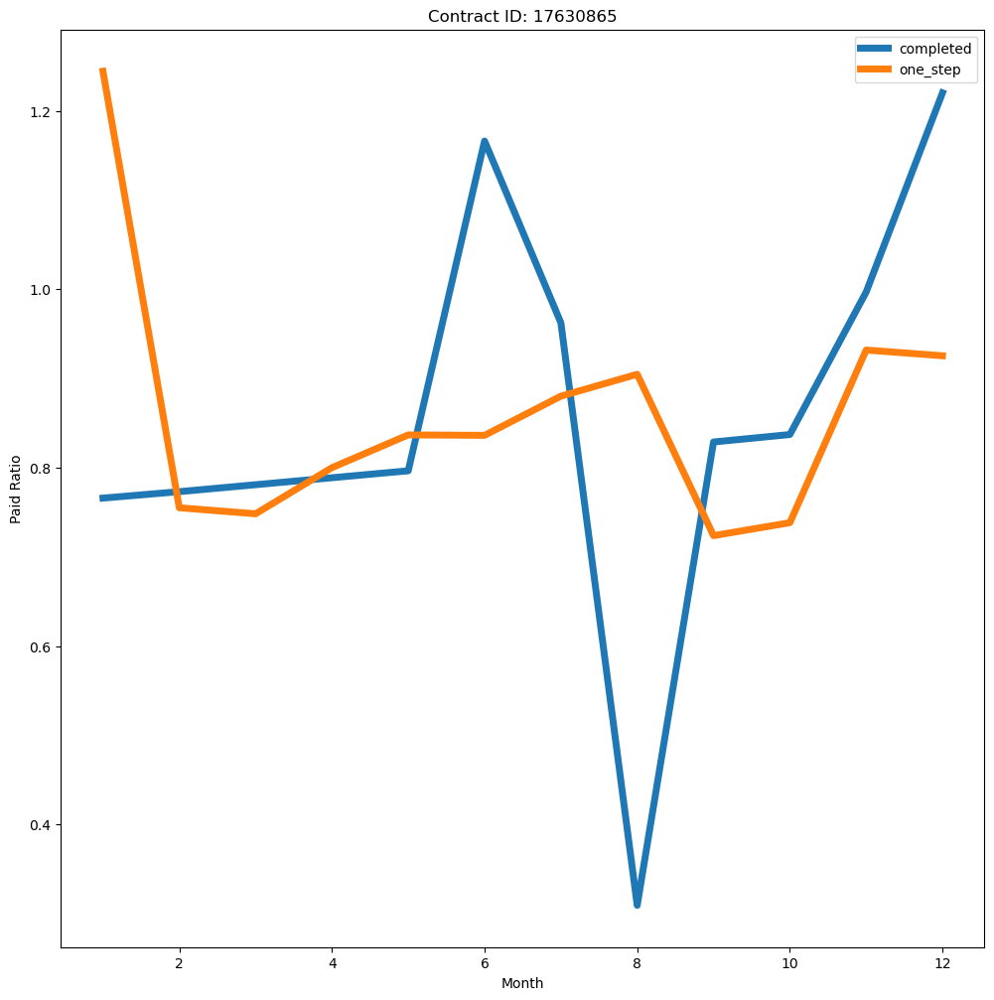

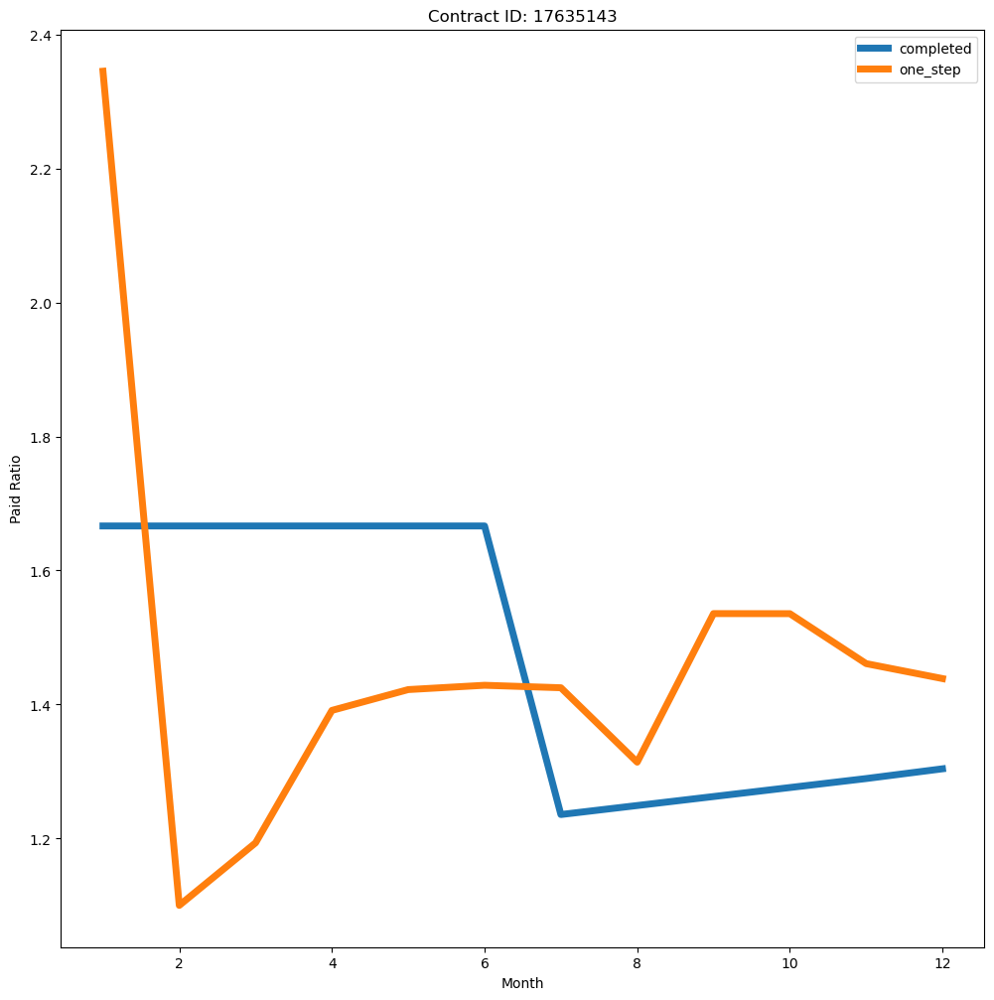

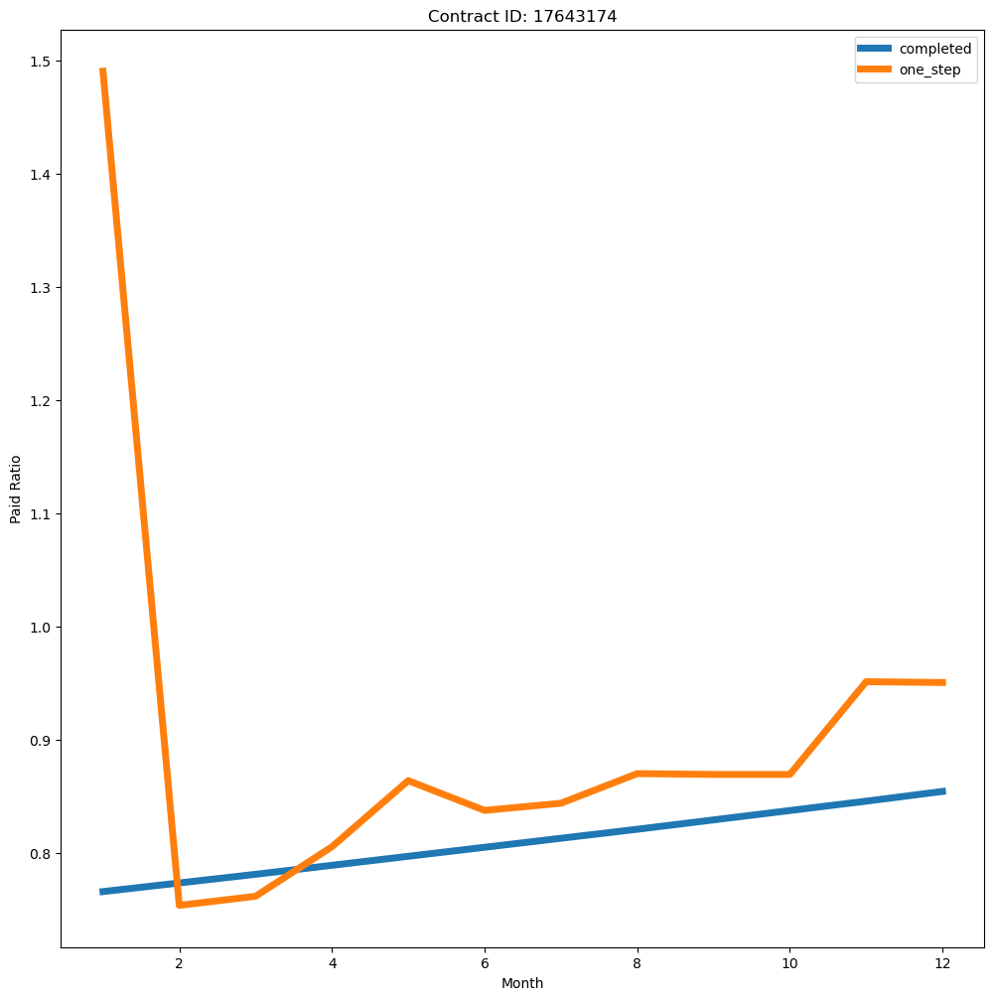

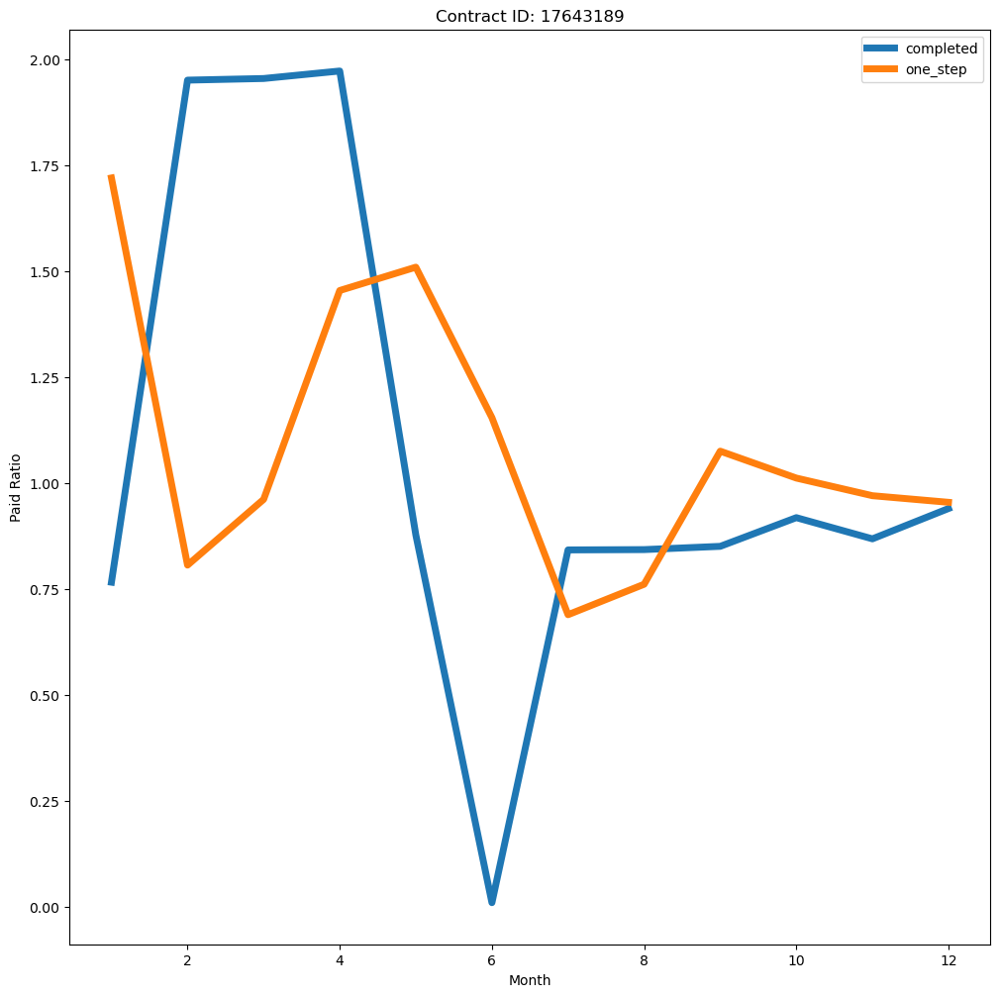

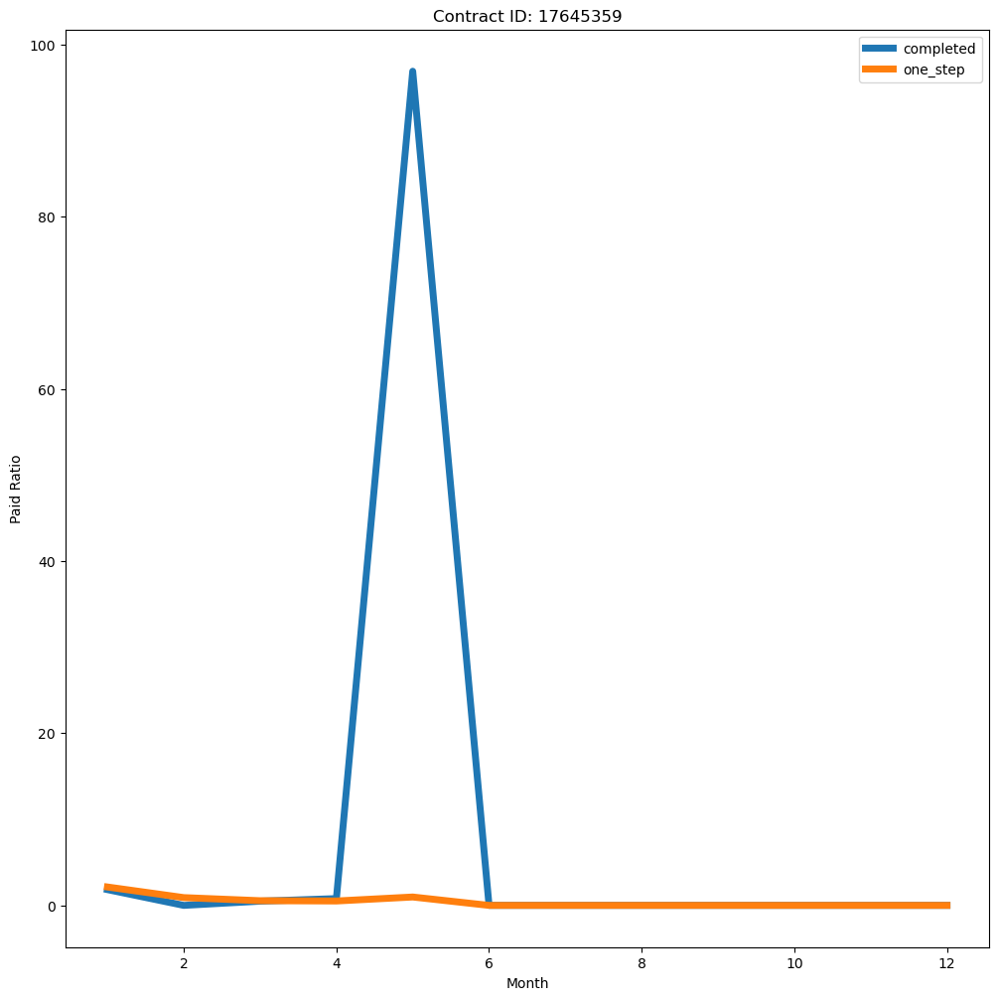

...

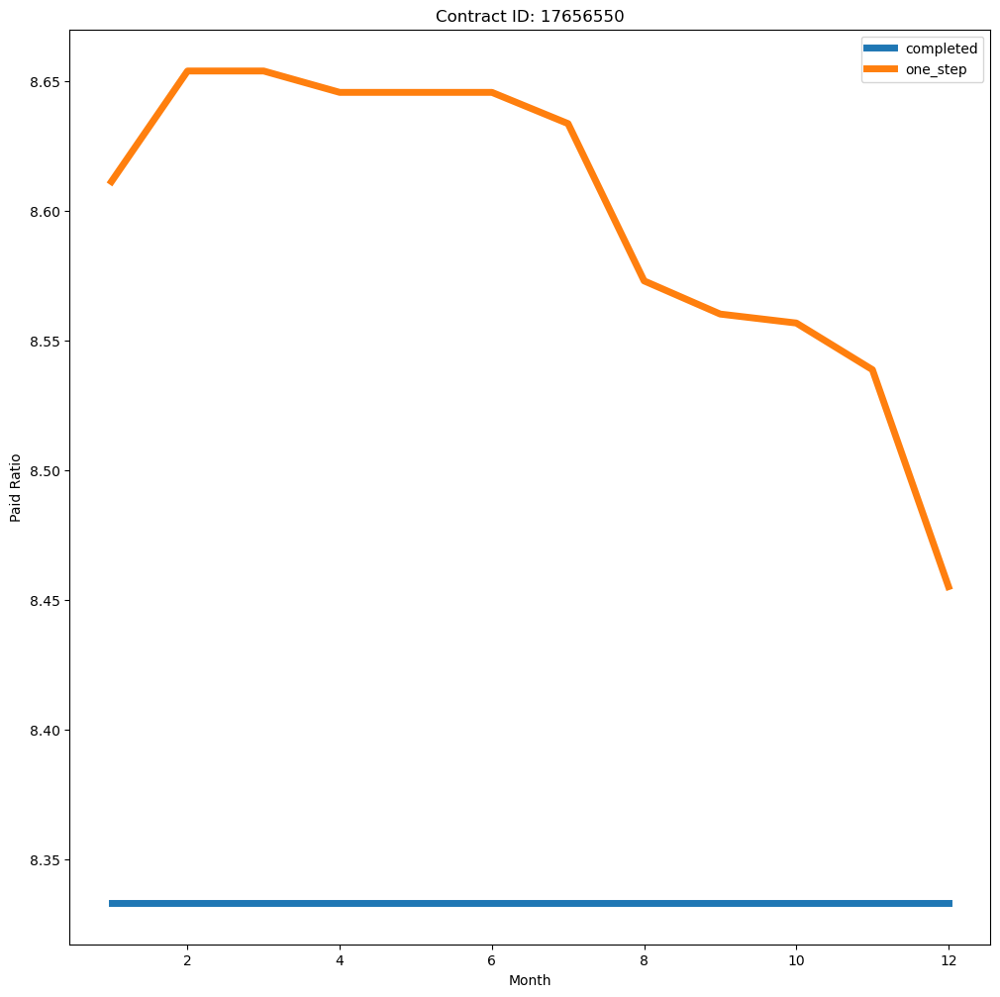

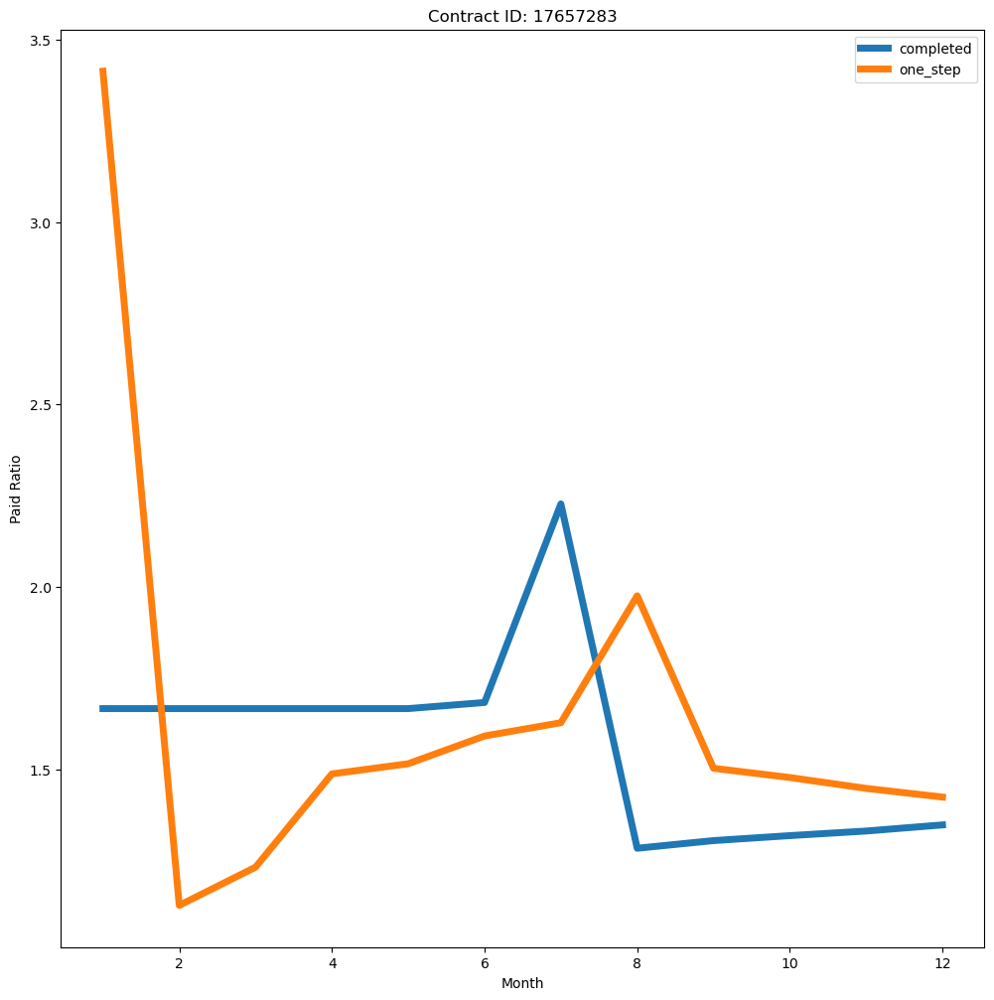

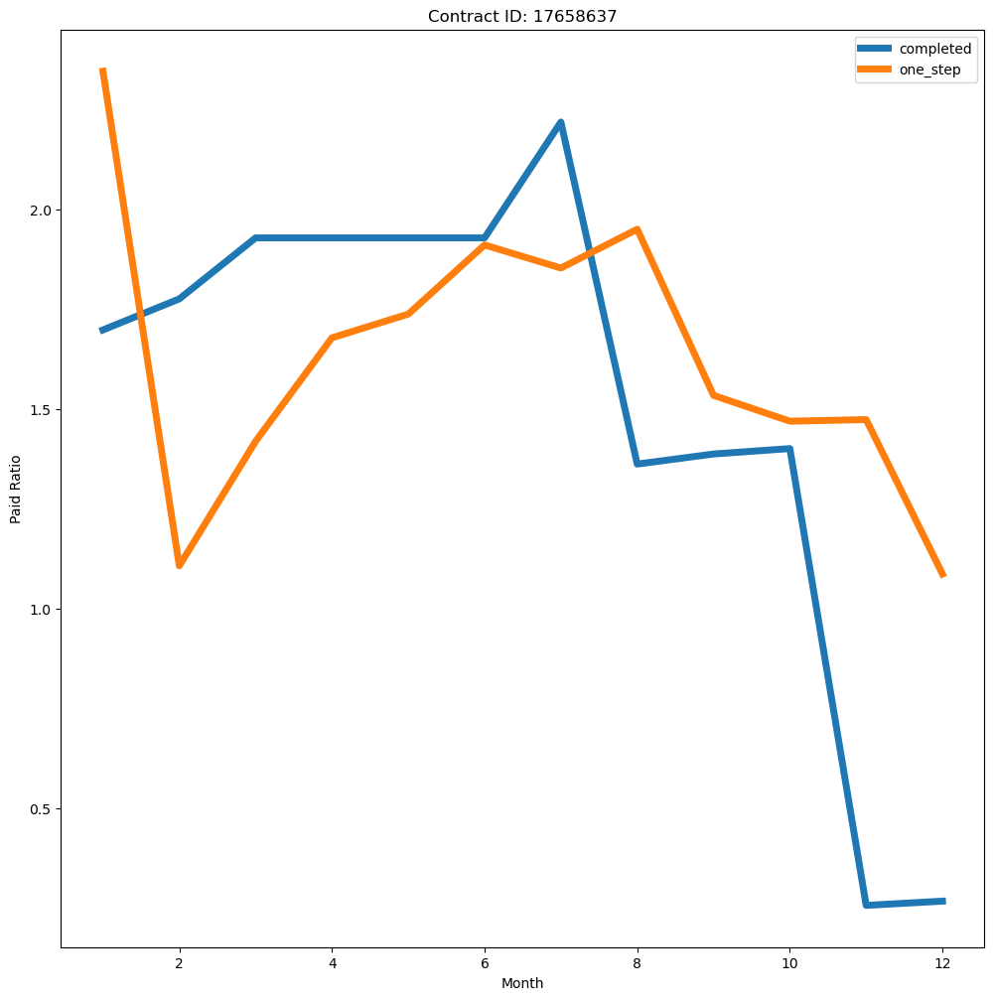

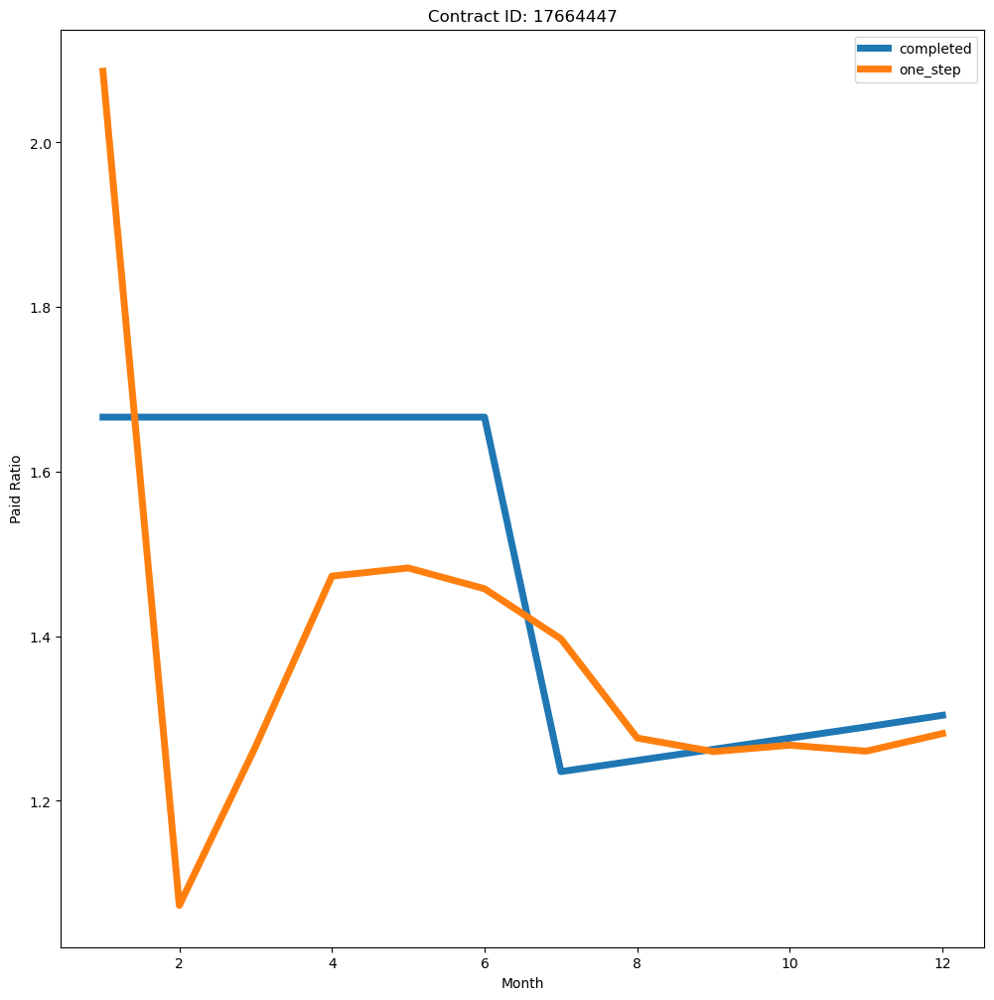

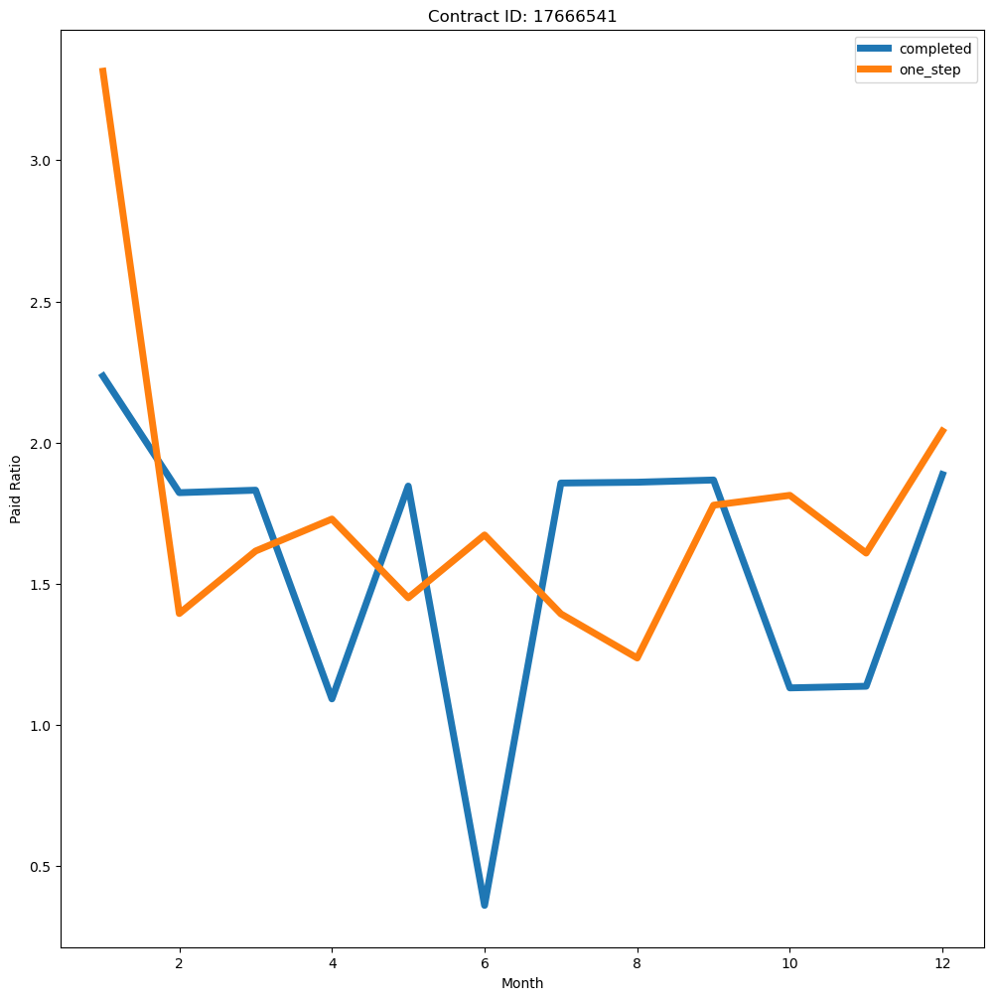

In [6]:
counter: int = 1
switcher: int = 1
PLOT_FREQUENCY: int = 60
PLOT_COUNT: int = 15
    
key: str; df: pd.DataFrame
for key, df in data_final.groupby('CONTRACT_ID'):
    
    # Plot once in every PLOT_FREQUENCY keys.
    if switcher % PLOT_FREQUENCY != 0:
        switcher += 1
        continue
        
    df_info: pd.DataFrame = pd.DataFrame.from_dict(OrderedDict({
        'completed' : np.array(df['PERCENT_ACTUAL'])[:MONTHS_IN_YEAR],
        'one_step'  : np.array(df['ONE_STEP_PREDICTION_REPAYMENT_ACTUAL'])[:MONTHS_IN_YEAR]
    }))
    df_info.index += 1
    
    FIGURE_WIDTH: int = 12
    FIGURE_HEIGHT: int = 12
    df_info.plot(figsize=(FIGURE_WIDTH, FIGURE_HEIGHT), linewidth=5)
    plt.title("Contract ID: " + str(key))
    plt.xlabel("Month")
    plt.ylabel("Paid Ratio")
    plt.savefig('images/fill/two-series-{}.png'.format(key), dpi=300, bbox_inches='tight')
    counter += 1
    if counter > PLOT_COUNT:
        break

Exporting filled data to CSV and JobLib.

In [7]:
all_data_filled_na: DataTable = all_data_with_na
all_data_filled_na.matrix = data_final
data_final.to_csv('prepared_data/all_data_filled_na.csv')
joblib.dump(all_data_filled_na, 'prepared_data/all_data_filled_na.jbl')

['prepared_data/all_data_filled_na.jbl']